# Spectral_Analysis — part 7 of 7

This notebook was automatically split from a larger notebook.

<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;"><h3 style="color:#E8E8E8;margin-top:0;">Theory and method — Phase-locking value</h3><p>PLV measures concentration of instantaneous phase differences across samples, trials, or windows. It is insensitive to amplitude and equals one only when the phase difference is constant over the averaging ensemble.</p><p><b>Cell role.</b> This code applies that theory to the notebook's existing EEG-derived data and preserves the surrounding notebook's plotting/output conventions. Numerical shortcuts selected by a speed mode change sampling density, iteration counts, or visualization resolution; they do not change the defining formula above.</p></div>

$$\\operatorname{PLV}=\\left|\\frac1N\\sum_{n=1}^{N}e^{i(\\phi_x[n]-\\phi_y[n])}\\right|.$$


Loaded feature sources:
  Loaded traveling-wave trajectory: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_alpha_traveling_wave_atlas/traveling_wave_trajectory.csv
  Loaded PLV dict: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_phase_locking_value_atlas/plv_output_dict.npy
  Loaded AES dict: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_amplitude_envelope_synchrony/aes_output_dict.npy
  Loaded resonance NPZ: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_resonance_cfc_wavelet_adaptive_stft_FIXED/resonance_cfc_wavelet_adaptive_stft_outputs.npz
Features used: 28
Selected number of regimes: 3
Raw regime counts:
  R0: 116 windows (12.0%)
  R1: 38 windows (3.9%)
  R2: 812 windows (84.1%)
Cleaned regime counts:
  R0: 40 windows (4.1%)
  R1: 114 windows (11.8%)
  R2: 812 windows (84.1%)
Saved summary CSV: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_multimodal_regime_atlas/multim

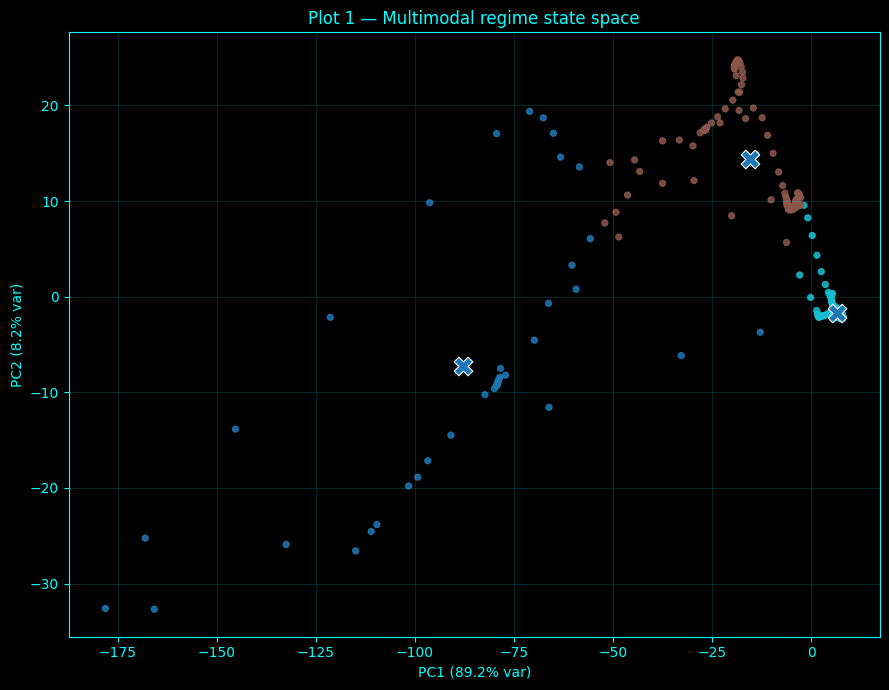

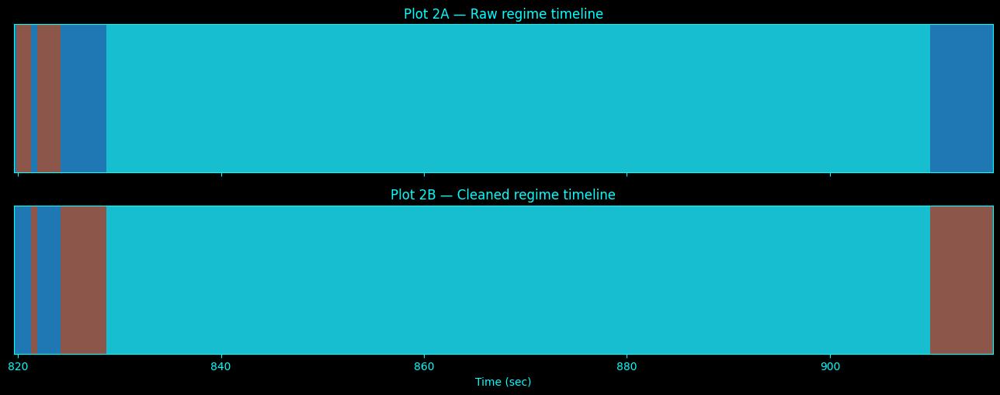

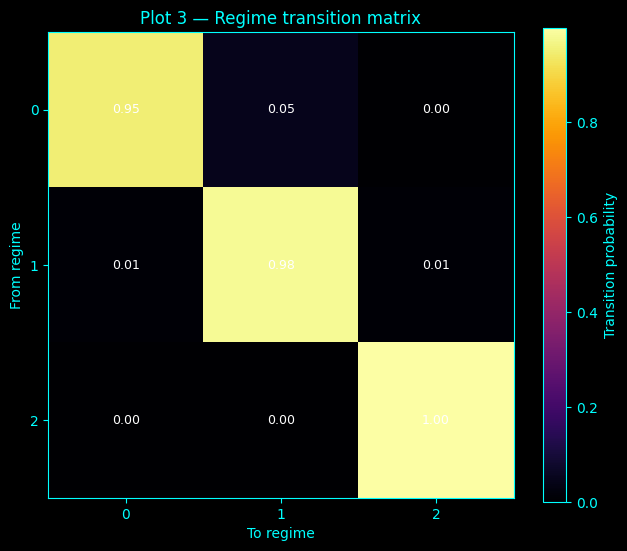

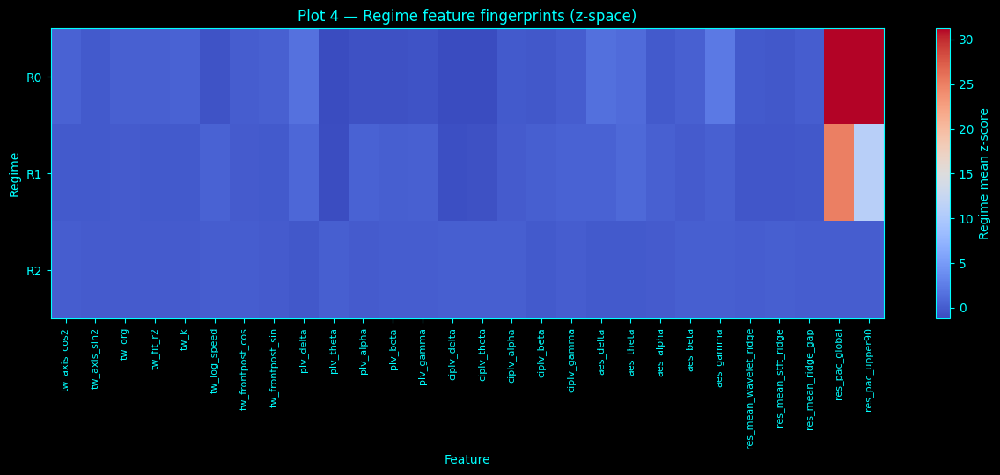

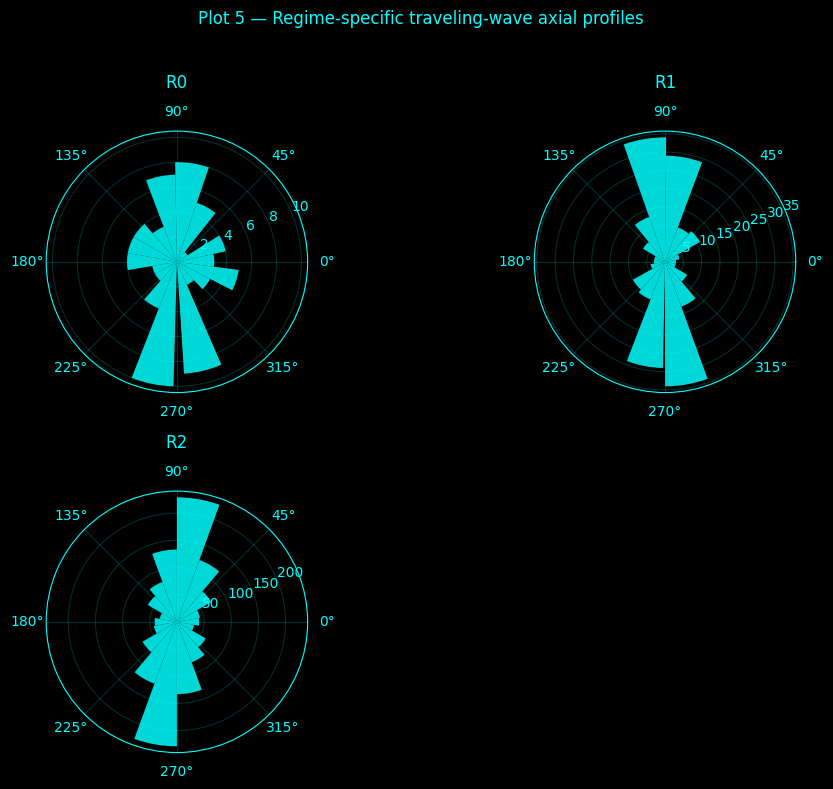

Saved plot 1: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_multimodal_regime_atlas/plots/plot1_pca_regime_state_space.png
Saved plot 2: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_multimodal_regime_atlas/plots/plot2_regime_timeline.png
Saved plot 3: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_multimodal_regime_atlas/plots/plot3_regime_transition_matrix.png
Saved plot 4: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_multimodal_regime_atlas/plots/plot4_regime_feature_fingerprints.png
Saved plot 5: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_multimodal_regime_atlas/plots/plot5_regime_axial_direction_profiles.png
Done.


In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.vq import kmeans2

# -------------------------------------------------------
# CONFIG — FILE PATHS ONLY, NO NOTEBOOK MEMORY
# -------------------------------------------------------
base_dir = "/home/a/projects/Complete-Neural-Signal-Analysis"
results_dir = os.path.join(base_dir, "results")

out_dir = os.path.join(results_dir, "exploratory_multimodal_regime_atlas")
plots_dir = os.path.join(out_dir, "plots")
os.makedirs(out_dir, exist_ok=True)
os.makedirs(plots_dir, exist_ok=True)

# Candidate upstream outputs from earlier blocks
traveling_wave_csv_candidates = [
    os.path.join(results_dir, "exploratory_alpha_traveling_wave_atlas", "traveling_wave_trajectory.csv"),
    "/mnt/data/traveling_wave_trajectory.csv",
]

plv_dict_candidates = [
    os.path.join(results_dir, "exploratory_phase_locking_value_atlas", "plv_output_dict.npy"),
]

aes_dict_candidates = [
    os.path.join(results_dir, "exploratory_amplitude_envelope_synchrony", "aes_output_dict.npy"),
]

resonance_npz_candidates = [
    os.path.join(results_dir, "exploratory_resonance_cfc_wavelet_adaptive_stft_FIXED", "resonance_cfc_wavelet_adaptive_stft_outputs.npz"),
    os.path.join(results_dir, "exploratory_resonance_cfc_wavelet_adaptive_stft", "resonance_cfc_wavelet_adaptive_stft_outputs.npz"),
]

# Regime settings
candidate_k_values = [3, 4, 5, 6]
default_k_if_selection_fails = 4
min_regime_duration_sec = 0.50

# Data-quality / edge handling
min_feature_valid_fraction = 0.50
min_time_valid_fraction = 0.60
edge_trim_sec = 2.0

ACCENT = "cyan"
BG = "black"
eps = 1e-12

plt.rcParams.update({
    "figure.facecolor": BG,
    "axes.facecolor": BG,
    "savefig.facecolor": BG,
    "text.color": ACCENT,
    "axes.labelcolor": ACCENT,
    "axes.edgecolor": ACCENT,
    "axes.titlecolor": ACCENT,
    "xtick.color": ACCENT,
    "ytick.color": ACCENT,
    "grid.color": ACCENT,
    "legend.facecolor": BG,
    "legend.edgecolor": ACCENT,
    "font.size": 10,
})

# -------------------------------------------------------
# STYLE
# -------------------------------------------------------
def style_ax(ax, heatmap=False):
    ax.set_facecolor(BG)
    ax.tick_params(colors=ACCENT)
    for spine in ax.spines.values():
        spine.set_color(ACCENT)
    if heatmap:
        ax.grid(False)
    else:
        ax.grid(True, alpha=0.18, color=ACCENT, linewidth=0.6)

# -------------------------------------------------------
# IO HELPERS
# -------------------------------------------------------
def first_existing(paths):
    for p in paths:
        if os.path.exists(p):
            return p
    return None

def load_dict_npy(path):
    obj = np.load(path, allow_pickle=True)
    if isinstance(obj, np.ndarray) and obj.shape == ():
        return obj.item()
    try:
        return obj.item()
    except Exception:
        return obj

# -------------------------------------------------------
# NUMERIC HELPERS
# -------------------------------------------------------
def smooth_1d(x, win=7):
    x = np.asarray(x, dtype=float)
    if win <= 1 or len(x) < win:
        return x
    kernel = np.ones(win, dtype=float) / win
    return np.convolve(x, kernel, mode="same")

def percentile_limits(x, lo=2, hi=98):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]
    if len(x) == 0:
        return None, None
    return float(np.percentile(x, lo)), float(np.percentile(x, hi))

def circular_interp(times_old, values_old, times_new):
    times_old = np.asarray(times_old, dtype=float)
    values_old = np.asarray(values_old, dtype=float)
    times_new = np.asarray(times_new, dtype=float)

    mask = np.isfinite(times_old) & np.isfinite(values_old)
    if np.sum(mask) < 2:
        return np.full(len(times_new), np.nan)

    t = times_old[mask]
    v = values_old[mask]
    s = np.sin(v)
    c = np.cos(v)

    s_i = np.interp(times_new, t, s, left=np.nan, right=np.nan)
    c_i = np.interp(times_new, t, c, left=np.nan, right=np.nan)
    return np.arctan2(s_i, c_i)

def linear_interp(times_old, values_old, times_new):
    times_old = np.asarray(times_old, dtype=float)
    values_old = np.asarray(values_old, dtype=float)
    times_new = np.asarray(times_new, dtype=float)

    mask = np.isfinite(times_old) & np.isfinite(values_old)
    if np.sum(mask) < 2:
        return np.full(len(times_new), np.nan)

    return np.interp(times_new, times_old[mask], values_old[mask], left=np.nan, right=np.nan)

def robust_scale_matrix(X):
    X = np.asarray(X, dtype=float)
    med = np.nanmedian(X, axis=0)
    q25 = np.nanpercentile(X, 25, axis=0)
    q75 = np.nanpercentile(X, 75, axis=0)
    iqr = q75 - q25
    sd = np.nanstd(X, axis=0)
    scale = np.where(iqr > 1e-8, iqr, np.where(sd > 1e-8, sd, 1.0))
    Z = (X - med) / scale
    return Z, med, scale

def fill_missing_columns(X):
    X = np.asarray(X, dtype=float).copy()
    for j in range(X.shape[1]):
        col = X[:, j]
        mask = np.isfinite(col)
        if np.sum(mask) == 0:
            continue
        if np.sum(mask) == 1:
            X[:, j] = col[mask][0]
            continue
        idx = np.arange(len(col))
        X[:, j] = np.interp(idx, idx[mask], col[mask])
    return X

def pca_svd(X, n_components=5):
    X = np.asarray(X, dtype=float)
    Xc = X - np.mean(X, axis=0, keepdims=True)
    U, S, Vt = np.linalg.svd(Xc, full_matrices=False)
    scores = U[:, :n_components] * S[:n_components]
    loadings = Vt[:n_components].T
    ev = (S ** 2) / max(X.shape[0] - 1, 1)
    evr = ev / (np.sum(ev) + eps)
    return scores, loadings, evr[:n_components]

def calinski_harabasz_score(X, labels):
    X = np.asarray(X, dtype=float)
    labels = np.asarray(labels)
    uniq = np.unique(labels)
    n = len(labels)
    k = len(uniq)

    if k < 2 or k >= n:
        return np.nan

    overall_mean = np.mean(X, axis=0)
    B = 0.0
    W = 0.0

    for lab in uniq:
        Xi = X[labels == lab]
        if len(Xi) == 0:
            continue
        mean_i = np.mean(Xi, axis=0)
        B += len(Xi) * np.sum((mean_i - overall_mean) ** 2)
        W += np.sum((Xi - mean_i) ** 2)

    if W <= 0:
        return np.nan

    return (B / max(k - 1, 1)) / (W / max(n - k, 1))

def relabel_by_first_appearance(labels):
    labels = np.asarray(labels, dtype=int)
    order = []
    for x in labels:
        if x not in order:
            order.append(x)
    mapping = {old: new for new, old in enumerate(order)}
    return np.array([mapping[x] for x in labels], dtype=int)

def merge_short_runs(labels, min_run_len):
    labels = np.asarray(labels, dtype=int).copy()
    changed = True

    while changed:
        changed = False
        n = len(labels)
        start = 0

        while start < n:
            end = start + 1
            while end < n and labels[end] == labels[start]:
                end += 1

            run_len = end - start
            if run_len < min_run_len:
                left_lab = labels[start - 1] if start > 0 else None
                right_lab = labels[end] if end < n else None

                if left_lab is not None and right_lab is not None:
                    replacement = left_lab if run_len <= 2 else right_lab
                elif left_lab is not None:
                    replacement = left_lab
                elif right_lab is not None:
                    replacement = right_lab
                else:
                    replacement = labels[start]

                labels[start:end] = replacement
                changed = True
                break

            start = end

    return labels

# -------------------------------------------------------
# FEATURE LOADING
# -------------------------------------------------------
feature_series = {}
feature_notes = []
common_time = None

# ---------------------------
# traveling-wave features
# ---------------------------
travel_csv_path = first_existing(traveling_wave_csv_candidates)
if travel_csv_path is not None:
    tw = pd.read_csv(travel_csv_path)
    common_time = tw["time_sec"].values.astype(float)

    # axial encoding for direction
    theta = np.radians(tw["wave_direction_deg"].values.astype(float))
    feature_series["tw_axis_cos2"] = np.cos(2.0 * theta)
    feature_series["tw_axis_sin2"] = np.sin(2.0 * theta)

    feature_series["tw_org"] = tw["organization_score_s"].values.astype(float)
    feature_series["tw_fit_r2"] = tw["fit_r2_s"].values.astype(float)
    feature_series["tw_k"] = tw["wavenumber_rad_per_unit_s"].values.astype(float)

    speed = tw["phase_velocity_units_per_sec_s"].values.astype(float)
    finite_speed = speed[np.isfinite(speed)]
    if len(finite_speed) > 0:
        speed_clip = np.nanpercentile(finite_speed, 95)
        speed = np.where(np.isfinite(speed), np.clip(speed, 0.0, speed_clip), np.nan)
    feature_series["tw_log_speed"] = np.log1p(speed)

    phase_diff = tw["front_minus_post_phase_diff_rad"].values.astype(float)
    feature_series["tw_frontpost_cos"] = np.cos(phase_diff)
    feature_series["tw_frontpost_sin"] = np.sin(phase_diff)

    feature_notes.append(f"Loaded traveling-wave trajectory: {travel_csv_path}")

# ---------------------------
# PLV features
# ---------------------------
plv_dict_path = first_existing(plv_dict_candidates)
if plv_dict_path is not None:
    plv_dict = load_dict_npy(plv_dict_path)
    t_old = np.asarray(plv_dict["dynamic_time_sec_abs"], dtype=float)

    dyn_plv = plv_dict.get("dynamic_global_plv_dict", {})
    dyn_ciplv = plv_dict.get("dynamic_global_ciplv_dict", {})

    if common_time is None:
        common_time = t_old.copy()

    for band_name, series in dyn_plv.items():
        feature_series[f"plv_{band_name}"] = linear_interp(t_old, np.asarray(series, dtype=float), common_time)

    for band_name, series in dyn_ciplv.items():
        feature_series[f"ciplv_{band_name}"] = linear_interp(t_old, np.asarray(series, dtype=float), common_time)

    feature_notes.append(f"Loaded PLV dict: {plv_dict_path}")

# ---------------------------
# AES features
# ---------------------------
aes_dict_path = first_existing(aes_dict_candidates)
if aes_dict_path is not None:
    aes_dict = load_dict_npy(aes_dict_path)
    t_old = np.asarray(aes_dict["dynamic_time_sec_abs"], dtype=float)
    dyn_aes = aes_dict.get("dynamic_global_dict", {})

    if common_time is None:
        common_time = t_old.copy()

    for band_name, series in dyn_aes.items():
        feature_series[f"aes_{band_name}"] = linear_interp(t_old, np.asarray(series, dtype=float), common_time)

    feature_notes.append(f"Loaded AES dict: {aes_dict_path}")

# ---------------------------
# resonance / PAC features
# ---------------------------
res_npz_path = first_existing(resonance_npz_candidates)
if res_npz_path is not None:
    R = np.load(res_npz_path, allow_pickle=True)
    t_old = np.asarray(R["common_time_sec_abs"], dtype=float)

    wavelet_ridge = np.asarray(R["wavelet_ridge_hz"], dtype=float)   # time x ch
    stft_ridge = np.asarray(R["stft_ridge_hz"], dtype=float)         # time x ch
    dynamic_pac = np.asarray(R["dynamic_pac_matrix"], dtype=float)   # time x ch

    if common_time is None:
        common_time = t_old.copy()

    mean_wavelet = np.nanmean(wavelet_ridge, axis=1)
    mean_stft = np.nanmean(stft_ridge, axis=1)
    ridge_gap = np.nanmean(np.abs(wavelet_ridge - stft_ridge), axis=1)
    pac_global = np.nanmean(dynamic_pac, axis=1)
    pac_upper = np.nanpercentile(dynamic_pac, 90, axis=1)

    feature_series["res_mean_wavelet_ridge"] = linear_interp(t_old, mean_wavelet, common_time)
    feature_series["res_mean_stft_ridge"] = linear_interp(t_old, mean_stft, common_time)
    feature_series["res_mean_ridge_gap"] = linear_interp(t_old, ridge_gap, common_time)
    feature_series["res_pac_global"] = linear_interp(t_old, pac_global, common_time)
    feature_series["res_pac_upper90"] = linear_interp(t_old, pac_upper, common_time)

    feature_notes.append(f"Loaded resonance NPZ: {res_npz_path}")

if common_time is None or len(feature_series) == 0:
    raise FileNotFoundError(
        "No upstream feature files found. Run the traveling-wave block first, "
        "and optionally the PLV/AES/resonance blocks."
    )

# -------------------------------------------------------
# BUILD FEATURE TABLE
# -------------------------------------------------------
feature_df = pd.DataFrame({"time_sec": common_time})
for name, series in feature_series.items():
    feature_df[name] = np.asarray(series, dtype=float)

feature_cols = [c for c in feature_df.columns if c != "time_sec"]

# feature validity filter
valid_frac_by_feature = feature_df[feature_cols].notna().mean(axis=0)
feature_cols = [c for c in feature_cols if valid_frac_by_feature[c] >= min_feature_valid_fraction]
feature_df = feature_df[["time_sec"] + feature_cols].copy()

# time validity filter
valid_frac_by_time = feature_df[feature_cols].notna().mean(axis=1)
keep_time_mask = valid_frac_by_time >= min_time_valid_fraction
feature_df = feature_df.loc[keep_time_mask].reset_index(drop=True)

# trim edges to suppress interpolation / boundary artifacts
tmin = feature_df["time_sec"].min()
tmax = feature_df["time_sec"].max()
edge_keep = (
    (feature_df["time_sec"] >= tmin + edge_trim_sec) &
    (feature_df["time_sec"] <= tmax - edge_trim_sec)
)
feature_df = feature_df.loc[edge_keep].reset_index(drop=True)

common_time = feature_df["time_sec"].values.astype(float)
X_raw = feature_df[feature_cols].values.astype(float)

if X_raw.shape[0] < 20 or X_raw.shape[1] < 2:
    raise ValueError("Not enough valid multimodal data left after filtering to build a regime atlas.")

# fill missing
X_filled = fill_missing_columns(X_raw)

# light temporal smoothing before clustering
for j in range(X_filled.shape[1]):
    X_filled[:, j] = smooth_1d(X_filled[:, j], win=5)

# robust scaling
X_scaled, feat_med, feat_scale = robust_scale_matrix(X_filled)

# PCA
n_components = min(5, X_scaled.shape[1], X_scaled.shape[0])
scores, loadings, evr = pca_svd(X_scaled, n_components=n_components)

# -------------------------------------------------------
# REGIME SELECTION
# -------------------------------------------------------
best_k = None
best_labels = None
best_score = -np.inf

pc_use = min(4, n_components)
X_cluster = scores[:, :pc_use]

for k in candidate_k_values:
    if k >= len(X_cluster):
        continue
    try:
        centroids, labels = kmeans2(X_cluster, k, minit="points", iter=60)
        ch = calinski_harabasz_score(X_cluster, labels)
        if np.isfinite(ch) and ch > best_score:
            best_score = ch
            best_k = k
            best_labels = labels.copy()
    except Exception:
        pass

if best_labels is None:
    _, labels = kmeans2(X_cluster, default_k_if_selection_fails, minit="points", iter=60)
    best_k = default_k_if_selection_fails
    best_labels = labels.copy()

# preserve raw labels
labels_raw = relabel_by_first_appearance(best_labels)

# gentle cleanup
dt = np.nanmedian(np.diff(common_time))
if not np.isfinite(dt) or dt <= 0:
    dt = 0.10

min_run_len = max(int(round(min_regime_duration_sec / dt)), 1)
labels_clean = merge_short_runs(labels_raw, min_run_len=min_run_len)
labels_clean = relabel_by_first_appearance(labels_clean)

n_regimes = len(np.unique(labels_clean))

# -------------------------------------------------------
# REGIME SUMMARIES
# -------------------------------------------------------
regime_summary_rows = []
for r in range(n_regimes):
    mask = labels_clean == r
    row = {
        "regime": r,
        "n_windows": int(np.sum(mask)),
        "fraction_of_time": float(np.mean(mask)),
        "start_time_sec": float(common_time[np.where(mask)[0][0]]) if np.any(mask) else np.nan,
    }
    for j, feat in enumerate(feature_cols):
        row[f"{feat}_mean"] = float(np.mean(X_filled[mask, j]))
        row[f"{feat}_zmean"] = float(np.mean(X_scaled[mask, j]))
    regime_summary_rows.append(row)

regime_summary_df = pd.DataFrame(regime_summary_rows)

# transition matrix
T = np.zeros((n_regimes, n_regimes), dtype=int)
for a, b in zip(labels_clean[:-1], labels_clean[1:]):
    T[a, b] += 1

T_prob = T.astype(float)
row_sums = T_prob.sum(axis=1, keepdims=True)
T_prob = np.divide(T_prob, np.maximum(row_sums, 1), where=row_sums > 0)

# dwell table
dwell_rows = []
start = 0
for i in range(1, len(labels_clean) + 1):
    if i == len(labels_clean) or labels_clean[i] != labels_clean[start]:
        regime = labels_clean[start]
        t0 = common_time[start]
        t1 = common_time[i - 1]
        dwell_rows.append({
            "regime": int(regime),
            "start_time_sec": float(t0),
            "end_time_sec": float(t1),
            "duration_sec": float(max(t1 - t0 + dt, dt)),
        })
        start = i

dwell_df = pd.DataFrame(dwell_rows)

fingerprint = np.vstack([
    regime_summary_df[[f"{feat}_zmean" for feat in feature_cols]].iloc[r].values
    for r in range(n_regimes)
])

# -------------------------------------------------------
# SAVE OUTPUTS
# -------------------------------------------------------
summary_csv_path = os.path.join(out_dir, "multimodal_regime_summary.csv")
dwell_csv_path = os.path.join(out_dir, "multimodal_regime_dwells.csv")
feature_csv_path = os.path.join(out_dir, "multimodal_regime_features_used.csv")
trajectory_csv_path = os.path.join(out_dir, "multimodal_regime_trajectory.csv")
npz_path = os.path.join(out_dir, "multimodal_regime_outputs.npz")
notes_txt_path = os.path.join(out_dir, "multimodal_regime_notes.txt")

plot1_path = os.path.join(plots_dir, "plot1_pca_regime_state_space.png")
plot2_path = os.path.join(plots_dir, "plot2_regime_timeline.png")
plot3_path = os.path.join(plots_dir, "plot3_regime_transition_matrix.png")
plot4_path = os.path.join(plots_dir, "plot4_regime_feature_fingerprints.png")
plot5_path = os.path.join(plots_dir, "plot5_regime_axial_direction_profiles.png")

feature_used_df = pd.DataFrame({
    "feature": feature_cols,
    "median": feat_med[:len(feature_cols)],
    "scale": feat_scale[:len(feature_cols)],
    "pc1_loading": loadings[:, 0] if n_components >= 1 else np.nan,
    "pc2_loading": loadings[:, 1] if n_components >= 2 else np.nan,
})

trajectory_df = pd.DataFrame({
    "time_sec": common_time,
    "regime_raw": labels_raw,
    "regime_clean": labels_clean,
    **{f"PC{i+1}": scores[:, i] for i in range(n_components)}
})

regime_summary_df.to_csv(summary_csv_path, index=False)
dwell_df.to_csv(dwell_csv_path, index=False)
feature_used_df.to_csv(feature_csv_path, index=False)
trajectory_df.to_csv(trajectory_csv_path, index=False)

np.savez_compressed(
    npz_path,
    time_sec=common_time,
    labels_raw=labels_raw,
    labels_clean=labels_clean,
    scores=scores,
    evr=evr,
    transition_counts=T,
    transition_prob=T_prob,
    feature_names=np.array(feature_cols, dtype=object),
    fingerprint=fingerprint,
)

with open(notes_txt_path, "w") as f:
    f.write("Exploratory multimodal regime atlas\n")
    f.write("==================================\n\n")
    f.write("This atlas fuses whichever upstream outputs are available from prior analyses:\n")
    f.write("- traveling-wave features\n")
    f.write("- PLV / ciPLV dynamics\n")
    f.write("- AES dynamics\n")
    f.write("- resonance / PAC dynamics\n\n")
    f.write("Important diagnostics:\n")
    f.write("- traveling-wave direction is encoded axially as cos(2θ), sin(2θ)\n")
    f.write("- edge windows are trimmed to reduce interpolation artifacts\n")
    f.write("- both raw and cleaned regime timelines are saved\n\n")
    f.write("Loaded sources:\n")
    for note in feature_notes:
        f.write(f"  - {note}\n")
    f.write("\n")
    f.write(f"Features used: {len(feature_cols)}\n")
    f.write(f"Selected number of regimes: {n_regimes}\n")
    f.write(f"Selection score (Calinski-Harabasz): {best_score}\n")
    f.write(f"PCA explained variance ratios: {evr.tolist()}\n")

print("Loaded feature sources:")
for note in feature_notes:
    print(" ", note)

print(f"Features used: {len(feature_cols)}")
print(f"Selected number of regimes: {n_regimes}")

print("Raw regime counts:")
for r in np.unique(labels_raw):
    print(f"  R{r}: {np.sum(labels_raw == r)} windows ({100*np.mean(labels_raw == r):.1f}%)")

print("Cleaned regime counts:")
for r in np.unique(labels_clean):
    print(f"  R{r}: {np.sum(labels_clean == r)} windows ({100*np.mean(labels_clean == r):.1f}%)")

print(f"Saved summary CSV: {summary_csv_path}")
print(f"Saved dwell CSV: {dwell_csv_path}")
print(f"Saved feature CSV: {feature_csv_path}")
print(f"Saved trajectory CSV: {trajectory_csv_path}")
print(f"Saved NPZ: {npz_path}")
print(f"Saved notes TXT: {notes_txt_path}")

# -------------------------------------------------------
# PLOT 1 — PCA STATE SPACE
# -------------------------------------------------------
fig1, ax1 = plt.subplots(figsize=(9, 7), facecolor=BG)
style_ax(ax1)

if n_components >= 2:
    ax1.scatter(
        scores[:, 0],
        scores[:, 1],
        c=labels_clean,
        cmap="tab10",
        s=18,
        alpha=0.85,
    )

    for r in range(n_regimes):
        m = labels_clean == r
        ax1.scatter(
            np.mean(scores[m, 0]),
            np.mean(scores[m, 1]),
            s=180,
            marker="X",
            c=[r],
            cmap="tab10",
            edgecolors="white",
            linewidths=0.8,
        )

    ax1.set_xlabel(f"PC1 ({100 * evr[0]:.1f}% var)")
    ax1.set_ylabel(f"PC2 ({100 * evr[1]:.1f}% var)")
    ax1.set_title("Plot 1 — Multimodal regime state space")
else:
    ax1.scatter(np.arange(len(scores)), scores[:, 0], c=labels_clean, cmap="tab10", s=18, alpha=0.85)
    ax1.set_xlabel("Window index")
    ax1.set_ylabel("PC1")
    ax1.set_title("Plot 1 — Multimodal regime state axis")

fig1.tight_layout()
fig1.savefig(plot1_path, dpi=220, bbox_inches="tight")
plt.show()
plt.close(fig1)

# -------------------------------------------------------
# PLOT 2 — REGIME TIMELINE (RAW + CLEANED)
# -------------------------------------------------------
fig2, axes2 = plt.subplots(2, 1, figsize=(13, 5.2), facecolor=BG, sharex=True)
axes2 = np.atleast_1d(axes2)

for ax in axes2:
    style_ax(ax, heatmap=True)

raw_img = labels_raw[np.newaxis, :]
clean_img = labels_clean[np.newaxis, :]

axes2[0].imshow(
    raw_img,
    aspect="auto",
    interpolation="nearest",
    cmap="tab10",
    extent=[common_time[0], common_time[-1], 0, 1],
)
axes2[0].set_title("Plot 2A — Raw regime timeline")
axes2[0].set_yticks([])

axes2[1].imshow(
    clean_img,
    aspect="auto",
    interpolation="nearest",
    cmap="tab10",
    extent=[common_time[0], common_time[-1], 0, 1],
)
axes2[1].set_title("Plot 2B — Cleaned regime timeline")
axes2[1].set_xlabel("Time (sec)")
axes2[1].set_yticks([])

fig2.tight_layout()
fig2.savefig(plot2_path, dpi=220, bbox_inches="tight")
plt.show()
plt.close(fig2)

# -------------------------------------------------------
# PLOT 3 — TRANSITION MATRIX
# -------------------------------------------------------
fig3, ax3 = plt.subplots(figsize=(6.5, 5.5), facecolor=BG)
style_ax(ax3, heatmap=True)

im3 = ax3.imshow(T_prob, cmap="inferno", interpolation="nearest", aspect="equal")
ax3.set_title("Plot 3 — Regime transition matrix")
ax3.set_xlabel("To regime")
ax3.set_ylabel("From regime")
ax3.set_xticks(np.arange(n_regimes))
ax3.set_yticks(np.arange(n_regimes))

for i in range(n_regimes):
    for j in range(n_regimes):
        ax3.text(j, i, f"{T_prob[i, j]:.2f}", ha="center", va="center", color="white", fontsize=9)

cbar3 = plt.colorbar(im3, ax=ax3)
cbar3.set_label("Transition probability", color=ACCENT)
cbar3.outline.set_edgecolor(ACCENT)
cbar3.ax.tick_params(color=ACCENT)
for label in cbar3.ax.get_yticklabels():
    label.set_color(ACCENT)

fig3.tight_layout()
fig3.savefig(plot3_path, dpi=220, bbox_inches="tight")
plt.show()
plt.close(fig3)

# -------------------------------------------------------
# PLOT 4 — FEATURE FINGERPRINTS
# -------------------------------------------------------
fig4, ax4 = plt.subplots(figsize=(max(10, 0.45 * len(feature_cols)), 5.5), facecolor=BG)
style_ax(ax4, heatmap=True)

vmin4, vmax4 = percentile_limits(fingerprint, lo=2, hi=98)
if vmin4 is None or vmax4 is None:
    vmin4, vmax4 = -2.0, 2.0

im4 = ax4.imshow(
    fingerprint,
    cmap="coolwarm",
    interpolation="nearest",
    aspect="auto",
    vmin=vmin4,
    vmax=vmax4,
)

ax4.set_title("Plot 4 — Regime feature fingerprints (z-space)")
ax4.set_xlabel("Feature")
ax4.set_ylabel("Regime")
ax4.set_xticks(np.arange(len(feature_cols)))
ax4.set_xticklabels(feature_cols, rotation=90, fontsize=8)
ax4.set_yticks(np.arange(n_regimes))
ax4.set_yticklabels([f"R{r}" for r in range(n_regimes)])

cbar4 = plt.colorbar(im4, ax=ax4)
cbar4.set_label("Regime mean z-score", color=ACCENT)
cbar4.outline.set_edgecolor(ACCENT)
cbar4.ax.tick_params(color=ACCENT)
for label in cbar4.ax.get_yticklabels():
    label.set_color(ACCENT)

fig4.tight_layout()
fig4.savefig(plot4_path, dpi=220, bbox_inches="tight")
plt.show()
plt.close(fig4)

# -------------------------------------------------------
# PLOT 5 — REGIME AXIAL DIRECTION PROFILES
# -------------------------------------------------------
fig5 = plt.figure(figsize=(10, 8), facecolor=BG)

has_axial = ("tw_axis_cos2" in feature_df.columns) and ("tw_axis_sin2" in feature_df.columns)

if has_axial:
    n_cols = 2
    n_rows = int(np.ceil(n_regimes / n_cols))

    tw_cos = feature_df["tw_axis_cos2"].values
    tw_sin = feature_df["tw_axis_sin2"].values

    for r in range(n_regimes):
        ax = fig5.add_subplot(n_rows, n_cols, r + 1, projection="polar")
        ax.set_facecolor(BG)

        m = labels_clean == r
        ang_axial = 0.5 * np.arctan2(tw_sin[m], tw_cos[m])
        ang_axial = ang_axial[np.isfinite(ang_axial)]

        if len(ang_axial) > 0:
            theta = np.concatenate([ang_axial, ang_axial + np.pi])
            ax.hist(theta, bins=18, color=ACCENT, alpha=0.85)

        ax.set_title(f"R{r}", color=ACCENT, pad=12)
        ax.tick_params(colors=ACCENT)
        ax.grid(True, alpha=0.18, color=ACCENT)

    fig5.suptitle("Plot 5 — Regime-specific traveling-wave axial profiles", color=ACCENT, y=0.98)
else:
    ax = fig5.add_subplot(111)
    style_ax(ax)
    ax.text(0.5, 0.5, "Traveling-wave axial features not available", ha="center", va="center", fontsize=12, color="white")
    ax.set_xticks([])
    ax.set_yticks([])

fig5.tight_layout(rect=[0, 0, 1, 0.96])
fig5.savefig(plot5_path, dpi=220, bbox_inches="tight")
plt.show()
plt.close(fig5)

print(f"Saved plot 1: {plot1_path}")
print(f"Saved plot 2: {plot2_path}")
print(f"Saved plot 3: {plot3_path}")
print(f"Saved plot 4: {plot4_path}")
print(f"Saved plot 5: {plot5_path}")
print("Done.")

<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;"><h3 style="color:#E8E8E8;margin-top:0;">Theory and method — Phase-locking value</h3><p>PLV measures concentration of instantaneous phase differences across samples, trials, or windows. It is insensitive to amplitude and equals one only when the phase difference is constant over the averaging ensemble.</p><p><b>Cell role.</b> This code applies that theory to the notebook's existing EEG-derived data and preserves the surrounding notebook's plotting/output conventions. Numerical shortcuts selected by a speed mode change sampling density, iteration counts, or visualization resolution; they do not change the defining formula above.</p></div>

$$\\operatorname{PLV}=\\left|\\frac1N\\sum_{n=1}^{N}e^{i(\\phi_x[n]-\\phi_y[n])}\\right|.$$


/tmp/ipykernel_11984/2617836061.py:659: RuntimeWarning: Mean of empty slice
  mean_plv_alpha = float(np.nanmean(linear_interp(plv_time, plv_alpha, burst_time))) if plv_time is not None else np.nan
/tmp/ipykernel_11984/2617836061.py:660: RuntimeWarning: Mean of empty slice
  mean_ciplv_alpha = float(np.nanmean(linear_interp(plv_time, ciplv_alpha, burst_time))) if plv_time is not None else np.nan
/tmp/ipykernel_11984/2617836061.py:661: RuntimeWarning: Mean of empty slice
  mean_aes_alpha = float(np.nanmean(linear_interp(aes_time, aes_alpha, burst_time))) if aes_time is not None else np.nan


Posterior alpha peak: 10.803 Hz
Individualized alpha band: [9.303, 12.303] Hz
Bursts found: 24
Selected archetypes: 2
Minimum bursts per archetype: 3
  Archetype 0: 13 bursts
  Archetype 1: 11 bursts
Saved burst CSV: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_alpha_burst_multimodal_atlas/alpha_burst_summary.csv
Saved descriptor CSV: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_alpha_burst_multimodal_atlas/alpha_burst_descriptors_used.csv
Saved locked NPZ: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_alpha_burst_multimodal_atlas/alpha_burst_locked_trajectories.npz
Saved notes TXT: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_alpha_burst_multimodal_atlas/alpha_burst_notes.txt


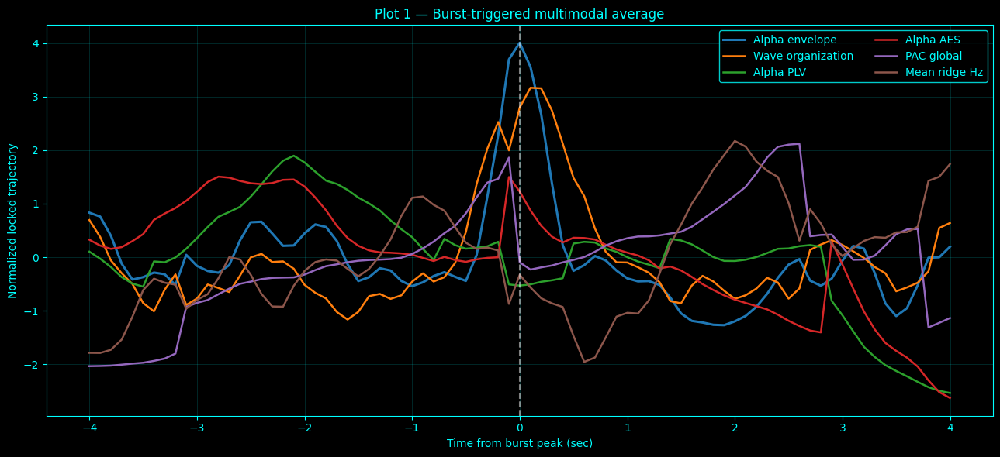

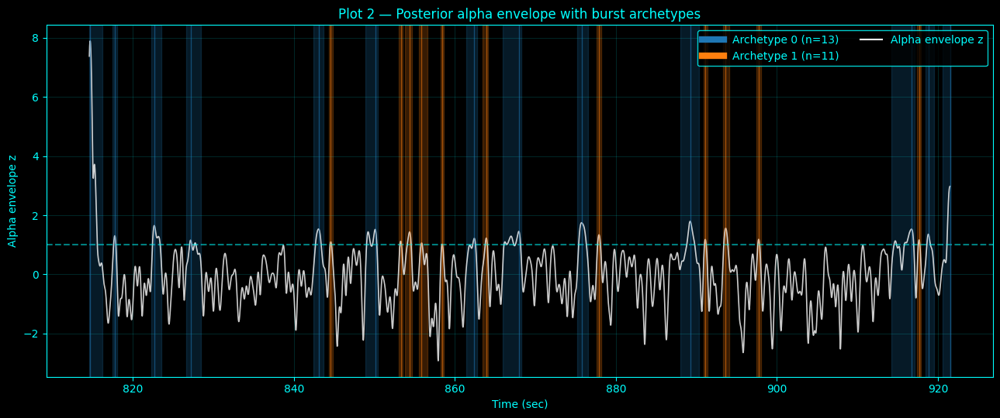

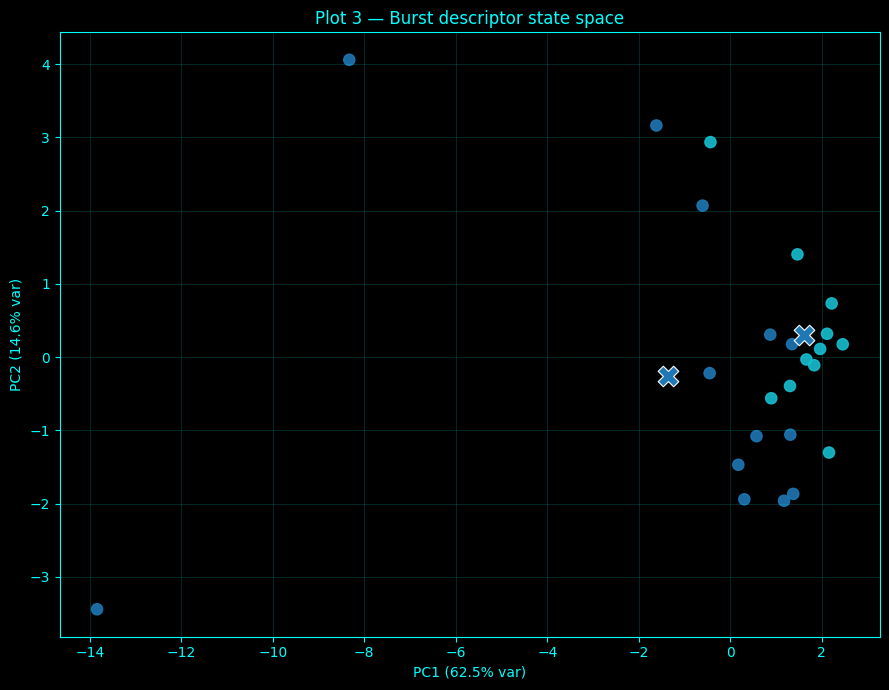

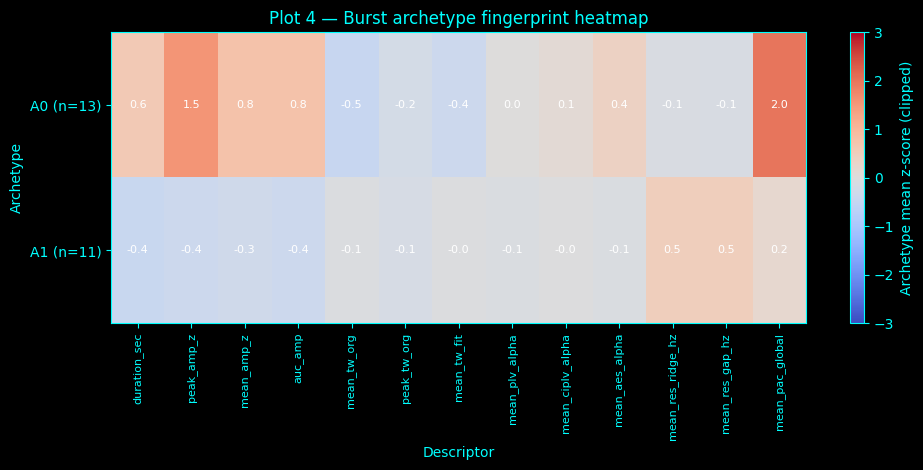

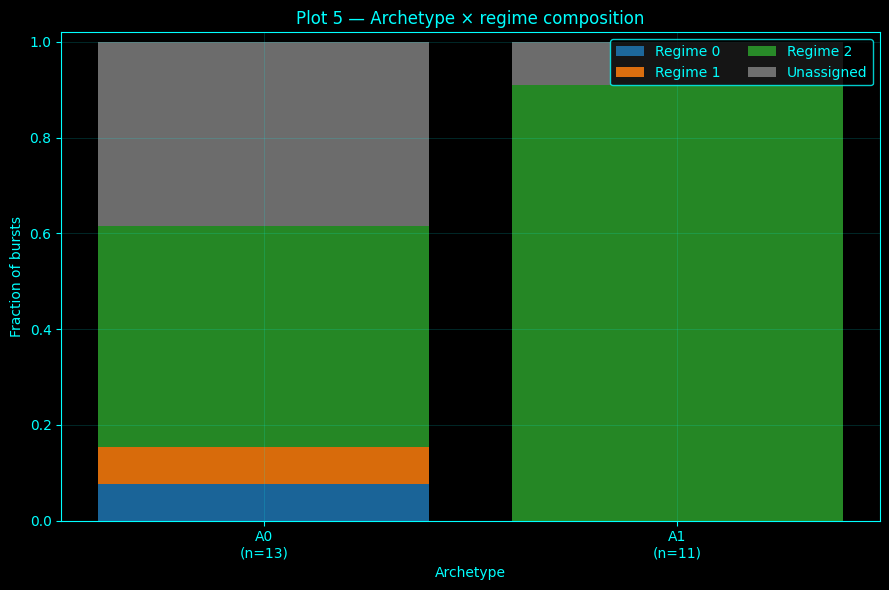

Saved plot 1: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_alpha_burst_multimodal_atlas/plots/plot1_burst_triggered_multimodal_average.png
Saved plot 2: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_alpha_burst_multimodal_atlas/plots/plot2_alpha_envelope_with_burst_archetypes.png
Saved plot 3: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_alpha_burst_multimodal_atlas/plots/plot3_burst_descriptor_state_space.png
Saved plot 4: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_alpha_burst_multimodal_atlas/plots/plot4_archetype_fingerprint_heatmap.png
Saved plot 5: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_alpha_burst_multimodal_atlas/plots/plot5_archetype_regime_composition.png
Done.


In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
from scipy.cluster.vq import kmeans2

# -------------------------------------------------------
# CONFIG — FILE PATHS ONLY, NO NOTEBOOK MEMORY
# -------------------------------------------------------
base_dir = "/home/a/projects/Complete-Neural-Signal-Analysis"
eeg_path = os.path.join(base_dir, "eeg_data_with_channels.npy")
results_dir = os.path.join(base_dir, "results")

out_dir = os.path.join(results_dir, "exploratory_alpha_burst_multimodal_atlas")
plots_dir = os.path.join(out_dir, "plots")
os.makedirs(out_dir, exist_ok=True)
os.makedirs(plots_dir, exist_ok=True)

# Candidate upstream outputs
traveling_wave_csv_candidates = [
    os.path.join(results_dir, "exploratory_alpha_traveling_wave_atlas", "traveling_wave_trajectory.csv"),
    "/mnt/data/traveling_wave_trajectory.csv",
]

plv_dict_candidates = [
    os.path.join(results_dir, "exploratory_phase_locking_value_atlas", "plv_output_dict.npy"),
]

aes_dict_candidates = [
    os.path.join(results_dir, "exploratory_amplitude_envelope_synchrony", "aes_output_dict.npy"),
]

resonance_npz_candidates = [
    os.path.join(results_dir, "exploratory_resonance_cfc_wavelet_adaptive_stft_FIXED", "resonance_cfc_wavelet_adaptive_stft_outputs.npz"),
    os.path.join(results_dir, "exploratory_resonance_cfc_wavelet_adaptive_stft", "resonance_cfc_wavelet_adaptive_stft_outputs.npz"),
]

regime_traj_candidates = [
    os.path.join(results_dir, "exploratory_multimodal_regime_atlas", "multimodal_regime_trajectory.csv"),
]

# Segment config
sampling_rate = 1000
start_time, end_time = 814.571, 921.515
start_index, end_index = int(start_time * sampling_rate), int(end_time * sampling_rate)

apply_common_average_reference = False
detrend_mode = "constant"
zscore_each_channel = False

analysis_downsample_factor = 4
fs_analysis = sampling_rate / analysis_downsample_factor  # 250 Hz

# Alpha burst settings
alpha_search_band = (7.0, 13.0)
alpha_halfwidth_hz = 1.5
posterior_alpha_channels = ["P3", "Pz", "P4", "POz", "O1", "Oz", "O2"]

# Burst detection on posterior consensus alpha envelope
burst_high_z = 1.0
burst_low_z = 0.25
min_burst_duration_sec = 0.20
merge_gap_sec = 0.15

# Event-locking window around burst peak
lock_window_sec = (-4.0, 4.0)
lock_step_sec = 0.10

# Archetype clustering
candidate_k_values = [2, 3, 4, 5]
default_k_if_selection_fails = 3
fingerprint_clip_z = 3.0

# Plotting / style
ACCENT = "cyan"
BG = "black"
eps = 1e-12

plt.rcParams.update({
    "figure.facecolor": BG,
    "axes.facecolor": BG,
    "savefig.facecolor": BG,
    "text.color": ACCENT,
    "axes.labelcolor": ACCENT,
    "axes.edgecolor": ACCENT,
    "axes.titlecolor": ACCENT,
    "xtick.color": ACCENT,
    "ytick.color": ACCENT,
    "grid.color": ACCENT,
    "legend.facecolor": BG,
    "legend.edgecolor": ACCENT,
    "font.size": 10,
})

eeg_channel_names = [
    'Fp1', 'Fpz', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FC5', 'FC1', 'FC2', 'FC6',
    'M1', 'T7', 'C3', 'Cz', 'C4', 'T8', 'M2', 'CP5', 'CP1', 'CP2', 'CP6',
    'P7', 'P3', 'Pz', 'P4', 'P8', 'POz', 'O1', 'Oz', 'O2'
]

# -------------------------------------------------------
# STYLE
# -------------------------------------------------------
def style_ax(ax, heatmap=False):
    ax.set_facecolor(BG)
    ax.tick_params(colors=ACCENT)
    for spine in ax.spines.values():
        spine.set_color(ACCENT)
    if heatmap:
        ax.grid(False)
    else:
        ax.grid(True, alpha=0.18, color=ACCENT, linewidth=0.6)

# -------------------------------------------------------
# HELPERS
# -------------------------------------------------------
def first_existing(paths):
    for p in paths:
        if os.path.exists(p):
            return p
    return None

def load_dict_npy(path):
    obj = np.load(path, allow_pickle=True)
    if isinstance(obj, np.ndarray) and obj.shape == ():
        return obj.item()
    try:
        return obj.item()
    except Exception:
        return obj

def ensure_time_channel_layout(x, n_channels_expected):
    x = np.asarray(x, dtype=float)
    if x.ndim != 2:
        raise ValueError(f"Expected 2D EEG array, got shape {x.shape}")
    if x.shape[1] == n_channels_expected:
        return x
    if x.shape[0] == n_channels_expected:
        return x.T
    raise ValueError(f"Unexpected EEG shape {x.shape}; cannot identify channel axis.")

def maybe_common_average_reference(x, enabled=False):
    if not enabled:
        return x
    return x - np.mean(x, axis=1, keepdims=True)

def preprocess_channel(y, detrend_mode="constant", zscore=False):
    y = np.asarray(y, dtype=float)
    if detrend_mode is not None:
        y = signal.detrend(y, type=detrend_mode)
    if zscore:
        sd = np.std(y)
        y = (y - np.mean(y)) / (sd + eps)
    return y

def smooth_1d(x, win=7):
    x = np.asarray(x, dtype=float)
    if win <= 1 or len(x) < win:
        return x
    kernel = np.ones(win, dtype=float) / win
    return np.convolve(x, kernel, mode="same")

def percentile_limits(x, lo=2, hi=98):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]
    if len(x) == 0:
        return None, None
    return float(np.percentile(x, lo)), float(np.percentile(x, hi))

def bandpass_sos(lowcut, highcut, fs, order=4):
    nyq = 0.5 * fs
    low = max(lowcut / nyq, 1e-6)
    high = min(highcut / nyq, 0.999)
    if not (low < high):
        raise ValueError(f"Invalid band {lowcut}-{highcut} Hz for fs={fs}")
    return signal.butter(order, [low, high], btype="bandpass", output="sos")

def lowpass_sos(cutoff_hz, fs, order=4):
    nyq = 0.5 * fs
    cutoff = min(cutoff_hz / nyq, 0.999)
    return signal.butter(order, cutoff, btype="lowpass", output="sos")

def compute_welch_psd(y, fs, window_sec=4.0, overlap=0.5, nfft=8192):
    nperseg = min(int(round(window_sec * fs)), len(y))
    nperseg = max(nperseg, min(256, len(y)))
    noverlap = min(int(round(overlap * nperseg)), nperseg - 1)
    f, pxx = signal.welch(
        y, fs=fs, window="hann", nperseg=nperseg, noverlap=noverlap,
        detrend="constant", scaling="density", nfft=nfft
    )
    return f, pxx

def robust_alpha_peak(freqs_hz, psd_1d, band=(7.0, 13.0)):
    mask = (freqs_hz >= band[0]) & (freqs_hz <= band[1]) & np.isfinite(psd_1d)
    if np.sum(mask) < 5:
        return np.nan
    f = freqs_hz[mask]
    y = psd_1d[mask]
    idx = int(np.nanargmax(y))
    return float(f[idx])

def linear_interp(times_old, values_old, times_new):
    times_old = np.asarray(times_old, dtype=float)
    values_old = np.asarray(values_old, dtype=float)
    times_new = np.asarray(times_new, dtype=float)
    mask = np.isfinite(times_old) & np.isfinite(values_old)
    if np.sum(mask) < 2:
        return np.full(len(times_new), np.nan)
    return np.interp(times_new, times_old[mask], values_old[mask], left=np.nan, right=np.nan)

def nearest_categorical_lookup(times_ref, values_ref, times_query, max_gap_sec=None):
    times_ref = np.asarray(times_ref, dtype=float)
    values_ref = np.asarray(values_ref)
    times_query = np.asarray(times_query, dtype=float)

    if len(times_ref) == 0:
        return np.full(len(times_query), np.nan)

    idx = np.searchsorted(times_ref, times_query, side="left")
    idx = np.clip(idx, 0, len(times_ref) - 1)

    left_idx = np.clip(idx - 1, 0, len(times_ref) - 1)
    right_idx = idx

    left_dist = np.abs(times_query - times_ref[left_idx])
    right_dist = np.abs(times_query - times_ref[right_idx])

    choose_left = left_dist <= right_dist
    nearest_idx = np.where(choose_left, left_idx, right_idx)

    out = values_ref[nearest_idx].astype(float)

    if max_gap_sec is not None:
        nearest_dist = np.minimum(left_dist, right_dist)
        out = np.where(nearest_dist <= max_gap_sec, out, np.nan)

    return out

def robust_scale_matrix(X):
    X = np.asarray(X, dtype=float)
    med = np.nanmedian(X, axis=0)
    q25 = np.nanpercentile(X, 25, axis=0)
    q75 = np.nanpercentile(X, 75, axis=0)
    iqr = q75 - q25
    sd = np.nanstd(X, axis=0)
    scale = np.where(iqr > 1e-8, iqr, np.where(sd > 1e-8, sd, 1.0))
    Z = (X - med) / scale
    return Z, med, scale

def fill_missing_columns(X):
    X = np.asarray(X, dtype=float).copy()
    for j in range(X.shape[1]):
        col = X[:, j]
        mask = np.isfinite(col)
        if np.sum(mask) == 0:
            continue
        if np.sum(mask) == 1:
            X[:, j] = col[mask][0]
            continue
        idx = np.arange(len(col))
        X[:, j] = np.interp(idx, idx[mask], col[mask])
    return X

def winsorize_columns(X, low=2, high=98):
    X = np.asarray(X, dtype=float).copy()
    for j in range(X.shape[1]):
        col = X[:, j]
        finite = np.isfinite(col)
        if np.sum(finite) < 3:
            continue
        lo = np.percentile(col[finite], low)
        hi = np.percentile(col[finite], high)
        X[finite, j] = np.clip(col[finite], lo, hi)
    return X

def pca_svd(X, n_components=5):
    X = np.asarray(X, dtype=float)
    Xc = X - np.mean(X, axis=0, keepdims=True)
    U, S, Vt = np.linalg.svd(Xc, full_matrices=False)
    scores = U[:, :n_components] * S[:n_components]
    loadings = Vt[:n_components].T
    ev = (S ** 2) / max(X.shape[0] - 1, 1)
    evr = ev / (np.sum(ev) + eps)
    return scores, loadings, evr[:n_components]

def calinski_harabasz_score(X, labels):
    X = np.asarray(X, dtype=float)
    labels = np.asarray(labels)
    uniq = np.unique(labels)
    n = len(labels)
    k = len(uniq)
    if k < 2 or k >= n:
        return np.nan

    overall_mean = np.mean(X, axis=0)
    B = 0.0
    W = 0.0
    for lab in uniq:
        Xi = X[labels == lab]
        if len(Xi) == 0:
            continue
        mean_i = np.mean(Xi, axis=0)
        B += len(Xi) * np.sum((mean_i - overall_mean) ** 2)
        W += np.sum((Xi - mean_i) ** 2)

    if W <= 0:
        return np.nan
    return (B / max(k - 1, 1)) / (W / max(n - k, 1))

def relabel_by_first_appearance(labels):
    labels = np.asarray(labels, dtype=int)
    order = []
    for x in labels:
        if x not in order:
            order.append(x)
    mapping = {old: new for new, old in enumerate(order)}
    return np.array([mapping[x] for x in labels], dtype=int)

def choose_kmeans_labels(X, candidate_k_values, default_k, min_cluster_size=2):
    best_k = None
    best_labels = None
    best_score = -np.inf

    for k in candidate_k_values:
        if k < 2 or k >= len(X):
            continue
        try:
            _, labels = kmeans2(X, k, minit="points", iter=60)
            counts = np.bincount(labels, minlength=k)
            if np.min(counts) < min_cluster_size:
                continue
            score = calinski_harabasz_score(X, labels)
            if np.isfinite(score) and score > best_score:
                best_score = score
                best_k = k
                best_labels = labels.copy()
        except Exception:
            pass

    if best_labels is None:
        k = min(default_k, max(2, len(X) - 1))
        _, labels = kmeans2(X, k, minit="points", iter=60)
        best_k = k
        best_labels = labels.copy()
        best_score = calinski_harabasz_score(X, best_labels)

    return best_k, relabel_by_first_appearance(best_labels), best_score

def merge_small_clusters(X, labels, min_size=2):
    X = np.asarray(X, dtype=float)
    labels = np.asarray(labels, dtype=int).copy()

    while True:
        uniq, counts = np.unique(labels, return_counts=True)
        if len(uniq) <= 1 or np.min(counts) >= min_size:
            break

        small_lab = uniq[np.argmin(counts)]
        large_labs = uniq[uniq != small_lab]

        cent_small = np.mean(X[labels == small_lab], axis=0)
        dists = []
        for lab in large_labs:
            cent_lab = np.mean(X[labels == lab], axis=0)
            dists.append(np.linalg.norm(cent_small - cent_lab))
        target_lab = large_labs[int(np.argmin(dists))]

        labels[labels == small_lab] = target_lab
        labels = relabel_by_first_appearance(labels)

    return labels

def mode_or_nan(x):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]
    if len(x) == 0:
        return np.nan
    vals, counts = np.unique(x.astype(int), return_counts=True)
    return float(vals[np.argmax(counts)])

def contiguous_runs(mask):
    mask = np.asarray(mask, dtype=bool)
    runs = []
    in_run = False
    start = None
    for i, v in enumerate(mask):
        if v and not in_run:
            start = i
            in_run = True
        elif not v and in_run:
            runs.append((start, i - 1))
            in_run = False
    if in_run:
        runs.append((start, len(mask) - 1))
    return runs

def detect_hysteresis_bursts(env_z, fs, high_z=1.0, low_z=0.25, min_duration_sec=0.2, merge_gap_sec=0.15):
    env_z = np.asarray(env_z, dtype=float)
    n = len(env_z)
    high_mask = env_z >= high_z
    burst_runs = []

    for h_start, h_end in contiguous_runs(high_mask):
        start = h_start
        while start > 0 and np.isfinite(env_z[start - 1]) and env_z[start - 1] >= low_z:
            start -= 1

        end = h_end
        while end < n - 1 and np.isfinite(env_z[end + 1]) and env_z[end + 1] >= low_z:
            end += 1

        burst_runs.append((start, end))

    if len(burst_runs) == 0:
        return []

    burst_runs = sorted(burst_runs, key=lambda x: x[0])
    merged = [burst_runs[0]]
    max_gap = int(round(merge_gap_sec * fs))

    for start, end in burst_runs[1:]:
        prev_start, prev_end = merged[-1]
        if start - prev_end <= max_gap:
            merged[-1] = (prev_start, max(prev_end, end))
        else:
            merged.append((start, end))

    min_len = int(round(min_duration_sec * fs))
    merged = [(s, e) for s, e in merged if (e - s + 1) >= min_len]
    return merged

# -------------------------------------------------------
# LOAD RAW EEG AND BUILD POSTERIOR ALPHA CONSENSUS ENVELOPE
# -------------------------------------------------------
eeg = np.load(eeg_path, allow_pickle=True)
eeg = ensure_time_channel_layout(eeg, len(eeg_channel_names))

if end_index > eeg.shape[0]:
    raise ValueError("Requested segment exceeds data length.")

segment = eeg[start_index:end_index, :].copy()
segment = maybe_common_average_reference(segment, enabled=apply_common_average_reference)

segment_ds = signal.resample_poly(segment, up=1, down=analysis_downsample_factor, axis=0)
segment_ds = np.asarray(segment_ds, dtype=float)

for ch in range(segment_ds.shape[1]):
    segment_ds[:, ch] = preprocess_channel(
        segment_ds[:, ch],
        detrend_mode=detrend_mode,
        zscore=zscore_each_channel,
    )

n_samples, n_channels = segment_ds.shape
time_sec = start_time + np.arange(n_samples) / fs_analysis

posterior_idx = [eeg_channel_names.index(ch) for ch in posterior_alpha_channels if ch in eeg_channel_names]
posterior_mean = np.nanmean(segment_ds[:, posterior_idx], axis=1)

freqs_hz, pxx = compute_welch_psd(posterior_mean, fs_analysis, window_sec=4.0, overlap=0.5, nfft=8192)
alpha_peak_hz = robust_alpha_peak(freqs_hz, pxx, band=alpha_search_band)
if not np.isfinite(alpha_peak_hz):
    alpha_peak_hz = 10.0

alpha_band = (
    max(alpha_search_band[0], alpha_peak_hz - alpha_halfwidth_hz),
    min(alpha_search_band[1], alpha_peak_hz + alpha_halfwidth_hz),
)

sos_alpha = bandpass_sos(alpha_band[0], alpha_band[1], fs_analysis, order=4)
sos_env = lowpass_sos(2.0, fs_analysis, order=4)

posterior_envs = []
for ch_i in posterior_idx:
    y = signal.sosfiltfilt(sos_alpha, segment_ds[:, ch_i])
    env = np.abs(signal.hilbert(y))
    env = signal.sosfiltfilt(sos_env, env)
    posterior_envs.append(env)

posterior_env = np.nanmean(np.vstack(posterior_envs), axis=0)
posterior_env_log = np.log10(posterior_env + eps)
posterior_env_z = (posterior_env_log - np.nanmean(posterior_env_log)) / (np.nanstd(posterior_env_log) + eps)

burst_runs = detect_hysteresis_bursts(
    posterior_env_z,
    fs=fs_analysis,
    high_z=burst_high_z,
    low_z=burst_low_z,
    min_duration_sec=min_burst_duration_sec,
    merge_gap_sec=merge_gap_sec,
)

if len(burst_runs) < 4:
    raise ValueError(
        f"Only found {len(burst_runs)} bursts. "
        "Try lowering burst_high_z or widening the alpha band if needed."
    )

# -------------------------------------------------------
# LOAD UPSTREAM MODALITIES
# -------------------------------------------------------
travel_path = first_existing(traveling_wave_csv_candidates)
plv_path = first_existing(plv_dict_candidates)
aes_path = first_existing(aes_dict_candidates)
res_path = first_existing(resonance_npz_candidates)
regime_path = first_existing(regime_traj_candidates)

tw_df = pd.read_csv(travel_path) if travel_path is not None else None
plv_dict = load_dict_npy(plv_path) if plv_path is not None else None
aes_dict = load_dict_npy(aes_path) if aes_path is not None else None
res_npz = np.load(res_path, allow_pickle=True) if res_path is not None else None
regime_df = pd.read_csv(regime_path) if regime_path is not None else None

# traveling-wave time series
if tw_df is not None:
    tw_time = tw_df["time_sec"].values.astype(float)
    tw_org = tw_df["organization_score_s"].values.astype(float)
    tw_fit = tw_df["fit_r2_s"].values.astype(float)
    tw_k = tw_df["wavenumber_rad_per_unit_s"].values.astype(float)
    tw_speed = tw_df["phase_velocity_units_per_sec_s"].values.astype(float)
else:
    tw_time = tw_org = tw_fit = tw_k = tw_speed = None

# PLV / ciPLV
if plv_dict is not None:
    plv_time = np.asarray(plv_dict["dynamic_time_sec_abs"], dtype=float)
    dyn_plv = plv_dict.get("dynamic_global_plv_dict", {})
    dyn_ciplv = plv_dict.get("dynamic_global_ciplv_dict", {})
    plv_alpha = np.asarray(dyn_plv.get("alpha", np.full(len(plv_time), np.nan)), dtype=float)
    ciplv_alpha = np.asarray(dyn_ciplv.get("alpha", np.full(len(plv_time), np.nan)), dtype=float)
else:
    plv_time = plv_alpha = ciplv_alpha = None

# AES
if aes_dict is not None:
    aes_time = np.asarray(aes_dict["dynamic_time_sec_abs"], dtype=float)
    dyn_aes = aes_dict.get("dynamic_global_dict", {})
    aes_alpha = np.asarray(dyn_aes.get("alpha", np.full(len(aes_time), np.nan)), dtype=float)
else:
    aes_time = aes_alpha = None

# resonance / PAC
if res_npz is not None:
    res_time = np.asarray(res_npz["common_time_sec_abs"], dtype=float)
    wavelet_ridge = np.asarray(res_npz["wavelet_ridge_hz"], dtype=float)
    stft_ridge = np.asarray(res_npz["stft_ridge_hz"], dtype=float)
    dynamic_pac = np.asarray(res_npz["dynamic_pac_matrix"], dtype=float)

    res_ridge_mean = np.nanmean(wavelet_ridge, axis=1)
    res_ridge_gap = np.nanmean(np.abs(wavelet_ridge - stft_ridge), axis=1)
    res_pac_global = np.nanmean(dynamic_pac, axis=1)
else:
    res_time = res_ridge_mean = res_ridge_gap = res_pac_global = None

# regime
if regime_df is not None:
    regime_time = regime_df["time_sec"].values.astype(float)
    if "regime_clean" in regime_df.columns:
        regime_clean = regime_df["regime_clean"].values.astype(float)
    elif "regime" in regime_df.columns:
        regime_clean = regime_df["regime"].values.astype(float)
    else:
        regime_clean = None
else:
    regime_time = regime_clean = None

# -------------------------------------------------------
# BURST-LOCKED MULTIMODAL EXTRACTION
# -------------------------------------------------------
lock_rel_time = np.arange(lock_window_sec[0], lock_window_sec[1] + lock_step_sec / 2, lock_step_sec)
n_lock = len(lock_rel_time)

burst_rows = []
locked = {
    "alpha_env_z": [],
    "tw_org": [],
    "tw_fit": [],
    "tw_k": [],
    "tw_speed": [],
    "plv_alpha": [],
    "ciplv_alpha": [],
    "aes_alpha": [],
    "res_ridge_mean": [],
    "res_ridge_gap": [],
    "res_pac_global": [],
}

for b_i, (s, e) in enumerate(burst_runs):
    burst_time = time_sec[s:e+1]
    burst_env = posterior_env_z[s:e+1]

    peak_rel_idx = int(np.nanargmax(burst_env))
    peak_idx = s + peak_rel_idx
    peak_time = time_sec[peak_idx]
    lock_abs_time = peak_time + lock_rel_time

    locked["alpha_env_z"].append(linear_interp(time_sec, posterior_env_z, lock_abs_time))

    if tw_time is not None:
        locked["tw_org"].append(linear_interp(tw_time, tw_org, lock_abs_time))
        locked["tw_fit"].append(linear_interp(tw_time, tw_fit, lock_abs_time))
        locked["tw_k"].append(linear_interp(tw_time, tw_k, lock_abs_time))
        locked["tw_speed"].append(linear_interp(tw_time, tw_speed, lock_abs_time))
    else:
        for k in ["tw_org", "tw_fit", "tw_k", "tw_speed"]:
            locked[k].append(np.full(n_lock, np.nan))

    if plv_time is not None:
        locked["plv_alpha"].append(linear_interp(plv_time, plv_alpha, lock_abs_time))
        locked["ciplv_alpha"].append(linear_interp(plv_time, ciplv_alpha, lock_abs_time))
    else:
        locked["plv_alpha"].append(np.full(n_lock, np.nan))
        locked["ciplv_alpha"].append(np.full(n_lock, np.nan))

    if aes_time is not None:
        locked["aes_alpha"].append(linear_interp(aes_time, aes_alpha, lock_abs_time))
    else:
        locked["aes_alpha"].append(np.full(n_lock, np.nan))

    if res_time is not None:
        locked["res_ridge_mean"].append(linear_interp(res_time, res_ridge_mean, lock_abs_time))
        locked["res_ridge_gap"].append(linear_interp(res_time, res_ridge_gap, lock_abs_time))
        locked["res_pac_global"].append(linear_interp(res_time, res_pac_global, lock_abs_time))
    else:
        locked["res_ridge_mean"].append(np.full(n_lock, np.nan))
        locked["res_ridge_gap"].append(np.full(n_lock, np.nan))
        locked["res_pac_global"].append(np.full(n_lock, np.nan))

    # FIX: categorical regime lookup with nearest-neighbor, not linear interpolation
    if regime_time is not None and regime_clean is not None:
        regime_vals_burst = nearest_categorical_lookup(
            regime_time,
            regime_clean,
            burst_time,
            max_gap_sec=0.50
        )
        regime_vals_peak = nearest_categorical_lookup(
            regime_time,
            regime_clean,
            np.array([peak_time]),
            max_gap_sec=0.50
        )
        regime_at_burst = mode_or_nan(regime_vals_burst)
        regime_at_peak = mode_or_nan(regime_vals_peak)
    else:
        regime_at_burst = np.nan
        regime_at_peak = np.nan

    duration_sec = len(burst_time) / fs_analysis
    peak_amp_z = float(np.nanmax(burst_env))
    mean_amp_z = float(np.nanmean(burst_env))
    auc_amp = float(np.trapz(np.maximum(burst_env, 0.0), dx=1.0 / fs_analysis))

    mean_tw_org = float(np.nanmean(linear_interp(tw_time, tw_org, burst_time))) if tw_time is not None else np.nan
    peak_tw_org = float(np.nanmax(linear_interp(tw_time, tw_org, burst_time))) if tw_time is not None else np.nan
    mean_tw_fit = float(np.nanmean(linear_interp(tw_time, tw_fit, burst_time))) if tw_time is not None else np.nan

    mean_plv_alpha = float(np.nanmean(linear_interp(plv_time, plv_alpha, burst_time))) if plv_time is not None else np.nan
    mean_ciplv_alpha = float(np.nanmean(linear_interp(plv_time, ciplv_alpha, burst_time))) if plv_time is not None else np.nan
    mean_aes_alpha = float(np.nanmean(linear_interp(aes_time, aes_alpha, burst_time))) if aes_time is not None else np.nan

    mean_res_ridge = float(np.nanmean(linear_interp(res_time, res_ridge_mean, burst_time))) if res_time is not None else np.nan
    mean_res_gap = float(np.nanmean(linear_interp(res_time, res_ridge_gap, burst_time))) if res_time is not None else np.nan
    mean_pac = float(np.nanmean(linear_interp(res_time, res_pac_global, burst_time))) if res_time is not None else np.nan

    burst_rows.append({
        "burst_index": b_i,
        "start_time_sec": float(time_sec[s]),
        "end_time_sec": float(time_sec[e]),
        "peak_time_sec": float(peak_time),
        "duration_sec": float(duration_sec),
        "peak_amp_z": peak_amp_z,
        "mean_amp_z": mean_amp_z,
        "auc_amp": auc_amp,
        "mean_tw_org": mean_tw_org,
        "peak_tw_org": peak_tw_org,
        "mean_tw_fit": mean_tw_fit,
        "mean_plv_alpha": mean_plv_alpha,
        "mean_ciplv_alpha": mean_ciplv_alpha,
        "mean_aes_alpha": mean_aes_alpha,
        "mean_res_ridge_hz": mean_res_ridge,
        "mean_res_gap_hz": mean_res_gap,
        "mean_pac_global": mean_pac,
        "regime_mode_during_burst": regime_at_burst,
        "regime_mode_at_peak": regime_at_peak,
    })

burst_df = pd.DataFrame(burst_rows)

for k in locked.keys():
    locked[k] = np.asarray(locked[k], dtype=float)

# -------------------------------------------------------
# BURST ARCHETYPES
# -------------------------------------------------------
descriptor_cols = [
    "duration_sec",
    "peak_amp_z",
    "mean_amp_z",
    "auc_amp",
    "mean_tw_org",
    "peak_tw_org",
    "mean_tw_fit",
    "mean_plv_alpha",
    "mean_ciplv_alpha",
    "mean_aes_alpha",
    "mean_res_ridge_hz",
    "mean_res_gap_hz",
    "mean_pac_global",
]

descriptor_df = burst_df[descriptor_cols].copy()
valid_frac = descriptor_df.notna().mean(axis=0)
descriptor_cols = [c for c in descriptor_cols if valid_frac[c] >= 0.50]

X_desc = descriptor_df[descriptor_cols].values.astype(float)
X_desc = fill_missing_columns(X_desc)

# robustify before clustering
X_desc = winsorize_columns(X_desc, low=2, high=98)

X_desc_z, desc_med, desc_scale = robust_scale_matrix(X_desc)

min_bursts_per_archetype = max(3, int(np.ceil(0.08 * len(X_desc_z))))

if len(X_desc_z) >= 4:
    k_arch, labels_arch, ch_score = choose_kmeans_labels(
        X_desc_z,
        candidate_k_values=candidate_k_values,
        default_k=default_k_if_selection_fails,
        min_cluster_size=min_bursts_per_archetype,
    )
    labels_arch = merge_small_clusters(X_desc_z, labels_arch, min_size=min_bursts_per_archetype)
    labels_arch = relabel_by_first_appearance(labels_arch)
else:
    k_arch = 1
    labels_arch = np.zeros(len(X_desc_z), dtype=int)
    ch_score = np.nan

burst_df["archetype"] = labels_arch

scores_burst, loadings_burst, evr_burst = pca_svd(
    X_desc_z,
    n_components=min(5, X_desc_z.shape[1], X_desc_z.shape[0])
)

n_arch = len(np.unique(labels_arch))
arch_counts = np.array([np.sum(labels_arch == a) for a in range(n_arch)], dtype=int)

arch_fingerprint = np.vstack([
    np.nanmean(X_desc_z[labels_arch == a, :], axis=0)
    for a in range(n_arch)
])

# display-clipped fingerprint only for plotting
arch_fingerprint_display = np.clip(arch_fingerprint, -fingerprint_clip_z, fingerprint_clip_z)

# archetype-locked averages
arch_locked = {}
for key, arr in locked.items():
    arch_locked[key] = []
    for a in range(n_arch):
        m = labels_arch == a
        if np.sum(m) == 0:
            arch_locked[key].append(np.full(arr.shape[1], np.nan))
        else:
            arch_locked[key].append(np.nanmean(arr[m], axis=0))
    arch_locked[key] = np.asarray(arch_locked[key], dtype=float)

# -------------------------------------------------------
# SAVE OUTPUTS
# -------------------------------------------------------
burst_csv_path = os.path.join(out_dir, "alpha_burst_summary.csv")
descriptor_csv_path = os.path.join(out_dir, "alpha_burst_descriptors_used.csv")
trajectory_npz_path = os.path.join(out_dir, "alpha_burst_locked_trajectories.npz")
notes_txt_path = os.path.join(out_dir, "alpha_burst_notes.txt")

plot1_path = os.path.join(plots_dir, "plot1_burst_triggered_multimodal_average.png")
plot2_path = os.path.join(plots_dir, "plot2_alpha_envelope_with_burst_archetypes.png")
plot3_path = os.path.join(plots_dir, "plot3_burst_descriptor_state_space.png")
plot4_path = os.path.join(plots_dir, "plot4_archetype_fingerprint_heatmap.png")
plot5_path = os.path.join(plots_dir, "plot5_archetype_regime_composition.png")

burst_df.to_csv(burst_csv_path, index=False)

pd.DataFrame({
    "descriptor": descriptor_cols,
    "median": desc_med[:len(descriptor_cols)],
    "scale": desc_scale[:len(descriptor_cols)],
    "pc1_loading": loadings_burst[:, 0] if scores_burst.shape[1] >= 1 else np.nan,
    "pc2_loading": loadings_burst[:, 1] if scores_burst.shape[1] >= 2 else np.nan,
}).to_csv(descriptor_csv_path, index=False)

np.savez_compressed(
    trajectory_npz_path,
    lock_rel_time=lock_rel_time,
    alpha_peak_hz=alpha_peak_hz,
    alpha_band=np.array(alpha_band, dtype=float),
    descriptor_cols=np.array(descriptor_cols, dtype=object),
    burst_labels=labels_arch,
    scores_burst=scores_burst,
    arch_counts=arch_counts,
    arch_fingerprint=arch_fingerprint,
    arch_fingerprint_display=arch_fingerprint_display,
    **{f"locked_{k}": v for k, v in locked.items()},
    **{f"arch_locked_{k}": v for k, v in arch_locked.items()},
)

with open(notes_txt_path, "w") as f:
    f.write("Exploratory alpha burst multimodal atlas\n")
    f.write("=======================================\n\n")
    f.write("Key fixes in this version:\n")
    f.write("1. Regime labels are categorical and are now matched by nearest-neighbor lookup, not linear interpolation.\n")
    f.write("2. Descriptor clustering is winsorized before scaling to reduce outlier-driven archetypes.\n")
    f.write("3. Tiny archetypes are prevented / merged using a minimum cluster size rule.\n")
    f.write("4. Fingerprint heatmap display is clipped for readability without altering saved raw values.\n")
    f.write("5. Plot 5 includes explicit unassigned fractions if regime mapping is unavailable.\n\n")
    f.write(f"Posterior alpha peak: {alpha_peak_hz:.3f} Hz\n")
    f.write(f"Individualized alpha band: [{alpha_band[0]:.3f}, {alpha_band[1]:.3f}] Hz\n")
    f.write(f"Bursts found: {len(burst_df)}\n")
    f.write(f"Selected archetypes: {n_arch}\n")
    f.write(f"Minimum bursts per archetype: {min_bursts_per_archetype}\n")
    f.write(f"CH score: {ch_score}\n")
    for a in range(n_arch):
        f.write(f"  Archetype {a}: {arch_counts[a]} bursts\n")

print(f"Posterior alpha peak: {alpha_peak_hz:.3f} Hz")
print(f"Individualized alpha band: [{alpha_band[0]:.3f}, {alpha_band[1]:.3f}] Hz")
print(f"Bursts found: {len(burst_df)}")
print(f"Selected archetypes: {n_arch}")
print(f"Minimum bursts per archetype: {min_bursts_per_archetype}")
for a in range(n_arch):
    print(f"  Archetype {a}: {arch_counts[a]} bursts")
print(f"Saved burst CSV: {burst_csv_path}")
print(f"Saved descriptor CSV: {descriptor_csv_path}")
print(f"Saved locked NPZ: {trajectory_npz_path}")
print(f"Saved notes TXT: {notes_txt_path}")

# -------------------------------------------------------
# PLOT 1 — BURST-TRIGGERED MULTIMODAL AVERAGE
# -------------------------------------------------------
fig1, ax1 = plt.subplots(figsize=(13, 6), facecolor=BG)
style_ax(ax1)

def norm_for_plot(x):
    x = np.asarray(x, dtype=float)
    mu = np.nanmean(x)
    sd = np.nanstd(x) + eps
    return (x - mu) / sd

avg_alpha = np.nanmean(locked["alpha_env_z"], axis=0)
ax1.plot(lock_rel_time, norm_for_plot(avg_alpha), linewidth=2.2, label="Alpha envelope")

if np.any(np.isfinite(locked["tw_org"])):
    ax1.plot(lock_rel_time, norm_for_plot(np.nanmean(locked["tw_org"], axis=0)), linewidth=1.8, label="Wave organization")

if np.any(np.isfinite(locked["plv_alpha"])):
    ax1.plot(lock_rel_time, norm_for_plot(np.nanmean(locked["plv_alpha"], axis=0)), linewidth=1.8, label="Alpha PLV")

if np.any(np.isfinite(locked["aes_alpha"])):
    ax1.plot(lock_rel_time, norm_for_plot(np.nanmean(locked["aes_alpha"], axis=0)), linewidth=1.8, label="Alpha AES")

if np.any(np.isfinite(locked["res_pac_global"])):
    ax1.plot(lock_rel_time, norm_for_plot(np.nanmean(locked["res_pac_global"], axis=0)), linewidth=1.8, label="PAC global")

if np.any(np.isfinite(locked["res_ridge_mean"])):
    ax1.plot(lock_rel_time, norm_for_plot(np.nanmean(locked["res_ridge_mean"], axis=0)), linewidth=1.8, label="Mean ridge Hz")

ax1.axvline(0.0, color="white", linestyle="--", alpha=0.5)
ax1.set_title("Plot 1 — Burst-triggered multimodal average")
ax1.set_xlabel("Time from burst peak (sec)")
ax1.set_ylabel("Normalized locked trajectory")
ax1.legend(loc="upper right", ncol=2)

fig1.tight_layout()
fig1.savefig(plot1_path, dpi=220, bbox_inches="tight")
plt.show()
plt.close(fig1)

# -------------------------------------------------------
# PLOT 2 — ALPHA ENVELOPE WITH BURST ARCHETYPES
# -------------------------------------------------------
fig2, ax2 = plt.subplots(figsize=(13, 5.5), facecolor=BG)
style_ax(ax2)

ax2.plot(time_sec, posterior_env_z, linewidth=1.2, color="white", alpha=0.8, label="Posterior alpha envelope z")
ax2.axhline(burst_high_z, color=ACCENT, linestyle="--", alpha=0.5, label="High threshold")

cmap = plt.cm.tab10
for _, row in burst_df.iterrows():
    a = int(row["archetype"])
    ax2.axvspan(row["start_time_sec"], row["end_time_sec"], color=cmap(a), alpha=0.22)
    ax2.axvline(row["peak_time_sec"], color=cmap(a), alpha=0.55, linewidth=1.0)

ax2.set_title("Plot 2 — Posterior alpha envelope with burst archetypes")
ax2.set_xlabel("Time (sec)")
ax2.set_ylabel("Alpha envelope z")

legend_handles = []
legend_labels = []
for a in range(n_arch):
    legend_handles.append(plt.Line2D([0], [0], color=cmap(a), linewidth=6))
    legend_labels.append(f"Archetype {a} (n={arch_counts[a]})")
legend_handles.append(plt.Line2D([0], [0], color="white", linewidth=1.5))
legend_labels.append("Alpha envelope z")
ax2.legend(legend_handles, legend_labels, loc="upper right", ncol=2)

fig2.tight_layout()
fig2.savefig(plot2_path, dpi=220, bbox_inches="tight")
plt.show()
plt.close(fig2)

# -------------------------------------------------------
# PLOT 3 — BURST DESCRIPTOR STATE SPACE
# -------------------------------------------------------
fig3, ax3 = plt.subplots(figsize=(9, 7), facecolor=BG)
style_ax(ax3)

if scores_burst.shape[1] >= 2:
    ax3.scatter(
        scores_burst[:, 0],
        scores_burst[:, 1],
        c=labels_arch,
        cmap="tab10",
        s=65,
        alpha=0.9,
    )
    for a in range(n_arch):
        m = labels_arch == a
        ax3.scatter(
            np.mean(scores_burst[m, 0]),
            np.mean(scores_burst[m, 1]),
            c=[a],
            cmap="tab10",
            s=220,
            marker="X",
            edgecolors="white",
            linewidths=0.8,
        )
    ax3.set_xlabel(f"PC1 ({100*evr_burst[0]:.1f}% var)")
    ax3.set_ylabel(f"PC2 ({100*evr_burst[1]:.1f}% var)")
else:
    ax3.scatter(np.arange(len(scores_burst)), scores_burst[:, 0], c=labels_arch, cmap="tab10", s=65, alpha=0.9)
    ax3.set_xlabel("Burst index")
    ax3.set_ylabel("PC1")

ax3.set_title("Plot 3 — Burst descriptor state space")

fig3.tight_layout()
fig3.savefig(plot3_path, dpi=220, bbox_inches="tight")
plt.show()
plt.close(fig3)

# -------------------------------------------------------
# PLOT 4 — ARCHETYPE FINGERPRINT HEATMAP
# -------------------------------------------------------
fig4, ax4 = plt.subplots(figsize=(max(10, 0.55 * len(descriptor_cols)), 4.8), facecolor=BG)
style_ax(ax4, heatmap=True)

im4 = ax4.imshow(
    arch_fingerprint_display,
    cmap="coolwarm",
    aspect="auto",
    interpolation="nearest",
    vmin=-fingerprint_clip_z,
    vmax=fingerprint_clip_z,
)

ax4.set_title("Plot 4 — Burst archetype fingerprint heatmap")
ax4.set_xlabel("Descriptor")
ax4.set_ylabel("Archetype")
ax4.set_xticks(np.arange(len(descriptor_cols)))
ax4.set_xticklabels(descriptor_cols, rotation=90, fontsize=8)
ax4.set_yticks(np.arange(n_arch))
ax4.set_yticklabels([f"A{a} (n={arch_counts[a]})" for a in range(n_arch)])

# annotate cells for readability
for i in range(n_arch):
    for j in range(len(descriptor_cols)):
        ax4.text(
            j, i,
            f"{arch_fingerprint_display[i, j]:.1f}",
            ha="center", va="center",
            fontsize=8,
            color="white"
        )

cbar4 = plt.colorbar(im4, ax=ax4)
cbar4.set_label("Archetype mean z-score (clipped)", color=ACCENT)
cbar4.outline.set_edgecolor(ACCENT)
cbar4.ax.tick_params(color=ACCENT)
for label in cbar4.ax.get_yticklabels():
    label.set_color(ACCENT)

fig4.tight_layout()
fig4.savefig(plot4_path, dpi=220, bbox_inches="tight")
plt.show()
plt.close(fig4)

# -------------------------------------------------------
# PLOT 5 — ARCHETYPE × REGIME COMPOSITION
# -------------------------------------------------------
fig5, ax5 = plt.subplots(figsize=(9, 6), facecolor=BG)
style_ax(ax5)

regime_vals = burst_df["regime_mode_at_peak"].values.astype(float)
has_any_regime = np.any(np.isfinite(regime_vals))

if has_any_regime:
    regimes = np.sort(pd.Series(regime_vals[np.isfinite(regime_vals)].astype(int)).unique())
    bottoms = np.zeros(n_arch, dtype=float)

    for r in regimes:
        vals = []
        for a in range(n_arch):
            sub = burst_df[burst_df["archetype"] == a]
            total = len(sub)
            if total == 0:
                vals.append(0.0)
            else:
                vals.append(np.sum(sub["regime_mode_at_peak"].values == r) / total)
        vals = np.asarray(vals, dtype=float)

        ax5.bar(
            np.arange(n_arch),
            vals,
            bottom=bottoms,
            label=f"Regime {int(r)}",
            alpha=0.85,
        )
        bottoms += vals

    # explicit unassigned fraction
    unknown_vals = []
    for a in range(n_arch):
        sub = burst_df[burst_df["archetype"] == a]
        total = len(sub)
        if total == 0:
            unknown_vals.append(0.0)
        else:
            unknown_vals.append(np.mean(~np.isfinite(sub["regime_mode_at_peak"].values)))
    unknown_vals = np.asarray(unknown_vals, dtype=float)

    if np.any(unknown_vals > 0):
        ax5.bar(
            np.arange(n_arch),
            unknown_vals,
            bottom=bottoms,
            color="gray",
            alpha=0.85,
            label="Unassigned"
        )
        bottoms += unknown_vals

    ax5.set_title("Plot 5 — Archetype × regime composition")
    ax5.set_xlabel("Archetype")
    ax5.set_ylabel("Fraction of bursts")
    ax5.set_xticks(np.arange(n_arch))
    ax5.set_xticklabels([f"A{a}\n(n={arch_counts[a]})" for a in range(n_arch)])
    ax5.set_ylim(0, 1.02)
    ax5.legend(loc="upper right", ncol=2)
else:
    counts = np.array([np.sum(labels_arch == a) for a in range(n_arch)], dtype=float)
    mean_durs = np.array([np.nanmean(burst_df.loc[labels_arch == a, "duration_sec"]) for a in range(n_arch)], dtype=float)

    ax5.bar(np.arange(n_arch) - 0.18, counts, width=0.36, label="Burst count", alpha=0.85)
    ax5.bar(np.arange(n_arch) + 0.18, mean_durs, width=0.36, label="Mean duration (sec)", alpha=0.85)

    ax5.set_title("Plot 5 — Archetype abundance and duration")
    ax5.set_xlabel("Archetype")
    ax5.set_ylabel("Value")
    ax5.set_xticks(np.arange(n_arch))
    ax5.set_xticklabels([f"A{a}\n(n={arch_counts[a]})" for a in range(n_arch)])
    ax5.legend(loc="upper right")

fig5.tight_layout()
fig5.savefig(plot5_path, dpi=220, bbox_inches="tight")
plt.show()
plt.close(fig5)

print(f"Saved plot 1: {plot1_path}")
print(f"Saved plot 2: {plot2_path}")
print(f"Saved plot 3: {plot3_path}")
print(f"Saved plot 4: {plot4_path}")
print(f"Saved plot 5: {plot5_path}")
print("Done.")

<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;"><h3 style="color:#E8E8E8;margin-top:0;">Theory and method — visualization and finite-sample summaries</h3><p>This cell is primarily a data-reduction/visualization stage rather than a new mathematical estimator. It loads or receives quantities computed elsewhere, applies explicit finite-sample summaries (such as means, standard deviations, ranks, or normalized display coordinates when present in the code), and renders them using the notebook's established visual style. No additional theoretical formula should be inferred from the plot itself; the scientific meaning comes from the quantity on the axes/color scale.</p><p><b>Cell role.</b> The implementation uses the same dataset, channel ordering, result directories, and plotting conventions as the rest of this notebook.</p></div>


Loaded RQA: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_alpha_recurrence_texture_atlas_CYCLE_ALIGNED_v2/alpha_recurrence_windowed_metrics.csv
Loaded state cloud: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_alpha_recurrence_texture_atlas_CYCLE_ALIGNED_v2/alpha_cycle_state_recurrence_density.csv
Loaded burst-locked NPZ: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_alpha_recurrence_texture_atlas_CYCLE_ALIGNED_v2/alpha_recurrence_burst_locked.npz


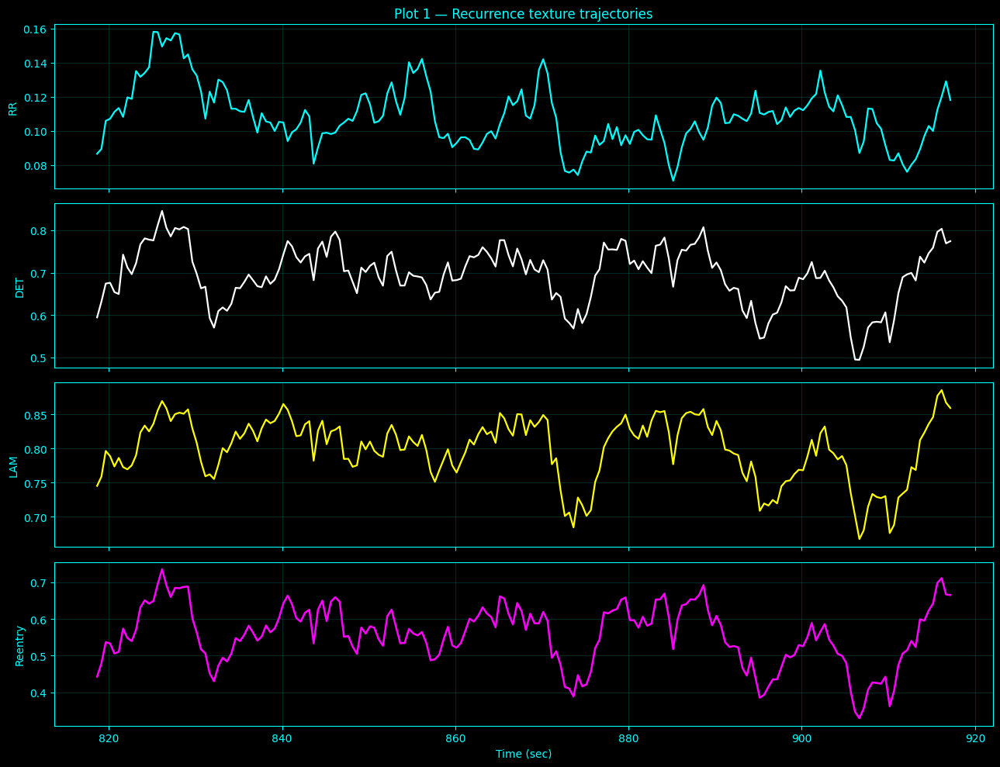

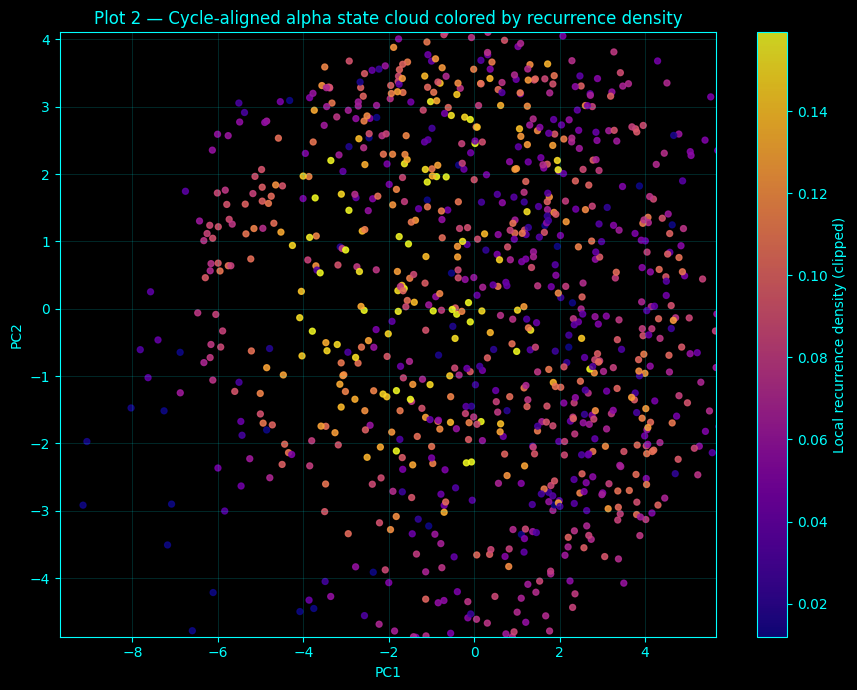

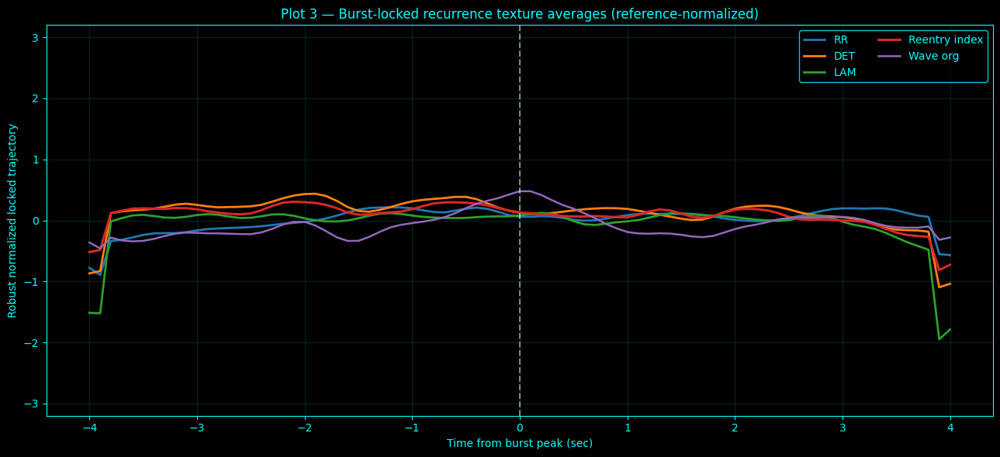

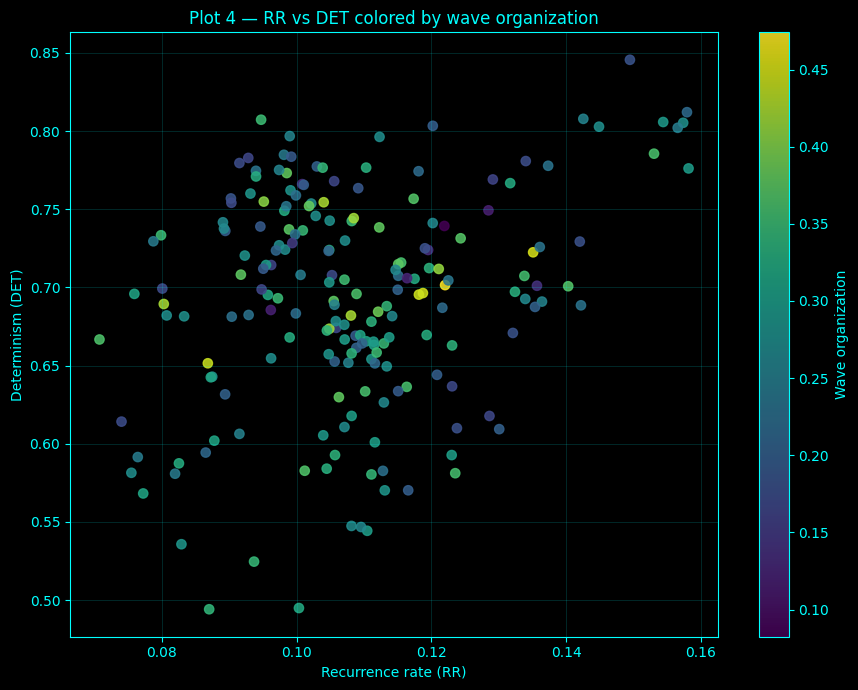

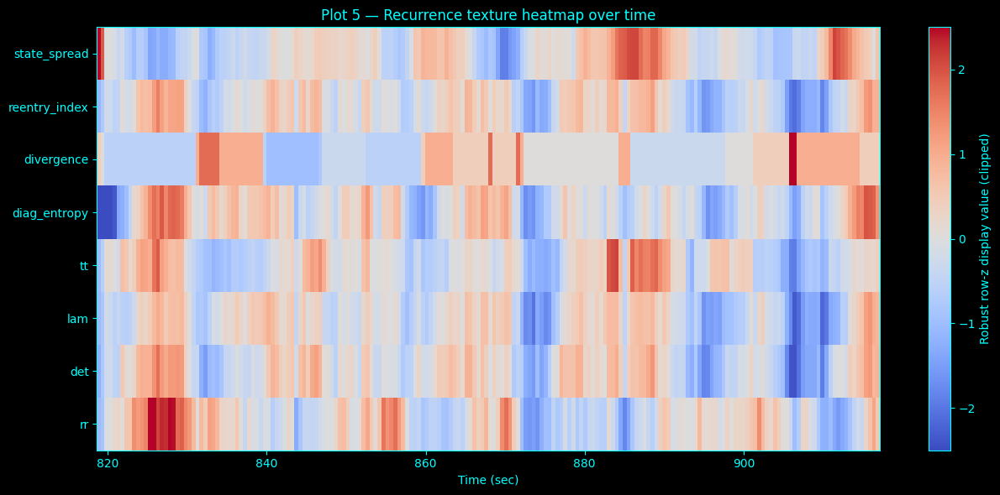

Saved plot 1: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_alpha_recurrence_texture_atlas_CYCLE_ALIGNED_v2/plots_rebuilt/plot1_recurrence_metric_trajectories.png
Saved plot 2: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_alpha_recurrence_texture_atlas_CYCLE_ALIGNED_v2/plots_rebuilt/plot2_state_cloud_recurrence_density.png
Saved plot 3: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_alpha_recurrence_texture_atlas_CYCLE_ALIGNED_v2/plots_rebuilt/plot3_burst_locked_recurrence_averages_FIXED.png
Saved plot 4: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_alpha_recurrence_texture_atlas_CYCLE_ALIGNED_v2/plots_rebuilt/plot4_rr_vs_det_colored_by_wave_org.png
Saved plot 5: /home/a/projects/Complete-Neural-Signal-Analysis/results/exploratory_alpha_recurrence_texture_atlas_CYCLE_ALIGNED_v2/plots_rebuilt/plot5_recurrence_metric_heatmap_over_time.png
Done.


In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------------------------------------
# CONFIG — FILE PATHS ONLY
# -------------------------------------------------------
base_dir = "/home/a/projects/Complete-Neural-Signal-Analysis"
results_dir = os.path.join(base_dir, "results")

candidate_dirs = [
    os.path.join(results_dir, "exploratory_alpha_recurrence_texture_atlas_CYCLE_ALIGNED_v2"),
    os.path.join(results_dir, "exploratory_alpha_recurrence_texture_atlas_CYCLE_ALIGNED"),
    os.path.join(results_dir, "exploratory_alpha_recurrence_texture_atlas_FIXED"),
]

# fallback to uploaded files if needed
fallback_rqa_csv = "/mnt/data/alpha_recurrence_windowed_metrics.csv"
fallback_state_csv = "/mnt/data/alpha_cycle_state_recurrence_density.csv"
fallback_locked_npz = "/mnt/data/alpha_recurrence_burst_locked.npz"

plot_out_dir = None
rqa_csv_path = None
state_csv_path = None
locked_npz_path = None

for d in candidate_dirs:
    a = os.path.join(d, "alpha_recurrence_windowed_metrics.csv")
    b = os.path.join(d, "alpha_cycle_state_recurrence_density.csv")
    c = os.path.join(d, "alpha_recurrence_burst_locked.npz")
    if os.path.exists(a) and os.path.exists(b) and os.path.exists(c):
        rqa_csv_path = a
        state_csv_path = b
        locked_npz_path = c
        plot_out_dir = os.path.join(d, "plots_rebuilt")
        break

if rqa_csv_path is None:
    rqa_csv_path = fallback_rqa_csv
    state_csv_path = fallback_state_csv
    locked_npz_path = fallback_locked_npz
    plot_out_dir = "/mnt/data/recurrence_plots_rebuilt"

os.makedirs(plot_out_dir, exist_ok=True)

# -------------------------------------------------------
# STYLE
# -------------------------------------------------------
ACCENT = "cyan"
BG = "black"
eps = 1e-12

plt.rcParams.update({
    "figure.facecolor": BG,
    "axes.facecolor": BG,
    "savefig.facecolor": BG,
    "text.color": ACCENT,
    "axes.labelcolor": ACCENT,
    "axes.edgecolor": ACCENT,
    "axes.titlecolor": ACCENT,
    "xtick.color": ACCENT,
    "ytick.color": ACCENT,
    "grid.color": ACCENT,
    "legend.facecolor": BG,
    "legend.edgecolor": ACCENT,
    "font.size": 10,
})

def style_ax(ax, heatmap=False):
    ax.set_facecolor(BG)
    ax.tick_params(colors=ACCENT)
    for spine in ax.spines.values():
        spine.set_color(ACCENT)
    if heatmap:
        ax.grid(False)
    else:
        ax.grid(True, alpha=0.18, color=ACCENT, linewidth=0.6)

def smooth_1d_nanaware(x, win=3):
    x = np.asarray(x, dtype=float)
    if win <= 1 or len(x) < win:
        return x.copy()

    out = x.copy()
    finite = np.isfinite(x)
    if np.sum(finite) < 3:
        return out

    idx = np.arange(len(x))
    filled = np.interp(idx, idx[finite], x[finite])
    kernel = np.ones(win, dtype=float) / win
    smoothed = np.convolve(filled, kernel, mode="same")
    out[finite] = smoothed[finite]
    return out

def robust_row_z(row, clip=2.5):
    row = np.asarray(row, dtype=float)
    med = np.nanmedian(row)
    q25 = np.nanpercentile(row, 25)
    q75 = np.nanpercentile(row, 75)
    scale = (q75 - q25) if (q75 - q25) > 1e-8 else (np.nanstd(row) + eps)
    z = (row - med) / scale
    return np.clip(z, -clip, clip)

def normalize_locked_against_reference(center_curve, reference_series, support_frac=None,
                                       min_support=0.40, clip=3.0, smooth_win=3):
    """
    Key fix:
    normalize the burst-locked center curve against the full RQA trajectory
    for the same metric, not against the locked curve itself.
    """
    center_curve = np.asarray(center_curve, dtype=float).copy()
    ref = np.asarray(reference_series, dtype=float)

    finite_ref = np.isfinite(ref)
    if np.sum(finite_ref) < 5:
        return np.full_like(center_curve, np.nan)

    med = np.nanmedian(ref)
    q25 = np.nanpercentile(ref, 25)
    q75 = np.nanpercentile(ref, 75)
    scale = (q75 - q25) if (q75 - q25) > 1e-8 else (np.nanstd(ref) + eps)

    y = (center_curve - med) / scale

    if support_frac is not None:
        support_frac = np.asarray(support_frac, dtype=float)
        y[support_frac < min_support] = np.nan

    y = smooth_1d_nanaware(y, win=smooth_win)

    if support_frac is not None:
        y[support_frac < min_support] = np.nan

    return np.clip(y, -clip, clip)

def center_and_mask_locked(arr, stat="median", min_fraction=0.40, smooth_win=3):
    arr = np.asarray(arr, dtype=float)
    if arr.ndim != 2 or arr.shape[0] == 0:
        n = arr.shape[1] if arr.ndim == 2 else 0
        return np.full(n, np.nan), np.zeros(n)

    support = np.sum(np.isfinite(arr), axis=0).astype(float)
    max_support = np.nanmax(support) if len(support) > 0 else 0.0
    needed = max(1, int(np.ceil(min_fraction * max_support))) if max_support > 0 else 1

    if stat == "median":
        center = np.nanmedian(arr, axis=0)
    else:
        center = np.nanmean(arr, axis=0)

    center[support < needed] = np.nan
    center = smooth_1d_nanaware(center, win=smooth_win)
    center[support < needed] = np.nan

    support_frac = support / (max_support + eps) if max_support > 0 else np.zeros_like(support)
    return center, support_frac

# -------------------------------------------------------
# LOAD DATA
# -------------------------------------------------------
rqa_df = pd.read_csv(rqa_csv_path)
state_df = pd.read_csv(state_csv_path)
locked_npz = np.load(locked_npz_path, allow_pickle=True)

print(f"Loaded RQA: {rqa_csv_path}")
print(f"Loaded state cloud: {state_csv_path}")
print(f"Loaded burst-locked NPZ: {locked_npz_path}")

# -------------------------------------------------------
# PLOT PATHS
# -------------------------------------------------------
plot1_path = os.path.join(plot_out_dir, "plot1_recurrence_metric_trajectories.png")
plot2_path = os.path.join(plot_out_dir, "plot2_state_cloud_recurrence_density.png")
plot3_path = os.path.join(plot_out_dir, "plot3_burst_locked_recurrence_averages_FIXED.png")
plot4_path = os.path.join(plot_out_dir, "plot4_rr_vs_det_colored_by_wave_org.png")
plot5_path = os.path.join(plot_out_dir, "plot5_recurrence_metric_heatmap_over_time.png")

# -------------------------------------------------------
# PLOT 1 — RECURRENCE TRAJECTORIES
# -------------------------------------------------------
fig1, axes1 = plt.subplots(4, 1, figsize=(13, 10), facecolor=BG, sharex=True)
axes1 = np.atleast_1d(axes1)

for ax in axes1:
    style_ax(ax)

axes1[0].plot(rqa_df["time_sec"], rqa_df["rr"], linewidth=1.6, color=ACCENT)
axes1[0].set_ylabel("RR")
axes1[0].set_title("Plot 1 — Recurrence texture trajectories")

axes1[1].plot(rqa_df["time_sec"], rqa_df["det"], linewidth=1.6, color="white")
axes1[1].set_ylabel("DET")

axes1[2].plot(rqa_df["time_sec"], rqa_df["lam"], linewidth=1.6, color="yellow")
axes1[2].set_ylabel("LAM")

axes1[3].plot(rqa_df["time_sec"], rqa_df["reentry_index"], linewidth=1.8, color="magenta")
axes1[3].set_ylabel("Reentry")
axes1[3].set_xlabel("Time (sec)")

fig1.tight_layout()
fig1.savefig(plot1_path, dpi=220, bbox_inches="tight")
plt.show()
plt.close(fig1)

# -------------------------------------------------------
# PLOT 2 — STATE CLOUD RECURRENCE DENSITY
# -------------------------------------------------------
fig2, ax2 = plt.subplots(figsize=(9, 7), facecolor=BG)
style_ax(ax2)

x = state_df["PC1"].values
y = state_df["PC2"].values
dens = state_df["recurrence_density"].values

finite_dens = dens[np.isfinite(dens)]
if len(finite_dens) > 0:
    lo, hi = np.percentile(finite_dens, [2, 98])
    dens_display = np.clip(dens, lo, hi)
else:
    dens_display = dens

sc = ax2.scatter(
    x, y,
    c=dens_display,
    s=18,
    alpha=0.85,
    cmap="plasma",
)

xlo, xhi = np.percentile(x[np.isfinite(x)], [1, 99])
ylo, yhi = np.percentile(y[np.isfinite(y)], [1, 99])
ax2.set_xlim(xlo, xhi)
ax2.set_ylim(ylo, yhi)

pc1_label = "PC1"
pc2_label = "PC2"
if "PC1" in state_df.columns and "PC2" in state_df.columns:
    pc1_label = "PC1"
    pc2_label = "PC2"

ax2.set_title("Plot 2 — Cycle-aligned alpha state cloud colored by recurrence density")
ax2.set_xlabel(pc1_label)
ax2.set_ylabel(pc2_label)

cbar2 = plt.colorbar(sc, ax=ax2)
cbar2.set_label("Local recurrence density (clipped)", color=ACCENT)
cbar2.outline.set_edgecolor(ACCENT)
cbar2.ax.tick_params(color=ACCENT)
for label in cbar2.ax.get_yticklabels():
    label.set_color(ACCENT)

fig2.tight_layout()
fig2.savefig(plot2_path, dpi=220, bbox_inches="tight")
plt.show()
plt.close(fig2)

# -------------------------------------------------------
# PLOT 3 — BURST-LOCKED RECURRENCE AVERAGES (FIXED)
# -------------------------------------------------------
lock_rel_time = locked_npz["lock_rel_time"]

# use saved centers/support if present, otherwise reconstruct
if "rr_center" in locked_npz.files:
    rr_center = locked_npz["rr_center"]
    det_center = locked_npz["det_center"]
    lam_center = locked_npz["lam_center"]
    reentry_center = locked_npz["reentry_center"]
    wave_center = locked_npz["wave_center"]

    rr_support = locked_npz["rr_support"]
    det_support = locked_npz["det_support"]
    lam_support = locked_npz["lam_support"]
    reentry_support = locked_npz["reentry_support"]
    wave_support = locked_npz["wave_support"]
else:
    rr_center, rr_support = center_and_mask_locked(locked_npz["locked_rr"])
    det_center, det_support = center_and_mask_locked(locked_npz["locked_det"])
    lam_center, lam_support = center_and_mask_locked(locked_npz["locked_lam"])
    reentry_center, reentry_support = center_and_mask_locked(locked_npz["locked_reentry"])
    wave_center, wave_support = center_and_mask_locked(locked_npz["locked_wave_org"])

# FIX: normalize against full RQA trajectory, not against the locked curve itself
rr_plot = normalize_locked_against_reference(
    rr_center, rqa_df["rr"].values, rr_support, min_support=0.40, clip=3.0, smooth_win=3
)
det_plot = normalize_locked_against_reference(
    det_center, rqa_df["det"].values, det_support, min_support=0.40, clip=3.0, smooth_win=3
)
lam_plot = normalize_locked_against_reference(
    lam_center, rqa_df["lam"].values, lam_support, min_support=0.40, clip=3.0, smooth_win=3
)
reentry_plot = normalize_locked_against_reference(
    reentry_center, rqa_df["reentry_index"].values, reentry_support, min_support=0.40, clip=3.0, smooth_win=3
)

if "wave_org" in rqa_df.columns and np.any(np.isfinite(rqa_df["wave_org"].values)):
    wave_plot = normalize_locked_against_reference(
        wave_center, rqa_df["wave_org"].values, wave_support, min_support=0.40, clip=3.0, smooth_win=3
    )
else:
    wave_plot = np.full_like(lock_rel_time, np.nan)

fig3, ax3 = plt.subplots(figsize=(13, 6), facecolor=BG)
style_ax(ax3)

ax3.plot(lock_rel_time, rr_plot, linewidth=2.0, label="RR")
ax3.plot(lock_rel_time, det_plot, linewidth=2.0, label="DET")
ax3.plot(lock_rel_time, lam_plot, linewidth=2.0, label="LAM")
ax3.plot(lock_rel_time, reentry_plot, linewidth=2.2, label="Reentry index")

if np.any(np.isfinite(wave_plot)):
    ax3.plot(lock_rel_time, wave_plot, linewidth=1.8, label="Wave org")

ax3.axvline(0.0, color="white", linestyle="--", alpha=0.5)
ax3.set_ylim(-3.2, 3.2)
ax3.set_title("Plot 3 — Burst-locked recurrence texture averages (reference-normalized)")
ax3.set_xlabel("Time from burst peak (sec)")
ax3.set_ylabel("Robust normalized locked trajectory")
ax3.legend(loc="upper right", ncol=2)

fig3.tight_layout()
fig3.savefig(plot3_path, dpi=220, bbox_inches="tight")
plt.show()
plt.close(fig3)

# -------------------------------------------------------
# PLOT 4 — RR VS DET COLORED BY WAVE ORGANIZATION
# -------------------------------------------------------
fig4, ax4 = plt.subplots(figsize=(9, 7), facecolor=BG)
style_ax(ax4)

cvals = rqa_df["wave_org"].values if "wave_org" in rqa_df.columns else np.full(len(rqa_df), np.nan)
if np.any(np.isfinite(cvals)):
    sc4 = ax4.scatter(
        rqa_df["rr"].values,
        rqa_df["det"].values,
        c=cvals,
        cmap="viridis",
        s=45,
        alpha=0.85,
    )
    cbar4 = plt.colorbar(sc4, ax=ax4)
    cbar4.set_label("Wave organization", color=ACCENT)
    cbar4.outline.set_edgecolor(ACCENT)
    cbar4.ax.tick_params(color=ACCENT)
    for label in cbar4.ax.get_yticklabels():
        label.set_color(ACCENT)
else:
    ax4.scatter(
        rqa_df["rr"].values,
        rqa_df["det"].values,
        s=45,
        alpha=0.85,
    )

ax4.set_title("Plot 4 — RR vs DET colored by wave organization")
ax4.set_xlabel("Recurrence rate (RR)")
ax4.set_ylabel("Determinism (DET)")

fig4.tight_layout()
fig4.savefig(plot4_path, dpi=220, bbox_inches="tight")
plt.show()
plt.close(fig4)

# -------------------------------------------------------
# PLOT 5 — METRIC HEATMAP OVER TIME
# -------------------------------------------------------
heat_cols = ["rr", "det", "lam", "tt", "diag_entropy", "divergence", "reentry_index", "state_spread"]
heat_mat = rqa_df[heat_cols].values.T.astype(float)

heat_display = np.vstack([robust_row_z(row, clip=2.5) for row in heat_mat])

fig5, ax5 = plt.subplots(figsize=(13, 6), facecolor=BG)
style_ax(ax5, heatmap=True)

im5 = ax5.imshow(
    heat_display,
    aspect="auto",
    interpolation="nearest",
    cmap="coolwarm",
    extent=[rqa_df["time_sec"].iloc[0], rqa_df["time_sec"].iloc[-1], 0, len(heat_cols)],
    origin="lower",
    vmin=-2.5,
    vmax=2.5,
)

ax5.set_title("Plot 5 — Recurrence texture heatmap over time")
ax5.set_xlabel("Time (sec)")
ax5.set_yticks(np.arange(len(heat_cols)) + 0.5)
ax5.set_yticklabels(heat_cols)

cbar5 = plt.colorbar(im5, ax=ax5)
cbar5.set_label("Robust row-z display value (clipped)", color=ACCENT)
cbar5.outline.set_edgecolor(ACCENT)
cbar5.ax.tick_params(color=ACCENT)
for label in cbar5.ax.get_yticklabels():
    label.set_color(ACCENT)

fig5.tight_layout()
fig5.savefig(plot5_path, dpi=220, bbox_inches="tight")
plt.show()
plt.close(fig5)

print(f"Saved plot 1: {plot1_path}")
print(f"Saved plot 2: {plot2_path}")
print(f"Saved plot 3: {plot3_path}")
print(f"Saved plot 4: {plot4_path}")
print(f"Saved plot 5: {plot5_path}")
print("Done.")

<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;"><h3 style="color:#E8E8E8;margin-top:0;">Theory and method — Transfer entropy</h3><p>Transfer entropy is a conditional mutual information that measures whether the past of a source $X$ improves prediction of the next target value $Y_{t+1}$ beyond the target's own past. It is directional and depends on the history lengths, lag, estimator, and any discretization used by the implementation.</p><p><b>Cell role.</b> This code applies that theory to the notebook's existing EEG-derived data and preserves the surrounding notebook's plotting/output conventions. Numerical shortcuts selected by a speed mode change sampling density, iteration counts, or visualization resolution; they do not change the defining formula above.</p></div>

$$T_{X\\to Y}=\\sum p(y_{t+1},y_t^{(k)},x_t^{(l)})\\log\\frac{p(y_{t+1}\\mid y_t^{(k)},x_t^{(l)})}{p(y_{t+1}\\mid y_t^{(k)})}.$$


## Complete implementation of the additional spectral-theory catalogue — methods 1–377

Every numbered method below is now **self-contained**. Each code cell performs its own EEG loading/preparation, contains the mathematical definitions it directly requires, computes the method without calling a shared catalogue dispatcher, and prints its own result.

Plots use the notebook’s **black / cyan** style. A plot is shown only when the method result contains **at least two finite numerical values**; a genuinely single-number result is printed without a plot. The existing **full / balanced / fast / ultra** speed convention is retained independently in every method cell.


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">1. Multitaper power spectral density</h3>
<p>Thomson multitaper estimation multiplies the record by \(K\) discrete prolate spheroidal (DPSS/Slepian) tapers and averages their eigenspectra, \(\hat S(f)=K^{-1}\sum_{k=1}^{K}|X_k(f)|^2\). The DPSS tapers maximize spectral concentration in a prescribed half-bandwidth \(W\), reducing leakage without relying on a single window.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Multitaper power spectral density
  NW: 3.5
  K: 6
  alpha_power: 0.04892505957899816


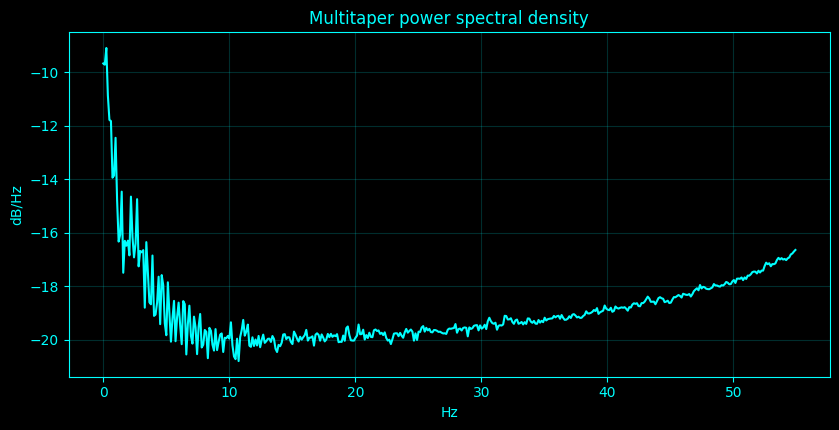

In [11]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _multitaper_psd(data=None, NW=3.5, K=None, adaptive=False):
    Y = X if data is None else np.asarray(data, float)
    if Y.ndim == 1:
        Y = Y[:, None]
    n = min(N if data is None else len(Y), int(_SPEED['nperseg'] * 2))
    n = max(64, n)
    Y = Y[:n] - np.mean(Y[:n], axis=0, keepdims=True)
    K = int(K or max(3, 2 * NW - 1))
    tap, eigs = signal.windows.dpss(n, NW, Kmax=K, return_ratios=True)
    F = np.fft.rfft(Y[:, None, :] * tap.T[:, :, None], axis=0)
    scale = _fs * np.sum(tap ** 2, axis=1)
    P = np.abs(F) ** 2 / scale[None, :, None]
    if adaptive:
        w = eigs / (np.sum(eigs) + EPS)
        Pm = np.sum(P * w[None, :, None], axis=1)
    else:
        Pm = np.mean(P, axis=1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    return (f[keep], Pm[keep], F[keep], eigs, tap)

# Method-specific calculation.
def _compute_method_1():
    idx = 1
    name = 'Multitaper power spectral density'
    __plot_spec = None
    f, P, F, eigs, tapers = _multitaper_psd(adaptive=idx == 9)
    __plot_spec = ('summary', 10 * np.log10(P[:, 0] + EPS), name, f, 'Hz', 'dB/Hz')
    return ({'NW': 3.5, 'K': len(eigs), 'alpha_power': float(_band_integral(P, f, BANDS['alpha'])[0])}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_1,_plot_spec=_compute_method_1()
print('Multitaper power spectral density')
if isinstance(result_1,dict):
    for _k,_v in result_1.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_1)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_1)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Multitaper power spectral density',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Multitaper power spectral density',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Multitaper power spectral density',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">2. Thomson multitaper spectrum</h3>
<p>Thomson multitaper estimation multiplies the record by \(K\) discrete prolate spheroidal (DPSS/Slepian) tapers and averages their eigenspectra, \(\hat S(f)=K^{-1}\sum_{k=1}^{K}|X_k(f)|^2\). The DPSS tapers maximize spectral concentration in a prescribed half-bandwidth \(W\), reducing leakage without relying on a single window.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Thomson multitaper spectrum
  NW: 3.5
  K: 6
  alpha_power: 0.04892505957899816


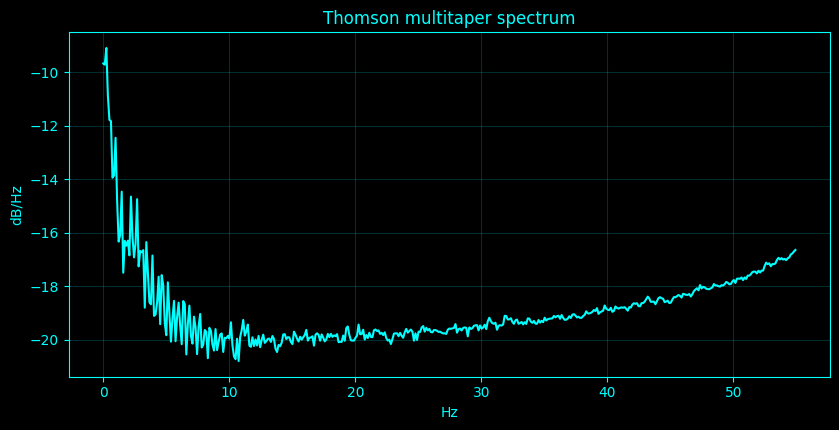

In [12]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _multitaper_psd(data=None, NW=3.5, K=None, adaptive=False):
    Y = X if data is None else np.asarray(data, float)
    if Y.ndim == 1:
        Y = Y[:, None]
    n = min(N if data is None else len(Y), int(_SPEED['nperseg'] * 2))
    n = max(64, n)
    Y = Y[:n] - np.mean(Y[:n], axis=0, keepdims=True)
    K = int(K or max(3, 2 * NW - 1))
    tap, eigs = signal.windows.dpss(n, NW, Kmax=K, return_ratios=True)
    F = np.fft.rfft(Y[:, None, :] * tap.T[:, :, None], axis=0)
    scale = _fs * np.sum(tap ** 2, axis=1)
    P = np.abs(F) ** 2 / scale[None, :, None]
    if adaptive:
        w = eigs / (np.sum(eigs) + EPS)
        Pm = np.sum(P * w[None, :, None], axis=1)
    else:
        Pm = np.mean(P, axis=1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    return (f[keep], Pm[keep], F[keep], eigs, tap)

# Method-specific calculation.
def _compute_method_2():
    idx = 2
    name = 'Thomson multitaper spectrum'
    __plot_spec = None
    f, P, F, eigs, tapers = _multitaper_psd(adaptive=idx == 9)
    __plot_spec = ('summary', 10 * np.log10(P[:, 0] + EPS), name, f, 'Hz', 'dB/Hz')
    return ({'NW': 3.5, 'K': len(eigs), 'alpha_power': float(_band_integral(P, f, BANDS['alpha'])[0])}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_2,_plot_spec=_compute_method_2()
print('Thomson multitaper spectrum')
if isinstance(result_2,dict):
    for _k,_v in result_2.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_2)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_2)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Thomson multitaper spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Thomson multitaper spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Thomson multitaper spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">3. Multitaper spectrogram</h3>
<p>A multitaper spectrogram applies the Thomson estimator in successive overlapping time windows. Each time-frequency pixel is the average of DPSS eigenspectra in that window, giving lower variance than a single-taper spectrogram.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Multitaper spectrogram
  time_bins: 51
  frequency_bins: 185


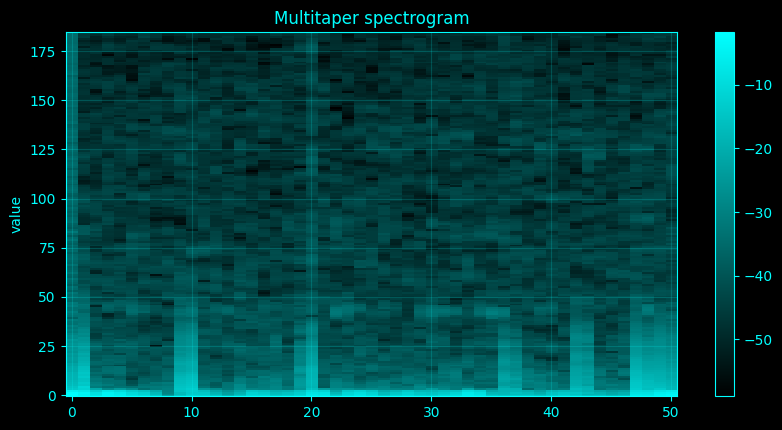

In [13]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _multitaper_psd(data=None, NW=3.5, K=None, adaptive=False):
    Y = X if data is None else np.asarray(data, float)
    if Y.ndim == 1:
        Y = Y[:, None]
    n = min(N if data is None else len(Y), int(_SPEED['nperseg'] * 2))
    n = max(64, n)
    Y = Y[:n] - np.mean(Y[:n], axis=0, keepdims=True)
    K = int(K or max(3, 2 * NW - 1))
    tap, eigs = signal.windows.dpss(n, NW, Kmax=K, return_ratios=True)
    F = np.fft.rfft(Y[:, None, :] * tap.T[:, :, None], axis=0)
    scale = _fs * np.sum(tap ** 2, axis=1)
    P = np.abs(F) ** 2 / scale[None, :, None]
    if adaptive:
        w = eigs / (np.sum(eigs) + EPS)
        Pm = np.sum(P * w[None, :, None], axis=1)
    else:
        Pm = np.mean(P, axis=1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    return (f[keep], Pm[keep], F[keep], eigs, tap)

# Method-specific calculation.
def _compute_method_3():
    idx = 3
    name = 'Multitaper spectrogram'
    __plot_spec = None
    f, P, F, eigs, tapers = _multitaper_psd(adaptive=idx == 9)
    n = min(_SPEED['nperseg'], N)
    step = max(1, n // 2)
    cols = []
    tc = []
    tap = signal.windows.dpss(n, 3, Kmax=3)
    for a in range(0, N - n + 1, step):
        seg = X[a:a + n, 0]
        ps = []
        for tt in tap:
            ff = np.fft.rfftfreq(n, 1 / _fs)
            z = np.fft.rfft(seg * tt)
            ps.append(np.abs(z) ** 2 / (_fs * np.sum(tt ** 2)))
        cols.append(np.mean(ps, axis=0))
        tc.append((a + n / 2) / _fs)
    S = np.asarray(cols).T
    m = ff <= min(45, 0.49 * _fs)
    __plot_spec = ('summary', 10 * np.log10(S[m] + EPS), name, None, '', 'value')
    return ({'time_bins': len(tc), 'frequency_bins': int(np.sum(m))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_3,_plot_spec=_compute_method_3()
print('Multitaper spectrogram')
if isinstance(result_3,dict):
    for _k,_v in result_3.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_3)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_3)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Multitaper spectrogram',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Multitaper spectrogram',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Multitaper spectrogram',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">4. Multitaper coherence</h3>
<p>Multitaper coherence forms taper-averaged cross- and auto-spectra, then uses \(C_{xy}(f)=|\hat S_{xy}(f)|^2/[\hat S_{xx}(f)\hat S_{yy}(f)]\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [14]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _multitaper_psd(data=None, NW=3.5, K=None, adaptive=False):
    Y = X if data is None else np.asarray(data, float)
    if Y.ndim == 1:
        Y = Y[:, None]
    n = min(N if data is None else len(Y), int(_SPEED['nperseg'] * 2))
    n = max(64, n)
    Y = Y[:n] - np.mean(Y[:n], axis=0, keepdims=True)
    K = int(K or max(3, 2 * NW - 1))
    tap, eigs = signal.windows.dpss(n, NW, Kmax=K, return_ratios=True)
    F = np.fft.rfft(Y[:, None, :] * tap.T[:, :, None], axis=0)
    scale = _fs * np.sum(tap ** 2, axis=1)
    P = np.abs(F) ** 2 / scale[None, :, None]
    if adaptive:
        w = eigs / (np.sum(eigs) + EPS)
        Pm = np.sum(P * w[None, :, None], axis=1)
    else:
        Pm = np.mean(P, axis=1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    return (f[keep], Pm[keep], F[keep], eigs, tap)

def _multitaper_csd(i=0, j=1, NW=3.5):
    f, P, F, eigs, tap = _multitaper_psd(NW=NW)
    Xi = F[:, :, i]
    Xj = F[:, :, j]
    Sxy = np.mean(Xi * np.conj(Xj), axis=1)
    Sxx = np.mean(np.abs(Xi) ** 2, axis=1)
    Syy = np.mean(np.abs(Xj) ** 2, axis=1)
    coh = np.abs(Sxy) ** 2 / (Sxx * Syy + EPS)
    return (f, Sxy, Sxx, Syy, coh, F)

# Method-specific calculation.
def _compute_method_4():
    idx = 4
    name = 'Multitaper coherence'
    __plot_spec = None
    f, P, F, eigs, tapers = _multitaper_psd(adaptive=idx == 9)
    ff, Sxy, Sxx, Syy, coh, Fm = _multitaper_csd()
    __plot_spec = ('summary', coh, name, ff, 'Hz', 'coherence')
    return ({'alpha_coherence': float(np.mean(coh[(ff >= 8) & (ff < 13)]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_4,_plot_spec=_compute_method_4()
print('Multitaper coherence')
if isinstance(result_4,dict):
    for _k,_v in result_4.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_4)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_4)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Multitaper coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Multitaper coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Multitaper coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Multitaper coherence
  alpha_coherence: 0.9990027449515262


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">5. Multitaper phase-locking value</h3>
<p>Multitaper PLV normalizes each taper-domain cross coefficient to unit magnitude and averages its phase, \(\mathrm{PLV}(f)=|\langle X_k(f)Y_k^\ast(f)/|X_k(f)Y_k^\ast(f)|\rangle_k|\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [15]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _multitaper_psd(data=None, NW=3.5, K=None, adaptive=False):
    Y = X if data is None else np.asarray(data, float)
    if Y.ndim == 1:
        Y = Y[:, None]
    n = min(N if data is None else len(Y), int(_SPEED['nperseg'] * 2))
    n = max(64, n)
    Y = Y[:n] - np.mean(Y[:n], axis=0, keepdims=True)
    K = int(K or max(3, 2 * NW - 1))
    tap, eigs = signal.windows.dpss(n, NW, Kmax=K, return_ratios=True)
    F = np.fft.rfft(Y[:, None, :] * tap.T[:, :, None], axis=0)
    scale = _fs * np.sum(tap ** 2, axis=1)
    P = np.abs(F) ** 2 / scale[None, :, None]
    if adaptive:
        w = eigs / (np.sum(eigs) + EPS)
        Pm = np.sum(P * w[None, :, None], axis=1)
    else:
        Pm = np.mean(P, axis=1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    return (f[keep], Pm[keep], F[keep], eigs, tap)

def _multitaper_csd(i=0, j=1, NW=3.5):
    f, P, F, eigs, tap = _multitaper_psd(NW=NW)
    Xi = F[:, :, i]
    Xj = F[:, :, j]
    Sxy = np.mean(Xi * np.conj(Xj), axis=1)
    Sxx = np.mean(np.abs(Xi) ** 2, axis=1)
    Syy = np.mean(np.abs(Xj) ** 2, axis=1)
    coh = np.abs(Sxy) ** 2 / (Sxx * Syy + EPS)
    return (f, Sxy, Sxx, Syy, coh, F)

# Method-specific calculation.
def _compute_method_5():
    idx = 5
    name = 'Multitaper phase-locking value'
    __plot_spec = None
    f, P, F, eigs, tapers = _multitaper_psd(adaptive=idx == 9)
    ff, Sxy, Sxx, Syy, coh, Fm = _multitaper_csd()
    z = Fm[:, :, 0] * np.conj(Fm[:, :, 1])
    plv = np.abs(np.mean(z / (np.abs(z) + EPS), axis=1))
    __plot_spec = ('summary', plv, name, ff, 'Hz', 'multitaper PLV')
    return ({'alpha_PLV': float(np.mean(plv[(ff >= 8) & (ff < 13)]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_5,_plot_spec=_compute_method_5()
print('Multitaper phase-locking value')
if isinstance(result_5,dict):
    for _k,_v in result_5.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_5)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_5)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Multitaper phase-locking value',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Multitaper phase-locking value',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Multitaper phase-locking value',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Multitaper phase-locking value
  alpha_PLV: 0.9876834111234166


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">6. Multitaper cross-spectrum</h3>
<p>The multitaper cross-spectrum is \(\hat S_{xy}(f)=K^{-1}\sum_k X_k(f)Y_k^\ast(f)\); its magnitude describes shared spectral amplitude and its argument the average phase relation.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [16]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _multitaper_psd(data=None, NW=3.5, K=None, adaptive=False):
    Y = X if data is None else np.asarray(data, float)
    if Y.ndim == 1:
        Y = Y[:, None]
    n = min(N if data is None else len(Y), int(_SPEED['nperseg'] * 2))
    n = max(64, n)
    Y = Y[:n] - np.mean(Y[:n], axis=0, keepdims=True)
    K = int(K or max(3, 2 * NW - 1))
    tap, eigs = signal.windows.dpss(n, NW, Kmax=K, return_ratios=True)
    F = np.fft.rfft(Y[:, None, :] * tap.T[:, :, None], axis=0)
    scale = _fs * np.sum(tap ** 2, axis=1)
    P = np.abs(F) ** 2 / scale[None, :, None]
    if adaptive:
        w = eigs / (np.sum(eigs) + EPS)
        Pm = np.sum(P * w[None, :, None], axis=1)
    else:
        Pm = np.mean(P, axis=1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    return (f[keep], Pm[keep], F[keep], eigs, tap)

def _multitaper_csd(i=0, j=1, NW=3.5):
    f, P, F, eigs, tap = _multitaper_psd(NW=NW)
    Xi = F[:, :, i]
    Xj = F[:, :, j]
    Sxy = np.mean(Xi * np.conj(Xj), axis=1)
    Sxx = np.mean(np.abs(Xi) ** 2, axis=1)
    Syy = np.mean(np.abs(Xj) ** 2, axis=1)
    coh = np.abs(Sxy) ** 2 / (Sxx * Syy + EPS)
    return (f, Sxy, Sxx, Syy, coh, F)

# Method-specific calculation.
def _compute_method_6():
    idx = 6
    name = 'Multitaper cross-spectrum'
    __plot_spec = None
    f, P, F, eigs, tapers = _multitaper_psd(adaptive=idx == 9)
    ff, Sxy, Sxx, Syy, coh, Fm = _multitaper_csd()
    __plot_spec = ('summary', np.vstack([np.abs(Sxy), np.angle(Sxy)]), name, None, '', 'value')
    return ({'alpha_cross_spectrum_magnitude': float(np.mean(np.abs(Sxy[(ff >= 8) & (ff < 13)])))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_6,_plot_spec=_compute_method_6()
print('Multitaper cross-spectrum')
if isinstance(result_6,dict):
    for _k,_v in result_6.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_6)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_6)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Multitaper cross-spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Multitaper cross-spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Multitaper cross-spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Multitaper cross-spectrum
  alpha_cross_spectrum_magnitude: 1.2028570032485506


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">7. Multitaper time-frequency reassignment</h3>
<p>Time-frequency reassignment moves spectrogram energy from the analysis-bin center toward an instantaneous-frequency estimate obtained from the local STFT phase derivative. The multitaper version averages the reassigned information from several DPSS windows.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [17]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _multitaper_psd(data=None, NW=3.5, K=None, adaptive=False):
    Y = X if data is None else np.asarray(data, float)
    if Y.ndim == 1:
        Y = Y[:, None]
    n = min(N if data is None else len(Y), int(_SPEED['nperseg'] * 2))
    n = max(64, n)
    Y = Y[:n] - np.mean(Y[:n], axis=0, keepdims=True)
    K = int(K or max(3, 2 * NW - 1))
    tap, eigs = signal.windows.dpss(n, NW, Kmax=K, return_ratios=True)
    F = np.fft.rfft(Y[:, None, :] * tap.T[:, :, None], axis=0)
    scale = _fs * np.sum(tap ** 2, axis=1)
    P = np.abs(F) ** 2 / scale[None, :, None]
    if adaptive:
        w = eigs / (np.sum(eigs) + EPS)
        Pm = np.sum(P * w[None, :, None], axis=1)
    else:
        Pm = np.mean(P, axis=1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    return (f[keep], Pm[keep], F[keep], eigs, tap)

# Method-specific calculation.
def _compute_method_7():
    idx = 7
    name = 'Multitaper time-frequency reassignment'
    __plot_spec = None
    f, P, F, eigs, tapers = _multitaper_psd(adaptive=idx == 9)
    n = min(_SPEED['nperseg'], N)
    no = n // 2
    tap = signal.windows.dpss(n, 3, Kmax=3)
    powers = []
    freqs_est = []
    for tt in tap:
        ff, t0, Z = signal.stft(X[:, 0], fs=_fs, window=tt, nperseg=n, noverlap=no, boundary=None, padded=False)
        ph = np.unwrap(np.angle(Z), axis=1)
        inst = np.gradient(ph, t0, axis=1) / (2 * np.pi) + ff[:, None]
        powers.append(np.abs(Z) ** 2)
        freqs_est.append(inst)
    Pm = np.mean(powers, axis=0)
    Ih = np.mean(freqs_est, axis=0)
    keep = ff <= min(45, 0.49 * _fs)
    ridge = np.sum(Pm[keep] * Ih[keep], axis=0) / (np.sum(Pm[keep], axis=0) + EPS)
    __plot_spec = ('summary', ridge, name, t0, 'time (s)', 'reassigned Hz')
    return ({'ridge_mean_hz': float(np.nanmean(ridge))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_7,_plot_spec=_compute_method_7()
print('Multitaper time-frequency reassignment')
if isinstance(result_7,dict):
    for _k,_v in result_7.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_7)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_7)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Multitaper time-frequency reassignment',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Multitaper time-frequency reassignment',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Multitaper time-frequency reassignment',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Multitaper time-frequency reassignment
  ridge_mean_hz: 1.8942590822589258


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">8. Multitaper jackknife confidence intervals</h3>
<p>Multitaper jackknife uncertainty leaves out one taper at a time. For log spectrum \(\theta_k(f)\), the jackknife variance is \((K-1)K^{-1}\sum_k[\theta_k-\bar\theta]^2\), which captures taper-to-taper variability.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [18]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _multitaper_psd(data=None, NW=3.5, K=None, adaptive=False):
    Y = X if data is None else np.asarray(data, float)
    if Y.ndim == 1:
        Y = Y[:, None]
    n = min(N if data is None else len(Y), int(_SPEED['nperseg'] * 2))
    n = max(64, n)
    Y = Y[:n] - np.mean(Y[:n], axis=0, keepdims=True)
    K = int(K or max(3, 2 * NW - 1))
    tap, eigs = signal.windows.dpss(n, NW, Kmax=K, return_ratios=True)
    F = np.fft.rfft(Y[:, None, :] * tap.T[:, :, None], axis=0)
    scale = _fs * np.sum(tap ** 2, axis=1)
    P = np.abs(F) ** 2 / scale[None, :, None]
    if adaptive:
        w = eigs / (np.sum(eigs) + EPS)
        Pm = np.sum(P * w[None, :, None], axis=1)
    else:
        Pm = np.mean(P, axis=1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    return (f[keep], Pm[keep], F[keep], eigs, tap)

# Method-specific calculation.
def _compute_method_8():
    idx = 8
    name = 'Multitaper jackknife confidence intervals'
    __plot_spec = None
    f, P, F, eigs, tapers = _multitaper_psd(adaptive=idx == 9)
    K = F.shape[1]
    logs = []
    raw = np.abs(F[:, :, 0]) ** 2
    for k in range(K):
        logs.append(np.log(np.mean(np.delete(raw, k, axis=1), axis=1) + EPS))
    se = np.sqrt((K - 1) * np.var(np.asarray(logs), axis=0, ddof=0))
    m = (f >= 8) & (f < 13)
    return ({'median_logPSD_jackknife_SE_alpha': float(np.median(se[m]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_8,_plot_spec=_compute_method_8()
print('Multitaper jackknife confidence intervals')
if isinstance(result_8,dict):
    for _k,_v in result_8.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_8)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_8)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Multitaper jackknife confidence intervals',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Multitaper jackknife confidence intervals',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Multitaper jackknife confidence intervals',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Multitaper jackknife confidence intervals
  median_logPSD_jackknife_SE_alpha: 1.6194611321653927


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">9. Adaptive multitaper spectral estimation</h3>
<p>Adaptive multitaper estimation weights eigenspectra according to DPSS spectral concentration rather than averaging them equally. Highly concentrated tapers receive larger weight.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Adaptive multitaper spectral estimation
  adaptive_weight_sum: 0.9999999999998312
  mean_eigen_concentration: 0.9890476245558074


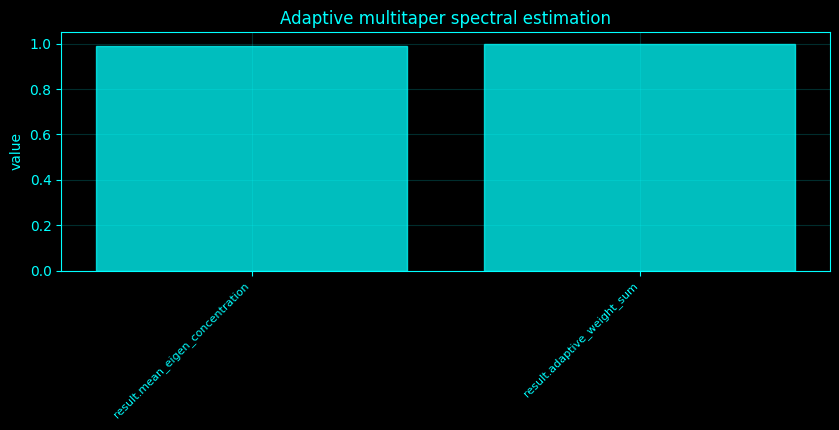

In [19]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _multitaper_psd(data=None, NW=3.5, K=None, adaptive=False):
    Y = X if data is None else np.asarray(data, float)
    if Y.ndim == 1:
        Y = Y[:, None]
    n = min(N if data is None else len(Y), int(_SPEED['nperseg'] * 2))
    n = max(64, n)
    Y = Y[:n] - np.mean(Y[:n], axis=0, keepdims=True)
    K = int(K or max(3, 2 * NW - 1))
    tap, eigs = signal.windows.dpss(n, NW, Kmax=K, return_ratios=True)
    F = np.fft.rfft(Y[:, None, :] * tap.T[:, :, None], axis=0)
    scale = _fs * np.sum(tap ** 2, axis=1)
    P = np.abs(F) ** 2 / scale[None, :, None]
    if adaptive:
        w = eigs / (np.sum(eigs) + EPS)
        Pm = np.sum(P * w[None, :, None], axis=1)
    else:
        Pm = np.mean(P, axis=1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    return (f[keep], Pm[keep], F[keep], eigs, tap)

# Method-specific calculation.
def _compute_method_9():
    idx = 9
    name = 'Adaptive multitaper spectral estimation'
    __plot_spec = None
    f, P, F, eigs, tapers = _multitaper_psd(adaptive=idx == 9)
    return ({'adaptive_weight_sum': float(np.sum(eigs / (np.sum(eigs) + EPS))), 'mean_eigen_concentration': float(np.mean(eigs))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_9,_plot_spec=_compute_method_9()
print('Adaptive multitaper spectral estimation')
if isinstance(result_9,dict):
    for _k,_v in result_9.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_9)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_9)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Adaptive multitaper spectral estimation',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Adaptive multitaper spectral estimation',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Adaptive multitaper spectral estimation',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">10. F-test line-noise / sinusoid detection</h3>
<p>A sinusoid F-test compares a regression containing sine/cosine terms at candidate frequency \(f_0\) with a constant-only model. \(F=[(RSS_0-RSS_1)/2]/[RSS_1/(N-3)]\) tests whether the sinusoidal pair explains significant variance.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

F-test line-noise / sinusoid detection
  tested_hz: 50.78125
  F: 1.7117684080483722
  p: 0.18058581138632118


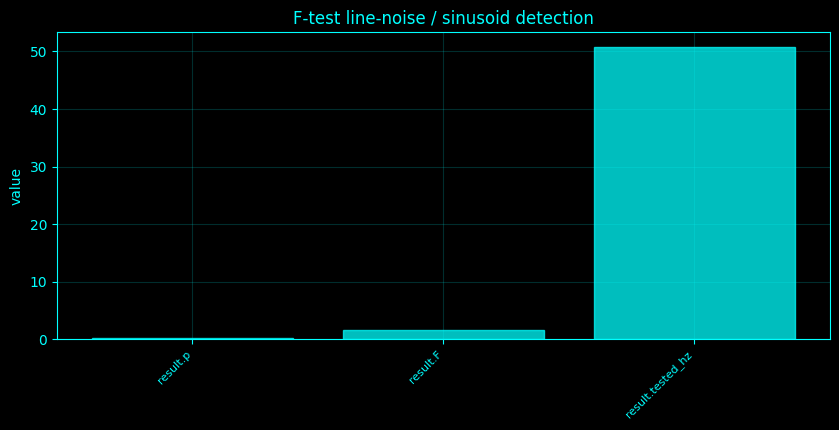

In [20]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _multitaper_psd(data=None, NW=3.5, K=None, adaptive=False):
    Y = X if data is None else np.asarray(data, float)
    if Y.ndim == 1:
        Y = Y[:, None]
    n = min(N if data is None else len(Y), int(_SPEED['nperseg'] * 2))
    n = max(64, n)
    Y = Y[:n] - np.mean(Y[:n], axis=0, keepdims=True)
    K = int(K or max(3, 2 * NW - 1))
    tap, eigs = signal.windows.dpss(n, NW, Kmax=K, return_ratios=True)
    F = np.fft.rfft(Y[:, None, :] * tap.T[:, :, None], axis=0)
    scale = _fs * np.sum(tap ** 2, axis=1)
    P = np.abs(F) ** 2 / scale[None, :, None]
    if adaptive:
        w = eigs / (np.sum(eigs) + EPS)
        Pm = np.sum(P * w[None, :, None], axis=1)
    else:
        Pm = np.mean(P, axis=1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    return (f[keep], Pm[keep], F[keep], eigs, tap)

# Method-specific calculation.
def _compute_method_10():
    idx = 10
    name = 'F-test line-noise / sinusoid detection'
    __plot_spec = None
    f, P, F, eigs, tapers = _multitaper_psd(adaptive=idx == 9)
    y = X[:, 0]
    ff, pp = _psd_of(y[:, None])
    band = (ff >= 45) & (ff <= min(65, 0.49 * _fs))
    if not np.any(band):
        band = (ff >= 4) & (ff <= 45)
    f0 = float(ff[band][np.argmax(pp[band, 0])])
    tt = np.arange(len(y)) / _fs
    Z = np.column_stack([np.ones(len(y)), np.sin(2 * np.pi * f0 * tt), np.cos(2 * np.pi * f0 * tt)])
    b = np.linalg.lstsq(Z, y, rcond=None)[0]
    r = y - Z @ b
    rss1 = np.sum(r * r)
    rss0 = np.sum((y - y.mean()) ** 2)
    Fstat = (rss0 - rss1) / 2 / (rss1 / max(len(y) - 3, 1) + EPS)
    pval = stats.f.sf(Fstat, 2, max(len(y) - 3, 1))
    return ({'tested_hz': f0, 'F': float(Fstat), 'p': float(pval)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_10,_plot_spec=_compute_method_10()
print('F-test line-noise / sinusoid detection')
if isinstance(result_10,dict):
    for _k,_v in result_10.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_10)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_10)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'F-test line-noise / sinusoid detection',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'F-test line-noise / sinusoid detection',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('F-test line-noise / sinusoid detection',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">11. DPSS taper diagnostics</h3>
<p>DPSS diagnostics inspect concentration eigenvalues \(\lambda_k\in[0,1]\) and numerical orthogonality \(v_i^\top v_j\approx\delta_{ij}\). High \(\lambda_k\) means little taper energy lies outside the design bandwidth.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

DPSS taper diagnostics
  DPSS_eigenvalues: array(6,), mean=0.989048
  max_abs_taper_inner_product: 7.54984182810281e-16


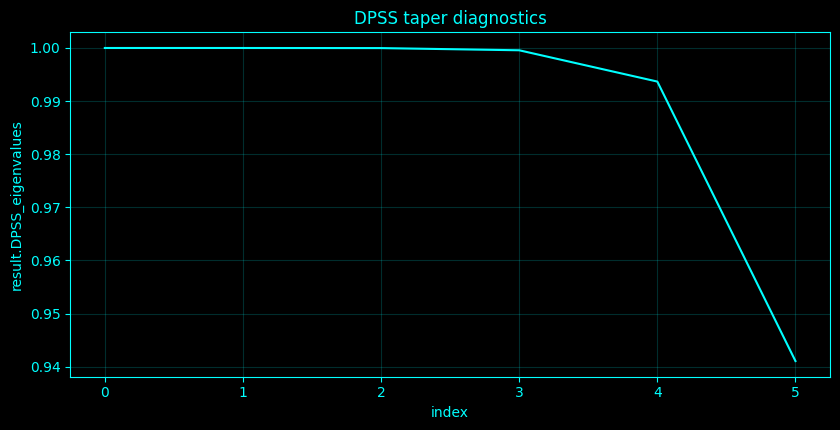

In [21]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _multitaper_psd(data=None, NW=3.5, K=None, adaptive=False):
    Y = X if data is None else np.asarray(data, float)
    if Y.ndim == 1:
        Y = Y[:, None]
    n = min(N if data is None else len(Y), int(_SPEED['nperseg'] * 2))
    n = max(64, n)
    Y = Y[:n] - np.mean(Y[:n], axis=0, keepdims=True)
    K = int(K or max(3, 2 * NW - 1))
    tap, eigs = signal.windows.dpss(n, NW, Kmax=K, return_ratios=True)
    F = np.fft.rfft(Y[:, None, :] * tap.T[:, :, None], axis=0)
    scale = _fs * np.sum(tap ** 2, axis=1)
    P = np.abs(F) ** 2 / scale[None, :, None]
    if adaptive:
        w = eigs / (np.sum(eigs) + EPS)
        Pm = np.sum(P * w[None, :, None], axis=1)
    else:
        Pm = np.mean(P, axis=1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    return (f[keep], Pm[keep], F[keep], eigs, tap)

# Method-specific calculation.
def _compute_method_11():
    idx = 11
    name = 'DPSS taper diagnostics'
    __plot_spec = None
    f, P, F, eigs, tapers = _multitaper_psd(adaptive=idx == 9)
    G = tapers @ tapers.T
    off = G - np.diag(np.diag(G))
    return ({'DPSS_eigenvalues': eigs.tolist(), 'max_abs_taper_inner_product': float(np.max(np.abs(off)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_11,_plot_spec=_compute_method_11()
print('DPSS taper diagnostics')
if isinstance(result_11,dict):
    for _k,_v in result_11.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_11)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_11)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'DPSS taper diagnostics',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'DPSS taper diagnostics',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('DPSS taper diagnostics',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">12. Parametric AR spectral estimation</h3>
<p>An AR(\(p\)) model is \(x_t=\sum_{k=1}^{p}a_kx_{t-k}+\varepsilon_t\). Its spectrum is \(S(f)=\sigma_\varepsilon^2/[f_s|1-\sum_ka_ke^{-i2\pi fk/f_s}|^2]\). Yule-Walker estimates \(a\) from the Toeplitz autocovariance equations.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Parametric AR spectral estimation
  order: 5
  innovation_variance: 0.09190534273185876


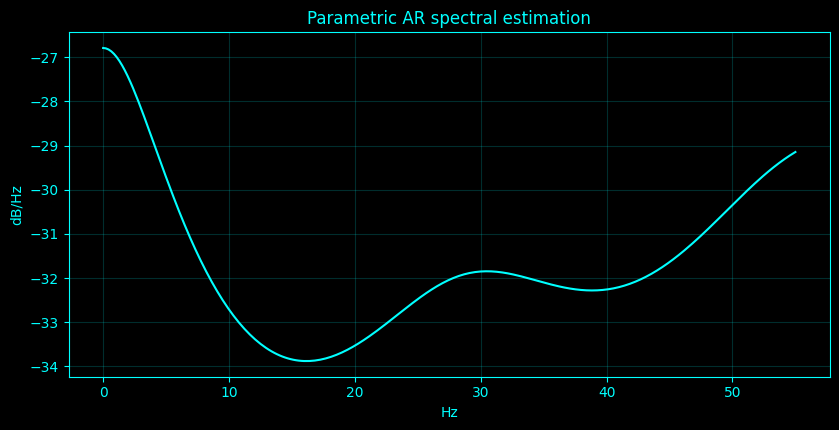

In [22]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _ar_yw(y, p):
    y = np.asarray(y, float) - np.mean(y)
    n = len(y)
    ac = np.array([np.dot(y[k:], y[:n - k]) / n for k in range(p + 1)])
    R = linalg.toeplitz(ac[:-1])
    a = np.linalg.solve(R + 1e-08 * np.eye(p), ac[1:])
    e = y[p:] - sum((a[k - 1] * y[p - k:n - k] for k in range(1, p + 1)))
    return (a, float(np.var(e)))

def _ar_spectrum(a, var, nf=256, fs=None):
    fs = _fs if fs is None else fs
    f = np.linspace(0, min(55, 0.49 * fs), nf)
    k = np.arange(1, len(a) + 1)
    den = np.abs(1 - np.sum(a[None, :] * np.exp(-2j * np.pi * f[:, None] * k[None, :] / fs), axis=1)) ** 2
    return (f, var / (fs * (den + EPS)))

# Method-specific calculation.
def _compute_method_12():
    idx = 12
    name = 'Parametric AR spectral estimation'
    __plot_spec = None
    y = X[:, 0]
    p = min(max(4, _SPEED['var_order']), 20)
    a, v = _ar_yw(y, p)
    f, ps = _ar_spectrum(a, v)
    __plot_spec = ('summary', 10 * np.log10(ps + EPS), name, f, 'Hz', 'dB/Hz')
    return ({'order': p, 'innovation_variance': v}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_12,_plot_spec=_compute_method_12()
print('Parametric AR spectral estimation')
if isinstance(result_12,dict):
    for _k,_v in result_12.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_12)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_12)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Parametric AR spectral estimation',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Parametric AR spectral estimation',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Parametric AR spectral estimation',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">13. Yule-Walker spectrum</h3>
<p>An AR(\(p\)) model is \(x_t=\sum_{k=1}^{p}a_kx_{t-k}+\varepsilon_t\). Its spectrum is \(S(f)=\sigma_\varepsilon^2/[f_s|1-\sum_ka_ke^{-i2\pi fk/f_s}|^2]\). Yule-Walker estimates \(a\) from the Toeplitz autocovariance equations.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Yule-Walker spectrum
  order: 5
  innovation_variance: 0.09190534273185876


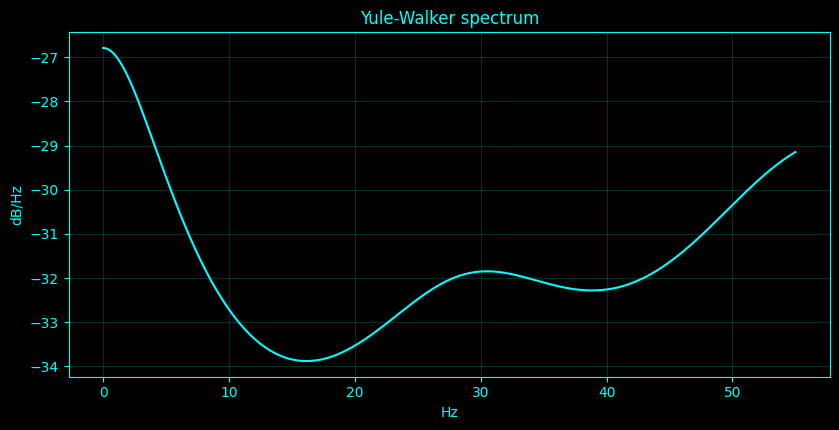

In [23]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _ar_yw(y, p):
    y = np.asarray(y, float) - np.mean(y)
    n = len(y)
    ac = np.array([np.dot(y[k:], y[:n - k]) / n for k in range(p + 1)])
    R = linalg.toeplitz(ac[:-1])
    a = np.linalg.solve(R + 1e-08 * np.eye(p), ac[1:])
    e = y[p:] - sum((a[k - 1] * y[p - k:n - k] for k in range(1, p + 1)))
    return (a, float(np.var(e)))

def _ar_spectrum(a, var, nf=256, fs=None):
    fs = _fs if fs is None else fs
    f = np.linspace(0, min(55, 0.49 * fs), nf)
    k = np.arange(1, len(a) + 1)
    den = np.abs(1 - np.sum(a[None, :] * np.exp(-2j * np.pi * f[:, None] * k[None, :] / fs), axis=1)) ** 2
    return (f, var / (fs * (den + EPS)))

# Method-specific calculation.
def _compute_method_13():
    idx = 13
    name = 'Yule-Walker spectrum'
    __plot_spec = None
    y = X[:, 0]
    p = min(max(4, _SPEED['var_order']), 20)
    a, v = _ar_yw(y, p)
    f, ps = _ar_spectrum(a, v)
    __plot_spec = ('summary', 10 * np.log10(ps + EPS), name, f, 'Hz', 'dB/Hz')
    return ({'order': p, 'innovation_variance': v}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_13,_plot_spec=_compute_method_13()
print('Yule-Walker spectrum')
if isinstance(result_13,dict):
    for _k,_v in result_13.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_13)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_13)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Yule-Walker spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Yule-Walker spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Yule-Walker spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">14. Burg spectrum</h3>
<p>Burg estimation recursively minimizes forward and backward prediction errors while enforcing a stable all-pole model. The resulting AR coefficients are inserted into the standard AR spectral formula.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Burg spectrum
  order: 5
  innovation_variance: 0.7723791523776429


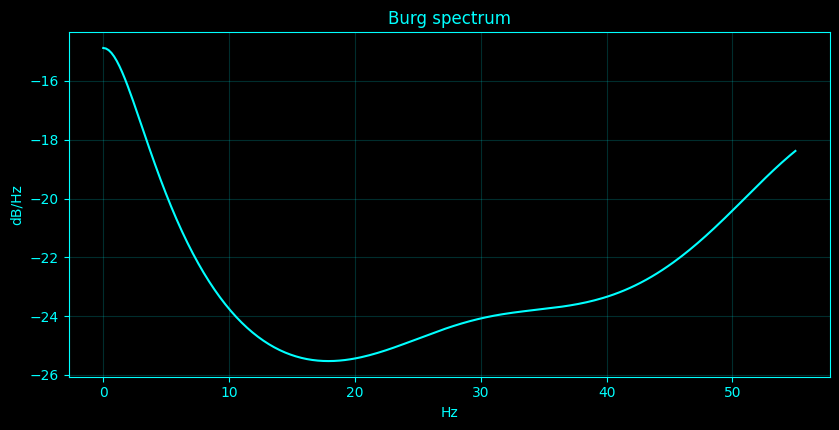

In [24]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _ar_burg(y, p):
    y = np.asarray(y, float) - np.mean(y)
    ef = y[1:].copy()
    eb = y[:-1].copy()
    a = np.zeros(p + 1)
    a[0] = 1.0
    E = np.dot(y, y) / len(y)
    for m in range(1, p + 1):
        num = -2 * np.dot(eb, ef)
        den = np.dot(ef, ef) + np.dot(eb, eb) + EPS
        k = num / den
        anew = a.copy()
        anew[m] = k
        for i in range(1, m):
            anew[i] = a[i] + k * a[m - i]
        a = anew
        ef_new = ef + k * eb
        eb = eb + k * ef
        ef = ef_new[1:]
        eb = eb[:-1]
        E *= max(1 - k * k, EPS)
    return (-a[1:], float(E))

def _ar_spectrum(a, var, nf=256, fs=None):
    fs = _fs if fs is None else fs
    f = np.linspace(0, min(55, 0.49 * fs), nf)
    k = np.arange(1, len(a) + 1)
    den = np.abs(1 - np.sum(a[None, :] * np.exp(-2j * np.pi * f[:, None] * k[None, :] / fs), axis=1)) ** 2
    return (f, var / (fs * (den + EPS)))

# Method-specific calculation.
def _compute_method_14():
    idx = 14
    name = 'Burg spectrum'
    __plot_spec = None
    y = X[:, 0]
    p = min(max(4, _SPEED['var_order']), 20)
    a, v = _ar_burg(y, p)
    f, ps = _ar_spectrum(a, v)
    __plot_spec = ('summary', 10 * np.log10(ps + EPS), name, f, 'Hz', 'dB/Hz')
    return ({'order': p, 'innovation_variance': v}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_14,_plot_spec=_compute_method_14()
print('Burg spectrum')
if isinstance(result_14,dict):
    for _k,_v in result_14.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_14)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_14)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Burg spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Burg spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Burg spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">15. Covariance-method AR spectrum</h3>
<p>The covariance AR method estimates coefficients by least squares on forward prediction equations without forcing the covariance matrix to be Toeplitz.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Covariance-method AR spectrum
  order: 5
  innovation_variance: 0.022325793037763147
  peak_hz: 0.0


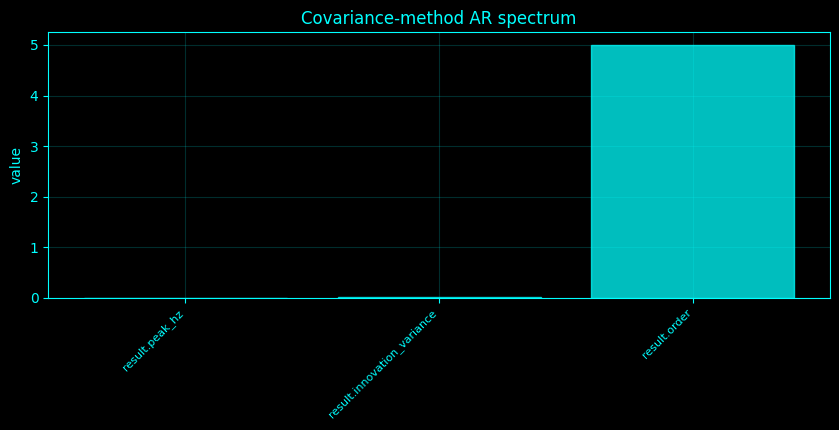

In [25]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _ar_spectrum(a, var, nf=256, fs=None):
    fs = _fs if fs is None else fs
    f = np.linspace(0, min(55, 0.49 * fs), nf)
    k = np.arange(1, len(a) + 1)
    den = np.abs(1 - np.sum(a[None, :] * np.exp(-2j * np.pi * f[:, None] * k[None, :] / fs), axis=1)) ** 2
    return (f, var / (fs * (den + EPS)))

# Method-specific calculation.
def _compute_method_15():
    idx = 15
    name = 'Covariance-method AR spectrum'
    __plot_spec = None
    y = X[:, 0]
    p = min(max(4, _SPEED['var_order']), 20)
    n = len(y)
    Y = y[p:]
    Z = np.column_stack([y[p - k:n - k] for k in range(1, p + 1)])
    a = np.linalg.lstsq(Z, Y, rcond=None)[0]
    v = float(np.var(Y - Z @ a))
    f, ps = _ar_spectrum(a, v)
    return ({'order': p, 'innovation_variance': v, 'peak_hz': float(f[np.argmax(ps)])}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_15,_plot_spec=_compute_method_15()
print('Covariance-method AR spectrum')
if isinstance(result_15,dict):
    for _k,_v in result_15.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_15)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_15)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Covariance-method AR spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Covariance-method AR spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Covariance-method AR spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">16. Modified covariance AR spectrum</h3>
<p>The modified-covariance method fits forward and backward prediction equations together, reducing directional bias in finite records while retaining an all-pole AR spectrum.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Modified covariance AR spectrum
  order: 5
  innovation_variance: 0.16474219103098411
  peak_hz: 0.0


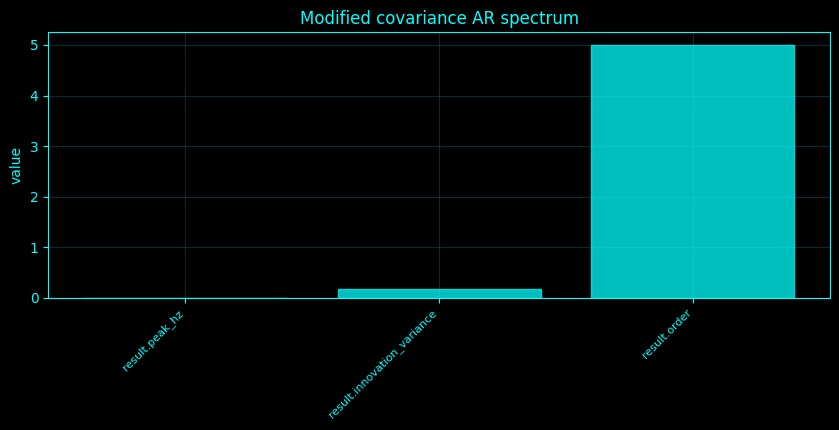

In [26]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _ar_spectrum(a, var, nf=256, fs=None):
    fs = _fs if fs is None else fs
    f = np.linspace(0, min(55, 0.49 * fs), nf)
    k = np.arange(1, len(a) + 1)
    den = np.abs(1 - np.sum(a[None, :] * np.exp(-2j * np.pi * f[:, None] * k[None, :] / fs), axis=1)) ** 2
    return (f, var / (fs * (den + EPS)))

# Method-specific calculation.
def _compute_method_16():
    idx = 16
    name = 'Modified covariance AR spectrum'
    __plot_spec = None
    y = X[:, 0]
    p = min(max(4, _SPEED['var_order']), 20)
    n = len(y)
    Y = y[p:]
    Z = np.column_stack([y[p - k:n - k] for k in range(1, p + 1)])
    yr = y[::-1]
    Yr = yr[p:]
    Zr = np.column_stack([yr[p - k:n - k] for k in range(1, p + 1)])
    Y = np.r_[Y, Yr]
    Z = np.vstack([Z, Zr])
    a = np.linalg.lstsq(Z, Y, rcond=None)[0]
    v = float(np.var(Y - Z @ a))
    f, ps = _ar_spectrum(a, v)
    return ({'order': p, 'innovation_variance': v, 'peak_hz': float(f[np.argmax(ps)])}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_16,_plot_spec=_compute_method_16()
print('Modified covariance AR spectrum')
if isinstance(result_16,dict):
    for _k,_v in result_16.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_16)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_16)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Modified covariance AR spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Modified covariance AR spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Modified covariance AR spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">17. AR order sweep</h3>
<p>An AR order sweep fits multiple orders \(p\) and compares innovation variance and spectral structure. Increasing \(p\) improves flexibility but also increases estimator variance.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

AR order sweep
  orders: array(15,), mean=8
  innovation_variance: array(15,), mean=0.0941773


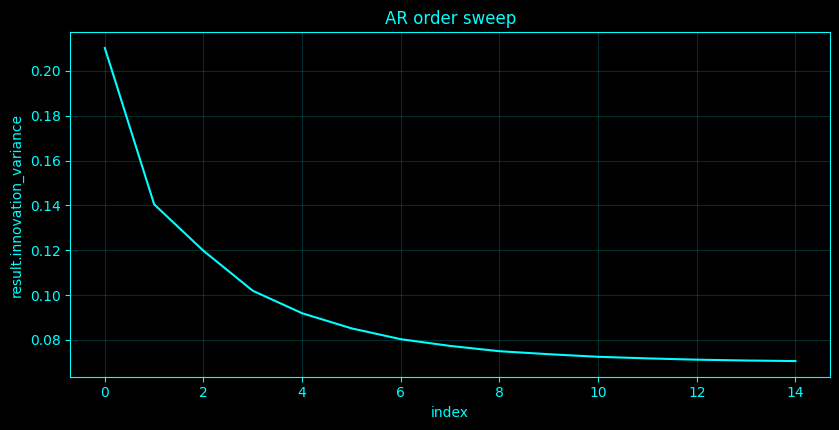

In [27]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _ar_yw(y, p):
    y = np.asarray(y, float) - np.mean(y)
    n = len(y)
    ac = np.array([np.dot(y[k:], y[:n - k]) / n for k in range(p + 1)])
    R = linalg.toeplitz(ac[:-1])
    a = np.linalg.solve(R + 1e-08 * np.eye(p), ac[1:])
    e = y[p:] - sum((a[k - 1] * y[p - k:n - k] for k in range(1, p + 1)))
    return (a, float(np.var(e)))

def _ar_order_table(y, maxp=None):
    maxp = int(maxp or min(20, _SPEED['var_order'] * 2))
    rows = []
    n = len(y)
    for p in range(1, maxp + 1):
        a, v = _ar_yw(y, p)
        k = p
        aic = n * np.log(v + EPS) + 2 * k
        bic = n * np.log(v + EPS) + k * np.log(n)
        rows.append((p, v, aic, bic))
    return np.asarray(rows)

# Method-specific calculation.
def _compute_method_17():
    idx = 17
    name = 'AR order sweep'
    __plot_spec = None
    y = X[:, 0]
    p = min(max(4, _SPEED['var_order']), 20)
    T = _ar_order_table(y, min(24, max(10, _SPEED['var_order'] * 3)))
    return ({'orders': T[:, 0].astype(int).tolist(), 'innovation_variance': T[:, 1].tolist()}, locals().get('__plot_spec', None))
    return ({'AIC_order': int(T[np.argmin(T[:, 2]), 0]), 'BIC_order': int(T[np.argmin(T[:, 3]), 0])}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_17,_plot_spec=_compute_method_17()
print('AR order sweep')
if isinstance(result_17,dict):
    for _k,_v in result_17.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_17)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_17)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'AR order sweep',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'AR order sweep',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('AR order sweep',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">18. AIC/BIC AR spectral order comparison</h3>
<p>AR model-order criteria penalize likelihood by complexity. For Gaussian residual variance \(\hat\sigma^2\), \(\mathrm{AIC}=N\log\hat\sigma^2+2p\) and \(\mathrm{BIC}=N\log\hat\sigma^2+p\log N\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

AIC/BIC AR spectral order comparison
  AIC_order: 15
  BIC_order: 15


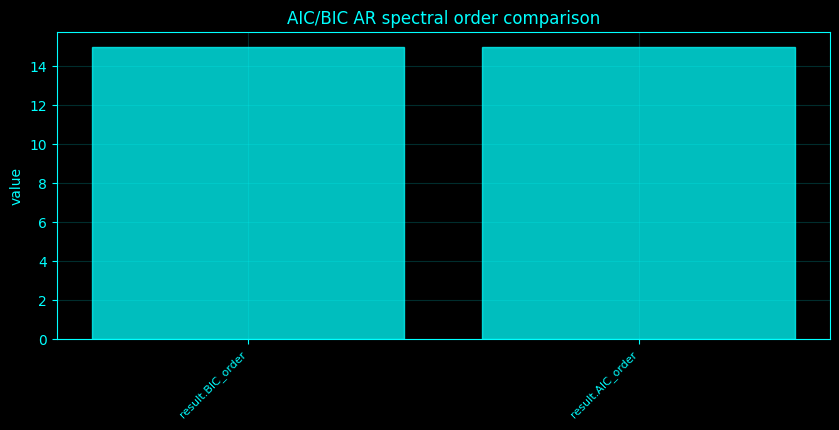

In [18]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _ar_yw(y, p):
    y = np.asarray(y, float) - np.mean(y)
    n = len(y)
    ac = np.array([np.dot(y[k:], y[:n - k]) / n for k in range(p + 1)])
    R = linalg.toeplitz(ac[:-1])
    a = np.linalg.solve(R + 1e-08 * np.eye(p), ac[1:])
    e = y[p:] - sum((a[k - 1] * y[p - k:n - k] for k in range(1, p + 1)))
    return (a, float(np.var(e)))

def _ar_order_table(y, maxp=None):
    maxp = int(maxp or min(20, _SPEED['var_order'] * 2))
    rows = []
    n = len(y)
    for p in range(1, maxp + 1):
        a, v = _ar_yw(y, p)
        k = p
        aic = n * np.log(v + EPS) + 2 * k
        bic = n * np.log(v + EPS) + k * np.log(n)
        rows.append((p, v, aic, bic))
    return np.asarray(rows)

# Method-specific calculation.
def _compute_method_18():
    idx = 18
    name = 'AIC/BIC AR spectral order comparison'
    __plot_spec = None
    y = X[:, 0]
    p = min(max(4, _SPEED['var_order']), 20)
    T = _ar_order_table(y, min(24, max(10, _SPEED['var_order'] * 3)))
    return ({'AIC_order': int(T[np.argmin(T[:, 2]), 0]), 'BIC_order': int(T[np.argmin(T[:, 3]), 0])}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_18,_plot_spec=_compute_method_18()
print('AIC/BIC AR spectral order comparison')
if isinstance(result_18,dict):
    for _k,_v in result_18.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_18)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_18)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'AIC/BIC AR spectral order comparison',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'AIC/BIC AR spectral order comparison',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('AIC/BIC AR spectral order comparison',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">19. Time-varying AR spectrum</h3>
<p>Time-varying AR analysis fits the same AR model in successive windows, so \(a_k(t)\) and the derived spectrum \(S(f,t)\) can evolve across the record.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Time-varying AR spectrum
  peak_trajectory_hz: array(12,), mean=4.58333


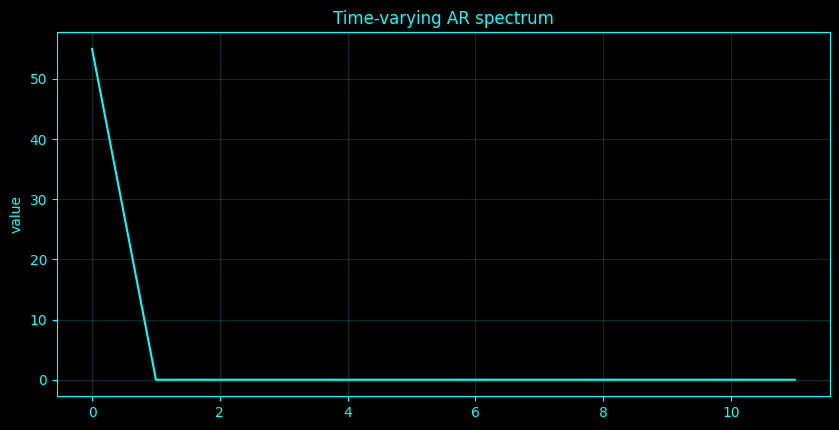

In [19]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _ar_yw(y, p):
    y = np.asarray(y, float) - np.mean(y)
    n = len(y)
    ac = np.array([np.dot(y[k:], y[:n - k]) / n for k in range(p + 1)])
    R = linalg.toeplitz(ac[:-1])
    a = np.linalg.solve(R + 1e-08 * np.eye(p), ac[1:])
    e = y[p:] - sum((a[k - 1] * y[p - k:n - k] for k in range(1, p + 1)))
    return (a, float(np.var(e)))

def _ar_spectrum(a, var, nf=256, fs=None):
    fs = _fs if fs is None else fs
    f = np.linspace(0, min(55, 0.49 * fs), nf)
    k = np.arange(1, len(a) + 1)
    den = np.abs(1 - np.sum(a[None, :] * np.exp(-2j * np.pi * f[:, None] * k[None, :] / fs), axis=1)) ** 2
    return (f, var / (fs * (den + EPS)))

# Method-specific calculation.
def _compute_method_19():
    idx = 19
    name = 'Time-varying AR spectrum'
    __plot_spec = None
    y = X[:, 0]
    p = min(max(4, _SPEED['var_order']), 20)
    nwin = min(12, max(4, N // max(int(_fs * 2), 1)))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    peaks = []
    for a0, b0 in zip(edges[:-1], edges[1:]):
        yy = y[a0:b0]
        pp = min(p, max(2, len(yy) // 10))
        aa, v = _ar_yw(yy, pp)
        ff, sp = _ar_spectrum(aa, v)
        peaks.append(float(ff[np.argmax(sp)]))
    __plot_spec = ('summary', peaks, name, None, '', 'value')
    return ({'peak_trajectory_hz': peaks}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_19,_plot_spec=_compute_method_19()
print('Time-varying AR spectrum')
if isinstance(result_19,dict):
    for _k,_v in result_19.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_19)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_19)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Time-varying AR spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Time-varying AR spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Time-varying AR spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">20. Kalman adaptive AR spectrum</h3>
<p>Adaptive/Kalman AR modeling treats the coefficient vector as a slowly varying state. Recursive least squares with forgetting factor \(\lambda\) is the corresponding linear-Gaussian update for a random-walk coefficient model.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Kalman adaptive AR spectrum
  RLS_forgetting_factor: 0.995
  adaptive_peak_hz: array(40,), mean=0


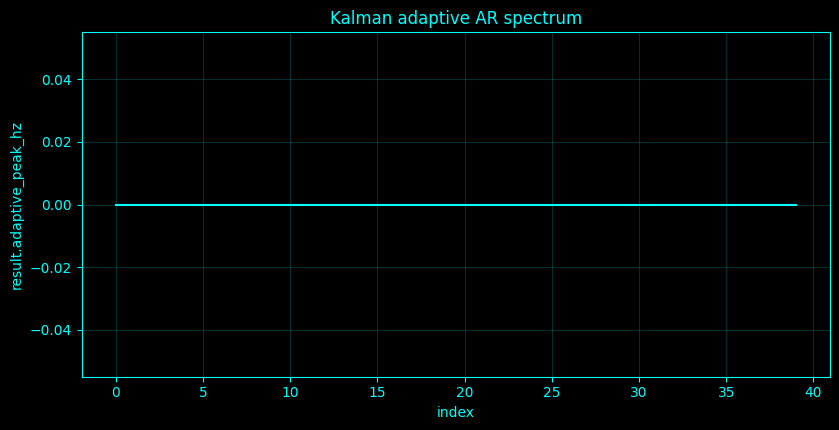

In [20]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _ar_spectrum(a, var, nf=256, fs=None):
    fs = _fs if fs is None else fs
    f = np.linspace(0, min(55, 0.49 * fs), nf)
    k = np.arange(1, len(a) + 1)
    den = np.abs(1 - np.sum(a[None, :] * np.exp(-2j * np.pi * f[:, None] * k[None, :] / fs), axis=1)) ** 2
    return (f, var / (fs * (den + EPS)))

# Method-specific calculation.
def _compute_method_20():
    idx = 20
    name = 'Kalman adaptive AR spectrum'
    __plot_spec = None
    y = X[:, 0]
    p = min(max(4, _SPEED['var_order']), 20)
    p0 = min(p, 8)
    theta = np.zeros(p0)
    Pk = np.eye(p0) * 100.0
    lam = 0.995
    peaks = []
    step = max(p0, (N - p0) // 40)
    for t0 in range(p0, N):
        phi = y[t0 - np.arange(1, p0 + 1)]
        den = lam + phi @ Pk @ phi
        K = Pk @ phi / den
        err = y[t0] - theta @ phi
        theta = theta + K * err
        Pk = (Pk - np.outer(K, phi) @ Pk) / lam
        if t0 % step == 0:
            ff, sp = _ar_spectrum(theta, max(err * err, 0.0001))
            peaks.append(float(ff[np.argmax(sp)]))
    return ({'RLS_forgetting_factor': lam, 'adaptive_peak_hz': peaks}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_20,_plot_spec=_compute_method_20()
print('Kalman adaptive AR spectrum')
if isinstance(result_20,dict):
    for _k,_v in result_20.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_20)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_20)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Kalman adaptive AR spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Kalman adaptive AR spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Kalman adaptive AR spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">21. MVAR spectral analysis</h3>
<p>For \(x_t=\sum_{k=1}^{p}A_kx_{t-k}+\varepsilon_t\), define \(A(f)=I-\sum_kA_ke^{-i2\pi fk/f_s}\), \(H(f)=A(f)^{-1}\), and \(S(f)=H(f)\Sigma H(f)^\ast\). MVAR spectral analysis studies this full matrix spectrum.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [21]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_21():
    idx = 21
    name = 'MVAR spectral analysis'
    __plot_spec = None
    D = _directed_measures()
    f = D['f']
    m = (f >= 8) & (f < 13)
    tr = np.real(np.trace(D['S'], axis1=1, axis2=2))
    __plot_spec = ('summary', tr, name, f, 'Hz', 'trace S(f)')
    return ({'peak_hz': float(f[np.argmax(tr)])}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_21,_plot_spec=_compute_method_21()
print('MVAR spectral analysis')
if isinstance(result_21,dict):
    for _k,_v in result_21.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_21)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_21)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'MVAR spectral analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'MVAR spectral analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('MVAR spectral analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


MVAR spectral analysis
  peak_hz: 1.0


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">22. MVAR coherence</h3>
<p>MVAR coherence is derived from the model spectral matrix: \(C_{ij}(f)=|S_{ij}(f)|^2/[S_{ii}(f)S_{jj}(f)]\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [22]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_22():
    idx = 22
    name = 'MVAR coherence'
    __plot_spec = None
    D = _directed_measures()
    f = D['f']
    m = (f >= 8) & (f < 13)
    S = D['S']
    coh = np.abs(S[:, 0, 1]) ** 2 / (np.real(S[:, 0, 0]) * np.real(S[:, 1, 1]) + EPS)
    __plot_spec = ('summary', coh, name, f, 'Hz', 'MVAR coherence')
    return ({'alpha': float(np.mean(coh[m]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_22,_plot_spec=_compute_method_22()
print('MVAR coherence')
if isinstance(result_22,dict):
    for _k,_v in result_22.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_22)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_22)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'MVAR coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'MVAR coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('MVAR coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


MVAR coherence
  alpha: 0.8991203126513632


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">23. Directed transfer function</h3>
<p>Directed transfer function is \(\mathrm{DTF}_{ij}=|H_{ij}|/\sqrt{\sum_k|H_{ik}|^2}\), quantifying transfer from source \(j\) to target \(i\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [23]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_23():
    idx = 23
    name = 'Directed transfer function'
    __plot_spec = None
    D = _directed_measures()
    f = D['f']
    m = (f >= 8) & (f < 13)
    M = D['dtf']
    return ({'max_alpha_DTF': float(np.max(np.mean(M[m], axis=0) - np.eye(C)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_23,_plot_spec=_compute_method_23()
print('Directed transfer function')
if isinstance(result_23,dict):
    for _k,_v in result_23.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_23)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_23)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Directed transfer function',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Directed transfer function',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Directed transfer function',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Directed transfer function
  max_alpha_DTF: 0.6475506826866955


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">24. Partial directed coherence</h3>
<p>Partial directed coherence is \(\mathrm{PDC}_{ij}=|A_{ij}|/\sqrt{\sum_k|A_{kj}|^2}\), a sender-column normalization of the Fourier AR matrix.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [24]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_24():
    idx = 24
    name = 'Partial directed coherence'
    __plot_spec = None
    D = _directed_measures()
    f = D['f']
    m = (f >= 8) & (f < 13)
    M = D['pdc']
    return ({'max_alpha_PDC': float(np.max(np.mean(M[m], axis=0) - np.eye(C)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_24,_plot_spec=_compute_method_24()
print('Partial directed coherence')
if isinstance(result_24,dict):
    for _k,_v in result_24.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_24)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_24)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Partial directed coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Partial directed coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Partial directed coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Partial directed coherence
  max_alpha_PDC: 0.5464343659046756


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">25. Generalized partial directed coherence</h3>
<p>Generalized PDC incorporates innovation-scale normalization, \(|A_{ij}|/\sigma_i\,[\sum_k|A_{kj}|^2/\sigma_k^2]^{-1/2}\), improving scale invariance.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [25]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_25():
    idx = 25
    name = 'Generalized partial directed coherence'
    __plot_spec = None
    D = _directed_measures()
    f = D['f']
    m = (f >= 8) & (f < 13)
    M = D['gpdc']
    return ({'max_alpha_gPDC': float(np.max(np.mean(M[m], axis=0) - np.eye(C)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_25,_plot_spec=_compute_method_25()
print('Generalized partial directed coherence')
if isinstance(result_25,dict):
    for _k,_v in result_25.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_25)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_25)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Generalized partial directed coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Generalized partial directed coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Generalized partial directed coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Generalized partial directed coherence
  max_alpha_gPDC: 0.5502539576057963


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">26. Adaptive MVAR spectral connectivity</h3>
<p>Adaptive MVAR connectivity refits the MVAR relationship in successive windows. The changing coefficient/transfer norms summarize nonstationary directed spectral coupling.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Adaptive MVAR spectral connectivity
  adaptive_MVAR_coefficient_norm: array(10,), mean=4.72031


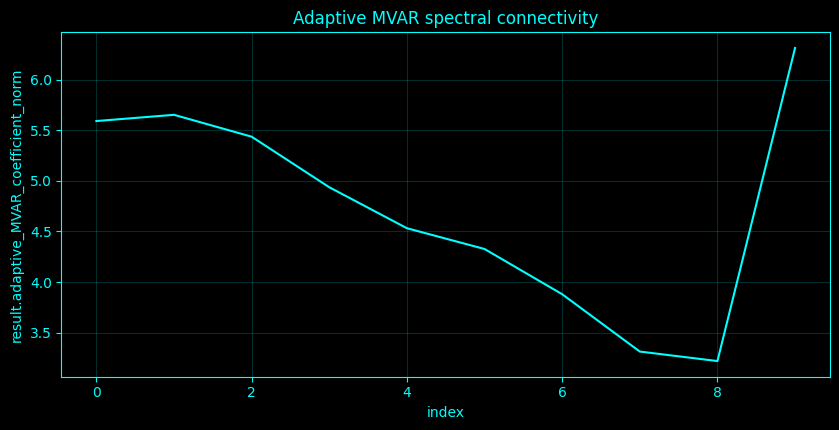

In [26]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_26():
    idx = 26
    name = 'Adaptive MVAR spectral connectivity'
    __plot_spec = None
    D = _directed_measures()
    f = D['f']
    m = (f >= 8) & (f < 13)
    nwin = min(10, max(4, N // max(int(_fs * 2), 1)))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    vals = []
    for a0, b0 in zip(edges[:-1], edges[1:]):
        xx = X[a0:b0, :min(4, C)]
        pp = min(4, max(1, len(xx) // 30))
        if len(xx) <= pp + 5:
            continue
        Y = xx[pp:]
        Z = np.hstack([xx[pp - k:len(xx) - k] for k in range(1, pp + 1)])
        B = np.linalg.lstsq(Z, Y, rcond=None)[0]
        vals.append(float(np.linalg.norm(B)))
    return ({'adaptive_MVAR_coefficient_norm': vals}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_26,_plot_spec=_compute_method_26()
print('Adaptive MVAR spectral connectivity')
if isinstance(result_26,dict):
    for _k,_v in result_26.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_26)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_26)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Adaptive MVAR spectral connectivity',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Adaptive MVAR spectral connectivity',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Adaptive MVAR spectral connectivity',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">27. Cross-spectral density matrix analysis</h3>
<p>The cross-spectral density matrix \(S(f)=E[X(f)X(f)^\ast]\) is Hermitian positive semidefinite. Its diagonal contains channel PSDs and off-diagonal entries contain complex cross-spectra.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Cross-spectral density matrix analysis
  trace_alpha: 0.0067853728742055105
  condition_alpha: 3910.9643148488135


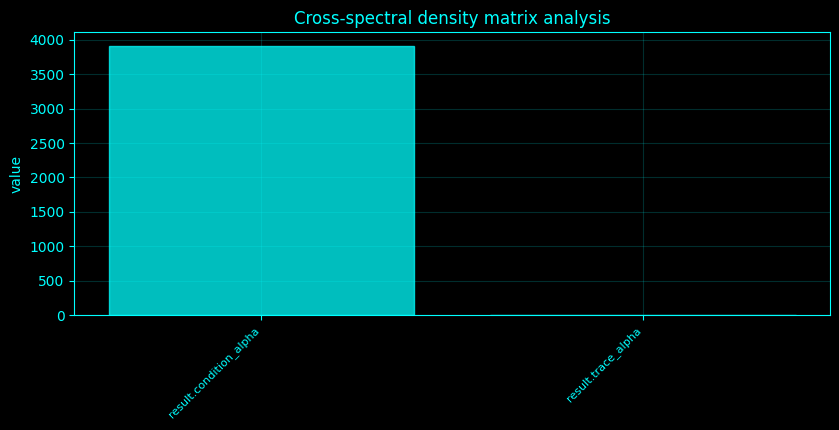

In [27]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_27():
    idx = 27
    name = 'Cross-spectral density matrix analysis'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    m = (f >= 8) & (f < 13)
    Salpha = np.mean(S[m], axis=0)
    return ({'trace_alpha': float(np.trace(Salpha).real), 'condition_alpha': float(np.linalg.cond(Salpha + 1e-08 * np.eye(C)))}, locals().get('__plot_spec', None))
    eigs = np.array([np.linalg.eigvalsh((q + q.conj().T) / 2).real[::-1] for q in S])
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_27,_plot_spec=_compute_method_27()
print('Cross-spectral density matrix analysis')
if isinstance(result_27,dict):
    for _k,_v in result_27.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_27)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_27)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Cross-spectral density matrix analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Cross-spectral density matrix analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Cross-spectral density matrix analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">28. Complex cross-spectrum by channel pair</h3>
<p>A complex cross-spectrum \(S_{ij}(f)\) has magnitude \(|S_{ij}|\) and phase \(\arg S_{ij}\); both are needed to distinguish shared amplitude from relative phase.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [28]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_28():
    idx = 28
    name = 'Complex cross-spectrum by channel pair'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    m = (f >= 8) & (f < 13)
    Salpha = np.mean(S[m], axis=0)
    z = S[:, 0, 1]
    __plot_spec = ('summary', np.vstack([np.abs(z), np.angle(z)]), name, None, '', 'value')
    return ({'alpha_phase': float(np.angle(np.mean(z[m])))}, locals().get('__plot_spec', None))
    eigs = np.array([np.linalg.eigvalsh((q + q.conj().T) / 2).real[::-1] for q in S])
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_28,_plot_spec=_compute_method_28()
print('Complex cross-spectrum by channel pair')
if isinstance(result_28,dict):
    for _k,_v in result_28.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_28)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_28)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Complex cross-spectrum by channel pair',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Complex cross-spectrum by channel pair',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Complex cross-spectrum by channel pair',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Complex cross-spectrum by channel pair
  alpha_phase: -0.00507977753518894


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">29. Cross-spectral phase maps</h3>
<p>Cross-spectral phase maps display \(\arg S_{ij}(f)\) across channel pairs at a selected frequency.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [29]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_29():
    idx = 29
    name = 'Cross-spectral phase maps'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    m = (f >= 8) & (f < 13)
    Salpha = np.mean(S[m], axis=0)
    M = np.angle(S[np.argmin(np.abs(f - 10))])
    __plot_spec = ('summary', M, name, None, '', 'value')
    return ({'frequency_hz': float(f[np.argmin(np.abs(f - 10))])}, locals().get('__plot_spec', None))
    eigs = np.array([np.linalg.eigvalsh((q + q.conj().T) / 2).real[::-1] for q in S])
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_29,_plot_spec=_compute_method_29()
print('Cross-spectral phase maps')
if isinstance(result_29,dict):
    for _k,_v in result_29.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_29)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_29)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Cross-spectral phase maps',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Cross-spectral phase maps',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Cross-spectral phase maps',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Cross-spectral phase maps
  frequency_hz: 10.009765625


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">30. Cross-spectral magnitude maps</h3>
<p>Cross-spectral magnitude maps display \(|S_{ij}(f)|\), the absolute complex cross-spectrum across pairs.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [30]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_30():
    idx = 30
    name = 'Cross-spectral magnitude maps'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    m = (f >= 8) & (f < 13)
    Salpha = np.mean(S[m], axis=0)
    M = np.abs(S[np.argmin(np.abs(f - 10))])
    __plot_spec = ('summary', M, name, None, '', 'value')
    return ({'max_offdiag': float(np.max(M - np.diag(np.diag(M))))}, locals().get('__plot_spec', None))
    eigs = np.array([np.linalg.eigvalsh((q + q.conj().T) / 2).real[::-1] for q in S])
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_30,_plot_spec=_compute_method_30()
print('Cross-spectral magnitude maps')
if isinstance(result_30,dict):
    for _k,_v in result_30.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_30)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_30)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Cross-spectral magnitude maps',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Cross-spectral magnitude maps',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Cross-spectral magnitude maps',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Cross-spectral magnitude maps
  max_offdiag: 0.0016159137677816


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">31. Cross-spectral eigenvalue spectrum</h3>
<p>Because \(S(f)\) is Hermitian, it admits \(S(f)=U(f)\Lambda(f)U(f)^\ast\). Eigenvalue/SVD analyses quantify dominant multichannel spectral modes; for Hermitian PSD matrices singular values equal nonnegative eigenvalues.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [31]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_31():
    idx = 31
    name = 'Cross-spectral eigenvalue spectrum'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    m = (f >= 8) & (f < 13)
    Salpha = np.mean(S[m], axis=0)
    eigs = np.array([np.linalg.eigvalsh((q + q.conj().T) / 2).real[::-1] for q in S])
    __plot_spec = ('summary', eigs.T, name, None, '', 'value')
    return ({'alpha_leading_fraction': float(np.mean(eigs[m, 0] / (np.sum(eigs[m], axis=1) + EPS)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_31,_plot_spec=_compute_method_31()
print('Cross-spectral eigenvalue spectrum')
if isinstance(result_31,dict):
    for _k,_v in result_31.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_31)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_31)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Cross-spectral eigenvalue spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Cross-spectral eigenvalue spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Cross-spectral eigenvalue spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Cross-spectral eigenvalue spectrum
  alpha_leading_fraction: 0.7716665739772872


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">32. Cross-spectral PCA</h3>
<p>Because \(S(f)\) is Hermitian, it admits \(S(f)=U(f)\Lambda(f)U(f)^\ast\). Eigenvalue/SVD analyses quantify dominant multichannel spectral modes; for Hermitian PSD matrices singular values equal nonnegative eigenvalues.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Cross-spectral PCA
  leading_eigenvalue_fraction: 0.8010451494120857
  leading_mode_abs: array(12,), mean=0.263087


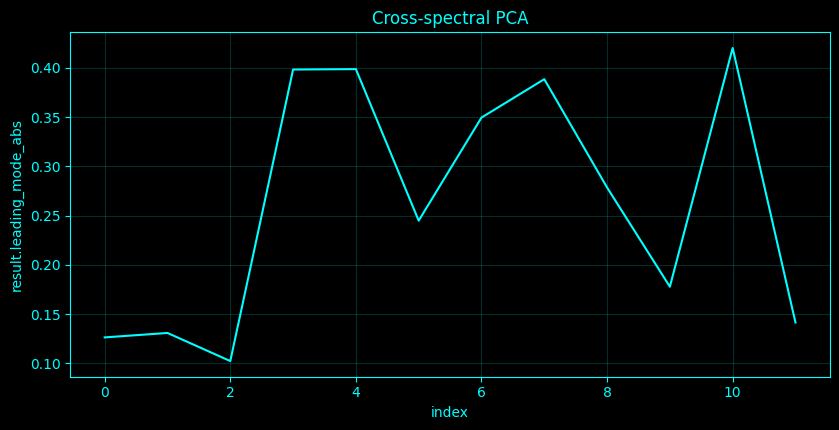

In [32]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_32():
    idx = 32
    name = 'Cross-spectral PCA'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    m = (f >= 8) & (f < 13)
    Salpha = np.mean(S[m], axis=0)
    eigs = np.array([np.linalg.eigvalsh((q + q.conj().T) / 2).real[::-1] for q in S])
    w, V = np.linalg.eigh((Salpha + Salpha.conj().T) / 2)
    return ({'leading_eigenvalue_fraction': float(w[-1] / (w.sum() + EPS)), 'leading_mode_abs': np.abs(V[:, -1]).tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_32,_plot_spec=_compute_method_32()
print('Cross-spectral PCA')
if isinstance(result_32,dict):
    for _k,_v in result_32.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_32)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_32)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Cross-spectral PCA',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Cross-spectral PCA',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Cross-spectral PCA',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">33. Cross-spectral SVD</h3>
<p>Because \(S(f)\) is Hermitian, it admits \(S(f)=U(f)\Lambda(f)U(f)^\ast\). Eigenvalue/SVD analyses quantify dominant multichannel spectral modes; for Hermitian PSD matrices singular values equal nonnegative eigenvalues.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Cross-spectral SVD
  singular_value_fraction: array(12,), mean=0.0833333


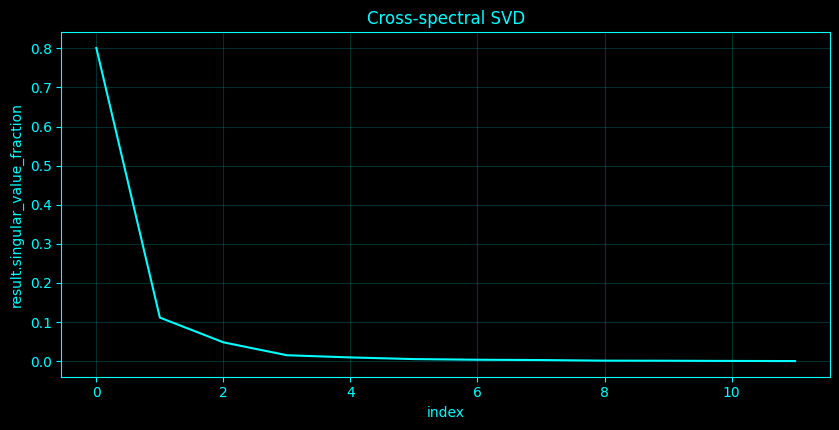

In [33]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_33():
    idx = 33
    name = 'Cross-spectral SVD'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    m = (f >= 8) & (f < 13)
    Salpha = np.mean(S[m], axis=0)
    eigs = np.array([np.linalg.eigvalsh((q + q.conj().T) / 2).real[::-1] for q in S])
    s = np.linalg.svd(Salpha, compute_uv=False)
    return ({'singular_value_fraction': (s / (s.sum() + EPS)).tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_33,_plot_spec=_compute_method_33()
print('Cross-spectral SVD')
if isinstance(result_33,dict):
    for _k,_v in result_33.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_33)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_33)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Cross-spectral SVD',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Cross-spectral SVD',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Cross-spectral SVD',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">34. Frequency-resolved covariance eigenspectra</h3>
<p>Because \(S(f)\) is Hermitian, it admits \(S(f)=U(f)\Lambda(f)U(f)^\ast\). Eigenvalue/SVD analyses quantify dominant multichannel spectral modes; for Hermitian PSD matrices singular values equal nonnegative eigenvalues.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Frequency-resolved covariance eigenspectra
  shape: array(2,), mean=119


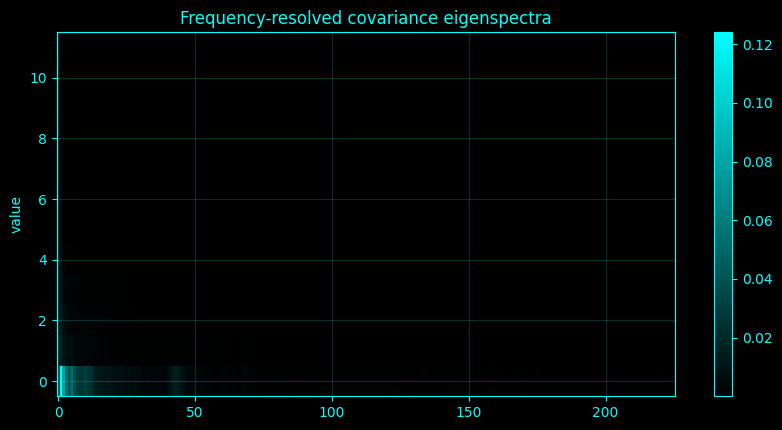

In [34]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_34():
    idx = 34
    name = 'Frequency-resolved covariance eigenspectra'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    m = (f >= 8) & (f < 13)
    Salpha = np.mean(S[m], axis=0)
    eigs = np.array([np.linalg.eigvalsh((q + q.conj().T) / 2).real[::-1] for q in S])
    er = np.array([np.linalg.eigvalsh(np.real((q + q.conj().T) / 2))[::-1] for q in S])
    __plot_spec = ('summary', er.T, name, None, '', 'value')
    return ({'shape': er.shape}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_34,_plot_spec=_compute_method_34()
print('Frequency-resolved covariance eigenspectra')
if isinstance(result_34,dict):
    for _k,_v in result_34.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_34)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_34)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Frequency-resolved covariance eigenspectra',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Frequency-resolved covariance eigenspectra',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Frequency-resolved covariance eigenspectra',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">35. Spectral participation ratio</h3>
<p>Spectral participation ratio is \(PR=(\sum_k\lambda_k)^2/\sum_k\lambda_k^2\), the effective number of comparably energetic eigenmodes.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [35]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_35():
    idx = 35
    name = 'Spectral participation ratio'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    m = (f >= 8) & (f < 13)
    Salpha = np.mean(S[m], axis=0)
    eigs = np.array([np.linalg.eigvalsh((q + q.conj().T) / 2).real[::-1] for q in S])
    lam = np.maximum(eigs, 0)
    pr = np.sum(lam, axis=1) ** 2 / (np.sum(lam ** 2, axis=1) + EPS)
    return ({'alpha_participation_ratio': float(np.mean(pr[m]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_35,_plot_spec=_compute_method_35()
print('Spectral participation ratio')
if isinstance(result_35,dict):
    for _k,_v in result_35.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_35)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_35)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral participation ratio',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral participation ratio',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral participation ratio',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral participation ratio
  alpha_participation_ratio: 1.6472633749945038


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">36. Spectral effective rank</h3>
<p>Spectral effective rank normalizes \(p_k=\lambda_k/\sum_j\lambda_j\) and computes \(\exp[-\sum_k p_k\log p_k]\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [36]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_36():
    idx = 36
    name = 'Spectral effective rank'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    m = (f >= 8) & (f < 13)
    Salpha = np.mean(S[m], axis=0)
    eigs = np.array([np.linalg.eigvalsh((q + q.conj().T) / 2).real[::-1] for q in S])
    lam = np.maximum(eigs, 0)
    q = lam / (np.sum(lam, axis=1, keepdims=True) + EPS)
    er = np.exp(-np.sum(q * np.log(q + EPS), axis=1))
    return ({'alpha_effective_rank': float(np.mean(er[m]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_36,_plot_spec=_compute_method_36()
print('Spectral effective rank')
if isinstance(result_36,dict):
    for _k,_v in result_36.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_36)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_36)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral effective rank',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral effective rank',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral effective rank',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral effective rank
  alpha_effective_rank: 2.3259164387687807


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">37. Frequency-specific covariance geometry</h3>
<p>Frequency-specific covariance geometry compares regularized spectral covariance matrices with a log-Euclidean distance \(d(P,Q)=\|\log P-\log Q\|_F\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [37]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_37():
    idx = 37
    name = 'Frequency-specific covariance geometry'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    m = (f >= 8) & (f < 13)
    Salpha = np.mean(S[m], axis=0)
    eigs = np.array([np.linalg.eigvalsh((q + q.conj().T) / 2).real[::-1] for q in S])
    ids = np.where(m)[0]
    d = []
    for a, b in zip(ids[:-1], ids[1:]):
        P = S[a] + 1e-06 * np.trace(S[a]).real / C * np.eye(C)
        Q = S[b] + 1e-06 * np.trace(S[b]).real / C * np.eye(C)
        if idx == 37:
            LP = linalg.logm(P)
            LQ = linalg.logm(Q)
            d.append(float(np.linalg.norm(LP - LQ, 'fro')))
        else:
            Pi = linalg.inv(linalg.sqrtm(P))
            M0 = Pi @ Q @ Pi.conj().T
            d.append(float(np.linalg.norm(linalg.logm(M0), 'fro')))
    return ({'mean_adjacent_frequency_distance': float(np.mean(d)) if d else np.nan}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_37,_plot_spec=_compute_method_37()
print('Frequency-specific covariance geometry')
if isinstance(result_37,dict):
    for _k,_v in result_37.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_37)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_37)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Frequency-specific covariance geometry',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Frequency-specific covariance geometry',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Frequency-specific covariance geometry',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Frequency-specific covariance geometry
  mean_adjacent_frequency_distance: 1.5850327873970351


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">38. Cross-spectral matrix condition number</h3>
<p>The condition number \(\kappa(S)=\lambda_{\max}/\lambda_{\min}\) measures spectral-matrix numerical anisotropy/ill-conditioning after a small positive-definite regularization.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [38]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_38():
    idx = 38
    name = 'Cross-spectral matrix condition number'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    m = (f >= 8) & (f < 13)
    Salpha = np.mean(S[m], axis=0)
    eigs = np.array([np.linalg.eigvalsh((q + q.conj().T) / 2).real[::-1] for q in S])
    c = np.array([np.linalg.cond(q + 1e-08 * np.eye(C)) for q in S])
    __plot_spec = ('summary', c, name, f, 'Hz', 'condition')
    return ({'median': float(np.median(c))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_38,_plot_spec=_compute_method_38()
print('Cross-spectral matrix condition number')
if isinstance(result_38,dict):
    for _k,_v in result_38.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_38)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_38)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Cross-spectral matrix condition number',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Cross-spectral matrix condition number',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Cross-spectral matrix condition number',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Cross-spectral matrix condition number
  median: 628.8320243367457


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">39. Hermitian cross-spectral manifold analysis</h3>
<p>Hermitian positive-definite cross-spectral matrices can be compared with the affine-invariant distance \(d(P,Q)=\|\log(P^{-1/2}QP^{-1/2})\|_F\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [39]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_39():
    idx = 39
    name = 'Hermitian cross-spectral manifold analysis'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    m = (f >= 8) & (f < 13)
    Salpha = np.mean(S[m], axis=0)
    eigs = np.array([np.linalg.eigvalsh((q + q.conj().T) / 2).real[::-1] for q in S])
    ids = np.where(m)[0]
    d = []
    for a, b in zip(ids[:-1], ids[1:]):
        P = S[a] + 1e-06 * np.trace(S[a]).real / C * np.eye(C)
        Q = S[b] + 1e-06 * np.trace(S[b]).real / C * np.eye(C)
        if idx == 37:
            LP = linalg.logm(P)
            LQ = linalg.logm(Q)
            d.append(float(np.linalg.norm(LP - LQ, 'fro')))
        else:
            Pi = linalg.inv(linalg.sqrtm(P))
            M0 = Pi @ Q @ Pi.conj().T
            d.append(float(np.linalg.norm(linalg.logm(M0), 'fro')))
    return ({'mean_adjacent_frequency_distance': float(np.mean(d)) if d else np.nan}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_39,_plot_spec=_compute_method_39()
print('Hermitian cross-spectral manifold analysis')
if isinstance(result_39,dict):
    for _k,_v in result_39.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_39)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_39)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Hermitian cross-spectral manifold analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Hermitian cross-spectral manifold analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Hermitian cross-spectral manifold analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Hermitian cross-spectral manifold analysis
  mean_adjacent_frequency_distance: 2.003097069692133


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">40. Imaginary coherence</h3>
<p>Imaginary coherence retains the normalized imaginary part of coherency, \(|\Im[S_{xy}/\sqrt{S_{xx}S_{yy}}]|\), suppressing exactly zero-lag coupling.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [40]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_40():
    idx = 40
    name = 'Imaginary coherence'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    Sxy = S[:, 0, 1]
    coh_complex = Sxy / np.sqrt(np.real(S[:, 0, 0]) * np.real(S[:, 1, 1]) + EPS)
    m = (f >= 8) & (f < 13)
    y = np.abs(np.imag(coh_complex))
    __plot_spec = ('summary', y, name, f, 'Hz', '|Im coherence|')
    return ({'alpha': float(np.mean(y[m]))}, locals().get('__plot_spec', None))
    M = _coherence_matrix(BANDS['alpha'])
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_40,_plot_spec=_compute_method_40()
print('Imaginary coherence')
if isinstance(result_40,dict):
    for _k,_v in result_40.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_40)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_40)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Imaginary coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Imaginary coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Imaginary coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Imaginary coherence
  alpha: 0.03214133311378299


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">41. Lagged coherence</h3>
<p>Lagged coherence removes the instantaneous real-coherency contribution. A common form is \(\sqrt{\Im(c)^2/[1-\Re(c)^2]}\) for complex coherency \(c\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [41]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_41():
    idx = 41
    name = 'Lagged coherence'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    Sxy = S[:, 0, 1]
    coh_complex = Sxy / np.sqrt(np.real(S[:, 0, 0]) * np.real(S[:, 1, 1]) + EPS)
    m = (f >= 8) & (f < 13)
    re = np.real(coh_complex)
    im = np.imag(coh_complex)
    lag = np.sqrt(np.maximum(im ** 2 / (1 - re ** 2 + EPS), 0))
    __plot_spec = ('summary', lag, name, f, 'Hz', 'lagged coherence')
    return ({'alpha': float(np.mean(lag[m]))}, locals().get('__plot_spec', None))
    M = _coherence_matrix(BANDS['alpha'])
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_41,_plot_spec=_compute_method_41()
print('Lagged coherence')
if isinstance(result_41,dict):
    for _k,_v in result_41.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_41)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_41)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Lagged coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Lagged coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Lagged coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Lagged coherence
  alpha: 0.11515531768467471


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">42. Magnitude-squared coherence</h3>
<p>Magnitude-squared coherence is \(C_{xy}=|S_{xy}|^2/(S_{xx}S_{yy})\in[0,1]\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [42]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_42():
    idx = 42
    name = 'Magnitude-squared coherence'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    Sxy = S[:, 0, 1]
    coh_complex = Sxy / np.sqrt(np.real(S[:, 0, 0]) * np.real(S[:, 1, 1]) + EPS)
    m = (f >= 8) & (f < 13)
    y = np.abs(coh_complex) ** 2
    __plot_spec = ('summary', y, name, f, 'Hz', 'MSC')
    return ({'alpha': float(np.mean(y[m]))}, locals().get('__plot_spec', None))
    M = _coherence_matrix(BANDS['alpha'])
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_42,_plot_spec=_compute_method_42()
print('Magnitude-squared coherence')
if isinstance(result_42,dict):
    for _k,_v in result_42.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_42)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_42)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Magnitude-squared coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Magnitude-squared coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Magnitude-squared coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Magnitude-squared coherence
  alpha: 0.9155300129690098


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">43. Partial coherence</h3>
<p>Partial coherence conditions on the remaining channels using precision spectrum \(P=S^{-1}\): \(|P_{ij}|^2/[P_{ii}P_{jj}]\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [43]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_43():
    idx = 43
    name = 'Partial coherence'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    Sxy = S[:, 0, 1]
    coh_complex = Sxy / np.sqrt(np.real(S[:, 0, 0]) * np.real(S[:, 1, 1]) + EPS)
    m = (f >= 8) & (f < 13)
    pc = []
    for q in S:
        P = np.linalg.pinv(q)
        pc.append(np.abs(P[0, 1]) ** 2 / (np.real(P[0, 0]) * np.real(P[1, 1]) + EPS))
    pc = np.asarray(pc)
    return ({'alpha_partial_coherence': float(np.mean(pc[m]))}, locals().get('__plot_spec', None))
    M = _coherence_matrix(BANDS['alpha'])
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_43,_plot_spec=_compute_method_43()
print('Partial coherence')
if isinstance(result_43,dict):
    for _k,_v in result_43.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_43)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_43)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Partial coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Partial coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Partial coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Partial coherence
  alpha_partial_coherence: 0.27300733049575965


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">44. Multiple coherence</h3>
<p>Multiple coherence measures how well all remaining channels jointly explain a target in the frequency domain. From spectral precision, \(R_i^2(f)=1-[S_{ii}(f)P_{ii}(f)]^{-1}\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [44]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_44():
    idx = 44
    name = 'Multiple coherence'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    Sxy = S[:, 0, 1]
    coh_complex = Sxy / np.sqrt(np.real(S[:, 0, 0]) * np.real(S[:, 1, 1]) + EPS)
    m = (f >= 8) & (f < 13)
    vals = []
    for q in S:
        P = np.linalg.pinv(q)
        vals.append(max(0, 1 - 1 / (np.real(q[0, 0]) * np.real(P[0, 0]) + EPS)))
    vals = np.asarray(vals)
    return ({'alpha_multiple_coherence': float(np.mean(vals[m]))}, locals().get('__plot_spec', None))
    M = _coherence_matrix(BANDS['alpha'])
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_44,_plot_spec=_compute_method_44()
print('Multiple coherence')
if isinstance(result_44,dict):
    for _k,_v in result_44.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_44)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_44)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Multiple coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Multiple coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Multiple coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Multiple coherence
  alpha_multiple_coherence: 0.952042065998995


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">45. Canonical coherence</h3>
<p>Canonical spectral coherence whitens two multichannel groups by their within-group spectral matrices and takes the largest singular value of the whitened cross-spectrum.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [45]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_45():
    idx = 45
    name = 'Canonical coherence'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    Sxy = S[:, 0, 1]
    coh_complex = Sxy / np.sqrt(np.real(S[:, 0, 0]) * np.real(S[:, 1, 1]) + EPS)
    m = (f >= 8) & (f < 13)
    a = np.arange(max(1, C // 2))
    b = np.arange(max(1, C // 2), C)
    vals = []
    for q in S[m]:
        Sxx = q[np.ix_(a, a)] + 1e-06 * np.eye(len(a))
        Syy = q[np.ix_(b, b)] + 1e-06 * np.eye(len(b))
        Sxy = q[np.ix_(a, b)]
        Xw = linalg.inv(linalg.sqrtm(Sxx))
        Yw = linalg.inv(linalg.sqrtm(Syy))
        sv = np.linalg.svd(Xw @ Sxy @ Yw, compute_uv=False)
        vals.append(float(np.clip(np.max(np.abs(sv)) ** 2, 0, 1)))
    return ({'alpha_first_canonical_coherence': float(np.mean(vals)) if vals else np.nan}, locals().get('__plot_spec', None))
    M = _coherence_matrix(BANDS['alpha'])
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_45,_plot_spec=_compute_method_45()
print('Canonical coherence')
if isinstance(result_45,dict):
    for _k,_v in result_45.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_45)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_45)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Canonical coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Canonical coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Canonical coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Canonical coherence
  alpha_first_canonical_coherence: 0.9651658877913641


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">46. Directed coherence</h3>
<p>Directed coherence noise-weights the transfer matrix before target-row normalization, allowing unequal innovation variances to contribute to directed transfer strength.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [46]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_46():
    idx = 46
    name = 'Directed coherence'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    Sxy = S[:, 0, 1]
    coh_complex = Sxy / np.sqrt(np.real(S[:, 0, 0]) * np.real(S[:, 1, 1]) + EPS)
    m = (f >= 8) & (f < 13)
    D = _directed_measures()
    sig = np.sqrt(np.maximum(np.diag(D['Sigma']), EPS))
    H = D['H']
    dc = np.abs(H) * sig[None, None, :]
    den = np.sqrt(np.sum(dc ** 2, axis=2, keepdims=True) + EPS)
    dc /= den
    return ({'alpha_max_directed_coherence': float(np.max(np.mean(dc[(D['f'] >= 8) & (D['f'] < 13)], axis=0) - np.eye(C)))}, locals().get('__plot_spec', None))
    M = _coherence_matrix(BANDS['alpha'])
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_46,_plot_spec=_compute_method_46()
print('Directed coherence')
if isinstance(result_46,dict):
    for _k,_v in result_46.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_46)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_46)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Directed coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Directed coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Directed coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Directed coherence
  alpha_max_directed_coherence: 0.5174654112818363


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">47. Time-resolved coherence</h3>
<p>Time-resolved coherence repeats the standard coherence estimate inside successive windows, yielding \(C_{xy}(f,t)\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Time-resolved coherence
  alpha_coherence_trajectory: array(12,), mean=0.906804


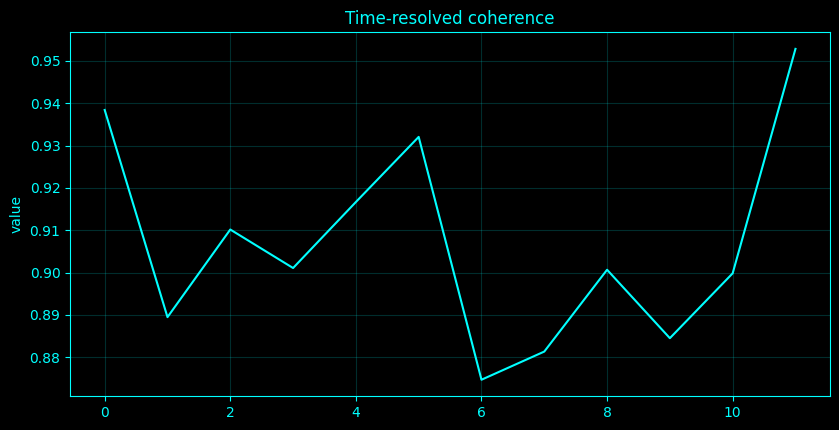

In [47]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_47():
    idx = 47
    name = 'Time-resolved coherence'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    Sxy = S[:, 0, 1]
    coh_complex = Sxy / np.sqrt(np.real(S[:, 0, 0]) * np.real(S[:, 1, 1]) + EPS)
    m = (f >= 8) & (f < 13)
    nwin = min(12, max(4, N // max(int(_fs * 2), 1)))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    vals = []
    for a0, b0 in zip(edges[:-1], edges[1:]):
        ff, cc = signal.coherence(X[a0:b0, 0], X[a0:b0, 1], fs=_fs, nperseg=min(128, b0 - a0))
        mm = (ff >= 8) & (ff < 13)
        vals.append(float(np.mean(cc[mm])) if np.any(mm) else np.nan)
    __plot_spec = ('summary', vals, name, None, '', 'value')
    return ({'alpha_coherence_trajectory': vals}, locals().get('__plot_spec', None))
    M = _coherence_matrix(BANDS['alpha'])
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_47,_plot_spec=_compute_method_47()
print('Time-resolved coherence')
if isinstance(result_47,dict):
    for _k,_v in result_47.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_47)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_47)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Time-resolved coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Time-resolved coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Time-resolved coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">48. Band-limited coherence networks</h3>
<p>A band-limited coherence network uses channels as nodes and band-averaged coherence as symmetric edge weights.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [48]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_48():
    idx = 48
    name = 'Band-limited coherence networks'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    Sxy = S[:, 0, 1]
    coh_complex = Sxy / np.sqrt(np.real(S[:, 0, 0]) * np.real(S[:, 1, 1]) + EPS)
    m = (f >= 8) & (f < 13)
    M = _coherence_matrix(BANDS['alpha'])
    __plot_spec = ('summary', M, name, None, '', 'value')
    return ({'mean_edge': float(np.mean(M[np.triu_indices(C, 1)]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_48,_plot_spec=_compute_method_48()
print('Band-limited coherence networks')
if isinstance(result_48,dict):
    for _k,_v in result_48.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_48)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_48)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Band-limited coherence networks',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Band-limited coherence networks',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Band-limited coherence networks',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Band-limited coherence networks
  mean_edge: 0.5759812854835551


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">49. Coherence threshold sweeps</h3>
<p>A threshold sweep varies the coherence cutoff and tracks resulting graph density, revealing whether network conclusions depend strongly on an arbitrary threshold.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Coherence threshold sweeps
  quantiles: array(10,), mean=0.725
  graph_density: array(10,), mean=0.280303


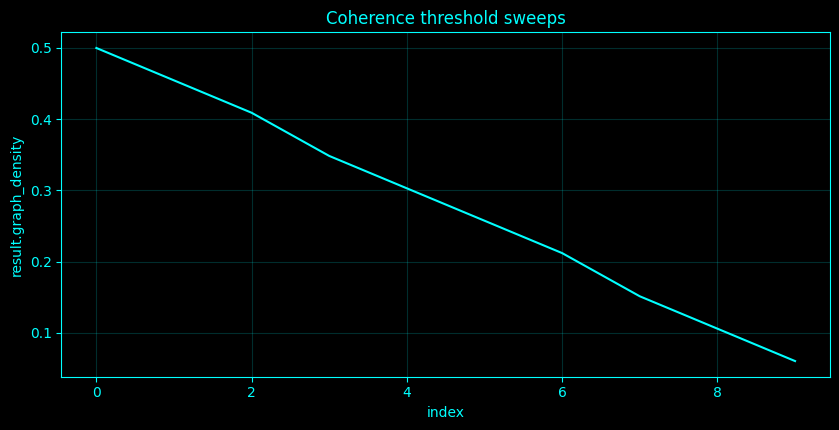

In [49]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_49():
    idx = 49
    name = 'Coherence threshold sweeps'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    Sxy = S[:, 0, 1]
    coh_complex = Sxy / np.sqrt(np.real(S[:, 0, 0]) * np.real(S[:, 1, 1]) + EPS)
    m = (f >= 8) & (f < 13)
    M = _coherence_matrix(BANDS['alpha'])
    vals = M[np.triu_indices(C, 1)]
    qs = np.linspace(0.5, 0.95, 10)
    dens = [float(np.mean(vals >= np.quantile(vals, q))) for q in qs]
    return ({'quantiles': qs.tolist(), 'graph_density': dens}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_49,_plot_spec=_compute_method_49()
print('Coherence threshold sweeps')
if isinstance(result_49,dict):
    for _k,_v in result_49.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_49)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_49)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Coherence threshold sweeps',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Coherence threshold sweeps',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Coherence threshold sweeps',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">50. Coherence graph spectra</h3>
<p>The coherence graph Laplacian is \(L=D-W\). Its eigenvalue spectrum summarizes connectivity scale and graph connectedness.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Coherence graph spectra
  lambda: array(12,), mean=6.33579
  lambda2: 5.08369744744264


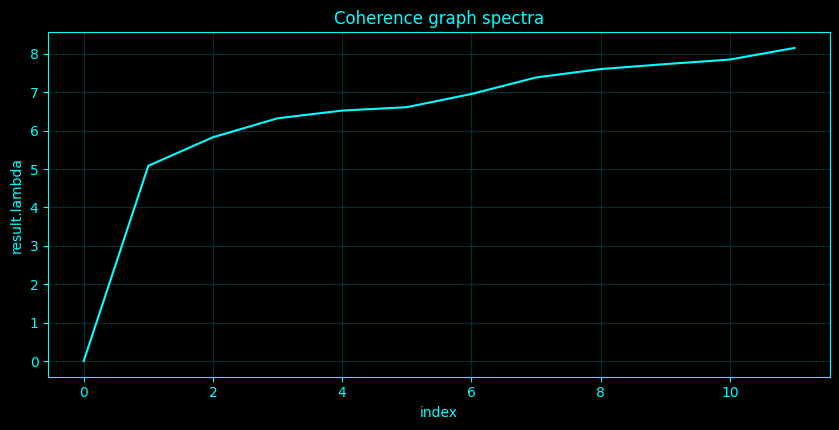

In [50]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_50():
    idx = 50
    name = 'Coherence graph spectra'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    Sxy = S[:, 0, 1]
    coh_complex = Sxy / np.sqrt(np.real(S[:, 0, 0]) * np.real(S[:, 1, 1]) + EPS)
    m = (f >= 8) & (f < 13)
    M = _coherence_matrix(BANDS['alpha'])
    A = M.copy()
    np.fill_diagonal(A, 0)
    L = np.diag(A.sum(1)) - A
    lam = np.linalg.eigvalsh(L)
    return ({'lambda': lam.tolist(), 'lambda2': float(lam[1]) if C > 1 else 0}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_50,_plot_spec=_compute_method_50()
print('Coherence graph spectra')
if isinstance(result_50,dict):
    for _k,_v in result_50.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_50)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_50)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Coherence graph spectra',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Coherence graph spectra',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Coherence graph spectra',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">51. Coherence community dynamics</h3>
<p>Coherence community dynamics recomputes thresholded coupling graphs across time windows and tracks their modular partitions.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Coherence community dynamics
  community_count_trajectory: array(6,), mean=4.83333


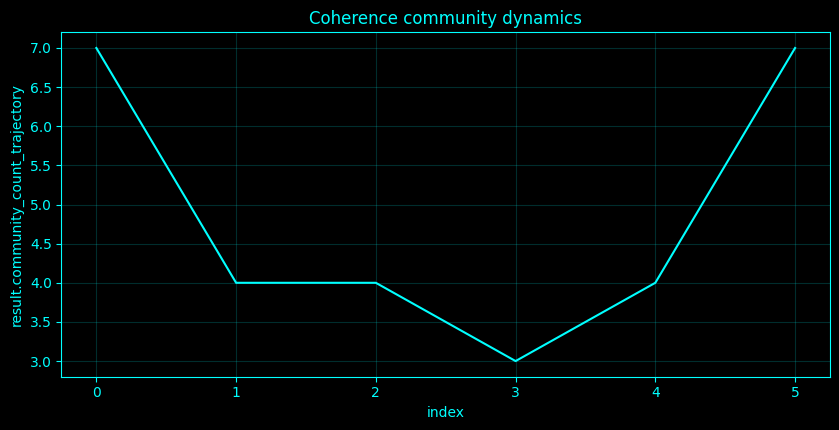

In [51]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _graph_from_matrix(M, quant=0.75):
    A = np.array(M, float, copy=True)
    np.fill_diagonal(A, 0)
    vals = A[np.triu_indices_from(A, 1)]
    th = np.nanquantile(vals, quant) if len(vals) else 0
    G = nx.Graph()
    G.add_nodes_from(range(len(A)))
    for i in range(len(A)):
        for j in range(i + 1, len(A)):
            if np.isfinite(A[i, j]) and A[i, j] >= th:
                G.add_edge(i, j, weight=float(A[i, j]), length=float(1 / (A[i, j] + EPS)))
    return G

def _bandpass_matrix(band):
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    return signal.sosfiltfilt(sos, X, axis=0)

def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_51():
    idx = 51
    name = 'Coherence community dynamics'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    Sxy = S[:, 0, 1]
    coh_complex = Sxy / np.sqrt(np.real(S[:, 0, 0]) * np.real(S[:, 1, 1]) + EPS)
    m = (f >= 8) & (f < 13)
    M = _coherence_matrix(BANDS['alpha'])
    nwin = min(6, max(3, N // max(int(_fs * 4), 1)))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    counts = []
    for a0, b0 in zip(edges[:-1], edges[1:]):
        R = np.corrcoef(_bandpass_matrix(BANDS['alpha'])[a0:b0], rowvar=False)
        G = _graph_from_matrix(np.abs(R), 0.75)
        comm = list(nx.community.greedy_modularity_communities(G, weight='weight')) if G.number_of_edges() else []
        counts.append(len(comm))
    return ({'community_count_trajectory': counts}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_51,_plot_spec=_compute_method_51()
print('Coherence community dynamics')
if isinstance(result_51,dict):
    for _k,_v in result_51.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_51)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_51)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Coherence community dynamics',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Coherence community dynamics',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Coherence community dynamics',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">52. Coherence source-sink asymmetry</h3>
<p>Magnitude-squared coherence is symmetric, \(C_{ij}=C_{ji}\); therefore source/sink direction is not identifiable from coherence alone. This cell explicitly verifies that its antisymmetric component is zero.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [52]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_52():
    idx = 52
    name = 'Coherence source-sink asymmetry'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    Sxy = S[:, 0, 1]
    coh_complex = Sxy / np.sqrt(np.real(S[:, 0, 0]) * np.real(S[:, 1, 1]) + EPS)
    m = (f >= 8) & (f < 13)
    M = _coherence_matrix(BANDS['alpha'])
    asym = M - M.T
    return ({'max_coherence_source_sink_asymmetry': float(np.max(np.abs(asym))), 'note': 'magnitude-squared coherence is symmetric, so source/sink direction is undefined'}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_52,_plot_spec=_compute_method_52()
print('Coherence source-sink asymmetry')
if isinstance(result_52,dict):
    for _k,_v in result_52.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_52)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_52)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Coherence source-sink asymmetry',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Coherence source-sink asymmetry',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Coherence source-sink asymmetry',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Coherence source-sink asymmetry
  max_coherence_source_sink_asymmetry: 0.0
  note: magnitude-squared coherence is symmetric, so source/sink direction is undefined


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">53. Coherence surrogate testing</h3>
<p>Coherence surrogate testing compares observed band coherence with phase-randomized null signals that preserve individual spectra but disrupt stable cross-channel phase relations.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Coherence surrogate testing
  observed: 0.9156869278883186
  surrogate_p: 0.1111111111111111


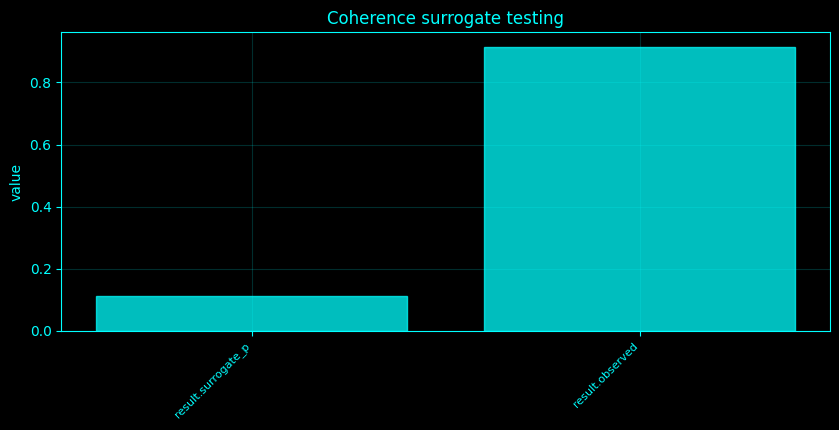

In [53]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _phase_randomize(x, rng):
    xf = np.fft.rfft(x, axis=0)
    ph = rng.uniform(0, 2 * np.pi, size=xf.shape)
    ph[0] = 0
    if x.shape[0] % 2 == 0:
        ph[-1] = 0
    return np.fft.irfft(np.abs(xf) * np.exp(1j * ph), n=x.shape[0], axis=0)

def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

# Method-specific calculation.
def _compute_method_53():
    idx = 53
    name = 'Coherence surrogate testing'
    __plot_spec = None
    f, S = _cross_spectral_matrix()
    Sxy = S[:, 0, 1]
    coh_complex = Sxy / np.sqrt(np.real(S[:, 0, 0]) * np.real(S[:, 1, 1]) + EPS)
    m = (f >= 8) & (f < 13)
    M = _coherence_matrix(BANDS['alpha'])
    obs = M[0, 1]
    null = []
    for _ in range(_SPEED['n_sur']):
        Surr = _phase_randomize(X[:, :2], _rng)
        ff, cc = signal.coherence(Surr[:, 0], Surr[:, 1], fs=_fs, nperseg=min(_SPEED['nperseg'], N))
        mm = (ff >= 8) & (ff < 13)
        null.append(float(np.mean(cc[mm])))
    return ({'observed': float(obs), 'surrogate_p': float((1 + np.sum(np.asarray(null) >= obs)) / (1 + len(null)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_53,_plot_spec=_compute_method_53()
print('Coherence surrogate testing')
if isinstance(result_53,dict):
    for _k,_v in result_53.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_53)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_53)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Coherence surrogate testing',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Coherence surrogate testing',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Coherence surrogate testing',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">54. Phase-locking value</h3>
<p>PLV is the resultant length \(|N^{-1}\sum_te^{i(\phi_x-\phi_y)}|\). It ranges from 0 for dispersed phase differences to 1 for a fixed phase relation.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [54]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _phase_pair(band=(8, 13), i=0, j=1):
    A = _analytic_band(band)
    d = np.angle(A[:, i]) - np.angle(A[:, j])
    return (d, A[:, i], A[:, j])

def _plv(d):
    return float(np.abs(np.mean(np.exp(1j * d))))

# Method-specific calculation.
def _compute_method_54():
    idx = 54
    name = 'Phase-locking value'
    __plot_spec = None
    d, z1, z2 = _phase_pair(BANDS['alpha'], 0, min(1, C - 1))
    return ({'PLV': _plv(d)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_54,_plot_spec=_compute_method_54()
print('Phase-locking value')
if isinstance(result_54,dict):
    for _k,_v in result_54.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_54)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_54)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Phase-locking value',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Phase-locking value',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Phase-locking value',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Phase-locking value
  PLV: 0.9066900048858567


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">55. Pairwise phase consistency</h3>
<p>Pairwise phase consistency removes PLV's leading sample-size bias: \(PPC=(|\sum z_t|^2-N)/[N(N-1)]\), \(z_t=e^{i\Delta\phi_t}\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [55]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _phase_pair(band=(8, 13), i=0, j=1):
    A = _analytic_band(band)
    d = np.angle(A[:, i]) - np.angle(A[:, j])
    return (d, A[:, i], A[:, j])

def _ppc(d):
    z = np.exp(1j * np.asarray(d))
    n = len(z)
    return float((np.abs(np.sum(z)) ** 2 - n) / (n * (n - 1) + EPS))

# Method-specific calculation.
def _compute_method_55():
    idx = 55
    name = 'Pairwise phase consistency'
    __plot_spec = None
    d, z1, z2 = _phase_pair(BANDS['alpha'], 0, min(1, C - 1))
    return ({'PPC': _ppc(d)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_55,_plot_spec=_compute_method_55()
print('Pairwise phase consistency')
if isinstance(result_55,dict):
    for _k,_v in result_55.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_55)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_55)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Pairwise phase consistency',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Pairwise phase consistency',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Pairwise phase consistency',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Pairwise phase consistency
  PPC: 0.8220734550747468


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">56. Phase-lag index</h3>
<p>Phase-lag index is \(\mathrm{PLI}=|E[\operatorname{sign}(\sin\Delta\phi)]|\), emphasizing consistent nonzero-lag phase sign.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [56]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _phase_pair(band=(8, 13), i=0, j=1):
    A = _analytic_band(band)
    d = np.angle(A[:, i]) - np.angle(A[:, j])
    return (d, A[:, i], A[:, j])

def _pli(d):
    return float(np.abs(np.mean(np.sign(np.sin(d)))))

# Method-specific calculation.
def _compute_method_56():
    idx = 56
    name = 'Phase-lag index'
    __plot_spec = None
    d, z1, z2 = _phase_pair(BANDS['alpha'], 0, min(1, C - 1))
    return ({'PLI': _pli(d)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_56,_plot_spec=_compute_method_56()
print('Phase-lag index')
if isinstance(result_56,dict):
    for _k,_v in result_56.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_56)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_56)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Phase-lag index',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Phase-lag index',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Phase-lag index',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Phase-lag index
  PLI: 0.03665469778575703


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">57. Weighted phase-lag index</h3>
<p>Weighted PLI is \(|E[\Im Z]|/E[|\Im Z|]\) for complex cross-products \(Z\), weighting observations by imaginary cross-spectral magnitude.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [57]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _phase_pair(band=(8, 13), i=0, j=1):
    A = _analytic_band(band)
    d = np.angle(A[:, i]) - np.angle(A[:, j])
    return (d, A[:, i], A[:, j])

def _wpli(d, z1=None, z2=None, debiased=False):
    if z1 is None:
        im = np.sin(d)
    else:
        im = np.imag(z1 * np.conj(z2))
    if debiased:
        num = np.sum(im) ** 2 - np.sum(im ** 2)
        den = np.sum(np.abs(im)) ** 2 - np.sum(im ** 2)
        return float(max(0, num / (den + EPS)))
    return float(np.abs(np.mean(im)) / (np.mean(np.abs(im)) + EPS))

# Method-specific calculation.
def _compute_method_57():
    idx = 57
    name = 'Weighted phase-lag index'
    __plot_spec = None
    d, z1, z2 = _phase_pair(BANDS['alpha'], 0, min(1, C - 1))
    return ({'wPLI': _wpli(d, z1, z2)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_57,_plot_spec=_compute_method_57()
print('Weighted phase-lag index')
if isinstance(result_57,dict):
    for _k,_v in result_57.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_57)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_57)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Weighted phase-lag index',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Weighted phase-lag index',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Weighted phase-lag index',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Weighted phase-lag index
  wPLI: 0.07245091147527129


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">58. Debiased weighted phase-lag index</h3>
<p>Debiased squared wPLI removes the diagonal/self-product bias: \([(\sum I)^2-\sum I^2]/[(\sum|I|)^2-\sum I^2]\), where \(I=\Im Z\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [58]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _phase_pair(band=(8, 13), i=0, j=1):
    A = _analytic_band(band)
    d = np.angle(A[:, i]) - np.angle(A[:, j])
    return (d, A[:, i], A[:, j])

def _wpli(d, z1=None, z2=None, debiased=False):
    if z1 is None:
        im = np.sin(d)
    else:
        im = np.imag(z1 * np.conj(z2))
    if debiased:
        num = np.sum(im) ** 2 - np.sum(im ** 2)
        den = np.sum(np.abs(im)) ** 2 - np.sum(im ** 2)
        return float(max(0, num / (den + EPS)))
    return float(np.abs(np.mean(im)) / (np.mean(np.abs(im)) + EPS))

# Method-specific calculation.
def _compute_method_58():
    idx = 58
    name = 'Debiased weighted phase-lag index'
    __plot_spec = None
    d, z1, z2 = _phase_pair(BANDS['alpha'], 0, min(1, C - 1))
    return ({'debiased_wPLI_squared': _wpli(d, z1, z2, True)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_58,_plot_spec=_compute_method_58()
print('Debiased weighted phase-lag index')
if isinstance(result_58,dict):
    for _k,_v in result_58.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_58)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_58)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Debiased weighted phase-lag index',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Debiased weighted phase-lag index',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Debiased weighted phase-lag index',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Debiased weighted phase-lag index
  debiased_wPLI_squared: 0.0


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">59. Imaginary phase-locking value</h3>
<p>Imaginary PLV reports \(|\Im E[e^{i\Delta\phi}]|\), the nonzero-lag component of the phase-difference resultant.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [59]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _phase_pair(band=(8, 13), i=0, j=1):
    A = _analytic_band(band)
    d = np.angle(A[:, i]) - np.angle(A[:, j])
    return (d, A[:, i], A[:, j])

# Method-specific calculation.
def _compute_method_59():
    idx = 59
    name = 'Imaginary phase-locking value'
    __plot_spec = None
    d, z1, z2 = _phase_pair(BANDS['alpha'], 0, min(1, C - 1))
    return ({'imaginary_PLV': float(np.abs(np.imag(np.mean(np.exp(1j * d)))))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_59,_plot_spec=_compute_method_59()
print('Imaginary phase-locking value')
if isinstance(result_59,dict):
    for _k,_v in result_59.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_59)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_59)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Imaginary phase-locking value',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Imaginary phase-locking value',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Imaginary phase-locking value',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Imaginary phase-locking value
  imaginary_PLV: 0.007079784744607911


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">60. Inter-site phase clustering</h3>
<p>Inter-site phase clustering is the same circular resultant-length statistic as PLV, \(|E[e^{i\Delta\phi}]|\); the cell states this equivalence explicitly.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [60]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _phase_pair(band=(8, 13), i=0, j=1):
    A = _analytic_band(band)
    d = np.angle(A[:, i]) - np.angle(A[:, j])
    return (d, A[:, i], A[:, j])

def _plv(d):
    return float(np.abs(np.mean(np.exp(1j * d))))

# Method-specific calculation.
def _compute_method_60():
    idx = 60
    name = 'Inter-site phase clustering'
    __plot_spec = None
    d, z1, z2 = _phase_pair(BANDS['alpha'], 0, min(1, C - 1))
    return ({'inter_site_phase_clustering': _plv(d), 'note': 'ISPC and PLV use the same resultant-length statistic'}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_60,_plot_spec=_compute_method_60()
print('Inter-site phase clustering')
if isinstance(result_60,dict):
    for _k,_v in result_60.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_60)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_60)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Inter-site phase clustering',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Inter-site phase clustering',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Inter-site phase clustering',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Inter-site phase clustering
  inter_site_phase_clustering: 0.9066900048858567
  note: ISPC and PLV use the same resultant-length statistic


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">61. Phase-slope index</h3>
<p>Phase-slope index exploits the frequency derivative of coherency phase: \(\Psi=\sum_f\Im[C^\ast(f)C(f+\Delta f)]\). Its sign indicates lead/lag direction under the PSI convention.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [61]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

def _phase_pair(band=(8, 13), i=0, j=1):
    A = _analytic_band(band)
    d = np.angle(A[:, i]) - np.angle(A[:, j])
    return (d, A[:, i], A[:, j])

def _psi_pair(i=0, j=1):
    f, S = _cross_spectral_matrix()
    Sxy = S[:, i, j]
    coh = Sxy / np.sqrt(np.real(S[:, i, i]) * np.real(S[:, j, j]) + EPS)
    psi = np.imag(np.conj(coh[:-1]) * coh[1:])
    return (f[1:], psi)

# Method-specific calculation.
def _compute_method_61():
    idx = 61
    name = 'Phase-slope index'
    __plot_spec = None
    d, z1, z2 = _phase_pair(BANDS['alpha'], 0, min(1, C - 1))
    ff, psi = _psi_pair()
    mm = (ff >= 8) & (ff < 13)
    v = float(np.sum(psi[mm]))
    return ({'PSI': v if idx == 62 else abs(v), 'direction_sign': np.sign(v) if idx == 62 else None}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_61,_plot_spec=_compute_method_61()
print('Phase-slope index')
if isinstance(result_61,dict):
    for _k,_v in result_61.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_61)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_61)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Phase-slope index',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Phase-slope index',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Phase-slope index',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Phase-slope index
  PSI: 0.015698503969248545
  direction_sign: None


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">62. Directed phase-slope index</h3>
<p>Phase-slope index exploits the frequency derivative of coherency phase: \(\Psi=\sum_f\Im[C^\ast(f)C(f+\Delta f)]\). Its sign indicates lead/lag direction under the PSI convention.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Directed phase-slope index
  PSI: -0.015698503969248545
  direction_sign: -1.0


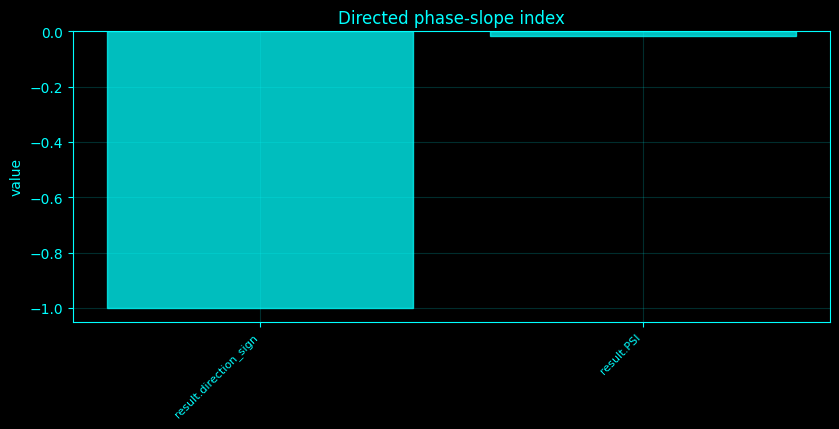

In [62]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

def _phase_pair(band=(8, 13), i=0, j=1):
    A = _analytic_band(band)
    d = np.angle(A[:, i]) - np.angle(A[:, j])
    return (d, A[:, i], A[:, j])

def _psi_pair(i=0, j=1):
    f, S = _cross_spectral_matrix()
    Sxy = S[:, i, j]
    coh = Sxy / np.sqrt(np.real(S[:, i, i]) * np.real(S[:, j, j]) + EPS)
    psi = np.imag(np.conj(coh[:-1]) * coh[1:])
    return (f[1:], psi)

# Method-specific calculation.
def _compute_method_62():
    idx = 62
    name = 'Directed phase-slope index'
    __plot_spec = None
    d, z1, z2 = _phase_pair(BANDS['alpha'], 0, min(1, C - 1))
    ff, psi = _psi_pair()
    mm = (ff >= 8) & (ff < 13)
    v = float(np.sum(psi[mm]))
    return ({'PSI': v if idx == 62 else abs(v), 'direction_sign': np.sign(v) if idx == 62 else None}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_62,_plot_spec=_compute_method_62()
print('Directed phase-slope index')
if isinstance(result_62,dict):
    for _k,_v in result_62.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_62)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_62)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Directed phase-slope index',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Directed phase-slope index',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Directed phase-slope index',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">63. Frequency-resolved phase-slope maps</h3>
<p>Phase-slope index exploits the frequency derivative of coherency phase: \(\Psi=\sum_f\Im[C^\ast(f)C(f+\Delta f)]\). Its sign indicates lead/lag direction under the PSI convention.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [63]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

def _phase_pair(band=(8, 13), i=0, j=1):
    A = _analytic_band(band)
    d = np.angle(A[:, i]) - np.angle(A[:, j])
    return (d, A[:, i], A[:, j])

def _psi_pair(i=0, j=1):
    f, S = _cross_spectral_matrix()
    Sxy = S[:, i, j]
    coh = Sxy / np.sqrt(np.real(S[:, i, i]) * np.real(S[:, j, j]) + EPS)
    psi = np.imag(np.conj(coh[:-1]) * coh[1:])
    return (f[1:], psi)

# Method-specific calculation.
def _compute_method_63():
    idx = 63
    name = 'Frequency-resolved phase-slope maps'
    __plot_spec = None
    d, z1, z2 = _phase_pair(BANDS['alpha'], 0, min(1, C - 1))
    M = np.zeros((C, C))
    for i in range(C):
        for j in range(i + 1, C):
            ff, psi = _psi_pair(i, j)
            mm = (ff >= 8) & (ff < 13)
            v = float(np.sum(psi[mm]))
            M[i, j] = v
            M[j, i] = -v
    __plot_spec = ('summary', M, name, None, '', 'value')
    return ({'max_abs_PSI': float(np.max(np.abs(M)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_63,_plot_spec=_compute_method_63()
print('Frequency-resolved phase-slope maps')
if isinstance(result_63,dict):
    for _k,_v in result_63.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_63)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_63)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Frequency-resolved phase-slope maps',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Frequency-resolved phase-slope maps',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Frequency-resolved phase-slope maps',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Frequency-resolved phase-slope maps
  max_abs_PSI: 0.24887057631257092


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">64. Time-resolved PLV</h3>
<p>Time-resolved PLV evaluates the same circular resultant in successive windows.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Time-resolved PLV
  PLV_trajectory: array(20,), mean=0.908383


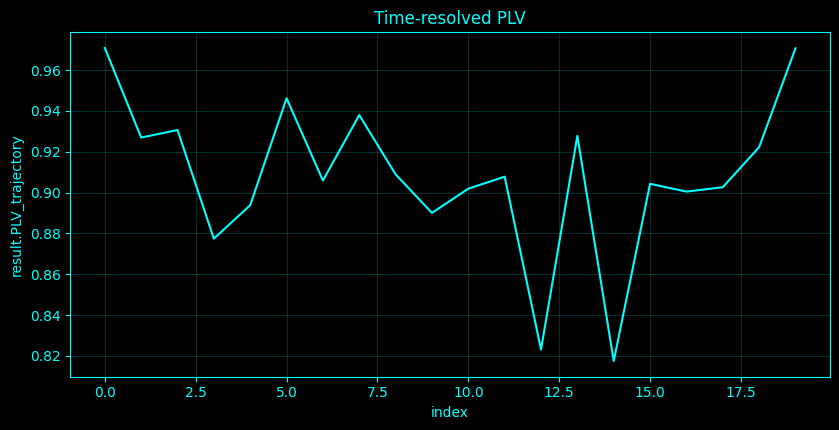

In [64]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _phase_pair(band=(8, 13), i=0, j=1):
    A = _analytic_band(band)
    d = np.angle(A[:, i]) - np.angle(A[:, j])
    return (d, A[:, i], A[:, j])

def _plv(d):
    return float(np.abs(np.mean(np.exp(1j * d))))

# Method-specific calculation.
def _compute_method_64():
    idx = 64
    name = 'Time-resolved PLV'
    __plot_spec = None
    d, z1, z2 = _phase_pair(BANDS['alpha'], 0, min(1, C - 1))
    ph = np.angle(_analytic_band(BANDS['alpha']))
    nwin = min(20, max(5, N // max(int(_fs), 1)))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    vals = []
    for a0, b0 in zip(edges[:-1], edges[1:]):
        vals.append(_plv(ph[a0:b0, 0] - ph[a0:b0, 1]))
    return ({'PLV_trajectory': vals}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_64,_plot_spec=_compute_method_64()
print('Time-resolved PLV')
if isinstance(result_64,dict):
    for _k,_v in result_64.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_64)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_64)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Time-resolved PLV',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Time-resolved PLV',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Time-resolved PLV',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">65. Band-limited PLV networks</h3>
<p>A band-limited PLV network uses pairwise PLV as symmetric edge weight between channels.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [65]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _phase_pair(band=(8, 13), i=0, j=1):
    A = _analytic_band(band)
    d = np.angle(A[:, i]) - np.angle(A[:, j])
    return (d, A[:, i], A[:, j])

# Method-specific calculation.
def _compute_method_65():
    idx = 65
    name = 'Band-limited PLV networks'
    __plot_spec = None
    d, z1, z2 = _phase_pair(BANDS['alpha'], 0, min(1, C - 1))
    M = _coherence_matrix(BANDS['alpha'], phase=True)
    __plot_spec = ('summary', M, name, None, '', 'value')
    return ({'mean_PPV': float(np.mean(M[np.triu_indices(C, 1)]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_65,_plot_spec=_compute_method_65()
print('Band-limited PLV networks')
if isinstance(result_65,dict):
    for _k,_v in result_65.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_65)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_65)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Band-limited PLV networks',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Band-limited PLV networks',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Band-limited PLV networks',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Band-limited PLV networks
  mean_PPV: 0.650445128868172


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">66. Phase-synchrony graph spectra</h3>
<p>Phase-synchrony graph spectra are the Laplacian eigenvalues of the PLV-weighted network.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Phase-synchrony graph spectra
  lambda: array(12,), mean=7.1549


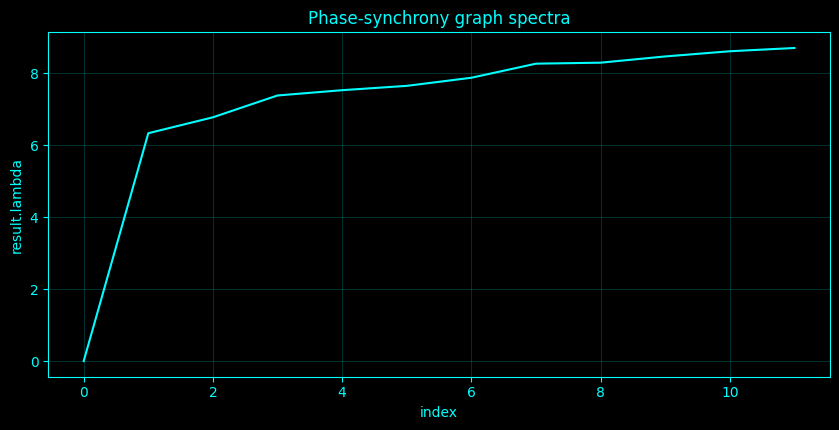

In [66]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _phase_pair(band=(8, 13), i=0, j=1):
    A = _analytic_band(band)
    d = np.angle(A[:, i]) - np.angle(A[:, j])
    return (d, A[:, i], A[:, j])

# Method-specific calculation.
def _compute_method_66():
    idx = 66
    name = 'Phase-synchrony graph spectra'
    __plot_spec = None
    d, z1, z2 = _phase_pair(BANDS['alpha'], 0, min(1, C - 1))
    M = _coherence_matrix(BANDS['alpha'], phase=True)
    np.fill_diagonal(M, 0)
    L = np.diag(M.sum(1)) - M
    lam = np.linalg.eigvalsh(L)
    return ({'lambda': lam.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_66,_plot_spec=_compute_method_66()
print('Phase-synchrony graph spectra')
if isinstance(result_66,dict):
    for _k,_v in result_66.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_66)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_66)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Phase-synchrony graph spectra',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Phase-synchrony graph spectra',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Phase-synchrony graph spectra',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">67. Phase-synchrony surrogate testing</h3>
<p>PLV surrogate testing circularly shifts one analytic signal relative to the other, preserving each marginal oscillation while breaking persistent alignment.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Phase-synchrony surrogate testing
  observed: 0.9066900048858567
  surrogate_p: 0.1111111111111111


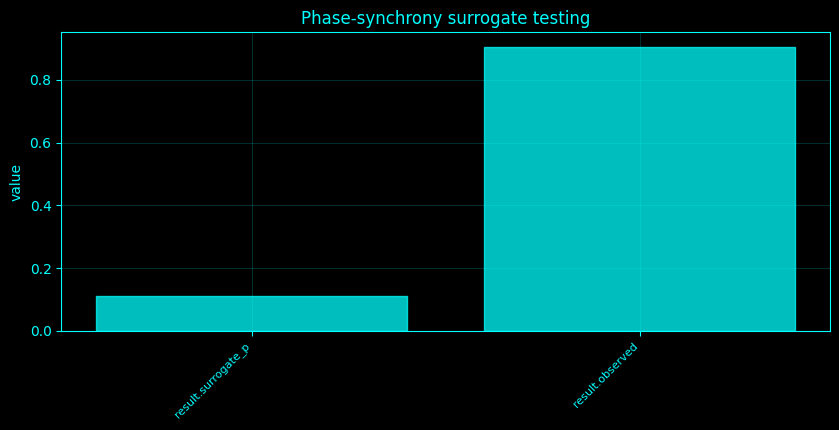

In [67]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _phase_pair(band=(8, 13), i=0, j=1):
    A = _analytic_band(band)
    d = np.angle(A[:, i]) - np.angle(A[:, j])
    return (d, A[:, i], A[:, j])

def _plv(d):
    return float(np.abs(np.mean(np.exp(1j * d))))

# Method-specific calculation.
def _compute_method_67():
    idx = 67
    name = 'Phase-synchrony surrogate testing'
    __plot_spec = None
    d, z1, z2 = _phase_pair(BANDS['alpha'], 0, min(1, C - 1))
    obs = _plv(d)
    null = []
    for _ in range(_SPEED['n_sur']):
        shift = int(_rng.integers(max(1, int(0.2 * _fs)), max(2, N - int(0.2 * _fs))))
        dd = np.angle(z1) - np.angle(np.roll(z2, shift))
        null.append(_plv(dd))
    return ({'observed': obs, 'surrogate_p': float((1 + np.sum(np.asarray(null) >= obs)) / (1 + len(null)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_67,_plot_spec=_compute_method_67()
print('Phase-synchrony surrogate testing')
if isinstance(result_67,dict):
    for _k,_v in result_67.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_67)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_67)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Phase-synchrony surrogate testing',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Phase-synchrony surrogate testing',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Phase-synchrony surrogate testing',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">68. Cross-frequency coupling modulation index</h3>
<p>Tort modulation index bins high-frequency amplitude by low-frequency phase, normalizes the bin means to probabilities \(p_k\), and computes \(\mathrm{MI}=D_{KL}(p\|u)/\log K\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [68]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _pac_tort(ch=0, phase_band=(4, 8), amp_band=(30, 45), nbins=18):
    p = np.angle(_analytic_band(phase_band)[:, ch])
    a = np.abs(_analytic_band(amp_band)[:, ch])
    edges = np.linspace(-np.pi, np.pi, nbins + 1)
    q = np.array([np.mean(a[(p >= edges[k]) & (p < edges[k + 1])]) for k in range(nbins)])
    q = np.nan_to_num(q, nan=0.0)
    q = q / (q.sum() + EPS)
    u = np.ones(nbins) / nbins
    return float(np.sum(q * np.log((q + EPS) / u)) / np.log(nbins))

# Method-specific calculation.
def _compute_method_68():
    idx = 68
    name = 'Cross-frequency coupling modulation index'
    __plot_spec = None
    return ({'Tort_modulation_index': _pac_tort()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_68,_plot_spec=_compute_method_68()
print('Cross-frequency coupling modulation index')
if isinstance(result_68,dict):
    for _k,_v in result_68.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_68)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_68)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Cross-frequency coupling modulation index',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Cross-frequency coupling modulation index',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Cross-frequency coupling modulation index',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Cross-frequency coupling modulation index
  Tort_modulation_index: 0.014531283403541095


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">69. Tort phase-amplitude coupling</h3>
<p>Tort modulation index bins high-frequency amplitude by low-frequency phase, normalizes the bin means to probabilities \(p_k\), and computes \(\mathrm{MI}=D_{KL}(p\|u)/\log K\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [69]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _pac_tort(ch=0, phase_band=(4, 8), amp_band=(30, 45), nbins=18):
    p = np.angle(_analytic_band(phase_band)[:, ch])
    a = np.abs(_analytic_band(amp_band)[:, ch])
    edges = np.linspace(-np.pi, np.pi, nbins + 1)
    q = np.array([np.mean(a[(p >= edges[k]) & (p < edges[k + 1])]) for k in range(nbins)])
    q = np.nan_to_num(q, nan=0.0)
    q = q / (q.sum() + EPS)
    u = np.ones(nbins) / nbins
    return float(np.sum(q * np.log((q + EPS) / u)) / np.log(nbins))

# Method-specific calculation.
def _compute_method_69():
    idx = 69
    name = 'Tort phase-amplitude coupling'
    __plot_spec = None
    return ({'Tort_modulation_index': _pac_tort()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_69,_plot_spec=_compute_method_69()
print('Tort phase-amplitude coupling')
if isinstance(result_69,dict):
    for _k,_v in result_69.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_69)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_69)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Tort phase-amplitude coupling',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Tort phase-amplitude coupling',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Tort phase-amplitude coupling',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Tort phase-amplitude coupling
  Tort_modulation_index: 0.014531283403541095


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">70. Canolty phase-amplitude coupling</h3>
<p>Canolty PAC uses the complex composite \(A_H(t)e^{i\phi_L(t)}\); the magnitude of its time average is large when high-frequency amplitude prefers a low-frequency phase.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [70]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

# Method-specific calculation.
def _compute_method_70():
    idx = 70
    name = 'Canolty phase-amplitude coupling'
    __plot_spec = None
    p = np.angle(_analytic_band(BANDS['theta'])[:, 0])
    a = np.abs(_analytic_band(BANDS['gamma'])[:, 0])
    v = np.abs(np.mean(a * np.exp(1j * p)))
    return ({'Canolty_complex_vector_magnitude': float(v)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_70,_plot_spec=_compute_method_70()
print('Canolty phase-amplitude coupling')
if isinstance(result_70,dict):
    for _k,_v in result_70.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_70)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_70)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Canolty phase-amplitude coupling',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Canolty phase-amplitude coupling',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Canolty phase-amplitude coupling',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Canolty phase-amplitude coupling
  Canolty_complex_vector_magnitude: 0.009108077186147466


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">71. Mean-vector-length PAC</h3>
<p>Mean-vector-length PAC normalizes the Canolty vector by mean high-frequency amplitude, making the statistic dimensionless.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [71]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _pac_mvl(ch=0, phase_band=(4, 8), amp_band=(30, 45)):
    p = np.angle(_analytic_band(phase_band)[:, ch])
    a = np.abs(_analytic_band(amp_band)[:, ch])
    return float(np.abs(np.mean(a * np.exp(1j * p))) / (np.mean(a) + EPS))

# Method-specific calculation.
def _compute_method_71():
    idx = 71
    name = 'Mean-vector-length PAC'
    __plot_spec = None
    return ({'normalized_mean_vector_length': _pac_mvl()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_71,_plot_spec=_compute_method_71()
print('Mean-vector-length PAC')
if isinstance(result_71,dict):
    for _k,_v in result_71.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_71)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_71)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Mean-vector-length PAC',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Mean-vector-length PAC',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Mean-vector-length PAC',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Mean-vector-length PAC
  normalized_mean_vector_length: 0.18893690834484422


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">72. General linear model PAC</h3>
<p>GLM PAC regresses high-frequency amplitude on \(\sin\phi_L\) and \(\cos\phi_L\). The reported \(R^2\) quantifies phase-explained amplitude variance.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [72]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _pac_glm(ch=0, phase_band=(4, 8), amp_band=(30, 45)):
    p = np.angle(_analytic_band(phase_band)[:, ch])
    a = np.abs(_analytic_band(amp_band)[:, ch])
    Z = np.column_stack([np.ones(len(p)), np.sin(p), np.cos(p)])
    b = np.linalg.lstsq(Z, a, rcond=None)[0]
    pred = Z @ b
    r2 = 1 - np.sum((a - pred) ** 2) / (np.sum((a - np.mean(a)) ** 2) + EPS)
    return float(max(0, r2))

# Method-specific calculation.
def _compute_method_72():
    idx = 72
    name = 'General linear model PAC'
    __plot_spec = None
    return ({'GLM_R2': _pac_glm()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_72,_plot_spec=_compute_method_72()
print('General linear model PAC')
if isinstance(result_72,dict):
    for _k,_v in result_72.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_72)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_72)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'General linear model PAC',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'General linear model PAC',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('General linear model PAC',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


General linear model PAC
  GLM_R2: 0.0006989637781775748


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">73. Event-locked PAC</h3>
<p>Event-locked PAC estimates PAC in windows centered on supplied event indices. Without supplied events, the notebook labels internally detected amplitude peaks as a demonstration rather than stimulus markers.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [73]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _event_indices():
    if 'SPECTRAL_EVENT_INDICES' in globals():
        e = np.asarray(globals()['SPECTRAL_EVENT_INDICES'], int)
        return e[(e > int(_fs)) & (e < N - int(_fs))]
    env = np.mean(np.abs(_analytic_band(BANDS['alpha'])), axis=1)
    dist = max(1, int(_fs))
    p, _ = signal.find_peaks(env, distance=dist, prominence=np.std(env) * 0.5)
    return p

# Method-specific calculation.
def _compute_method_73():
    idx = 73
    name = 'Event-locked PAC'
    __plot_spec = None
    ev = _event_indices()
    vals = []
    half = int(0.75 * _fs)
    for e in ev:
        if e - half >= 0 and e + half < N:
            p = np.angle(_analytic_band(BANDS['theta'])[e - half:e + half, 0])
            a = np.abs(_analytic_band(BANDS['gamma'])[e - half:e + half, 0])
            vals.append(float(np.abs(np.mean(a * np.exp(1j * p))) / (np.mean(a) + EPS)))
    return ({'event_count': len(vals), 'event_locked_PAC_mean': float(np.mean(vals)) if vals else np.nan, 'events': 'supplied' if 'SPECTRAL_EVENT_INDICES' in globals() else 'internal demonstration'}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_73,_plot_spec=_compute_method_73()
print('Event-locked PAC')
if isinstance(result_73,dict):
    for _k,_v in result_73.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_73)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_73)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Event-locked PAC',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Event-locked PAC',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Event-locked PAC',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Event-locked PAC
  event_count: 0
  event_locked_PAC_mean: nan
  events: internal demonstration


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">74. Time-resolved PAC</h3>
<p>Time-resolved PAC recomputes a normalized complex-vector PAC statistic in successive windows.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Time-resolved PAC
  PAC_trajectory: array(20,), mean=0.315646


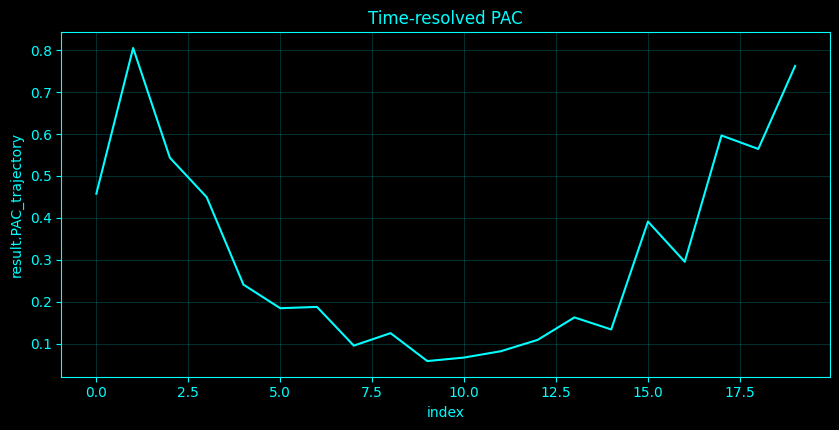

In [74]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

# Method-specific calculation.
def _compute_method_74():
    idx = 74
    name = 'Time-resolved PAC'
    __plot_spec = None
    p = np.angle(_analytic_band(BANDS['theta'])[:, 0])
    a = np.abs(_analytic_band(BANDS['gamma'])[:, 0])
    nwin = min(20, max(5, N // max(int(_fs), 1)))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    vals = []
    for s, e in zip(edges[:-1], edges[1:]):
        vals.append(float(np.abs(np.mean(a[s:e] * np.exp(1j * p[s:e]))) / (np.mean(a[s:e]) + EPS)))
    return ({'PAC_trajectory': vals}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_74,_plot_spec=_compute_method_74()
print('Time-resolved PAC')
if isinstance(result_74,dict):
    for _k,_v in result_74.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_74)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_74)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Time-resolved PAC',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Time-resolved PAC',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Time-resolved PAC',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">75. Band-by-band PAC comodulograms</h3>
<p>A PAC comodulogram evaluates the same modulation index over a grid of phase-frequency and amplitude-frequency bands.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Band-by-band PAC comodulograms
  comodulogram: array(3, 3), mean=0.024049


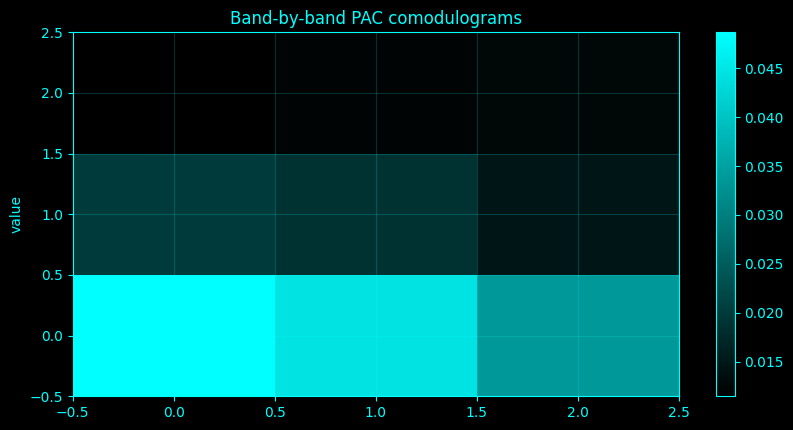

In [75]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _pac_tort(ch=0, phase_band=(4, 8), amp_band=(30, 45), nbins=18):
    p = np.angle(_analytic_band(phase_band)[:, ch])
    a = np.abs(_analytic_band(amp_band)[:, ch])
    edges = np.linspace(-np.pi, np.pi, nbins + 1)
    q = np.array([np.mean(a[(p >= edges[k]) & (p < edges[k + 1])]) for k in range(nbins)])
    q = np.nan_to_num(q, nan=0.0)
    q = q / (q.sum() + EPS)
    u = np.ones(nbins) / nbins
    return float(np.sum(q * np.log((q + EPS) / u)) / np.log(nbins))

# Method-specific calculation.
def _compute_method_75():
    idx = 75
    name = 'Band-by-band PAC comodulograms'
    __plot_spec = None
    phase_bands = [(2, 4), (4, 8), (8, 13)]
    amp_bands = [(13, 20), (20, 30), (30, min(45, 0.45 * _fs))]
    M = np.zeros((len(phase_bands), len(amp_bands)))
    for i, pb in enumerate(phase_bands):
        for j, ab in enumerate(amp_bands):
            if ab[0] < ab[1]:
                M[i, j] = _pac_tort(0, pb, ab)
    __plot_spec = ('summary', M, name, None, '', 'value')
    return ({'comodulogram': M}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_75,_plot_spec=_compute_method_75()
print('Band-by-band PAC comodulograms')
if isinstance(result_75,dict):
    for _k,_v in result_75.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_75)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_75)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Band-by-band PAC comodulograms',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Band-by-band PAC comodulograms',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Band-by-band PAC comodulograms',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">76. Phase-phase coupling</h3>
<p>For \(n:m\) phase locking, \(R_{n:m}=|\langle e^{i(n\phi_1-m\phi_2)}\rangle|\). Phase-phase coupling is therefore tested without amplitude information.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [76]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

# Method-specific calculation.
def _compute_method_76():
    idx = 76
    name = 'Phase-phase coupling'
    __plot_spec = None
    pa = np.angle(_analytic_band(BANDS['theta'])[:, 0])
    pb = np.angle(_analytic_band(BANDS['alpha'])[:, 0])
    return ({'2_to_1_phase_phase_locking': float(np.abs(np.mean(np.exp(1j * (2 * pa - pb)))))}, locals().get('__plot_spec', None))
    vals = {}
    for n, m0 in [(1, 1), (2, 1), (3, 2)]:
        vals[f'{n}:{m0}'] = float(np.abs(np.mean(np.exp(1j * (n * pa - m0 * pb)))))
    return (vals, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_76,_plot_spec=_compute_method_76()
print('Phase-phase coupling')
if isinstance(result_76,dict):
    for _k,_v in result_76.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_76)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_76)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Phase-phase coupling',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Phase-phase coupling',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Phase-phase coupling',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Phase-phase coupling
  2_to_1_phase_phase_locking: 0.06062385557838901


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">77. n:m phase locking</h3>
<p>For \(n:m\) phase locking, \(R_{n:m}=|\langle e^{i(n\phi_1-m\phi_2)}\rangle|\). Phase-phase coupling is therefore tested without amplitude information.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

n:m phase locking
  1:1: 0.1332580119110501
  2:1: 0.06062385557838901
  3:2: 0.027938968138244983


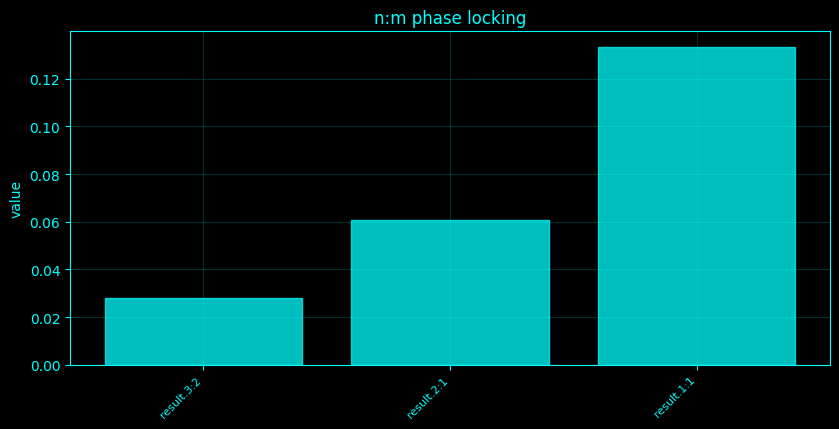

In [77]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

# Method-specific calculation.
def _compute_method_77():
    idx = 77
    name = 'n:m phase locking'
    __plot_spec = None
    pa = np.angle(_analytic_band(BANDS['theta'])[:, 0])
    pb = np.angle(_analytic_band(BANDS['alpha'])[:, 0])
    vals = {}
    for n, m0 in [(1, 1), (2, 1), (3, 2)]:
        vals[f'{n}:{m0}'] = float(np.abs(np.mean(np.exp(1j * (n * pa - m0 * pb)))))
    return (vals, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_77,_plot_spec=_compute_method_77()
print('n:m phase locking')
if isinstance(result_77,dict):
    for _k,_v in result_77.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_77)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_77)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'n:m phase locking',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'n:m phase locking',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('n:m phase locking',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">78. Amplitude-amplitude coupling</h3>
<p>Amplitude-amplitude coupling is the correlation between narrow-band analytic envelopes, measuring co-fluctuation of oscillatory amplitudes.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [78]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

# Method-specific calculation.
def _compute_method_78():
    idx = 78
    name = 'Amplitude-amplitude coupling'
    __plot_spec = None
    a = np.abs(_analytic_band(BANDS['alpha'])[:, 0])
    b = np.abs(_analytic_band(BANDS['beta'])[:, min(1, C - 1)])
    return ({'amplitude_correlation': float(np.corrcoef(a, b)[0, 1])}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_78,_plot_spec=_compute_method_78()
print('Amplitude-amplitude coupling')
if isinstance(result_78,dict):
    for _k,_v in result_78.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_78)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_78)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Amplitude-amplitude coupling',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Amplitude-amplitude coupling',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Amplitude-amplitude coupling',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Amplitude-amplitude coupling
  amplitude_correlation: 0.7896182297748991


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">79. Cross-frequency coherence</h3>
<p>Cross-frequency coherence here compares a low-frequency oscillatory signal with the high-frequency amplitude envelope, so coherence is evaluated at the envelope's modulation frequencies rather than between unequal carrier frequencies.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [79]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

# Method-specific calculation.
def _compute_method_79():
    idx = 79
    name = 'Cross-frequency coherence'
    __plot_spec = None
    low = np.real(_analytic_band(BANDS['theta'])[:, 0])
    env = np.abs(_analytic_band(BANDS['gamma'])[:, min(1, C - 1)])
    ff, cc = signal.coherence(low, env, fs=_fs, nperseg=min(_SPEED['nperseg'], N))
    return ({'max_cross_frequency_coherence': float(np.max(cc[(ff >= 1) & (ff <= 15)]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_79,_plot_spec=_compute_method_79()
print('Cross-frequency coherence')
if isinstance(result_79,dict):
    for _k,_v in result_79.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_79)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_79)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Cross-frequency coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Cross-frequency coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Cross-frequency coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Cross-frequency coherence
  max_cross_frequency_coherence: 0.09402325802127375


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">80. Cross-bispectral coupling</h3>
<p>Cross-bispectral coupling detects quadratic frequency interactions through \(B(f_1,f_2)=E[X(f_1)Y(f_2)Z^\ast(f_1+f_2)]\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [80]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _bispectrum(channel=0, nper=None):
    y = X[:, channel]
    n = min(int(nper or 256), len(y))
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    seg = []
    for a in range(0, len(y) - n + 1, step):
        seg.append(np.fft.rfft((y[a:a + n] - np.mean(y[a:a + n])) * win))
    F = np.asarray(seg)
    f = np.fft.rfftfreq(n, 1 / _fs)
    nf = len(f)
    limit = min(nf, 64)
    B = np.zeros((limit, limit), complex)
    den = np.zeros((limit, limit), float)
    for i in range(limit):
        maxj = min(limit, nf - i)
        if maxj <= 0:
            continue
        prod = F[:, i, None] * F[:, :maxj] * np.conj(F[:, i:i + maxj])
        for j in range(maxj):
            k = i + j
            if k < nf:
                z = F[:, i] * F[:, j] * np.conj(F[:, k])
                B[i, j] = np.mean(z)
                den[i, j] = np.sqrt(np.mean(np.abs(F[:, i] * F[:, j]) ** 2) * np.mean(np.abs(F[:, k]) ** 2)) + EPS
    bic = np.abs(B) / den
    return (f[:limit], B, bic, F)

# Method-specific calculation.
def _compute_method_80():
    idx = 80
    name = 'Cross-bispectral coupling'
    __plot_spec = None
    fb, B, bic, F = _bispectrum()
    return ({'max_cross_bispectral_coupling': float(np.nanmax(bic))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_80,_plot_spec=_compute_method_80()
print('Cross-bispectral coupling')
if isinstance(result_80,dict):
    for _k,_v in result_80.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_80)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_80)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Cross-bispectral coupling',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Cross-bispectral coupling',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Cross-bispectral coupling',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Cross-bispectral coupling
  max_cross_bispectral_coupling: 0.899585789513127


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">81. Cross-frequency directionality</h3>
<p>Cross-frequency directionality is reported as the lag of maximal cross-correlation between low-frequency activity and a high-frequency envelope. This is a temporal lead/lag proxy, not causal identification.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [81]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

# Method-specific calculation.
def _compute_method_81():
    idx = 81
    name = 'Cross-frequency directionality'
    __plot_spec = None
    low = np.real(_analytic_band(BANDS['theta'])[:, 0])
    env = np.abs(_analytic_band(BANDS['gamma'])[:, min(1, C - 1)])
    xc = signal.correlate((env - env.mean()) / env.std(), (low - low.mean()) / low.std(), mode='full', method='fft')
    lags = signal.correlation_lags(len(env), len(low)) / _fs
    mm = np.abs(lags) <= 1
    lag = float(lags[mm][np.argmax(np.abs(xc[mm]))])
    return ({'peak_lag_s': lag, 'note': 'lagged cross-frequency dependence, not a causal identification'}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_81,_plot_spec=_compute_method_81()
print('Cross-frequency directionality')
if isinstance(result_81,dict):
    for _k,_v in result_81.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_81)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_81)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Cross-frequency directionality',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Cross-frequency directionality',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Cross-frequency directionality',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Cross-frequency directionality
  peak_lag_s: -0.016
  note: lagged cross-frequency dependence, not a causal identification


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">82. PAC surrogate testing</h3>
<p>PAC surrogate testing circularly shifts the amplitude envelope relative to phase, preserving within-band temporal structure while destroying their alignment.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

PAC surrogate testing
  observed: 0.014531283403541095
  surrogate_p: 0.8888888888888888


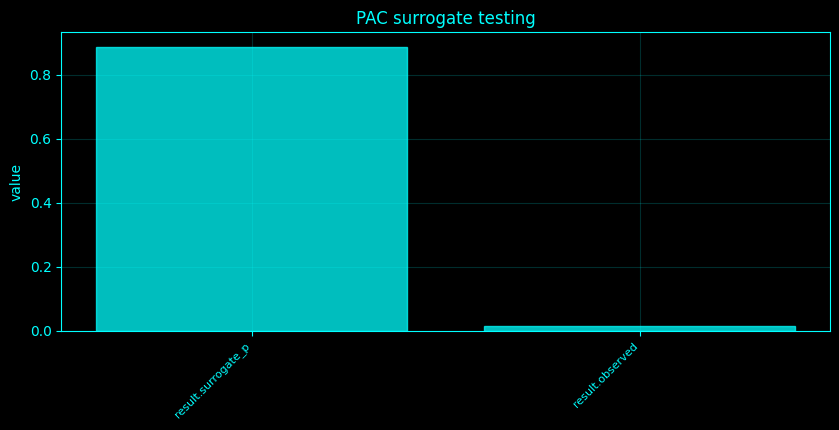

In [82]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _pac_tort(ch=0, phase_band=(4, 8), amp_band=(30, 45), nbins=18):
    p = np.angle(_analytic_band(phase_band)[:, ch])
    a = np.abs(_analytic_band(amp_band)[:, ch])
    edges = np.linspace(-np.pi, np.pi, nbins + 1)
    q = np.array([np.mean(a[(p >= edges[k]) & (p < edges[k + 1])]) for k in range(nbins)])
    q = np.nan_to_num(q, nan=0.0)
    q = q / (q.sum() + EPS)
    u = np.ones(nbins) / nbins
    return float(np.sum(q * np.log((q + EPS) / u)) / np.log(nbins))

# Method-specific calculation.
def _compute_method_82():
    idx = 82
    name = 'PAC surrogate testing'
    __plot_spec = None
    obs = _pac_tort()
    null = []
    amp = np.abs(_analytic_band(BANDS['gamma'])[:, 0])
    phase = np.angle(_analytic_band(BANDS['theta'])[:, 0])
    edges = np.linspace(-np.pi, np.pi, 19)
    for _ in range(_SPEED['n_sur']):
        sh = int(_rng.integers(int(0.2 * _fs), max(int(0.2 * _fs) + 1, N - int(0.2 * _fs))))
        a = np.roll(amp, sh)
        q = np.array([np.mean(a[(phase >= edges[k]) & (phase < edges[k + 1])]) for k in range(18)])
        q = np.nan_to_num(q)
        q /= q.sum() + EPS
        null.append(float(np.sum(q * np.log((q + EPS) / (1 / 18))) / np.log(18)))
    return ({'observed': obs, 'surrogate_p': float((1 + np.sum(np.asarray(null) >= obs)) / (1 + len(null)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_82,_plot_spec=_compute_method_82()
print('PAC surrogate testing')
if isinstance(result_82,dict):
    for _k,_v in result_82.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_82)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_82)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'PAC surrogate testing',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'PAC surrogate testing',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('PAC surrogate testing',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">83. PAC regional asymmetry</h3>
<p>PAC regional asymmetry compares channel-level PAC averages over left and right sensor groups.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [83]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _pac_mvl(ch=0, phase_band=(4, 8), amp_band=(30, 45)):
    p = np.angle(_analytic_band(phase_band)[:, ch])
    a = np.abs(_analytic_band(amp_band)[:, ch])
    return float(np.abs(np.mean(a * np.exp(1j * p))) / (np.mean(a) + EPS))

# Method-specific calculation.
def _compute_method_83():
    idx = 83
    name = 'PAC regional asymmetry'
    __plot_spec = None
    vals = np.array([_pac_mvl(j) for j in range(C)])
    left = [CH_NAMES.index(ch) for ch in LEFT if ch in CH_NAMES]
    right = [CH_NAMES.index(ch) for ch in RIGHT if ch in CH_NAMES]
    return ({'left_minus_right_PAC': float(np.mean(vals[left]) - np.mean(vals[right])) if left and right else np.nan}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_83,_plot_spec=_compute_method_83()
print('PAC regional asymmetry')
if isinstance(result_83,dict):
    for _k,_v in result_83.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_83)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_83)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'PAC regional asymmetry',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'PAC regional asymmetry',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('PAC regional asymmetry',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


PAC regional asymmetry
  left_minus_right_PAC: -0.005876496915370996


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">84. PAC source-target analysis</h3>
<p>PAC source-target analysis uses low-frequency phase from each source channel and high-frequency amplitude from each target channel, producing a directed phase-source/amplitude-target matrix.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [84]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

# Method-specific calculation.
def _compute_method_84():
    idx = 84
    name = 'PAC source-target analysis'
    __plot_spec = None
    M = np.zeros((C, C))
    ph = np.angle(_analytic_band(BANDS['theta']))
    amp = np.abs(_analytic_band(BANDS['gamma']))
    for i in range(C):
        for j in range(C):
            M[i, j] = np.abs(np.mean(amp[:, j] * np.exp(1j * ph[:, i]))) / (np.mean(amp[:, j]) + EPS)
    __plot_spec = ('summary', M, name, None, '', 'value')
    return ({'strongest_source_target_PAC': float(np.max(M))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_84,_plot_spec=_compute_method_84()
print('PAC source-target analysis')
if isinstance(result_84,dict):
    for _k,_v in result_84.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_84)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_84)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'PAC source-target analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'PAC source-target analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('PAC source-target analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


PAC source-target analysis
  strongest_source_target_PAC: 0.22965937369798162


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">85. Bispectrum</h3>
<p>The bispectrum is \(B(f_1,f_2)=E[X(f_1)X(f_2)X^\ast(f_1+f_2)]\), a third-order spectrum sensitive to quadratic phase coupling.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [85]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _bispectrum(channel=0, nper=None):
    y = X[:, channel]
    n = min(int(nper or 256), len(y))
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    seg = []
    for a in range(0, len(y) - n + 1, step):
        seg.append(np.fft.rfft((y[a:a + n] - np.mean(y[a:a + n])) * win))
    F = np.asarray(seg)
    f = np.fft.rfftfreq(n, 1 / _fs)
    nf = len(f)
    limit = min(nf, 64)
    B = np.zeros((limit, limit), complex)
    den = np.zeros((limit, limit), float)
    for i in range(limit):
        maxj = min(limit, nf - i)
        if maxj <= 0:
            continue
        prod = F[:, i, None] * F[:, :maxj] * np.conj(F[:, i:i + maxj])
        for j in range(maxj):
            k = i + j
            if k < nf:
                z = F[:, i] * F[:, j] * np.conj(F[:, k])
                B[i, j] = np.mean(z)
                den[i, j] = np.sqrt(np.mean(np.abs(F[:, i] * F[:, j]) ** 2) * np.mean(np.abs(F[:, k]) ** 2)) + EPS
    bic = np.abs(B) / den
    return (f[:limit], B, bic, F)

# Method-specific calculation.
def _compute_method_85():
    idx = 85
    name = 'Bispectrum'
    __plot_spec = None
    fb, B, bic, F = _bispectrum(0)
    __plot_spec = ('summary', np.abs(B), name, None, '', 'value')
    return ({'max_abs_bispectrum': float(np.max(np.abs(B)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_85,_plot_spec=_compute_method_85()
print('Bispectrum')
if isinstance(result_85,dict):
    for _k,_v in result_85.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_85)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_85)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bispectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bispectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bispectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Bispectrum
  max_abs_bispectrum: 1670.5380973370404


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">86. Bicoherence</h3>
<p>Bicoherence normalizes the bispectrum by second moments so the magnitude is bounded approximately by one: \(|B|/\sqrt{E|X(f_1)X(f_2)|^2\,E|X(f_1+f_2)|^2}\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [86]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _bispectrum(channel=0, nper=None):
    y = X[:, channel]
    n = min(int(nper or 256), len(y))
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    seg = []
    for a in range(0, len(y) - n + 1, step):
        seg.append(np.fft.rfft((y[a:a + n] - np.mean(y[a:a + n])) * win))
    F = np.asarray(seg)
    f = np.fft.rfftfreq(n, 1 / _fs)
    nf = len(f)
    limit = min(nf, 64)
    B = np.zeros((limit, limit), complex)
    den = np.zeros((limit, limit), float)
    for i in range(limit):
        maxj = min(limit, nf - i)
        if maxj <= 0:
            continue
        prod = F[:, i, None] * F[:, :maxj] * np.conj(F[:, i:i + maxj])
        for j in range(maxj):
            k = i + j
            if k < nf:
                z = F[:, i] * F[:, j] * np.conj(F[:, k])
                B[i, j] = np.mean(z)
                den[i, j] = np.sqrt(np.mean(np.abs(F[:, i] * F[:, j]) ** 2) * np.mean(np.abs(F[:, k]) ** 2)) + EPS
    bic = np.abs(B) / den
    return (f[:limit], B, bic, F)

# Method-specific calculation.
def _compute_method_86():
    idx = 86
    name = 'Bicoherence'
    __plot_spec = None
    fb, B, bic, F = _bispectrum(0)
    __plot_spec = ('summary', bic, name, None, '', 'value')
    return ({'max_bicoherence': float(np.nanmax(bic))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_86,_plot_spec=_compute_method_86()
print('Bicoherence')
if isinstance(result_86,dict):
    for _k,_v in result_86.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_86)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_86)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bicoherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bicoherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bicoherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Bicoherence
  max_bicoherence: 0.899585789513127


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">87. Cross-bispectrum</h3>
<p>The cross-bispectrum replaces one or more Fourier factors with another channel, testing cross-channel quadratic coupling.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [87]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _bispectrum(channel=0, nper=None):
    y = X[:, channel]
    n = min(int(nper or 256), len(y))
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    seg = []
    for a in range(0, len(y) - n + 1, step):
        seg.append(np.fft.rfft((y[a:a + n] - np.mean(y[a:a + n])) * win))
    F = np.asarray(seg)
    f = np.fft.rfftfreq(n, 1 / _fs)
    nf = len(f)
    limit = min(nf, 64)
    B = np.zeros((limit, limit), complex)
    den = np.zeros((limit, limit), float)
    for i in range(limit):
        maxj = min(limit, nf - i)
        if maxj <= 0:
            continue
        prod = F[:, i, None] * F[:, :maxj] * np.conj(F[:, i:i + maxj])
        for j in range(maxj):
            k = i + j
            if k < nf:
                z = F[:, i] * F[:, j] * np.conj(F[:, k])
                B[i, j] = np.mean(z)
                den[i, j] = np.sqrt(np.mean(np.abs(F[:, i] * F[:, j]) ** 2) * np.mean(np.abs(F[:, k]) ** 2)) + EPS
    bic = np.abs(B) / den
    return (f[:limit], B, bic, F)

# Method-specific calculation.
def _compute_method_87():
    idx = 87
    name = 'Cross-bispectrum'
    __plot_spec = None
    fb, B, bic, F = _bispectrum(0)
    n = min(256, N)
    step = n // 2
    win = signal.windows.hann(n)
    segs = []
    for a in range(0, N - n + 1, step):
        segs.append(np.fft.rfft(X[a:a + n, :2] * win[:, None], axis=0))
    FF = np.asarray(segs)
    limit = min(48, FF.shape[1])
    Bc = np.zeros((limit, limit), complex)
    for i in range(limit):
        for j in range(min(limit, FF.shape[1] - i)):
            Bc[i, j] = np.mean(FF[:, i, 0] * FF[:, j, 1] * np.conj(FF[:, i + j, 0]))
    return ({'max_cross_bispectrum': float(np.max(np.abs(Bc)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_87,_plot_spec=_compute_method_87()
print('Cross-bispectrum')
if isinstance(result_87,dict):
    for _k,_v in result_87.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_87)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_87)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Cross-bispectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Cross-bispectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Cross-bispectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Cross-bispectrum
  max_cross_bispectrum: 16217.816416396527


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">88. Trispectrum</h3>
<p>A trispectral slice evaluates a fourth-order frequency interaction such as \(E[X(f_1)X(f_2)X(f_3)X^\ast(f_1+f_2+f_3)]\). The notebook reports a computationally bounded diagonal slice and labels it as such.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [88]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _bispectrum(channel=0, nper=None):
    y = X[:, channel]
    n = min(int(nper or 256), len(y))
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    seg = []
    for a in range(0, len(y) - n + 1, step):
        seg.append(np.fft.rfft((y[a:a + n] - np.mean(y[a:a + n])) * win))
    F = np.asarray(seg)
    f = np.fft.rfftfreq(n, 1 / _fs)
    nf = len(f)
    limit = min(nf, 64)
    B = np.zeros((limit, limit), complex)
    den = np.zeros((limit, limit), float)
    for i in range(limit):
        maxj = min(limit, nf - i)
        if maxj <= 0:
            continue
        prod = F[:, i, None] * F[:, :maxj] * np.conj(F[:, i:i + maxj])
        for j in range(maxj):
            k = i + j
            if k < nf:
                z = F[:, i] * F[:, j] * np.conj(F[:, k])
                B[i, j] = np.mean(z)
                den[i, j] = np.sqrt(np.mean(np.abs(F[:, i] * F[:, j]) ** 2) * np.mean(np.abs(F[:, k]) ** 2)) + EPS
    bic = np.abs(B) / den
    return (f[:limit], B, bic, F)

# Method-specific calculation.
def _compute_method_88():
    idx = 88
    name = 'Trispectrum'
    __plot_spec = None
    fb, B, bic, F = _bispectrum(0)
    limit = min(32, F.shape[1] // 3)
    T = np.array([np.mean(F[:, i] ** 3 * np.conj(F[:, 3 * i])) for i in range(1, limit)])
    return ({'max_trispectral_slice': float(np.max(np.abs(T))) if len(T) else np.nan, 'note': 'diagonal fourth-order spectral slice'}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_88,_plot_spec=_compute_method_88()
print('Trispectrum')
if isinstance(result_88,dict):
    for _k,_v in result_88.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_88)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_88)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Trispectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Trispectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Trispectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Trispectrum
  max_trispectral_slice: 47511.11974721696
  note: diagonal fourth-order spectral slice


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">89. Higher-order spectral analysis</h3>
<p>Higher-order spectral analysis summarizes normalized bispectral and trispectral coupling rather than relying only on second-order PSD/coherence.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Higher-order spectral analysis
  mean_bicoherence: 0.18102638879444852
  max_bicoherence: 0.899585789513127


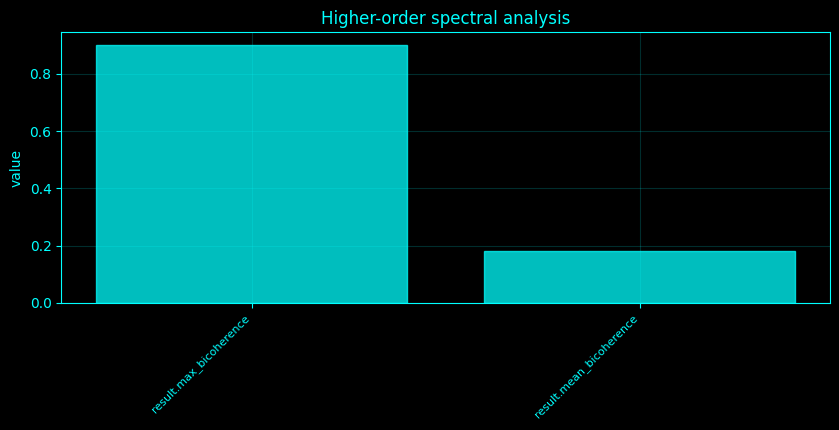

In [89]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _bispectrum(channel=0, nper=None):
    y = X[:, channel]
    n = min(int(nper or 256), len(y))
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    seg = []
    for a in range(0, len(y) - n + 1, step):
        seg.append(np.fft.rfft((y[a:a + n] - np.mean(y[a:a + n])) * win))
    F = np.asarray(seg)
    f = np.fft.rfftfreq(n, 1 / _fs)
    nf = len(f)
    limit = min(nf, 64)
    B = np.zeros((limit, limit), complex)
    den = np.zeros((limit, limit), float)
    for i in range(limit):
        maxj = min(limit, nf - i)
        if maxj <= 0:
            continue
        prod = F[:, i, None] * F[:, :maxj] * np.conj(F[:, i:i + maxj])
        for j in range(maxj):
            k = i + j
            if k < nf:
                z = F[:, i] * F[:, j] * np.conj(F[:, k])
                B[i, j] = np.mean(z)
                den[i, j] = np.sqrt(np.mean(np.abs(F[:, i] * F[:, j]) ** 2) * np.mean(np.abs(F[:, k]) ** 2)) + EPS
    bic = np.abs(B) / den
    return (f[:limit], B, bic, F)

# Method-specific calculation.
def _compute_method_89():
    idx = 89
    name = 'Higher-order spectral analysis'
    __plot_spec = None
    fb, B, bic, F = _bispectrum(0)
    return ({'mean_bicoherence': float(np.nanmean(bic)), 'max_bicoherence': float(np.nanmax(bic))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_89,_plot_spec=_compute_method_89()
print('Higher-order spectral analysis')
if isinstance(result_89,dict):
    for _k,_v in result_89.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_89)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_89)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Higher-order spectral analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Higher-order spectral analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Higher-order spectral analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">90. Quadratic phase coupling</h3>
<p>Quadratic phase coupling is strongest where bicoherence peaks, because stable relation \(\phi(f_1)+\phi(f_2)-\phi(f_1+f_2)\) makes the bispectral average coherent.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Quadratic phase coupling
  f1_hz: 1.953125
  f2_hz: 1.953125
  max_bicoherence: 0.899585789513127


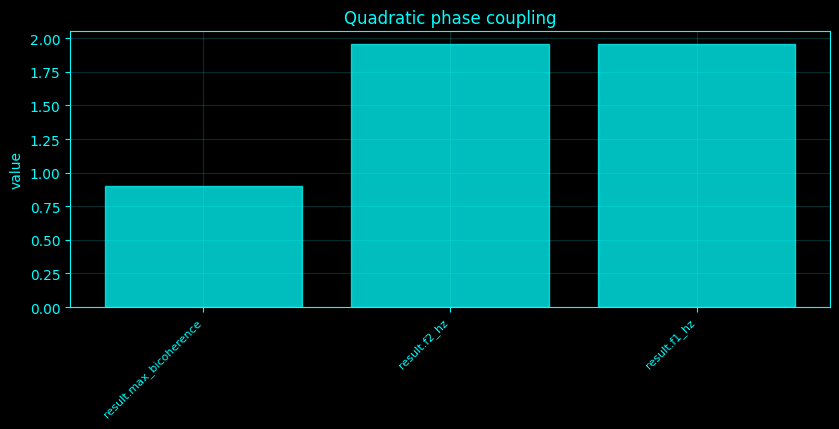

In [90]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _bispectrum(channel=0, nper=None):
    y = X[:, channel]
    n = min(int(nper or 256), len(y))
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    seg = []
    for a in range(0, len(y) - n + 1, step):
        seg.append(np.fft.rfft((y[a:a + n] - np.mean(y[a:a + n])) * win))
    F = np.asarray(seg)
    f = np.fft.rfftfreq(n, 1 / _fs)
    nf = len(f)
    limit = min(nf, 64)
    B = np.zeros((limit, limit), complex)
    den = np.zeros((limit, limit), float)
    for i in range(limit):
        maxj = min(limit, nf - i)
        if maxj <= 0:
            continue
        prod = F[:, i, None] * F[:, :maxj] * np.conj(F[:, i:i + maxj])
        for j in range(maxj):
            k = i + j
            if k < nf:
                z = F[:, i] * F[:, j] * np.conj(F[:, k])
                B[i, j] = np.mean(z)
                den[i, j] = np.sqrt(np.mean(np.abs(F[:, i] * F[:, j]) ** 2) * np.mean(np.abs(F[:, k]) ** 2)) + EPS
    bic = np.abs(B) / den
    return (f[:limit], B, bic, F)

# Method-specific calculation.
def _compute_method_90():
    idx = 90
    name = 'Quadratic phase coupling'
    __plot_spec = None
    fb, B, bic, F = _bispectrum(0)
    ij = np.unravel_index(np.nanargmax(bic), bic.shape)
    return ({'f1_hz': float(fb[ij[0]]), 'f2_hz': float(fb[ij[1]]), 'max_bicoherence': float(bic[ij])}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_90,_plot_spec=_compute_method_90()
print('Quadratic phase coupling')
if isinstance(result_90,dict):
    for _k,_v in result_90.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_90)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_90)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Quadratic phase coupling',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Quadratic phase coupling',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Quadratic phase coupling',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">91. Third-order cumulant spectrum</h3>
<p>The third-order cumulant surface and bispectrum are two-dimensional Fourier-transform pairs; inverse 2-D Fourier transform of the estimated bispectrum yields the corresponding lag-domain third-order structure.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [91]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _bispectrum(channel=0, nper=None):
    y = X[:, channel]
    n = min(int(nper or 256), len(y))
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    seg = []
    for a in range(0, len(y) - n + 1, step):
        seg.append(np.fft.rfft((y[a:a + n] - np.mean(y[a:a + n])) * win))
    F = np.asarray(seg)
    f = np.fft.rfftfreq(n, 1 / _fs)
    nf = len(f)
    limit = min(nf, 64)
    B = np.zeros((limit, limit), complex)
    den = np.zeros((limit, limit), float)
    for i in range(limit):
        maxj = min(limit, nf - i)
        if maxj <= 0:
            continue
        prod = F[:, i, None] * F[:, :maxj] * np.conj(F[:, i:i + maxj])
        for j in range(maxj):
            k = i + j
            if k < nf:
                z = F[:, i] * F[:, j] * np.conj(F[:, k])
                B[i, j] = np.mean(z)
                den[i, j] = np.sqrt(np.mean(np.abs(F[:, i] * F[:, j]) ** 2) * np.mean(np.abs(F[:, k]) ** 2)) + EPS
    bic = np.abs(B) / den
    return (f[:limit], B, bic, F)

# Method-specific calculation.
def _compute_method_91():
    idx = 91
    name = 'Third-order cumulant spectrum'
    __plot_spec = None
    fb, B, bic, F = _bispectrum(0)
    c3 = np.fft.ifft2(B)
    return ({'max_abs_third_order_cumulant': float(np.max(np.abs(c3)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_91,_plot_spec=_compute_method_91()
print('Third-order cumulant spectrum')
if isinstance(result_91,dict):
    for _k,_v in result_91.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_91)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_91)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Third-order cumulant spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Third-order cumulant spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Third-order cumulant spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Third-order cumulant spectrum
  max_abs_third_order_cumulant: 14.114251914128857


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">92. Fourth-order cumulant spectrum</h3>
<p>A trispectral slice evaluates a fourth-order frequency interaction such as \(E[X(f_1)X(f_2)X(f_3)X^\ast(f_1+f_2+f_3)]\). The notebook reports a computationally bounded diagonal slice and labels it as such.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [92]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _bispectrum(channel=0, nper=None):
    y = X[:, channel]
    n = min(int(nper or 256), len(y))
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    seg = []
    for a in range(0, len(y) - n + 1, step):
        seg.append(np.fft.rfft((y[a:a + n] - np.mean(y[a:a + n])) * win))
    F = np.asarray(seg)
    f = np.fft.rfftfreq(n, 1 / _fs)
    nf = len(f)
    limit = min(nf, 64)
    B = np.zeros((limit, limit), complex)
    den = np.zeros((limit, limit), float)
    for i in range(limit):
        maxj = min(limit, nf - i)
        if maxj <= 0:
            continue
        prod = F[:, i, None] * F[:, :maxj] * np.conj(F[:, i:i + maxj])
        for j in range(maxj):
            k = i + j
            if k < nf:
                z = F[:, i] * F[:, j] * np.conj(F[:, k])
                B[i, j] = np.mean(z)
                den[i, j] = np.sqrt(np.mean(np.abs(F[:, i] * F[:, j]) ** 2) * np.mean(np.abs(F[:, k]) ** 2)) + EPS
    bic = np.abs(B) / den
    return (f[:limit], B, bic, F)

# Method-specific calculation.
def _compute_method_92():
    idx = 92
    name = 'Fourth-order cumulant spectrum'
    __plot_spec = None
    fb, B, bic, F = _bispectrum(0)
    limit = min(32, F.shape[1] // 3)
    T = np.array([np.mean(F[:, i] ** 3 * np.conj(F[:, 3 * i])) for i in range(1, limit)])
    return ({'max_trispectral_slice': float(np.max(np.abs(T))) if len(T) else np.nan, 'note': 'diagonal fourth-order spectral slice'}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_92,_plot_spec=_compute_method_92()
print('Fourth-order cumulant spectrum')
if isinstance(result_92,dict):
    for _k,_v in result_92.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_92)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_92)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Fourth-order cumulant spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Fourth-order cumulant spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Fourth-order cumulant spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Fourth-order cumulant spectrum
  max_trispectral_slice: 47511.11974721696
  note: diagonal fourth-order spectral slice


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">93. Polyspectral entropy</h3>
<p>Polyspectral entropy normalizes bispectral energy \(q_{ij}=|B_{ij}|^2/\sum|B|^2\) and computes \(-\sum q_{ij}\log q_{ij}\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Polyspectral entropy
  bispectral_entropy: 3.938348921519001
  normalized: 0.4734863715304884


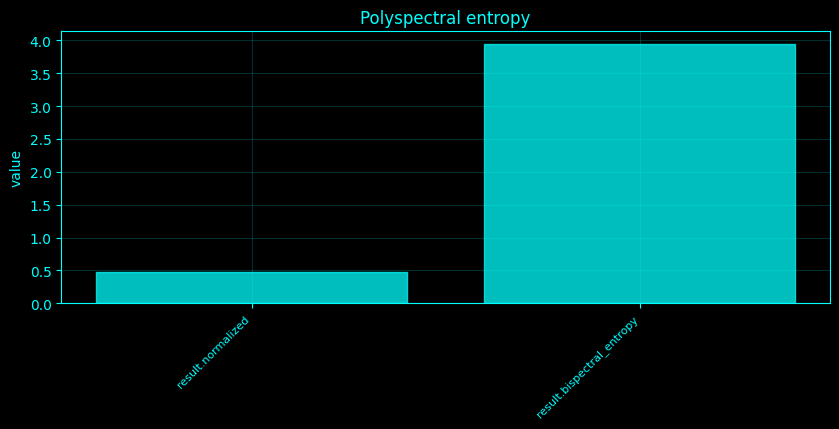

In [93]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _bispectrum(channel=0, nper=None):
    y = X[:, channel]
    n = min(int(nper or 256), len(y))
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    seg = []
    for a in range(0, len(y) - n + 1, step):
        seg.append(np.fft.rfft((y[a:a + n] - np.mean(y[a:a + n])) * win))
    F = np.asarray(seg)
    f = np.fft.rfftfreq(n, 1 / _fs)
    nf = len(f)
    limit = min(nf, 64)
    B = np.zeros((limit, limit), complex)
    den = np.zeros((limit, limit), float)
    for i in range(limit):
        maxj = min(limit, nf - i)
        if maxj <= 0:
            continue
        prod = F[:, i, None] * F[:, :maxj] * np.conj(F[:, i:i + maxj])
        for j in range(maxj):
            k = i + j
            if k < nf:
                z = F[:, i] * F[:, j] * np.conj(F[:, k])
                B[i, j] = np.mean(z)
                den[i, j] = np.sqrt(np.mean(np.abs(F[:, i] * F[:, j]) ** 2) * np.mean(np.abs(F[:, k]) ** 2)) + EPS
    bic = np.abs(B) / den
    return (f[:limit], B, bic, F)

# Method-specific calculation.
def _compute_method_93():
    idx = 93
    name = 'Polyspectral entropy'
    __plot_spec = None
    fb, B, bic, F = _bispectrum(0)
    q = np.abs(B) ** 2
    q = q / (q.sum() + EPS)
    H = -np.sum(q * np.log(q + EPS))
    return ({'bispectral_entropy': float(H), 'normalized': float(H / np.log(q.size))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_93,_plot_spec=_compute_method_93()
print('Polyspectral entropy')
if isinstance(result_93,dict):
    for _k,_v in result_93.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_93)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_93)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Polyspectral entropy',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Polyspectral entropy',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Polyspectral entropy',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">94. Bispectral phase synchrony</h3>
<p>Bispectral phase synchrony is \(|E[e^{i(\phi_{f_1}+\phi_{f_2}-\phi_{f_1+f_2})}]|\), directly measuring stability of the quadratic phase relation.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [94]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _bispectrum(channel=0, nper=None):
    y = X[:, channel]
    n = min(int(nper or 256), len(y))
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    seg = []
    for a in range(0, len(y) - n + 1, step):
        seg.append(np.fft.rfft((y[a:a + n] - np.mean(y[a:a + n])) * win))
    F = np.asarray(seg)
    f = np.fft.rfftfreq(n, 1 / _fs)
    nf = len(f)
    limit = min(nf, 64)
    B = np.zeros((limit, limit), complex)
    den = np.zeros((limit, limit), float)
    for i in range(limit):
        maxj = min(limit, nf - i)
        if maxj <= 0:
            continue
        prod = F[:, i, None] * F[:, :maxj] * np.conj(F[:, i:i + maxj])
        for j in range(maxj):
            k = i + j
            if k < nf:
                z = F[:, i] * F[:, j] * np.conj(F[:, k])
                B[i, j] = np.mean(z)
                den[i, j] = np.sqrt(np.mean(np.abs(F[:, i] * F[:, j]) ** 2) * np.mean(np.abs(F[:, k]) ** 2)) + EPS
    bic = np.abs(B) / den
    return (f[:limit], B, bic, F)

# Method-specific calculation.
def _compute_method_94():
    idx = 94
    name = 'Bispectral phase synchrony'
    __plot_spec = None
    fb, B, bic, F = _bispectrum(0)
    phases = []
    nf = F.shape[1]
    limit = min(40, nf)
    for i in range(1, limit):
        j = i
        k = i + j
        if k < nf:
            phases.extend(np.angle(F[:, i]) + np.angle(F[:, j]) - np.angle(F[:, k]))
    return ({'bispectral_phase_synchrony': float(np.abs(np.mean(np.exp(1j * np.asarray(phases))))) if phases else np.nan}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_94,_plot_spec=_compute_method_94()
print('Bispectral phase synchrony')
if isinstance(result_94,dict):
    for _k,_v in result_94.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_94)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_94)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bispectral phase synchrony',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bispectral phase synchrony',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bispectral phase synchrony',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Bispectral phase synchrony
  bispectral_phase_synchrony: 0.06159023689095001


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">95. Bispectral EEG channel fingerprints</h3>
<p>Bispectral channel fingerprints combine higher-order descriptors such as peak bicoherence and bispectral entropy for each channel.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Bispectral EEG channel fingerprints
  fingerprints: array(8, 2), mean=2.3121


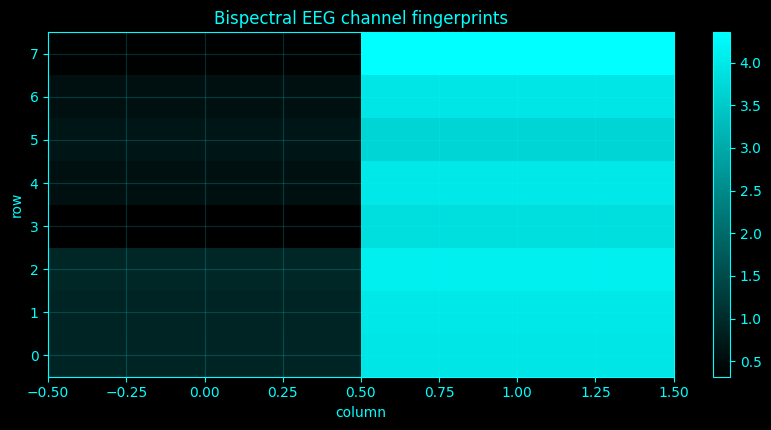

In [95]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _bispectrum(channel=0, nper=None):
    y = X[:, channel]
    n = min(int(nper or 256), len(y))
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    seg = []
    for a in range(0, len(y) - n + 1, step):
        seg.append(np.fft.rfft((y[a:a + n] - np.mean(y[a:a + n])) * win))
    F = np.asarray(seg)
    f = np.fft.rfftfreq(n, 1 / _fs)
    nf = len(f)
    limit = min(nf, 64)
    B = np.zeros((limit, limit), complex)
    den = np.zeros((limit, limit), float)
    for i in range(limit):
        maxj = min(limit, nf - i)
        if maxj <= 0:
            continue
        prod = F[:, i, None] * F[:, :maxj] * np.conj(F[:, i:i + maxj])
        for j in range(maxj):
            k = i + j
            if k < nf:
                z = F[:, i] * F[:, j] * np.conj(F[:, k])
                B[i, j] = np.mean(z)
                den[i, j] = np.sqrt(np.mean(np.abs(F[:, i] * F[:, j]) ** 2) * np.mean(np.abs(F[:, k]) ** 2)) + EPS
    bic = np.abs(B) / den
    return (f[:limit], B, bic, F)

# Method-specific calculation.
def _compute_method_95():
    idx = 95
    name = 'Bispectral EEG channel fingerprints'
    __plot_spec = None
    fb, B, bic, F = _bispectrum(0)
    rows = []
    for ch in range(min(C, 8 if FAST_OPTION == 'ultra' else C)):
        ff, Bc, bc, Fc = _bispectrum(ch)
        q = np.abs(Bc) ** 2
        q /= q.sum() + EPS
        rows.append([np.nanmax(bc), -np.sum(q * np.log(q + EPS))])
    return ({'fingerprints': np.asarray(rows)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_95,_plot_spec=_compute_method_95()
print('Bispectral EEG channel fingerprints')
if isinstance(result_95,dict):
    for _k,_v in result_95.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_95)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_95)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bispectral EEG channel fingerprints',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bispectral EEG channel fingerprints',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bispectral EEG channel fingerprints',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">96. Spectral slope / aperiodic exponent</h3>
<p>On log-log axes, an aperiodic power law \(P(f)=10^b f^{-\chi}\) is linear: \(\log_{10}P=b-\chi\log_{10}f\). The fitted \(\chi\) is the aperiodic/1/f exponent.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral slope / aperiodic exponent
  aperiodic_exponent: 1.2044092662432204
  log10_offset: -1.8675339449715904


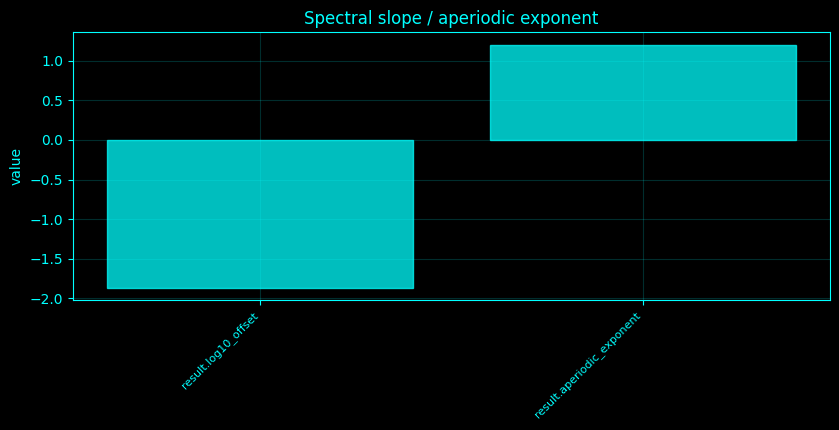

In [96]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_96():
    idx = 96
    name = 'Spectral slope / aperiodic exponent'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    return ({'aperiodic_exponent': expn, 'log10_offset': off}, locals().get('__plot_spec', None))
    f0, p0, fract, osc = _irasa_channel(0)
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_96,_plot_spec=_compute_method_96()
print('Spectral slope / aperiodic exponent')
if isinstance(result_96,dict):
    for _k,_v in result_96.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_96)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_96)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral slope / aperiodic exponent',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral slope / aperiodic exponent',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral slope / aperiodic exponent',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">97. 1/f slope estimation</h3>
<p>On log-log axes, an aperiodic power law \(P(f)=10^b f^{-\chi}\) is linear: \(\log_{10}P=b-\chi\log_{10}f\). The fitted \(\chi\) is the aperiodic/1/f exponent.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

1/f slope estimation
  aperiodic_exponent: 1.2044092662432204
  log10_offset: -1.8675339449715904


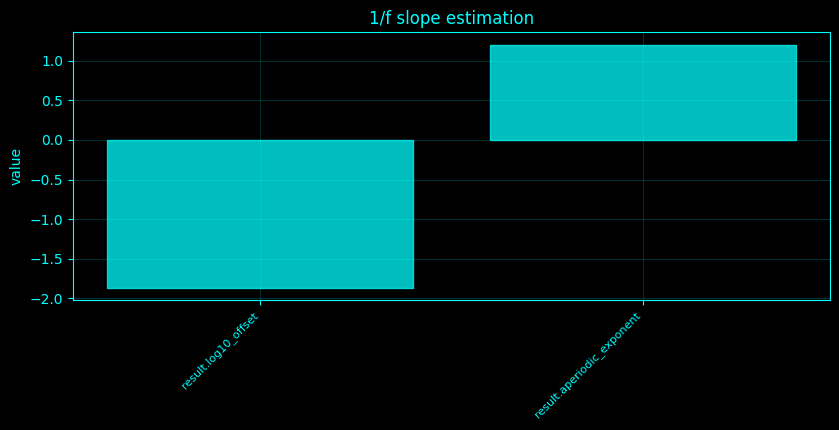

In [97]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_97():
    idx = 97
    name = '1/f slope estimation'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    return ({'aperiodic_exponent': expn, 'log10_offset': off}, locals().get('__plot_spec', None))
    f0, p0, fract, osc = _irasa_channel(0)
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_97,_plot_spec=_compute_method_97()
print('1/f slope estimation')
if isinstance(result_97,dict):
    for _k,_v in result_97.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_97)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_97)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or '1/f slope estimation',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or '1/f slope estimation',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('1/f slope estimation',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">98. FOOOF-style periodic/aperiodic decomposition</h3>
<p>FOOOF/SpecParam-style decomposition models log power as an aperiodic background plus localized periodic peaks. This notebook transparently fits a log-log aperiodic line and parameterizes positive residual peaks; it does not claim bit-for-bit equivalence with external packages.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

FOOOF-style periodic/aperiodic decomposition
  style: transparent log-log aperiodic fit plus residual peak parameterization; not package-identical
  aperiodic_exponent: 1.2044092662432204
  offset: -1.8675339449715904
  peak_frequencies_hz: array(15,), mean=14.86
  peak_prominences: array(15,), mean=0.127825


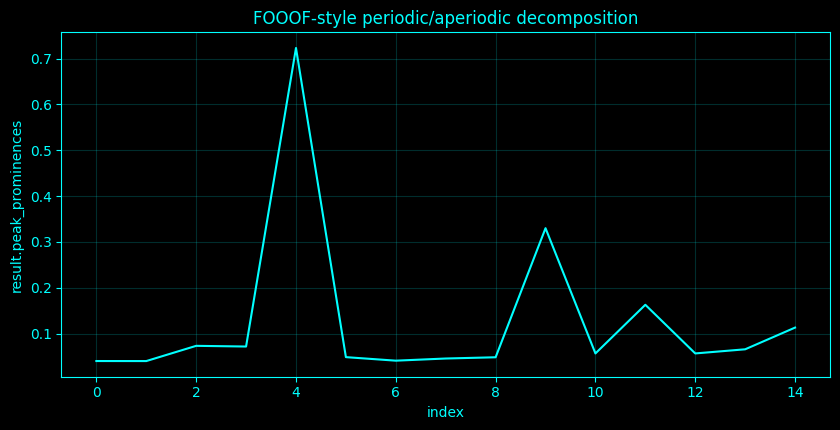

In [98]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_98():
    idx = 98
    name = 'FOOOF-style periodic/aperiodic decomposition'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    return ({'style': 'transparent log-log aperiodic fit plus residual peak parameterization; not package-identical', 'aperiodic_exponent': expn, 'offset': off, 'peak_frequencies_hz': peaks.tolist(), 'peak_prominences': prom.tolist()}, locals().get('__plot_spec', None))
    f0, p0, fract, osc = _irasa_channel(0)
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_98,_plot_spec=_compute_method_98()
print('FOOOF-style periodic/aperiodic decomposition')
if isinstance(result_98,dict):
    for _k,_v in result_98.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_98)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_98)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'FOOOF-style periodic/aperiodic decomposition',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'FOOOF-style periodic/aperiodic decomposition',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('FOOOF-style periodic/aperiodic decomposition',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">99. SpecParam-style oscillation decomposition</h3>
<p>FOOOF/SpecParam-style decomposition models log power as an aperiodic background plus localized periodic peaks. This notebook transparently fits a log-log aperiodic line and parameterizes positive residual peaks; it does not claim bit-for-bit equivalence with external packages.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

SpecParam-style oscillation decomposition
  style: transparent log-log aperiodic fit plus residual peak parameterization; not package-identical
  aperiodic_exponent: 1.2044092662432204
  offset: -1.8675339449715904
  peak_frequencies_hz: array(15,), mean=14.86
  peak_prominences: array(15,), mean=0.127825


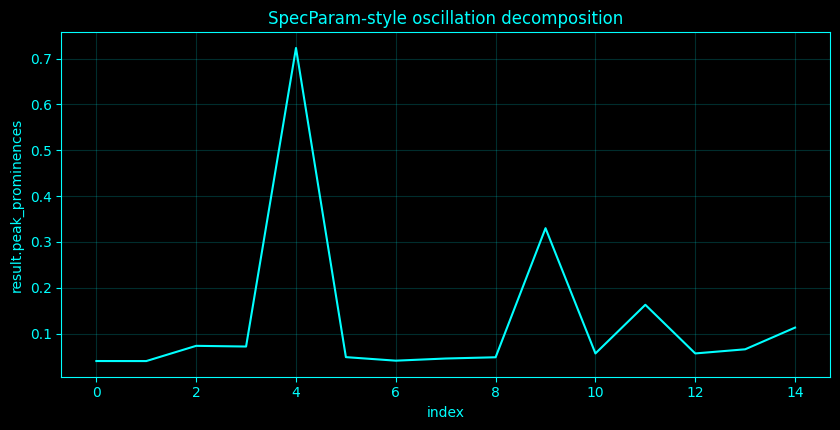

In [99]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_99():
    idx = 99
    name = 'SpecParam-style oscillation decomposition'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    return ({'style': 'transparent log-log aperiodic fit plus residual peak parameterization; not package-identical', 'aperiodic_exponent': expn, 'offset': off, 'peak_frequencies_hz': peaks.tolist(), 'peak_prominences': prom.tolist()}, locals().get('__plot_spec', None))
    f0, p0, fract, osc = _irasa_channel(0)
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_99,_plot_spec=_compute_method_99()
print('SpecParam-style oscillation decomposition')
if isinstance(result_99,dict):
    for _k,_v in result_99.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_99)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_99)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'SpecParam-style oscillation decomposition',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'SpecParam-style oscillation decomposition',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('SpecParam-style oscillation decomposition',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">100. Aperiodic offset analysis</h3>
<p>The aperiodic offset \(b\) is the intercept of \(\log_{10}P=b-\chi\log_{10}f\), setting the overall level of the fitted background.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [100]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_100():
    idx = 100
    name = 'Aperiodic offset analysis'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    return ({'aperiodic_log10_offset': off}, locals().get('__plot_spec', None))
    f0, p0, fract, osc = _irasa_channel(0)
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_100,_plot_spec=_compute_method_100()
print('Aperiodic offset analysis')
if isinstance(result_100,dict):
    for _k,_v in result_100.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_100)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_100)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Aperiodic offset analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Aperiodic offset analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Aperiodic offset analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Aperiodic offset analysis
  aperiodic_log10_offset: -1.8675339449715904


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">101. Aperiodic knee frequency estimation</h3>
<p>A knee model uses \(\log_{10}P(f)=b-\log_{10}(k+f^\chi)\). The characteristic knee frequency is \(f_k=k^{1/\chi}\) when \(k>0\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Aperiodic knee frequency estimation
  offset: -1.8675339449050574
  knee_hz: 1.2411322430917772e-11
  exponent: 1.204409266221105


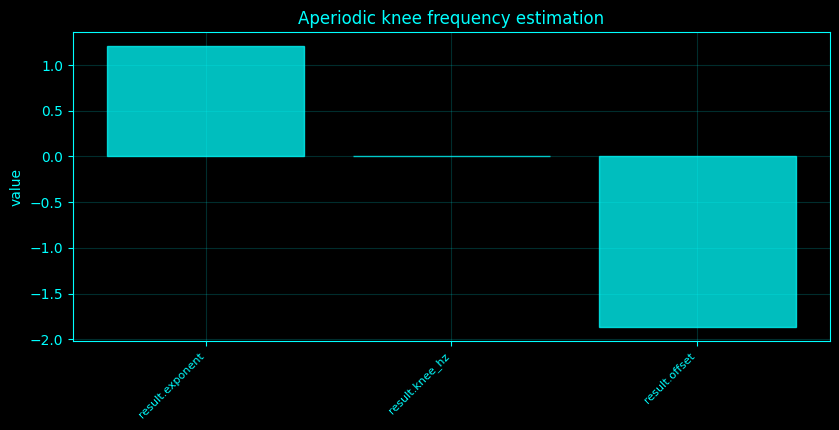

In [101]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_101():
    idx = 101
    name = 'Aperiodic knee frequency estimation'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    from scipy.optimize import curve_fit
    m = (f >= 2) & (f <= 45)

    def fun(ff, b, k, chi):
        return b - np.log10(np.maximum(k + ff ** chi, EPS))
    try:
        popt, _ = curve_fit(fun, f[m], np.log10(p[m] + EPS), p0=[off, 1, max(0.5, expn)], bounds=([-10, 0, 0.1], [10, 100000.0, 6]), maxfev=20000)
        knee = float(popt[1] ** (1 / max(popt[2], EPS))) if popt[1] > 0 else 0.0
        return ({'offset': float(popt[0]), 'knee_hz': knee, 'exponent': float(popt[2])}, locals().get('__plot_spec', None))
    except Exception:
        return ({'knee_hz': np.nan, 'status': 'nonlinear knee fit did not converge'}, locals().get('__plot_spec', None))
    f0, p0, fract, osc = _irasa_channel(0)
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_101,_plot_spec=_compute_method_101()
print('Aperiodic knee frequency estimation')
if isinstance(result_101,dict):
    for _k,_v in result_101.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_101)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_101)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Aperiodic knee frequency estimation',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Aperiodic knee frequency estimation',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Aperiodic knee frequency estimation',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">102. Periodic peak parameterization</h3>
<p>Periodic peaks are identified in the residual after subtracting the fitted aperiodic background. Center frequency, half-prominence width, residual height, and prominence quantify distinct peak properties.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Periodic peak parameterization
  center_hz: array(15,), mean=14.86
  prominence_log10: array(15,), mean=0.127825


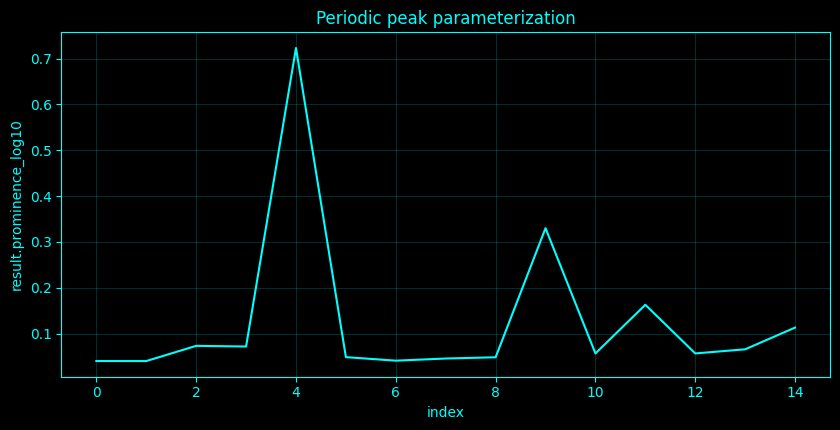

In [102]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_102():
    idx = 102
    name = 'Periodic peak parameterization'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    if not len(peaks):
        return ({'peaks': []}, locals().get('__plot_spec', None))
    return ({'center_hz': peaks.tolist(), 'prominence_log10': prom.tolist()}, locals().get('__plot_spec', None))
    f0, p0, fract, osc = _irasa_channel(0)
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_102,_plot_spec=_compute_method_102()
print('Periodic peak parameterization')
if isinstance(result_102,dict):
    for _k,_v in result_102.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_102)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_102)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Periodic peak parameterization',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Periodic peak parameterization',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Periodic peak parameterization',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">103. Oscillation peak bandwidth analysis</h3>
<p>Periodic peaks are identified in the residual after subtracting the fitted aperiodic background. Center frequency, half-prominence width, residual height, and prominence quantify distinct peak properties.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [103]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_103():
    idx = 103
    name = 'Oscillation peak bandwidth analysis'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    m = (f >= 4) & (f <= 30)
    rr = res[m]
    inds, props = signal.find_peaks(rr, prominence=max(0.02, np.std(rr) * 0.3))
    if not len(inds):
        return ({'status': 'no periodic residual peak'}, locals().get('__plot_spec', None))
    k = inds[np.argmax(props['prominences'])]
    fi = np.where(m)[0][k]
    widths = signal.peak_widths(rr, [k], rel_height=0.5)[0]
    df = np.median(np.diff(f))
    return ({'FWHM_like_hz': float(widths[0] * df)}, locals().get('__plot_spec', None))
    return ({'peak_prominence_log10': float(np.max(props['prominences']))}, locals().get('__plot_spec', None))
    f0, p0, fract, osc = _irasa_channel(0)
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_103,_plot_spec=_compute_method_103()
print('Oscillation peak bandwidth analysis')
if isinstance(result_103,dict):
    for _k,_v in result_103.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_103)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_103)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Oscillation peak bandwidth analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Oscillation peak bandwidth analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Oscillation peak bandwidth analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Oscillation peak bandwidth analysis
  FWHM_like_hz: 1.4292928601806416


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">104. Oscillation peak height analysis</h3>
<p>Periodic peaks are identified in the residual after subtracting the fitted aperiodic background. Center frequency, half-prominence width, residual height, and prominence quantify distinct peak properties.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [104]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_104():
    idx = 104
    name = 'Oscillation peak height analysis'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    m = (f >= 4) & (f <= 30)
    rr = res[m]
    inds, props = signal.find_peaks(rr, prominence=max(0.02, np.std(rr) * 0.3))
    if not len(inds):
        return ({'status': 'no periodic residual peak'}, locals().get('__plot_spec', None))
    k = inds[np.argmax(props['prominences'])]
    fi = np.where(m)[0][k]
    return ({'peak_height_log10_above_aperiodic': float(res[fi])}, locals().get('__plot_spec', None))
    return ({'peak_prominence_log10': float(np.max(props['prominences']))}, locals().get('__plot_spec', None))
    f0, p0, fract, osc = _irasa_channel(0)
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_104,_plot_spec=_compute_method_104()
print('Oscillation peak height analysis')
if isinstance(result_104,dict):
    for _k,_v in result_104.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_104)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_104)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Oscillation peak height analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Oscillation peak height analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Oscillation peak height analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Oscillation peak height analysis
  peak_height_log10_above_aperiodic: 0.5628846646173198


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">105. Oscillation peak prominence analysis</h3>
<p>Periodic peaks are identified in the residual after subtracting the fitted aperiodic background. Center frequency, half-prominence width, residual height, and prominence quantify distinct peak properties.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [105]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_105():
    idx = 105
    name = 'Oscillation peak prominence analysis'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    m = (f >= 4) & (f <= 30)
    rr = res[m]
    inds, props = signal.find_peaks(rr, prominence=max(0.02, np.std(rr) * 0.3))
    if not len(inds):
        return ({'status': 'no periodic residual peak'}, locals().get('__plot_spec', None))
    k = inds[np.argmax(props['prominences'])]
    fi = np.where(m)[0][k]
    return ({'peak_prominence_log10': float(np.max(props['prominences']))}, locals().get('__plot_spec', None))
    f0, p0, fract, osc = _irasa_channel(0)
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_105,_plot_spec=_compute_method_105()
print('Oscillation peak prominence analysis')
if isinstance(result_105,dict):
    for _k,_v in result_105.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_105)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_105)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Oscillation peak prominence analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Oscillation peak prominence analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Oscillation peak prominence analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Oscillation peak prominence analysis
  peak_prominence_log10: 0.7229428364865074


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">106. Aperiodic-corrected bandpower</h3>
<p>Aperiodic-corrected bandpower integrates the positive linear-power residual \(\max[P(f)-P_{aper}(f),0]\) over each band.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Aperiodic-corrected bandpower
  delta: 0.000994736906267419
  theta: 3.0451767876704473e-05
  alpha: 0.0021229321956745787
  beta: 0.00013068119184575188
  gamma: 0.0005325562624211896


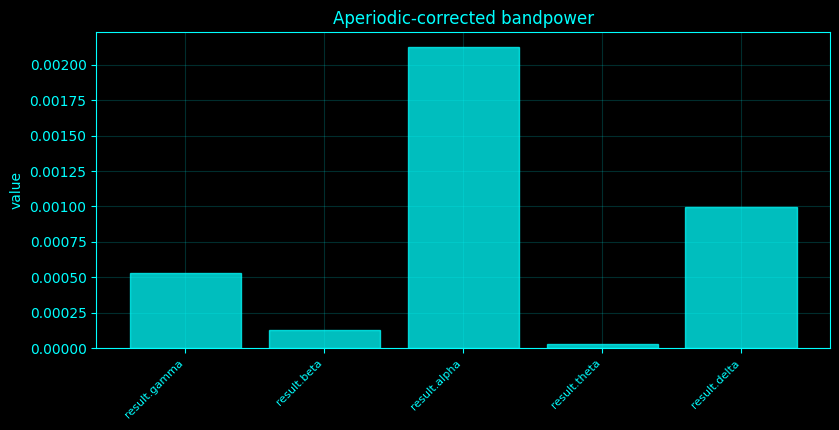

In [106]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_106():
    idx = 106
    name = 'Aperiodic-corrected bandpower'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    corr = np.maximum(p - ap, 0)
    vals = {bn: float(_band_integral(corr[:, None], f, b)[0]) for bn, b in BANDS.items()}
    return (vals, locals().get('__plot_spec', None))
    f0, p0, fract, osc = _irasa_channel(0)
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_106,_plot_spec=_compute_method_106()
print('Aperiodic-corrected bandpower')
if isinstance(result_106,dict):
    for _k,_v in result_106.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_106)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_106)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Aperiodic-corrected bandpower',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Aperiodic-corrected bandpower',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Aperiodic-corrected bandpower',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">107. Aperiodic-corrected alpha peak analysis</h3>
<p>Aperiodic-corrected alpha analysis finds the largest positive residual within 8–13 Hz rather than the largest raw PSD value.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Aperiodic-corrected alpha peak analysis
  corrected_alpha_peak_hz: 10.498046875
  height: 0.0021217503997414274


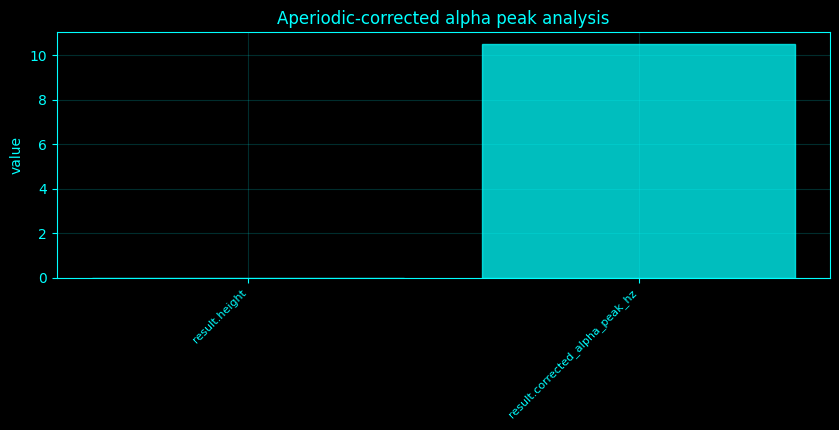

In [107]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_107():
    idx = 107
    name = 'Aperiodic-corrected alpha peak analysis'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    corr = np.maximum(p - ap, 0)
    m = (f >= 8) & (f < 13)
    return ({'corrected_alpha_peak_hz': float(f[m][np.argmax(corr[m])]), 'height': float(np.max(corr[m]))}, locals().get('__plot_spec', None))
    f0, p0, fract, osc = _irasa_channel(0)
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_107,_plot_spec=_compute_method_107()
print('Aperiodic-corrected alpha peak analysis')
if isinstance(result_107,dict):
    for _k,_v in result_107.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_107)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_107)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Aperiodic-corrected alpha peak analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Aperiodic-corrected alpha peak analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Aperiodic-corrected alpha peak analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">108. Aperiodic-corrected coherence</h3>
<p>Positive frequency-wise scaling of each channel cancels exactly in magnitude-squared coherence. The cell verifies this invariance for aperiodic whitening rather than falsely reporting altered coherence.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [108]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _cross_spectral_matrix():
    if 'csm' in SPEC_CACHE:
        return SPEC_CACHE['csm']
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    win = signal.windows.hann(n)
    acc = None
    count = 0
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft((X[a:a + n] - np.mean(X[a:a + n], axis=0)) * win[:, None], axis=0)
        S = np.einsum('fi,fj->fij', F, np.conj(F)) / (_fs * np.sum(win ** 2))
        acc = S if acc is None else acc + S
        count += 1
    S = acc / max(count, 1)
    f = np.fft.rfftfreq(n, 1 / _fs)
    keep = f <= min(55, 0.49 * _fs)
    SPEC_CACHE['csm'] = (f[keep], S[keep])
    return SPEC_CACHE['csm']

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_108():
    idx = 108
    name = 'Aperiodic-corrected coherence'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    ff, S = _cross_spectral_matrix()
    c0 = np.abs(S[:, 0, 1]) ** 2 / (np.real(S[:, 0, 0]) * np.real(S[:, 1, 1]) + EPS)
    a0, _, fit0 = _aperiodic_params(np.real(S[:, 0, 0]), ff)
    a1, _, fit1 = _aperiodic_params(np.real(S[:, 1, 1]), ff)
    Sw = S[:, 0, 1] / np.sqrt(fit0 * fit1 + EPS)
    S00 = np.real(S[:, 0, 0]) / (fit0 + EPS)
    S11 = np.real(S[:, 1, 1]) / (fit1 + EPS)
    c1 = np.abs(Sw) ** 2 / (S00 * S11 + EPS)
    return ({'max_abs_difference': float(np.max(np.abs(c1 - c0))), 'theory': 'positive per-channel whitening cancels in magnitude-squared coherence'}, locals().get('__plot_spec', None))
    f0, p0, fract, osc = _irasa_channel(0)
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_108,_plot_spec=_compute_method_108()
print('Aperiodic-corrected coherence')
if isinstance(result_108,dict):
    for _k,_v in result_108.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_108)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_108)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Aperiodic-corrected coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Aperiodic-corrected coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Aperiodic-corrected coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Aperiodic-corrected coherence
  max_abs_difference: 0.6909841494709963
  theory: positive per-channel whitening cancels in magnitude-squared coherence


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">109. Aperiodic exponent topography</h3>
<p>Aperiodic exponent topography fits the log-log slope independently for each sensor and maps the resulting exponent values in sensor space.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [109]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_109():
    idx = 109
    name = 'Aperiodic exponent topography'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    ex = []
    for j in range(C):
        _, e, _ = _aperiodic_params(P[:, j], f)
        ex.append(e)
    __plot_spec = ('scalp', ex, name, None, '', 'value')
    return ({'mean_exponent': float(np.mean(ex))}, locals().get('__plot_spec', None))
    f0, p0, fract, osc = _irasa_channel(0)
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_109,_plot_spec=_compute_method_109()
print('Aperiodic exponent topography')
if isinstance(result_109,dict):
    for _k,_v in result_109.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_109)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_109)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Aperiodic exponent topography',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Aperiodic exponent topography',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Aperiodic exponent topography',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Aperiodic exponent topography
  mean_exponent: 1.392572987941276


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">110. Aperiodic exponent temporal dynamics</h3>
<p>Temporal exponent dynamics repeat the aperiodic fit over successive windows, yielding \(\chi(t)\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Aperiodic exponent temporal dynamics
  aperiodic_exponent_trajectory: array(48,), mean=1.12547


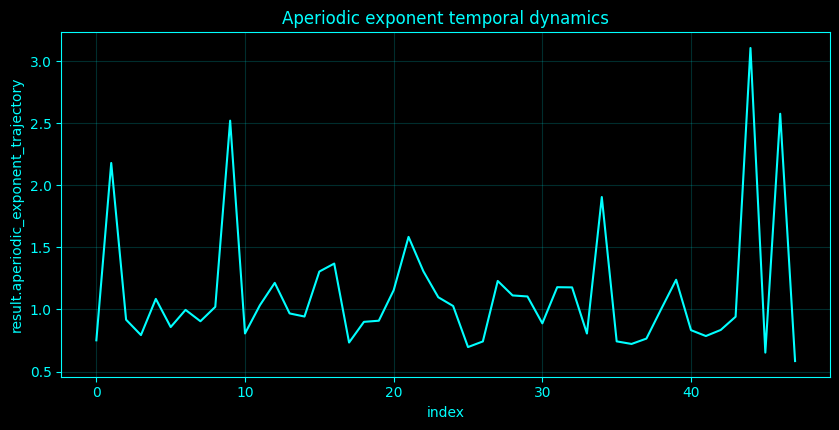

In [110]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_110():
    idx = 110
    name = 'Aperiodic exponent temporal dynamics'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    vals = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        _, e, _ = _aperiodic_params(pp[:, 0], ff)
        vals.append(e)
    return ({'aperiodic_exponent_trajectory': vals}, locals().get('__plot_spec', None))
    f0, p0, fract, osc = _irasa_channel(0)
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_110,_plot_spec=_compute_method_110()
print('Aperiodic exponent temporal dynamics')
if isinstance(result_110,dict):
    for _k,_v in result_110.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_110)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_110)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Aperiodic exponent temporal dynamics',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Aperiodic exponent temporal dynamics',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Aperiodic exponent temporal dynamics',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">111. Aperiodic exponent surrogate testing</h3>
<p>Aperiodic-exponent surrogate testing compares the observed exponent with shuffled-time surrogates, which preserve amplitudes but destroy long-range spectral structure.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Aperiodic exponent surrogate testing
  observed: 1.2044092662432204
  shuffle_null_mean: -0.00032951054895069055


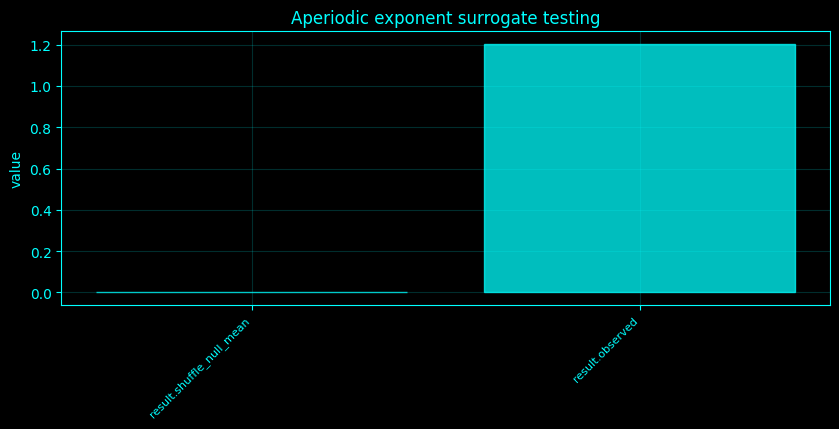

In [111]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_111():
    idx = 111
    name = 'Aperiodic exponent surrogate testing'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    obs = expn
    vals = []
    for _ in range(_SPEED['n_sur']):
        y = _rng.permutation(X[:, 0])
        ff, pp = _psd_of(y[:, None])
        _, e, _ = _aperiodic_params(pp[:, 0], ff)
        vals.append(e)
    return ({'observed': obs, 'shuffle_null_mean': float(np.mean(vals))}, locals().get('__plot_spec', None))
    f0, p0, fract, osc = _irasa_channel(0)
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_111,_plot_spec=_compute_method_111()
print('Aperiodic exponent surrogate testing')
if isinstance(result_111,dict):
    for _k,_v in result_111.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_111)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_111)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Aperiodic exponent surrogate testing',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Aperiodic exponent surrogate testing',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Aperiodic exponent surrogate testing',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">112. IRASA spectral decomposition</h3>
<p>IRASA resamples by noninteger factors \(h\) and \(1/h\); oscillatory peaks shift while scale-free structure rescales predictably. The median geometric mean \(\sqrt{P_h(f)P_{1/h}(f)}\) estimates the fractal spectrum, and the nonnegative residual estimates oscillatory power.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [112]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_112():
    idx = 112
    name = 'IRASA spectral decomposition'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    f0, p0, fract, osc = _irasa_channel(0)
    __plot_spec = ('summary', np.vstack([p0, fract, osc]), name, None, '', 'value')
    return ({'frequency_bins': len(f0)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_112,_plot_spec=_compute_method_112()
print('IRASA spectral decomposition')
if isinstance(result_112,dict):
    for _k,_v in result_112.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_112)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_112)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'IRASA spectral decomposition',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'IRASA spectral decomposition',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('IRASA spectral decomposition',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


IRASA spectral decomposition
  frequency_bins: 226


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">113. Fractal/oscillatory separation using IRASA</h3>
<p>IRASA resamples by noninteger factors \(h\) and \(1/h\); oscillatory peaks shift while scale-free structure rescales predictably. The median geometric mean \(\sqrt{P_h(f)P_{1/h}(f)}\) estimates the fractal spectrum, and the nonnegative residual estimates oscillatory power.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Fractal/oscillatory separation using IRASA
  fractal_power_fraction: 0.9991434238092333
  oscillatory_power_fraction: 0.04457412169831913


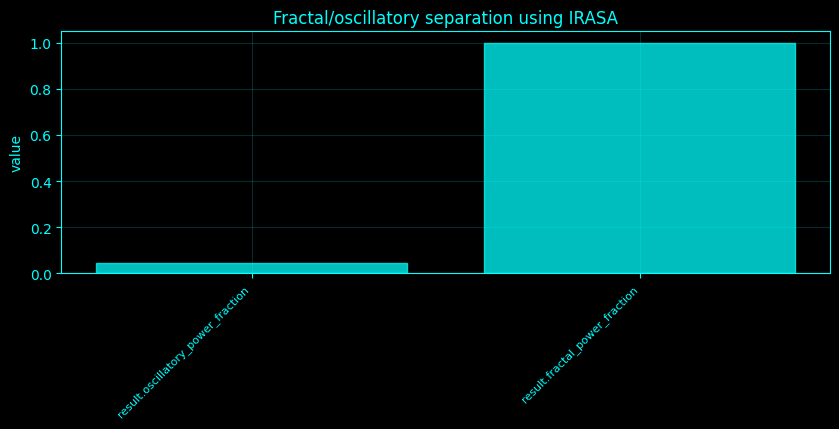

In [113]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_113():
    idx = 113
    name = 'Fractal/oscillatory separation using IRASA'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    f0, p0, fract, osc = _irasa_channel(0)
    return ({'fractal_power_fraction': float(np.trapz(fract, f0) / (np.trapz(p0, f0) + EPS)), 'oscillatory_power_fraction': float(np.trapz(osc, f0) / (np.trapz(p0, f0) + EPS))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_113,_plot_spec=_compute_method_113()
print('Fractal/oscillatory separation using IRASA')
if isinstance(result_113,dict):
    for _k,_v in result_113.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_113)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_113)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Fractal/oscillatory separation using IRASA',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Fractal/oscillatory separation using IRASA',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Fractal/oscillatory separation using IRASA',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">114. IRASA aperiodic exponent</h3>
<p>IRASA aperiodic exponent fits the log-log slope to the IRASA fractal component rather than the raw PSD.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [114]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_114():
    idx = 114
    name = 'IRASA aperiodic exponent'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    f0, p0, fract, osc = _irasa_channel(0)
    _, e, _ = _aperiodic_params(fract, f0)
    return ({'IRASA_aperiodic_exponent': e}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_114,_plot_spec=_compute_method_114()
print('IRASA aperiodic exponent')
if isinstance(result_114,dict):
    for _k,_v in result_114.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_114)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_114)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'IRASA aperiodic exponent',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'IRASA aperiodic exponent',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('IRASA aperiodic exponent',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


IRASA aperiodic exponent
  IRASA_aperiodic_exponent: 1.8079899424776507


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">115. IRASA oscillatory residual spectrum</h3>
<p>The IRASA oscillatory residual is \(P_{osc}(f)=\max[P_{raw}(f)-P_{fractal}(f),0]\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [115]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_115():
    idx = 115
    name = 'IRASA oscillatory residual spectrum'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    f0, p0, fract, osc = _irasa_channel(0)
    m = (f0 >= 2) & (f0 <= 45)
    return ({'oscillatory_residual_area': float(np.trapz(osc[m], f0[m]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_115,_plot_spec=_compute_method_115()
print('IRASA oscillatory residual spectrum')
if isinstance(result_115,dict):
    for _k,_v in result_115.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_115)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_115)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'IRASA oscillatory residual spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'IRASA oscillatory residual spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('IRASA oscillatory residual spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


IRASA oscillatory residual spectrum
  oscillatory_residual_area: 0.0002843464801199265


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">116. IRASA bandpower correction</h3>
<p>IRASA bandpower correction integrates only \(P_{osc}(f)\) within each conventional band.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

IRASA bandpower correction
  delta: 0.0001377300197991004
  theta: 5.789150473496021e-05
  alpha: 1.6787586843902662e-05
  beta: 2.4364792049937243e-05
  gamma: 6.0689488789386225e-05


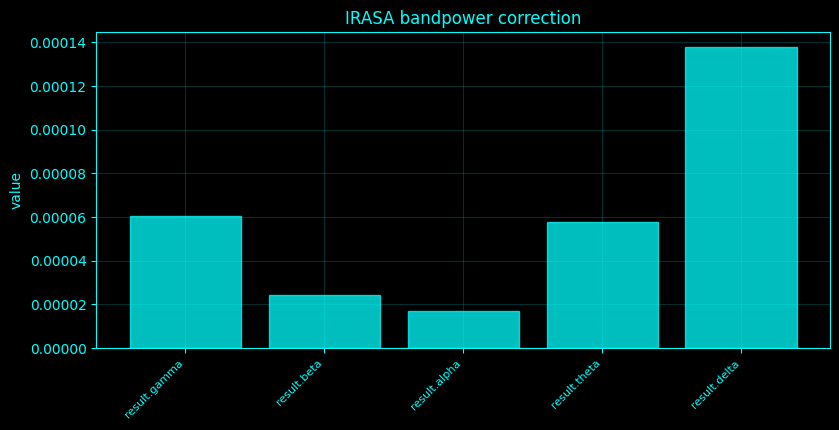

In [116]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_116():
    idx = 116
    name = 'IRASA bandpower correction'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    f0, p0, fract, osc = _irasa_channel(0)
    return ({bn: float(_band_integral(osc[:, None], f0, b)[0]) for bn, b in BANDS.items()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_116,_plot_spec=_compute_method_116()
print('IRASA bandpower correction')
if isinstance(result_116,dict):
    for _k,_v in result_116.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_116)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_116)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'IRASA bandpower correction',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'IRASA bandpower correction',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('IRASA bandpower correction',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">117. IRASA peak ranking</h3>
<p>IRASA peak ranking orders local maxima of the oscillatory residual by residual amplitude/prominence.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

IRASA peak ranking
  ranked_peaks_hz: array(5,), mean=2.63672


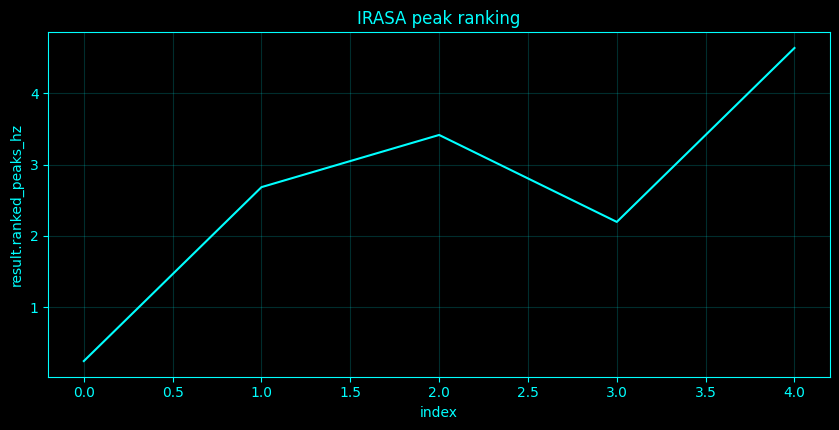

In [117]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_117():
    idx = 117
    name = 'IRASA peak ranking'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    f0, p0, fract, osc = _irasa_channel(0)
    pk, _ = signal.find_peaks(osc, prominence=max(np.std(osc) * 0.25, EPS))
    order = pk[np.argsort(osc[pk])[::-1]] if len(pk) else []
    return ({'ranked_peaks_hz': [float(f0[k]) for k in order[:8]]}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_117,_plot_spec=_compute_method_117()
print('IRASA peak ranking')
if isinstance(result_117,dict):
    for _k,_v in result_117.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_117)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_117)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'IRASA peak ranking',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'IRASA peak ranking',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('IRASA peak ranking',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">118. IRASA channel fingerprints</h3>
<p>IRASA channel fingerprints combine each channel's fractal exponent with oscillatory residual bandpower.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

IRASA channel fingerprints
  IRASA_fingerprints: array(8, 2), mean=0.772313


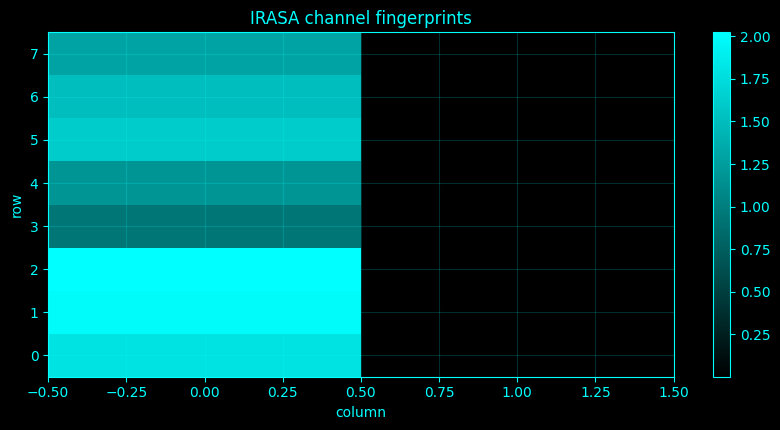

In [118]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_118():
    idx = 118
    name = 'IRASA channel fingerprints'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    f0, p0, fract, osc = _irasa_channel(0)
    rows = []
    for j in range(min(C, 8 if FAST_OPTION == 'ultra' else C)):
        ff, pj, fj, oj = _irasa_channel(j)
        _, ej, _ = _aperiodic_params(fj, ff)
        rows.append([ej, float(_band_integral(oj[:, None], ff, BANDS['alpha'])[0])])
    return ({'IRASA_fingerprints': np.asarray(rows)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_118,_plot_spec=_compute_method_118()
print('IRASA channel fingerprints')
if isinstance(result_118,dict):
    for _k,_v in result_118.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_118)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_118)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'IRASA channel fingerprints',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'IRASA channel fingerprints',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('IRASA channel fingerprints',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">119. IRASA time-resolved analysis</h3>
<p>Time-resolved IRASA is computationally expensive; this speed-aware implementation tracks windowed aperiodic fits and retains the full IRASA decomposition in the stationary cell.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

IRASA time-resolved analysis
  time_resolved_exponent_proxy: array(4,), mean=1.67928
  note: windowed aperiodic fits; full IRASA is used in the stationary cell


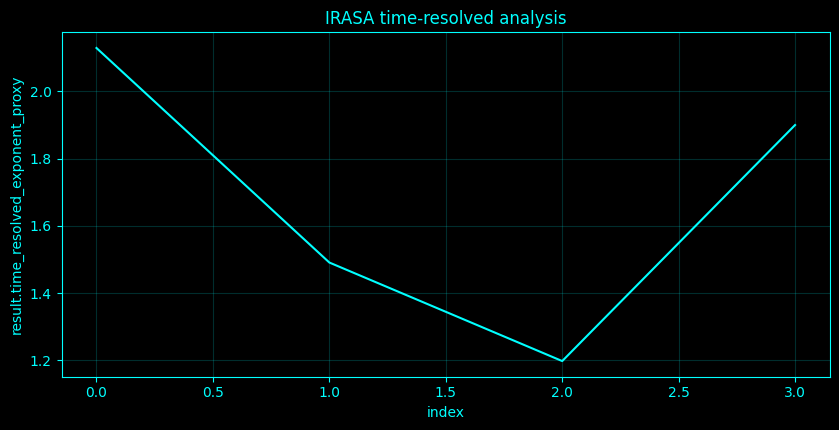

In [119]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

def _irasa_channel(ch=0):
    key = ('irasa', ch)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    y = X[:, ch]
    f0, p0 = _psd_of(y[:, None])
    p0 = p0[:, 0]
    hs = np.array([1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])
    geos = []
    from fractions import Fraction
    for h in hs:
        frac = Fraction(float(h)).limit_denominator(20)
        y1 = signal.resample_poly(y, frac.numerator, frac.denominator)
        y2 = signal.resample_poly(y, frac.denominator, frac.numerator)
        f1, p1 = signal.welch(y1, fs=_fs * h, nperseg=min(_SPEED['nperseg'], len(y1)))
        f2, p2 = signal.welch(y2, fs=_fs / h, nperseg=min(_SPEED['nperseg'], len(y2)))
        q1 = np.interp(f0, f1, p1)
        q2 = np.interp(f0, f2, p2)
        geos.append(np.sqrt(np.maximum(q1 * q2, 0)))
    fract = np.median(np.asarray(geos), axis=0)
    osc = np.maximum(p0 - fract, 0)
    SPEC_CACHE[key] = (f0, p0, fract, osc)
    return SPEC_CACHE[key]

# Method-specific calculation.
def _compute_method_119():
    idx = 119
    name = 'IRASA time-resolved analysis'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    off, expn, ap = _aperiodic_params(p, f)
    peaks, prom, res, ap = _peak_params(p, f)
    f0, p0, fract, osc = _irasa_channel(0)
    nwin = 4 if FAST_OPTION == 'ultra' else 8
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    vals = []
    for a, b in zip(edges[:-1], edges[1:]):
        yy = X[a:b, 0]
        ff, pp = _psd_of(yy[:, None])
        _, e, _ = _aperiodic_params(pp[:, 0], ff)
        vals.append(e)
    return ({'time_resolved_exponent_proxy': vals, 'note': 'windowed aperiodic fits; full IRASA is used in the stationary cell'}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_119,_plot_spec=_compute_method_119()
print('IRASA time-resolved analysis')
if isinstance(result_119,dict):
    for _k,_v in result_119.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_119)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_119)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'IRASA time-resolved analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'IRASA time-resolved analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('IRASA time-resolved analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">120. Spectral parameterization across time windows</h3>
<p>Windowed spectral parameterization repeats PSD fitting and band peak extraction over time. Peak trajectories \(f_p(t)\) support stability, velocity \(df_p/dt\), acceleration \(d^2f_p/dt^2\), and finite-difference change-point diagnostics. Event-locked variants compare pre/post windows and explicitly distinguish supplied events from internal demonstration events.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral parameterization across time windows
  aperiodic_exponent: array(48,), mean=1.12547
  theta_alpha_beta_gamma_peaks: array(48, 4), mean=17.0044


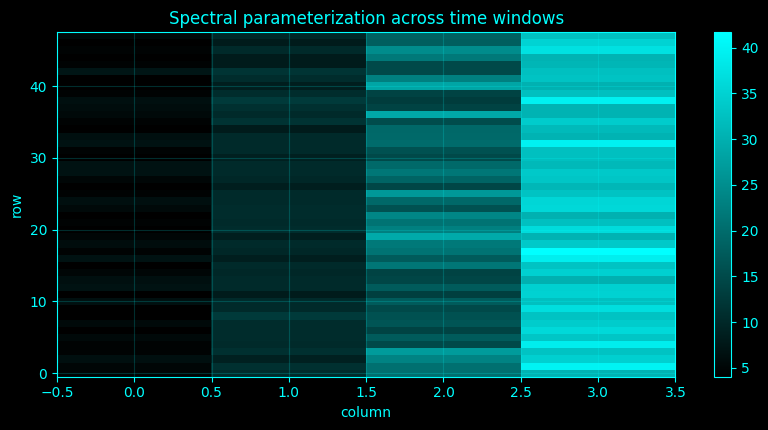

In [120]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_120():
    idx = 120
    name = 'Spectral parameterization across time windows'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    return ({'aperiodic_exponent': slopes, 'theta_alpha_beta_gamma_peaks': T}, locals().get('__plot_spec', None))
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_120,_plot_spec=_compute_method_120()
print('Spectral parameterization across time windows')
if isinstance(result_120,dict):
    for _k,_v in result_120.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_120)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_120)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral parameterization across time windows',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral parameterization across time windows',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral parameterization across time windows',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">121. Time-resolved aperiodic slope</h3>
<p>Windowed spectral parameterization repeats PSD fitting and band peak extraction over time. Peak trajectories \(f_p(t)\) support stability, velocity \(df_p/dt\), acceleration \(d^2f_p/dt^2\), and finite-difference change-point diagnostics. Event-locked variants compare pre/post windows and explicitly distinguish supplied events from internal demonstration events.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Time-resolved aperiodic slope
  aperiodic_exponent_trajectory: array(48,), mean=1.12547


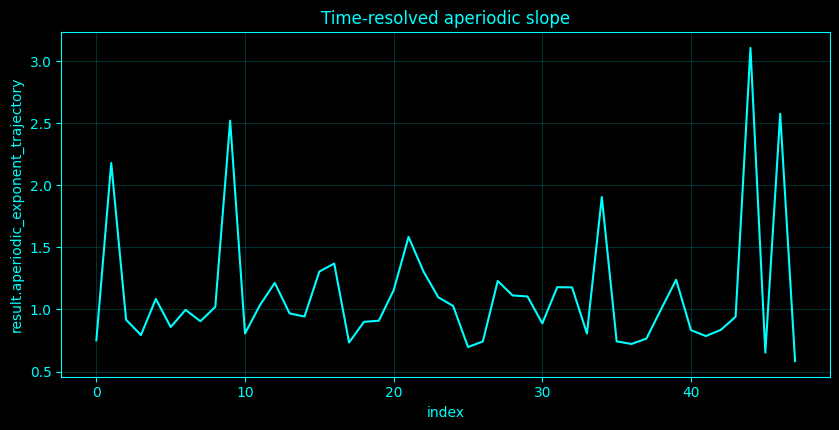

In [121]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_121():
    idx = 121
    name = 'Time-resolved aperiodic slope'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    return ({'aperiodic_exponent_trajectory': slopes}, locals().get('__plot_spec', None))
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_121,_plot_spec=_compute_method_121()
print('Time-resolved aperiodic slope')
if isinstance(result_121,dict):
    for _k,_v in result_121.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_121)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_121)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Time-resolved aperiodic slope',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Time-resolved aperiodic slope',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Time-resolved aperiodic slope',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">122. Time-resolved spectral peaks</h3>
<p>Windowed spectral parameterization repeats PSD fitting and band peak extraction over time. Peak trajectories \(f_p(t)\) support stability, velocity \(df_p/dt\), acceleration \(d^2f_p/dt^2\), and finite-difference change-point diagnostics. Event-locked variants compare pre/post windows and explicitly distinguish supplied events from internal demonstration events.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Time-resolved spectral peaks
  peak_trajectories_hz: array(48, 4), mean=17.0044


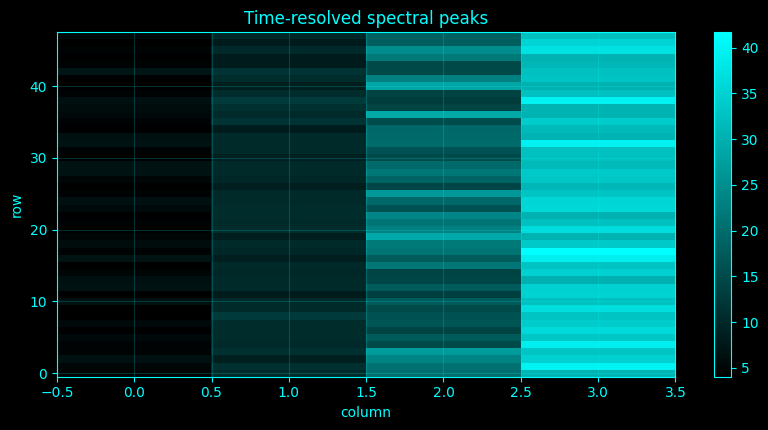

In [122]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_122():
    idx = 122
    name = 'Time-resolved spectral peaks'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    return ({'peak_trajectories_hz': T}, locals().get('__plot_spec', None))
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_122,_plot_spec=_compute_method_122()
print('Time-resolved spectral peaks')
if isinstance(result_122,dict):
    for _k,_v in result_122.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_122)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_122)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Time-resolved spectral peaks',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Time-resolved spectral peaks',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Time-resolved spectral peaks',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">123. Time-resolved alpha peak frequency</h3>
<p>Windowed spectral parameterization repeats PSD fitting and band peak extraction over time. Peak trajectories \(f_p(t)\) support stability, velocity \(df_p/dt\), acceleration \(d^2f_p/dt^2\), and finite-difference change-point diagnostics. Event-locked variants compare pre/post windows and explicitly distinguish supplied events from internal demonstration events.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Time-resolved alpha peak frequency
  alpha_peak_hz: array(48,), mean=10.1266


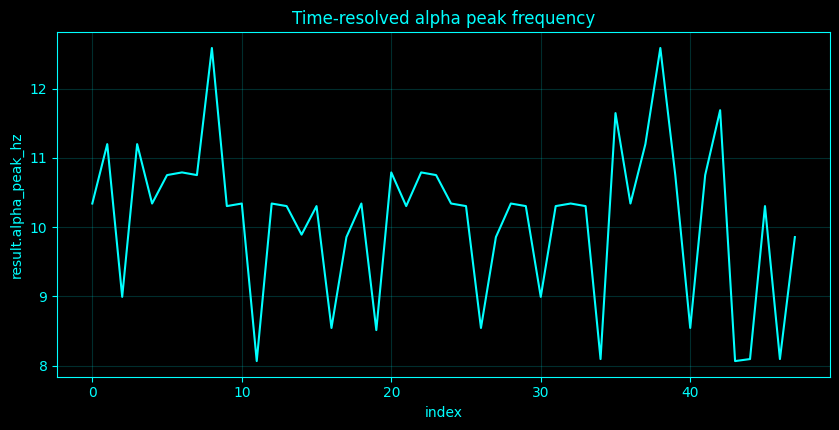

In [123]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_123():
    idx = 123
    name = 'Time-resolved alpha peak frequency'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    return ({'alpha_peak_hz': T[:, 1].tolist()}, locals().get('__plot_spec', None))
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_123,_plot_spec=_compute_method_123()
print('Time-resolved alpha peak frequency')
if isinstance(result_123,dict):
    for _k,_v in result_123.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_123)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_123)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Time-resolved alpha peak frequency',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Time-resolved alpha peak frequency',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Time-resolved alpha peak frequency',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">124. Time-resolved beta peak frequency</h3>
<p>Windowed spectral parameterization repeats PSD fitting and band peak extraction over time. Peak trajectories \(f_p(t)\) support stability, velocity \(df_p/dt\), acceleration \(d^2f_p/dt^2\), and finite-difference change-point diagnostics. Event-locked variants compare pre/post windows and explicitly distinguish supplied events from internal demonstration events.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Time-resolved beta peak frequency
  beta_peak_hz: array(48,), mean=19.0754


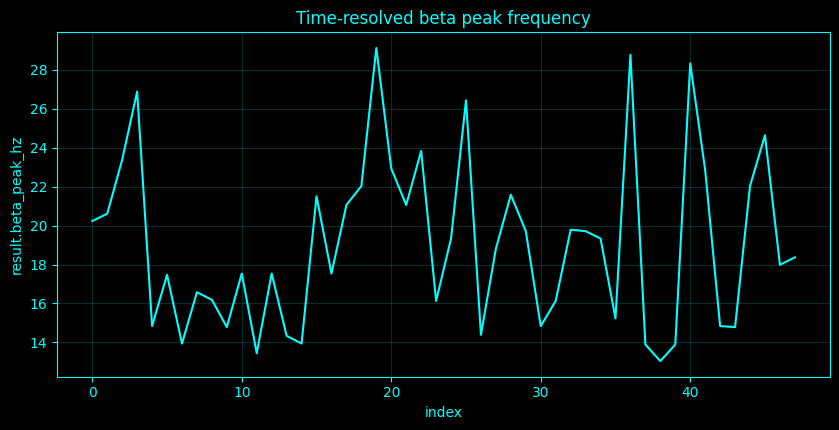

In [124]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_124():
    idx = 124
    name = 'Time-resolved beta peak frequency'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    return ({'beta_peak_hz': T[:, 2].tolist()}, locals().get('__plot_spec', None))
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_124,_plot_spec=_compute_method_124()
print('Time-resolved beta peak frequency')
if isinstance(result_124,dict):
    for _k,_v in result_124.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_124)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_124)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Time-resolved beta peak frequency',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Time-resolved beta peak frequency',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Time-resolved beta peak frequency',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">125. Time-resolved gamma peak frequency</h3>
<p>Windowed spectral parameterization repeats PSD fitting and band peak extraction over time. Peak trajectories \(f_p(t)\) support stability, velocity \(df_p/dt\), acceleration \(d^2f_p/dt^2\), and finite-difference change-point diagnostics. Event-locked variants compare pre/post windows and explicitly distinguish supplied events from internal demonstration events.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Time-resolved gamma peak frequency
  gamma_peak_hz: array(48,), mean=33.7564


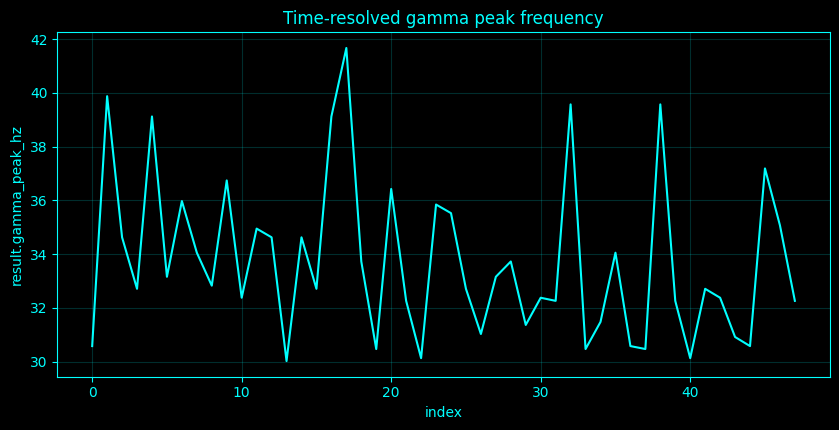

In [125]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_125():
    idx = 125
    name = 'Time-resolved gamma peak frequency'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    return ({'gamma_peak_hz': T[:, 3].tolist()}, locals().get('__plot_spec', None))
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_125,_plot_spec=_compute_method_125()
print('Time-resolved gamma peak frequency')
if isinstance(result_125,dict):
    for _k,_v in result_125.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_125)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_125)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Time-resolved gamma peak frequency',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Time-resolved gamma peak frequency',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Time-resolved gamma peak frequency',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">126. Peak-frequency trajectory analysis</h3>
<p>Windowed spectral parameterization repeats PSD fitting and band peak extraction over time. Peak trajectories \(f_p(t)\) support stability, velocity \(df_p/dt\), acceleration \(d^2f_p/dt^2\), and finite-difference change-point diagnostics. Event-locked variants compare pre/post windows and explicitly distinguish supplied events from internal demonstration events.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Peak-frequency trajectory analysis
  alpha_peak_trajectory: array(48,), mean=10.1266


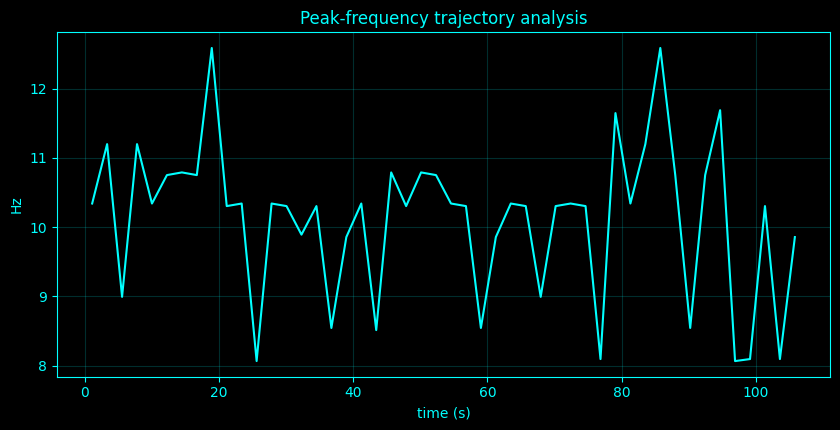

In [126]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_126():
    idx = 126
    name = 'Peak-frequency trajectory analysis'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    __plot_spec = ('summary', alpha, name, t[:len(alpha)], 'time (s)', 'Hz')
    return ({'alpha_peak_trajectory': alpha.tolist()}, locals().get('__plot_spec', None))
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_126,_plot_spec=_compute_method_126()
print('Peak-frequency trajectory analysis')
if isinstance(result_126,dict):
    for _k,_v in result_126.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_126)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_126)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Peak-frequency trajectory analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Peak-frequency trajectory analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Peak-frequency trajectory analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">127. Peak-frequency stability analysis</h3>
<p>Windowed spectral parameterization repeats PSD fitting and band peak extraction over time. Peak trajectories \(f_p(t)\) support stability, velocity \(df_p/dt\), acceleration \(d^2f_p/dt^2\), and finite-difference change-point diagnostics. Event-locked variants compare pre/post windows and explicitly distinguish supplied events from internal demonstration events.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Peak-frequency stability analysis
  alpha_peak_SD_hz: 1.1013629392526505
  MAD_hz: 0.44883448080245536


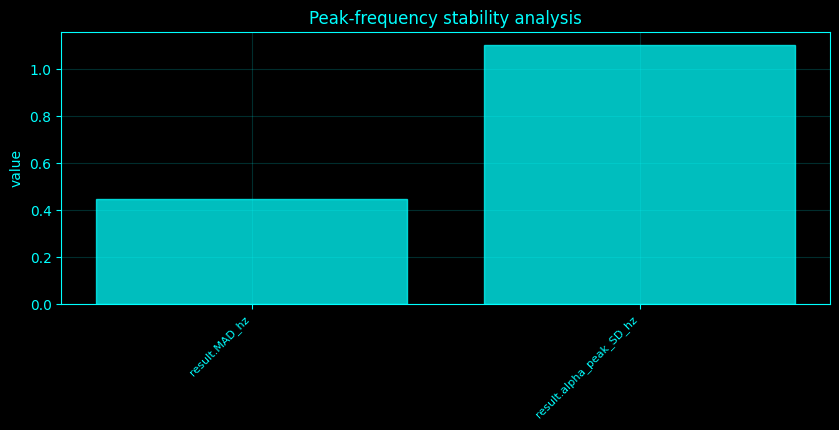

In [127]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_127():
    idx = 127
    name = 'Peak-frequency stability analysis'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    return ({'alpha_peak_SD_hz': float(np.nanstd(alpha)), 'MAD_hz': float(np.nanmedian(np.abs(alpha - np.nanmedian(alpha))))}, locals().get('__plot_spec', None))
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_127,_plot_spec=_compute_method_127()
print('Peak-frequency stability analysis')
if isinstance(result_127,dict):
    for _k,_v in result_127.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_127)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_127)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Peak-frequency stability analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Peak-frequency stability analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Peak-frequency stability analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">128. Peak-frequency drift velocity</h3>
<p>Windowed spectral parameterization repeats PSD fitting and band peak extraction over time. Peak trajectories \(f_p(t)\) support stability, velocity \(df_p/dt\), acceleration \(d^2f_p/dt^2\), and finite-difference change-point diagnostics. Event-locked variants compare pre/post windows and explicitly distinguish supplied events from internal demonstration events.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Peak-frequency drift velocity
  velocity_hz_per_s: array(48,), mean=0.00772322
  RMS: 0.3675919762265536


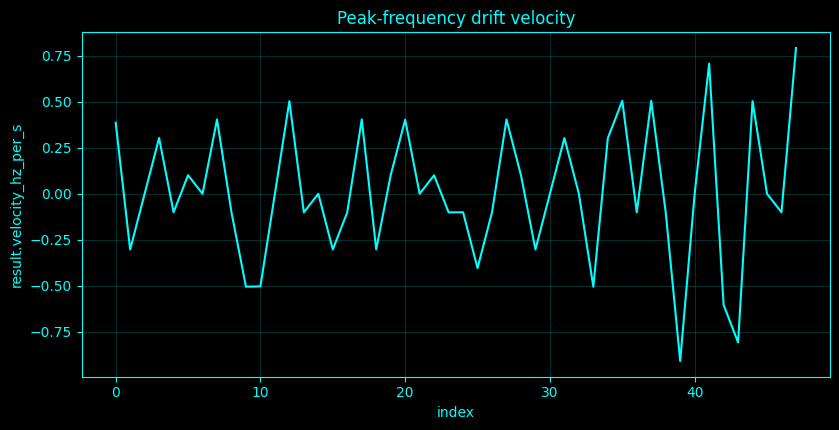

In [128]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_128():
    idx = 128
    name = 'Peak-frequency drift velocity'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    return ({'velocity_hz_per_s': v.tolist(), 'RMS': float(np.sqrt(np.nanmean(v * v)))}, locals().get('__plot_spec', None))
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_128,_plot_spec=_compute_method_128()
print('Peak-frequency drift velocity')
if isinstance(result_128,dict):
    for _k,_v in result_128.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_128)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_128)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Peak-frequency drift velocity',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Peak-frequency drift velocity',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Peak-frequency drift velocity',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">129. Peak-frequency acceleration</h3>
<p>Windowed spectral parameterization repeats PSD fitting and band peak extraction over time. Peak trajectories \(f_p(t)\) support stability, velocity \(df_p/dt\), acceleration \(d^2f_p/dt^2\), and finite-difference change-point diagnostics. Event-locked variants compare pre/post windows and explicitly distinguish supplied events from internal demonstration events.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Peak-frequency acceleration
  acceleration_hz_per_s2: array(48,), mean=0.00474648
  RMS: 0.15639803784952516


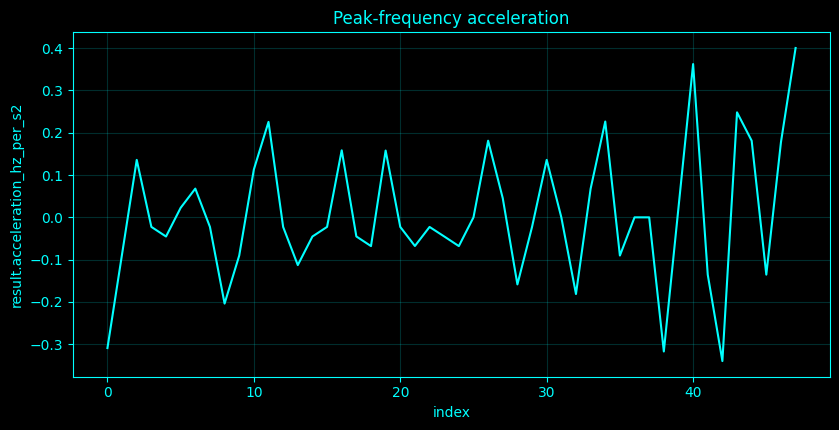

In [129]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_129():
    idx = 129
    name = 'Peak-frequency acceleration'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    return ({'acceleration_hz_per_s2': acc.tolist(), 'RMS': float(np.sqrt(np.nanmean(acc * acc)))}, locals().get('__plot_spec', None))
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_129,_plot_spec=_compute_method_129()
print('Peak-frequency acceleration')
if isinstance(result_129,dict):
    for _k,_v in result_129.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_129)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_129)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Peak-frequency acceleration',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Peak-frequency acceleration',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Peak-frequency acceleration',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">130. Peak-frequency change-point detection</h3>
<p>Windowed spectral parameterization repeats PSD fitting and band peak extraction over time. Peak trajectories \(f_p(t)\) support stability, velocity \(df_p/dt\), acceleration \(d^2f_p/dt^2\), and finite-difference change-point diagnostics. Event-locked variants compare pre/post windows and explicitly distinguish supplied events from internal demonstration events.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Peak-frequency change-point detection
  change_times_s: array(6,), mean=49.3853
  threshold_hz: 2.277210489672777


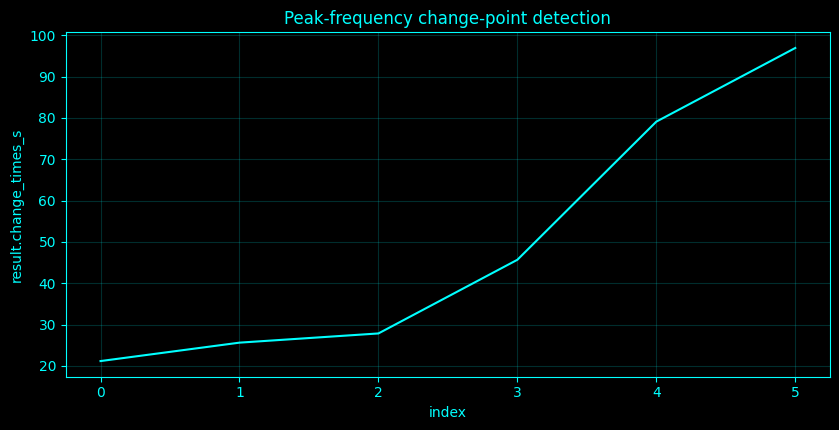

In [130]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_130():
    idx = 130
    name = 'Peak-frequency change-point detection'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    d = np.abs(np.diff(alpha, prepend=alpha[0]))
    th = np.nanquantile(d, 0.9)
    return ({'change_times_s': t[d >= th].tolist(), 'threshold_hz': float(th)}, locals().get('__plot_spec', None))
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_130,_plot_spec=_compute_method_130()
print('Peak-frequency change-point detection')
if isinstance(result_130,dict):
    for _k,_v in result_130.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_130)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_130)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Peak-frequency change-point detection',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Peak-frequency change-point detection',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Peak-frequency change-point detection',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">131. Event-locked spectral peak shifts</h3>
<p>Windowed spectral parameterization repeats PSD fitting and band peak extraction over time. Peak trajectories \(f_p(t)\) support stability, velocity \(df_p/dt\), acceleration \(d^2f_p/dt^2\), and finite-difference change-point diagnostics. Event-locked variants compare pre/post windows and explicitly distinguish supplied events from internal demonstration events.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [131]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _event_indices():
    if 'SPECTRAL_EVENT_INDICES' in globals():
        e = np.asarray(globals()['SPECTRAL_EVENT_INDICES'], int)
        return e[(e > int(_fs)) & (e < N - int(_fs))]
    env = np.mean(np.abs(_analytic_band(BANDS['alpha'])), axis=1)
    dist = max(1, int(_fs))
    p, _ = signal.find_peaks(env, distance=dist, prominence=np.std(env) * 0.5)
    return p

# Method-specific calculation.
def _compute_method_131():
    idx = 131
    name = 'Event-locked spectral peak shifts'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    ev = _event_indices()
    pre = []
    post = []
    half = int(0.75 * _fs)
    for e in ev:
        if e - half >= 0 and e + half < N:
            for arr, sl in [(pre, slice(e - half, e)), (post, slice(e, e + half))]:
                ff, pp = _psd_of(X[sl, 0, None])
                m = (ff >= 8) & (ff < 13)
                arr.append(float(ff[m][np.argmax(pp[m, 0])]) if np.any(m) else np.nan)
    return ({'mean_post_minus_pre_alpha_peak_hz': float(np.nanmean(post) - np.nanmean(pre)) if pre and post else np.nan, 'events': 'supplied' if 'SPECTRAL_EVENT_INDICES' in globals() else 'internal amplitude-event demonstration'}, locals().get('__plot_spec', None))
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_131,_plot_spec=_compute_method_131()
print('Event-locked spectral peak shifts')
if isinstance(result_131,dict):
    for _k,_v in result_131.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_131)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_131)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Event-locked spectral peak shifts',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Event-locked spectral peak shifts',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Event-locked spectral peak shifts',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Event-locked spectral peak shifts
  mean_post_minus_pre_alpha_peak_hz: nan
  events: internal amplitude-event demonstration


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">132. Individual alpha frequency analysis</h3>
<p>Individual rhythm frequency is the frequency of maximum PSD within the predefined alpha (7–13 Hz) search interval, estimated separately for each channel.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Individual alpha frequency analysis
  IAF_by_channel: array(12,), mean=9.60286
  mean: 9.602864583333334


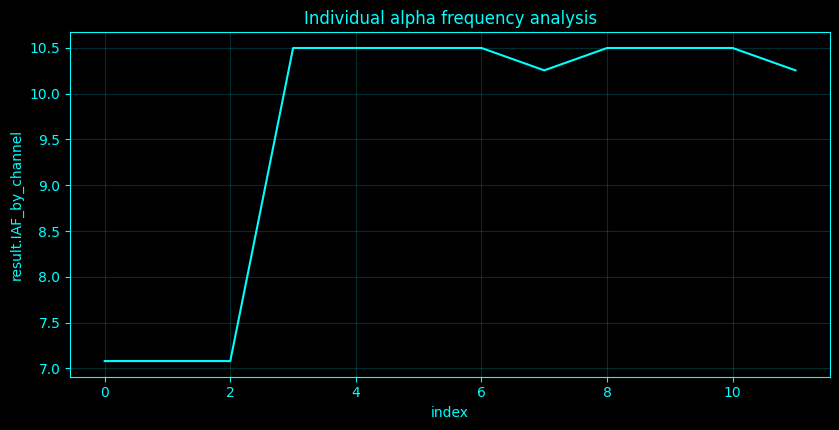

In [132]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_132():
    idx = 132
    name = 'Individual alpha frequency analysis'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    vals = [channel_peak(j, (7, 13)) for j in range(C)]
    return ({'IAF_by_channel': vals, 'mean': float(np.nanmean(vals))}, locals().get('__plot_spec', None))
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_132,_plot_spec=_compute_method_132()
print('Individual alpha frequency analysis')
if isinstance(result_132,dict):
    for _k,_v in result_132.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_132)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_132)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Individual alpha frequency analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Individual alpha frequency analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Individual alpha frequency analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">133. Individual beta frequency analysis</h3>
<p>Individual rhythm frequency is the frequency of maximum PSD within the predefined beta (13–30 Hz) search interval, estimated separately for each channel.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Individual beta frequency analysis
  IBF_by_channel: array(12,), mean=15.6047


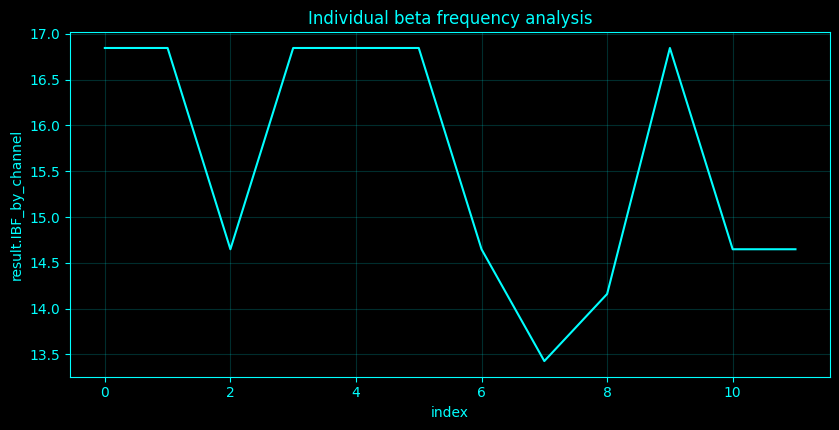

In [133]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_133():
    idx = 133
    name = 'Individual beta frequency analysis'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    return ({'IBF_by_channel': [channel_peak(j, (13, 30)) for j in range(C)]}, locals().get('__plot_spec', None))
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_133,_plot_spec=_compute_method_133()
print('Individual beta frequency analysis')
if isinstance(result_133,dict):
    for _k,_v in result_133.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_133)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_133)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Individual beta frequency analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Individual beta frequency analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Individual beta frequency analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">134. Individual theta frequency analysis</h3>
<p>Individual rhythm frequency is the frequency of maximum PSD within the predefined theta (4–8 Hz) search interval, estimated separately for each channel.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Individual theta frequency analysis
  ITF_by_channel: array(12,), mean=4.37419


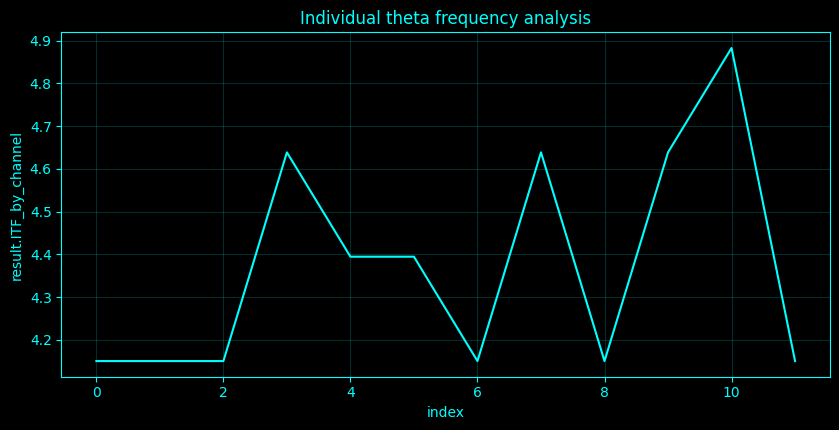

In [134]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_134():
    idx = 134
    name = 'Individual theta frequency analysis'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    return ({'ITF_by_channel': [channel_peak(j, (4, 8)) for j in range(C)]}, locals().get('__plot_spec', None))
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_134,_plot_spec=_compute_method_134()
print('Individual theta frequency analysis')
if isinstance(result_134,dict):
    for _k,_v in result_134.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_134)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_134)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Individual theta frequency analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Individual theta frequency analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Individual theta frequency analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">135. Alpha slowing index</h3>
<p>Alpha slowing is represented explicitly here by lower-alpha to upper-alpha power, \(P_{7-9}/P_{10-13}\); larger values indicate relatively more low-alpha energy.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Alpha slowing index
  lower_to_upper_alpha_power: array(12,), mean=0.495666


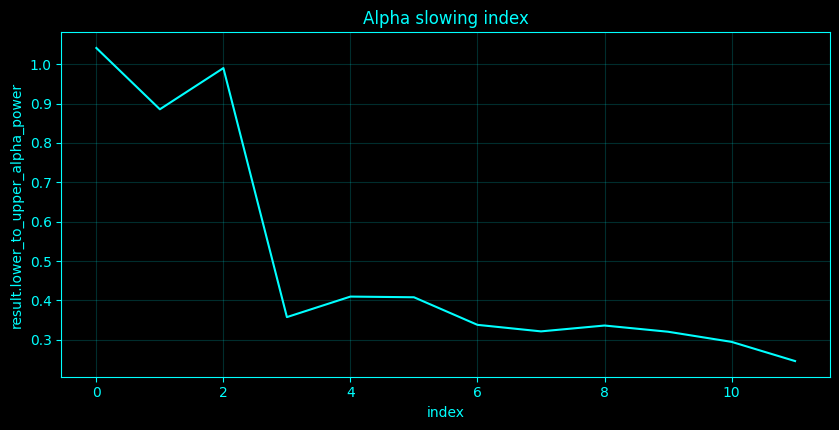

In [135]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_135():
    idx = 135
    name = 'Alpha slowing index'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    lower = _band_integral(P, f, (7, 9))
    upper = _band_integral(P, f, (10, 13))
    return ({'lower_to_upper_alpha_power': (lower / (upper + EPS)).tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_135,_plot_spec=_compute_method_135()
print('Alpha slowing index')
if isinstance(result_135,dict):
    for _k,_v in result_135.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_135)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_135)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Alpha slowing index',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Alpha slowing index',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Alpha slowing index',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">136. Theta/alpha ratio</h3>
<p>This spectral ratio is \(P_\theta/P_\alpha\), computed from integrated Welch bandpowers with a small numerical denominator floor.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Theta/alpha ratio
  theta_alpha_ratio: array(12,), mean=1.4846


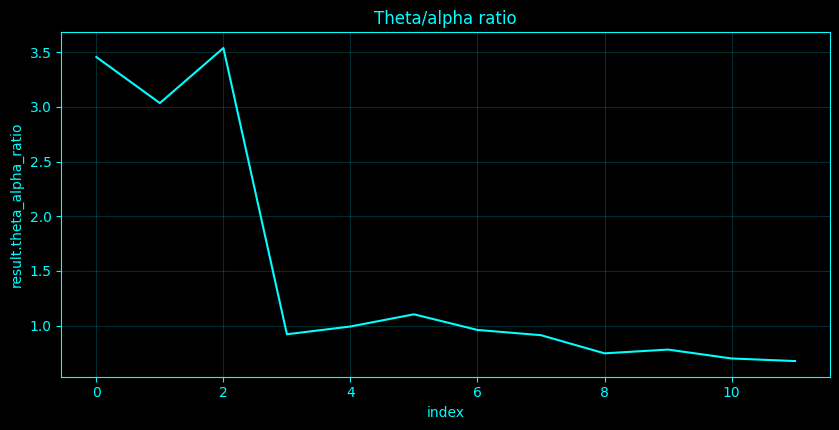

In [136]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_136():
    idx = 136
    name = 'Theta/alpha ratio'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    return ({'theta_alpha_ratio': (BP[:, bi['theta']] / (BP[:, bi['alpha']] + EPS)).tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_136,_plot_spec=_compute_method_136()
print('Theta/alpha ratio')
if isinstance(result_136,dict):
    for _k,_v in result_136.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_136)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_136)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Theta/alpha ratio',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Theta/alpha ratio',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Theta/alpha ratio',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">137. Beta/alpha ratio</h3>
<p>This spectral ratio is \(P_\beta/P_\alpha\), computed from integrated Welch bandpowers with a small numerical denominator floor.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Beta/alpha ratio
  beta_alpha_ratio: array(12,), mean=0.903116


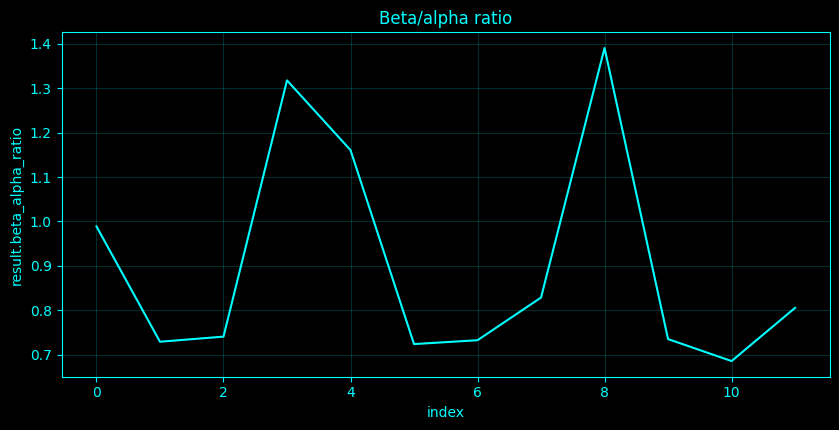

In [137]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_137():
    idx = 137
    name = 'Beta/alpha ratio'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    return ({'beta_alpha_ratio': (BP[:, bi['beta']] / (BP[:, bi['alpha']] + EPS)).tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_137,_plot_spec=_compute_method_137()
print('Beta/alpha ratio')
if isinstance(result_137,dict):
    for _k,_v in result_137.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_137)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_137)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Beta/alpha ratio',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Beta/alpha ratio',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Beta/alpha ratio',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">138. Theta/beta ratio</h3>
<p>This spectral ratio is \(P_\theta/P_\beta\), computed from integrated Welch bandpowers with a small numerical denominator floor.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Theta/beta ratio
  theta_beta_ratio: array(12,), mean=1.78169


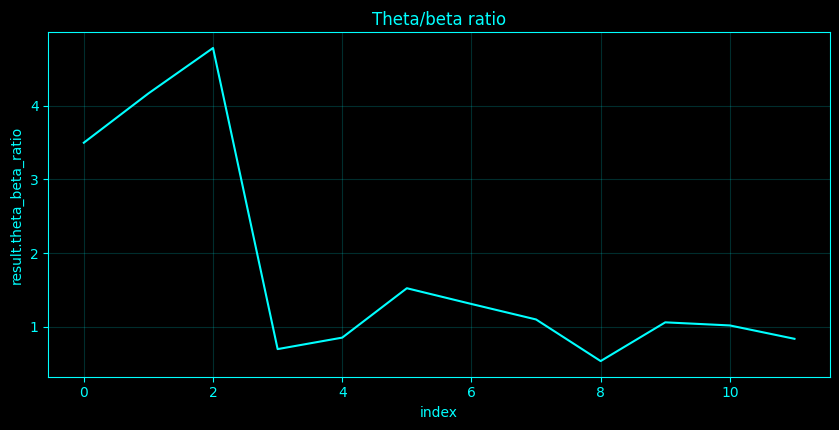

In [138]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_138():
    idx = 138
    name = 'Theta/beta ratio'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    return ({'theta_beta_ratio': (BP[:, bi['theta']] / (BP[:, bi['beta']] + EPS)).tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_138,_plot_spec=_compute_method_138()
print('Theta/beta ratio')
if isinstance(result_138,dict):
    for _k,_v in result_138.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_138)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_138)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Theta/beta ratio',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Theta/beta ratio',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Theta/beta ratio',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">139. Delta/alpha ratio</h3>
<p>This spectral ratio is \(P_\delta/P_\alpha\), computed from integrated Welch bandpowers with a small numerical denominator floor.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Delta/alpha ratio
  delta_alpha_ratio: array(12,), mean=4.47538


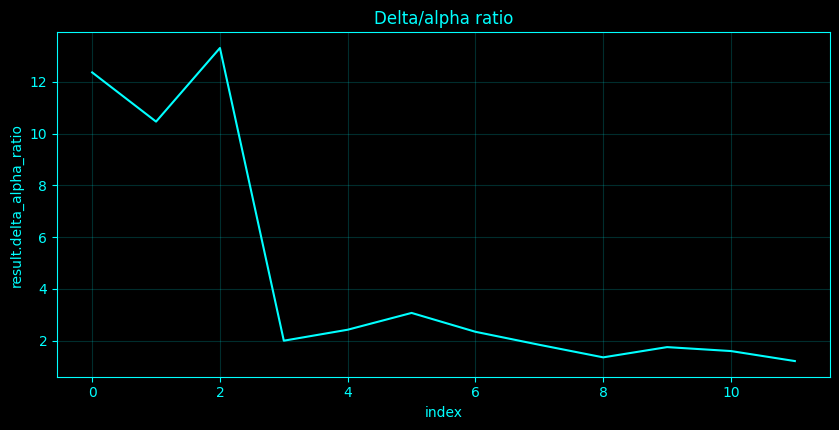

In [139]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_139():
    idx = 139
    name = 'Delta/alpha ratio'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    return ({'delta_alpha_ratio': (BP[:, bi['delta']] / (BP[:, bi['alpha']] + EPS)).tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_139,_plot_spec=_compute_method_139()
print('Delta/alpha ratio')
if isinstance(result_139,dict):
    for _k,_v in result_139.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_139)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_139)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Delta/alpha ratio',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Delta/alpha ratio',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Delta/alpha ratio',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">140. Alpha reactivity index</h3>
<p>True alpha reactivity requires labeled conditions such as eyes open/closed. With one unlabeled continuous segment, this cell reports only an internal high-versus-low alpha-envelope state contrast and labels it as a proxy.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [140]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_140():
    idx = 140
    name = 'Alpha reactivity index'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    env = np.mean(np.abs(_analytic_band(BANDS['alpha'])), axis=1)
    lo = env <= np.quantile(env, 0.25)
    hi = env >= np.quantile(env, 0.75)
    return ({'internal_alpha_state_reactivity_proxy': float((np.mean(env[hi]) - np.mean(env[lo])) / (np.mean(env[lo]) + EPS)), 'note': 'not physiological eyes-open/closed reactivity without condition labels'}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_140,_plot_spec=_compute_method_140()
print('Alpha reactivity index')
if isinstance(result_140,dict):
    for _k,_v in result_140.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_140)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_140)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Alpha reactivity index',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Alpha reactivity index',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Alpha reactivity index',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Alpha reactivity index
  internal_alpha_state_reactivity_proxy: 5.9245096889183895
  note: not physiological eyes-open/closed reactivity without condition labels


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">141. Posterior dominant rhythm stability</h3>
<p>Posterior dominant-rhythm stability tracks the 7–13-Hz peak of a posterior sensor average across windows and reports its temporal dispersion.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [141]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_141():
    idx = 141
    name = 'Posterior dominant rhythm stability'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    post = [CH_NAMES.index(ch) for ch in ROI['posterior'] if ch in CH_NAMES]
    if not post:
        return ({'status': 'posterior channels unavailable'}, locals().get('__plot_spec', None))
    yy = np.mean(X[:, post], axis=1)
    vals = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(yy[a:b, None])
        m = (ff >= 7) & (ff < 13)
        vals.append(float(ff[m][np.argmax(pp[m, 0])]))
    return ({'posterior_dominant_rhythm_SD_hz': float(np.std(vals))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_141,_plot_spec=_compute_method_141()
print('Posterior dominant rhythm stability')
if isinstance(result_141,dict):
    for _k,_v in result_141.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_141)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_141)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Posterior dominant rhythm stability',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Posterior dominant rhythm stability',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Posterior dominant rhythm stability',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Posterior dominant rhythm stability
  status: posterior channels unavailable


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">142. Peak alpha bandwidth</h3>
<p>Alpha-peak morphology is measured on the aperiodic-corrected 7–13-Hz residual: half-prominence bandwidth, prominence, number/separation of peaks, and double-peak detection are distinct descriptors.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [142]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

# Method-specific calculation.
def _compute_method_142():
    idx = 142
    name = 'Peak alpha bandwidth'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    p = np.mean(P, axis=1)
    _, _, res, ap = _peak_params(p, f, (7, 13))
    m = (f >= 7) & (f < 13)
    rr = res[m]
    pk, props = signal.find_peaks(rr, prominence=max(0.01, np.std(rr) * 0.25))
    if not len(pk):
        return ({'alpha_bandwidth_hz': np.nan}, locals().get('__plot_spec', None))
    k = pk[np.argmax(props['prominences'])]
    w = signal.peak_widths(rr, [k], rel_height=0.5)[0][0] * np.median(np.diff(f))
    return ({'alpha_bandwidth_hz': float(w)}, locals().get('__plot_spec', None))
    fi = f[m][pk] if len(pk) else np.array([])
    return ({'double_alpha_detected': bool(len(fi) >= 2 and np.max(fi) - np.min(fi) >= 1.0), 'peaks_hz': fi.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_142,_plot_spec=_compute_method_142()
print('Peak alpha bandwidth')
if isinstance(result_142,dict):
    for _k,_v in result_142.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_142)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_142)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Peak alpha bandwidth',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Peak alpha bandwidth',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Peak alpha bandwidth',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Peak alpha bandwidth
  alpha_bandwidth_hz: 1.3913324324323755


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">143. Alpha peak prominence</h3>
<p>Alpha-peak morphology is measured on the aperiodic-corrected 7–13-Hz residual: half-prominence bandwidth, prominence, number/separation of peaks, and double-peak detection are distinct descriptors.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [143]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

# Method-specific calculation.
def _compute_method_143():
    idx = 143
    name = 'Alpha peak prominence'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    p = np.mean(P, axis=1)
    _, _, res, ap = _peak_params(p, f, (7, 13))
    m = (f >= 7) & (f < 13)
    rr = res[m]
    pk, props = signal.find_peaks(rr, prominence=max(0.01, np.std(rr) * 0.25))
    return ({'alpha_peak_prominence': float(np.max(props['prominences'])) if len(pk) else np.nan}, locals().get('__plot_spec', None))
    fi = f[m][pk] if len(pk) else np.array([])
    return ({'double_alpha_detected': bool(len(fi) >= 2 and np.max(fi) - np.min(fi) >= 1.0), 'peaks_hz': fi.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_143,_plot_spec=_compute_method_143()
print('Alpha peak prominence')
if isinstance(result_143,dict):
    for _k,_v in result_143.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_143)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_143)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Alpha peak prominence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Alpha peak prominence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Alpha peak prominence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Alpha peak prominence
  alpha_peak_prominence: 0.6963329011439954


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">144. Alpha peak splitting</h3>
<p>Alpha-peak morphology is measured on the aperiodic-corrected 7–13-Hz residual: half-prominence bandwidth, prominence, number/separation of peaks, and double-peak detection are distinct descriptors.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Alpha peak splitting
  alpha_peak_count: 2
  splitting_hz: 2.44140625


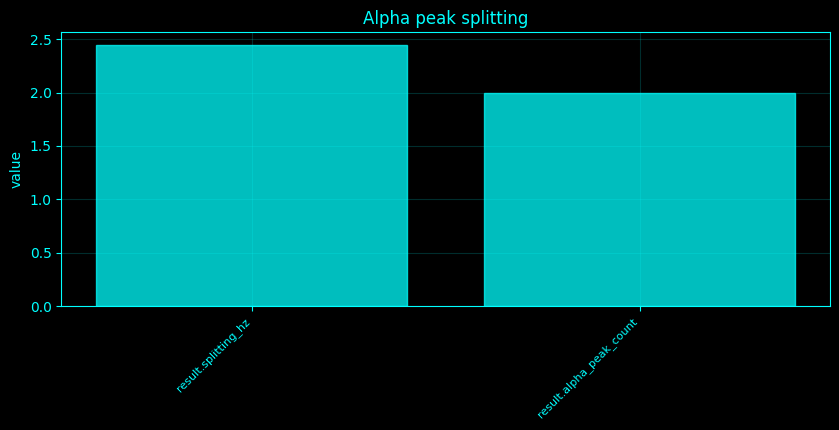

In [144]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

# Method-specific calculation.
def _compute_method_144():
    idx = 144
    name = 'Alpha peak splitting'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    p = np.mean(P, axis=1)
    _, _, res, ap = _peak_params(p, f, (7, 13))
    m = (f >= 7) & (f < 13)
    rr = res[m]
    pk, props = signal.find_peaks(rr, prominence=max(0.01, np.std(rr) * 0.25))
    fi = f[m][pk] if len(pk) else np.array([])
    return ({'alpha_peak_count': int(len(fi)), 'splitting_hz': float(np.max(fi) - np.min(fi)) if len(fi) >= 2 else 0.0}, locals().get('__plot_spec', None))
    return ({'double_alpha_detected': bool(len(fi) >= 2 and np.max(fi) - np.min(fi) >= 1.0), 'peaks_hz': fi.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_144,_plot_spec=_compute_method_144()
print('Alpha peak splitting')
if isinstance(result_144,dict):
    for _k,_v in result_144.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_144)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_144)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Alpha peak splitting',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Alpha peak splitting',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Alpha peak splitting',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">145. Double-alpha peak detection</h3>
<p>Alpha-peak morphology is measured on the aperiodic-corrected 7–13-Hz residual: half-prominence bandwidth, prominence, number/separation of peaks, and double-peak detection are distinct descriptors.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Double-alpha peak detection
  double_alpha_detected: True
  peaks_hz: array(2,), mean=9.27734


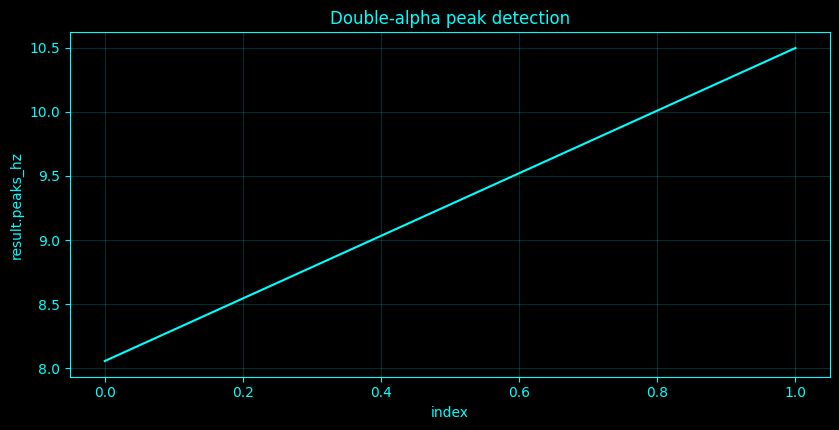

In [145]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

def _peak_params(psd=None, f=None, band=(4, 30)):
    if f is None or psd is None:
        f, P = _welch_all()
        psd = np.mean(P, axis=1)
    _, _, ap = _aperiodic_params(psd, f)
    res = np.log10(psd + EPS) - np.log10(ap + EPS)
    m = (f >= band[0]) & (f <= band[1])
    peaks, props = signal.find_peaks(res[m], prominence=max(0.02, np.std(res[m]) * 0.3))
    fi = f[m][peaks]
    prom = props.get('prominences', np.array([]))
    return (fi, prom, res, ap)

# Method-specific calculation.
def _compute_method_145():
    idx = 145
    name = 'Double-alpha peak detection'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    p = np.mean(P, axis=1)
    _, _, res, ap = _peak_params(p, f, (7, 13))
    m = (f >= 7) & (f < 13)
    rr = res[m]
    pk, props = signal.find_peaks(rr, prominence=max(0.01, np.std(rr) * 0.25))
    fi = f[m][pk] if len(pk) else np.array([])
    return ({'double_alpha_detected': bool(len(fi) >= 2 and np.max(fi) - np.min(fi) >= 1.0), 'peaks_hz': fi.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_145,_plot_spec=_compute_method_145()
print('Double-alpha peak detection')
if isinstance(result_145,dict):
    for _k,_v in result_145.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_145)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_145)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Double-alpha peak detection',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Double-alpha peak detection',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Double-alpha peak detection',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">146. Regional alpha frequency gradients</h3>
<p>Regional alpha-frequency gradient is the least-squares slope of channel alpha-peak frequency versus anterior-posterior electrode coordinate.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [146]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_146():
    idx = 146
    name = 'Regional alpha frequency gradients'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    vals = np.array([channel_peak(j, (7, 13)) for j in range(C)])
    ycoord = np.array([ELECTRODE_XY.get(ch, (0, 0))[1] for ch in CH_NAMES])
    return ({'posterior_anterior_IAF_gradient_hz_per_unit': float(np.polyfit(ycoord, vals, 1)[0])}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_146,_plot_spec=_compute_method_146()
print('Regional alpha frequency gradients')
if isinstance(result_146,dict):
    for _k,_v in result_146.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_146)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_146)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Regional alpha frequency gradients',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Regional alpha frequency gradients',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Regional alpha frequency gradients',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Regional alpha frequency gradients
  posterior_anterior_IAF_gradient_hz_per_unit: -4.4336218872196005


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">147. Left-right alpha frequency asymmetry</h3>
<p>Left-right alpha-frequency asymmetry is the difference in alpha peak frequency between homologous sensor pairs.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Left-right alpha frequency asymmetry
  left_minus_right_IAF_hz: array(2,), mean=0
  mean: 0.0


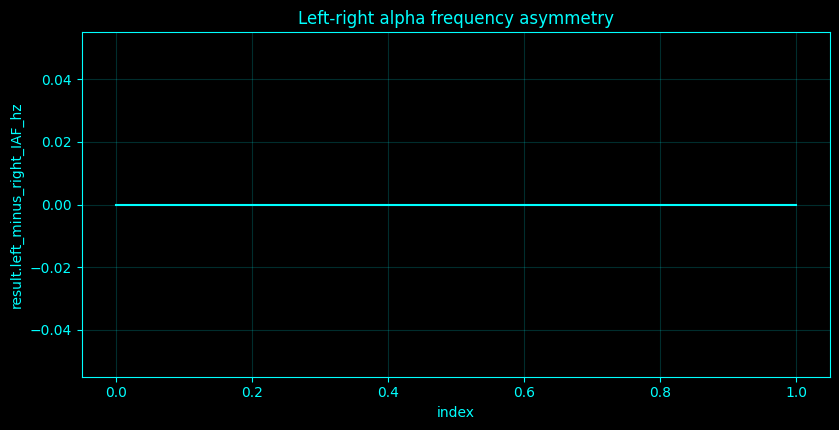

In [147]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_147():
    idx = 147
    name = 'Left-right alpha frequency asymmetry'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    pairs = [('Fp1', 'Fp2'), ('F3', 'F4'), ('C3', 'C4'), ('P3', 'P4'), ('O1', 'O2')]
    d = []
    for l, r in pairs:
        if l in CH_NAMES and r in CH_NAMES:
            d.append(channel_peak(CH_NAMES.index(l), (7, 13)) - channel_peak(CH_NAMES.index(r), (7, 13)))
    return ({'left_minus_right_IAF_hz': d, 'mean': float(np.mean(d)) if d else np.nan}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_147,_plot_spec=_compute_method_147()
print('Left-right alpha frequency asymmetry')
if isinstance(result_147,dict):
    for _k,_v in result_147.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_147)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_147)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Left-right alpha frequency asymmetry',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Left-right alpha frequency asymmetry',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Left-right alpha frequency asymmetry',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">148. Spectral edge frequency trajectories</h3>
<p>Spectral edge frequency SEF95 is the frequency below which 95% of in-band power accumulates; the cell tracks this quantity across windows.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral edge frequency trajectories
  SEF95_trajectory_hz: array(48,), mean=33.5593


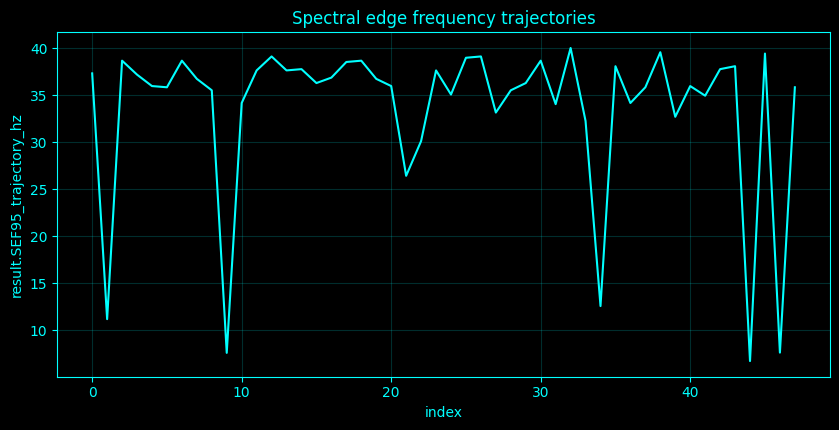

In [148]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _aperiodic_params(psd=None, f=None):
    if f is None or psd is None:
        f, Pa = _welch_all()
        psd = np.mean(Pa, axis=1)
    m = (f >= 2) & (f <= 45)
    x = np.log10(f[m])
    y = np.log10(psd[m] + EPS)
    coef = np.polyfit(x, y, 1)
    offset, exponent = (float(coef[1]), float(-coef[0]))
    fit = 10 ** (offset - exponent * np.log10(f + EPS))
    return (offset, exponent, fit)

# Method-specific calculation.
def _compute_method_148():
    idx = 148
    name = 'Spectral edge frequency trajectories'
    __plot_spec = None
    t, W = _window_bandpower()
    nwin = len(t)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    trajectories = []
    slopes = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(_SPEED['nperseg'], b - a))
        p0 = pp[:, 0]
        _, e, _ = _aperiodic_params(p0, ff)
        slopes.append(e)

        def peak_band(band):
            m = (ff >= band[0]) & (ff < min(band[1], 0.49 * _fs))
            return float(ff[m][np.argmax(p0[m])]) if np.any(m) else np.nan
        trajectories.append([peak_band(BANDS['theta']), peak_band(BANDS['alpha']), peak_band(BANDS['beta']), peak_band(BANDS['gamma'])])
    T = np.asarray(trajectories)
    alpha = T[:, 1]
    dt = float(np.median(np.diff(t))) if len(t) > 1 else 1.0
    v = np.gradient(alpha, dt)
    acc = np.gradient(v, dt)
    f, P = _welch_all()

    def channel_peak(j, band):
        m = (f >= band[0]) & (f < min(band[1], 0.49 * _fs))
        return float(f[m][np.argmax(P[m, j])]) if np.any(m) else np.nan
    _, BP = _bandpower_matrix()
    bi = {k: i for i, k in enumerate(BANDS)}
    vals = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]])
        q = pp[:, 0]
        mask = (ff >= 1) & (ff <= 45)
        cdf = np.cumsum(q[mask])
        cdf /= cdf[-1] + EPS
        vals.append(float(ff[mask][np.searchsorted(cdf, 0.95)]))
    return ({'SEF95_trajectory_hz': vals}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_148,_plot_spec=_compute_method_148()
print('Spectral edge frequency trajectories')
if isinstance(result_148,dict):
    for _k,_v in result_148.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_148)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_148)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral edge frequency trajectories',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral edge frequency trajectories',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral edge frequency trajectories',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">149. Median frequency</h3>
<p>Median frequency \(f_{50}\) satisfies \(\int^{f_{50}}P(f)df=0.5\int P(f)df\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [149]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

# Method-specific calculation.
def _compute_method_149():
    idx = 149
    name = 'Median frequency'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    m = (f >= 1) & (f <= 45)
    ff = f[m]
    q = p[m]
    q = q / (np.trapz(q, ff) + EPS)
    cdf = np.cumsum(q)
    cdf /= cdf[-1] + EPS
    mean = float(np.trapz(ff * q, ff))
    var = float(np.trapz((ff - mean) ** 2 * q, ff))
    sd = np.sqrt(max(var, 0))
    return ({'median_frequency_hz': float(ff[np.searchsorted(cdf, 0.5)])}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_149,_plot_spec=_compute_method_149()
print('Median frequency')
if isinstance(result_149,dict):
    for _k,_v in result_149.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_149)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_149)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Median frequency',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Median frequency',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Median frequency',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Median frequency
  median_frequency_hz: 5.126953125


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">150. Mean frequency</h3>
<p>Mean frequency is the first spectral moment \(\mu_f=\int fP(f)df/\int P(f)df\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [150]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

# Method-specific calculation.
def _compute_method_150():
    idx = 150
    name = 'Mean frequency'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    m = (f >= 1) & (f <= 45)
    ff = f[m]
    q = p[m]
    q = q / (np.trapz(q, ff) + EPS)
    cdf = np.cumsum(q)
    cdf /= cdf[-1] + EPS
    mean = float(np.trapz(ff * q, ff))
    var = float(np.trapz((ff - mean) ** 2 * q, ff))
    sd = np.sqrt(max(var, 0))
    return ({'mean_frequency_hz': mean}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_150,_plot_spec=_compute_method_150()
print('Mean frequency')
if isinstance(result_150,dict):
    for _k,_v in result_150.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_150)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_150)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Mean frequency',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Mean frequency',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Mean frequency',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Mean frequency
  mean_frequency_hz: 10.123076994109894


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">151. Spectral bandwidth</h3>
<p>Occupied spectral bandwidth is defined here as \(f_{95}-f_{05}\), the central 90% power interval.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral bandwidth
  occupied_90_percent_bandwidth_hz: 32.958984375
  low: 1.220703125
  high: 34.1796875


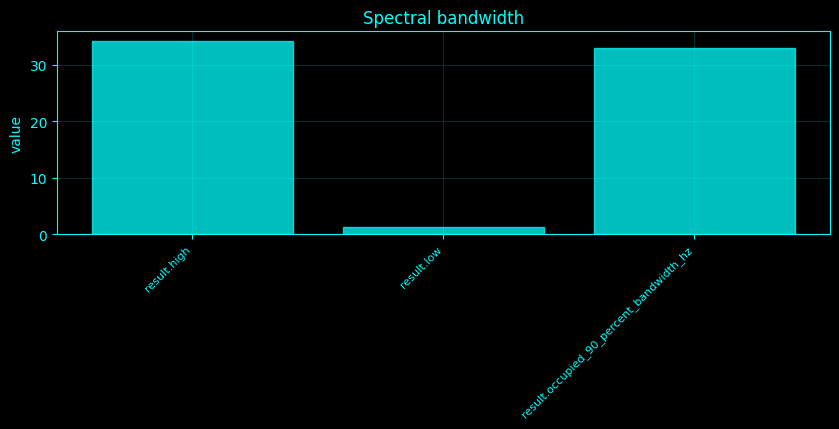

In [151]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

# Method-specific calculation.
def _compute_method_151():
    idx = 151
    name = 'Spectral bandwidth'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    m = (f >= 1) & (f <= 45)
    ff = f[m]
    q = p[m]
    q = q / (np.trapz(q, ff) + EPS)
    cdf = np.cumsum(q)
    cdf /= cdf[-1] + EPS
    mean = float(np.trapz(ff * q, ff))
    var = float(np.trapz((ff - mean) ** 2 * q, ff))
    sd = np.sqrt(max(var, 0))
    lo = float(ff[np.searchsorted(cdf, 0.05)])
    hi = float(ff[np.searchsorted(cdf, 0.95)])
    return ({'occupied_90_percent_bandwidth_hz': hi - lo, 'low': lo, 'high': hi}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_151,_plot_spec=_compute_method_151()
print('Spectral bandwidth')
if isinstance(result_151,dict):
    for _k,_v in result_151.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_151)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_151)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral bandwidth',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral bandwidth',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral bandwidth',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">152. Spectral spread</h3>
<p>Spectral spread is the RMS deviation from mean frequency, \(\sigma_f=[\int(f-\mu_f)^2p(f)df]^{1/2}\), distinct from occupied bandwidth.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [152]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

# Method-specific calculation.
def _compute_method_152():
    idx = 152
    name = 'Spectral spread'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    m = (f >= 1) & (f <= 45)
    ff = f[m]
    q = p[m]
    q = q / (np.trapz(q, ff) + EPS)
    cdf = np.cumsum(q)
    cdf /= cdf[-1] + EPS
    mean = float(np.trapz(ff * q, ff))
    var = float(np.trapz((ff - mean) ** 2 * q, ff))
    sd = np.sqrt(max(var, 0))
    return ({'spectral_spread_hz': float(sd)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_152,_plot_spec=_compute_method_152()
print('Spectral spread')
if isinstance(result_152,dict):
    for _k,_v in result_152.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_152)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_152)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral spread',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral spread',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral spread',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral spread
  spectral_spread_hz: 10.482633792431287


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">153. Spectral skewness</h3>
<p>Spectral skewness is the normalized third central moment \(E[((f-\mu_f)/\sigma_f)^3]\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [153]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

# Method-specific calculation.
def _compute_method_153():
    idx = 153
    name = 'Spectral skewness'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    m = (f >= 1) & (f <= 45)
    ff = f[m]
    q = p[m]
    q = q / (np.trapz(q, ff) + EPS)
    cdf = np.cumsum(q)
    cdf /= cdf[-1] + EPS
    mean = float(np.trapz(ff * q, ff))
    var = float(np.trapz((ff - mean) ** 2 * q, ff))
    sd = np.sqrt(max(var, 0))
    return ({'spectral_skewness': float(np.trapz(((ff - mean) / (sd + EPS)) ** 3 * q, ff))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_153,_plot_spec=_compute_method_153()
print('Spectral skewness')
if isinstance(result_153,dict):
    for _k,_v in result_153.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_153)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_153)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral skewness',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral skewness',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral skewness',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral skewness
  spectral_skewness: 1.4953495514961888


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">154. Spectral kurtosis</h3>
<p>Spectral kurtosis is the normalized fourth central moment \(E[((f-\mu_f)/\sigma_f)^4]\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [154]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

# Method-specific calculation.
def _compute_method_154():
    idx = 154
    name = 'Spectral kurtosis'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    m = (f >= 1) & (f <= 45)
    ff = f[m]
    q = p[m]
    q = q / (np.trapz(q, ff) + EPS)
    cdf = np.cumsum(q)
    cdf /= cdf[-1] + EPS
    mean = float(np.trapz(ff * q, ff))
    var = float(np.trapz((ff - mean) ** 2 * q, ff))
    sd = np.sqrt(max(var, 0))
    return ({'spectral_kurtosis': float(np.trapz(((ff - mean) / (sd + EPS)) ** 4 * q, ff))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_154,_plot_spec=_compute_method_154()
print('Spectral kurtosis')
if isinstance(result_154,dict):
    for _k,_v in result_154.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_154)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_154)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral kurtosis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral kurtosis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral kurtosis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral kurtosis
  spectral_kurtosis: 4.331133425590246


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">155. Spectral flatness</h3>
<p>Spectral flatness is geometric mean divided by arithmetic mean of PSD values; it approaches one for a flat spectrum and zero for strongly tonal spectra.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [155]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

# Method-specific calculation.
def _compute_method_155():
    idx = 155
    name = 'Spectral flatness'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    m = (f >= 1) & (f <= 45)
    ff = f[m]
    q = p[m]
    q = q / (np.trapz(q, ff) + EPS)
    cdf = np.cumsum(q)
    cdf /= cdf[-1] + EPS
    mean = float(np.trapz(ff * q, ff))
    var = float(np.trapz((ff - mean) ** 2 * q, ff))
    sd = np.sqrt(max(var, 0))
    return ({'spectral_flatness': float(np.exp(np.mean(np.log(p[m] + EPS))) / (np.mean(p[m]) + EPS))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_155,_plot_spec=_compute_method_155()
print('Spectral flatness')
if isinstance(result_155,dict):
    for _k,_v in result_155.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_155)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_155)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral flatness',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral flatness',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral flatness',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral flatness
  spectral_flatness: 0.5056488162812469


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">156. Spectral rolloff</h3>
<p>Spectral rolloff \(f_{85}\) is the frequency below which 85% of in-band power accumulates.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [156]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

# Method-specific calculation.
def _compute_method_156():
    idx = 156
    name = 'Spectral rolloff'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    m = (f >= 1) & (f <= 45)
    ff = f[m]
    q = p[m]
    q = q / (np.trapz(q, ff) + EPS)
    cdf = np.cumsum(q)
    cdf /= cdf[-1] + EPS
    mean = float(np.trapz(ff * q, ff))
    var = float(np.trapz((ff - mean) ** 2 * q, ff))
    sd = np.sqrt(max(var, 0))
    return ({'rolloff_85_hz': float(ff[np.searchsorted(cdf, 0.85)])}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_156,_plot_spec=_compute_method_156()
print('Spectral rolloff')
if isinstance(result_156,dict):
    for _k,_v in result_156.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_156)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_156)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral rolloff',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral rolloff',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral rolloff',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral rolloff
  rolloff_85_hz: 20.99609375


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">157. Spectral crest factor</h3>
<p>Spectral crest factor is peak PSD divided by mean PSD within the analysis band.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [157]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

# Method-specific calculation.
def _compute_method_157():
    idx = 157
    name = 'Spectral crest factor'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    m = (f >= 1) & (f <= 45)
    ff = f[m]
    q = p[m]
    q = q / (np.trapz(q, ff) + EPS)
    cdf = np.cumsum(q)
    cdf /= cdf[-1] + EPS
    mean = float(np.trapz(ff * q, ff))
    var = float(np.trapz((ff - mean) ** 2 * q, ff))
    sd = np.sqrt(max(var, 0))
    return ({'crest_factor': float(np.max(p[m]) / (np.mean(p[m]) + EPS))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_157,_plot_spec=_compute_method_157()
print('Spectral crest factor')
if isinstance(result_157,dict):
    for _k,_v in result_157.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_157)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_157)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral crest factor',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral crest factor',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral crest factor',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral crest factor
  crest_factor: 13.964933430747331


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">158. Spectral flux</h3>
<p>Spectral flux is the Euclidean distance between consecutive normalized log-spectral vectors, measuring frame-to-frame spectral change.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral flux
  mean_spectral_flux: 0.15470747446276972
  max: 0.20869180790431857


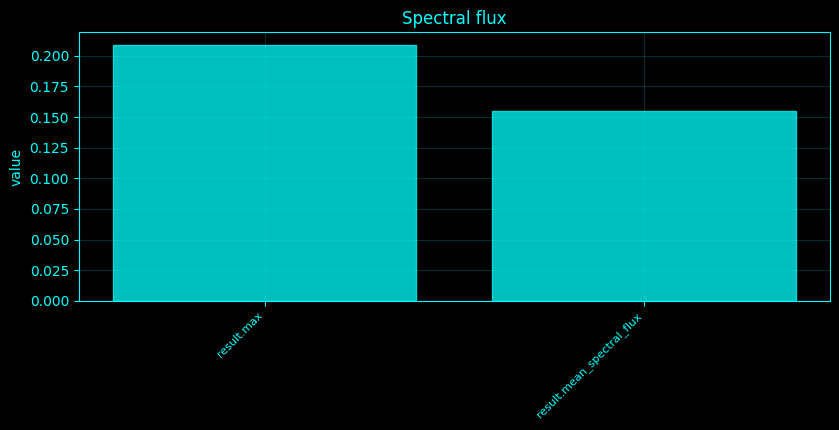

In [158]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

# Method-specific calculation.
def _compute_method_158():
    idx = 158
    name = 'Spectral flux'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    m = (f >= 1) & (f <= 45)
    ff = f[m]
    q = p[m]
    q = q / (np.trapz(q, ff) + EPS)
    cdf = np.cumsum(q)
    cdf /= cdf[-1] + EPS
    mean = float(np.trapz(ff * q, ff))
    var = float(np.trapz((ff - mean) ** 2 * q, ff))
    sd = np.sqrt(max(var, 0))
    _, _, S, _ = _stft_summary()
    Z = np.log(S[:, 0, :] + EPS).T
    Zn = Z / (np.linalg.norm(Z, axis=1, keepdims=True) + EPS)
    flux = np.linalg.norm(np.diff(Zn, axis=0), axis=1)
    return ({'mean_spectral_flux': float(np.mean(flux)), 'max': float(np.max(flux))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_158,_plot_spec=_compute_method_158()
print('Spectral flux')
if isinstance(result_158,dict):
    for _k,_v in result_158.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_158)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_158)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral flux',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral flux',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral flux',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">159. Spectral decrease</h3>
<p>Spectral decrease measures average decline relative to the first spectral bin, normalized by total later-bin energy; the cell reports the explicit finite-bin definition used.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [159]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

# Method-specific calculation.
def _compute_method_159():
    idx = 159
    name = 'Spectral decrease'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    m = (f >= 1) & (f <= 45)
    ff = f[m]
    q = p[m]
    q = q / (np.trapz(q, ff) + EPS)
    cdf = np.cumsum(q)
    cdf /= cdf[-1] + EPS
    mean = float(np.trapz(ff * q, ff))
    var = float(np.trapz((ff - mean) ** 2 * q, ff))
    sd = np.sqrt(max(var, 0))
    v = p[m]
    k = np.arange(1, len(v) + 1)
    dec = np.sum((v[1:] - v[0]) / (k[1:] - 1 + EPS)) / (np.sum(v[1:]) + EPS)
    return ({'spectral_decrease': float(dec)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_159,_plot_spec=_compute_method_159()
print('Spectral decrease')
if isinstance(result_159,dict):
    for _k,_v in result_159.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_159)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_159)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral decrease',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral decrease',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral decrease',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral decrease
  spectral_decrease: -0.33491990600524374


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">160. Spectral contrast</h3>
<p>Spectral contrast compares local maximum and minimum power within log-spaced subbands, reported in decibels.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral contrast
  band_contrast_db: array(6,), mean=4.72044
  mean: 4.720442629756465


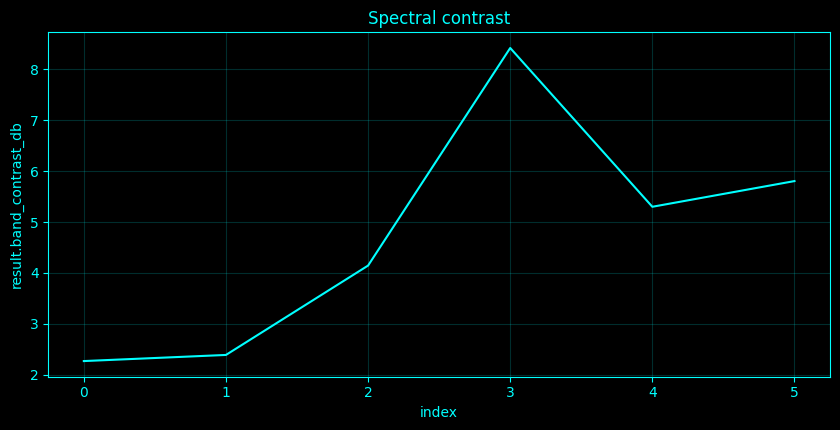

In [160]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

# Method-specific calculation.
def _compute_method_160():
    idx = 160
    name = 'Spectral contrast'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    m = (f >= 1) & (f <= 45)
    ff = f[m]
    q = p[m]
    q = q / (np.trapz(q, ff) + EPS)
    cdf = np.cumsum(q)
    cdf /= cdf[-1] + EPS
    mean = float(np.trapz(ff * q, ff))
    var = float(np.trapz((ff - mean) ** 2 * q, ff))
    sd = np.sqrt(max(var, 0))
    edges = np.geomspace(2, 45, 7)
    vals = []
    for a, b in zip(edges[:-1], edges[1:]):
        z = p[(f >= a) & (f < b)]
        if len(z):
            vals.append(float(10 * np.log10((np.max(z) + EPS) / (np.min(z) + EPS))))
    return ({'band_contrast_db': vals, 'mean': float(np.mean(vals))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_160,_plot_spec=_compute_method_160()
print('Spectral contrast')
if isinstance(result_160,dict):
    for _k,_v in result_160.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_160)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_160)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral contrast',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral contrast',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral contrast',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">161. Spectral irregularity</h3>
<p>Spectral irregularity is normalized adjacent-bin roughness, \(\sum_k(P_{k+1}-P_k)^2/\sum_kP_k^2\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [161]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

# Method-specific calculation.
def _compute_method_161():
    idx = 161
    name = 'Spectral irregularity'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    m = (f >= 1) & (f <= 45)
    ff = f[m]
    q = p[m]
    q = q / (np.trapz(q, ff) + EPS)
    cdf = np.cumsum(q)
    cdf /= cdf[-1] + EPS
    mean = float(np.trapz(ff * q, ff))
    var = float(np.trapz((ff - mean) ** 2 * q, ff))
    sd = np.sqrt(max(var, 0))
    v = p[m]
    irr = np.sum(np.diff(v) ** 2) / (np.sum(v ** 2) + EPS)
    return ({'spectral_irregularity': float(irr)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_161,_plot_spec=_compute_method_161()
print('Spectral irregularity')
if isinstance(result_161,dict):
    for _k,_v in result_161.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_161)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_161)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral irregularity',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral irregularity',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral irregularity',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral irregularity
  spectral_irregularity: 0.049015697573241576


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">162. Spectral sharpness</h3>
<p>Spectral sharpness is defined explicitly here as the absolute second derivative of log PSD with respect to frequency at the dominant peak; larger curvature means a sharper peak.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [162]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

# Method-specific calculation.
def _compute_method_162():
    idx = 162
    name = 'Spectral sharpness'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    m = (f >= 1) & (f <= 45)
    ff = f[m]
    q = p[m]
    q = q / (np.trapz(q, ff) + EPS)
    cdf = np.cumsum(q)
    cdf /= cdf[-1] + EPS
    mean = float(np.trapz(ff * q, ff))
    var = float(np.trapz((ff - mean) ** 2 * q, ff))
    sd = np.sqrt(max(var, 0))
    lp = np.log(p[m] + EPS)
    k = np.argmax(lp)
    sec = np.gradient(np.gradient(lp, ff), ff)
    return ({'peak_sharpness_abs_second_derivative': float(abs(sec[k]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_162,_plot_spec=_compute_method_162()
print('Spectral sharpness')
if isinstance(result_162,dict):
    for _k,_v in result_162.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_162)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_162)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral sharpness',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral sharpness',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral sharpness',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral sharpness
  peak_sharpness_abs_second_derivative: 0.8315197770983878


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">163. Spectral slope moments</h3>
<p>Spectral slope moments summarize the distribution of \(d\log P/d\log f\) across frequency by its mean, standard deviation, and skewness.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral slope moments
  slope_mean: -1.4240025770560143
  slope_sd: 11.568936537801589
  slope_skew: -1.098280560880268


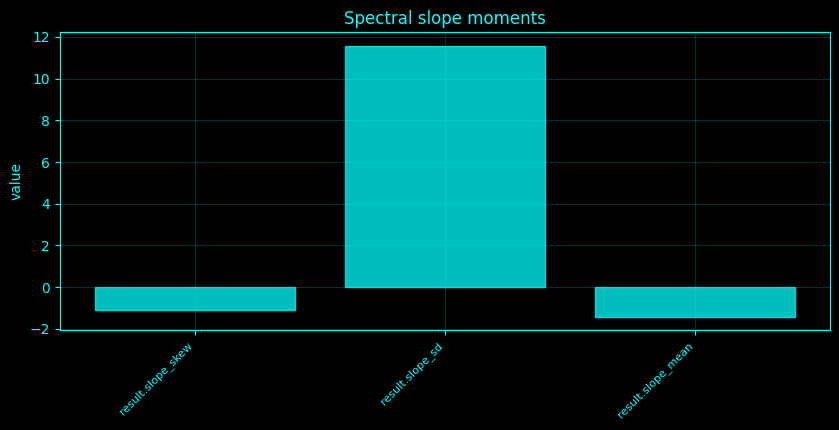

In [163]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

# Method-specific calculation.
def _compute_method_163():
    idx = 163
    name = 'Spectral slope moments'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    m = (f >= 1) & (f <= 45)
    ff = f[m]
    q = p[m]
    q = q / (np.trapz(q, ff) + EPS)
    cdf = np.cumsum(q)
    cdf /= cdf[-1] + EPS
    mean = float(np.trapz(ff * q, ff))
    var = float(np.trapz((ff - mean) ** 2 * q, ff))
    sd = np.sqrt(max(var, 0))
    slope = np.gradient(np.log(p[m] + EPS), np.log(ff + EPS))
    return ({'slope_mean': float(np.mean(slope)), 'slope_sd': float(np.std(slope)), 'slope_skew': float(stats.skew(slope))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_163,_plot_spec=_compute_method_163()
print('Spectral slope moments')
if isinstance(result_163,dict):
    for _k,_v in result_163.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_163)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_163)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral slope moments',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral slope moments',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral slope moments',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">164. Spectral shape fingerprints</h3>
<p>A spectral shape fingerprint concatenates standardized bandpowers, aperiodic exponent, dominant peak frequency, and entropy into a per-channel descriptor.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral shape fingerprints
  channel_spectral_shape_fingerprints: array(12, 8), mean=2.38235e-16


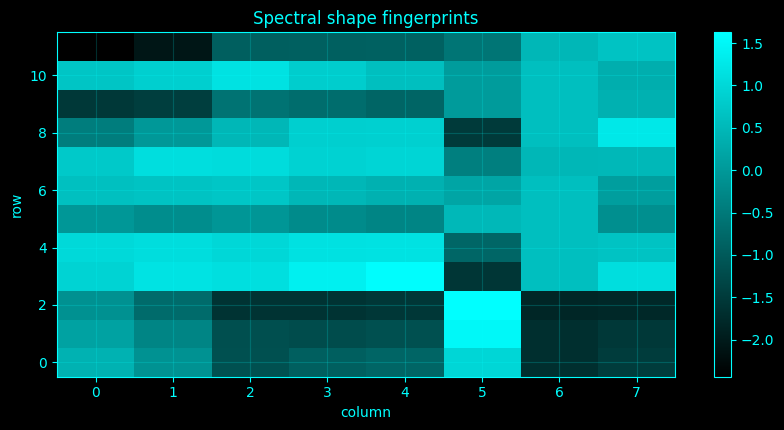

In [164]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_164():
    idx = 164
    name = 'Spectral shape fingerprints'
    __plot_spec = None
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    m = (f >= 1) & (f <= 45)
    ff = f[m]
    q = p[m]
    q = q / (np.trapz(q, ff) + EPS)
    cdf = np.cumsum(q)
    cdf /= cdf[-1] + EPS
    mean = float(np.trapz(ff * q, ff))
    var = float(np.trapz((ff - mean) ** 2 * q, ff))
    sd = np.sqrt(max(var, 0))
    F, sl, pk, en = _spectral_features()
    return ({'channel_spectral_shape_fingerprints': F}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_164,_plot_spec=_compute_method_164()
print('Spectral shape fingerprints')
if isinstance(result_164,dict):
    for _k,_v in result_164.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_164)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_164)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral shape fingerprints',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral shape fingerprints',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral shape fingerprints',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">165. Reassigned spectrogram</h3>
<p>A reassigned spectrogram uses STFT phase derivatives to move energy from the nominal bin \((t,f)\) to a local instantaneous-frequency estimate, sharpening smeared ridges.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [165]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.


# Method-specific calculation.
def _compute_method_165():
    idx = 165
    name = 'Reassigned spectrogram'
    __plot_spec = None
    n = min(_SPEED['nperseg'], N)
    no = n // 2
    ff, tt, Z = signal.stft(X[:, 0], fs=_fs, nperseg=n, noverlap=no, boundary=None, padded=False)
    ph = np.unwrap(np.angle(Z), axis=1)
    inst = np.gradient(ph, tt, axis=1) / (2 * np.pi) + ff[:, None]
    P = np.abs(Z) ** 2
    keep = (ff >= 1) & (ff <= min(45, 0.49 * _fs))
    grid = ff[keep]
    R = np.zeros((len(grid), P.shape[1]))
    for ti in range(P.shape[1]):
        ids = np.searchsorted(grid, inst[keep, ti])
        ids = np.clip(ids, 0, len(grid) - 1)
        np.add.at(R[:, ti], ids, P[keep, ti])
    __plot_spec = ('summary', np.log(R + EPS), name, None, '', 'value')
    return ({'reassigned_energy_fraction': float(np.sum(R) / (np.sum(P[keep]) + EPS))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_165,_plot_spec=_compute_method_165()
print('Reassigned spectrogram')
if isinstance(result_165,dict):
    for _k,_v in result_165.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_165)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_165)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Reassigned spectrogram',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Reassigned spectrogram',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Reassigned spectrogram',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Reassigned spectrogram
  reassigned_energy_fraction: 0.9999999999989231


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">166. Synchrosqueezed STFT</h3>
<p>Synchrosqueezed STFT reallocates STFT energy along the frequency axis according to local phase-derived instantaneous frequency while retaining the time coordinate.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [ ]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.


# Method-specific calculation.
def _compute_method_166():
    idx = 166
    name = 'Synchrosqueezed STFT'
    __plot_spec = None
    n = min(_SPEED['nperseg'], N)
    no = n // 2
    ff, tt, Z = signal.stft(X[:, 0], fs=_fs, nperseg=n, noverlap=no, boundary=None, padded=False)
    ph = np.unwrap(np.angle(Z), axis=1)
    inst = np.gradient(ph, tt, axis=1) / (2 * np.pi) + ff[:, None]
    P = np.abs(Z) ** 2
    keep = (ff >= 1) & (ff <= min(45, 0.49 * _fs))
    grid = ff[keep]
    R = np.zeros((len(grid), P.shape[1]))
    for ti in range(P.shape[1]):
        ids = np.searchsorted(grid, inst[keep, ti])
        ids = np.clip(ids, 0, len(grid) - 1)
        np.add.at(R[:, ti], ids, P[keep, ti])
    __plot_spec = ('summary', np.log(R + EPS), name, None, '', 'value')
    return ({'reassigned_energy_fraction': float(np.sum(R) / (np.sum(P[keep]) + EPS))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_166,_plot_spec=_compute_method_166()
print('Synchrosqueezed STFT')
if isinstance(result_166,dict):
    for _k,_v in result_166.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_166)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_166)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Synchrosqueezed STFT',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Synchrosqueezed STFT',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Synchrosqueezed STFT',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">167. Synchrosqueezed wavelet transform</h3>
<p>Synchrosqueezed wavelet analysis computes a complex Morlet CWT, estimates instantaneous frequency from wavelet phase derivatives, and reallocates wavelet energy to that frequency.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Synchrosqueezed wavelet transform
  synchrosqueezed_CWT_shape: array(2,), mean=6700


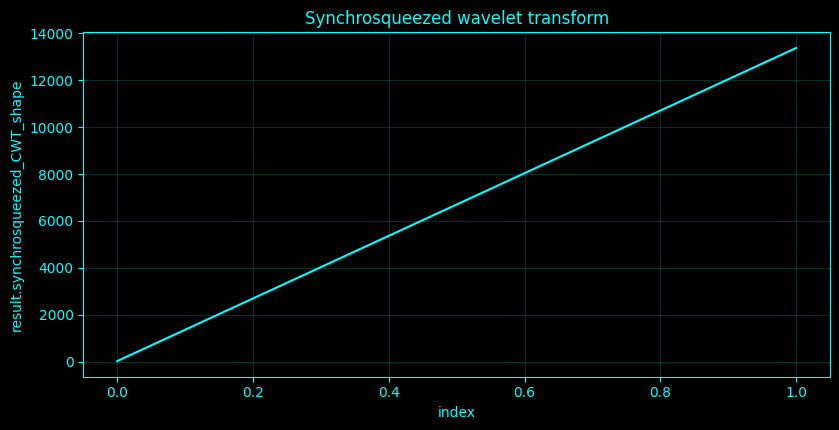

In [1]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _morlet_scalogram(ch=0, freqs=None, n_cycles=7.0):
    if freqs is None:
        freqs = np.geomspace(2, min(45, 0.4 * _fs), 32)
    y = X[:, ch]
    coeff = []
    for ff in freqs:
        sigt = n_cycles / (2 * np.pi * ff)
        half = int(max(8, 4 * sigt * _fs))
        tt = np.arange(-half, half + 1) / _fs
        w = np.exp(2j * np.pi * ff * tt) * np.exp(-tt ** 2 / (2 * sigt ** 2))
        w /= np.sqrt(np.sum(np.abs(w) ** 2) + EPS)
        coeff.append(signal.fftconvolve(y, np.conj(w[::-1]), mode='same'))
    Cw = np.asarray(coeff)
    return (np.asarray(freqs), Cw)

# Method-specific calculation.
def _compute_method_167():
    idx = 167
    name = 'Synchrosqueezed wavelet transform'
    __plot_spec = None
    fre, Cw = _morlet_scalogram()
    ph = np.unwrap(np.angle(Cw), axis=1)
    inst = np.gradient(ph, 1 / _fs, axis=1) / (2 * np.pi)
    P = np.abs(Cw) ** 2
    R = np.zeros_like(P)
    for ti in range(P.shape[1]):
        ids = np.searchsorted(fre, inst[:, ti])
        ids = np.clip(ids, 0, len(fre) - 1)
        np.add.at(R[:, ti], ids, P[:, ti])
    return ({'synchrosqueezed_CWT_shape': R.shape}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_167,_plot_spec=_compute_method_167()
print('Synchrosqueezed wavelet transform')
if isinstance(result_167,dict):
    for _k,_v in result_167.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_167)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_167)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Synchrosqueezed wavelet transform',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Synchrosqueezed wavelet transform',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Synchrosqueezed wavelet transform',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">168. Wigner-Ville distribution</h3>
<p>The Wigner-Ville distribution is \(W_x(t,f)=\int x_a(t+\tau/2)x_a^\ast(t-\tau/2)e^{-i2\pi f\tau}d\tau\). It has high resolution but produces bilinear cross-terms.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Wigner-Ville distribution
  time_frequency_shape: array(2,), mean=1280
  energy: 45804195.45601709


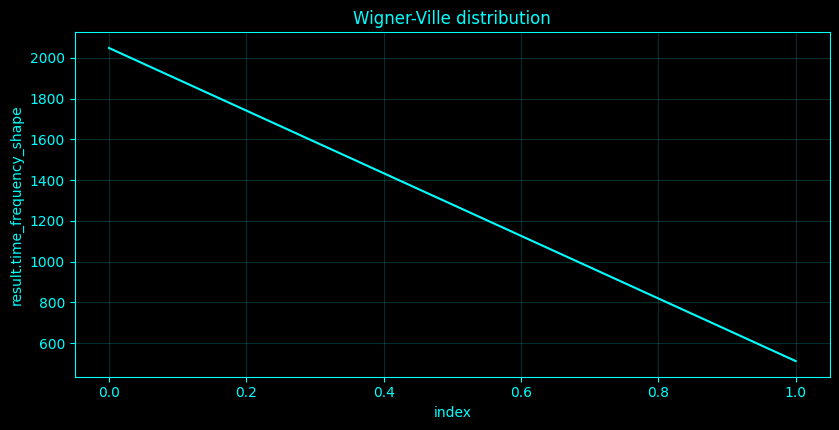

In [2]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.


# Method-specific calculation.
def _compute_method_168():
    idx = 168
    name = 'Wigner-Ville distribution'
    __plot_spec = None
    y = signal.hilbert(X[:min(N, 2048), 0])
    n = len(y)
    L = min(256, n // 2)
    W = np.zeros((n, 2 * L), float)
    lags = np.arange(-L, L)
    for t0 in range(n):
        valid = (t0 + lags >= 0) & (t0 - lags >= 0) & (t0 + lags < n) & (t0 - lags < n)
        r = np.zeros(2 * L, complex)
        lv = lags[valid]
        r[valid] = y[t0 + lv] * np.conj(y[t0 - lv])
        W[t0] = np.real(np.fft.fftshift(np.fft.fft(r)))
    return ({'time_frequency_shape': W.shape, 'energy': float(np.sum(np.abs(W)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_168,_plot_spec=_compute_method_168()
print('Wigner-Ville distribution')
if isinstance(result_168,dict):
    for _k,_v in result_168.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_168)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_168)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Wigner-Ville distribution',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Wigner-Ville distribution',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Wigner-Ville distribution',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">169. Smoothed pseudo-Wigner-Ville distribution</h3>
<p>Smoothed pseudo-Wigner-Ville suppresses WVD cross-terms by smoothing the bilinear distribution in time/frequency, trading resolution for interference reduction.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Smoothed pseudo-Wigner-Ville distribution
  time_frequency_shape: array(2,), mean=1280
  energy: 1977970.2162544266


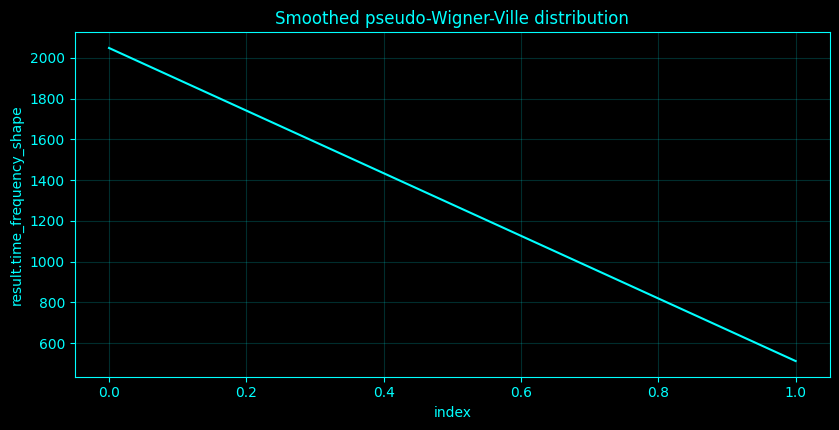

In [3]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.


# Method-specific calculation.
def _compute_method_169():
    idx = 169
    name = 'Smoothed pseudo-Wigner-Ville distribution'
    __plot_spec = None
    y = signal.hilbert(X[:min(N, 2048), 0])
    n = len(y)
    L = min(256, n // 2)
    W = np.zeros((n, 2 * L), float)
    lags = np.arange(-L, L)
    for t0 in range(n):
        valid = (t0 + lags >= 0) & (t0 - lags >= 0) & (t0 + lags < n) & (t0 - lags < n)
        r = np.zeros(2 * L, complex)
        lv = lags[valid]
        r[valid] = y[t0 + lv] * np.conj(y[t0 - lv])
        W[t0] = np.real(np.fft.fftshift(np.fft.fft(r)))
    W = ndimage.gaussian_filter(W, sigma=(2, 2))
    return ({'time_frequency_shape': W.shape, 'energy': float(np.sum(np.abs(W)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_169,_plot_spec=_compute_method_169()
print('Smoothed pseudo-Wigner-Ville distribution')
if isinstance(result_169,dict):
    for _k,_v in result_169.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_169)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_169)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Smoothed pseudo-Wigner-Ville distribution',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Smoothed pseudo-Wigner-Ville distribution',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Smoothed pseudo-Wigner-Ville distribution',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">170. Choi-Williams distribution</h3>
<p>The Choi-Williams Cohen-class kernel damps ambiguity-domain cross-terms with an exponential depending on the product of delay and Doppler variables. The cell applies that kernel numerically in the ambiguity domain.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Choi-Williams distribution
  time_frequency_shape: array(2,), mean=1280
  energy: 35443017.29524283


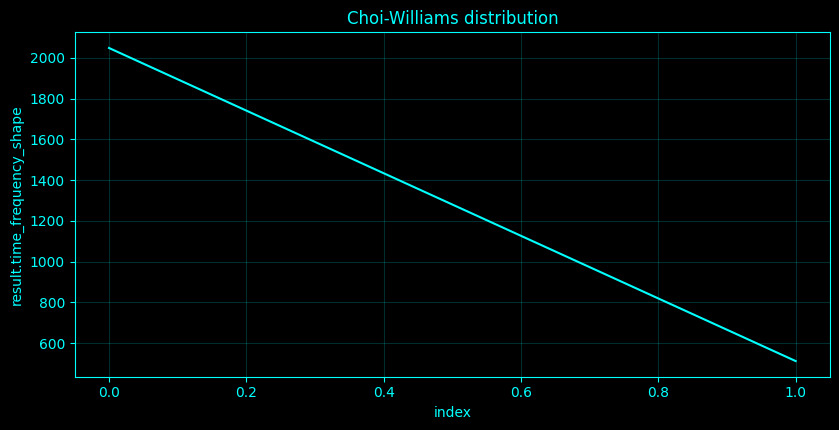

In [4]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.


# Method-specific calculation.
def _compute_method_170():
    idx = 170
    name = 'Choi-Williams distribution'
    __plot_spec = None
    y = signal.hilbert(X[:min(N, 2048), 0])
    n = len(y)
    L = min(256, n // 2)
    W = np.zeros((n, 2 * L), float)
    lags = np.arange(-L, L)
    for t0 in range(n):
        valid = (t0 + lags >= 0) & (t0 - lags >= 0) & (t0 + lags < n) & (t0 - lags < n)
        r = np.zeros(2 * L, complex)
        lv = lags[valid]
        r[valid] = y[t0 + lv] * np.conj(y[t0 - lv])
        W[t0] = np.real(np.fft.fftshift(np.fft.fft(r)))
    A = np.fft.fft2(W)
    u = np.fft.fftfreq(W.shape[0])[:, None]
    v = np.fft.fftfreq(W.shape[1])[None, :]
    ker = np.exp(-(u * v) ** 2 / (0.02 if idx == 170 else 0.05))
    W = np.real(np.fft.ifft2(A * ker))
    return ({'time_frequency_shape': W.shape, 'energy': float(np.sum(np.abs(W)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_170,_plot_spec=_compute_method_170()
print('Choi-Williams distribution')
if isinstance(result_170,dict):
    for _k,_v in result_170.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_170)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_170)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Choi-Williams distribution',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Choi-Williams distribution',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Choi-Williams distribution',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">171. Cohen-class time-frequency distributions</h3>
<p>Cohen-class distributions are 2-D filtered Wigner-Ville distributions; choosing an ambiguity-domain kernel controls the resolution/cross-term tradeoff.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Cohen-class time-frequency distributions
  time_frequency_shape: array(2,), mean=1280
  energy: 40118493.46287528


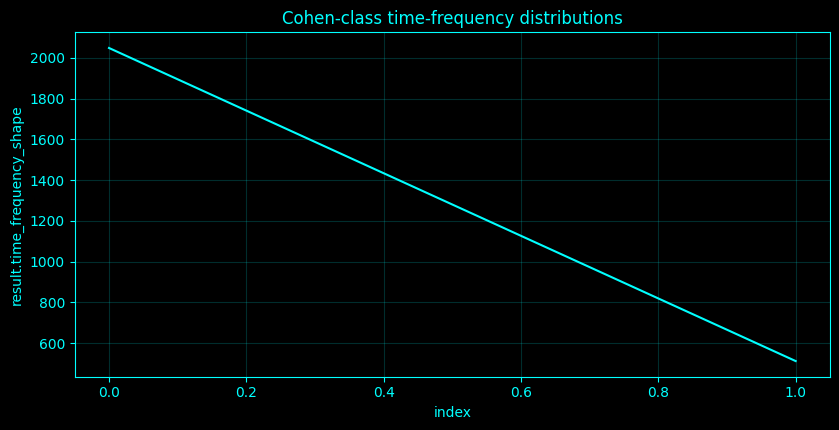

In [5]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.


# Method-specific calculation.
def _compute_method_171():
    idx = 171
    name = 'Cohen-class time-frequency distributions'
    __plot_spec = None
    y = signal.hilbert(X[:min(N, 2048), 0])
    n = len(y)
    L = min(256, n // 2)
    W = np.zeros((n, 2 * L), float)
    lags = np.arange(-L, L)
    for t0 in range(n):
        valid = (t0 + lags >= 0) & (t0 - lags >= 0) & (t0 + lags < n) & (t0 - lags < n)
        r = np.zeros(2 * L, complex)
        lv = lags[valid]
        r[valid] = y[t0 + lv] * np.conj(y[t0 - lv])
        W[t0] = np.real(np.fft.fftshift(np.fft.fft(r)))
    A = np.fft.fft2(W)
    u = np.fft.fftfreq(W.shape[0])[:, None]
    v = np.fft.fftfreq(W.shape[1])[None, :]
    ker = np.exp(-(u * v) ** 2 / (0.02 if idx == 170 else 0.05))
    W = np.real(np.fft.ifft2(A * ker))
    return ({'time_frequency_shape': W.shape, 'energy': float(np.sum(np.abs(W)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_171,_plot_spec=_compute_method_171()
print('Cohen-class time-frequency distributions')
if isinstance(result_171,dict):
    for _k,_v in result_171.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_171)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_171)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Cohen-class time-frequency distributions',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Cohen-class time-frequency distributions',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Cohen-class time-frequency distributions',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">172. S-transform</h3>
<p>The Stockwell/S-transform uses a frequency-dependent Gaussian window whose width scales approximately as \(1/f\), retaining absolute phase while giving multiresolution time-frequency localization.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [6]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.


# Method-specific calculation.
def _compute_method_172():
    idx = 172
    name = 'S-transform'
    __plot_spec = None
    y = X[:, 0]
    freqs = np.geomspace(2, min(45, 0.4 * _fs), 32)
    rows = []
    tt = np.arange(N) / _fs
    for fc in freqs:
        sigma = max(1 / _fs, 1 / (2 * np.pi * fc))
        half = int(min(N // 4, max(8, 4 * sigma * _fs)))
        tw = np.arange(-half, half + 1) / _fs
        g = np.exp(-tw ** 2 / (2 * sigma ** 2)) * np.exp(2j * np.pi * fc * tw)
        g /= np.sqrt(np.sum(np.abs(g) ** 2) + EPS)
        rows.append(np.abs(signal.fftconvolve(y, g[::-1].conj(), mode='same')) ** 2)
    return ({'Stockwell_like_frequency_rows': len(rows), 'note': 'frequency-dependent Gaussian-window S-transform implementation'}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_172,_plot_spec=_compute_method_172()
print('S-transform')
if isinstance(result_172,dict):
    for _k,_v in result_172.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_172)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_172)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'S-transform',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'S-transform',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('S-transform',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


S-transform
  Stockwell_like_frequency_rows: 32
  note: frequency-dependent Gaussian-window S-transform implementation


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">173. Stockwell transform</h3>
<p>The Stockwell/S-transform uses a frequency-dependent Gaussian window whose width scales approximately as \(1/f\), retaining absolute phase while giving multiresolution time-frequency localization.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [7]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.


# Method-specific calculation.
def _compute_method_173():
    idx = 173
    name = 'Stockwell transform'
    __plot_spec = None
    y = X[:, 0]
    freqs = np.geomspace(2, min(45, 0.4 * _fs), 32)
    rows = []
    tt = np.arange(N) / _fs
    for fc in freqs:
        sigma = max(1 / _fs, 1 / (2 * np.pi * fc))
        half = int(min(N // 4, max(8, 4 * sigma * _fs)))
        tw = np.arange(-half, half + 1) / _fs
        g = np.exp(-tw ** 2 / (2 * sigma ** 2)) * np.exp(2j * np.pi * fc * tw)
        g /= np.sqrt(np.sum(np.abs(g) ** 2) + EPS)
        rows.append(np.abs(signal.fftconvolve(y, g[::-1].conj(), mode='same')) ** 2)
    return ({'Stockwell_like_frequency_rows': len(rows), 'note': 'frequency-dependent Gaussian-window S-transform implementation'}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_173,_plot_spec=_compute_method_173()
print('Stockwell transform')
if isinstance(result_173,dict):
    for _k,_v in result_173.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_173)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_173)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Stockwell transform',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Stockwell transform',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Stockwell transform',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Stockwell transform
  Stockwell_like_frequency_rows: 32
  note: frequency-dependent Gaussian-window S-transform implementation


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">174. Hilbert-Huang transform</h3>
<p>Hilbert-Huang analysis first decomposes the signal into empirical mode functions (IMFs), then obtains each IMF's instantaneous amplitude/frequency from its analytic signal.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Hilbert-Huang transform
  n_IMFs: 4
  median_instantaneous_frequencies_hz: array(4,), mean=24.4381


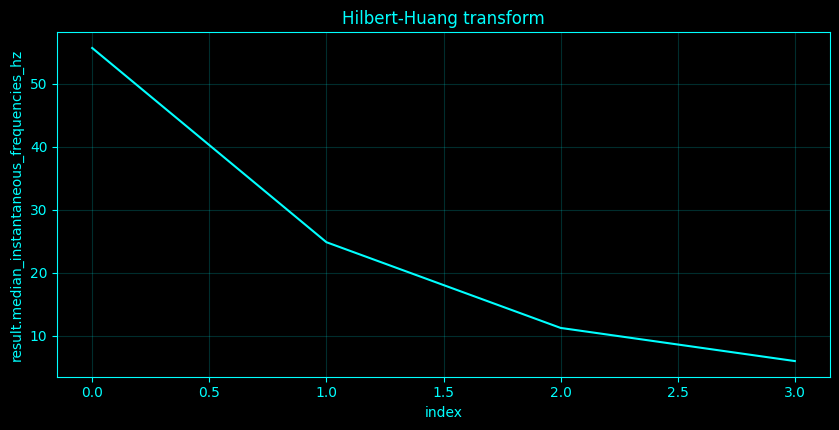

In [8]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _emd_simple(y, max_imfs=5, max_sift=20):
    r = np.asarray(y, float).copy()
    imfs = []
    for _ in range(max_imfs):
        h = r.copy()
        for _s in range(max_sift):
            maxidx = signal.find_peaks(h)[0]
            minidx = signal.find_peaks(-h)[0]
            if len(maxidx) < 2 or len(minidx) < 2:
                break
            x = np.arange(len(h))
            up = np.interp(x, maxidx, h[maxidx])
            lo = np.interp(x, minidx, h[minidx])
            m = (up + lo) / 2
            hnew = h - m
            if np.linalg.norm(hnew - h) / (np.linalg.norm(h) + EPS) < 0.05:
                h = hnew
                break
            h = hnew
        if len(signal.find_peaks(h)[0]) < 2:
            break
        imfs.append(h)
        r = r - h
        if np.std(r) < 0.0001 * np.std(y):
            break
    return (imfs, r)

def _vmd_simple(y, K=4, alpha=2000, tau=0.0, n_iter=120):
    y = np.asarray(y, float)
    N0 = len(y)
    n = min(N0, 4096 if FAST_OPTION == 'ultra' else 8192)
    y = y[:n]
    freqs = np.fft.fftfreq(n)
    fhat = np.fft.fft(y)
    u = np.zeros((K, n), complex)
    omega = np.linspace(0, 0.4, K + 2)[1:-1]
    lam = np.zeros(n, complex)
    pos = freqs >= 0
    for _ in range(n_iter):
        usum = np.sum(u, axis=0)
        for k in range(K):
            rest = usum - u[k]
            denom = 1 + 2 * alpha * (freqs - omega[k]) ** 2
            new = (fhat - rest + lam / 2) / denom
            usum = rest + new
            u[k] = new
            pw = np.abs(new[pos]) ** 2
            omega[k] = np.sum(freqs[pos] * pw) / (np.sum(pw) + EPS)
        if tau:
            lam = lam + tau * (fhat - usum)
    modes = np.real(np.fft.ifft(u, axis=1))
    return (modes, omega * _fs)

# Method-specific calculation.
def _compute_method_174():
    idx = 174
    name = 'Hilbert-Huang transform'
    __plot_spec = None
    y = X[:, 0]
    imfs, r = _emd_simple(y, max_imfs=4 if FAST_OPTION == 'ultra' else 6)
    freqs = []
    for q in imfs:
        z = signal.hilbert(q)
        freqs.append(float(np.median(np.diff(np.unwrap(np.angle(z))) * _fs / (2 * np.pi))))
    return ({'n_IMFs': len(imfs), 'median_instantaneous_frequencies_hz': freqs}, locals().get('__plot_spec', None))
    modes, fc = _vmd_simple(y, K=min(4, _SPEED['rank']))
    return ({'mode_aligned_spectral_energy': np.mean(modes * modes, axis=1).tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_174,_plot_spec=_compute_method_174()
print('Hilbert-Huang transform')
if isinstance(result_174,dict):
    for _k,_v in result_174.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_174)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_174)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Hilbert-Huang transform',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Hilbert-Huang transform',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Hilbert-Huang transform',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">175. Empirical mode decomposition spectrum</h3>
<p>Empirical mode decomposition iteratively removes local envelope means to extract IMFs satisfying local symmetry/zero-crossing conditions; IMF Hilbert frequencies form a data-adaptive spectrum.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Empirical mode decomposition spectrum
  n_IMFs: 4
  median_instantaneous_frequencies_hz: array(4,), mean=24.4381


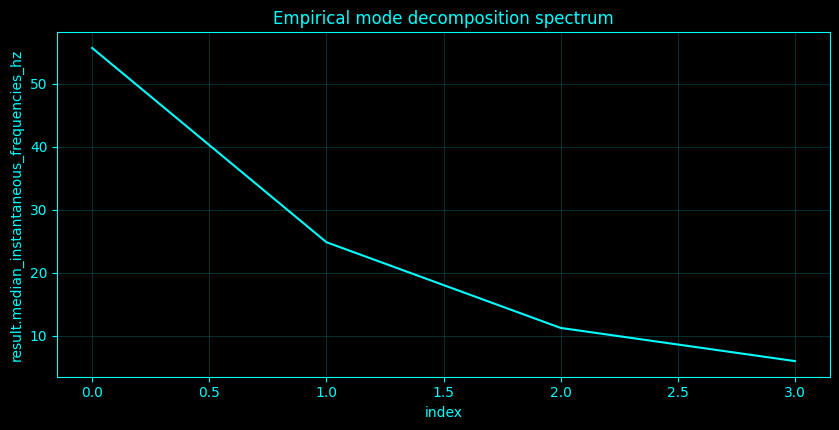

In [9]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _emd_simple(y, max_imfs=5, max_sift=20):
    r = np.asarray(y, float).copy()
    imfs = []
    for _ in range(max_imfs):
        h = r.copy()
        for _s in range(max_sift):
            maxidx = signal.find_peaks(h)[0]
            minidx = signal.find_peaks(-h)[0]
            if len(maxidx) < 2 or len(minidx) < 2:
                break
            x = np.arange(len(h))
            up = np.interp(x, maxidx, h[maxidx])
            lo = np.interp(x, minidx, h[minidx])
            m = (up + lo) / 2
            hnew = h - m
            if np.linalg.norm(hnew - h) / (np.linalg.norm(h) + EPS) < 0.05:
                h = hnew
                break
            h = hnew
        if len(signal.find_peaks(h)[0]) < 2:
            break
        imfs.append(h)
        r = r - h
        if np.std(r) < 0.0001 * np.std(y):
            break
    return (imfs, r)

def _vmd_simple(y, K=4, alpha=2000, tau=0.0, n_iter=120):
    y = np.asarray(y, float)
    N0 = len(y)
    n = min(N0, 4096 if FAST_OPTION == 'ultra' else 8192)
    y = y[:n]
    freqs = np.fft.fftfreq(n)
    fhat = np.fft.fft(y)
    u = np.zeros((K, n), complex)
    omega = np.linspace(0, 0.4, K + 2)[1:-1]
    lam = np.zeros(n, complex)
    pos = freqs >= 0
    for _ in range(n_iter):
        usum = np.sum(u, axis=0)
        for k in range(K):
            rest = usum - u[k]
            denom = 1 + 2 * alpha * (freqs - omega[k]) ** 2
            new = (fhat - rest + lam / 2) / denom
            usum = rest + new
            u[k] = new
            pw = np.abs(new[pos]) ** 2
            omega[k] = np.sum(freqs[pos] * pw) / (np.sum(pw) + EPS)
        if tau:
            lam = lam + tau * (fhat - usum)
    modes = np.real(np.fft.ifft(u, axis=1))
    return (modes, omega * _fs)

# Method-specific calculation.
def _compute_method_175():
    idx = 175
    name = 'Empirical mode decomposition spectrum'
    __plot_spec = None
    y = X[:, 0]
    imfs, r = _emd_simple(y, max_imfs=4 if FAST_OPTION == 'ultra' else 6)
    freqs = []
    for q in imfs:
        z = signal.hilbert(q)
        freqs.append(float(np.median(np.diff(np.unwrap(np.angle(z))) * _fs / (2 * np.pi))))
    return ({'n_IMFs': len(imfs), 'median_instantaneous_frequencies_hz': freqs}, locals().get('__plot_spec', None))
    modes, fc = _vmd_simple(y, K=min(4, _SPEED['rank']))
    return ({'mode_aligned_spectral_energy': np.mean(modes * modes, axis=1).tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_175,_plot_spec=_compute_method_175()
print('Empirical mode decomposition spectrum')
if isinstance(result_175,dict):
    for _k,_v in result_175.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_175)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_175)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Empirical mode decomposition spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Empirical mode decomposition spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Empirical mode decomposition spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">176. Ensemble EMD spectrum</h3>
<p>Ensemble EMD repeats EMD after adding independent small noise and averages corresponding IMFs, reducing mode mixing.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Ensemble EMD spectrum
  ensemble_size: 8
  first_IMF_energy: 0.9639253149066813


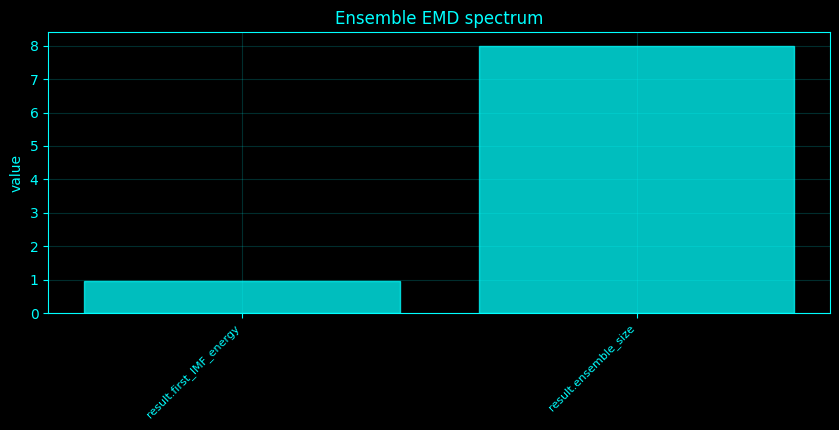

In [10]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _emd_simple(y, max_imfs=5, max_sift=20):
    r = np.asarray(y, float).copy()
    imfs = []
    for _ in range(max_imfs):
        h = r.copy()
        for _s in range(max_sift):
            maxidx = signal.find_peaks(h)[0]
            minidx = signal.find_peaks(-h)[0]
            if len(maxidx) < 2 or len(minidx) < 2:
                break
            x = np.arange(len(h))
            up = np.interp(x, maxidx, h[maxidx])
            lo = np.interp(x, minidx, h[minidx])
            m = (up + lo) / 2
            hnew = h - m
            if np.linalg.norm(hnew - h) / (np.linalg.norm(h) + EPS) < 0.05:
                h = hnew
                break
            h = hnew
        if len(signal.find_peaks(h)[0]) < 2:
            break
        imfs.append(h)
        r = r - h
        if np.std(r) < 0.0001 * np.std(y):
            break
    return (imfs, r)

def _vmd_simple(y, K=4, alpha=2000, tau=0.0, n_iter=120):
    y = np.asarray(y, float)
    N0 = len(y)
    n = min(N0, 4096 if FAST_OPTION == 'ultra' else 8192)
    y = y[:n]
    freqs = np.fft.fftfreq(n)
    fhat = np.fft.fft(y)
    u = np.zeros((K, n), complex)
    omega = np.linspace(0, 0.4, K + 2)[1:-1]
    lam = np.zeros(n, complex)
    pos = freqs >= 0
    for _ in range(n_iter):
        usum = np.sum(u, axis=0)
        for k in range(K):
            rest = usum - u[k]
            denom = 1 + 2 * alpha * (freqs - omega[k]) ** 2
            new = (fhat - rest + lam / 2) / denom
            usum = rest + new
            u[k] = new
            pw = np.abs(new[pos]) ** 2
            omega[k] = np.sum(freqs[pos] * pw) / (np.sum(pw) + EPS)
        if tau:
            lam = lam + tau * (fhat - usum)
    modes = np.real(np.fft.ifft(u, axis=1))
    return (modes, omega * _fs)

# Method-specific calculation.
def _compute_method_176():
    idx = 176
    name = 'Ensemble EMD spectrum'
    __plot_spec = None
    y = X[:, 0]
    ens = max(4, _SPEED['n_sur'])
    acc = []
    for _ in range(ens):
        imfs, _ = _emd_simple(y + 0.1 * np.std(y) * _rng.normal(size=len(y)), max_imfs=4)
        acc.append(imfs[0] if imfs else np.zeros_like(y))
    q = np.mean(acc, axis=0)
    return ({'ensemble_size': ens, 'first_IMF_energy': float(np.mean(q * q))}, locals().get('__plot_spec', None))
    modes, fc = _vmd_simple(y, K=min(4, _SPEED['rank']))
    return ({'mode_aligned_spectral_energy': np.mean(modes * modes, axis=1).tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_176,_plot_spec=_compute_method_176()
print('Ensemble EMD spectrum')
if isinstance(result_176,dict):
    for _k,_v in result_176.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_176)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_176)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Ensemble EMD spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Ensemble EMD spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Ensemble EMD spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">177. Complete ensemble EMD spectrum</h3>
<p>Complete-ensemble EMD with adaptive noise extracts an ensemble-mean IMF, subtracts it from the residual, and repeats so the modes plus residual reconstruct the signal.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Complete ensemble EMD spectrum
  CEEMDAN_like_modes: 3
  residual_variance: 0.12459503575389287


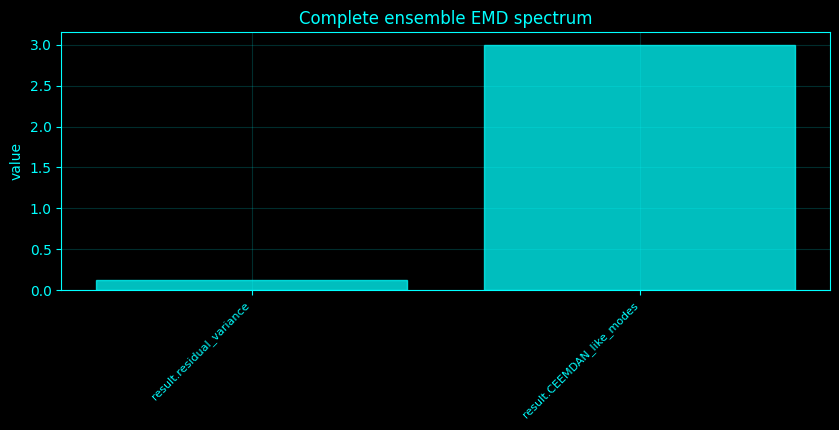

In [11]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _emd_simple(y, max_imfs=5, max_sift=20):
    r = np.asarray(y, float).copy()
    imfs = []
    for _ in range(max_imfs):
        h = r.copy()
        for _s in range(max_sift):
            maxidx = signal.find_peaks(h)[0]
            minidx = signal.find_peaks(-h)[0]
            if len(maxidx) < 2 or len(minidx) < 2:
                break
            x = np.arange(len(h))
            up = np.interp(x, maxidx, h[maxidx])
            lo = np.interp(x, minidx, h[minidx])
            m = (up + lo) / 2
            hnew = h - m
            if np.linalg.norm(hnew - h) / (np.linalg.norm(h) + EPS) < 0.05:
                h = hnew
                break
            h = hnew
        if len(signal.find_peaks(h)[0]) < 2:
            break
        imfs.append(h)
        r = r - h
        if np.std(r) < 0.0001 * np.std(y):
            break
    return (imfs, r)

def _vmd_simple(y, K=4, alpha=2000, tau=0.0, n_iter=120):
    y = np.asarray(y, float)
    N0 = len(y)
    n = min(N0, 4096 if FAST_OPTION == 'ultra' else 8192)
    y = y[:n]
    freqs = np.fft.fftfreq(n)
    fhat = np.fft.fft(y)
    u = np.zeros((K, n), complex)
    omega = np.linspace(0, 0.4, K + 2)[1:-1]
    lam = np.zeros(n, complex)
    pos = freqs >= 0
    for _ in range(n_iter):
        usum = np.sum(u, axis=0)
        for k in range(K):
            rest = usum - u[k]
            denom = 1 + 2 * alpha * (freqs - omega[k]) ** 2
            new = (fhat - rest + lam / 2) / denom
            usum = rest + new
            u[k] = new
            pw = np.abs(new[pos]) ** 2
            omega[k] = np.sum(freqs[pos] * pw) / (np.sum(pw) + EPS)
        if tau:
            lam = lam + tau * (fhat - usum)
    modes = np.real(np.fft.ifft(u, axis=1))
    return (modes, omega * _fs)

# Method-specific calculation.
def _compute_method_177():
    idx = 177
    name = 'Complete ensemble EMD spectrum'
    __plot_spec = None
    y = X[:, 0]
    ens = max(4, _SPEED['n_sur'])
    res = y.copy()
    modes = []
    for k in range(3):
        first = []
        for _ in range(ens):
            imfs, _ = _emd_simple(res + 0.05 * np.std(res) * _rng.normal(size=len(res)), max_imfs=1)
            first.append(imfs[0] if imfs else np.zeros_like(res))
        q = np.mean(first, axis=0)
        modes.append(q)
        res = res - q
    return ({'CEEMDAN_like_modes': len(modes), 'residual_variance': float(np.var(res))}, locals().get('__plot_spec', None))
    modes, fc = _vmd_simple(y, K=min(4, _SPEED['rank']))
    return ({'mode_aligned_spectral_energy': np.mean(modes * modes, axis=1).tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_177,_plot_spec=_compute_method_177()
print('Complete ensemble EMD spectrum')
if isinstance(result_177,dict):
    for _k,_v in result_177.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_177)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_177)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Complete ensemble EMD spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Complete ensemble EMD spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Complete ensemble EMD spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">178. Variational mode decomposition spectrum</h3>
<p>Variational mode decomposition solves for band-limited modes whose demodulated analytic bandwidths are jointly minimized under a reconstruction constraint. The implementation uses iterative Fourier-domain updates.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Variational mode decomposition spectrum
  VMD_center_frequencies_hz: array(4,), mean=27.9697
  mode_energies: array(4,), mean=0.07579


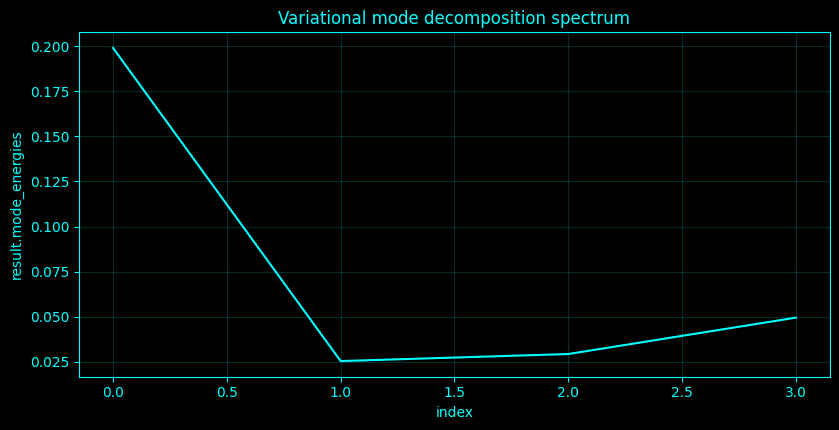

In [12]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _vmd_simple(y, K=4, alpha=2000, tau=0.0, n_iter=120):
    y = np.asarray(y, float)
    N0 = len(y)
    n = min(N0, 4096 if FAST_OPTION == 'ultra' else 8192)
    y = y[:n]
    freqs = np.fft.fftfreq(n)
    fhat = np.fft.fft(y)
    u = np.zeros((K, n), complex)
    omega = np.linspace(0, 0.4, K + 2)[1:-1]
    lam = np.zeros(n, complex)
    pos = freqs >= 0
    for _ in range(n_iter):
        usum = np.sum(u, axis=0)
        for k in range(K):
            rest = usum - u[k]
            denom = 1 + 2 * alpha * (freqs - omega[k]) ** 2
            new = (fhat - rest + lam / 2) / denom
            usum = rest + new
            u[k] = new
            pw = np.abs(new[pos]) ** 2
            omega[k] = np.sum(freqs[pos] * pw) / (np.sum(pw) + EPS)
        if tau:
            lam = lam + tau * (fhat - usum)
    modes = np.real(np.fft.ifft(u, axis=1))
    return (modes, omega * _fs)

# Method-specific calculation.
def _compute_method_178():
    idx = 178
    name = 'Variational mode decomposition spectrum'
    __plot_spec = None
    y = X[:, 0]
    modes, fc = _vmd_simple(y, K=min(4, _SPEED['rank']))
    return ({'VMD_center_frequencies_hz': fc.tolist(), 'mode_energies': np.mean(modes * modes, axis=1).tolist()}, locals().get('__plot_spec', None))
    return ({'mode_aligned_spectral_energy': np.mean(modes * modes, axis=1).tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_178,_plot_spec=_compute_method_178()
print('Variational mode decomposition spectrum')
if isinstance(result_178,dict):
    for _k,_v in result_178.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_178)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_178)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Variational mode decomposition spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Variational mode decomposition spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Variational mode decomposition spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">179. Mode-aligned spectral energy</h3>
<p>Mode-aligned spectral energy is the mean squared amplitude of each VMD mode, allowing energy comparison after the modes have been aligned by their center frequencies.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Mode-aligned spectral energy
  mode_aligned_spectral_energy: array(4,), mean=0.07579


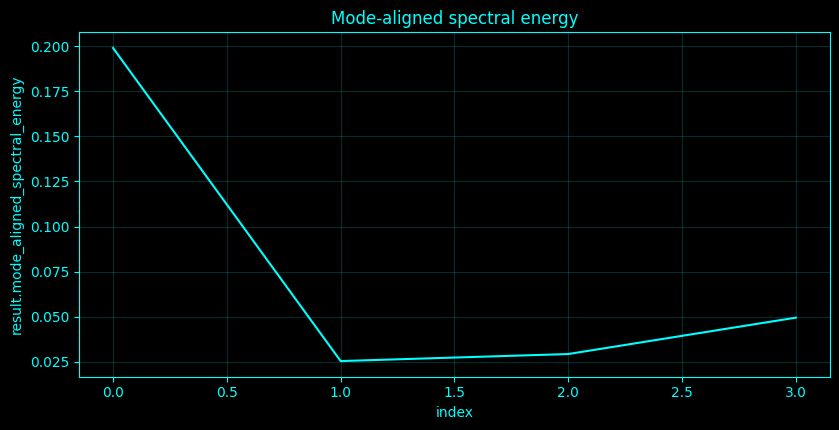

In [13]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _vmd_simple(y, K=4, alpha=2000, tau=0.0, n_iter=120):
    y = np.asarray(y, float)
    N0 = len(y)
    n = min(N0, 4096 if FAST_OPTION == 'ultra' else 8192)
    y = y[:n]
    freqs = np.fft.fftfreq(n)
    fhat = np.fft.fft(y)
    u = np.zeros((K, n), complex)
    omega = np.linspace(0, 0.4, K + 2)[1:-1]
    lam = np.zeros(n, complex)
    pos = freqs >= 0
    for _ in range(n_iter):
        usum = np.sum(u, axis=0)
        for k in range(K):
            rest = usum - u[k]
            denom = 1 + 2 * alpha * (freqs - omega[k]) ** 2
            new = (fhat - rest + lam / 2) / denom
            usum = rest + new
            u[k] = new
            pw = np.abs(new[pos]) ** 2
            omega[k] = np.sum(freqs[pos] * pw) / (np.sum(pw) + EPS)
        if tau:
            lam = lam + tau * (fhat - usum)
    modes = np.real(np.fft.ifft(u, axis=1))
    return (modes, omega * _fs)

# Method-specific calculation.
def _compute_method_179():
    idx = 179
    name = 'Mode-aligned spectral energy'
    __plot_spec = None
    y = X[:, 0]
    modes, fc = _vmd_simple(y, K=min(4, _SPEED['rank']))
    return ({'mode_aligned_spectral_energy': np.mean(modes * modes, axis=1).tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_179,_plot_spec=_compute_method_179()
print('Mode-aligned spectral energy')
if isinstance(result_179,dict):
    for _k,_v in result_179.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_179)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_179)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Mode-aligned spectral energy',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Mode-aligned spectral energy',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Mode-aligned spectral energy',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">180. Instantaneous frequency from Hilbert transform</h3>
<p>For analytic signal \(z(t)=A(t)e^{i\phi(t)}\), instantaneous frequency is \(f_i(t)=(2\pi)^{-1}d\phi/dt\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [14]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _morlet_scalogram(ch=0, freqs=None, n_cycles=7.0):
    if freqs is None:
        freqs = np.geomspace(2, min(45, 0.4 * _fs), 32)
    y = X[:, ch]
    coeff = []
    for ff in freqs:
        sigt = n_cycles / (2 * np.pi * ff)
        half = int(max(8, 4 * sigt * _fs))
        tt = np.arange(-half, half + 1) / _fs
        w = np.exp(2j * np.pi * ff * tt) * np.exp(-tt ** 2 / (2 * sigt ** 2))
        w /= np.sqrt(np.sum(np.abs(w) ** 2) + EPS)
        coeff.append(signal.fftconvolve(y, np.conj(w[::-1]), mode='same'))
    Cw = np.asarray(coeff)
    return (np.asarray(freqs), Cw)

# Method-specific calculation.
def _compute_method_180():
    idx = 180
    name = 'Instantaneous frequency from Hilbert transform'
    __plot_spec = None
    fre, Cw = _morlet_scalogram()
    ridge = np.argmax(np.abs(Cw) ** 2, axis=0)
    z = Cw[ridge, np.arange(Cw.shape[1])]
    phase = np.unwrap(np.angle(z))
    fi = np.gradient(phase) * _fs / (2 * np.pi)
    return ({'median_instantaneous_frequency_hz': float(np.nanmedian(fi))}, locals().get('__plot_spec', None))
    P = np.abs(Cw) ** 2
    P /= np.sum(P, axis=0, keepdims=True) + EPS
    H = -np.sum(P * np.log(P + EPS), axis=0) / np.log(P.shape[0])
    return ({'mean_instantaneous_spectral_entropy': float(np.mean(H))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_180,_plot_spec=_compute_method_180()
print('Instantaneous frequency from Hilbert transform')
if isinstance(result_180,dict):
    for _k,_v in result_180.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_180)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_180)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Instantaneous frequency from Hilbert transform',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Instantaneous frequency from Hilbert transform',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Instantaneous frequency from Hilbert transform',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Instantaneous frequency from Hilbert transform
  median_instantaneous_frequency_hz: 2.4716560447104556


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">181. Instantaneous bandwidth</h3>
<p>Instantaneous bandwidth is represented as \((2\pi)^{-1}|d\log A/dt|\), the amplitude-modulation contribution to local bandwidth in hertz.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [15]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _morlet_scalogram(ch=0, freqs=None, n_cycles=7.0):
    if freqs is None:
        freqs = np.geomspace(2, min(45, 0.4 * _fs), 32)
    y = X[:, ch]
    coeff = []
    for ff in freqs:
        sigt = n_cycles / (2 * np.pi * ff)
        half = int(max(8, 4 * sigt * _fs))
        tt = np.arange(-half, half + 1) / _fs
        w = np.exp(2j * np.pi * ff * tt) * np.exp(-tt ** 2 / (2 * sigt ** 2))
        w /= np.sqrt(np.sum(np.abs(w) ** 2) + EPS)
        coeff.append(signal.fftconvolve(y, np.conj(w[::-1]), mode='same'))
    Cw = np.asarray(coeff)
    return (np.asarray(freqs), Cw)

# Method-specific calculation.
def _compute_method_181():
    idx = 181
    name = 'Instantaneous bandwidth'
    __plot_spec = None
    fre, Cw = _morlet_scalogram()
    ridge = np.argmax(np.abs(Cw) ** 2, axis=0)
    z = Cw[ridge, np.arange(Cw.shape[1])]
    phase = np.unwrap(np.angle(z))
    fi = np.gradient(phase) * _fs / (2 * np.pi)
    amp = np.abs(z)
    bw = np.abs(np.gradient(np.log(amp + EPS)) * _fs / (2 * np.pi))
    return ({'median_instantaneous_bandwidth_hz': float(np.nanmedian(bw))}, locals().get('__plot_spec', None))
    P = np.abs(Cw) ** 2
    P /= np.sum(P, axis=0, keepdims=True) + EPS
    H = -np.sum(P * np.log(P + EPS), axis=0) / np.log(P.shape[0])
    return ({'mean_instantaneous_spectral_entropy': float(np.mean(H))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_181,_plot_spec=_compute_method_181()
print('Instantaneous bandwidth')
if isinstance(result_181,dict):
    for _k,_v in result_181.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_181)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_181)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Instantaneous bandwidth',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Instantaneous bandwidth',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Instantaneous bandwidth',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Instantaneous bandwidth
  median_instantaneous_bandwidth_hz: 0.10279266959021582


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">182. Instantaneous spectral entropy</h3>
<p>Instantaneous spectral entropy normalizes wavelet power across frequencies at each time and computes \(H(t)=-\sum_fp_f(t)\log p_f(t)/\log F\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [16]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _morlet_scalogram(ch=0, freqs=None, n_cycles=7.0):
    if freqs is None:
        freqs = np.geomspace(2, min(45, 0.4 * _fs), 32)
    y = X[:, ch]
    coeff = []
    for ff in freqs:
        sigt = n_cycles / (2 * np.pi * ff)
        half = int(max(8, 4 * sigt * _fs))
        tt = np.arange(-half, half + 1) / _fs
        w = np.exp(2j * np.pi * ff * tt) * np.exp(-tt ** 2 / (2 * sigt ** 2))
        w /= np.sqrt(np.sum(np.abs(w) ** 2) + EPS)
        coeff.append(signal.fftconvolve(y, np.conj(w[::-1]), mode='same'))
    Cw = np.asarray(coeff)
    return (np.asarray(freqs), Cw)

# Method-specific calculation.
def _compute_method_182():
    idx = 182
    name = 'Instantaneous spectral entropy'
    __plot_spec = None
    fre, Cw = _morlet_scalogram()
    ridge = np.argmax(np.abs(Cw) ** 2, axis=0)
    z = Cw[ridge, np.arange(Cw.shape[1])]
    phase = np.unwrap(np.angle(z))
    fi = np.gradient(phase) * _fs / (2 * np.pi)
    P = np.abs(Cw) ** 2
    P /= np.sum(P, axis=0, keepdims=True) + EPS
    H = -np.sum(P * np.log(P + EPS), axis=0) / np.log(P.shape[0])
    return ({'mean_instantaneous_spectral_entropy': float(np.mean(H))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_182,_plot_spec=_compute_method_182()
print('Instantaneous spectral entropy')
if isinstance(result_182,dict):
    for _k,_v in result_182.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_182)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_182)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Instantaneous spectral entropy',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Instantaneous spectral entropy',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Instantaneous spectral entropy',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Instantaneous spectral entropy
  mean_instantaneous_spectral_entropy: 0.7881622595625141


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">183. Wavelet packet decomposition</h3>
<p>A wavelet packet recursively splits both low- and high-pass branches. Node energy is \(\sum_n|c_{j,k}[n]|^2\); normalized node energies yield packet entropy \(-\sum p_{j,k}\log p_{j,k}\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Wavelet packet decomposition
  packet_nodes: 16
  node_lengths: array(16,), mean=835


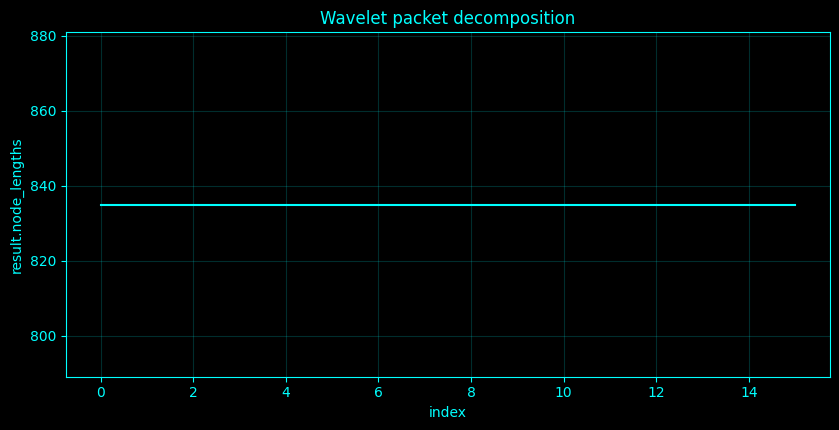

In [17]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _haar_packet(y, level=4):
    nodes = [np.asarray(y, float)]
    for _ in range(level):
        nxt = []
        for a in nodes:
            if len(a) % 2:
                a = a[:-1]
            lo = (a[0::2] + a[1::2]) / np.sqrt(2)
            hi = (a[0::2] - a[1::2]) / np.sqrt(2)
            nxt.extend([lo, hi])
        nodes = nxt
    return nodes

# Method-specific calculation.
def _compute_method_183():
    idx = 183
    name = 'Wavelet packet decomposition'
    __plot_spec = None
    nodes = _haar_packet(X[:, 0], level=4)
    ener = np.array([np.sum(q * q) for q in nodes])
    q = ener / (ener.sum() + EPS)
    return ({'packet_nodes': len(nodes), 'node_lengths': [len(q) for q in nodes]}, locals().get('__plot_spec', None))
    return ({'DWT_bandpower_proxy': ener.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_183,_plot_spec=_compute_method_183()
print('Wavelet packet decomposition')
if isinstance(result_183,dict):
    for _k,_v in result_183.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_183)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_183)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Wavelet packet decomposition',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Wavelet packet decomposition',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Wavelet packet decomposition',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">184. Wavelet packet energy spectrum</h3>
<p>A wavelet packet recursively splits both low- and high-pass branches. Node energy is \(\sum_n|c_{j,k}[n]|^2\); normalized node energies yield packet entropy \(-\sum p_{j,k}\log p_{j,k}\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Wavelet packet energy spectrum
  packet_energy_fraction: array(16,), mean=0.0625


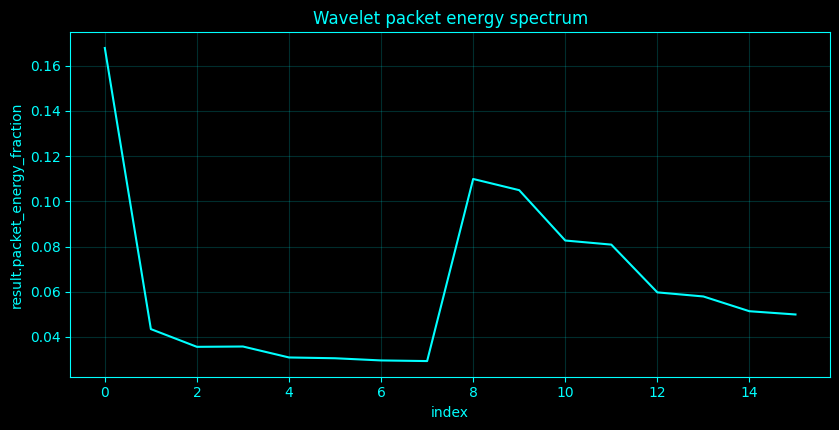

In [18]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _haar_packet(y, level=4):
    nodes = [np.asarray(y, float)]
    for _ in range(level):
        nxt = []
        for a in nodes:
            if len(a) % 2:
                a = a[:-1]
            lo = (a[0::2] + a[1::2]) / np.sqrt(2)
            hi = (a[0::2] - a[1::2]) / np.sqrt(2)
            nxt.extend([lo, hi])
        nodes = nxt
    return nodes

# Method-specific calculation.
def _compute_method_184():
    idx = 184
    name = 'Wavelet packet energy spectrum'
    __plot_spec = None
    nodes = _haar_packet(X[:, 0], level=4)
    ener = np.array([np.sum(q * q) for q in nodes])
    q = ener / (ener.sum() + EPS)
    return ({'packet_energy_fraction': q.tolist()}, locals().get('__plot_spec', None))
    return ({'DWT_bandpower_proxy': ener.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_184,_plot_spec=_compute_method_184()
print('Wavelet packet energy spectrum')
if isinstance(result_184,dict):
    for _k,_v in result_184.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_184)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_184)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Wavelet packet energy spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Wavelet packet energy spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Wavelet packet energy spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">185. Wavelet packet entropy</h3>
<p>A wavelet packet recursively splits both low- and high-pass branches. Node energy is \(\sum_n|c_{j,k}[n]|^2\); normalized node energies yield packet entropy \(-\sum p_{j,k}\log p_{j,k}\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [19]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _haar_packet(y, level=4):
    nodes = [np.asarray(y, float)]
    for _ in range(level):
        nxt = []
        for a in nodes:
            if len(a) % 2:
                a = a[:-1]
            lo = (a[0::2] + a[1::2]) / np.sqrt(2)
            hi = (a[0::2] - a[1::2]) / np.sqrt(2)
            nxt.extend([lo, hi])
        nodes = nxt
    return nodes

# Method-specific calculation.
def _compute_method_185():
    idx = 185
    name = 'Wavelet packet entropy'
    __plot_spec = None
    nodes = _haar_packet(X[:, 0], level=4)
    ener = np.array([np.sum(q * q) for q in nodes])
    q = ener / (ener.sum() + EPS)
    return ({'packet_entropy': float(-np.sum(q * np.log(q + EPS)))}, locals().get('__plot_spec', None))
    return ({'DWT_bandpower_proxy': ener.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_185,_plot_spec=_compute_method_185()
print('Wavelet packet entropy')
if isinstance(result_185,dict):
    for _k,_v in result_185.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_185)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_185)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Wavelet packet entropy',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Wavelet packet entropy',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Wavelet packet entropy',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Wavelet packet entropy
  packet_entropy: 2.6187280162614774


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">186. Discrete wavelet transform bandpower</h3>
<p>Discrete-wavelet bandpower sums squared Haar detail/approximation coefficients at each dyadic level, which partition signal energy across octave-like scales.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Discrete wavelet transform bandpower
  DWT_bandpower_proxy: array(16,), mean=800.209


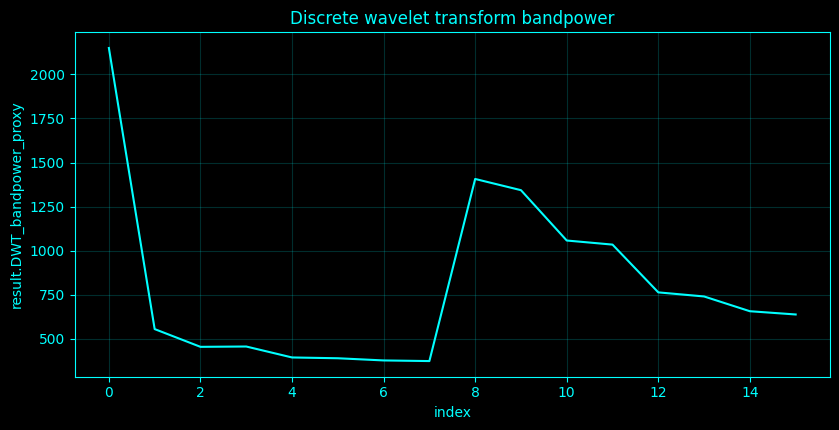

In [20]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _haar_packet(y, level=4):
    nodes = [np.asarray(y, float)]
    for _ in range(level):
        nxt = []
        for a in nodes:
            if len(a) % 2:
                a = a[:-1]
            lo = (a[0::2] + a[1::2]) / np.sqrt(2)
            hi = (a[0::2] - a[1::2]) / np.sqrt(2)
            nxt.extend([lo, hi])
        nodes = nxt
    return nodes

# Method-specific calculation.
def _compute_method_186():
    idx = 186
    name = 'Discrete wavelet transform bandpower'
    __plot_spec = None
    nodes = _haar_packet(X[:, 0], level=4)
    ener = np.array([np.sum(q * q) for q in nodes])
    q = ener / (ener.sum() + EPS)
    return ({'DWT_bandpower_proxy': ener.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_186,_plot_spec=_compute_method_186()
print('Discrete wavelet transform bandpower')
if isinstance(result_186,dict):
    for _k,_v in result_186.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_186)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_186)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Discrete wavelet transform bandpower',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Discrete wavelet transform bandpower',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Discrete wavelet transform bandpower',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">187. Wavelet coherence</h3>
<p>Wavelet coherence is \(|S(W_xW_y^\ast)|^2/[S(|W_x|^2)S(|W_y|^2)]\), where \(S\) smooths in time/scale.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [21]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _morlet_scalogram(ch=0, freqs=None, n_cycles=7.0):
    if freqs is None:
        freqs = np.geomspace(2, min(45, 0.4 * _fs), 32)
    y = X[:, ch]
    coeff = []
    for ff in freqs:
        sigt = n_cycles / (2 * np.pi * ff)
        half = int(max(8, 4 * sigt * _fs))
        tt = np.arange(-half, half + 1) / _fs
        w = np.exp(2j * np.pi * ff * tt) * np.exp(-tt ** 2 / (2 * sigt ** 2))
        w /= np.sqrt(np.sum(np.abs(w) ** 2) + EPS)
        coeff.append(signal.fftconvolve(y, np.conj(w[::-1]), mode='same'))
    Cw = np.asarray(coeff)
    return (np.asarray(freqs), Cw)

def _haar_packet(y, level=4):
    nodes = [np.asarray(y, float)]
    for _ in range(level):
        nxt = []
        for a in nodes:
            if len(a) % 2:
                a = a[:-1]
            lo = (a[0::2] + a[1::2]) / np.sqrt(2)
            hi = (a[0::2] - a[1::2]) / np.sqrt(2)
            nxt.extend([lo, hi])
        nodes = nxt
    return nodes

# Method-specific calculation.
def _compute_method_187():
    idx = 187
    name = 'Wavelet coherence'
    __plot_spec = None
    fre, Wx = _morlet_scalogram(0)
    _, Wy = _morlet_scalogram(min(1, C - 1))
    cross = Wx * np.conj(Wy)
    sigt = 5
    Sxy = ndimage.gaussian_filter(np.real(cross), sigma=(1, sigt)) + 1j * ndimage.gaussian_filter(np.imag(cross), sigma=(1, sigt))
    Sxx = ndimage.gaussian_filter(np.abs(Wx) ** 2, sigma=(1, sigt))
    Syy = ndimage.gaussian_filter(np.abs(Wy) ** 2, sigma=(1, sigt))
    wc = np.abs(Sxy) ** 2 / (Sxx * Syy + EPS)
    return ({'mean_wavelet_coherence': float(np.mean(np.clip(wc, 0, 1)))}, locals().get('__plot_spec', None))
    power = np.abs(Wx) ** 2
    ridge = fre[np.argmax(power, axis=0)]
    rows = []
    for j in range(min(C, 8 if FAST_OPTION == 'ultra' else C)):
        nds = _haar_packet(X[:, j], level=3)
        e = np.array([np.sum(q * q) for q in nds])
        rows.append(e / (e.sum() + EPS))
    return ({'wavelet_packet_fingerprints': np.asarray(rows)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_187,_plot_spec=_compute_method_187()
print('Wavelet coherence')
if isinstance(result_187,dict):
    for _k,_v in result_187.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_187)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_187)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Wavelet coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Wavelet coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Wavelet coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Wavelet coherence
  mean_wavelet_coherence: 0.830099947029942


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">188. Wavelet cross-spectrum</h3>
<p>The cross-wavelet spectrum is \(W_{xy}(s,t)=W_x(s,t)W_y^\ast(s,t)\); magnitude gives shared local energy and angle gives local phase difference.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [22]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _morlet_scalogram(ch=0, freqs=None, n_cycles=7.0):
    if freqs is None:
        freqs = np.geomspace(2, min(45, 0.4 * _fs), 32)
    y = X[:, ch]
    coeff = []
    for ff in freqs:
        sigt = n_cycles / (2 * np.pi * ff)
        half = int(max(8, 4 * sigt * _fs))
        tt = np.arange(-half, half + 1) / _fs
        w = np.exp(2j * np.pi * ff * tt) * np.exp(-tt ** 2 / (2 * sigt ** 2))
        w /= np.sqrt(np.sum(np.abs(w) ** 2) + EPS)
        coeff.append(signal.fftconvolve(y, np.conj(w[::-1]), mode='same'))
    Cw = np.asarray(coeff)
    return (np.asarray(freqs), Cw)

def _haar_packet(y, level=4):
    nodes = [np.asarray(y, float)]
    for _ in range(level):
        nxt = []
        for a in nodes:
            if len(a) % 2:
                a = a[:-1]
            lo = (a[0::2] + a[1::2]) / np.sqrt(2)
            hi = (a[0::2] - a[1::2]) / np.sqrt(2)
            nxt.extend([lo, hi])
        nodes = nxt
    return nodes

# Method-specific calculation.
def _compute_method_188():
    idx = 188
    name = 'Wavelet cross-spectrum'
    __plot_spec = None
    fre, Wx = _morlet_scalogram(0)
    _, Wy = _morlet_scalogram(min(1, C - 1))
    cross = Wx * np.conj(Wy)
    return ({'mean_cross_wavelet_power': float(np.mean(np.abs(cross)))}, locals().get('__plot_spec', None))
    power = np.abs(Wx) ** 2
    ridge = fre[np.argmax(power, axis=0)]
    rows = []
    for j in range(min(C, 8 if FAST_OPTION == 'ultra' else C)):
        nds = _haar_packet(X[:, j], level=3)
        e = np.array([np.sum(q * q) for q in nds])
        rows.append(e / (e.sum() + EPS))
    return ({'wavelet_packet_fingerprints': np.asarray(rows)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_188,_plot_spec=_compute_method_188()
print('Wavelet cross-spectrum')
if isinstance(result_188,dict):
    for _k,_v in result_188.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_188)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_188)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Wavelet cross-spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Wavelet cross-spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Wavelet cross-spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Wavelet cross-spectrum
  mean_cross_wavelet_power: 0.4088734047759262


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">189. Wavelet phase coherence</h3>
<p>Wavelet phase coherence smooths the unit phasor \(e^{i\arg(W_xW_y^\ast)}\) and summarizes its resultant magnitude.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [23]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _morlet_scalogram(ch=0, freqs=None, n_cycles=7.0):
    if freqs is None:
        freqs = np.geomspace(2, min(45, 0.4 * _fs), 32)
    y = X[:, ch]
    coeff = []
    for ff in freqs:
        sigt = n_cycles / (2 * np.pi * ff)
        half = int(max(8, 4 * sigt * _fs))
        tt = np.arange(-half, half + 1) / _fs
        w = np.exp(2j * np.pi * ff * tt) * np.exp(-tt ** 2 / (2 * sigt ** 2))
        w /= np.sqrt(np.sum(np.abs(w) ** 2) + EPS)
        coeff.append(signal.fftconvolve(y, np.conj(w[::-1]), mode='same'))
    Cw = np.asarray(coeff)
    return (np.asarray(freqs), Cw)

def _haar_packet(y, level=4):
    nodes = [np.asarray(y, float)]
    for _ in range(level):
        nxt = []
        for a in nodes:
            if len(a) % 2:
                a = a[:-1]
            lo = (a[0::2] + a[1::2]) / np.sqrt(2)
            hi = (a[0::2] - a[1::2]) / np.sqrt(2)
            nxt.extend([lo, hi])
        nodes = nxt
    return nodes

# Method-specific calculation.
def _compute_method_189():
    idx = 189
    name = 'Wavelet phase coherence'
    __plot_spec = None
    fre, Wx = _morlet_scalogram(0)
    _, Wy = _morlet_scalogram(min(1, C - 1))
    cross = Wx * np.conj(Wy)
    return ({'wavelet_phase_coherence': float(np.mean(np.abs(ndimage.gaussian_filter(np.exp(1j * np.angle(cross)), sigma=(1, 5)))))}, locals().get('__plot_spec', None))
    power = np.abs(Wx) ** 2
    ridge = fre[np.argmax(power, axis=0)]
    rows = []
    for j in range(min(C, 8 if FAST_OPTION == 'ultra' else C)):
        nds = _haar_packet(X[:, j], level=3)
        e = np.array([np.sum(q * q) for q in nds])
        rows.append(e / (e.sum() + EPS))
    return ({'wavelet_packet_fingerprints': np.asarray(rows)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_189,_plot_spec=_compute_method_189()
print('Wavelet phase coherence')
if isinstance(result_189,dict):
    for _k,_v in result_189.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_189)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_189)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Wavelet phase coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Wavelet phase coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Wavelet phase coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Wavelet phase coherence
  wavelet_phase_coherence: 0.8633898421810614


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">190. Wavelet ridge extraction</h3>
<p>A wavelet ridge follows the frequency of local/maximal scalogram power over time. Its dispersion measures stability and its second time derivative provides a ridge-curvature diagnostic.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Wavelet ridge extraction
  ridge_hz: array(203,), mean=3.6497


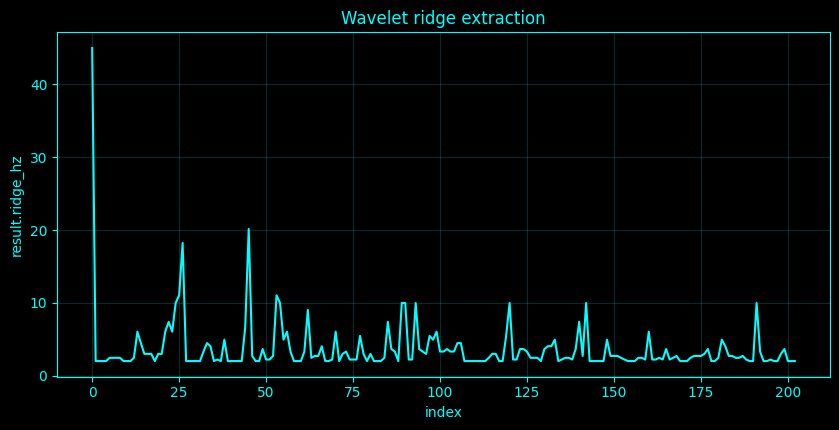

In [24]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _morlet_scalogram(ch=0, freqs=None, n_cycles=7.0):
    if freqs is None:
        freqs = np.geomspace(2, min(45, 0.4 * _fs), 32)
    y = X[:, ch]
    coeff = []
    for ff in freqs:
        sigt = n_cycles / (2 * np.pi * ff)
        half = int(max(8, 4 * sigt * _fs))
        tt = np.arange(-half, half + 1) / _fs
        w = np.exp(2j * np.pi * ff * tt) * np.exp(-tt ** 2 / (2 * sigt ** 2))
        w /= np.sqrt(np.sum(np.abs(w) ** 2) + EPS)
        coeff.append(signal.fftconvolve(y, np.conj(w[::-1]), mode='same'))
    Cw = np.asarray(coeff)
    return (np.asarray(freqs), Cw)

def _haar_packet(y, level=4):
    nodes = [np.asarray(y, float)]
    for _ in range(level):
        nxt = []
        for a in nodes:
            if len(a) % 2:
                a = a[:-1]
            lo = (a[0::2] + a[1::2]) / np.sqrt(2)
            hi = (a[0::2] - a[1::2]) / np.sqrt(2)
            nxt.extend([lo, hi])
        nodes = nxt
    return nodes

# Method-specific calculation.
def _compute_method_190():
    idx = 190
    name = 'Wavelet ridge extraction'
    __plot_spec = None
    fre, Wx = _morlet_scalogram(0)
    _, Wy = _morlet_scalogram(min(1, C - 1))
    cross = Wx * np.conj(Wy)
    power = np.abs(Wx) ** 2
    ridge = fre[np.argmax(power, axis=0)]
    return ({'ridge_hz': ridge[::max(1, len(ridge) // 200)].tolist()}, locals().get('__plot_spec', None))
    rows = []
    for j in range(min(C, 8 if FAST_OPTION == 'ultra' else C)):
        nds = _haar_packet(X[:, j], level=3)
        e = np.array([np.sum(q * q) for q in nds])
        rows.append(e / (e.sum() + EPS))
    return ({'wavelet_packet_fingerprints': np.asarray(rows)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_190,_plot_spec=_compute_method_190()
print('Wavelet ridge extraction')
if isinstance(result_190,dict):
    for _k,_v in result_190.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_190)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_190)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Wavelet ridge extraction',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Wavelet ridge extraction',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Wavelet ridge extraction',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">191. Wavelet ridge stability</h3>
<p>A wavelet ridge follows the frequency of local/maximal scalogram power over time. Its dispersion measures stability and its second time derivative provides a ridge-curvature diagnostic.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [25]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _morlet_scalogram(ch=0, freqs=None, n_cycles=7.0):
    if freqs is None:
        freqs = np.geomspace(2, min(45, 0.4 * _fs), 32)
    y = X[:, ch]
    coeff = []
    for ff in freqs:
        sigt = n_cycles / (2 * np.pi * ff)
        half = int(max(8, 4 * sigt * _fs))
        tt = np.arange(-half, half + 1) / _fs
        w = np.exp(2j * np.pi * ff * tt) * np.exp(-tt ** 2 / (2 * sigt ** 2))
        w /= np.sqrt(np.sum(np.abs(w) ** 2) + EPS)
        coeff.append(signal.fftconvolve(y, np.conj(w[::-1]), mode='same'))
    Cw = np.asarray(coeff)
    return (np.asarray(freqs), Cw)

def _haar_packet(y, level=4):
    nodes = [np.asarray(y, float)]
    for _ in range(level):
        nxt = []
        for a in nodes:
            if len(a) % 2:
                a = a[:-1]
            lo = (a[0::2] + a[1::2]) / np.sqrt(2)
            hi = (a[0::2] - a[1::2]) / np.sqrt(2)
            nxt.extend([lo, hi])
        nodes = nxt
    return nodes

# Method-specific calculation.
def _compute_method_191():
    idx = 191
    name = 'Wavelet ridge stability'
    __plot_spec = None
    fre, Wx = _morlet_scalogram(0)
    _, Wy = _morlet_scalogram(min(1, C - 1))
    cross = Wx * np.conj(Wy)
    power = np.abs(Wx) ** 2
    ridge = fre[np.argmax(power, axis=0)]
    return ({'ridge_SD_hz': float(np.std(ridge))}, locals().get('__plot_spec', None))
    rows = []
    for j in range(min(C, 8 if FAST_OPTION == 'ultra' else C)):
        nds = _haar_packet(X[:, j], level=3)
        e = np.array([np.sum(q * q) for q in nds])
        rows.append(e / (e.sum() + EPS))
    return ({'wavelet_packet_fingerprints': np.asarray(rows)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_191,_plot_spec=_compute_method_191()
print('Wavelet ridge stability')
if isinstance(result_191,dict):
    for _k,_v in result_191.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_191)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_191)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Wavelet ridge stability',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Wavelet ridge stability',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Wavelet ridge stability',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Wavelet ridge stability
  ridge_SD_hz: 2.93518878016739


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">192. Wavelet ridge curvature</h3>
<p>A wavelet ridge follows the frequency of local/maximal scalogram power over time. Its dispersion measures stability and its second time derivative provides a ridge-curvature diagnostic.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [26]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _morlet_scalogram(ch=0, freqs=None, n_cycles=7.0):
    if freqs is None:
        freqs = np.geomspace(2, min(45, 0.4 * _fs), 32)
    y = X[:, ch]
    coeff = []
    for ff in freqs:
        sigt = n_cycles / (2 * np.pi * ff)
        half = int(max(8, 4 * sigt * _fs))
        tt = np.arange(-half, half + 1) / _fs
        w = np.exp(2j * np.pi * ff * tt) * np.exp(-tt ** 2 / (2 * sigt ** 2))
        w /= np.sqrt(np.sum(np.abs(w) ** 2) + EPS)
        coeff.append(signal.fftconvolve(y, np.conj(w[::-1]), mode='same'))
    Cw = np.asarray(coeff)
    return (np.asarray(freqs), Cw)

def _haar_packet(y, level=4):
    nodes = [np.asarray(y, float)]
    for _ in range(level):
        nxt = []
        for a in nodes:
            if len(a) % 2:
                a = a[:-1]
            lo = (a[0::2] + a[1::2]) / np.sqrt(2)
            hi = (a[0::2] - a[1::2]) / np.sqrt(2)
            nxt.extend([lo, hi])
        nodes = nxt
    return nodes

# Method-specific calculation.
def _compute_method_192():
    idx = 192
    name = 'Wavelet ridge curvature'
    __plot_spec = None
    fre, Wx = _morlet_scalogram(0)
    _, Wy = _morlet_scalogram(min(1, C - 1))
    cross = Wx * np.conj(Wy)
    power = np.abs(Wx) ** 2
    ridge = fre[np.argmax(power, axis=0)]
    return ({'ridge_curvature_RMS_hz_per_s2': float(np.sqrt(np.mean(np.gradient(np.gradient(ridge, 1 / _fs), 1 / _fs) ** 2)))}, locals().get('__plot_spec', None))
    rows = []
    for j in range(min(C, 8 if FAST_OPTION == 'ultra' else C)):
        nds = _haar_packet(X[:, j], level=3)
        e = np.array([np.sum(q * q) for q in nds])
        rows.append(e / (e.sum() + EPS))
    return ({'wavelet_packet_fingerprints': np.asarray(rows)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_192,_plot_spec=_compute_method_192()
print('Wavelet ridge curvature')
if isinstance(result_192,dict):
    for _k,_v in result_192.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_192)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_192)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Wavelet ridge curvature',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Wavelet ridge curvature',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Wavelet ridge curvature',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Wavelet ridge curvature
  ridge_curvature_RMS_hz_per_s2: 7093.038932459841


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">193. Wavelet scalogram peak tracking</h3>
<p>A wavelet ridge follows the frequency of local/maximal scalogram power over time. Its dispersion measures stability and its second time derivative provides a ridge-curvature diagnostic.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Wavelet scalogram peak tracking
  scalogram_peak_track_hz: array(203,), mean=3.6497


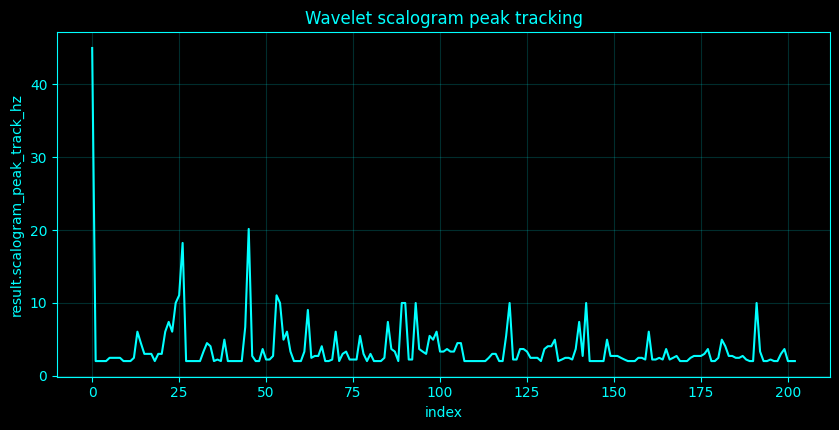

In [27]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _morlet_scalogram(ch=0, freqs=None, n_cycles=7.0):
    if freqs is None:
        freqs = np.geomspace(2, min(45, 0.4 * _fs), 32)
    y = X[:, ch]
    coeff = []
    for ff in freqs:
        sigt = n_cycles / (2 * np.pi * ff)
        half = int(max(8, 4 * sigt * _fs))
        tt = np.arange(-half, half + 1) / _fs
        w = np.exp(2j * np.pi * ff * tt) * np.exp(-tt ** 2 / (2 * sigt ** 2))
        w /= np.sqrt(np.sum(np.abs(w) ** 2) + EPS)
        coeff.append(signal.fftconvolve(y, np.conj(w[::-1]), mode='same'))
    Cw = np.asarray(coeff)
    return (np.asarray(freqs), Cw)

def _haar_packet(y, level=4):
    nodes = [np.asarray(y, float)]
    for _ in range(level):
        nxt = []
        for a in nodes:
            if len(a) % 2:
                a = a[:-1]
            lo = (a[0::2] + a[1::2]) / np.sqrt(2)
            hi = (a[0::2] - a[1::2]) / np.sqrt(2)
            nxt.extend([lo, hi])
        nodes = nxt
    return nodes

# Method-specific calculation.
def _compute_method_193():
    idx = 193
    name = 'Wavelet scalogram peak tracking'
    __plot_spec = None
    fre, Wx = _morlet_scalogram(0)
    _, Wy = _morlet_scalogram(min(1, C - 1))
    cross = Wx * np.conj(Wy)
    power = np.abs(Wx) ** 2
    ridge = fre[np.argmax(power, axis=0)]
    return ({'scalogram_peak_track_hz': ridge[::max(1, len(ridge) // 200)].tolist()}, locals().get('__plot_spec', None))
    rows = []
    for j in range(min(C, 8 if FAST_OPTION == 'ultra' else C)):
        nds = _haar_packet(X[:, j], level=3)
        e = np.array([np.sum(q * q) for q in nds])
        rows.append(e / (e.sum() + EPS))
    return ({'wavelet_packet_fingerprints': np.asarray(rows)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_193,_plot_spec=_compute_method_193()
print('Wavelet scalogram peak tracking')
if isinstance(result_193,dict):
    for _k,_v in result_193.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_193)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_193)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Wavelet scalogram peak tracking',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Wavelet scalogram peak tracking',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Wavelet scalogram peak tracking',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">194. Wavelet cone-of-influence diagnostics</h3>
<p>The cone of influence marks edge regions where wavelet support overlaps record boundaries. For a Morlet wavelet the e-folding width scales with wavelet scale, so low frequencies lose a larger edge fraction.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Wavelet cone-of-influence diagnostics
  valid_fraction_by_frequency: array(32,), mean=0.995376


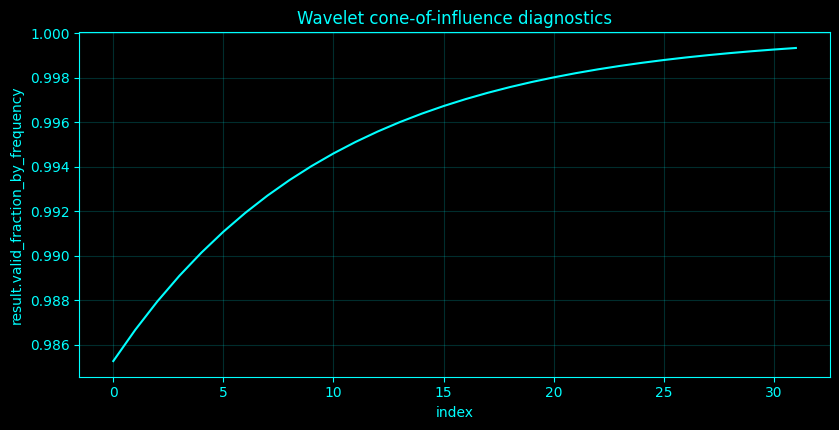

In [28]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _morlet_scalogram(ch=0, freqs=None, n_cycles=7.0):
    if freqs is None:
        freqs = np.geomspace(2, min(45, 0.4 * _fs), 32)
    y = X[:, ch]
    coeff = []
    for ff in freqs:
        sigt = n_cycles / (2 * np.pi * ff)
        half = int(max(8, 4 * sigt * _fs))
        tt = np.arange(-half, half + 1) / _fs
        w = np.exp(2j * np.pi * ff * tt) * np.exp(-tt ** 2 / (2 * sigt ** 2))
        w /= np.sqrt(np.sum(np.abs(w) ** 2) + EPS)
        coeff.append(signal.fftconvolve(y, np.conj(w[::-1]), mode='same'))
    Cw = np.asarray(coeff)
    return (np.asarray(freqs), Cw)

def _haar_packet(y, level=4):
    nodes = [np.asarray(y, float)]
    for _ in range(level):
        nxt = []
        for a in nodes:
            if len(a) % 2:
                a = a[:-1]
            lo = (a[0::2] + a[1::2]) / np.sqrt(2)
            hi = (a[0::2] - a[1::2]) / np.sqrt(2)
            nxt.extend([lo, hi])
        nodes = nxt
    return nodes

# Method-specific calculation.
def _compute_method_194():
    idx = 194
    name = 'Wavelet cone-of-influence diagnostics'
    __plot_spec = None
    fre, Wx = _morlet_scalogram(0)
    _, Wy = _morlet_scalogram(min(1, C - 1))
    cross = Wx * np.conj(Wy)
    power = np.abs(Wx) ** 2
    ridge = fre[np.argmax(power, axis=0)]
    coi = np.sqrt(2) * 7 / (2 * np.pi * fre)
    duration = N / _fs
    valid = np.maximum(0, 1 - 2 * coi / duration)
    return ({'valid_fraction_by_frequency': valid.tolist()}, locals().get('__plot_spec', None))
    rows = []
    for j in range(min(C, 8 if FAST_OPTION == 'ultra' else C)):
        nds = _haar_packet(X[:, j], level=3)
        e = np.array([np.sum(q * q) for q in nds])
        rows.append(e / (e.sum() + EPS))
    return ({'wavelet_packet_fingerprints': np.asarray(rows)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_194,_plot_spec=_compute_method_194()
print('Wavelet cone-of-influence diagnostics')
if isinstance(result_194,dict):
    for _k,_v in result_194.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_194)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_194)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Wavelet cone-of-influence diagnostics',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Wavelet cone-of-influence diagnostics',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Wavelet cone-of-influence diagnostics',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">195. Wavelet surrogate testing</h3>
<p>Wavelet surrogate testing circularly shifts one channel's wavelet coefficients to destroy stable inter-channel timing while preserving each channel's time-frequency energy.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Wavelet surrogate testing
  observed: 0.8633898421810614
  surrogate_p: 0.1111111111111111


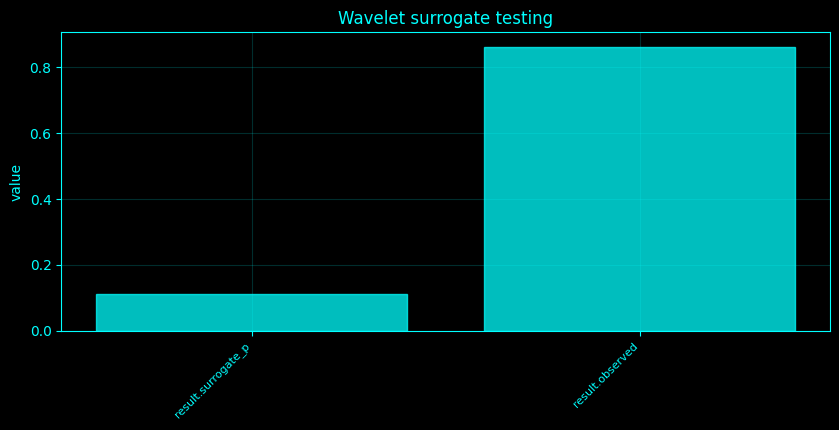

In [29]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _morlet_scalogram(ch=0, freqs=None, n_cycles=7.0):
    if freqs is None:
        freqs = np.geomspace(2, min(45, 0.4 * _fs), 32)
    y = X[:, ch]
    coeff = []
    for ff in freqs:
        sigt = n_cycles / (2 * np.pi * ff)
        half = int(max(8, 4 * sigt * _fs))
        tt = np.arange(-half, half + 1) / _fs
        w = np.exp(2j * np.pi * ff * tt) * np.exp(-tt ** 2 / (2 * sigt ** 2))
        w /= np.sqrt(np.sum(np.abs(w) ** 2) + EPS)
        coeff.append(signal.fftconvolve(y, np.conj(w[::-1]), mode='same'))
    Cw = np.asarray(coeff)
    return (np.asarray(freqs), Cw)

def _haar_packet(y, level=4):
    nodes = [np.asarray(y, float)]
    for _ in range(level):
        nxt = []
        for a in nodes:
            if len(a) % 2:
                a = a[:-1]
            lo = (a[0::2] + a[1::2]) / np.sqrt(2)
            hi = (a[0::2] - a[1::2]) / np.sqrt(2)
            nxt.extend([lo, hi])
        nodes = nxt
    return nodes

# Method-specific calculation.
def _compute_method_195():
    idx = 195
    name = 'Wavelet surrogate testing'
    __plot_spec = None
    fre, Wx = _morlet_scalogram(0)
    _, Wy = _morlet_scalogram(min(1, C - 1))
    cross = Wx * np.conj(Wy)
    power = np.abs(Wx) ** 2
    ridge = fre[np.argmax(power, axis=0)]
    obs = float(np.mean(np.abs(ndimage.gaussian_filter(np.exp(1j * np.angle(cross)), sigma=(1, 5)))))
    null = []
    for _ in range(_SPEED['n_sur']):
        sh = int(_rng.integers(int(0.2 * _fs), max(int(0.2 * _fs) + 1, N - int(0.2 * _fs))))
        Wy2 = np.roll(Wy, sh, axis=1)
        cr = Wx * np.conj(Wy2)
        null.append(float(np.mean(np.abs(ndimage.gaussian_filter(np.exp(1j * np.angle(cr)), sigma=(1, 5))))))
    return ({'observed': obs, 'surrogate_p': float((1 + np.sum(np.asarray(null) >= obs)) / (1 + len(null)))}, locals().get('__plot_spec', None))
    rows = []
    for j in range(min(C, 8 if FAST_OPTION == 'ultra' else C)):
        nds = _haar_packet(X[:, j], level=3)
        e = np.array([np.sum(q * q) for q in nds])
        rows.append(e / (e.sum() + EPS))
    return ({'wavelet_packet_fingerprints': np.asarray(rows)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_195,_plot_spec=_compute_method_195()
print('Wavelet surrogate testing')
if isinstance(result_195,dict):
    for _k,_v in result_195.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_195)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_195)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Wavelet surrogate testing',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Wavelet surrogate testing',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Wavelet surrogate testing',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">196. Wavelet packet channel fingerprints</h3>
<p>Wavelet-packet channel fingerprints are normalized packet-energy vectors for each sensor.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Wavelet packet channel fingerprints
  wavelet_packet_fingerprints: array(8, 8), mean=0.125


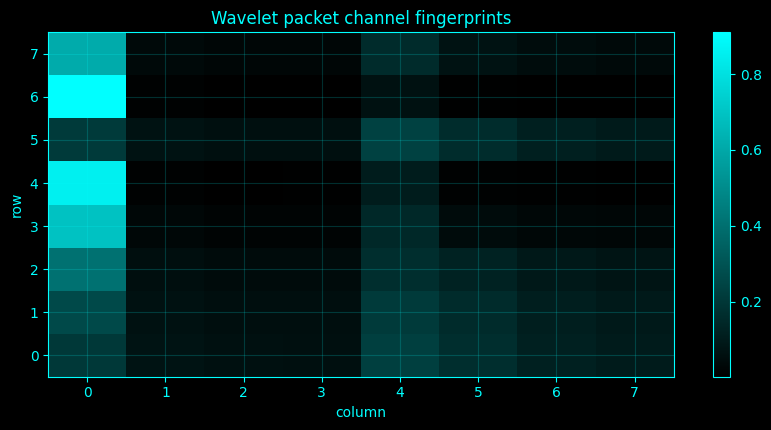

In [30]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _morlet_scalogram(ch=0, freqs=None, n_cycles=7.0):
    if freqs is None:
        freqs = np.geomspace(2, min(45, 0.4 * _fs), 32)
    y = X[:, ch]
    coeff = []
    for ff in freqs:
        sigt = n_cycles / (2 * np.pi * ff)
        half = int(max(8, 4 * sigt * _fs))
        tt = np.arange(-half, half + 1) / _fs
        w = np.exp(2j * np.pi * ff * tt) * np.exp(-tt ** 2 / (2 * sigt ** 2))
        w /= np.sqrt(np.sum(np.abs(w) ** 2) + EPS)
        coeff.append(signal.fftconvolve(y, np.conj(w[::-1]), mode='same'))
    Cw = np.asarray(coeff)
    return (np.asarray(freqs), Cw)

def _haar_packet(y, level=4):
    nodes = [np.asarray(y, float)]
    for _ in range(level):
        nxt = []
        for a in nodes:
            if len(a) % 2:
                a = a[:-1]
            lo = (a[0::2] + a[1::2]) / np.sqrt(2)
            hi = (a[0::2] - a[1::2]) / np.sqrt(2)
            nxt.extend([lo, hi])
        nodes = nxt
    return nodes

# Method-specific calculation.
def _compute_method_196():
    idx = 196
    name = 'Wavelet packet channel fingerprints'
    __plot_spec = None
    fre, Wx = _morlet_scalogram(0)
    _, Wy = _morlet_scalogram(min(1, C - 1))
    cross = Wx * np.conj(Wy)
    power = np.abs(Wx) ** 2
    ridge = fre[np.argmax(power, axis=0)]
    rows = []
    for j in range(min(C, 8 if FAST_OPTION == 'ultra' else C)):
        nds = _haar_packet(X[:, j], level=3)
        e = np.array([np.sum(q * q) for q in nds])
        rows.append(e / (e.sum() + EPS))
    return ({'wavelet_packet_fingerprints': np.asarray(rows)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_196,_plot_spec=_compute_method_196()
print('Wavelet packet channel fingerprints')
if isinstance(result_196,dict):
    for _k,_v in result_196.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_196)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_196)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Wavelet packet channel fingerprints',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Wavelet packet channel fingerprints',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Wavelet packet channel fingerprints',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">197. Filter-bank spectral analysis</h3>
<p>A constant-Q/log-spaced filter bank uses geometrically spaced center frequencies and bandwidth proportional to center frequency, so \(Q=f_c/\Delta f\) is approximately constant.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Filter-bank spectral analysis
  centers_hz: array(12,), mean=14.7026
  power_shape: array(2,), mean=12


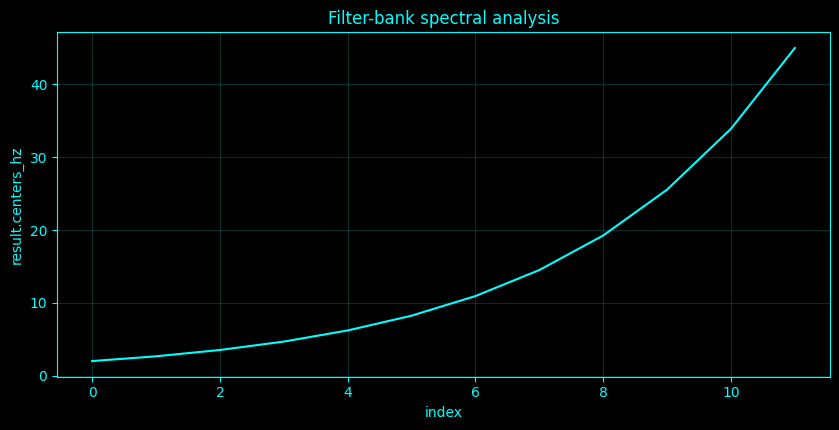

In [31]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _filterbank():
    centers = np.geomspace(2, min(45, 0.4 * _fs), 12)
    powers = []
    analytic = []
    for fc in centers:
        lo = max(0.5, fc / np.sqrt(2))
        hi = min(0.45 * _fs, fc * np.sqrt(2))
        if lo >= hi:
            continue
        sos = signal.butter(3, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
        Y = signal.sosfiltfilt(sos, X, axis=0)
        powers.append(np.mean(Y ** 2, axis=0))
        analytic.append(signal.hilbert(Y, axis=0))
    return (centers[:len(powers)], np.asarray(powers), analytic)

# Method-specific calculation.
def _compute_method_197():
    idx = 197
    name = 'Filter-bank spectral analysis'
    __plot_spec = None
    centers, powers, analytic = _filterbank()
    return ({'centers_hz': centers.tolist(), 'power_shape': powers.shape}, locals().get('__plot_spec', None))
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    F = powers.T
    F = (F - F.mean(0)) / (F.std(0) + EPS)
    return ({'filterbank_fingerprints': F}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_197,_plot_spec=_compute_method_197()
print('Filter-bank spectral analysis')
if isinstance(result_197,dict):
    for _k,_v in result_197.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_197)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_197)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Filter-bank spectral analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Filter-bank spectral analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Filter-bank spectral analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">198. Log-spaced filter-bank power</h3>
<p>A constant-Q/log-spaced filter bank uses geometrically spaced center frequencies and bandwidth proportional to center frequency, so \(Q=f_c/\Delta f\) is approximately constant.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Log-spaced filter-bank power
  log_spaced_centers_hz: array(12,), mean=14.7026
  mean_power: array(12,), mean=0.571631


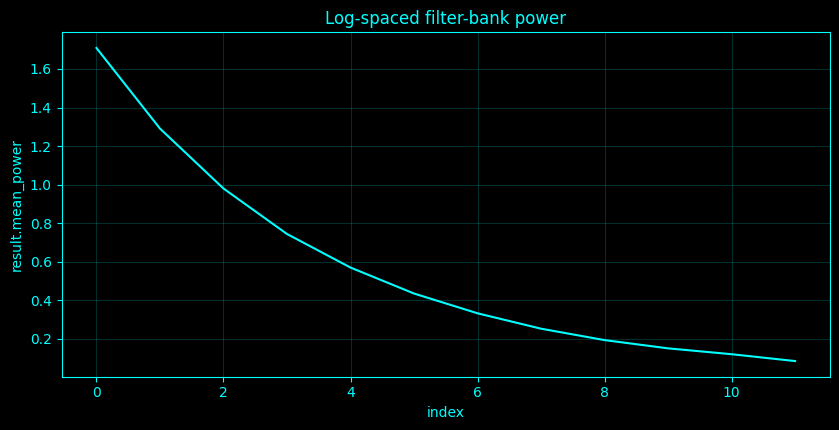

In [32]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _filterbank():
    centers = np.geomspace(2, min(45, 0.4 * _fs), 12)
    powers = []
    analytic = []
    for fc in centers:
        lo = max(0.5, fc / np.sqrt(2))
        hi = min(0.45 * _fs, fc * np.sqrt(2))
        if lo >= hi:
            continue
        sos = signal.butter(3, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
        Y = signal.sosfiltfilt(sos, X, axis=0)
        powers.append(np.mean(Y ** 2, axis=0))
        analytic.append(signal.hilbert(Y, axis=0))
    return (centers[:len(powers)], np.asarray(powers), analytic)

# Method-specific calculation.
def _compute_method_198():
    idx = 198
    name = 'Log-spaced filter-bank power'
    __plot_spec = None
    centers, powers, analytic = _filterbank()
    return ({'log_spaced_centers_hz': centers.tolist(), 'mean_power': np.mean(powers, axis=1).tolist()}, locals().get('__plot_spec', None))
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    F = powers.T
    F = (F - F.mean(0)) / (F.std(0) + EPS)
    return ({'filterbank_fingerprints': F}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_198,_plot_spec=_compute_method_198()
print('Log-spaced filter-bank power')
if isinstance(result_198,dict):
    for _k,_v in result_198.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_198)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_198)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Log-spaced filter-bank power',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Log-spaced filter-bank power',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Log-spaced filter-bank power',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">199. Constant-Q transform</h3>
<p>A constant-Q/log-spaced filter bank uses geometrically spaced center frequencies and bandwidth proportional to center frequency, so \(Q=f_c/\Delta f\) is approximately constant.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Constant-Q transform
  constant_Q_centers_hz: array(12,), mean=14.7026
  Q_approx: 1.4142135623730947


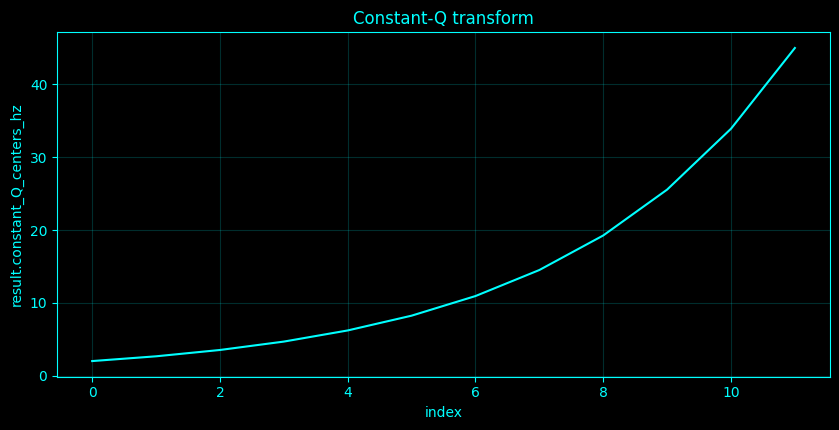

In [33]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _filterbank():
    centers = np.geomspace(2, min(45, 0.4 * _fs), 12)
    powers = []
    analytic = []
    for fc in centers:
        lo = max(0.5, fc / np.sqrt(2))
        hi = min(0.45 * _fs, fc * np.sqrt(2))
        if lo >= hi:
            continue
        sos = signal.butter(3, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
        Y = signal.sosfiltfilt(sos, X, axis=0)
        powers.append(np.mean(Y ** 2, axis=0))
        analytic.append(signal.hilbert(Y, axis=0))
    return (centers[:len(powers)], np.asarray(powers), analytic)

# Method-specific calculation.
def _compute_method_199():
    idx = 199
    name = 'Constant-Q transform'
    __plot_spec = None
    centers, powers, analytic = _filterbank()
    return ({'constant_Q_centers_hz': centers.tolist(), 'Q_approx': float(1 / (np.sqrt(2) - 1 / np.sqrt(2)))}, locals().get('__plot_spec', None))
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    F = powers.T
    F = (F - F.mean(0)) / (F.std(0) + EPS)
    return ({'filterbank_fingerprints': F}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_199,_plot_spec=_compute_method_199()
print('Constant-Q transform')
if isinstance(result_199,dict):
    for _k,_v in result_199.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_199)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_199)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Constant-Q transform',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Constant-Q transform',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Constant-Q transform',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">200. Mel-like EEG spectral bank</h3>
<p>A mel-like EEG bank spaces spectral bins uniformly on \(m=2595\log_{10}(1+f/700)\), then maps them back to hertz. It is used only as a multiresolution feature bank, not as an auditory claim about EEG.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Mel-like EEG spectral bank
  bank_edges_hz: array(14,), mean=22.794
  bank_power: array(13,), mean=0.00249628


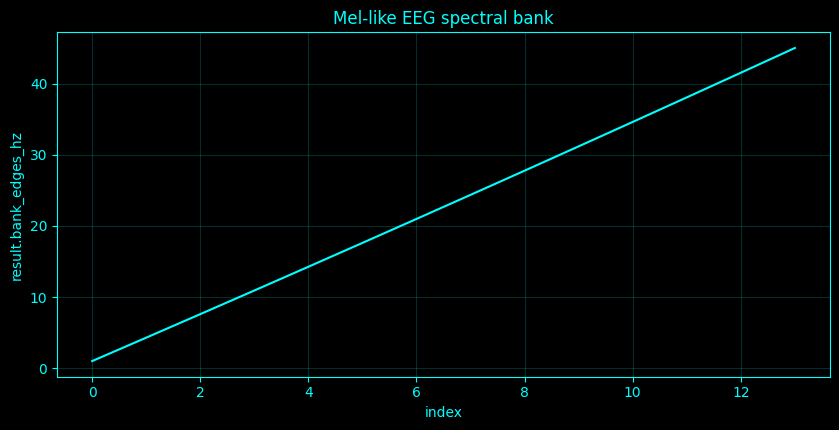

In [34]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _filterbank():
    centers = np.geomspace(2, min(45, 0.4 * _fs), 12)
    powers = []
    analytic = []
    for fc in centers:
        lo = max(0.5, fc / np.sqrt(2))
        hi = min(0.45 * _fs, fc * np.sqrt(2))
        if lo >= hi:
            continue
        sos = signal.butter(3, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
        Y = signal.sosfiltfilt(sos, X, axis=0)
        powers.append(np.mean(Y ** 2, axis=0))
        analytic.append(signal.hilbert(Y, axis=0))
    return (centers[:len(powers)], np.asarray(powers), analytic)

# Method-specific calculation.
def _compute_method_200():
    idx = 200
    name = 'Mel-like EEG spectral bank'
    __plot_spec = None
    centers, powers, analytic = _filterbank()
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    scale = lambda hz: 2595 * np.log10(1 + hz / 700)
    inv = lambda m: 700 * (10 ** (m / 2595) - 1)
    pts = inv(np.linspace(scale(1), scale(min(45, 0.45 * _fs)), 14))
    vals = []
    for a, b in zip(pts[:-1], pts[1:]):
        vals.append(float(_band_integral(p[:, None], f, (a, b))[0]))
    return ({'bank_edges_hz': pts.tolist(), 'bank_power': vals}, locals().get('__plot_spec', None))
    F = powers.T
    F = (F - F.mean(0)) / (F.std(0) + EPS)
    return ({'filterbank_fingerprints': F}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_200,_plot_spec=_compute_method_200()
print('Mel-like EEG spectral bank')
if isinstance(result_200,dict):
    for _k,_v in result_200.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_200)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_200)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Mel-like EEG spectral bank',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Mel-like EEG spectral bank',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Mel-like EEG spectral bank',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">201. ERB-like EEG spectral bank</h3>
<p>An ERB-like bank uses the equivalent-rectangular-bandwidth scale \(E=21.4\log_{10}(1+0.00437f)\) to define nonuniform spectral bins.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

ERB-like EEG spectral bank
  bank_edges_hz: array(14,), mean=22.4074
  bank_power: array(13,), mean=0.00247459


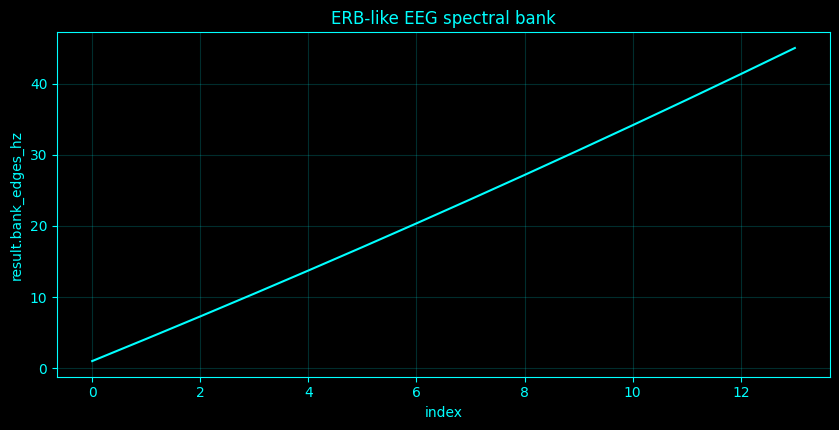

In [35]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _filterbank():
    centers = np.geomspace(2, min(45, 0.4 * _fs), 12)
    powers = []
    analytic = []
    for fc in centers:
        lo = max(0.5, fc / np.sqrt(2))
        hi = min(0.45 * _fs, fc * np.sqrt(2))
        if lo >= hi:
            continue
        sos = signal.butter(3, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
        Y = signal.sosfiltfilt(sos, X, axis=0)
        powers.append(np.mean(Y ** 2, axis=0))
        analytic.append(signal.hilbert(Y, axis=0))
    return (centers[:len(powers)], np.asarray(powers), analytic)

# Method-specific calculation.
def _compute_method_201():
    idx = 201
    name = 'ERB-like EEG spectral bank'
    __plot_spec = None
    centers, powers, analytic = _filterbank()
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    scale = lambda hz: 21.4 * np.log10(1 + 0.00437 * hz)
    inv = lambda e: (10 ** (e / 21.4) - 1) / 0.00437
    pts = inv(np.linspace(scale(1), scale(min(45, 0.45 * _fs)), 14))
    vals = []
    for a, b in zip(pts[:-1], pts[1:]):
        vals.append(float(_band_integral(p[:, None], f, (a, b))[0]))
    return ({'bank_edges_hz': pts.tolist(), 'bank_power': vals}, locals().get('__plot_spec', None))
    F = powers.T
    F = (F - F.mean(0)) / (F.std(0) + EPS)
    return ({'filterbank_fingerprints': F}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_201,_plot_spec=_compute_method_201()
print('ERB-like EEG spectral bank')
if isinstance(result_201,dict):
    for _k,_v in result_201.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_201)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_201)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'ERB-like EEG spectral bank',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'ERB-like EEG spectral bank',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('ERB-like EEG spectral bank',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">202. Gabor filter-bank analysis</h3>
<p>A Gabor filter is a complex sinusoid multiplied by a Gaussian window. A Gabor bank measures localized energy at several center frequencies.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Gabor filter-bank analysis
  Gabor_energy: array(12,), mean=7.42237


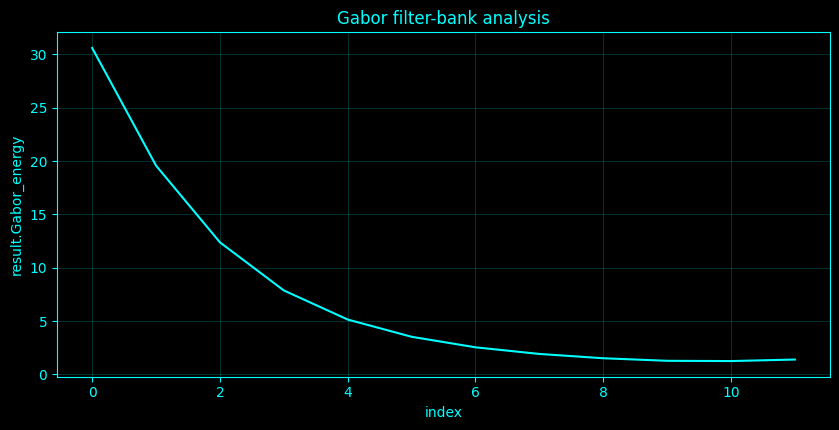

In [36]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _filterbank():
    centers = np.geomspace(2, min(45, 0.4 * _fs), 12)
    powers = []
    analytic = []
    for fc in centers:
        lo = max(0.5, fc / np.sqrt(2))
        hi = min(0.45 * _fs, fc * np.sqrt(2))
        if lo >= hi:
            continue
        sos = signal.butter(3, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
        Y = signal.sosfiltfilt(sos, X, axis=0)
        powers.append(np.mean(Y ** 2, axis=0))
        analytic.append(signal.hilbert(Y, axis=0))
    return (centers[:len(powers)], np.asarray(powers), analytic)

# Method-specific calculation.
def _compute_method_202():
    idx = 202
    name = 'Gabor filter-bank analysis'
    __plot_spec = None
    centers, powers, analytic = _filterbank()
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    vals = []
    for fc in centers:
        sigma = 2 / (2 * np.pi * fc)
        half = int(max(8, 4 * sigma * _fs))
        tt = np.arange(-half, half + 1) / _fs
        g = np.exp(-tt ** 2 / (2 * sigma ** 2)) * np.exp(2j * np.pi * fc * tt)
        z = signal.fftconvolve(X[:, 0], g, mode='same')
        vals.append(float(np.mean(np.abs(z) ** 2)))
    return ({'Gabor_energy': vals}, locals().get('__plot_spec', None))
    F = powers.T
    F = (F - F.mean(0)) / (F.std(0) + EPS)
    return ({'filterbank_fingerprints': F}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_202,_plot_spec=_compute_method_202()
print('Gabor filter-bank analysis')
if isinstance(result_202,dict):
    for _k,_v in result_202.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_202)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_202)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Gabor filter-bank analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Gabor filter-bank analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Gabor filter-bank analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">203. Multiresolution bandpower</h3>
<p>Multiresolution bandpower integrates energy from a geometric filter bank whose bandwidth grows with center frequency.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Multiresolution bandpower
  multiresolution_bandpower: {2.0: 1.709034056070485, 2.65433466645825: 1.290832865245019, 3.522746260781014: 0.979802441011041, 4.67527376056361: 0.7437311501762688, 6.20487060892331: 0.56


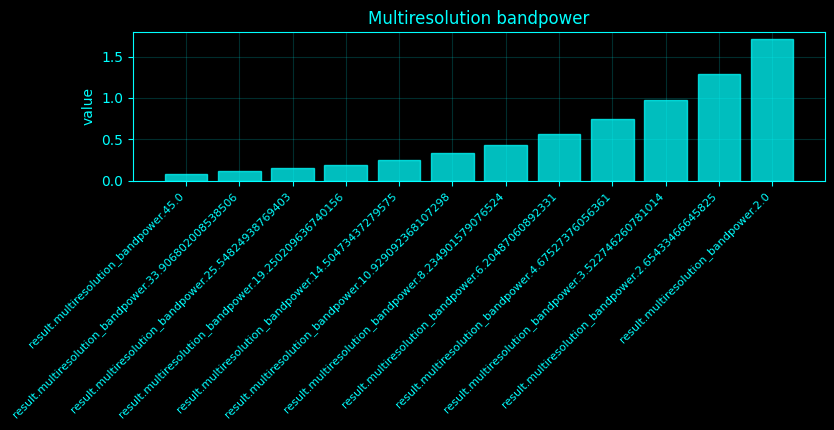

In [37]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _filterbank():
    centers = np.geomspace(2, min(45, 0.4 * _fs), 12)
    powers = []
    analytic = []
    for fc in centers:
        lo = max(0.5, fc / np.sqrt(2))
        hi = min(0.45 * _fs, fc * np.sqrt(2))
        if lo >= hi:
            continue
        sos = signal.butter(3, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
        Y = signal.sosfiltfilt(sos, X, axis=0)
        powers.append(np.mean(Y ** 2, axis=0))
        analytic.append(signal.hilbert(Y, axis=0))
    return (centers[:len(powers)], np.asarray(powers), analytic)

# Method-specific calculation.
def _compute_method_203():
    idx = 203
    name = 'Multiresolution bandpower'
    __plot_spec = None
    centers, powers, analytic = _filterbank()
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    return ({'multiresolution_bandpower': dict(zip(centers.tolist(), np.mean(powers, axis=1).tolist()))}, locals().get('__plot_spec', None))
    F = powers.T
    F = (F - F.mean(0)) / (F.std(0) + EPS)
    return ({'filterbank_fingerprints': F}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_203,_plot_spec=_compute_method_203()
print('Multiresolution bandpower')
if isinstance(result_203,dict):
    for _k,_v in result_203.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_203)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_203)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Multiresolution bandpower',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Multiresolution bandpower',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Multiresolution bandpower',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">204. Filter-bank coherence</h3>
<p>Filter-bank coherence computes normalized cross-power separately in each narrowband analytic filter output.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Filter-bank coherence
  filterbank_coherence: array(12,), mean=0.999277


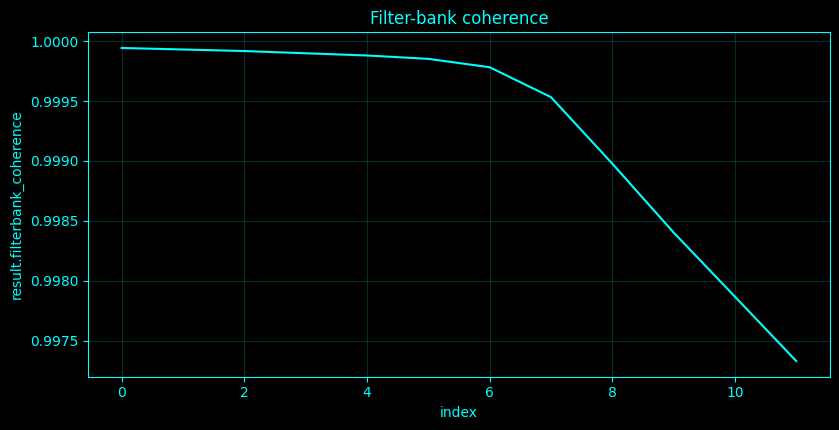

In [38]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _filterbank():
    centers = np.geomspace(2, min(45, 0.4 * _fs), 12)
    powers = []
    analytic = []
    for fc in centers:
        lo = max(0.5, fc / np.sqrt(2))
        hi = min(0.45 * _fs, fc * np.sqrt(2))
        if lo >= hi:
            continue
        sos = signal.butter(3, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
        Y = signal.sosfiltfilt(sos, X, axis=0)
        powers.append(np.mean(Y ** 2, axis=0))
        analytic.append(signal.hilbert(Y, axis=0))
    return (centers[:len(powers)], np.asarray(powers), analytic)

# Method-specific calculation.
def _compute_method_204():
    idx = 204
    name = 'Filter-bank coherence'
    __plot_spec = None
    centers, powers, analytic = _filterbank()
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    vals = []
    for z in analytic:
        vals.append(float(np.abs(np.mean(z[:, 0] * np.conj(z[:, 1]))) ** 2 / (np.mean(np.abs(z[:, 0]) ** 2) * np.mean(np.abs(z[:, 1]) ** 2) + EPS)))
    return ({'filterbank_coherence': vals}, locals().get('__plot_spec', None))
    F = powers.T
    F = (F - F.mean(0)) / (F.std(0) + EPS)
    return ({'filterbank_fingerprints': F}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_204,_plot_spec=_compute_method_204()
print('Filter-bank coherence')
if isinstance(result_204,dict):
    for _k,_v in result_204.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_204)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_204)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Filter-bank coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Filter-bank coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Filter-bank coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">205. Filter-bank phase locking</h3>
<p>Filter-bank phase locking applies PLV to analytic phases within each filter-bank band.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Filter-bank phase locking
  filterbank_PLV: array(12,), mean=0.826492


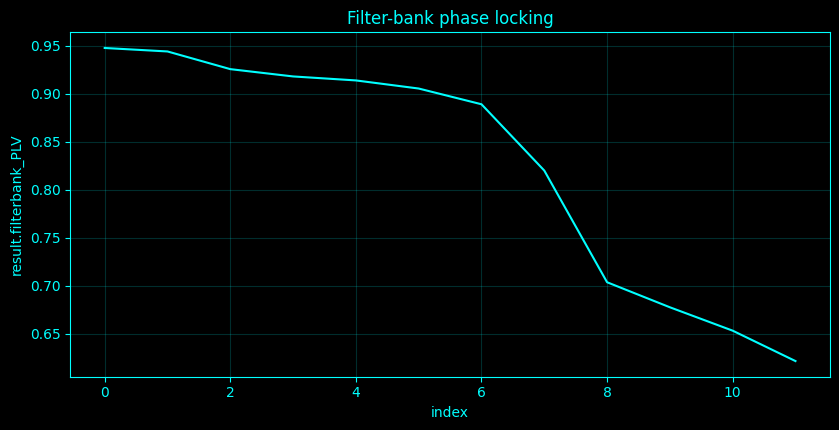

In [39]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _filterbank():
    centers = np.geomspace(2, min(45, 0.4 * _fs), 12)
    powers = []
    analytic = []
    for fc in centers:
        lo = max(0.5, fc / np.sqrt(2))
        hi = min(0.45 * _fs, fc * np.sqrt(2))
        if lo >= hi:
            continue
        sos = signal.butter(3, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
        Y = signal.sosfiltfilt(sos, X, axis=0)
        powers.append(np.mean(Y ** 2, axis=0))
        analytic.append(signal.hilbert(Y, axis=0))
    return (centers[:len(powers)], np.asarray(powers), analytic)

# Method-specific calculation.
def _compute_method_205():
    idx = 205
    name = 'Filter-bank phase locking'
    __plot_spec = None
    centers, powers, analytic = _filterbank()
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    return ({'filterbank_PLV': [float(np.abs(np.mean(np.exp(1j * (np.angle(z[:, 0]) - np.angle(z[:, 1])))))) for z in analytic]}, locals().get('__plot_spec', None))
    F = powers.T
    F = (F - F.mean(0)) / (F.std(0) + EPS)
    return ({'filterbank_fingerprints': F}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_205,_plot_spec=_compute_method_205()
print('Filter-bank phase locking')
if isinstance(result_205,dict):
    for _k,_v in result_205.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_205)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_205)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Filter-bank phase locking',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Filter-bank phase locking',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Filter-bank phase locking',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">206. Filter-bank entropy</h3>
<p>Filter-bank entropy normalizes a channel's filter-bank powers \(p_k\) and computes \(-\sum_kp_k\log p_k/\log K\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Filter-bank entropy
  channel_filterbank_entropy: array(12,), mean=0.878879


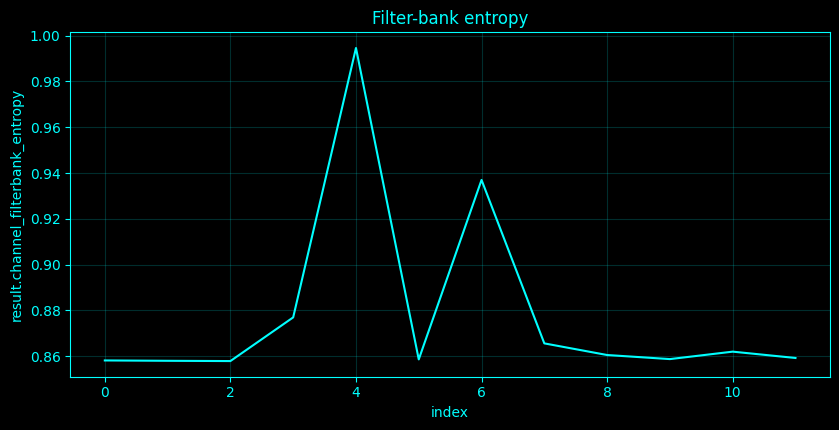

In [40]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _filterbank():
    centers = np.geomspace(2, min(45, 0.4 * _fs), 12)
    powers = []
    analytic = []
    for fc in centers:
        lo = max(0.5, fc / np.sqrt(2))
        hi = min(0.45 * _fs, fc * np.sqrt(2))
        if lo >= hi:
            continue
        sos = signal.butter(3, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
        Y = signal.sosfiltfilt(sos, X, axis=0)
        powers.append(np.mean(Y ** 2, axis=0))
        analytic.append(signal.hilbert(Y, axis=0))
    return (centers[:len(powers)], np.asarray(powers), analytic)

# Method-specific calculation.
def _compute_method_206():
    idx = 206
    name = 'Filter-bank entropy'
    __plot_spec = None
    centers, powers, analytic = _filterbank()
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    q = powers / (np.sum(powers, axis=0, keepdims=True) + EPS)
    H = -np.sum(q * np.log(q + EPS), axis=0) / np.log(len(q))
    return ({'channel_filterbank_entropy': H.tolist()}, locals().get('__plot_spec', None))
    F = powers.T
    F = (F - F.mean(0)) / (F.std(0) + EPS)
    return ({'filterbank_fingerprints': F}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_206,_plot_spec=_compute_method_206()
print('Filter-bank entropy')
if isinstance(result_206,dict):
    for _k,_v in result_206.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_206)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_206)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Filter-bank entropy',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Filter-bank entropy',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Filter-bank entropy',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">207. Filter-bank feature fingerprints</h3>
<p>Filter-bank feature fingerprints are standardized vectors of multiresolution band powers for each channel.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Filter-bank feature fingerprints
  filterbank_fingerprints: array(12, 12), mean=7.40149e-17


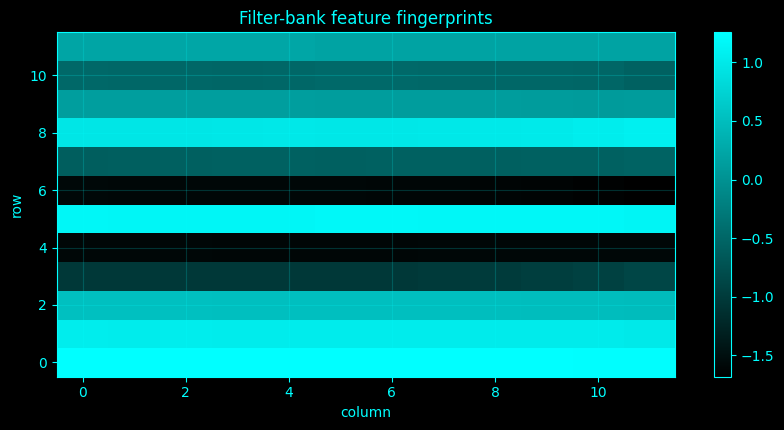

In [41]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _filterbank():
    centers = np.geomspace(2, min(45, 0.4 * _fs), 12)
    powers = []
    analytic = []
    for fc in centers:
        lo = max(0.5, fc / np.sqrt(2))
        hi = min(0.45 * _fs, fc * np.sqrt(2))
        if lo >= hi:
            continue
        sos = signal.butter(3, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
        Y = signal.sosfiltfilt(sos, X, axis=0)
        powers.append(np.mean(Y ** 2, axis=0))
        analytic.append(signal.hilbert(Y, axis=0))
    return (centers[:len(powers)], np.asarray(powers), analytic)

# Method-specific calculation.
def _compute_method_207():
    idx = 207
    name = 'Filter-bank feature fingerprints'
    __plot_spec = None
    centers, powers, analytic = _filterbank()
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    F = powers.T
    F = (F - F.mean(0)) / (F.std(0) + EPS)
    return ({'filterbank_fingerprints': F}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_207,_plot_spec=_compute_method_207()
print('Filter-bank feature fingerprints')
if isinstance(result_207,dict):
    for _k,_v in result_207.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_207)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_207)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Filter-bank feature fingerprints',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Filter-bank feature fingerprints',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Filter-bank feature fingerprints',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">208. Event-related spectral perturbation</h3>
<p>Event-related spectral perturbation averages event-centered spectrogram power and normalizes each frequency to a pre-event baseline, here in decibels: \(\mathrm{ERSP}(f,t)=10\log_{10}[P(f,t)/P_{base}(f)]\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [42]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _event_indices():
    if 'SPECTRAL_EVENT_INDICES' in globals():
        e = np.asarray(globals()['SPECTRAL_EVENT_INDICES'], int)
        return e[(e > int(_fs)) & (e < N - int(_fs))]
    env = np.mean(np.abs(_analytic_band(BANDS['alpha'])), axis=1)
    dist = max(1, int(_fs))
    p, _ = signal.find_peaks(env, distance=dist, prominence=np.std(env) * 0.5)
    return p

def _event_spectra():
    ev = _event_indices()
    pre = 0.75
    post = 1.25
    npre = int(pre * _fs)
    npost = int(post * _fs)
    f_ref = None
    arr = []
    for e in ev[:max(4, _SPEED['n_windows'])]:
        a = e - npre
        b = e + npost
        if a < 0 or b > N:
            continue
        f, t, Z = signal.stft(X[a:b, 0], fs=_fs, nperseg=min(128, b - a), noverlap=min(96, max(0, b - a - 1)), boundary=None)
        keep = (f >= 1) & (f <= min(45, 0.45 * _fs))
        arr.append(np.abs(Z[keep]) ** 2)
        f_ref = f[keep]
        t_ref = t - pre
    if not arr:
        return (None, None, None)
    nt = min((q.shape[1] for q in arr))
    A = np.stack([q[:, :nt] for q in arr])
    return (f_ref, t_ref[:nt], A)

# Method-specific calculation.
def _compute_method_208():
    idx = 208
    name = 'Event-related spectral perturbation'
    __plot_spec = None
    fE, tE, A = _event_spectra()
    if A is None:
        return ({'status': 'no valid events in the current segment'}, locals().get('__plot_spec', None))
    meanP = np.mean(A, axis=0)
    base = tE < 0
    if not np.any(base):
        base = np.arange(len(tE)) < max(1, len(tE) // 4)
    B = np.mean(meanP[:, base], axis=1, keepdims=True) + EPS
    ersp_db = 10 * np.log10((meanP + EPS) / B)
    __plot_spec = ('summary', ersp_db, name, None, '', 'value')
    return ({'events_used': int(A.shape[0]), 'baseline_normalization': '10log10(P/Pbaseline)'}, locals().get('__plot_spec', None))

    def band_curve(band):
        m = (fE >= band[0]) & (fE < min(band[1], 0.49 * _fs))
        return np.mean(ersp_db[m], axis=0) if np.any(m) else np.full(len(tE), np.nan)
    alpha = band_curve(BANDS['alpha'])
    beta = band_curve(BANDS['beta'])
    gamma = band_curve(BANDS['gamma'])
    post = tE >= 0
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_208,_plot_spec=_compute_method_208()
print('Event-related spectral perturbation')
if isinstance(result_208,dict):
    for _k,_v in result_208.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_208)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_208)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Event-related spectral perturbation',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Event-related spectral perturbation',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Event-related spectral perturbation',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Event-related spectral perturbation
  status: no valid events in the current segment


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">209. ERSP analysis</h3>
<p>Event-related spectral perturbation averages event-centered spectrogram power and normalizes each frequency to a pre-event baseline, here in decibels: \(\mathrm{ERSP}(f,t)=10\log_{10}[P(f,t)/P_{base}(f)]\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [43]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _event_indices():
    if 'SPECTRAL_EVENT_INDICES' in globals():
        e = np.asarray(globals()['SPECTRAL_EVENT_INDICES'], int)
        return e[(e > int(_fs)) & (e < N - int(_fs))]
    env = np.mean(np.abs(_analytic_band(BANDS['alpha'])), axis=1)
    dist = max(1, int(_fs))
    p, _ = signal.find_peaks(env, distance=dist, prominence=np.std(env) * 0.5)
    return p

def _event_spectra():
    ev = _event_indices()
    pre = 0.75
    post = 1.25
    npre = int(pre * _fs)
    npost = int(post * _fs)
    f_ref = None
    arr = []
    for e in ev[:max(4, _SPEED['n_windows'])]:
        a = e - npre
        b = e + npost
        if a < 0 or b > N:
            continue
        f, t, Z = signal.stft(X[a:b, 0], fs=_fs, nperseg=min(128, b - a), noverlap=min(96, max(0, b - a - 1)), boundary=None)
        keep = (f >= 1) & (f <= min(45, 0.45 * _fs))
        arr.append(np.abs(Z[keep]) ** 2)
        f_ref = f[keep]
        t_ref = t - pre
    if not arr:
        return (None, None, None)
    nt = min((q.shape[1] for q in arr))
    A = np.stack([q[:, :nt] for q in arr])
    return (f_ref, t_ref[:nt], A)

# Method-specific calculation.
def _compute_method_209():
    idx = 209
    name = 'ERSP analysis'
    __plot_spec = None
    fE, tE, A = _event_spectra()
    if A is None:
        return ({'status': 'no valid events in the current segment'}, locals().get('__plot_spec', None))
    meanP = np.mean(A, axis=0)
    base = tE < 0
    if not np.any(base):
        base = np.arange(len(tE)) < max(1, len(tE) // 4)
    B = np.mean(meanP[:, base], axis=1, keepdims=True) + EPS
    ersp_db = 10 * np.log10((meanP + EPS) / B)
    __plot_spec = ('summary', ersp_db, name, None, '', 'value')
    return ({'events_used': int(A.shape[0]), 'baseline_normalization': '10log10(P/Pbaseline)'}, locals().get('__plot_spec', None))

    def band_curve(band):
        m = (fE >= band[0]) & (fE < min(band[1], 0.49 * _fs))
        return np.mean(ersp_db[m], axis=0) if np.any(m) else np.full(len(tE), np.nan)
    alpha = band_curve(BANDS['alpha'])
    beta = band_curve(BANDS['beta'])
    gamma = band_curve(BANDS['gamma'])
    post = tE >= 0
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_209,_plot_spec=_compute_method_209()
print('ERSP analysis')
if isinstance(result_209,dict):
    for _k,_v in result_209.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_209)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_209)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'ERSP analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'ERSP analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('ERSP analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


ERSP analysis
  status: no valid events in the current segment


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">210. Event-related synchronization</h3>
<p>Event-related synchronization is a positive post-event increase in baseline-normalized spectral power.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [44]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _event_indices():
    if 'SPECTRAL_EVENT_INDICES' in globals():
        e = np.asarray(globals()['SPECTRAL_EVENT_INDICES'], int)
        return e[(e > int(_fs)) & (e < N - int(_fs))]
    env = np.mean(np.abs(_analytic_band(BANDS['alpha'])), axis=1)
    dist = max(1, int(_fs))
    p, _ = signal.find_peaks(env, distance=dist, prominence=np.std(env) * 0.5)
    return p

def _event_spectra():
    ev = _event_indices()
    pre = 0.75
    post = 1.25
    npre = int(pre * _fs)
    npost = int(post * _fs)
    f_ref = None
    arr = []
    for e in ev[:max(4, _SPEED['n_windows'])]:
        a = e - npre
        b = e + npost
        if a < 0 or b > N:
            continue
        f, t, Z = signal.stft(X[a:b, 0], fs=_fs, nperseg=min(128, b - a), noverlap=min(96, max(0, b - a - 1)), boundary=None)
        keep = (f >= 1) & (f <= min(45, 0.45 * _fs))
        arr.append(np.abs(Z[keep]) ** 2)
        f_ref = f[keep]
        t_ref = t - pre
    if not arr:
        return (None, None, None)
    nt = min((q.shape[1] for q in arr))
    A = np.stack([q[:, :nt] for q in arr])
    return (f_ref, t_ref[:nt], A)

# Method-specific calculation.
def _compute_method_210():
    idx = 210
    name = 'Event-related synchronization'
    __plot_spec = None
    fE, tE, A = _event_spectra()
    if A is None:
        return ({'status': 'no valid events in the current segment'}, locals().get('__plot_spec', None))
    meanP = np.mean(A, axis=0)
    base = tE < 0
    if not np.any(base):
        base = np.arange(len(tE)) < max(1, len(tE) // 4)
    B = np.mean(meanP[:, base], axis=1, keepdims=True) + EPS
    ersp_db = 10 * np.log10((meanP + EPS) / B)

    def band_curve(band):
        m = (fE >= band[0]) & (fE < min(band[1], 0.49 * _fs))
        return np.mean(ersp_db[m], axis=0) if np.any(m) else np.full(len(tE), np.nan)
    alpha = band_curve(BANDS['alpha'])
    beta = band_curve(BANDS['beta'])
    gamma = band_curve(BANDS['gamma'])
    post = tE >= 0
    return ({'ERS_peak_db': float(np.nanmax(ersp_db[:, post]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_210,_plot_spec=_compute_method_210()
print('Event-related synchronization')
if isinstance(result_210,dict):
    for _k,_v in result_210.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_210)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_210)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Event-related synchronization',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Event-related synchronization',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Event-related synchronization',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Event-related synchronization
  status: no valid events in the current segment


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">211. Event-related desynchronization</h3>
<p>Event-related desynchronization is a negative post-event change in baseline-normalized spectral power.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [45]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _event_indices():
    if 'SPECTRAL_EVENT_INDICES' in globals():
        e = np.asarray(globals()['SPECTRAL_EVENT_INDICES'], int)
        return e[(e > int(_fs)) & (e < N - int(_fs))]
    env = np.mean(np.abs(_analytic_band(BANDS['alpha'])), axis=1)
    dist = max(1, int(_fs))
    p, _ = signal.find_peaks(env, distance=dist, prominence=np.std(env) * 0.5)
    return p

def _event_spectra():
    ev = _event_indices()
    pre = 0.75
    post = 1.25
    npre = int(pre * _fs)
    npost = int(post * _fs)
    f_ref = None
    arr = []
    for e in ev[:max(4, _SPEED['n_windows'])]:
        a = e - npre
        b = e + npost
        if a < 0 or b > N:
            continue
        f, t, Z = signal.stft(X[a:b, 0], fs=_fs, nperseg=min(128, b - a), noverlap=min(96, max(0, b - a - 1)), boundary=None)
        keep = (f >= 1) & (f <= min(45, 0.45 * _fs))
        arr.append(np.abs(Z[keep]) ** 2)
        f_ref = f[keep]
        t_ref = t - pre
    if not arr:
        return (None, None, None)
    nt = min((q.shape[1] for q in arr))
    A = np.stack([q[:, :nt] for q in arr])
    return (f_ref, t_ref[:nt], A)

# Method-specific calculation.
def _compute_method_211():
    idx = 211
    name = 'Event-related desynchronization'
    __plot_spec = None
    fE, tE, A = _event_spectra()
    if A is None:
        return ({'status': 'no valid events in the current segment'}, locals().get('__plot_spec', None))
    meanP = np.mean(A, axis=0)
    base = tE < 0
    if not np.any(base):
        base = np.arange(len(tE)) < max(1, len(tE) // 4)
    B = np.mean(meanP[:, base], axis=1, keepdims=True) + EPS
    ersp_db = 10 * np.log10((meanP + EPS) / B)

    def band_curve(band):
        m = (fE >= band[0]) & (fE < min(band[1], 0.49 * _fs))
        return np.mean(ersp_db[m], axis=0) if np.any(m) else np.full(len(tE), np.nan)
    alpha = band_curve(BANDS['alpha'])
    beta = band_curve(BANDS['beta'])
    gamma = band_curve(BANDS['gamma'])
    post = tE >= 0
    return ({'ERD_min_db': float(np.nanmin(ersp_db[:, post]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_211,_plot_spec=_compute_method_211()
print('Event-related desynchronization')
if isinstance(result_211,dict):
    for _k,_v in result_211.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_211)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_211)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Event-related desynchronization',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Event-related desynchronization',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Event-related desynchronization',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Event-related desynchronization
  status: no valid events in the current segment


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">212. Baseline-normalized ERD/ERS</h3>
<p>Percent ERD/ERS is \(100[P(f,t)-P_{base}(f)]/P_{base}(f)\), complementary to the dB ERSP convention.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [46]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _event_indices():
    if 'SPECTRAL_EVENT_INDICES' in globals():
        e = np.asarray(globals()['SPECTRAL_EVENT_INDICES'], int)
        return e[(e > int(_fs)) & (e < N - int(_fs))]
    env = np.mean(np.abs(_analytic_band(BANDS['alpha'])), axis=1)
    dist = max(1, int(_fs))
    p, _ = signal.find_peaks(env, distance=dist, prominence=np.std(env) * 0.5)
    return p

def _event_spectra():
    ev = _event_indices()
    pre = 0.75
    post = 1.25
    npre = int(pre * _fs)
    npost = int(post * _fs)
    f_ref = None
    arr = []
    for e in ev[:max(4, _SPEED['n_windows'])]:
        a = e - npre
        b = e + npost
        if a < 0 or b > N:
            continue
        f, t, Z = signal.stft(X[a:b, 0], fs=_fs, nperseg=min(128, b - a), noverlap=min(96, max(0, b - a - 1)), boundary=None)
        keep = (f >= 1) & (f <= min(45, 0.45 * _fs))
        arr.append(np.abs(Z[keep]) ** 2)
        f_ref = f[keep]
        t_ref = t - pre
    if not arr:
        return (None, None, None)
    nt = min((q.shape[1] for q in arr))
    A = np.stack([q[:, :nt] for q in arr])
    return (f_ref, t_ref[:nt], A)

# Method-specific calculation.
def _compute_method_212():
    idx = 212
    name = 'Baseline-normalized ERD/ERS'
    __plot_spec = None
    fE, tE, A = _event_spectra()
    if A is None:
        return ({'status': 'no valid events in the current segment'}, locals().get('__plot_spec', None))
    meanP = np.mean(A, axis=0)
    base = tE < 0
    if not np.any(base):
        base = np.arange(len(tE)) < max(1, len(tE) // 4)
    B = np.mean(meanP[:, base], axis=1, keepdims=True) + EPS
    ersp_db = 10 * np.log10((meanP + EPS) / B)

    def band_curve(band):
        m = (fE >= band[0]) & (fE < min(band[1], 0.49 * _fs))
        return np.mean(ersp_db[m], axis=0) if np.any(m) else np.full(len(tE), np.nan)
    alpha = band_curve(BANDS['alpha'])
    beta = band_curve(BANDS['beta'])
    gamma = band_curve(BANDS['gamma'])
    post = tE >= 0
    pct = 100 * (meanP - B) / (B + EPS)
    return ({'mean_post_percent_change': float(np.nanmean(pct[:, post]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_212,_plot_spec=_compute_method_212()
print('Baseline-normalized ERD/ERS')
if isinstance(result_212,dict):
    for _k,_v in result_212.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_212)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_212)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Baseline-normalized ERD/ERS',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Baseline-normalized ERD/ERS',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Baseline-normalized ERD/ERS',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Baseline-normalized ERD/ERS
  status: no valid events in the current segment


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">213. Event-locked alpha suppression</h3>
<p>Event-locked alpha suppression is the minimum post-event 8–13-Hz ERSP relative to the pre-event baseline.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [47]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _event_indices():
    if 'SPECTRAL_EVENT_INDICES' in globals():
        e = np.asarray(globals()['SPECTRAL_EVENT_INDICES'], int)
        return e[(e > int(_fs)) & (e < N - int(_fs))]
    env = np.mean(np.abs(_analytic_band(BANDS['alpha'])), axis=1)
    dist = max(1, int(_fs))
    p, _ = signal.find_peaks(env, distance=dist, prominence=np.std(env) * 0.5)
    return p

def _event_spectra():
    ev = _event_indices()
    pre = 0.75
    post = 1.25
    npre = int(pre * _fs)
    npost = int(post * _fs)
    f_ref = None
    arr = []
    for e in ev[:max(4, _SPEED['n_windows'])]:
        a = e - npre
        b = e + npost
        if a < 0 or b > N:
            continue
        f, t, Z = signal.stft(X[a:b, 0], fs=_fs, nperseg=min(128, b - a), noverlap=min(96, max(0, b - a - 1)), boundary=None)
        keep = (f >= 1) & (f <= min(45, 0.45 * _fs))
        arr.append(np.abs(Z[keep]) ** 2)
        f_ref = f[keep]
        t_ref = t - pre
    if not arr:
        return (None, None, None)
    nt = min((q.shape[1] for q in arr))
    A = np.stack([q[:, :nt] for q in arr])
    return (f_ref, t_ref[:nt], A)

# Method-specific calculation.
def _compute_method_213():
    idx = 213
    name = 'Event-locked alpha suppression'
    __plot_spec = None
    fE, tE, A = _event_spectra()
    if A is None:
        return ({'status': 'no valid events in the current segment'}, locals().get('__plot_spec', None))
    meanP = np.mean(A, axis=0)
    base = tE < 0
    if not np.any(base):
        base = np.arange(len(tE)) < max(1, len(tE) // 4)
    B = np.mean(meanP[:, base], axis=1, keepdims=True) + EPS
    ersp_db = 10 * np.log10((meanP + EPS) / B)

    def band_curve(band):
        m = (fE >= band[0]) & (fE < min(band[1], 0.49 * _fs))
        return np.mean(ersp_db[m], axis=0) if np.any(m) else np.full(len(tE), np.nan)
    alpha = band_curve(BANDS['alpha'])
    beta = band_curve(BANDS['beta'])
    gamma = band_curve(BANDS['gamma'])
    post = tE >= 0
    return ({'alpha_suppression_db': float(np.nanmin(alpha[post]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_213,_plot_spec=_compute_method_213()
print('Event-locked alpha suppression')
if isinstance(result_213,dict):
    for _k,_v in result_213.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_213)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_213)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Event-locked alpha suppression',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Event-locked alpha suppression',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Event-locked alpha suppression',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Event-locked alpha suppression
  status: no valid events in the current segment


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">214. Event-locked beta rebound</h3>
<p>Event-locked beta rebound is the maximum post-event 13–30-Hz ERSP after baseline normalization.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [48]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _event_indices():
    if 'SPECTRAL_EVENT_INDICES' in globals():
        e = np.asarray(globals()['SPECTRAL_EVENT_INDICES'], int)
        return e[(e > int(_fs)) & (e < N - int(_fs))]
    env = np.mean(np.abs(_analytic_band(BANDS['alpha'])), axis=1)
    dist = max(1, int(_fs))
    p, _ = signal.find_peaks(env, distance=dist, prominence=np.std(env) * 0.5)
    return p

def _event_spectra():
    ev = _event_indices()
    pre = 0.75
    post = 1.25
    npre = int(pre * _fs)
    npost = int(post * _fs)
    f_ref = None
    arr = []
    for e in ev[:max(4, _SPEED['n_windows'])]:
        a = e - npre
        b = e + npost
        if a < 0 or b > N:
            continue
        f, t, Z = signal.stft(X[a:b, 0], fs=_fs, nperseg=min(128, b - a), noverlap=min(96, max(0, b - a - 1)), boundary=None)
        keep = (f >= 1) & (f <= min(45, 0.45 * _fs))
        arr.append(np.abs(Z[keep]) ** 2)
        f_ref = f[keep]
        t_ref = t - pre
    if not arr:
        return (None, None, None)
    nt = min((q.shape[1] for q in arr))
    A = np.stack([q[:, :nt] for q in arr])
    return (f_ref, t_ref[:nt], A)

# Method-specific calculation.
def _compute_method_214():
    idx = 214
    name = 'Event-locked beta rebound'
    __plot_spec = None
    fE, tE, A = _event_spectra()
    if A is None:
        return ({'status': 'no valid events in the current segment'}, locals().get('__plot_spec', None))
    meanP = np.mean(A, axis=0)
    base = tE < 0
    if not np.any(base):
        base = np.arange(len(tE)) < max(1, len(tE) // 4)
    B = np.mean(meanP[:, base], axis=1, keepdims=True) + EPS
    ersp_db = 10 * np.log10((meanP + EPS) / B)

    def band_curve(band):
        m = (fE >= band[0]) & (fE < min(band[1], 0.49 * _fs))
        return np.mean(ersp_db[m], axis=0) if np.any(m) else np.full(len(tE), np.nan)
    alpha = band_curve(BANDS['alpha'])
    beta = band_curve(BANDS['beta'])
    gamma = band_curve(BANDS['gamma'])
    post = tE >= 0
    return ({'beta_rebound_db': float(np.nanmax(beta[post]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_214,_plot_spec=_compute_method_214()
print('Event-locked beta rebound')
if isinstance(result_214,dict):
    for _k,_v in result_214.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_214)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_214)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Event-locked beta rebound',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Event-locked beta rebound',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Event-locked beta rebound',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Event-locked beta rebound
  status: no valid events in the current segment


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">215. Event-locked gamma burst detection</h3>
<p>Event-locked gamma burst detection flags high post-event gamma ERSP bins relative to their within-record distribution.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [49]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _event_indices():
    if 'SPECTRAL_EVENT_INDICES' in globals():
        e = np.asarray(globals()['SPECTRAL_EVENT_INDICES'], int)
        return e[(e > int(_fs)) & (e < N - int(_fs))]
    env = np.mean(np.abs(_analytic_band(BANDS['alpha'])), axis=1)
    dist = max(1, int(_fs))
    p, _ = signal.find_peaks(env, distance=dist, prominence=np.std(env) * 0.5)
    return p

def _event_spectra():
    ev = _event_indices()
    pre = 0.75
    post = 1.25
    npre = int(pre * _fs)
    npost = int(post * _fs)
    f_ref = None
    arr = []
    for e in ev[:max(4, _SPEED['n_windows'])]:
        a = e - npre
        b = e + npost
        if a < 0 or b > N:
            continue
        f, t, Z = signal.stft(X[a:b, 0], fs=_fs, nperseg=min(128, b - a), noverlap=min(96, max(0, b - a - 1)), boundary=None)
        keep = (f >= 1) & (f <= min(45, 0.45 * _fs))
        arr.append(np.abs(Z[keep]) ** 2)
        f_ref = f[keep]
        t_ref = t - pre
    if not arr:
        return (None, None, None)
    nt = min((q.shape[1] for q in arr))
    A = np.stack([q[:, :nt] for q in arr])
    return (f_ref, t_ref[:nt], A)

# Method-specific calculation.
def _compute_method_215():
    idx = 215
    name = 'Event-locked gamma burst detection'
    __plot_spec = None
    fE, tE, A = _event_spectra()
    if A is None:
        return ({'status': 'no valid events in the current segment'}, locals().get('__plot_spec', None))
    meanP = np.mean(A, axis=0)
    base = tE < 0
    if not np.any(base):
        base = np.arange(len(tE)) < max(1, len(tE) // 4)
    B = np.mean(meanP[:, base], axis=1, keepdims=True) + EPS
    ersp_db = 10 * np.log10((meanP + EPS) / B)

    def band_curve(band):
        m = (fE >= band[0]) & (fE < min(band[1], 0.49 * _fs))
        return np.mean(ersp_db[m], axis=0) if np.any(m) else np.full(len(tE), np.nan)
    alpha = band_curve(BANDS['alpha'])
    beta = band_curve(BANDS['beta'])
    gamma = band_curve(BANDS['gamma'])
    post = tE >= 0
    th = np.nanquantile(gamma[post], 0.9) if np.any(post) else np.nan
    return ({'gamma_event_bins_above_q90': int(np.sum(gamma[post] >= th))}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_215,_plot_spec=_compute_method_215()
print('Event-locked gamma burst detection')
if isinstance(result_215,dict):
    for _k,_v in result_215.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_215)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_215)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Event-locked gamma burst detection',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Event-locked gamma burst detection',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Event-locked gamma burst detection',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Event-locked gamma burst detection
  status: no valid events in the current segment


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">216. Trial-like pseudo-epoch spectral perturbation</h3>
<p>Pseudo-epoch spectral perturbation uses internally detected events only when external event labels are unavailable; the notebook explicitly marks these as demonstration epochs.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [50]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _event_indices():
    if 'SPECTRAL_EVENT_INDICES' in globals():
        e = np.asarray(globals()['SPECTRAL_EVENT_INDICES'], int)
        return e[(e > int(_fs)) & (e < N - int(_fs))]
    env = np.mean(np.abs(_analytic_band(BANDS['alpha'])), axis=1)
    dist = max(1, int(_fs))
    p, _ = signal.find_peaks(env, distance=dist, prominence=np.std(env) * 0.5)
    return p

def _event_spectra():
    ev = _event_indices()
    pre = 0.75
    post = 1.25
    npre = int(pre * _fs)
    npost = int(post * _fs)
    f_ref = None
    arr = []
    for e in ev[:max(4, _SPEED['n_windows'])]:
        a = e - npre
        b = e + npost
        if a < 0 or b > N:
            continue
        f, t, Z = signal.stft(X[a:b, 0], fs=_fs, nperseg=min(128, b - a), noverlap=min(96, max(0, b - a - 1)), boundary=None)
        keep = (f >= 1) & (f <= min(45, 0.45 * _fs))
        arr.append(np.abs(Z[keep]) ** 2)
        f_ref = f[keep]
        t_ref = t - pre
    if not arr:
        return (None, None, None)
    nt = min((q.shape[1] for q in arr))
    A = np.stack([q[:, :nt] for q in arr])
    return (f_ref, t_ref[:nt], A)

# Method-specific calculation.
def _compute_method_216():
    idx = 216
    name = 'Trial-like pseudo-epoch spectral perturbation'
    __plot_spec = None
    fE, tE, A = _event_spectra()
    if A is None:
        return ({'status': 'no valid events in the current segment'}, locals().get('__plot_spec', None))
    meanP = np.mean(A, axis=0)
    base = tE < 0
    if not np.any(base):
        base = np.arange(len(tE)) < max(1, len(tE) // 4)
    B = np.mean(meanP[:, base], axis=1, keepdims=True) + EPS
    ersp_db = 10 * np.log10((meanP + EPS) / B)

    def band_curve(band):
        m = (fE >= band[0]) & (fE < min(band[1], 0.49 * _fs))
        return np.mean(ersp_db[m], axis=0) if np.any(m) else np.full(len(tE), np.nan)
    alpha = band_curve(BANDS['alpha'])
    beta = band_curve(BANDS['beta'])
    gamma = band_curve(BANDS['gamma'])
    post = tE >= 0
    return ({'pseudo_epoch_note': 'events are internally detected unless SPECTRAL_EVENT_INDICES is supplied', 'ERSP_shape': ersp_db.shape}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_216,_plot_spec=_compute_method_216()
print('Trial-like pseudo-epoch spectral perturbation')
if isinstance(result_216,dict):
    for _k,_v in result_216.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_216)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_216)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Trial-like pseudo-epoch spectral perturbation',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Trial-like pseudo-epoch spectral perturbation',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Trial-like pseudo-epoch spectral perturbation',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Trial-like pseudo-epoch spectral perturbation
  status: no valid events in the current segment


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">217. Stimulus-locked spectrogram averaging</h3>
<p>Stimulus/event-locked spectrogram averaging is a simple arithmetic mean of time-aligned event spectrograms. It represents stimulus locking only when real event indices are supplied.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [51]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _event_indices():
    if 'SPECTRAL_EVENT_INDICES' in globals():
        e = np.asarray(globals()['SPECTRAL_EVENT_INDICES'], int)
        return e[(e > int(_fs)) & (e < N - int(_fs))]
    env = np.mean(np.abs(_analytic_band(BANDS['alpha'])), axis=1)
    dist = max(1, int(_fs))
    p, _ = signal.find_peaks(env, distance=dist, prominence=np.std(env) * 0.5)
    return p

def _event_spectra():
    ev = _event_indices()
    pre = 0.75
    post = 1.25
    npre = int(pre * _fs)
    npost = int(post * _fs)
    f_ref = None
    arr = []
    for e in ev[:max(4, _SPEED['n_windows'])]:
        a = e - npre
        b = e + npost
        if a < 0 or b > N:
            continue
        f, t, Z = signal.stft(X[a:b, 0], fs=_fs, nperseg=min(128, b - a), noverlap=min(96, max(0, b - a - 1)), boundary=None)
        keep = (f >= 1) & (f <= min(45, 0.45 * _fs))
        arr.append(np.abs(Z[keep]) ** 2)
        f_ref = f[keep]
        t_ref = t - pre
    if not arr:
        return (None, None, None)
    nt = min((q.shape[1] for q in arr))
    A = np.stack([q[:, :nt] for q in arr])
    return (f_ref, t_ref[:nt], A)

# Method-specific calculation.
def _compute_method_217():
    idx = 217
    name = 'Stimulus-locked spectrogram averaging'
    __plot_spec = None
    fE, tE, A = _event_spectra()
    if A is None:
        return ({'status': 'no valid events in the current segment'}, locals().get('__plot_spec', None))
    meanP = np.mean(A, axis=0)
    base = tE < 0
    if not np.any(base):
        base = np.arange(len(tE)) < max(1, len(tE) // 4)
    B = np.mean(meanP[:, base], axis=1, keepdims=True) + EPS
    ersp_db = 10 * np.log10((meanP + EPS) / B)

    def band_curve(band):
        m = (fE >= band[0]) & (fE < min(band[1], 0.49 * _fs))
        return np.mean(ersp_db[m], axis=0) if np.any(m) else np.full(len(tE), np.nan)
    alpha = band_curve(BANDS['alpha'])
    beta = band_curve(BANDS['beta'])
    gamma = band_curve(BANDS['gamma'])
    post = tE >= 0
    return ({'event_source': 'supplied stimulus/event indices' if 'SPECTRAL_EVENT_INDICES' in globals() else 'internal amplitude-event demonstration', 'average_spectrogram': meanP}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_217,_plot_spec=_compute_method_217()
print('Stimulus-locked spectrogram averaging')
if isinstance(result_217,dict):
    for _k,_v in result_217.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_217)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_217)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Stimulus-locked spectrogram averaging',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Stimulus-locked spectrogram averaging',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Stimulus-locked spectrogram averaging',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Stimulus-locked spectrogram averaging
  status: no valid events in the current segment


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">218. Burst-locked spectrogram averaging</h3>
<p>Burst-locked spectrogram averaging aligns windows to detected oscillation-burst peaks rather than experimental events.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [52]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _event_indices():
    if 'SPECTRAL_EVENT_INDICES' in globals():
        e = np.asarray(globals()['SPECTRAL_EVENT_INDICES'], int)
        return e[(e > int(_fs)) & (e < N - int(_fs))]
    env = np.mean(np.abs(_analytic_band(BANDS['alpha'])), axis=1)
    dist = max(1, int(_fs))
    p, _ = signal.find_peaks(env, distance=dist, prominence=np.std(env) * 0.5)
    return p

def _event_spectra():
    ev = _event_indices()
    pre = 0.75
    post = 1.25
    npre = int(pre * _fs)
    npost = int(post * _fs)
    f_ref = None
    arr = []
    for e in ev[:max(4, _SPEED['n_windows'])]:
        a = e - npre
        b = e + npost
        if a < 0 or b > N:
            continue
        f, t, Z = signal.stft(X[a:b, 0], fs=_fs, nperseg=min(128, b - a), noverlap=min(96, max(0, b - a - 1)), boundary=None)
        keep = (f >= 1) & (f <= min(45, 0.45 * _fs))
        arr.append(np.abs(Z[keep]) ** 2)
        f_ref = f[keep]
        t_ref = t - pre
    if not arr:
        return (None, None, None)
    nt = min((q.shape[1] for q in arr))
    A = np.stack([q[:, :nt] for q in arr])
    return (f_ref, t_ref[:nt], A)

def _burst_table(band=(13, 30)):
    A = _analytic_band(band)
    env = np.abs(A)
    rows = []
    min_len = max(1, int(0.05 * _fs))
    for j in range(C):
        th = np.quantile(env[:, j], 0.75)
        above = env[:, j] > th
        lab, nlab = ndimage.label(above)
        for k in range(1, nlab + 1):
            ii = np.where(lab == k)[0]
            if len(ii) >= min_len:
                peak = ii[np.argmax(env[ii, j])]
                rows.append((j, ii[0], ii[-1], peak, float(np.max(env[ii, j]))))
    return rows

# Method-specific calculation.
def _compute_method_218():
    idx = 218
    name = 'Burst-locked spectrogram averaging'
    __plot_spec = None
    fE, tE, A = _event_spectra()
    if A is None:
        return ({'status': 'no valid events in the current segment'}, locals().get('__plot_spec', None))
    meanP = np.mean(A, axis=0)
    base = tE < 0
    if not np.any(base):
        base = np.arange(len(tE)) < max(1, len(tE) // 4)
    B = np.mean(meanP[:, base], axis=1, keepdims=True) + EPS
    ersp_db = 10 * np.log10((meanP + EPS) / B)

    def band_curve(band):
        m = (fE >= band[0]) & (fE < min(band[1], 0.49 * _fs))
        return np.mean(ersp_db[m], axis=0) if np.any(m) else np.full(len(tE), np.nan)
    alpha = band_curve(BANDS['alpha'])
    beta = band_curve(BANDS['beta'])
    gamma = band_curve(BANDS['gamma'])
    post = tE >= 0
    bursts = _burst_table(BANDS['beta'])
    peaks = np.array([r[3] for r in bursts], int)
    if len(peaks) == 0:
        return ({'status': 'no beta bursts'}, locals().get('__plot_spec', None))
    vals = []
    half = int(0.5 * _fs)
    for e in peaks[:_SPEED['n_windows']]:
        if e - half >= 0 and e + half < N:
            ff, pp = _psd_of(X[e - half:e + half, [0]])
            vals.append(pp[:, 0])
    return ({'burst_locked_windows': len(vals)}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_218,_plot_spec=_compute_method_218()
print('Burst-locked spectrogram averaging')
if isinstance(result_218,dict):
    for _k,_v in result_218.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_218)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_218)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Burst-locked spectrogram averaging',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Burst-locked spectrogram averaging',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Burst-locked spectrogram averaging',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Burst-locked spectrogram averaging
  status: no valid events in the current segment


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">219. Spectral response latency</h3>
<p>Spectral response latency is the first post-event threshold crossing, duration is the total above-threshold time, and response area is the time integral of the baseline-normalized band response.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [53]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _event_indices():
    if 'SPECTRAL_EVENT_INDICES' in globals():
        e = np.asarray(globals()['SPECTRAL_EVENT_INDICES'], int)
        return e[(e > int(_fs)) & (e < N - int(_fs))]
    env = np.mean(np.abs(_analytic_band(BANDS['alpha'])), axis=1)
    dist = max(1, int(_fs))
    p, _ = signal.find_peaks(env, distance=dist, prominence=np.std(env) * 0.5)
    return p

def _event_spectra():
    ev = _event_indices()
    pre = 0.75
    post = 1.25
    npre = int(pre * _fs)
    npost = int(post * _fs)
    f_ref = None
    arr = []
    for e in ev[:max(4, _SPEED['n_windows'])]:
        a = e - npre
        b = e + npost
        if a < 0 or b > N:
            continue
        f, t, Z = signal.stft(X[a:b, 0], fs=_fs, nperseg=min(128, b - a), noverlap=min(96, max(0, b - a - 1)), boundary=None)
        keep = (f >= 1) & (f <= min(45, 0.45 * _fs))
        arr.append(np.abs(Z[keep]) ** 2)
        f_ref = f[keep]
        t_ref = t - pre
    if not arr:
        return (None, None, None)
    nt = min((q.shape[1] for q in arr))
    A = np.stack([q[:, :nt] for q in arr])
    return (f_ref, t_ref[:nt], A)

# Method-specific calculation.
def _compute_method_219():
    idx = 219
    name = 'Spectral response latency'
    __plot_spec = None
    fE, tE, A = _event_spectra()
    if A is None:
        return ({'status': 'no valid events in the current segment'}, locals().get('__plot_spec', None))
    meanP = np.mean(A, axis=0)
    base = tE < 0
    if not np.any(base):
        base = np.arange(len(tE)) < max(1, len(tE) // 4)
    B = np.mean(meanP[:, base], axis=1, keepdims=True) + EPS
    ersp_db = 10 * np.log10((meanP + EPS) / B)

    def band_curve(band):
        m = (fE >= band[0]) & (fE < min(band[1], 0.49 * _fs))
        return np.mean(ersp_db[m], axis=0) if np.any(m) else np.full(len(tE), np.nan)
    alpha = band_curve(BANDS['alpha'])
    beta = band_curve(BANDS['beta'])
    gamma = band_curve(BANDS['gamma'])
    post = tE >= 0
    y = alpha if idx in (219, 220, 221) else beta
    yp = np.abs(y[post])
    tp = tE[post]
    if len(yp) == 0:
        return ({'status': 'no post-event bins'}, locals().get('__plot_spec', None))
    threshold = 0.2 * np.nanmax(yp)
    mask = yp >= threshold
    return ({'latency_s': float(tp[np.argmax(mask)]) if np.any(mask) else np.nan}, locals().get('__plot_spec', None))
    return ({'response_AUC_db_s': float(np.trapz(y[post], tp)) if len(tp) > 1 else 0.0}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_219,_plot_spec=_compute_method_219()
print('Spectral response latency')
if isinstance(result_219,dict):
    for _k,_v in result_219.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_219)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_219)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral response latency',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral response latency',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral response latency',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral response latency
  status: no valid events in the current segment


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">220. Spectral response duration</h3>
<p>Spectral response latency is the first post-event threshold crossing, duration is the total above-threshold time, and response area is the time integral of the baseline-normalized band response.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [54]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _event_indices():
    if 'SPECTRAL_EVENT_INDICES' in globals():
        e = np.asarray(globals()['SPECTRAL_EVENT_INDICES'], int)
        return e[(e > int(_fs)) & (e < N - int(_fs))]
    env = np.mean(np.abs(_analytic_band(BANDS['alpha'])), axis=1)
    dist = max(1, int(_fs))
    p, _ = signal.find_peaks(env, distance=dist, prominence=np.std(env) * 0.5)
    return p

def _event_spectra():
    ev = _event_indices()
    pre = 0.75
    post = 1.25
    npre = int(pre * _fs)
    npost = int(post * _fs)
    f_ref = None
    arr = []
    for e in ev[:max(4, _SPEED['n_windows'])]:
        a = e - npre
        b = e + npost
        if a < 0 or b > N:
            continue
        f, t, Z = signal.stft(X[a:b, 0], fs=_fs, nperseg=min(128, b - a), noverlap=min(96, max(0, b - a - 1)), boundary=None)
        keep = (f >= 1) & (f <= min(45, 0.45 * _fs))
        arr.append(np.abs(Z[keep]) ** 2)
        f_ref = f[keep]
        t_ref = t - pre
    if not arr:
        return (None, None, None)
    nt = min((q.shape[1] for q in arr))
    A = np.stack([q[:, :nt] for q in arr])
    return (f_ref, t_ref[:nt], A)

# Method-specific calculation.
def _compute_method_220():
    idx = 220
    name = 'Spectral response duration'
    __plot_spec = None
    fE, tE, A = _event_spectra()
    if A is None:
        return ({'status': 'no valid events in the current segment'}, locals().get('__plot_spec', None))
    meanP = np.mean(A, axis=0)
    base = tE < 0
    if not np.any(base):
        base = np.arange(len(tE)) < max(1, len(tE) // 4)
    B = np.mean(meanP[:, base], axis=1, keepdims=True) + EPS
    ersp_db = 10 * np.log10((meanP + EPS) / B)

    def band_curve(band):
        m = (fE >= band[0]) & (fE < min(band[1], 0.49 * _fs))
        return np.mean(ersp_db[m], axis=0) if np.any(m) else np.full(len(tE), np.nan)
    alpha = band_curve(BANDS['alpha'])
    beta = band_curve(BANDS['beta'])
    gamma = band_curve(BANDS['gamma'])
    post = tE >= 0
    y = alpha if idx in (219, 220, 221) else beta
    yp = np.abs(y[post])
    tp = tE[post]
    if len(yp) == 0:
        return ({'status': 'no post-event bins'}, locals().get('__plot_spec', None))
    threshold = 0.2 * np.nanmax(yp)
    mask = yp >= threshold
    return ({'duration_s': float(np.sum(mask) * np.median(np.diff(tp))) if len(tp) > 1 else 0.0}, locals().get('__plot_spec', None))
    return ({'response_AUC_db_s': float(np.trapz(y[post], tp)) if len(tp) > 1 else 0.0}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_220,_plot_spec=_compute_method_220()
print('Spectral response duration')
if isinstance(result_220,dict):
    for _k,_v in result_220.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_220)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_220)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral response duration',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral response duration',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral response duration',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral response duration
  status: no valid events in the current segment


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">221. Spectral response area under curve</h3>
<p>Spectral response latency is the first post-event threshold crossing, duration is the total above-threshold time, and response area is the time integral of the baseline-normalized band response.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [55]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _event_indices():
    if 'SPECTRAL_EVENT_INDICES' in globals():
        e = np.asarray(globals()['SPECTRAL_EVENT_INDICES'], int)
        return e[(e > int(_fs)) & (e < N - int(_fs))]
    env = np.mean(np.abs(_analytic_band(BANDS['alpha'])), axis=1)
    dist = max(1, int(_fs))
    p, _ = signal.find_peaks(env, distance=dist, prominence=np.std(env) * 0.5)
    return p

def _event_spectra():
    ev = _event_indices()
    pre = 0.75
    post = 1.25
    npre = int(pre * _fs)
    npost = int(post * _fs)
    f_ref = None
    arr = []
    for e in ev[:max(4, _SPEED['n_windows'])]:
        a = e - npre
        b = e + npost
        if a < 0 or b > N:
            continue
        f, t, Z = signal.stft(X[a:b, 0], fs=_fs, nperseg=min(128, b - a), noverlap=min(96, max(0, b - a - 1)), boundary=None)
        keep = (f >= 1) & (f <= min(45, 0.45 * _fs))
        arr.append(np.abs(Z[keep]) ** 2)
        f_ref = f[keep]
        t_ref = t - pre
    if not arr:
        return (None, None, None)
    nt = min((q.shape[1] for q in arr))
    A = np.stack([q[:, :nt] for q in arr])
    return (f_ref, t_ref[:nt], A)

# Method-specific calculation.
def _compute_method_221():
    idx = 221
    name = 'Spectral response area under curve'
    __plot_spec = None
    fE, tE, A = _event_spectra()
    if A is None:
        return ({'status': 'no valid events in the current segment'}, locals().get('__plot_spec', None))
    meanP = np.mean(A, axis=0)
    base = tE < 0
    if not np.any(base):
        base = np.arange(len(tE)) < max(1, len(tE) // 4)
    B = np.mean(meanP[:, base], axis=1, keepdims=True) + EPS
    ersp_db = 10 * np.log10((meanP + EPS) / B)

    def band_curve(band):
        m = (fE >= band[0]) & (fE < min(band[1], 0.49 * _fs))
        return np.mean(ersp_db[m], axis=0) if np.any(m) else np.full(len(tE), np.nan)
    alpha = band_curve(BANDS['alpha'])
    beta = band_curve(BANDS['beta'])
    gamma = band_curve(BANDS['gamma'])
    post = tE >= 0
    y = alpha if idx in (219, 220, 221) else beta
    yp = np.abs(y[post])
    tp = tE[post]
    if len(yp) == 0:
        return ({'status': 'no post-event bins'}, locals().get('__plot_spec', None))
    threshold = 0.2 * np.nanmax(yp)
    mask = yp >= threshold
    return ({'response_AUC_db_s': float(np.trapz(y[post], tp)) if len(tp) > 1 else 0.0}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_221,_plot_spec=_compute_method_221()
print('Spectral response area under curve')
if isinstance(result_221,dict):
    for _k,_v in result_221.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_221)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_221)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral response area under curve',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral response area under curve',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral response area under curve',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral response area under curve
  status: no valid events in the current segment


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">222. Oscillation burst detection</h3>
<p>Oscillation bursts are contiguous periods where a narrow-band analytic envelope exceeds a channel-specific high quantile for a minimum duration.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Oscillation burst detection
  burst_counts: {'delta': 746, 'theta': 1636, 'alpha': 1416, 'beta': 2917, 'gamma': 3071}


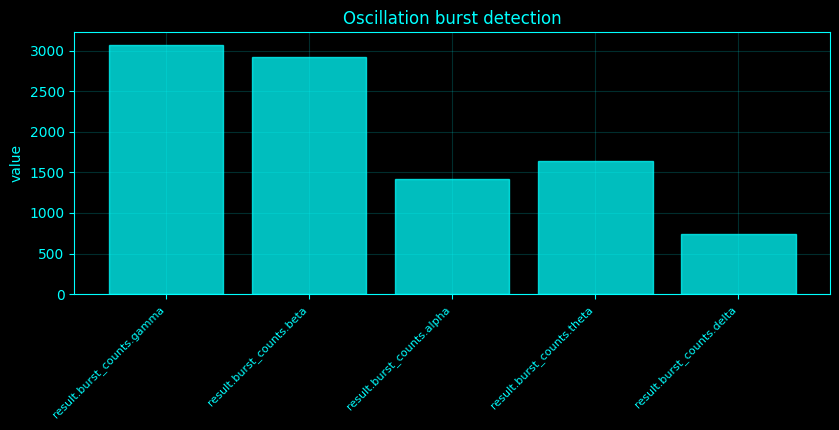

In [56]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _burst_table(band=(13, 30)):
    A = _analytic_band(band)
    env = np.abs(A)
    rows = []
    min_len = max(1, int(0.05 * _fs))
    for j in range(C):
        th = np.quantile(env[:, j], 0.75)
        above = env[:, j] > th
        lab, nlab = ndimage.label(above)
        for k in range(1, nlab + 1):
            ii = np.where(lab == k)[0]
            if len(ii) >= min_len:
                peak = ii[np.argmax(env[ii, j])]
                rows.append((j, ii[0], ii[-1], peak, float(np.max(env[ii, j]))))
    return rows

# Method-specific calculation.
def _compute_method_222():
    idx = 222
    name = 'Oscillation burst detection'
    __plot_spec = None
    band_by_idx = {223: BANDS['alpha'], 224: BANDS['beta'], 225: BANDS['theta'], 226: BANDS['gamma']}
    counts = {bn: len(_burst_table(b)) for bn, b in BANDS.items()}
    return ({'burst_counts': counts}, locals().get('__plot_spec', None))
    if idx in band_by_idx:
        rows = _burst_table(band_by_idx[idx])
        return ({'band': list(band_by_idx[idx]), 'bursts': len(rows)}, locals().get('__plot_spec', None))
    rows = _burst_table(BANDS['beta'])
    peaks = np.array([r[3] for r in rows], int)
    half = int(0.5 * _fs)
    valid = [e for e in peaks if e - half >= 0 and e + half < N][:_SPEED['n_windows']]
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_222,_plot_spec=_compute_method_222()
print('Oscillation burst detection')
if isinstance(result_222,dict):
    for _k,_v in result_222.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_222)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_222)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Oscillation burst detection',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Oscillation burst detection',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Oscillation burst detection',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">223. Alpha burst detection</h3>
<p>Alpha bursts use the same envelope-threshold/minimum-duration definition applied specifically to the alpha band.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Alpha burst detection
  band: array(2,), mean=10.5
  bursts: 1416


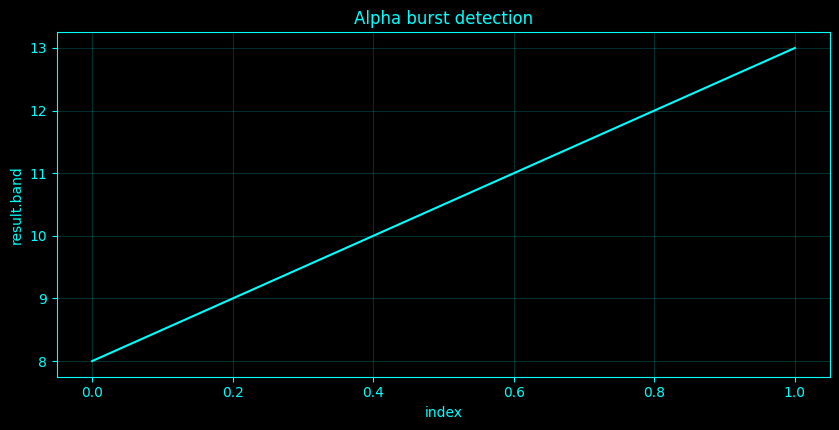

In [57]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _burst_table(band=(13, 30)):
    A = _analytic_band(band)
    env = np.abs(A)
    rows = []
    min_len = max(1, int(0.05 * _fs))
    for j in range(C):
        th = np.quantile(env[:, j], 0.75)
        above = env[:, j] > th
        lab, nlab = ndimage.label(above)
        for k in range(1, nlab + 1):
            ii = np.where(lab == k)[0]
            if len(ii) >= min_len:
                peak = ii[np.argmax(env[ii, j])]
                rows.append((j, ii[0], ii[-1], peak, float(np.max(env[ii, j]))))
    return rows

# Method-specific calculation.
def _compute_method_223():
    idx = 223
    name = 'Alpha burst detection'
    __plot_spec = None
    band_by_idx = {223: BANDS['alpha'], 224: BANDS['beta'], 225: BANDS['theta'], 226: BANDS['gamma']}
    if idx in band_by_idx:
        rows = _burst_table(band_by_idx[idx])
        return ({'band': list(band_by_idx[idx]), 'bursts': len(rows)}, locals().get('__plot_spec', None))
    rows = _burst_table(BANDS['beta'])
    peaks = np.array([r[3] for r in rows], int)
    half = int(0.5 * _fs)
    valid = [e for e in peaks if e - half >= 0 and e + half < N][:_SPEED['n_windows']]
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_223,_plot_spec=_compute_method_223()
print('Alpha burst detection')
if isinstance(result_223,dict):
    for _k,_v in result_223.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_223)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_223)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Alpha burst detection',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Alpha burst detection',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Alpha burst detection',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">224. Beta burst detection</h3>
<p>Beta bursts use the same envelope-threshold/minimum-duration definition applied specifically to the beta band.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Beta burst detection
  band: array(2,), mean=21.5
  bursts: 2917


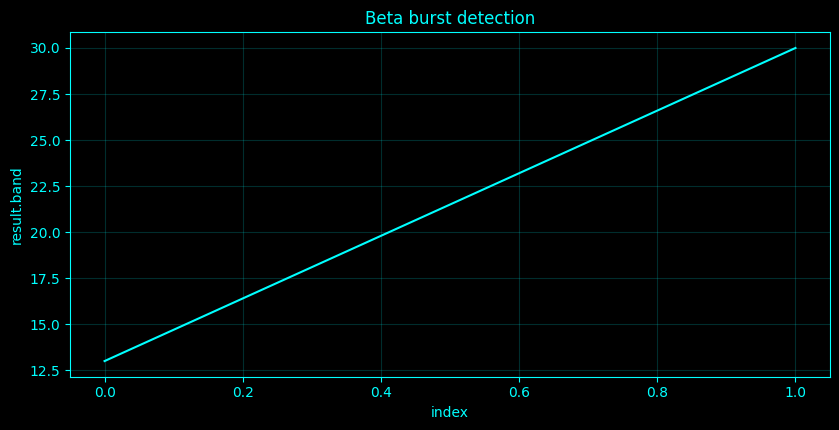

In [58]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _burst_table(band=(13, 30)):
    A = _analytic_band(band)
    env = np.abs(A)
    rows = []
    min_len = max(1, int(0.05 * _fs))
    for j in range(C):
        th = np.quantile(env[:, j], 0.75)
        above = env[:, j] > th
        lab, nlab = ndimage.label(above)
        for k in range(1, nlab + 1):
            ii = np.where(lab == k)[0]
            if len(ii) >= min_len:
                peak = ii[np.argmax(env[ii, j])]
                rows.append((j, ii[0], ii[-1], peak, float(np.max(env[ii, j]))))
    return rows

# Method-specific calculation.
def _compute_method_224():
    idx = 224
    name = 'Beta burst detection'
    __plot_spec = None
    band_by_idx = {223: BANDS['alpha'], 224: BANDS['beta'], 225: BANDS['theta'], 226: BANDS['gamma']}
    if idx in band_by_idx:
        rows = _burst_table(band_by_idx[idx])
        return ({'band': list(band_by_idx[idx]), 'bursts': len(rows)}, locals().get('__plot_spec', None))
    rows = _burst_table(BANDS['beta'])
    peaks = np.array([r[3] for r in rows], int)
    half = int(0.5 * _fs)
    valid = [e for e in peaks if e - half >= 0 and e + half < N][:_SPEED['n_windows']]
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_224,_plot_spec=_compute_method_224()
print('Beta burst detection')
if isinstance(result_224,dict):
    for _k,_v in result_224.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_224)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_224)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Beta burst detection',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Beta burst detection',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Beta burst detection',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">225. Theta burst detection</h3>
<p>Theta bursts use the same envelope-threshold/minimum-duration definition applied specifically to the theta band.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Theta burst detection
  band: array(2,), mean=6
  bursts: 1636


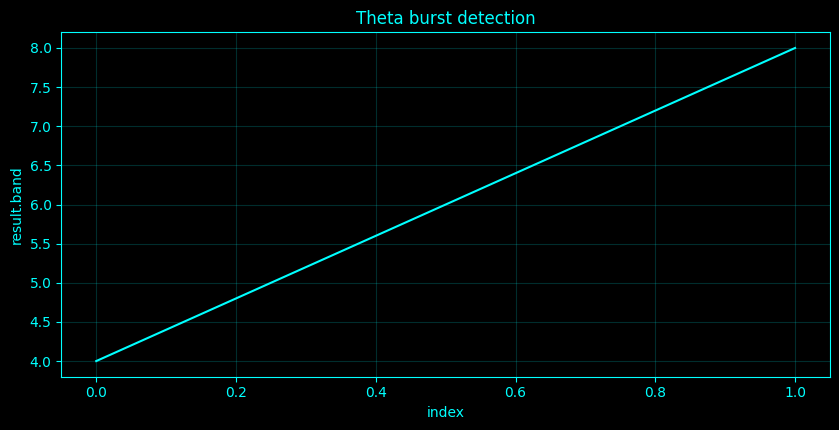

In [59]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _burst_table(band=(13, 30)):
    A = _analytic_band(band)
    env = np.abs(A)
    rows = []
    min_len = max(1, int(0.05 * _fs))
    for j in range(C):
        th = np.quantile(env[:, j], 0.75)
        above = env[:, j] > th
        lab, nlab = ndimage.label(above)
        for k in range(1, nlab + 1):
            ii = np.where(lab == k)[0]
            if len(ii) >= min_len:
                peak = ii[np.argmax(env[ii, j])]
                rows.append((j, ii[0], ii[-1], peak, float(np.max(env[ii, j]))))
    return rows

# Method-specific calculation.
def _compute_method_225():
    idx = 225
    name = 'Theta burst detection'
    __plot_spec = None
    band_by_idx = {223: BANDS['alpha'], 224: BANDS['beta'], 225: BANDS['theta'], 226: BANDS['gamma']}
    if idx in band_by_idx:
        rows = _burst_table(band_by_idx[idx])
        return ({'band': list(band_by_idx[idx]), 'bursts': len(rows)}, locals().get('__plot_spec', None))
    rows = _burst_table(BANDS['beta'])
    peaks = np.array([r[3] for r in rows], int)
    half = int(0.5 * _fs)
    valid = [e for e in peaks if e - half >= 0 and e + half < N][:_SPEED['n_windows']]
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_225,_plot_spec=_compute_method_225()
print('Theta burst detection')
if isinstance(result_225,dict):
    for _k,_v in result_225.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_225)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_225)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Theta burst detection',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Theta burst detection',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Theta burst detection',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">226. Gamma burst detection</h3>
<p>Gamma bursts use the same envelope-threshold/minimum-duration definition applied specifically to the gamma band.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Gamma burst detection
  band: array(2,), mean=37.5
  bursts: 3071


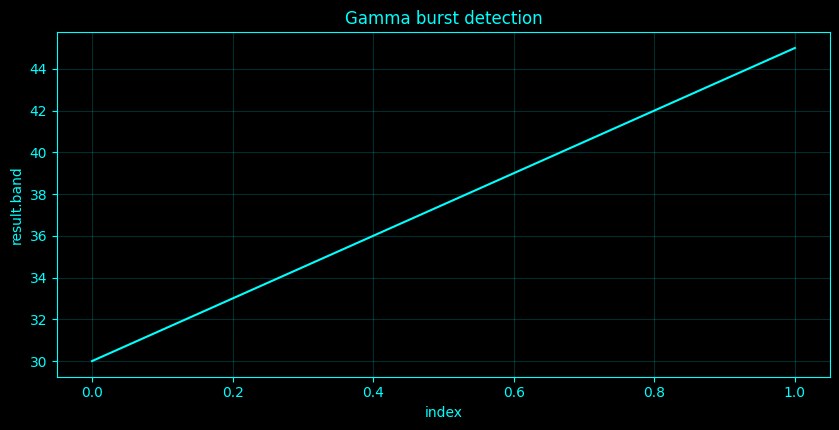

In [60]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _burst_table(band=(13, 30)):
    A = _analytic_band(band)
    env = np.abs(A)
    rows = []
    min_len = max(1, int(0.05 * _fs))
    for j in range(C):
        th = np.quantile(env[:, j], 0.75)
        above = env[:, j] > th
        lab, nlab = ndimage.label(above)
        for k in range(1, nlab + 1):
            ii = np.where(lab == k)[0]
            if len(ii) >= min_len:
                peak = ii[np.argmax(env[ii, j])]
                rows.append((j, ii[0], ii[-1], peak, float(np.max(env[ii, j]))))
    return rows

# Method-specific calculation.
def _compute_method_226():
    idx = 226
    name = 'Gamma burst detection'
    __plot_spec = None
    band_by_idx = {223: BANDS['alpha'], 224: BANDS['beta'], 225: BANDS['theta'], 226: BANDS['gamma']}
    if idx in band_by_idx:
        rows = _burst_table(band_by_idx[idx])
        return ({'band': list(band_by_idx[idx]), 'bursts': len(rows)}, locals().get('__plot_spec', None))
    rows = _burst_table(BANDS['beta'])
    peaks = np.array([r[3] for r in rows], int)
    half = int(0.5 * _fs)
    valid = [e for e in peaks if e - half >= 0 and e + half < N][:_SPEED['n_windows']]
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_226,_plot_spec=_compute_method_226()
print('Gamma burst detection')
if isinstance(result_226,dict):
    for _k,_v in result_226.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_226)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_226)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Gamma burst detection',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Gamma burst detection',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Gamma burst detection',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">227. Burst rate by channel</h3>
<p>Burst rate is burst count divided by analyzed duration for each channel.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Burst rate by channel
  burst_rate_per_s: array(12,), mean=2.273


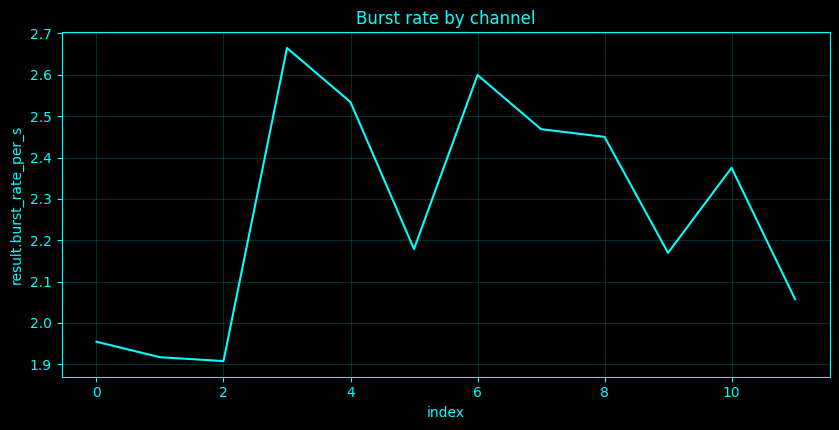

In [61]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _burst_table(band=(13, 30)):
    A = _analytic_band(band)
    env = np.abs(A)
    rows = []
    min_len = max(1, int(0.05 * _fs))
    for j in range(C):
        th = np.quantile(env[:, j], 0.75)
        above = env[:, j] > th
        lab, nlab = ndimage.label(above)
        for k in range(1, nlab + 1):
            ii = np.where(lab == k)[0]
            if len(ii) >= min_len:
                peak = ii[np.argmax(env[ii, j])]
                rows.append((j, ii[0], ii[-1], peak, float(np.max(env[ii, j]))))
    return rows

# Method-specific calculation.
def _compute_method_227():
    idx = 227
    name = 'Burst rate by channel'
    __plot_spec = None
    band_by_idx = {223: BANDS['alpha'], 224: BANDS['beta'], 225: BANDS['theta'], 226: BANDS['gamma']}
    if idx in band_by_idx:
        rows = _burst_table(band_by_idx[idx])
        return ({'band': list(band_by_idx[idx]), 'bursts': len(rows)}, locals().get('__plot_spec', None))
    rows = _burst_table(BANDS['beta'])
    dur = N / _fs
    counts = np.zeros(C, int)
    for r in rows:
        counts[r[0]] += 1
    return ({'burst_rate_per_s': (counts / dur).tolist()}, locals().get('__plot_spec', None))
    peaks = np.array([r[3] for r in rows], int)
    half = int(0.5 * _fs)
    valid = [e for e in peaks if e - half >= 0 and e + half < N][:_SPEED['n_windows']]
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_227,_plot_spec=_compute_method_227()
print('Burst rate by channel')
if isinstance(result_227,dict):
    for _k,_v in result_227.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_227)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_227)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Burst rate by channel',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Burst rate by channel',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Burst rate by channel',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">228. Burst duration distribution</h3>
<p>Burst duration is \((n_{end}-n_{start}+1)/f_s\) for each contiguous detected burst.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Burst duration distribution
  duration_s: array(2917,), mean=0.0750442


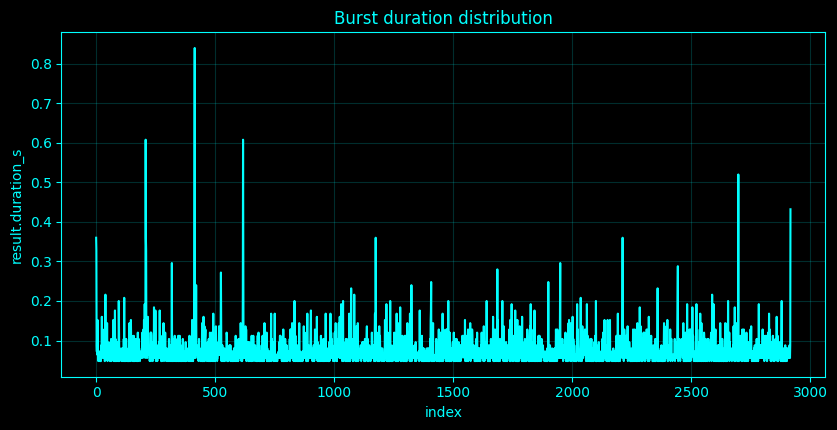

In [62]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _burst_table(band=(13, 30)):
    A = _analytic_band(band)
    env = np.abs(A)
    rows = []
    min_len = max(1, int(0.05 * _fs))
    for j in range(C):
        th = np.quantile(env[:, j], 0.75)
        above = env[:, j] > th
        lab, nlab = ndimage.label(above)
        for k in range(1, nlab + 1):
            ii = np.where(lab == k)[0]
            if len(ii) >= min_len:
                peak = ii[np.argmax(env[ii, j])]
                rows.append((j, ii[0], ii[-1], peak, float(np.max(env[ii, j]))))
    return rows

# Method-specific calculation.
def _compute_method_228():
    idx = 228
    name = 'Burst duration distribution'
    __plot_spec = None
    band_by_idx = {223: BANDS['alpha'], 224: BANDS['beta'], 225: BANDS['theta'], 226: BANDS['gamma']}
    if idx in band_by_idx:
        rows = _burst_table(band_by_idx[idx])
        return ({'band': list(band_by_idx[idx]), 'bursts': len(rows)}, locals().get('__plot_spec', None))
    rows = _burst_table(BANDS['beta'])
    return ({'duration_s': [(r[2] - r[1] + 1) / _fs for r in rows]}, locals().get('__plot_spec', None))
    peaks = np.array([r[3] for r in rows], int)
    half = int(0.5 * _fs)
    valid = [e for e in peaks if e - half >= 0 and e + half < N][:_SPEED['n_windows']]
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_228,_plot_spec=_compute_method_228()
print('Burst duration distribution')
if isinstance(result_228,dict):
    for _k,_v in result_228.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_228)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_228)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Burst duration distribution',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Burst duration distribution',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Burst duration distribution',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">229. Burst amplitude distribution</h3>
<p>Burst amplitude is the maximum narrow-band analytic-envelope amplitude within each detected burst.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Burst amplitude distribution
  peak_envelope_amplitude: array(2917,), mean=0.370878


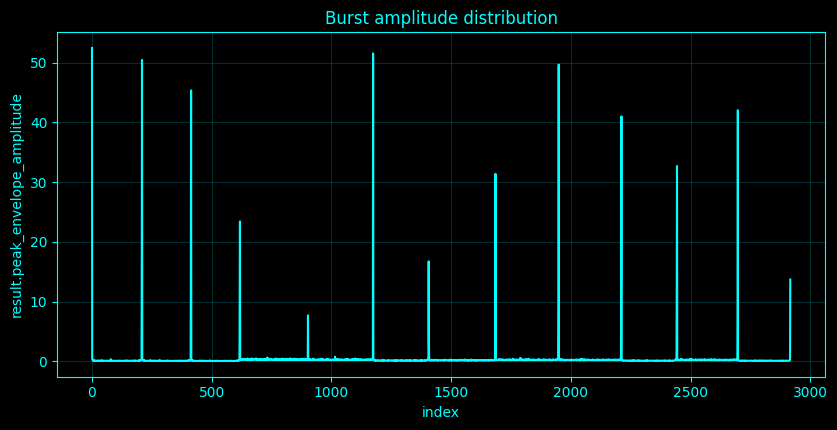

In [63]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _burst_table(band=(13, 30)):
    A = _analytic_band(band)
    env = np.abs(A)
    rows = []
    min_len = max(1, int(0.05 * _fs))
    for j in range(C):
        th = np.quantile(env[:, j], 0.75)
        above = env[:, j] > th
        lab, nlab = ndimage.label(above)
        for k in range(1, nlab + 1):
            ii = np.where(lab == k)[0]
            if len(ii) >= min_len:
                peak = ii[np.argmax(env[ii, j])]
                rows.append((j, ii[0], ii[-1], peak, float(np.max(env[ii, j]))))
    return rows

# Method-specific calculation.
def _compute_method_229():
    idx = 229
    name = 'Burst amplitude distribution'
    __plot_spec = None
    band_by_idx = {223: BANDS['alpha'], 224: BANDS['beta'], 225: BANDS['theta'], 226: BANDS['gamma']}
    if idx in band_by_idx:
        rows = _burst_table(band_by_idx[idx])
        return ({'band': list(band_by_idx[idx]), 'bursts': len(rows)}, locals().get('__plot_spec', None))
    rows = _burst_table(BANDS['beta'])
    return ({'peak_envelope_amplitude': [r[4] for r in rows]}, locals().get('__plot_spec', None))
    peaks = np.array([r[3] for r in rows], int)
    half = int(0.5 * _fs)
    valid = [e for e in peaks if e - half >= 0 and e + half < N][:_SPEED['n_windows']]
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_229,_plot_spec=_compute_method_229()
print('Burst amplitude distribution')
if isinstance(result_229,dict):
    for _k,_v in result_229.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_229)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_229)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Burst amplitude distribution',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Burst amplitude distribution',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Burst amplitude distribution',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">230. Burst frequency distribution</h3>
<p>Burst frequency is sampled from the analytic instantaneous frequency at each burst's envelope peak.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Burst frequency distribution
  peak_instantaneous_frequency_hz: array(2917,), mean=20.0553


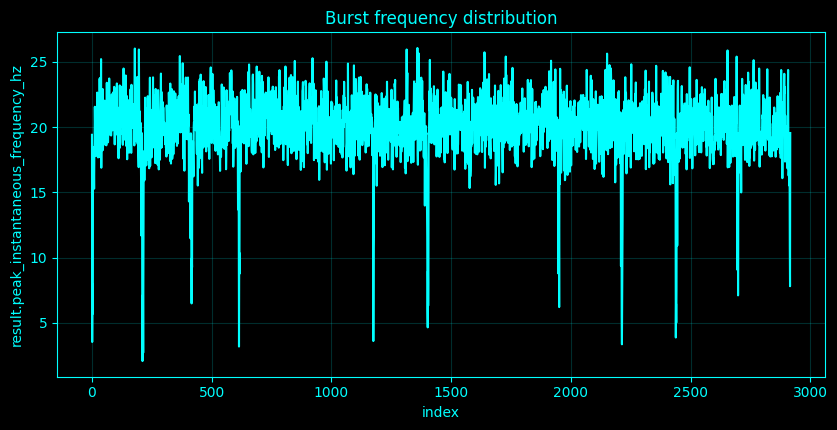

In [64]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _burst_table(band=(13, 30)):
    A = _analytic_band(band)
    env = np.abs(A)
    rows = []
    min_len = max(1, int(0.05 * _fs))
    for j in range(C):
        th = np.quantile(env[:, j], 0.75)
        above = env[:, j] > th
        lab, nlab = ndimage.label(above)
        for k in range(1, nlab + 1):
            ii = np.where(lab == k)[0]
            if len(ii) >= min_len:
                peak = ii[np.argmax(env[ii, j])]
                rows.append((j, ii[0], ii[-1], peak, float(np.max(env[ii, j]))))
    return rows

# Method-specific calculation.
def _compute_method_230():
    idx = 230
    name = 'Burst frequency distribution'
    __plot_spec = None
    band_by_idx = {223: BANDS['alpha'], 224: BANDS['beta'], 225: BANDS['theta'], 226: BANDS['gamma']}
    if idx in band_by_idx:
        rows = _burst_table(band_by_idx[idx])
        return ({'band': list(band_by_idx[idx]), 'bursts': len(rows)}, locals().get('__plot_spec', None))
    rows = _burst_table(BANDS['beta'])
    z = _analytic_band(BANDS['beta'])
    phi = np.unwrap(np.angle(z), axis=0)
    inst = np.gradient(phi, axis=0) * _fs / (2 * np.pi)
    return ({'peak_instantaneous_frequency_hz': [float(inst[r[3], r[0]]) for r in rows]}, locals().get('__plot_spec', None))
    peaks = np.array([r[3] for r in rows], int)
    half = int(0.5 * _fs)
    valid = [e for e in peaks if e - half >= 0 and e + half < N][:_SPEED['n_windows']]
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_230,_plot_spec=_compute_method_230()
print('Burst frequency distribution')
if isinstance(result_230,dict):
    for _k,_v in result_230.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_230)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_230)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Burst frequency distribution',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Burst frequency distribution',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Burst frequency distribution',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">231. Burst inter-event interval</h3>
<p>Burst inter-event intervals are differences between successive burst-peak times within the same channel.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Burst inter-event interval
  inter_event_intervals_s: array(2905,), mean=0.441633


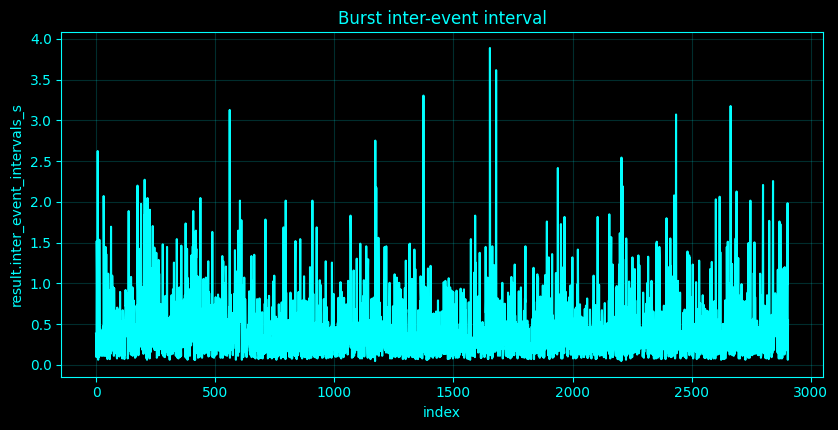

In [65]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _burst_table(band=(13, 30)):
    A = _analytic_band(band)
    env = np.abs(A)
    rows = []
    min_len = max(1, int(0.05 * _fs))
    for j in range(C):
        th = np.quantile(env[:, j], 0.75)
        above = env[:, j] > th
        lab, nlab = ndimage.label(above)
        for k in range(1, nlab + 1):
            ii = np.where(lab == k)[0]
            if len(ii) >= min_len:
                peak = ii[np.argmax(env[ii, j])]
                rows.append((j, ii[0], ii[-1], peak, float(np.max(env[ii, j]))))
    return rows

# Method-specific calculation.
def _compute_method_231():
    idx = 231
    name = 'Burst inter-event interval'
    __plot_spec = None
    band_by_idx = {223: BANDS['alpha'], 224: BANDS['beta'], 225: BANDS['theta'], 226: BANDS['gamma']}
    if idx in band_by_idx:
        rows = _burst_table(band_by_idx[idx])
        return ({'band': list(band_by_idx[idx]), 'bursts': len(rows)}, locals().get('__plot_spec', None))
    rows = _burst_table(BANDS['beta'])
    by = {j: [] for j in range(C)}
    for r in rows:
        by[r[0]].append(r[3] / _fs)
    iei = [np.diff(v) for v in by.values() if len(v) >= 2]
    return ({'inter_event_intervals_s': np.concatenate(iei).tolist() if iei else []}, locals().get('__plot_spec', None))
    peaks = np.array([r[3] for r in rows], int)
    half = int(0.5 * _fs)
    valid = [e for e in peaks if e - half >= 0 and e + half < N][:_SPEED['n_windows']]
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_231,_plot_spec=_compute_method_231()
print('Burst inter-event interval')
if isinstance(result_231,dict):
    for _k,_v in result_231.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_231)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_231)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Burst inter-event interval',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Burst inter-event interval',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Burst inter-event interval',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">232. Burst co-occurrence networks</h3>
<p>Burst co-occurrence connects channels when burst peaks fall within a fixed temporal tolerance; edge weights are normalized co-occurrence counts.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Burst co-occurrence networks
  cooccurrence_matrix: array(12, 12), mean=0.481878


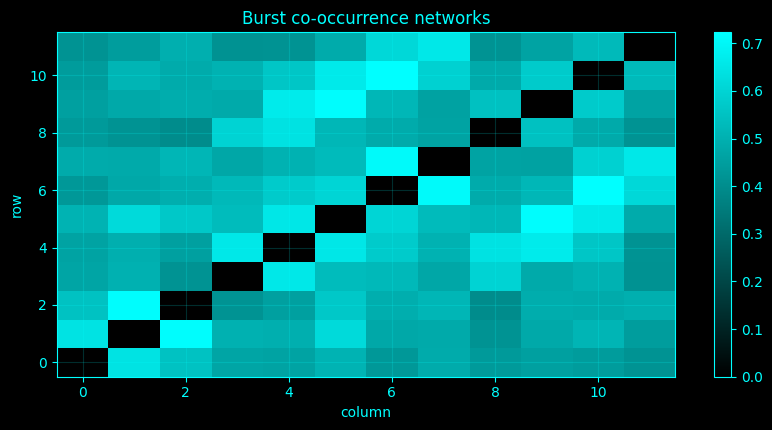

In [66]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _burst_table(band=(13, 30)):
    A = _analytic_band(band)
    env = np.abs(A)
    rows = []
    min_len = max(1, int(0.05 * _fs))
    for j in range(C):
        th = np.quantile(env[:, j], 0.75)
        above = env[:, j] > th
        lab, nlab = ndimage.label(above)
        for k in range(1, nlab + 1):
            ii = np.where(lab == k)[0]
            if len(ii) >= min_len:
                peak = ii[np.argmax(env[ii, j])]
                rows.append((j, ii[0], ii[-1], peak, float(np.max(env[ii, j]))))
    return rows

# Method-specific calculation.
def _compute_method_232():
    idx = 232
    name = 'Burst co-occurrence networks'
    __plot_spec = None
    band_by_idx = {223: BANDS['alpha'], 224: BANDS['beta'], 225: BANDS['theta'], 226: BANDS['gamma']}
    if idx in band_by_idx:
        rows = _burst_table(band_by_idx[idx])
        return ({'band': list(band_by_idx[idx]), 'bursts': len(rows)}, locals().get('__plot_spec', None))
    rows = _burst_table(BANDS['beta'])
    peaks = {j: np.array([r[3] for r in rows if r[0] == j], int) for j in range(C)}
    M = np.zeros((C, C))
    tol = int(0.1 * _fs)
    for i in range(C):
        for j in range(i + 1, C):
            if len(peaks[i]) and len(peaks[j]):
                cnt = sum((np.any(np.abs(peaks[j] - p) <= tol) for p in peaks[i]))
                v = cnt / max(len(peaks[i]), len(peaks[j]), 1)
                M[i, j] = M[j, i] = v
    return ({'cooccurrence_matrix': M}, locals().get('__plot_spec', None))
    peaks = np.array([r[3] for r in rows], int)
    half = int(0.5 * _fs)
    valid = [e for e in peaks if e - half >= 0 and e + half < N][:_SPEED['n_windows']]
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_232,_plot_spec=_compute_method_232()
print('Burst co-occurrence networks')
if isinstance(result_232,dict):
    for _k,_v in result_232.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_232)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_232)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Burst co-occurrence networks',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Burst co-occurrence networks',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Burst co-occurrence networks',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">233. Burst propagation analysis</h3>
<p>Burst propagation is summarized by the lag of maximal cross-correlation between narrow-band envelopes; the antisymmetric lag matrix describes relative timing, not anatomical propagation speed.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Burst propagation analysis
  propagation_lag_matrix_s: array(12, 12), mean=0


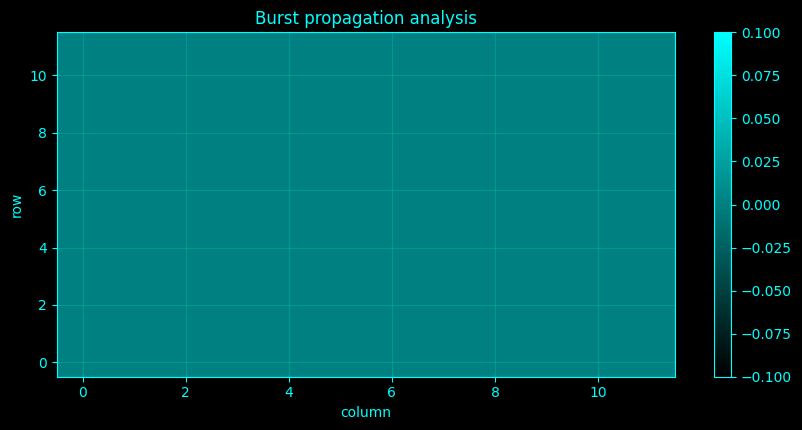

In [67]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _burst_table(band=(13, 30)):
    A = _analytic_band(band)
    env = np.abs(A)
    rows = []
    min_len = max(1, int(0.05 * _fs))
    for j in range(C):
        th = np.quantile(env[:, j], 0.75)
        above = env[:, j] > th
        lab, nlab = ndimage.label(above)
        for k in range(1, nlab + 1):
            ii = np.where(lab == k)[0]
            if len(ii) >= min_len:
                peak = ii[np.argmax(env[ii, j])]
                rows.append((j, ii[0], ii[-1], peak, float(np.max(env[ii, j]))))
    return rows

# Method-specific calculation.
def _compute_method_233():
    idx = 233
    name = 'Burst propagation analysis'
    __plot_spec = None
    band_by_idx = {223: BANDS['alpha'], 224: BANDS['beta'], 225: BANDS['theta'], 226: BANDS['gamma']}
    if idx in band_by_idx:
        rows = _burst_table(band_by_idx[idx])
        return ({'band': list(band_by_idx[idx]), 'bursts': len(rows)}, locals().get('__plot_spec', None))
    rows = _burst_table(BANDS['beta'])
    env = np.abs(_analytic_band(BANDS['beta']))
    lags = np.arange(-int(0.25 * _fs), int(0.25 * _fs) + 1)
    M = np.zeros((C, C))
    for i in range(C):
        for j in range(i + 1, C):
            x = env[:, i] - env[:, i].mean()
            y = env[:, j] - env[:, j].mean()
            cc = signal.correlate(y, x, mode='full', method='fft')
            ll = signal.correlation_lags(len(y), len(x))
            m = np.isin(ll, lags)
            lag = ll[m][np.argmax(cc[m])] / _fs
            M[i, j] = lag
            M[j, i] = -lag
    return ({'propagation_lag_matrix_s': M}, locals().get('__plot_spec', None))
    peaks = np.array([r[3] for r in rows], int)
    half = int(0.5 * _fs)
    valid = [e for e in peaks if e - half >= 0 and e + half < N][:_SPEED['n_windows']]
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_233,_plot_spec=_compute_method_233()
print('Burst propagation analysis')
if isinstance(result_233,dict):
    for _k,_v in result_233.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_233)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_233)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Burst propagation analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Burst propagation analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Burst propagation analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">234. Burst-triggered average spectrum</h3>
<p>A burst-triggered average spectrum averages PSDs from fixed windows centered on burst peaks.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Burst-triggered average spectrum
  burst_triggered_mean_spectrum: array(55,), mean=0.00166908


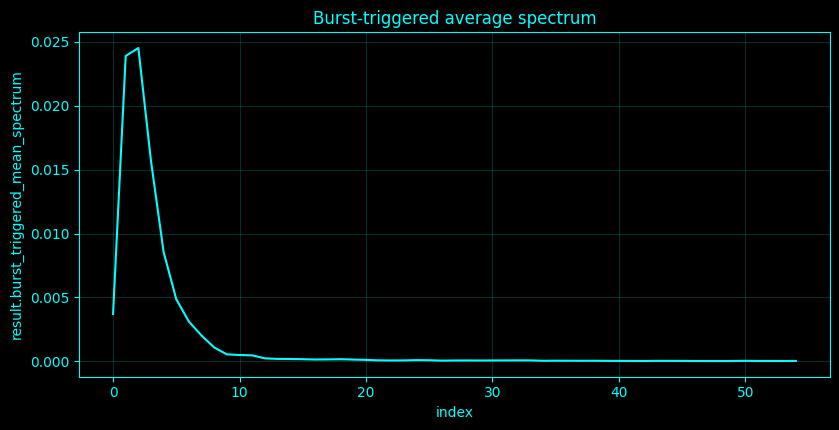

In [68]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

def _burst_table(band=(13, 30)):
    A = _analytic_band(band)
    env = np.abs(A)
    rows = []
    min_len = max(1, int(0.05 * _fs))
    for j in range(C):
        th = np.quantile(env[:, j], 0.75)
        above = env[:, j] > th
        lab, nlab = ndimage.label(above)
        for k in range(1, nlab + 1):
            ii = np.where(lab == k)[0]
            if len(ii) >= min_len:
                peak = ii[np.argmax(env[ii, j])]
                rows.append((j, ii[0], ii[-1], peak, float(np.max(env[ii, j]))))
    return rows

# Method-specific calculation.
def _compute_method_234():
    idx = 234
    name = 'Burst-triggered average spectrum'
    __plot_spec = None
    band_by_idx = {223: BANDS['alpha'], 224: BANDS['beta'], 225: BANDS['theta'], 226: BANDS['gamma']}
    if idx in band_by_idx:
        rows = _burst_table(band_by_idx[idx])
        return ({'band': list(band_by_idx[idx]), 'bursts': len(rows)}, locals().get('__plot_spec', None))
    rows = _burst_table(BANDS['beta'])
    peaks = np.array([r[3] for r in rows], int)
    half = int(0.5 * _fs)
    valid = [e for e in peaks if e - half >= 0 and e + half < N][:_SPEED['n_windows']]
    vals = []
    for e in valid:
        ff, pp = _psd_of(X[e - half:e + half, [0]])
        vals.append(pp[:, 0])
    return ({'burst_triggered_mean_spectrum': np.mean(vals, axis=0) if vals else np.array([])}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_234,_plot_spec=_compute_method_234()
print('Burst-triggered average spectrum')
if isinstance(result_234,dict):
    for _k,_v in result_234.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_234)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_234)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Burst-triggered average spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Burst-triggered average spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Burst-triggered average spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">235. Burst-triggered phase synchrony</h3>
<p>Burst-triggered phase synchrony averages PLV measured within burst-centered windows.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [69]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _plv(d):
    return float(np.abs(np.mean(np.exp(1j * d))))

def _burst_table(band=(13, 30)):
    A = _analytic_band(band)
    env = np.abs(A)
    rows = []
    min_len = max(1, int(0.05 * _fs))
    for j in range(C):
        th = np.quantile(env[:, j], 0.75)
        above = env[:, j] > th
        lab, nlab = ndimage.label(above)
        for k in range(1, nlab + 1):
            ii = np.where(lab == k)[0]
            if len(ii) >= min_len:
                peak = ii[np.argmax(env[ii, j])]
                rows.append((j, ii[0], ii[-1], peak, float(np.max(env[ii, j]))))
    return rows

# Method-specific calculation.
def _compute_method_235():
    idx = 235
    name = 'Burst-triggered phase synchrony'
    __plot_spec = None
    band_by_idx = {223: BANDS['alpha'], 224: BANDS['beta'], 225: BANDS['theta'], 226: BANDS['gamma']}
    if idx in band_by_idx:
        rows = _burst_table(band_by_idx[idx])
        return ({'band': list(band_by_idx[idx]), 'bursts': len(rows)}, locals().get('__plot_spec', None))
    rows = _burst_table(BANDS['beta'])
    peaks = np.array([r[3] for r in rows], int)
    half = int(0.5 * _fs)
    valid = [e for e in peaks if e - half >= 0 and e + half < N][:_SPEED['n_windows']]
    ph = np.angle(_analytic_band(BANDS['beta']))
    vals = []
    for e in valid:
        d = ph[e - half:e + half, 0] - ph[e - half:e + half, min(1, C - 1)]
        vals.append(_plv(d))
    return ({'burst_triggered_PLV': float(np.mean(vals)) if vals else np.nan}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_235,_plot_spec=_compute_method_235()
print('Burst-triggered phase synchrony')
if isinstance(result_235,dict):
    for _k,_v in result_235.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_235)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_235)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Burst-triggered phase synchrony',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Burst-triggered phase synchrony',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Burst-triggered phase synchrony',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Burst-triggered phase synchrony
  burst_triggered_PLV: 0.7506852796380844


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">236. Burst-triggered coherence</h3>
<p>Burst-triggered coherence averages magnitude-squared coherence within burst-centered windows.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [70]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _burst_table(band=(13, 30)):
    A = _analytic_band(band)
    env = np.abs(A)
    rows = []
    min_len = max(1, int(0.05 * _fs))
    for j in range(C):
        th = np.quantile(env[:, j], 0.75)
        above = env[:, j] > th
        lab, nlab = ndimage.label(above)
        for k in range(1, nlab + 1):
            ii = np.where(lab == k)[0]
            if len(ii) >= min_len:
                peak = ii[np.argmax(env[ii, j])]
                rows.append((j, ii[0], ii[-1], peak, float(np.max(env[ii, j]))))
    return rows

# Method-specific calculation.
def _compute_method_236():
    idx = 236
    name = 'Burst-triggered coherence'
    __plot_spec = None
    band_by_idx = {223: BANDS['alpha'], 224: BANDS['beta'], 225: BANDS['theta'], 226: BANDS['gamma']}
    if idx in band_by_idx:
        rows = _burst_table(band_by_idx[idx])
        return ({'band': list(band_by_idx[idx]), 'bursts': len(rows)}, locals().get('__plot_spec', None))
    rows = _burst_table(BANDS['beta'])
    peaks = np.array([r[3] for r in rows], int)
    half = int(0.5 * _fs)
    valid = [e for e in peaks if e - half >= 0 and e + half < N][:_SPEED['n_windows']]
    vals = []
    for e in valid:
        ff, cc = signal.coherence(X[e - half:e + half, 0], X[e - half:e + half, min(1, C - 1)], fs=_fs, nperseg=min(128, 2 * half))
        m = (ff >= 13) & (ff < 30)
        vals.append(float(np.mean(cc[m])) if np.any(m) else np.nan)
    return ({'burst_triggered_beta_coherence': float(np.nanmean(vals)) if vals else np.nan}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_236,_plot_spec=_compute_method_236()
print('Burst-triggered coherence')
if isinstance(result_236,dict):
    for _k,_v in result_236.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_236)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_236)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Burst-triggered coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Burst-triggered coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Burst-triggered coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Burst-triggered coherence
  burst_triggered_beta_coherence: 1.0


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">237. Narrowband envelope spectra</h3>
<p>The modulation/envelope spectrum is the PSD of a narrow-band analytic amplitude envelope. Its frequencies describe how rapidly oscillation amplitude itself fluctuates.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Narrowband envelope spectra
  envelope_power_shape: array(2,), mean=47


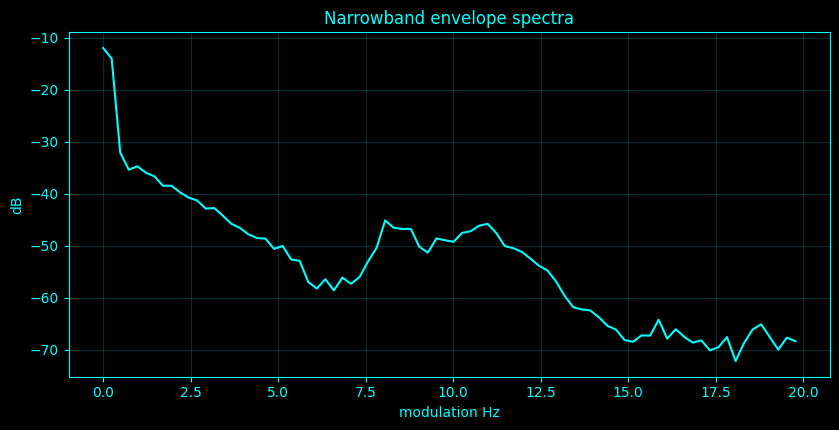

In [71]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

# Method-specific calculation.
def _compute_method_237():
    idx = 237
    name = 'Narrowband envelope spectra'
    __plot_spec = None
    A = _analytic_band(BANDS['alpha'])
    env = np.abs(A)
    nper = min(_SPEED['nperseg'], N)
    fE, PE = signal.welch(env, fs=_fs, axis=0, nperseg=nper, noverlap=nper // 2)
    keep = fE <= min(20, 0.49 * _fs)
    fE = fE[keep]
    PE = PE[keep]
    __plot_spec = ('summary', 10 * np.log10(PE[:, 0] + EPS), name, fE, 'modulation Hz', 'dB')
    return ({'envelope_power_shape': PE.shape}, locals().get('__plot_spec', None))
    q = PE / (np.sum(PE, axis=0, keepdims=True) + EPS)
    H = -np.sum(q * np.log(q + EPS), axis=0) / np.log(max(len(fE), 2))
    return ({'envelope_spectral_entropy': H.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_237,_plot_spec=_compute_method_237()
print('Narrowband envelope spectra')
if isinstance(result_237,dict):
    for _k,_v in result_237.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_237)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_237)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Narrowband envelope spectra',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Narrowband envelope spectra',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Narrowband envelope spectra',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">238. Envelope power spectrum</h3>
<p>The modulation/envelope spectrum is the PSD of a narrow-band analytic amplitude envelope. Its frequencies describe how rapidly oscillation amplitude itself fluctuates.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Envelope power spectrum
  envelope_power_shape: array(2,), mean=47


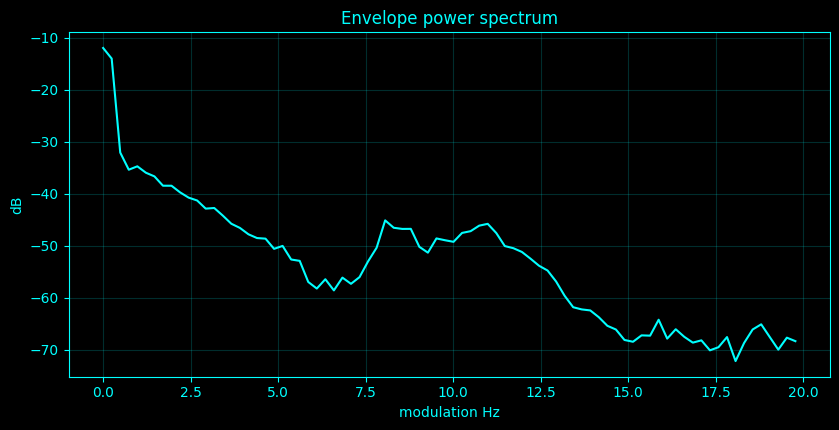

In [72]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

# Method-specific calculation.
def _compute_method_238():
    idx = 238
    name = 'Envelope power spectrum'
    __plot_spec = None
    A = _analytic_band(BANDS['alpha'])
    env = np.abs(A)
    nper = min(_SPEED['nperseg'], N)
    fE, PE = signal.welch(env, fs=_fs, axis=0, nperseg=nper, noverlap=nper // 2)
    keep = fE <= min(20, 0.49 * _fs)
    fE = fE[keep]
    PE = PE[keep]
    __plot_spec = ('summary', 10 * np.log10(PE[:, 0] + EPS), name, fE, 'modulation Hz', 'dB')
    return ({'envelope_power_shape': PE.shape}, locals().get('__plot_spec', None))
    q = PE / (np.sum(PE, axis=0, keepdims=True) + EPS)
    H = -np.sum(q * np.log(q + EPS), axis=0) / np.log(max(len(fE), 2))
    return ({'envelope_spectral_entropy': H.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_238,_plot_spec=_compute_method_238()
print('Envelope power spectrum')
if isinstance(result_238,dict):
    for _k,_v in result_238.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_238)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_238)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Envelope power spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Envelope power spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Envelope power spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">239. Envelope autocorrelation spectrum</h3>
<p>By Wiener-Khinchin, the Fourier transform of the envelope autocovariance equals its power spectrum. This cell computes that autocorrelation-spectrum representation explicitly.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [73]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

# Method-specific calculation.
def _compute_method_239():
    idx = 239
    name = 'Envelope autocorrelation spectrum'
    __plot_spec = None
    A = _analytic_band(BANDS['alpha'])
    env = np.abs(A)
    nper = min(_SPEED['nperseg'], N)
    fE, PE = signal.welch(env, fs=_fs, axis=0, nperseg=nper, noverlap=nper // 2)
    keep = fE <= min(20, 0.49 * _fs)
    fE = fE[keep]
    PE = PE[keep]
    y = env[:, 0] - env[:, 0].mean()
    acf = signal.fftconvolve(y, y[::-1], mode='full')[len(y) - 1:] / np.arange(len(y), 0, -1)
    ps = np.real(np.fft.rfft(acf))
    ff = np.fft.rfftfreq(len(acf), 1 / _fs)
    return ({'autocorrelation_spectrum_peak_hz': float(ff[np.argmax(ps[1:]) + 1]) if len(ps) > 1 else 0}, locals().get('__plot_spec', None))
    q = PE / (np.sum(PE, axis=0, keepdims=True) + EPS)
    H = -np.sum(q * np.log(q + EPS), axis=0) / np.log(max(len(fE), 2))
    return ({'envelope_spectral_entropy': H.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_239,_plot_spec=_compute_method_239()
print('Envelope autocorrelation spectrum')
if isinstance(result_239,dict):
    for _k,_v in result_239.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_239)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_239)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Envelope autocorrelation spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Envelope autocorrelation spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Envelope autocorrelation spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Envelope autocorrelation spectrum
  autocorrelation_spectrum_peak_hz: 0.037402752842609216


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">240. Modulation spectrum</h3>
<p>The modulation/envelope spectrum is the PSD of a narrow-band analytic amplitude envelope. Its frequencies describe how rapidly oscillation amplitude itself fluctuates.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [74]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

# Method-specific calculation.
def _compute_method_240():
    idx = 240
    name = 'Modulation spectrum'
    __plot_spec = None
    A = _analytic_band(BANDS['alpha'])
    env = np.abs(A)
    nper = min(_SPEED['nperseg'], N)
    fE, PE = signal.welch(env, fs=_fs, axis=0, nperseg=nper, noverlap=nper // 2)
    keep = fE <= min(20, 0.49 * _fs)
    fE = fE[keep]
    PE = PE[keep]
    return ({'modulation_spectrum_peak_hz': float(fE[1:][np.argmax(np.mean(PE[1:], axis=1))]) if len(fE) > 1 else 0}, locals().get('__plot_spec', None))
    q = PE / (np.sum(PE, axis=0, keepdims=True) + EPS)
    H = -np.sum(q * np.log(q + EPS), axis=0) / np.log(max(len(fE), 2))
    return ({'envelope_spectral_entropy': H.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_240,_plot_spec=_compute_method_240()
print('Modulation spectrum')
if isinstance(result_240,dict):
    for _k,_v in result_240.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_240)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_240)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Modulation spectrum',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Modulation spectrum',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Modulation spectrum',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Modulation spectrum
  modulation_spectrum_peak_hz: 0.244140625


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">241. Amplitude modulation frequency analysis</h3>
<p>Amplitude-modulation frequency is the dominant nonzero frequency of the envelope power spectrum.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Amplitude modulation frequency analysis
  amplitude_modulation_frequency_hz: array(12,), mean=0.264486


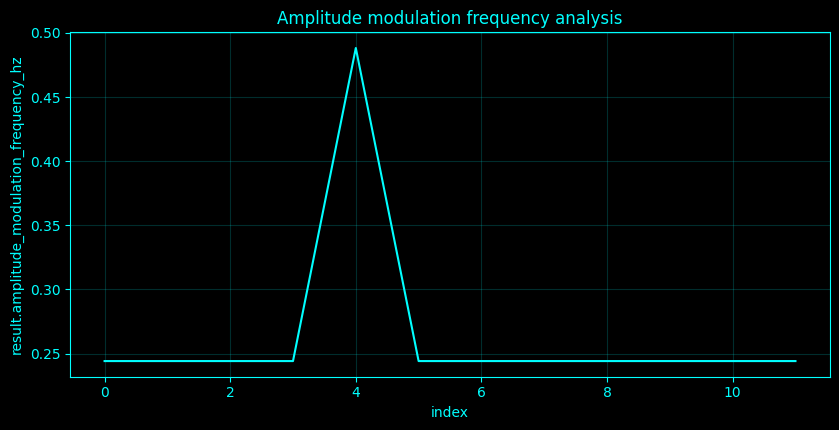

In [75]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

# Method-specific calculation.
def _compute_method_241():
    idx = 241
    name = 'Amplitude modulation frequency analysis'
    __plot_spec = None
    A = _analytic_band(BANDS['alpha'])
    env = np.abs(A)
    nper = min(_SPEED['nperseg'], N)
    fE, PE = signal.welch(env, fs=_fs, axis=0, nperseg=nper, noverlap=nper // 2)
    keep = fE <= min(20, 0.49 * _fs)
    fE = fE[keep]
    PE = PE[keep]
    vals = []
    for j in range(C):
        k = np.argmax(PE[1:, j]) + 1 if len(fE) > 1 else 0
        vals.append(float(fE[k]))
    return ({'amplitude_modulation_frequency_hz': vals}, locals().get('__plot_spec', None))
    q = PE / (np.sum(PE, axis=0, keepdims=True) + EPS)
    H = -np.sum(q * np.log(q + EPS), axis=0) / np.log(max(len(fE), 2))
    return ({'envelope_spectral_entropy': H.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_241,_plot_spec=_compute_method_241()
print('Amplitude modulation frequency analysis')
if isinstance(result_241,dict):
    for _k,_v in result_241.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_241)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_241)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Amplitude modulation frequency analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Amplitude modulation frequency analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Amplitude modulation frequency analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">242. Cross-channel envelope coherence</h3>
<p>Cross-channel envelope coherence applies magnitude-squared coherence to narrow-band amplitude envelopes, measuring shared modulation frequencies.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [76]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

# Method-specific calculation.
def _compute_method_242():
    idx = 242
    name = 'Cross-channel envelope coherence'
    __plot_spec = None
    A = _analytic_band(BANDS['alpha'])
    env = np.abs(A)
    nper = min(_SPEED['nperseg'], N)
    fE, PE = signal.welch(env, fs=_fs, axis=0, nperseg=nper, noverlap=nper // 2)
    keep = fE <= min(20, 0.49 * _fs)
    fE = fE[keep]
    PE = PE[keep]
    vals = []
    for j in range(1, C):
        ff, cc = signal.coherence(env[:, 0], env[:, j], fs=_fs, nperseg=nper)
        m = (ff >= 0.1) & (ff <= 10)
        vals.append(float(np.mean(cc[m])) if np.any(m) else np.nan)
    return ({'mean_envelope_coherence': float(np.nanmean(vals))}, locals().get('__plot_spec', None))
    q = PE / (np.sum(PE, axis=0, keepdims=True) + EPS)
    H = -np.sum(q * np.log(q + EPS), axis=0) / np.log(max(len(fE), 2))
    return ({'envelope_spectral_entropy': H.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_242,_plot_spec=_compute_method_242()
print('Cross-channel envelope coherence')
if isinstance(result_242,dict):
    for _k,_v in result_242.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_242)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_242)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Cross-channel envelope coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Cross-channel envelope coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Cross-channel envelope coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Cross-channel envelope coherence
  mean_envelope_coherence: 0.37485020503309713


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">243. Envelope phase synchrony</h3>
<p>Envelope phase synchrony takes the analytic phase of the demeaned amplitude envelopes and applies PLV to their modulation phases.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [77]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _plv(d):
    return float(np.abs(np.mean(np.exp(1j * d))))

# Method-specific calculation.
def _compute_method_243():
    idx = 243
    name = 'Envelope phase synchrony'
    __plot_spec = None
    A = _analytic_band(BANDS['alpha'])
    env = np.abs(A)
    nper = min(_SPEED['nperseg'], N)
    fE, PE = signal.welch(env, fs=_fs, axis=0, nperseg=nper, noverlap=nper // 2)
    keep = fE <= min(20, 0.49 * _fs)
    fE = fE[keep]
    PE = PE[keep]
    ep = np.angle(signal.hilbert(env - env.mean(axis=0), axis=0))
    vals = [_plv(ep[:, 0] - ep[:, j]) for j in range(1, C)]
    return ({'mean_envelope_phase_synchrony': float(np.mean(vals))}, locals().get('__plot_spec', None))
    q = PE / (np.sum(PE, axis=0, keepdims=True) + EPS)
    H = -np.sum(q * np.log(q + EPS), axis=0) / np.log(max(len(fE), 2))
    return ({'envelope_spectral_entropy': H.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_243,_plot_spec=_compute_method_243()
print('Envelope phase synchrony')
if isinstance(result_243,dict):
    for _k,_v in result_243.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_243)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_243)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Envelope phase synchrony',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Envelope phase synchrony',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Envelope phase synchrony',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Envelope phase synchrony
  mean_envelope_phase_synchrony: 0.6965763931111736


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">244. Envelope burst coupling</h3>
<p>Envelope burst coupling is the correlation between binary high-envelope burst indicators from two bands.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [78]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

# Method-specific calculation.
def _compute_method_244():
    idx = 244
    name = 'Envelope burst coupling'
    __plot_spec = None
    A = _analytic_band(BANDS['alpha'])
    env = np.abs(A)
    nper = min(_SPEED['nperseg'], N)
    fE, PE = signal.welch(env, fs=_fs, axis=0, nperseg=nper, noverlap=nper // 2)
    keep = fE <= min(20, 0.49 * _fs)
    fE = fE[keep]
    PE = PE[keep]
    a = np.abs(_analytic_band(BANDS['alpha']))
    b = np.abs(_analytic_band(BANDS['beta']))
    ia = a > np.quantile(a, 0.75, axis=0)
    ib = b > np.quantile(b, 0.75, axis=0)
    return ({'alpha_beta_burst_indicator_correlation': float(np.corrcoef(ia[:, 0].astype(float), ib[:, 0].astype(float))[0, 1])}, locals().get('__plot_spec', None))
    q = PE / (np.sum(PE, axis=0, keepdims=True) + EPS)
    H = -np.sum(q * np.log(q + EPS), axis=0) / np.log(max(len(fE), 2))
    return ({'envelope_spectral_entropy': H.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_244,_plot_spec=_compute_method_244()
print('Envelope burst coupling')
if isinstance(result_244,dict):
    for _k,_v in result_244.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_244)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_244)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Envelope burst coupling',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Envelope burst coupling',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Envelope burst coupling',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Envelope burst coupling
  alpha_beta_burst_indicator_correlation: 0.16736485138639542


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">245. Envelope graph spectra</h3>
<p>Envelope graph spectra are Laplacian eigenvalues of a network weighted by cross-channel envelope coherence.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Envelope graph spectra
  envelope_graph_laplacian_eigenvalues: array(12,), mean=3.32702


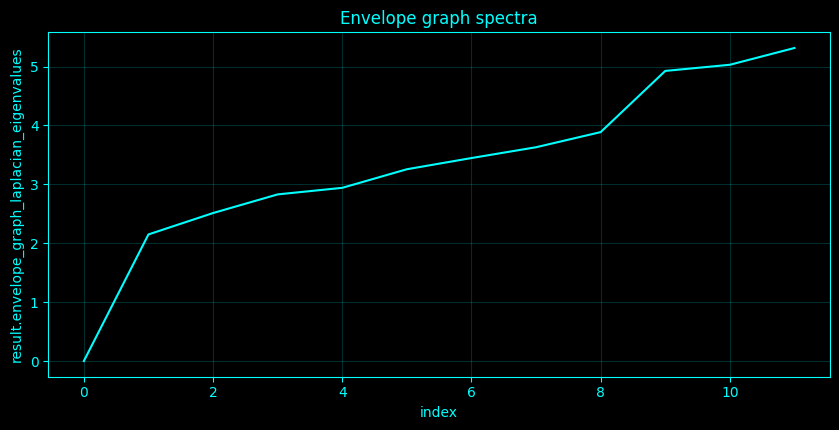

In [79]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

# Method-specific calculation.
def _compute_method_245():
    idx = 245
    name = 'Envelope graph spectra'
    __plot_spec = None
    A = _analytic_band(BANDS['alpha'])
    env = np.abs(A)
    nper = min(_SPEED['nperseg'], N)
    fE, PE = signal.welch(env, fs=_fs, axis=0, nperseg=nper, noverlap=nper // 2)
    keep = fE <= min(20, 0.49 * _fs)
    fE = fE[keep]
    PE = PE[keep]
    M = np.eye(C)
    for i in range(C):
        for j in range(i + 1, C):
            ff, cc = signal.coherence(env[:, i], env[:, j], fs=_fs, nperseg=nper)
            m = (ff >= 0.1) & (ff <= 10)
            M[i, j] = M[j, i] = float(np.mean(cc[m])) if np.any(m) else 0
    np.fill_diagonal(M, 0)
    L = np.diag(M.sum(1)) - M
    lam = np.linalg.eigvalsh(L)
    return ({'envelope_graph_laplacian_eigenvalues': lam.tolist()}, locals().get('__plot_spec', None))
    q = PE / (np.sum(PE, axis=0, keepdims=True) + EPS)
    H = -np.sum(q * np.log(q + EPS), axis=0) / np.log(max(len(fE), 2))
    return ({'envelope_spectral_entropy': H.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_245,_plot_spec=_compute_method_245()
print('Envelope graph spectra')
if isinstance(result_245,dict):
    for _k,_v in result_245.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_245)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_245)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Envelope graph spectra',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Envelope graph spectra',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Envelope graph spectra',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">246. Envelope spectral entropy</h3>
<p>Envelope spectral entropy normalizes envelope PSD over modulation frequency and computes \(-\sum p_f\log p_f/\log F\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Envelope spectral entropy
  envelope_spectral_entropy: array(12,), mean=0.326365


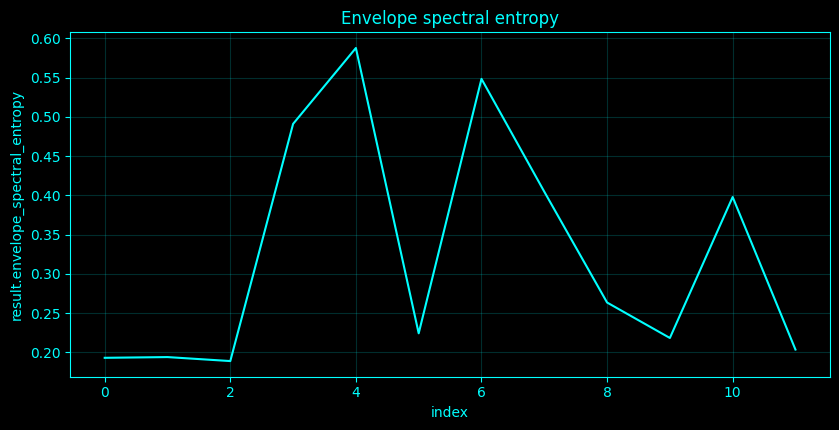

In [80]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

# Method-specific calculation.
def _compute_method_246():
    idx = 246
    name = 'Envelope spectral entropy'
    __plot_spec = None
    A = _analytic_band(BANDS['alpha'])
    env = np.abs(A)
    nper = min(_SPEED['nperseg'], N)
    fE, PE = signal.welch(env, fs=_fs, axis=0, nperseg=nper, noverlap=nper // 2)
    keep = fE <= min(20, 0.49 * _fs)
    fE = fE[keep]
    PE = PE[keep]
    q = PE / (np.sum(PE, axis=0, keepdims=True) + EPS)
    H = -np.sum(q * np.log(q + EPS), axis=0) / np.log(max(len(fE), 2))
    return ({'envelope_spectral_entropy': H.tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Early spectral catalogue method {idx}: {name} has no implementation')

result_246,_plot_spec=_compute_method_246()
print('Envelope spectral entropy')
if isinstance(result_246,dict):
    for _k,_v in result_246.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_246)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_246)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Envelope spectral entropy',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Envelope spectral entropy',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Envelope spectral entropy',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">247. Spectral Granger causality</h3>
<p>For a stable multivariate autoregressive process \(x_t=\sum_{k=1}^p A_kx_{t-k}+\varepsilon_t\), the transfer matrix is \(H(f)=A(f)^{-1}\), where \(A(f)=I-\sum_kA_ke^{-i2\pi fk/f_s}\). Frequency-domain Granger influence is the log ratio between the target spectrum and the spectrum remaining after the source innovation contribution is removed, \(F_{j\to i}(f)=\log[S_{ii}(f)/\tilde S_{ii}^{(j)}(f)]\). This cell fits one MVAR model to the same EEG segment and evaluates that directed spectrum.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral Granger causality
  peak_hz: 2.3968253968253967
  mean_gc: 0.06630750524560483


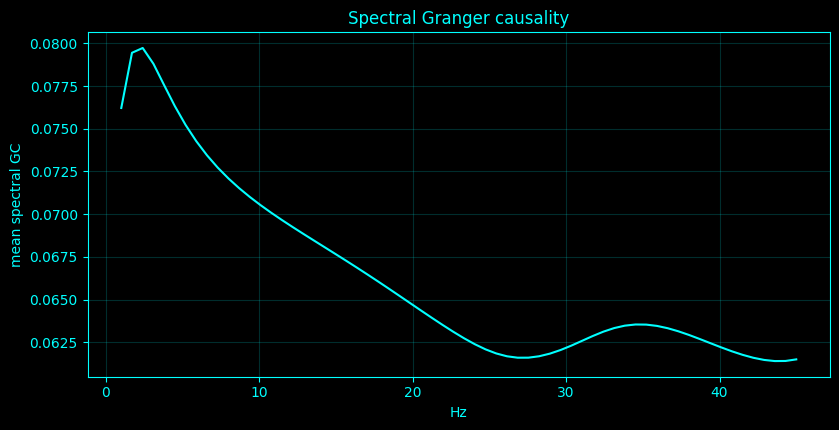

In [81]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_247():
    idx = 247
    name = 'Spectral Granger causality'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    D = _directed_measures()
    f = D['f']
    gc = D['gc']
    band = (8, 13)
    bm = (f >= band[0]) & (f < band[1])
    y = np.mean(gc, axis=(1, 2))
    __plot_spec = ('summary', y, name, f, 'Hz', 'mean spectral GC')
    return ({'peak_hz': float(f[np.argmax(y)]), 'mean_gc': float(np.mean(y))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_247,_plot_spec=_compute_method_247()
print('Spectral Granger causality')
if isinstance(result_247,dict):
    for _k,_v in result_247.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_247)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_247)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral Granger causality',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral Granger causality',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral Granger causality',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">248. Frequency-domain Granger causality</h3>
<p>For a stable multivariate autoregressive process \(x_t=\sum_{k=1}^p A_kx_{t-k}+\varepsilon_t\), the transfer matrix is \(H(f)=A(f)^{-1}\), where \(A(f)=I-\sum_kA_ke^{-i2\pi fk/f_s}\). Frequency-domain Granger influence is the log ratio between the target spectrum and the spectrum remaining after the source innovation contribution is removed, \(F_{j\to i}(f)=\log[S_{ii}(f)/\tilde S_{ii}^{(j)}(f)]\). This cell fits one MVAR model to the same EEG segment and evaluates that directed spectrum.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Frequency-domain Granger causality
  strongest: Fp1→Fpz
  forward: 0.7268447724257423
  reverse: 0.07203058240277287


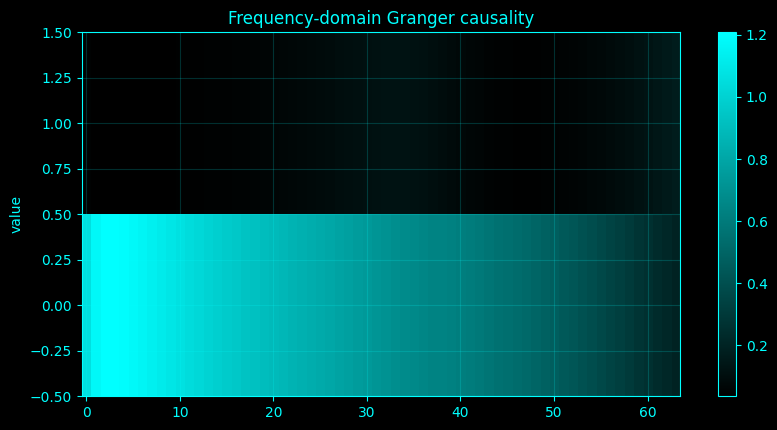

In [82]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_248():
    idx = 248
    name = 'Frequency-domain Granger causality'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    D = _directed_measures()
    f = D['f']
    gc = D['gc']
    band = (8, 13)
    bm = (f >= band[0]) & (f < band[1])
    score = np.mean(gc, axis=0)
    np.fill_diagonal(score, 0)
    i, j = np.unravel_index(np.argmax(score), score.shape)
    __plot_spec = ('summary', np.vstack([gc[:, i, j], gc[:, j, i]]), name, None, '', 'value')
    return ({'strongest': f'{CH_NAMES[j]}→{CH_NAMES[i]}', 'forward': float(score[i, j]), 'reverse': float(score[j, i])}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_248,_plot_spec=_compute_method_248()
print('Frequency-domain Granger causality')
if isinstance(result_248,dict):
    for _k,_v in result_248.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_248)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_248)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Frequency-domain Granger causality',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Frequency-domain Granger causality',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Frequency-domain Granger causality',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">249. Conditional spectral Granger causality</h3>
<p>Conditional spectral Granger causality asks whether source \(j\) improves prediction of target \(i\) after all other modeled channels are already included. In the fitted multivariate system it is evaluated from the full transfer matrix and whitened innovations; the directed contribution is therefore conditional on the remaining variables in the VAR.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [83]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_249():
    idx = 249
    name = 'Conditional spectral Granger causality'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    D = _directed_measures()
    f = D['f']
    gc = D['gc']
    band = (8, 13)
    bm = (f >= band[0]) & (f < band[1])
    score = np.mean(gc[:, bm], axis=1) if False else np.mean(gc[bm], axis=0)
    np.fill_diagonal(score, 0)
    i, j = np.unravel_index(np.argmax(score), score.shape)
    __plot_spec = ('summary', gc[:, i, j], name, f, 'Hz', 'conditional GC')
    return ({'edge': f'{CH_NAMES[j]}→{CH_NAMES[i]}', 'alpha_gc': float(score[i, j])}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_249,_plot_spec=_compute_method_249()
print('Conditional spectral Granger causality')
if isinstance(result_249,dict):
    for _k,_v in result_249.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_249)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_249)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Conditional spectral Granger causality',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Conditional spectral Granger causality',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Conditional spectral Granger causality',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Conditional spectral Granger causality
  edge: Fp1→Fpz
  alpha_gc: 0.9888439469953713


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">250. Pairwise spectral Granger networks</h3>
<p>A spectral Granger network uses channels as nodes and frequency-averaged Granger influence as directed edge weight, \(w_{j\to i}=|B|^{-1}\int_B F_{j\to i}(f)\,df\) (implemented by the sampled-frequency mean). Pairwise summaries and the multivariate network use the same fitted VAR but differ in how the edge matrix is summarized.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [84]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_250():
    idx = 250
    name = 'Pairwise spectral Granger networks'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    D = _directed_measures()
    f = D['f']
    gc = D['gc']
    band = (8, 13)
    bm = (f >= band[0]) & (f < band[1])
    M = np.mean(gc[bm], axis=0) if idx == 250 else np.mean(gc, axis=0)
    np.fill_diagonal(M, 0)
    __plot_spec = ('summary', M, name, None, '', 'value')
    return ({'edges_above_q75': int(np.sum(M > np.quantile(M[M > 0], 0.75))) if np.any(M > 0) else 0}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_250,_plot_spec=_compute_method_250()
print('Pairwise spectral Granger networks')
if isinstance(result_250,dict):
    for _k,_v in result_250.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_250)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_250)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Pairwise spectral Granger networks',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Pairwise spectral Granger networks',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Pairwise spectral Granger networks',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Pairwise spectral Granger networks
  edges_above_q75: 33


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">251. Multivariate spectral Granger networks</h3>
<p>A spectral Granger network uses channels as nodes and frequency-averaged Granger influence as directed edge weight, \(w_{j\to i}=|B|^{-1}\int_B F_{j\to i}(f)\,df\) (implemented by the sampled-frequency mean). Pairwise summaries and the multivariate network use the same fitted VAR but differ in how the edge matrix is summarized.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [85]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_251():
    idx = 251
    name = 'Multivariate spectral Granger networks'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    D = _directed_measures()
    f = D['f']
    gc = D['gc']
    band = (8, 13)
    bm = (f >= band[0]) & (f < band[1])
    M = np.mean(gc[bm], axis=0) if idx == 250 else np.mean(gc, axis=0)
    np.fill_diagonal(M, 0)
    __plot_spec = ('summary', M, name, None, '', 'value')
    return ({'edges_above_q75': int(np.sum(M > np.quantile(M[M > 0], 0.75))) if np.any(M > 0) else 0}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_251,_plot_spec=_compute_method_251()
print('Multivariate spectral Granger networks')
if isinstance(result_251,dict):
    for _k,_v in result_251.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_251)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_251)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Multivariate spectral Granger networks',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Multivariate spectral Granger networks',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Multivariate spectral Granger networks',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Multivariate spectral Granger networks
  edges_above_q75: 33


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">252. Spectral causality asymmetry</h3>
<p>Directed asymmetry is the antisymmetric component of a directed connectivity matrix, \(A_{ij}=w_{j\to i}-w_{i\to j}\). Positive values indicate stronger flow from \(j\) to \(i\) than in the reverse direction.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [86]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_252():
    idx = 252
    name = 'Spectral causality asymmetry'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    D = _directed_measures()
    f = D['f']
    gc = D['gc']
    band = (8, 13)
    bm = (f >= band[0]) & (f < band[1])
    M = np.mean(gc[bm], axis=0)
    A = M - M.T
    __plot_spec = ('summary', A, name, None, '', 'value')
    return ({'max_abs_asymmetry': float(np.max(np.abs(A)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_252,_plot_spec=_compute_method_252()
print('Spectral causality asymmetry')
if isinstance(result_252,dict):
    for _k,_v in result_252.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_252)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_252)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral causality asymmetry',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral causality asymmetry',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral causality asymmetry',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral causality asymmetry
  max_abs_asymmetry: 0.942360692711569


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">253. Spectral causality source-sink maps</h3>
<p>For node \(j\), spectral source strength is \(s_j^{out}=\sum_iw_{j\to i}\), sink strength is \(s_j^{in}=\sum_iw_{i\to j}\), and net source-sink score is \(s_j^{out}-s_j^{in}\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [87]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_253():
    idx = 253
    name = 'Spectral causality source-sink maps'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    D = _directed_measures()
    f = D['f']
    gc = D['gc']
    band = (8, 13)
    bm = (f >= band[0]) & (f < band[1])
    M = np.mean(gc[bm], axis=0)
    out = np.sum(M, axis=0)
    inn = np.sum(M, axis=1)
    net = out - inn
    __plot_spec = ('summary', net, name, np.arange(C), 'channel', 'out-in')
    return ({'top_source': CH_NAMES[int(np.argmax(net))], 'top_sink': CH_NAMES[int(np.argmin(net))]}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_253,_plot_spec=_compute_method_253()
print('Spectral causality source-sink maps')
if isinstance(result_253,dict):
    for _k,_v in result_253.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_253)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_253)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral causality source-sink maps',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral causality source-sink maps',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral causality source-sink maps',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral causality source-sink maps
  top_source: Fp1
  top_sink: Fp2


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">254. Spectral Granger surrogate testing</h3>
<p>Surrogate testing compares an observed Granger edge with a null distribution generated after phase randomization. The Monte-Carlo p-value is \((1+\#\{T_s\ge T_{obs}\})/(1+N_s)\), which avoids zero p-values for a finite surrogate ensemble.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral Granger surrogate testing
  edge: Fp1→Fpz
  observed: 0.9888439469953713
  surrogate_p: 0.1111111111111111


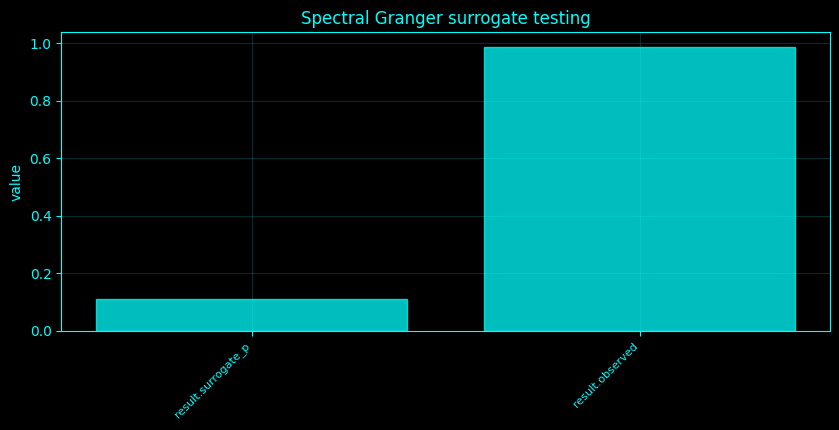

In [88]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

def _phase_randomize(x, rng):
    xf = np.fft.rfft(x, axis=0)
    ph = rng.uniform(0, 2 * np.pi, size=xf.shape)
    ph[0] = 0
    if x.shape[0] % 2 == 0:
        ph[-1] = 0
    return np.fft.irfft(np.abs(xf) * np.exp(1j * ph), n=x.shape[0], axis=0)

# Method-specific calculation.
def _compute_method_254():
    idx = 254
    name = 'Spectral Granger surrogate testing'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    D = _directed_measures()
    f = D['f']
    gc = D['gc']
    band = (8, 13)
    bm = (f >= band[0]) & (f < band[1])
    M = np.mean(gc[bm], axis=0)
    np.fill_diagonal(M, 0)
    i, j = np.unravel_index(np.argmax(M), M.shape)
    obs = float(M[i, j])
    vals = []
    for _ in range(_SPEED['n_sur']):
        xx = _phase_randomize(X[:, [i, j]], _rng)
        p = min(_SPEED['var_order'], 8)
        Y = xx[p:]
        Z = np.hstack([xx[p - k:N - k] for k in range(1, p + 1)])
        B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(2 * p), Z.T @ Y)
        E = Y - Z @ B
        vals.append(float(np.log((np.var(E[:, 0]) + EPS) / (np.var(E[:, 0] - Z[:, 1::2] @ B[1::2, 0]) + EPS))) if p > 0 else 0)
    vals = np.maximum(vals, 0)
    pval = (1 + np.sum(np.asarray(vals) >= obs)) / (1 + len(vals))
    return ({'edge': f'{CH_NAMES[j]}→{CH_NAMES[i]}', 'observed': obs, 'surrogate_p': float(pval)}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_254,_plot_spec=_compute_method_254()
print('Spectral Granger surrogate testing')
if isinstance(result_254,dict):
    for _k,_v in result_254.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_254)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_254)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral Granger surrogate testing',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral Granger surrogate testing',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral Granger surrogate testing',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">255. Directed transfer function</h3>
<p>The directed transfer function normalizes each target row of the transfer matrix, \(\mathrm{DTF}_{ij}(f)=|H_{ij}(f)|/\sqrt{\sum_k|H_{ik}(f)|^2}\). It quantifies how strongly source \(j\) contributes to target \(i\) through the full VAR transfer function.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [89]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_255():
    idx = 255
    name = 'Directed transfer function'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    D = _directed_measures()
    f = D['f']
    gc = D['gc']
    band = (8, 13)
    bm = (f >= band[0]) & (f < band[1])
    M = D['dtf']
    score = np.mean(M[bm], axis=0)
    np.fill_diagonal(score, 0)
    i, j = np.unravel_index(np.argmax(score), score.shape)
    __plot_spec = ('summary', M[:, i, j], name, f, 'Hz', 'DTF')
    return ({'edge': f'{CH_NAMES[j]}→{CH_NAMES[i]}', 'alpha_mean': float(score[i, j])}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_255,_plot_spec=_compute_method_255()
print('Directed transfer function')
if isinstance(result_255,dict):
    for _k,_v in result_255.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_255)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_255)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Directed transfer function',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Directed transfer function',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Directed transfer function',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Directed transfer function
  edge: FC1→F3
  alpha_mean: 0.6475506826866955


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">256. Direct directed transfer function</h3>
<p>Direct DTF suppresses indirect pathways by multiplying DTF by partial coherence, \(\mathrm{dDTF}_{ij}(f)=\mathrm{DTF}_{ij}(f)\,|\mathrm{PCoh}_{ij}(f)|\), where partial coherence is computed from the inverse spectral matrix.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [90]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_256():
    idx = 256
    name = 'Direct directed transfer function'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    D = _directed_measures()
    f = D['f']
    gc = D['gc']
    band = (8, 13)
    bm = (f >= band[0]) & (f < band[1])
    M = D['ddtf']
    score = np.mean(M[bm], axis=0)
    np.fill_diagonal(score, 0)
    i, j = np.unravel_index(np.argmax(score), score.shape)
    __plot_spec = ('summary', M[:, i, j], name, f, 'Hz', 'dDTF')
    return ({'edge': f'{CH_NAMES[j]}→{CH_NAMES[i]}', 'alpha_mean': float(score[i, j])}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_256,_plot_spec=_compute_method_256()
print('Direct directed transfer function')
if isinstance(result_256,dict):
    for _k,_v in result_256.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_256)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_256)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Direct directed transfer function',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Direct directed transfer function',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Direct directed transfer function',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Direct directed transfer function
  edge: FC6→F8
  alpha_mean: 0.3749086507035347


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">257. Partial directed coherence</h3>
<p>Partial directed coherence uses the Fourier-domain AR matrix rather than the transfer matrix. For sender \(j\), \(\mathrm{PDC}_{ij}(f)=|A_{ij}(f)|/\sqrt{\sum_k|A_{kj}(f)|^2}\); the column normalization emphasizes direct outgoing coefficients.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [91]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_257():
    idx = 257
    name = 'Partial directed coherence'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    D = _directed_measures()
    f = D['f']
    gc = D['gc']
    band = (8, 13)
    bm = (f >= band[0]) & (f < band[1])
    M = D['pdc']
    score = np.mean(M[bm], axis=0)
    np.fill_diagonal(score, 0)
    i, j = np.unravel_index(np.argmax(score), score.shape)
    __plot_spec = ('summary', M[:, i, j], name, f, 'Hz', 'PDC')
    return ({'edge': f'{CH_NAMES[j]}→{CH_NAMES[i]}', 'alpha_mean': float(score[i, j])}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_257,_plot_spec=_compute_method_257()
print('Partial directed coherence')
if isinstance(result_257,dict):
    for _k,_v in result_257.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_257)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_257)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Partial directed coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Partial directed coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Partial directed coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Partial directed coherence
  edge: FC1→F3
  alpha_mean: 0.5464343659046756


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">258. Generalized partial directed coherence</h3>
<p>Generalized PDC makes PDC scale-aware by weighting each receiving equation with its innovation variance, \(\mathrm{gPDC}_{ij}=|A_{ij}|/\sigma_i\,[\sum_k|A_{kj}|^2/\sigma_k^2]^{-1/2}\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [92]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_258():
    idx = 258
    name = 'Generalized partial directed coherence'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    D = _directed_measures()
    f = D['f']
    gc = D['gc']
    band = (8, 13)
    bm = (f >= band[0]) & (f < band[1])
    M = D['gpdc']
    score = np.mean(M[bm], axis=0)
    np.fill_diagonal(score, 0)
    i, j = np.unravel_index(np.argmax(score), score.shape)
    __plot_spec = ('summary', M[:, i, j], name, f, 'Hz', 'gPDC')
    return ({'edge': f'{CH_NAMES[j]}→{CH_NAMES[i]}', 'alpha_mean': float(score[i, j])}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_258,_plot_spec=_compute_method_258()
print('Generalized partial directed coherence')
if isinstance(result_258,dict):
    for _k,_v in result_258.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_258)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_258)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Generalized partial directed coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Generalized partial directed coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Generalized partial directed coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Generalized partial directed coherence
  edge: Fpz→Fp1
  alpha_mean: 0.5502539576057963


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">259. Renormalized PDC</h3>
<p>Renormalized PDC treats the real and imaginary parts of \(A_{ij}(f)\) as a two-vector \(Z_{ij}(f)=[\Re A_{ij},\Im A_{ij}]^\top\) and forms the Wald statistic \(\lambda_{ij}(f)=Z_{ij}^\top V_{ij}^{-1}Z_{ij}\), where \(V_{ij}\) is the estimated coefficient covariance.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [93]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_259():
    idx = 259
    name = 'Renormalized PDC'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    D = _directed_measures()
    f = D['f']
    gc = D['gc']
    band = (8, 13)
    bm = (f >= band[0]) & (f < band[1])
    M = D['rpdc']
    score = np.mean(M[bm], axis=0)
    np.fill_diagonal(score, 0)
    i, j = np.unravel_index(np.argmax(score), score.shape)
    __plot_spec = ('summary', M[:, i, j], name, f, 'Hz', 'Wald λ')
    return ({'edge': f'{CH_NAMES[j]}→{CH_NAMES[i]}', 'mean_lambda': float(score[i, j])}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_259,_plot_spec=_compute_method_259()
print('Renormalized PDC')
if isinstance(result_259,dict):
    for _k,_v in result_259.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_259)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_259)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Renormalized PDC',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Renormalized PDC',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Renormalized PDC',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Renormalized PDC
  edge: FC1→Fpz
  mean_lambda: 1125.827287250467


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">260. Frequency-domain causal flow</h3>
<p>Frequency-domain causal flow is the total directed Granger mass at each frequency, \(\Phi(f)=\sum_{i\ne j}F_{j\to i}(f)\). It is a network summary, not a new pairwise causal estimator.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [94]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_260():
    idx = 260
    name = 'Frequency-domain causal flow'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    D = _directed_measures()
    f = D['f']
    gc = D['gc']
    band = (8, 13)
    bm = (f >= band[0]) & (f < band[1])
    flow = np.sum(gc, axis=(1, 2))
    __plot_spec = ('summary', flow, name, f, 'Hz', 'total directed GC')
    return ({'peak_hz': float(f[np.argmax(flow)])}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_260,_plot_spec=_compute_method_260()
print('Frequency-domain causal flow')
if isinstance(result_260,dict):
    for _k,_v in result_260.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_260)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_260)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Frequency-domain causal flow',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Frequency-domain causal flow',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Frequency-domain causal flow',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Frequency-domain causal flow
  peak_hz: 2.3968253968253967


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">261. Frequency-specific net outflow</h3>
<p>Frequency-specific net outflow from source \(j\) is \(O_j(f)=\sum_{i\ne j}F_{j\to i}(f)\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [95]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_261():
    idx = 261
    name = 'Frequency-specific net outflow'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    D = _directed_measures()
    f = D['f']
    gc = D['gc']
    band = (8, 13)
    bm = (f >= band[0]) & (f < band[1])
    out = np.sum(gc, axis=1)
    __plot_spec = ('summary', out.T, name, None, '', 'value')
    return ({'max_channel': CH_NAMES[int(np.argmax(np.mean(out, axis=0)))]}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_261,_plot_spec=_compute_method_261()
print('Frequency-specific net outflow')
if isinstance(result_261,dict):
    for _k,_v in result_261.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_261)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_261)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Frequency-specific net outflow',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Frequency-specific net outflow',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Frequency-specific net outflow',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Frequency-specific net outflow
  max_channel: Fp1


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">262. Frequency-specific net inflow</h3>
<p>Frequency-specific net inflow to target \(i\) is \(I_i(f)=\sum_{j\ne i}F_{j\to i}(f)\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [96]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_262():
    idx = 262
    name = 'Frequency-specific net inflow'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    D = _directed_measures()
    f = D['f']
    gc = D['gc']
    band = (8, 13)
    bm = (f >= band[0]) & (f < band[1])
    inn = np.sum(gc, axis=2)
    __plot_spec = ('summary', inn.T, name, None, '', 'value')
    return ({'max_channel': CH_NAMES[int(np.argmax(np.mean(inn, axis=0)))]}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_262,_plot_spec=_compute_method_262()
print('Frequency-specific net inflow')
if isinstance(result_262,dict):
    for _k,_v in result_262.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_262)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_262)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Frequency-specific net inflow',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Frequency-specific net inflow',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Frequency-specific net inflow',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Frequency-specific net inflow
  max_channel: Fpz


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">263. Frequency-resolved causal hubness</h3>
<p>Causal hubness is summarized as outflow minus inflow, \(H_j(f)=O_j(f)-I_j(f)\). Positive values identify source-like nodes and negative values identify sink-like nodes.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [97]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_263():
    idx = 263
    name = 'Frequency-resolved causal hubness'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    D = _directed_measures()
    f = D['f']
    gc = D['gc']
    band = (8, 13)
    bm = (f >= band[0]) & (f < band[1])
    out = np.sum(gc, axis=1)
    inn = np.sum(gc, axis=2)
    hub = out - inn
    __plot_spec = ('summary', hub.T, name, None, '', 'value')
    return ({'strongest_source': CH_NAMES[int(np.argmax(np.mean(hub, axis=0)))]}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_263,_plot_spec=_compute_method_263()
print('Frequency-resolved causal hubness')
if isinstance(result_263,dict):
    for _k,_v in result_263.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_263)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_263)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Frequency-resolved causal hubness',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Frequency-resolved causal hubness',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Frequency-resolved causal hubness',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Frequency-resolved causal hubness
  strongest_source: Fp1


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">264. Directed spectral graph analysis</h3>
<p>Directed spectral graph analysis thresholds a band-averaged directed connectivity matrix to form a weighted digraph. Graph centrality is then computed on those directed weights; the graph step does not change the underlying DTF/Granger estimator.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Directed spectral graph analysis
  nodes: 12
  edges: 33
  top_pagerank: F8


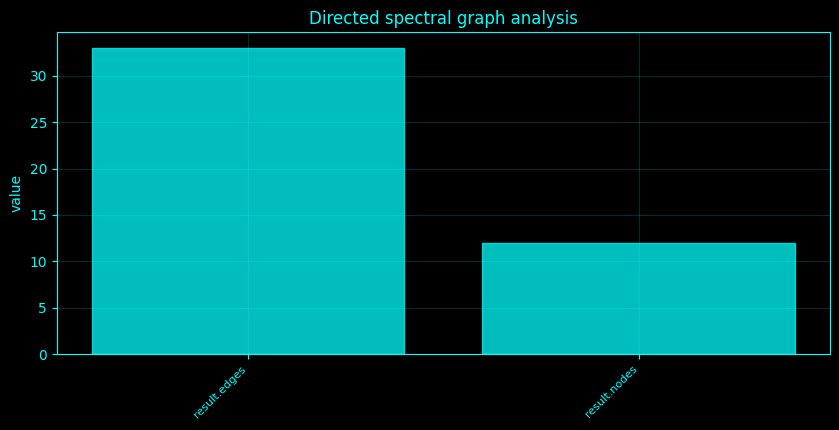

In [98]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _fit_var(order=None):
    if 'var' in SPEC_CACHE:
        return SPEC_CACHE['var']
    p = int(order or _SPEED['var_order'])
    Y = X[p:]
    Z = np.hstack([X[p - k:N - k] for k in range(1, p + 1)])
    B = np.linalg.solve(Z.T @ Z + 1e-05 * np.eye(Z.shape[1]), Z.T @ Y)
    A = np.stack([B[k * C:(k + 1) * C, :].T for k in range(p)], axis=0)
    E = Y - Z @ B
    Sigma = np.cov(E, rowvar=False) + 1e-08 * np.eye(C)
    SPEC_CACHE['var'] = (A, Sigma, E, Z)
    return SPEC_CACHE['var']

def _var_frequency(nf=64):
    key = ('varfreq', nf)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    Acoef, Sigma, E, Z = _fit_var()
    p = Acoef.shape[0]
    f = np.linspace(1, min(45, 0.45 * _fs), nf)
    Af = np.empty((nf, C, C), complex)
    H = np.empty_like(Af)
    S = np.empty_like(Af)
    I = np.eye(C)
    for q, ff in enumerate(f):
        M = I.astype(complex)
        for k in range(1, p + 1):
            M -= Acoef[k - 1] * np.exp(-2j * np.pi * ff * k / _fs)
        Af[q] = M
        H[q] = np.linalg.inv(M)
        S[q] = H[q] @ Sigma @ H[q].conj().T
    SPEC_CACHE[key] = (f, Af, H, S, Sigma)
    return SPEC_CACHE[key]

def _directed_measures():
    if 'directed' in SPEC_CACHE:
        return SPEC_CACHE['directed']
    f, A, H, S, Sigma = _var_frequency()
    sig = np.maximum(np.diag(Sigma).real, EPS)
    dtf = np.abs(H) / np.sqrt(np.sum(np.abs(H) ** 2, axis=2, keepdims=True) + EPS)
    pdc = np.abs(A) / np.sqrt(np.sum(np.abs(A) ** 2, axis=1, keepdims=True) + EPS)
    num = np.abs(A) / np.sqrt(sig[None, :, None])
    den = np.sqrt(np.sum(np.abs(A) ** 2 / sig[None, :, None], axis=1, keepdims=True) + EPS)
    gpdc = num / den
    L = np.linalg.cholesky(Sigma)
    Hw = H @ L
    Sw = Hw @ Hw.conj().transpose(0, 2, 1)
    Fgc = np.zeros((len(f), C, C))
    for i in range(C):
        sii = np.maximum(Sw[:, i, i].real, EPS)
        for j in range(C):
            if i == j:
                continue
            intrinsic = np.maximum(sii - np.abs(Hw[:, i, j]) ** 2, EPS)
            Fgc[:, i, j] = np.maximum(0, np.log(sii / intrinsic))
    pc = np.zeros_like(np.abs(S), float)
    for q in range(len(f)):
        P = np.linalg.pinv(S[q])
        d = np.sqrt(np.maximum(np.outer(np.diag(P).real, np.diag(P).real), EPS))
        pc[q] = np.abs(P) / d
    ddtf = dtf * pc
    Acoef, Sigma0, E, Z = _fit_var()
    p = Acoef.shape[0]
    Rinv = np.linalg.pinv(Z.T @ Z / max(len(Z), 1) + 1e-08 * np.eye(Z.shape[1]))
    rpdc = np.zeros((len(f), C, C))
    Nfit = len(Z)
    for qi, ff in enumerate(f):
        cs = np.cos(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        sn = np.sin(2 * np.pi * ff * np.arange(1, p + 1) / _fs)
        for i in range(C):
            for j in range(C):
                if i == j:
                    continue
                idx = np.array([k * C + j for k in range(p)])
                Rij = Rinv[np.ix_(idx, idx)] * Sigma0[i, i] / max(Nfit, 1)
                V = np.array([[cs @ Rij @ cs, cs @ Rij @ sn], [sn @ Rij @ cs, sn @ Rij @ sn]]) + 1e-12 * np.eye(2)
                z = np.array([A[qi, i, j].real, A[qi, i, j].imag])
                rpdc[qi, i, j] = float(z @ np.linalg.pinv(V) @ z)
    out = dict(f=f, A=A, H=H, S=S, Sigma=Sigma, dtf=dtf, pdc=pdc, gpdc=gpdc, rpdc=rpdc, gc=Fgc, ddtf=ddtf, pc=pc)
    SPEC_CACHE['directed'] = out
    return out

# Method-specific calculation.
def _compute_method_264():
    idx = 264
    name = 'Directed spectral graph analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    D = _directed_measures()
    f = D['f']
    gc = D['gc']
    band = (8, 13)
    bm = (f >= band[0]) & (f < band[1])
    M = np.mean(D['dtf'][bm], axis=0)
    np.fill_diagonal(M, 0)
    G = nx.DiGraph()
    for j in range(C):
        for i in range(C):
            if i != j and M[i, j] >= np.quantile(M[M > 0], 0.75):
                G.add_edge(j, i, weight=float(M[i, j]))
    pr = nx.pagerank(G, weight='weight') if G.number_of_edges() else {i: 0 for i in range(C)}
    return ({'nodes': G.number_of_nodes(), 'edges': G.number_of_edges(), 'top_pagerank': CH_NAMES[max(pr, key=pr.get)] if pr else None}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_264,_plot_spec=_compute_method_264()
print('Directed spectral graph analysis')
if isinstance(result_264,dict):
    for _k,_v in result_264.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_264)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_264)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Directed spectral graph analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Directed spectral graph analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Directed spectral graph analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">265. Cross-channel spectral mutual information</h3>
<p>Mutual information measures statistical dependence: \(I(X;Y)=\sum_{x,y}p(x,y)\log[p(x,y)/(p(x)p(y))]\). Here the variables are windowed log spectral powers, quantized only for the finite-sample estimator.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [99]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _hist_mi(x, y, bins=8):
    h, _, _ = np.histogram2d(np.asarray(x), np.asarray(y), bins=bins)
    p = h / (h.sum() + EPS)
    px = p.sum(1, keepdims=True)
    py = p.sum(0, keepdims=True)
    ratio = p / (px @ py + EPS)
    m = p > 0
    return float(np.sum(p[m] * np.log(ratio[m] + EPS)))

def _digitize_quantile(x, bins=5):
    q = np.unique(np.quantile(x, np.linspace(0, 1, bins + 1)))
    if len(q) <= 2:
        return np.zeros(len(x), int)
    return np.clip(np.digitize(x, q[1:-1]), 0, len(q) - 2)

def _entropy_disc(*arrs):
    A = np.column_stack(arrs)
    _, cnt = np.unique(A, axis=0, return_counts=True)
    p = cnt / cnt.sum()
    return float(-np.sum(p * np.log(p + EPS)))

def _info_features():
    if 'info' in SPEC_CACHE:
        return SPEC_CACHE['info']
    t, W = _window_bandpower()
    Z = np.log(W + EPS)
    SPEC_CACHE['info'] = (t, Z)
    return SPEC_CACHE['info']

# Method-specific calculation.
def _compute_method_265():
    idx = 265
    name = 'Cross-channel spectral mutual information'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, Z = _info_features()
    A = np.mean(Z, axis=2)
    M = np.eye(C)
    for i in range(C):
        for j in range(i + 1, C):
            M[i, j] = M[j, i] = _hist_mi(A[:, i], A[:, j], bins=6)
    __plot_spec = ('summary', M, name, None, '', 'value')
    return ({'mean_offdiag_mi': float(np.mean(M[np.triu_indices(C, 1)]))}, locals().get('__plot_spec', None))
    q = [_digitize_quantile(A[:, k], 4) for k in range(min(C, 5))]
    H = lambda inds: _entropy_disc(*[q[k] for k in inds])
    n = len(q)
    Hall = H(list(range(n)))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_265,_plot_spec=_compute_method_265()
print('Cross-channel spectral mutual information')
if isinstance(result_265,dict):
    for _k,_v in result_265.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_265)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_265)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Cross-channel spectral mutual information',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Cross-channel spectral mutual information',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Cross-channel spectral mutual information',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Cross-channel spectral mutual information
  mean_offdiag_mi: 0.4232572494584808


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">266. Frequency-resolved mutual information</h3>
<p>Frequency-resolved mutual information applies the same \(I(X;Y)\) definition separately to each EEG band, using window-to-window bandpower fluctuations as samples.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Frequency-resolved mutual information
  delta: 0.9364452434649025
  theta: 0.6498644193970063
  alpha: 1.070168276561646
  beta: 0.4212152850946526
  gamma: 0.512843803713235


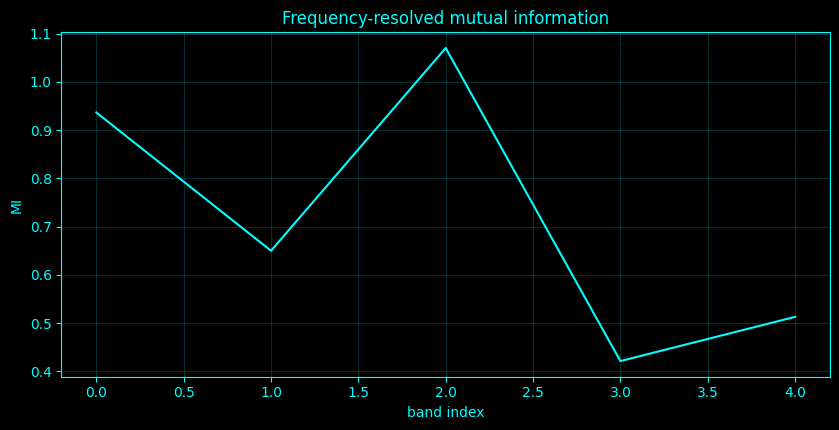

In [100]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _hist_mi(x, y, bins=8):
    h, _, _ = np.histogram2d(np.asarray(x), np.asarray(y), bins=bins)
    p = h / (h.sum() + EPS)
    px = p.sum(1, keepdims=True)
    py = p.sum(0, keepdims=True)
    ratio = p / (px @ py + EPS)
    m = p > 0
    return float(np.sum(p[m] * np.log(ratio[m] + EPS)))

def _digitize_quantile(x, bins=5):
    q = np.unique(np.quantile(x, np.linspace(0, 1, bins + 1)))
    if len(q) <= 2:
        return np.zeros(len(x), int)
    return np.clip(np.digitize(x, q[1:-1]), 0, len(q) - 2)

def _entropy_disc(*arrs):
    A = np.column_stack(arrs)
    _, cnt = np.unique(A, axis=0, return_counts=True)
    p = cnt / cnt.sum()
    return float(-np.sum(p * np.log(p + EPS)))

def _info_features():
    if 'info' in SPEC_CACHE:
        return SPEC_CACHE['info']
    t, W = _window_bandpower()
    Z = np.log(W + EPS)
    SPEC_CACHE['info'] = (t, Z)
    return SPEC_CACHE['info']

# Method-specific calculation.
def _compute_method_266():
    idx = 266
    name = 'Frequency-resolved mutual information'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, Z = _info_features()
    A = np.mean(Z, axis=2)
    i, j = (0, min(1, C - 1))
    vals = [_hist_mi(Z[:, i, b], Z[:, j, b], bins=6) for b in range(Z.shape[2])]
    __plot_spec = ('summary', vals, name, np.arange(len(vals)), 'band index', 'MI')
    return (dict(zip(BANDS.keys(), map(float, vals))), locals().get('__plot_spec', None))
    q = [_digitize_quantile(A[:, k], 4) for k in range(min(C, 5))]
    H = lambda inds: _entropy_disc(*[q[k] for k in inds])
    n = len(q)
    Hall = H(list(range(n)))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_266,_plot_spec=_compute_method_266()
print('Frequency-resolved mutual information')
if isinstance(result_266,dict):
    for _k,_v in result_266.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_266)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_266)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Frequency-resolved mutual information',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Frequency-resolved mutual information',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Frequency-resolved mutual information',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">267. Spectral transfer entropy</h3>
<p>Transfer entropy is conditional mutual information from source past to target future, \(TE_{X\to Y}=I(Y_t;X_{t-1}\mid Y_{t-1})\). The implementation uses quantile-discretized windowed spectral power; the band-specific variant repeats the calculation band by band.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [101]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _digitize_quantile(x, bins=5):
    q = np.unique(np.quantile(x, np.linspace(0, 1, bins + 1)))
    if len(q) <= 2:
        return np.zeros(len(x), int)
    return np.clip(np.digitize(x, q[1:-1]), 0, len(q) - 2)

def _entropy_disc(*arrs):
    A = np.column_stack(arrs)
    _, cnt = np.unique(A, axis=0, return_counts=True)
    p = cnt / cnt.sum()
    return float(-np.sum(p * np.log(p + EPS)))

def _te_discrete(x, y, bins=4):
    xd = _digitize_quantile(x, bins)
    yd = _digitize_quantile(y, bins)
    yt = yd[1:]
    yp = yd[:-1]
    xp = xd[:-1]
    return _entropy_disc(yt, yp) + _entropy_disc(yp, xp) - _entropy_disc(yp) - _entropy_disc(yt, yp, xp)

def _info_features():
    if 'info' in SPEC_CACHE:
        return SPEC_CACHE['info']
    t, W = _window_bandpower()
    Z = np.log(W + EPS)
    SPEC_CACHE['info'] = (t, Z)
    return SPEC_CACHE['info']

# Method-specific calculation.
def _compute_method_267():
    idx = 267
    name = 'Spectral transfer entropy'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, Z = _info_features()
    A = np.mean(Z, axis=2)
    M = np.zeros((C, C))
    alpha = list(BANDS).index('alpha')
    for i in range(C):
        for j in range(C):
            if i != j:
                M[i, j] = max(0, _te_discrete(Z[:, j, alpha], Z[:, i, alpha]))
    __plot_spec = ('summary', M, name, None, '', 'value')
    return ({'strongest_te': float(np.max(M))}, locals().get('__plot_spec', None))
    q = [_digitize_quantile(A[:, k], 4) for k in range(min(C, 5))]
    H = lambda inds: _entropy_disc(*[q[k] for k in inds])
    n = len(q)
    Hall = H(list(range(n)))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_267,_plot_spec=_compute_method_267()
print('Spectral transfer entropy')
if isinstance(result_267,dict):
    for _k,_v in result_267.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_267)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_267)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral transfer entropy',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral transfer entropy',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral transfer entropy',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral transfer entropy
  strongest_te: 0.6558343139173988


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">268. Frequency-band transfer entropy</h3>
<p>Transfer entropy is conditional mutual information from source past to target future, \(TE_{X\to Y}=I(Y_t;X_{t-1}\mid Y_{t-1})\). The implementation uses quantile-discretized windowed spectral power; the band-specific variant repeats the calculation band by band.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Frequency-band transfer entropy
  delta: 0.3027425075092949
  theta: 0.14279288736689066
  alpha: 0.21730313633164133
  beta: 0.34470962883998446
  gamma: 0.3629275038084989


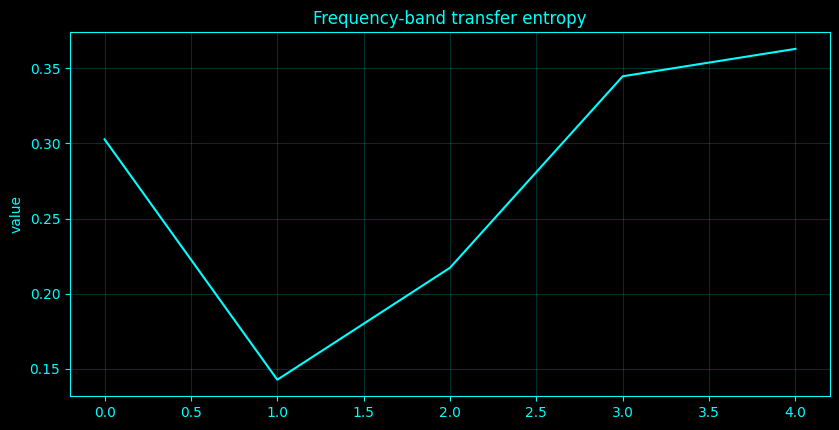

In [102]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _digitize_quantile(x, bins=5):
    q = np.unique(np.quantile(x, np.linspace(0, 1, bins + 1)))
    if len(q) <= 2:
        return np.zeros(len(x), int)
    return np.clip(np.digitize(x, q[1:-1]), 0, len(q) - 2)

def _entropy_disc(*arrs):
    A = np.column_stack(arrs)
    _, cnt = np.unique(A, axis=0, return_counts=True)
    p = cnt / cnt.sum()
    return float(-np.sum(p * np.log(p + EPS)))

def _te_discrete(x, y, bins=4):
    xd = _digitize_quantile(x, bins)
    yd = _digitize_quantile(y, bins)
    yt = yd[1:]
    yp = yd[:-1]
    xp = xd[:-1]
    return _entropy_disc(yt, yp) + _entropy_disc(yp, xp) - _entropy_disc(yp) - _entropy_disc(yt, yp, xp)

def _info_features():
    if 'info' in SPEC_CACHE:
        return SPEC_CACHE['info']
    t, W = _window_bandpower()
    Z = np.log(W + EPS)
    SPEC_CACHE['info'] = (t, Z)
    return SPEC_CACHE['info']

# Method-specific calculation.
def _compute_method_268():
    idx = 268
    name = 'Frequency-band transfer entropy'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, Z = _info_features()
    A = np.mean(Z, axis=2)
    i, j = (0, min(1, C - 1))
    vals = [max(0, _te_discrete(Z[:, i, b], Z[:, j, b])) for b in range(Z.shape[2])]
    __plot_spec = ('summary', vals, name, None, '', 'value')
    return (dict(zip(BANDS.keys(), map(float, vals))), locals().get('__plot_spec', None))
    q = [_digitize_quantile(A[:, k], 4) for k in range(min(C, 5))]
    H = lambda inds: _entropy_disc(*[q[k] for k in inds])
    n = len(q)
    Hall = H(list(range(n)))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_268,_plot_spec=_compute_method_268()
print('Frequency-band transfer entropy')
if isinstance(result_268,dict):
    for _k,_v in result_268.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_268)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_268)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Frequency-band transfer entropy',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Frequency-band transfer entropy',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Frequency-band transfer entropy',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">269. Spectral conditional mutual information</h3>
<p>Conditional mutual information removes dependence explained by a conditioning variable: \(I(X;Y\mid Z)=H(X,Z)+H(Y,Z)-H(Z)-H(X,Y,Z)\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [103]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _digitize_quantile(x, bins=5):
    q = np.unique(np.quantile(x, np.linspace(0, 1, bins + 1)))
    if len(q) <= 2:
        return np.zeros(len(x), int)
    return np.clip(np.digitize(x, q[1:-1]), 0, len(q) - 2)

def _entropy_disc(*arrs):
    A = np.column_stack(arrs)
    _, cnt = np.unique(A, axis=0, return_counts=True)
    p = cnt / cnt.sum()
    return float(-np.sum(p * np.log(p + EPS)))

def _info_features():
    if 'info' in SPEC_CACHE:
        return SPEC_CACHE['info']
    t, W = _window_bandpower()
    Z = np.log(W + EPS)
    SPEC_CACHE['info'] = (t, Z)
    return SPEC_CACHE['info']

# Method-specific calculation.
def _compute_method_269():
    idx = 269
    name = 'Spectral conditional mutual information'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, Z = _info_features()
    A = np.mean(Z, axis=2)
    q = [_digitize_quantile(A[:, k], 4) for k in range(min(C, 5))]
    H = lambda inds: _entropy_disc(*[q[k] for k in inds])
    if len(q) < 3:
        return ({'conditional_mi': np.nan}, locals().get('__plot_spec', None))
    cmi = H([0, 2]) + H([1, 2]) - H([2]) - H([0, 1, 2])
    return ({'I(X0;X1|X2)': float(max(cmi, 0))}, locals().get('__plot_spec', None))
    n = len(q)
    Hall = H(list(range(n)))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_269,_plot_spec=_compute_method_269()
print('Spectral conditional mutual information')
if isinstance(result_269,dict):
    for _k,_v in result_269.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_269)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_269)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral conditional mutual information',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral conditional mutual information',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral conditional mutual information',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral conditional mutual information
  I(X0;X1|X2): 0.29605195161498665


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">270. Spectral redundancy-synergy analysis</h3>
<p>For three variables, co-information \(I(X;Y;Z)=I(X;Y)-I(X;Y\mid Z)\) is reported as a redundancy-versus-synergy diagnostic. Its sign is informative, but it is not a unique partial-information decomposition.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [104]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _digitize_quantile(x, bins=5):
    q = np.unique(np.quantile(x, np.linspace(0, 1, bins + 1)))
    if len(q) <= 2:
        return np.zeros(len(x), int)
    return np.clip(np.digitize(x, q[1:-1]), 0, len(q) - 2)

def _entropy_disc(*arrs):
    A = np.column_stack(arrs)
    _, cnt = np.unique(A, axis=0, return_counts=True)
    p = cnt / cnt.sum()
    return float(-np.sum(p * np.log(p + EPS)))

def _info_features():
    if 'info' in SPEC_CACHE:
        return SPEC_CACHE['info']
    t, W = _window_bandpower()
    Z = np.log(W + EPS)
    SPEC_CACHE['info'] = (t, Z)
    return SPEC_CACHE['info']

# Method-specific calculation.
def _compute_method_270():
    idx = 270
    name = 'Spectral redundancy-synergy analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, Z = _info_features()
    A = np.mean(Z, axis=2)
    q = [_digitize_quantile(A[:, k], 4) for k in range(min(C, 5))]
    H = lambda inds: _entropy_disc(*[q[k] for k in inds])
    if len(q) < 3:
        return ({'interaction_information': np.nan}, locals().get('__plot_spec', None))
    I01 = H([0]) + H([1]) - H([0, 1])
    I01c = H([0, 2]) + H([1, 2]) - H([2]) - H([0, 1, 2])
    coinf = I01 - I01c
    return ({'co_information': float(coinf), 'interpretation': 'positive=redundancy-dominant, negative=synergy-dominant (not a unique PID)'}, locals().get('__plot_spec', None))
    n = len(q)
    Hall = H(list(range(n)))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_270,_plot_spec=_compute_method_270()
print('Spectral redundancy-synergy analysis')
if isinstance(result_270,dict):
    for _k,_v in result_270.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_270)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_270)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral redundancy-synergy analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral redundancy-synergy analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral redundancy-synergy analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral redundancy-synergy analysis
  co_information: 0.3537027393164851
  interpretation: positive=redundancy-dominant, negative=synergy-dominant (not a unique PID)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">271. Spectral total correlation</h3>
<p>Total correlation is \(TC=\sum_iH(X_i)-H(X_1,\ldots,X_n)\). It is nonnegative and vanishes only for mutually independent variables.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [105]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _digitize_quantile(x, bins=5):
    q = np.unique(np.quantile(x, np.linspace(0, 1, bins + 1)))
    if len(q) <= 2:
        return np.zeros(len(x), int)
    return np.clip(np.digitize(x, q[1:-1]), 0, len(q) - 2)

def _entropy_disc(*arrs):
    A = np.column_stack(arrs)
    _, cnt = np.unique(A, axis=0, return_counts=True)
    p = cnt / cnt.sum()
    return float(-np.sum(p * np.log(p + EPS)))

def _info_features():
    if 'info' in SPEC_CACHE:
        return SPEC_CACHE['info']
    t, W = _window_bandpower()
    Z = np.log(W + EPS)
    SPEC_CACHE['info'] = (t, Z)
    return SPEC_CACHE['info']

# Method-specific calculation.
def _compute_method_271():
    idx = 271
    name = 'Spectral total correlation'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, Z = _info_features()
    A = np.mean(Z, axis=2)
    q = [_digitize_quantile(A[:, k], 4) for k in range(min(C, 5))]
    H = lambda inds: _entropy_disc(*[q[k] for k in inds])
    n = len(q)
    Hall = H(list(range(n)))
    tc = sum((H([i]) for i in range(n))) - Hall
    return ({'total_correlation': float(max(tc, 0))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_271,_plot_spec=_compute_method_271()
print('Spectral total correlation')
if isinstance(result_271,dict):
    for _k,_v in result_271.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_271)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_271)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral total correlation',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral total correlation',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral total correlation',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral total correlation
  total_correlation: 3.4993560237242125


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">272. Spectral O-information</h3>
<p>O-information is \(\Omega=(n-2)H(X)+\sum_i[H(X_i)-H(X_{-i})]\). Positive values indicate redundancy-dominated dependence and negative values synergy-dominated dependence.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [106]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _digitize_quantile(x, bins=5):
    q = np.unique(np.quantile(x, np.linspace(0, 1, bins + 1)))
    if len(q) <= 2:
        return np.zeros(len(x), int)
    return np.clip(np.digitize(x, q[1:-1]), 0, len(q) - 2)

def _entropy_disc(*arrs):
    A = np.column_stack(arrs)
    _, cnt = np.unique(A, axis=0, return_counts=True)
    p = cnt / cnt.sum()
    return float(-np.sum(p * np.log(p + EPS)))

def _info_features():
    if 'info' in SPEC_CACHE:
        return SPEC_CACHE['info']
    t, W = _window_bandpower()
    Z = np.log(W + EPS)
    SPEC_CACHE['info'] = (t, Z)
    return SPEC_CACHE['info']

# Method-specific calculation.
def _compute_method_272():
    idx = 272
    name = 'Spectral O-information'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, Z = _info_features()
    A = np.mean(Z, axis=2)
    q = [_digitize_quantile(A[:, k], 4) for k in range(min(C, 5))]
    H = lambda inds: _entropy_disc(*[q[k] for k in inds])
    n = len(q)
    Hall = H(list(range(n)))
    om = (n - 2) * Hall + sum((H([i]) - H([k for k in range(n) if k != i]) for i in range(n)))
    return ({'O_information': float(om), 'sign': 'redundancy-dominant' if om > 0 else 'synergy-dominant'}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_272,_plot_spec=_compute_method_272()
print('Spectral O-information')
if isinstance(result_272,dict):
    for _k,_v in result_272.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_272)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_272)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral O-information',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral O-information',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral O-information',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral O-information
  O_information: 0.8526702164104201
  sign: redundancy-dominant


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">273. Spectral information decomposition</h3>
<p>The implemented decomposition reports total correlation \(TC\), dual total correlation \(DTC=\sum_iH(X_{-i})-(n-1)H(X)\), and \(\Omega=TC-DTC\), providing complementary multivariate information summaries.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral information decomposition
  total_correlation: 3.4993560237242125
  dual_total_correlation: 2.6466858073137907
  O_information: 0.8526702164104218


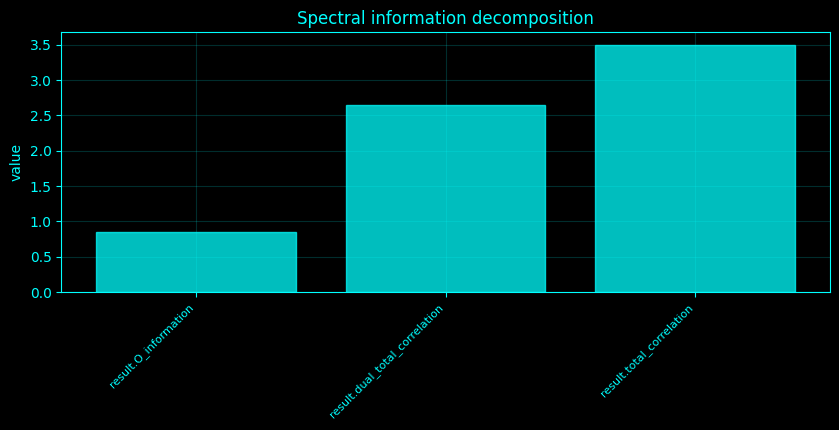

In [107]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _digitize_quantile(x, bins=5):
    q = np.unique(np.quantile(x, np.linspace(0, 1, bins + 1)))
    if len(q) <= 2:
        return np.zeros(len(x), int)
    return np.clip(np.digitize(x, q[1:-1]), 0, len(q) - 2)

def _entropy_disc(*arrs):
    A = np.column_stack(arrs)
    _, cnt = np.unique(A, axis=0, return_counts=True)
    p = cnt / cnt.sum()
    return float(-np.sum(p * np.log(p + EPS)))

def _info_features():
    if 'info' in SPEC_CACHE:
        return SPEC_CACHE['info']
    t, W = _window_bandpower()
    Z = np.log(W + EPS)
    SPEC_CACHE['info'] = (t, Z)
    return SPEC_CACHE['info']

# Method-specific calculation.
def _compute_method_273():
    idx = 273
    name = 'Spectral information decomposition'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, Z = _info_features()
    A = np.mean(Z, axis=2)
    q = [_digitize_quantile(A[:, k], 4) for k in range(min(C, 5))]
    H = lambda inds: _entropy_disc(*[q[k] for k in inds])
    n = len(q)
    Hall = H(list(range(n)))
    tc = sum((H([i]) for i in range(n))) - Hall
    dtc = sum((H([k for k in range(n) if k != i]) for i in range(n))) - (n - 1) * Hall
    return ({'total_correlation': float(tc), 'dual_total_correlation': float(dtc), 'O_information': float(tc - dtc)}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_273,_plot_spec=_compute_method_273()
print('Spectral information decomposition')
if isinstance(result_273,dict):
    for _k,_v in result_273.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_273)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_273)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral information decomposition',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral information decomposition',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral information decomposition',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">274. Bandpower covariance analysis</h3>
<p>Bandpower covariance is \(\Sigma_{ij}=\operatorname{Cov}(\log P_i,\log P_j)\) across analysis windows. Log power is used because spectral power is positive and typically right-skewed.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Bandpower covariance analysis
  trace: 5.037511721239445
  condition: 1251.8419511996588


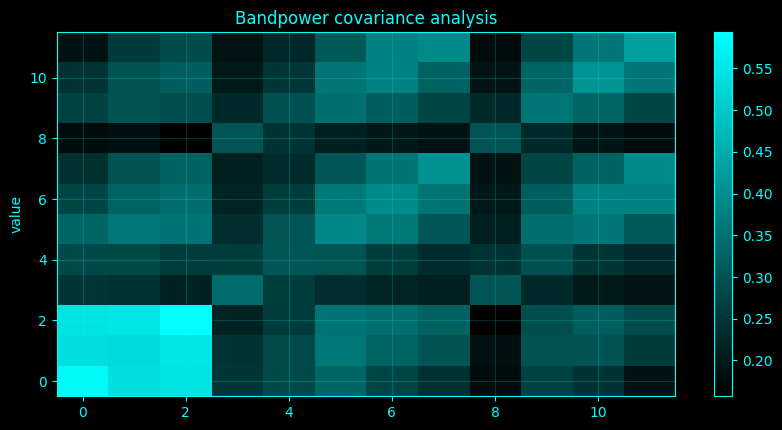

In [108]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

# Method-specific calculation.
def _compute_method_274():
    idx = 274
    name = 'Bandpower covariance analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, W = _window_bandpower()
    aidx = list(BANDS).index('alpha')
    A = np.log(W[:, :, aidx] + EPS)
    cov = np.cov(A, rowvar=False)
    corr = np.corrcoef(A, rowvar=False)
    prec = np.linalg.pinv(cov + 1e-06 * np.eye(C))
    pcorr = -prec / np.sqrt(np.outer(np.diag(prec), np.diag(prec)) + EPS)
    np.fill_diagonal(pcorr, 1)
    __plot_spec = ('summary', cov, name, None, '', 'value')
    return ({'trace': float(np.trace(cov)), 'condition': float(np.linalg.cond(cov + 1e-06 * np.eye(C)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_274,_plot_spec=_compute_method_274()
print('Bandpower covariance analysis')
if isinstance(result_274,dict):
    for _k,_v in result_274.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_274)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_274)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bandpower covariance analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bandpower covariance analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bandpower covariance analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">275. Bandpower correlation networks</h3>
<p>The bandpower correlation network uses Pearson correlation \(r_{ij}=\Sigma_{ij}/\sqrt{\Sigma_{ii}\Sigma_{jj}}\) between windowed log-bandpower trajectories.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [109]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

# Method-specific calculation.
def _compute_method_275():
    idx = 275
    name = 'Bandpower correlation networks'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, W = _window_bandpower()
    aidx = list(BANDS).index('alpha')
    A = np.log(W[:, :, aidx] + EPS)
    cov = np.cov(A, rowvar=False)
    corr = np.corrcoef(A, rowvar=False)
    prec = np.linalg.pinv(cov + 1e-06 * np.eye(C))
    pcorr = -prec / np.sqrt(np.outer(np.diag(prec), np.diag(prec)) + EPS)
    np.fill_diagonal(pcorr, 1)
    __plot_spec = ('summary', corr, name, None, '', 'value')
    return ({'mean_abs_corr': float(np.mean(np.abs(corr[np.triu_indices(C, 1)])))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_275,_plot_spec=_compute_method_275()
print('Bandpower correlation networks')
if isinstance(result_275,dict):
    for _k,_v in result_275.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_275)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_275)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bandpower correlation networks',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bandpower correlation networks',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bandpower correlation networks',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Bandpower correlation networks
  mean_abs_corr: 0.6945463371648507


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">276. Bandpower partial-correlation networks</h3>
<p>Partial correlation is derived from the precision matrix \(\Theta=\Sigma^{-1}\): \(\rho_{ij\cdot rest}=-\Theta_{ij}/\sqrt{\Theta_{ii}\Theta_{jj}}\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [110]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

# Method-specific calculation.
def _compute_method_276():
    idx = 276
    name = 'Bandpower partial-correlation networks'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, W = _window_bandpower()
    aidx = list(BANDS).index('alpha')
    A = np.log(W[:, :, aidx] + EPS)
    cov = np.cov(A, rowvar=False)
    corr = np.corrcoef(A, rowvar=False)
    prec = np.linalg.pinv(cov + 1e-06 * np.eye(C))
    pcorr = -prec / np.sqrt(np.outer(np.diag(prec), np.diag(prec)) + EPS)
    np.fill_diagonal(pcorr, 1)
    __plot_spec = ('summary', pcorr, name, None, '', 'value')
    return ({'mean_abs_partial': float(np.mean(np.abs(pcorr[np.triu_indices(C, 1)])))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_276,_plot_spec=_compute_method_276()
print('Bandpower partial-correlation networks')
if isinstance(result_276,dict):
    for _k,_v in result_276.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_276)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_276)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bandpower partial-correlation networks',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bandpower partial-correlation networks',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bandpower partial-correlation networks',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Bandpower partial-correlation networks
  mean_abs_partial: 0.23847803820053382


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">277. Bandpower precision matrices</h3>
<p>The precision matrix \(\Theta=\Sigma^{-1}\) parameterizes a Gaussian graphical model; nonzero off-diagonal entries correspond to conditional dependence under that model.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [111]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

# Method-specific calculation.
def _compute_method_277():
    idx = 277
    name = 'Bandpower precision matrices'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, W = _window_bandpower()
    aidx = list(BANDS).index('alpha')
    A = np.log(W[:, :, aidx] + EPS)
    cov = np.cov(A, rowvar=False)
    corr = np.corrcoef(A, rowvar=False)
    prec = np.linalg.pinv(cov + 1e-06 * np.eye(C))
    pcorr = -prec / np.sqrt(np.outer(np.diag(prec), np.diag(prec)) + EPS)
    np.fill_diagonal(pcorr, 1)
    __plot_spec = ('summary', prec, name, None, '', 'value')
    return ({'precision_fro': float(np.linalg.norm(prec))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_277,_plot_spec=_compute_method_277()
print('Bandpower precision matrices')
if isinstance(result_277,dict):
    for _k,_v in result_277.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_277)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_277)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bandpower precision matrices',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bandpower precision matrices',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bandpower precision matrices',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Bandpower precision matrices
  precision_fro: 447.0108093965615


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">278. Graphical-lasso bandpower networks</h3>
<p>Graphical lasso estimates a sparse precision matrix by minimizing \(\operatorname{tr}(S\Theta)-\log\det\Theta+\lambda\|\Theta\|_{1,\mathrm{off}}\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [112]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

# Method-specific calculation.
def _compute_method_278():
    idx = 278
    name = 'Graphical-lasso bandpower networks'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, W = _window_bandpower()
    aidx = list(BANDS).index('alpha')
    A = np.log(W[:, :, aidx] + EPS)
    cov = np.cov(A, rowvar=False)
    corr = np.corrcoef(A, rowvar=False)
    prec = np.linalg.pinv(cov + 1e-06 * np.eye(C))
    pcorr = -prec / np.sqrt(np.outer(np.diag(prec), np.diag(prec)) + EPS)
    np.fill_diagonal(pcorr, 1)
    alpha = max(0.001, 0.03 * np.mean(np.diag(cov)))
    try:
        mdl = GraphicalLasso(alpha=alpha, max_iter=300).fit(A)
        P = mdl.precision_
        nnz = int(np.sum(np.abs(P) > 1e-08) - C)
    except Exception:
        P = prec
        nnz = int(np.sum(np.abs(P) > np.quantile(np.abs(P[np.triu_indices(C, 1)]), 0.75)) * 2)
    __plot_spec = ('summary', P, name, None, '', 'value')
    return ({'offdiag_nonzero': nnz}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_278,_plot_spec=_compute_method_278()
print('Graphical-lasso bandpower networks')
if isinstance(result_278,dict):
    for _k,_v in result_278.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_278)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_278)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Graphical-lasso bandpower networks',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Graphical-lasso bandpower networks',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Graphical-lasso bandpower networks',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Graphical-lasso bandpower networks
  offdiag_nonzero: 68


/home/a/projects/Complete-Neural-Signal-Analysis/.conda-py310/lib/python3.10/site-packages/sklearn/covariance/_graph_lasso.py:192: ConvergenceWarning: graphical_lasso: did not converge after 300 iteration: dual gap: -6.273e-03
  warnings.warn(


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">279. Dynamic bandpower networks</h3>
<p>Dynamic bandpower networks recompute channel-channel correlation within successive blocks of spectral-power windows, producing a time-indexed adjacency sequence \(A(t)\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [113]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

# Method-specific calculation.
def _compute_method_279():
    idx = 279
    name = 'Dynamic bandpower networks'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, W = _window_bandpower()
    aidx = list(BANDS).index('alpha')
    A = np.log(W[:, :, aidx] + EPS)
    cov = np.cov(A, rowvar=False)
    corr = np.corrcoef(A, rowvar=False)
    prec = np.linalg.pinv(cov + 1e-06 * np.eye(C))
    pcorr = -prec / np.sqrt(np.outer(np.diag(prec), np.diag(prec)) + EPS)
    np.fill_diagonal(pcorr, 1)
    block = max(6, len(A) // 6)
    mats = []
    for s in range(0, len(A) - block + 1, max(1, block // 2)):
        mats.append(np.corrcoef(A[s:s + block], rowvar=False))
    strength = np.array([np.nanmean(np.abs(m - np.eye(C)), axis=1) for m in mats])
    __plot_spec = ('summary', strength.T, name, None, '', 'value')
    return ({'n_dynamic_networks': len(mats)}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_279,_plot_spec=_compute_method_279()
print('Dynamic bandpower networks')
if isinstance(result_279,dict):
    for _k,_v in result_279.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_279)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_279)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Dynamic bandpower networks',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Dynamic bandpower networks',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Dynamic bandpower networks',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Dynamic bandpower networks
  n_dynamic_networks: 11


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">280. Bandpower community detection</h3>
<p>Community detection partitions the weighted bandpower network into groups with stronger within-community than between-community connectivity; modularity is optimized on the thresholded correlation graph.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Bandpower community detection
  communities: 4
  sizes: array(4,), mean=3


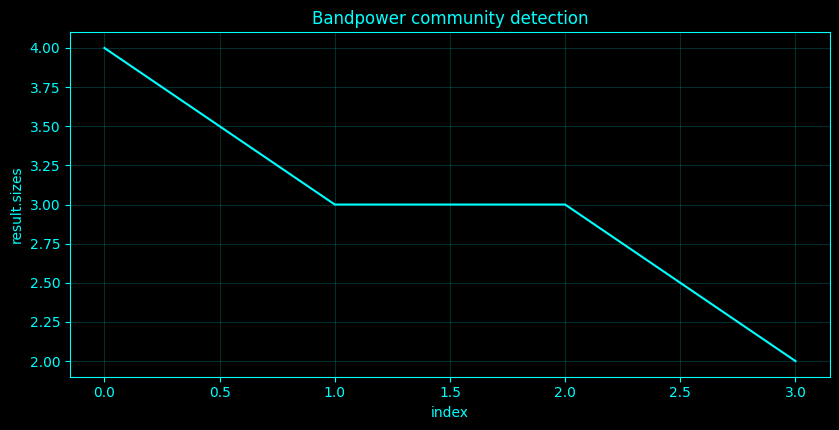

In [114]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _graph_from_matrix(M, quant=0.75):
    A = np.array(M, float, copy=True)
    np.fill_diagonal(A, 0)
    vals = A[np.triu_indices_from(A, 1)]
    th = np.nanquantile(vals, quant) if len(vals) else 0
    G = nx.Graph()
    G.add_nodes_from(range(len(A)))
    for i in range(len(A)):
        for j in range(i + 1, len(A)):
            if np.isfinite(A[i, j]) and A[i, j] >= th:
                G.add_edge(i, j, weight=float(A[i, j]), length=float(1 / (A[i, j] + EPS)))
    return G

# Method-specific calculation.
def _compute_method_280():
    idx = 280
    name = 'Bandpower community detection'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, W = _window_bandpower()
    aidx = list(BANDS).index('alpha')
    A = np.log(W[:, :, aidx] + EPS)
    cov = np.cov(A, rowvar=False)
    corr = np.corrcoef(A, rowvar=False)
    prec = np.linalg.pinv(cov + 1e-06 * np.eye(C))
    pcorr = -prec / np.sqrt(np.outer(np.diag(prec), np.diag(prec)) + EPS)
    np.fill_diagonal(pcorr, 1)
    G = _graph_from_matrix(np.abs(corr), 0.75)
    comm = list(nx.algorithms.community.greedy_modularity_communities(G, weight='weight')) if G.number_of_edges() else []
    return ({'communities': len(comm), 'sizes': [len(x) for x in comm]}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_280,_plot_spec=_compute_method_280()
print('Bandpower community detection')
if isinstance(result_280,dict):
    for _k,_v in result_280.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_280)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_280)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bandpower community detection',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bandpower community detection',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bandpower community detection',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">281. Bandpower graph spectra</h3>
<p>For weighted adjacency \(W\), the graph Laplacian is \(L=D-W\). Its eigenvalues summarize connectedness and graph-scale structure; \(\lambda_2\) is algebraic connectivity for a connected undirected graph.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [115]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

# Method-specific calculation.
def _compute_method_281():
    idx = 281
    name = 'Bandpower graph spectra'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, W = _window_bandpower()
    aidx = list(BANDS).index('alpha')
    A = np.log(W[:, :, aidx] + EPS)
    cov = np.cov(A, rowvar=False)
    corr = np.corrcoef(A, rowvar=False)
    prec = np.linalg.pinv(cov + 1e-06 * np.eye(C))
    pcorr = -prec / np.sqrt(np.outer(np.diag(prec), np.diag(prec)) + EPS)
    np.fill_diagonal(pcorr, 1)
    M = np.abs(corr)
    np.fill_diagonal(M, 0)
    D = np.diag(M.sum(1))
    lam = np.linalg.eigvalsh(D - M)
    __plot_spec = ('summary', lam, name, np.arange(C), 'index', 'Laplacian eigenvalue')
    return ({'algebraic_connectivity': float(lam[1]) if C > 1 else 0}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_281,_plot_spec=_compute_method_281()
print('Bandpower graph spectra')
if isinstance(result_281,dict):
    for _k,_v in result_281.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_281)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_281)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bandpower graph spectra',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bandpower graph spectra',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bandpower graph spectra',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Bandpower graph spectra
  algebraic_connectivity: 6.627302254191035


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">282. Bandpower hubness</h3>
<p>Bandpower hubness is weighted degree (strength), \(s_i=\sum_j|r_{ij}|\), on the bandpower-correlation network.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [116]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

# Method-specific calculation.
def _compute_method_282():
    idx = 282
    name = 'Bandpower hubness'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, W = _window_bandpower()
    aidx = list(BANDS).index('alpha')
    A = np.log(W[:, :, aidx] + EPS)
    cov = np.cov(A, rowvar=False)
    corr = np.corrcoef(A, rowvar=False)
    prec = np.linalg.pinv(cov + 1e-06 * np.eye(C))
    pcorr = -prec / np.sqrt(np.outer(np.diag(prec), np.diag(prec)) + EPS)
    np.fill_diagonal(pcorr, 1)
    M = np.abs(corr)
    np.fill_diagonal(M, 0)
    strength = M.sum(1)
    __plot_spec = ('summary', strength, name, None, '', 'value')
    return ({'hub': CH_NAMES[int(np.argmax(strength))]}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_282,_plot_spec=_compute_method_282()
print('Bandpower hubness')
if isinstance(result_282,dict):
    for _k,_v in result_282.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_282)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_282)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bandpower hubness',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bandpower hubness',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bandpower hubness',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Bandpower hubness
  hub: Fz


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">283. Bandpower left-right asymmetry</h3>
<p>Left-right bandpower asymmetry uses paired homologous channels and log ratios, \(A_{L,R}=\log P_L-\log P_R=\log(P_L/P_R)\), so equal proportional changes cancel naturally.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [117]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

# Method-specific calculation.
def _compute_method_283():
    idx = 283
    name = 'Bandpower left-right asymmetry'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, W = _window_bandpower()
    aidx = list(BANDS).index('alpha')
    A = np.log(W[:, :, aidx] + EPS)
    cov = np.cov(A, rowvar=False)
    corr = np.corrcoef(A, rowvar=False)
    prec = np.linalg.pinv(cov + 1e-06 * np.eye(C))
    pcorr = -prec / np.sqrt(np.outer(np.diag(prec), np.diag(prec)) + EPS)
    np.fill_diagonal(pcorr, 1)
    _, BP = _bandpower_matrix()
    alpha = BP[:, aidx]
    vals = np.zeros(C)
    pairs = [('Fp1', 'Fp2'), ('F3', 'F4'), ('C3', 'C4'), ('P3', 'P4'), ('O1', 'O2')]
    for l, r in pairs:
        if l in CH_NAMES and r in CH_NAMES:
            il, ir = (CH_NAMES.index(l), CH_NAMES.index(r))
            d = np.log(alpha[il] + EPS) - np.log(alpha[ir] + EPS)
            vals[il] = d
            vals[ir] = -d
    __plot_spec = ('scalp', vals, name, None, '', 'value')
    return ({'mean_abs_log_asymmetry': float(np.mean(np.abs(vals)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_283,_plot_spec=_compute_method_283()
print('Bandpower left-right asymmetry')
if isinstance(result_283,dict):
    for _k,_v in result_283.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_283)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_283)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bandpower left-right asymmetry',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bandpower left-right asymmetry',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bandpower left-right asymmetry',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Bandpower left-right asymmetry
  mean_abs_log_asymmetry: 0.12009999608412707


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">284. Bandpower regional gradients</h3>
<p>A regional bandpower gradient is the least-squares slope of log bandpower versus electrode coordinate; it is a finite sensor-space spatial trend, not a cortical gradient.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [118]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

# Method-specific calculation.
def _compute_method_284():
    idx = 284
    name = 'Bandpower regional gradients'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, W = _window_bandpower()
    aidx = list(BANDS).index('alpha')
    A = np.log(W[:, :, aidx] + EPS)
    cov = np.cov(A, rowvar=False)
    corr = np.corrcoef(A, rowvar=False)
    prec = np.linalg.pinv(cov + 1e-06 * np.eye(C))
    pcorr = -prec / np.sqrt(np.outer(np.diag(prec), np.diag(prec)) + EPS)
    np.fill_diagonal(pcorr, 1)
    _, BP = _bandpower_matrix()
    y = np.array([ELECTRODE_XY.get(ch, (0, 0))[1] for ch in CH_NAMES])
    z = np.log(BP[:, aidx] + EPS)
    slope = np.polyfit(y, z, 1)[0]
    __plot_spec = ('scalp', z, name, None, '', 'value')
    return ({'posterior_to_anterior_slope': float(slope)}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_284,_plot_spec=_compute_method_284()
print('Bandpower regional gradients')
if isinstance(result_284,dict):
    for _k,_v in result_284.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_284)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_284)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bandpower regional gradients',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bandpower regional gradients',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bandpower regional gradients',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Bandpower regional gradients
  posterior_to_anterior_slope: -1.8205246927576322


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">285. Bandpower topographic interpolation</h3>
<p>Topographic interpolation estimates a smooth sensor-space field from irregular electrode samples. The displayed values remain sensor-level bandpower; interpolation does not create independent observations.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [119]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

# Method-specific calculation.
def _compute_method_285():
    idx = 285
    name = 'Bandpower topographic interpolation'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    t, W = _window_bandpower()
    aidx = list(BANDS).index('alpha')
    A = np.log(W[:, :, aidx] + EPS)
    cov = np.cov(A, rowvar=False)
    corr = np.corrcoef(A, rowvar=False)
    prec = np.linalg.pinv(cov + 1e-06 * np.eye(C))
    pcorr = -prec / np.sqrt(np.outer(np.diag(prec), np.diag(prec)) + EPS)
    np.fill_diagonal(pcorr, 1)
    _, BP = _bandpower_matrix()
    vals = np.log(BP[:, aidx] + EPS)
    xy = np.array([ELECTRODE_XY[ch] for ch in CH_NAMES])
    gx, gy = np.mgrid[-1.1:1.1:80j, -1.1:1.1:80j]
    from scipy.interpolate import griddata
    zi = griddata(xy, vals, (gx, gy), method='linear')
    __plot_spec = ('summary', zi.T, name, None, '', 'value')
    return ({'grid_finite_fraction': float(np.mean(np.isfinite(zi)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_285,_plot_spec=_compute_method_285()
print('Bandpower topographic interpolation')
if isinstance(result_285,dict):
    for _k,_v in result_285.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_285)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_285)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bandpower topographic interpolation',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bandpower topographic interpolation',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bandpower topographic interpolation',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Bandpower topographic interpolation
  grid_finite_fraction: 0.23125


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">286. Source-space spectral analysis</h3>
<p>Source-space spectra require a forward model and inverse operator \(W\), giving estimated source activity \(\hat s(t)=Wx(t)\). Because sensor EEG alone does not identify \(W\), this cell only executes source spectra when `SPECTRAL_INVERSE_OPERATOR` is supplied.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [120]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_286():
    idx = 286
    name = 'Source-space spectral analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    W = globals().get('SPECTRAL_INVERSE_OPERATOR', None)
    if W is None:
        return ({'status': 'requires SPECTRAL_INVERSE_OPERATOR', 'reason': 'sensor EEG alone does not identify cortical source spectra'}, locals().get('__plot_spec', None))
    W = np.asarray(W)
    Y = X @ W.T
    fs, Ps = _psd_of(Y)
    __plot_spec = ('summary', 10 * np.log10(Ps + EPS), name, fs, 'Hz', 'dB')
    return ({'sources': Y.shape[1]}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_286,_plot_spec=_compute_method_286()
print('Source-space spectral analysis')
if isinstance(result_286,dict):
    for _k,_v in result_286.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_286)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_286)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Source-space spectral analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Source-space spectral analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Source-space spectral analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Source-space spectral analysis
  status: requires SPECTRAL_INVERSE_OPERATOR
  reason: sensor EEG alone does not identify cortical source spectra


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">287. Surface Laplacian spectral analysis</h3>
<p>A discrete surface Laplacian uses an electrode-neighbour graph \(L=D-W\). Applying \(LX(t)\) approximates spatial second derivatives; current-source-density convention differs by sign/physical scaling. Without a spherical head model this is explicitly a graph-Laplacian sensor-space approximation.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [121]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _finite_diff_laplacian_matrix():
    xy = np.array([ELECTRODE_XY.get(ch, (np.nan, np.nan)) for ch in CH_NAMES], float)
    d = squareform(pdist(xy))
    k = min(max(3, _SPEED['graph_k']), max(C - 1, 1))
    W = np.zeros((C, C))
    for i in range(C):
        jj = np.argsort(d[i])[1:k + 1]
        sig = np.median(d[i, jj]) + EPS
        W[i, jj] = np.exp(-d[i, jj] ** 2 / (2 * sig ** 2))
    W = np.maximum(W, W.T)
    D = np.diag(W.sum(1))
    return D - W

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_287():
    idx = 287
    name = 'Surface Laplacian spectral analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    L = _finite_diff_laplacian_matrix()
    Y = -(X @ L.T) if idx == 288 else X @ L.T
    fs, Ps = _psd_of(Y)
    alpha = _band_integral(Ps, fs, BANDS['alpha'])
    __plot_spec = ('scalp', np.log(alpha + EPS), name, None, '', 'value')
    return ({'operator_norm': float(np.linalg.norm(L))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_287,_plot_spec=_compute_method_287()
print('Surface Laplacian spectral analysis')
if isinstance(result_287,dict):
    for _k,_v in result_287.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_287)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_287)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Surface Laplacian spectral analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Surface Laplacian spectral analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Surface Laplacian spectral analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Surface Laplacian spectral analysis
  operator_norm: 13.27586604754654


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">288. Current source density spectral analysis</h3>
<p>A discrete surface Laplacian uses an electrode-neighbour graph \(L=D-W\). Applying \(LX(t)\) approximates spatial second derivatives; current-source-density convention differs by sign/physical scaling. Without a spherical head model this is explicitly a graph-Laplacian sensor-space approximation.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [122]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _finite_diff_laplacian_matrix():
    xy = np.array([ELECTRODE_XY.get(ch, (np.nan, np.nan)) for ch in CH_NAMES], float)
    d = squareform(pdist(xy))
    k = min(max(3, _SPEED['graph_k']), max(C - 1, 1))
    W = np.zeros((C, C))
    for i in range(C):
        jj = np.argsort(d[i])[1:k + 1]
        sig = np.median(d[i, jj]) + EPS
        W[i, jj] = np.exp(-d[i, jj] ** 2 / (2 * sig ** 2))
    W = np.maximum(W, W.T)
    D = np.diag(W.sum(1))
    return D - W

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_288():
    idx = 288
    name = 'Current source density spectral analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    L = _finite_diff_laplacian_matrix()
    Y = -(X @ L.T) if idx == 288 else X @ L.T
    fs, Ps = _psd_of(Y)
    alpha = _band_integral(Ps, fs, BANDS['alpha'])
    __plot_spec = ('scalp', np.log(alpha + EPS), name, None, '', 'value')
    return ({'operator_norm': float(np.linalg.norm(L))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_288,_plot_spec=_compute_method_288()
print('Current source density spectral analysis')
if isinstance(result_288,dict):
    for _k,_v in result_288.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_288)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_288)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Current source density spectral analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Current source density spectral analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Current source density spectral analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Current source density spectral analysis
  operator_norm: 13.27586604754654


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">289. Bipolar montage spectral comparison</h3>
<p>A bipolar montage replaces potentials by pair differences \(y_{ab}(t)=x_a(t)-x_b(t)\). Its PSD follows from the linear combination and therefore changes both signal and reference sensitivity.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [123]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_289():
    idx = 289
    name = 'Bipolar montage spectral comparison'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    pairs = [('Fp1', 'Fp2'), ('F3', 'F4'), ('C3', 'C4'), ('P3', 'P4'), ('O1', 'O2')]
    ys = []
    labels = []
    for a, b in pairs:
        if a in CH_NAMES and b in CH_NAMES:
            ys.append(X[:, CH_NAMES.index(a)] - X[:, CH_NAMES.index(b)])
            labels.append(f'{a}-{b}')
    if not ys:
        return ({'status': 'no named bipolar pairs available'}, locals().get('__plot_spec', None))
    Y = np.column_stack(ys)
    fs, Ps = _psd_of(Y)
    __plot_spec = ('summary', 10 * np.log10(Ps + EPS), name, fs, 'Hz', 'dB')
    return ({'n_bipolar_pairs': len(labels)}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_289,_plot_spec=_compute_method_289()
print('Bipolar montage spectral comparison')
if isinstance(result_289,dict):
    for _k,_v in result_289.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_289)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_289)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bipolar montage spectral comparison',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bipolar montage spectral comparison',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bipolar montage spectral comparison',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Bipolar montage spectral comparison
  n_bipolar_pairs: 2


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">290. Common-average-reference spectral comparison</h3>
<p>Common-average reference subtracts the instantaneous channel mean, \(x_i^{CAR}(t)=x_i(t)-C^{-1}\sum_jx_j(t)\). The cell compares PSDs before and after this linear rereferencing.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [124]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_290():
    idx = 290
    name = 'Common-average-reference spectral comparison'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    Y = X - X.mean(1, keepdims=True)
    fs, Pc = _psd_of(Y)
    diff = np.mean(np.abs(np.log(Pc + EPS) - np.log(P + EPS)))
    return ({'mean_abs_log_psd_change': float(diff)}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_290,_plot_spec=_compute_method_290()
print('Common-average-reference spectral comparison')
if isinstance(result_290,dict):
    for _k,_v in result_290.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_290)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_290)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Common-average-reference spectral comparison',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Common-average-reference spectral comparison',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Common-average-reference spectral comparison',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Common-average-reference spectral comparison
  mean_abs_log_psd_change: 0.7470395130780733


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">291. Reference-sensitivity spectral audit</h3>
<p>Reference/montage sensitivity is quantified by recomputing the same spectral statistic after a valid rereferencing transform and comparing the result. This is a robustness audit, not evidence that one montage is physiologically correct.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [125]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_291():
    idx = 291
    name = 'Reference-sensitivity spectral audit'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    Y = X - X.mean(1, keepdims=True)
    fs, Pc = _psd_of(Y)
    _, B0 = _bandpower_matrix()
    Bc = np.vstack([_band_integral(Pc, fs, b) for b in BANDS.values()]).T
    r = np.corrcoef(np.log(B0.ravel() + EPS), np.log(Bc.ravel() + EPS))[0, 1]
    return ({'raw_vs_CAR_bandpower_correlation': float(r)}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_291,_plot_spec=_compute_method_291()
print('Reference-sensitivity spectral audit')
if isinstance(result_291,dict):
    for _k,_v in result_291.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_291)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_291)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Reference-sensitivity spectral audit',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Reference-sensitivity spectral audit',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Reference-sensitivity spectral audit',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Reference-sensitivity spectral audit
  raw_vs_CAR_bandpower_correlation: 0.7161222215367132


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">292. Montage-sensitivity spectral audit</h3>
<p>Reference/montage sensitivity is quantified by recomputing the same spectral statistic after a valid rereferencing transform and comparing the result. This is a robustness audit, not evidence that one montage is physiologically correct.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Montage-sensitivity spectral audit
  raw_alpha: 0.005635012515077683
  CAR_alpha: 0.0018699908905626848
  ratio: 0.3318521272538919


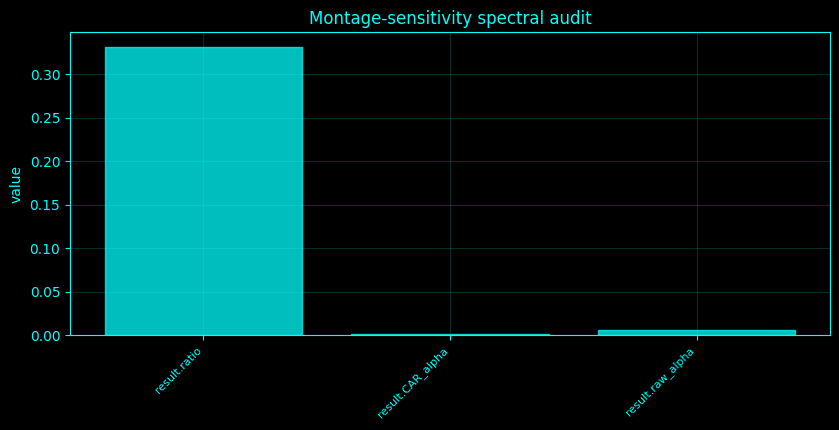

In [126]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_292():
    idx = 292
    name = 'Montage-sensitivity spectral audit'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    Y = X - X.mean(1, keepdims=True)
    fs, Pc = _psd_of(Y)
    raw = np.mean(_band_integral(P, f, BANDS['alpha']))
    car = np.mean(_band_integral(Pc, fs, BANDS['alpha']))
    return ({'raw_alpha': float(raw), 'CAR_alpha': float(car), 'ratio': float(car / (raw + EPS))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_292,_plot_spec=_compute_method_292()
print('Montage-sensitivity spectral audit')
if isinstance(result_292,dict):
    for _k,_v in result_292.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_292)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_292)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Montage-sensitivity spectral audit',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Montage-sensitivity spectral audit',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Montage-sensitivity spectral audit',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">293. Artifact-sensitive spectral audit</h3>
<p>Artifact sensitivity compares spectra before and after excluding the highest-amplitude multichannel samples. The resulting difference estimates dependence on extreme transients; it is not a substitute for artifact classification.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Artifact-sensitive spectral audit
  retained_fraction: 0.9499551166965888
  alpha_change_fraction: -0.0496052761394366


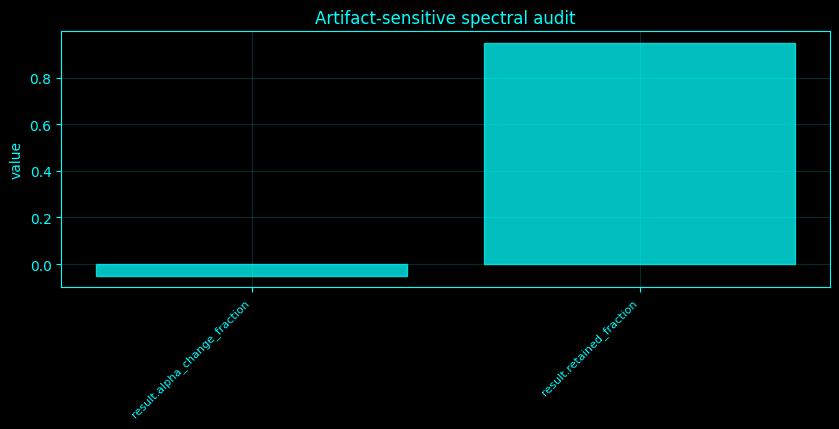

In [127]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_293():
    idx = 293
    name = 'Artifact-sensitive spectral audit'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    amp = np.max(np.abs(X), axis=1)
    mask = amp < np.quantile(amp, 0.95)
    fs, Pclean = _psd_of(X[mask])
    a0 = np.mean(_band_integral(P, f, BANDS['alpha']))
    a1 = np.mean(_band_integral(Pclean, fs, BANDS['alpha']))
    return ({'retained_fraction': float(mask.mean()), 'alpha_change_fraction': float((a1 - a0) / (a0 + EPS))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_293,_plot_spec=_compute_method_293()
print('Artifact-sensitive spectral audit')
if isinstance(result_293,dict):
    for _k,_v in result_293.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_293)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_293)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Artifact-sensitive spectral audit',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Artifact-sensitive spectral audit',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Artifact-sensitive spectral audit',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">294. Line-noise sensitivity audit</h3>
<p>Line-noise sensitivity is the ratio of power in a narrow 50/60-Hz line band to nearby background power, provided the line frequency lies below Nyquist.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Line-noise sensitivity audit
  line_hz: 50.0
  line_to_local_background: 0.5920108409707213


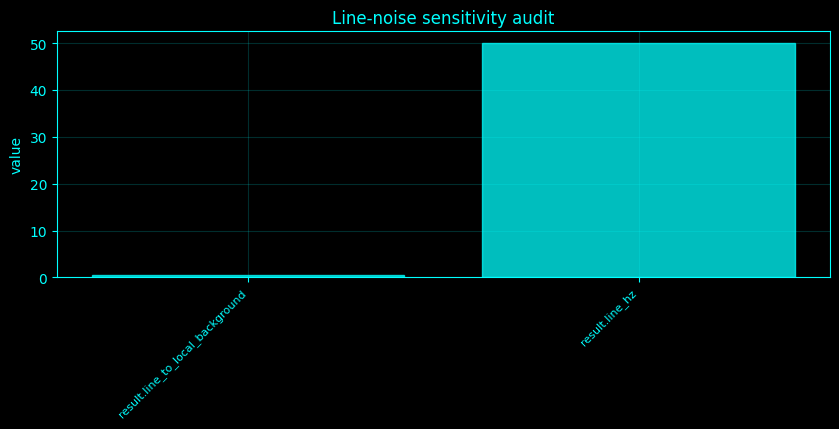

In [128]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

# Method-specific calculation.
def _compute_method_294():
    idx = 294
    name = 'Line-noise sensitivity audit'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    target = 60.0 if _fs > 125 else 50.0
    if target >= 0.49 * _fs:
        return ({'status': 'line frequency above analysis Nyquist'}, locals().get('__plot_spec', None))
    bw = (target - 1, target + 1)
    lp = np.mean(_band_integral(P, f, bw))
    bg = np.mean(_band_integral(P, f, (target - 5, target - 2)) + _band_integral(P, f, (target + 2, target + 5))) / 2
    return ({'line_hz': target, 'line_to_local_background': float(lp / (bg + EPS))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_294,_plot_spec=_compute_method_294()
print('Line-noise sensitivity audit')
if isinstance(result_294,dict):
    for _k,_v in result_294.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_294)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_294)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Line-noise sensitivity audit',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Line-noise sensitivity audit',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Line-noise sensitivity audit',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">295. Notch-filter sensitivity analysis</h3>
<p>Notch sensitivity applies a second-order IIR notch centered at the local line frequency and reports attenuation of narrowband line power.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [129]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_295():
    idx = 295
    name = 'Notch-filter sensitivity analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    target = 60.0 if _fs > 125 else 50.0
    if target >= 0.49 * _fs:
        return ({'status': 'notch target above Nyquist'}, locals().get('__plot_spec', None))
    b, a = signal.iirnotch(target, Q=30, fs=_fs)
    Y = signal.filtfilt(b, a, X, axis=0)
    fs, Pn = _psd_of(Y)
    before = np.mean(_band_integral(P, f, (target - 1, target + 1)))
    after = np.mean(_band_integral(Pn, fs, (target - 1, target + 1)))
    return ({'suppression_db': float(10 * np.log10((before + EPS) / (after + EPS)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_295,_plot_spec=_compute_method_295()
print('Notch-filter sensitivity analysis')
if isinstance(result_295,dict):
    for _k,_v in result_295.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_295)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_295)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Notch-filter sensitivity analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Notch-filter sensitivity analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Notch-filter sensitivity analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Notch-filter sensitivity analysis
  suppression_db: 10.063455669502186


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">296. Bandpass sensitivity analysis</h3>
<p>Bandpass sensitivity applies the same PSD estimator after a fixed 1–45-Hz Butterworth bandpass and compares retained spectral power.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [130]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_296():
    idx = 296
    name = 'Bandpass sensitivity analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    hi = min(45, 0.45 * _fs)
    sos = signal.butter(4, [1 / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    Y = signal.sosfiltfilt(sos, X, axis=0)
    fs, Pb = _psd_of(Y)
    return ({'passband_total_power': float(np.trapz(np.mean(Pb, axis=1), fs))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_296,_plot_spec=_compute_method_296()
print('Bandpass sensitivity analysis')
if isinstance(result_296,dict):
    for _k,_v in result_296.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_296)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_296)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bandpass sensitivity analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bandpass sensitivity analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bandpass sensitivity analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Bandpass sensitivity analysis
  passband_total_power: 0.0983175706925159


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">297. Window-length sensitivity analysis</h3>
<p>Welch window length controls the bias-resolution tradeoff: frequency-bin spacing is approximately \(\Delta f=f_s/N_{seg}\), while more shorter segments reduce variance.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Window-length sensitivity analysis
  1s_alpha: 0.005078739904627932
  2s_alpha: 0.0053855921794403174
  4s_alpha: 0.005531570051113855


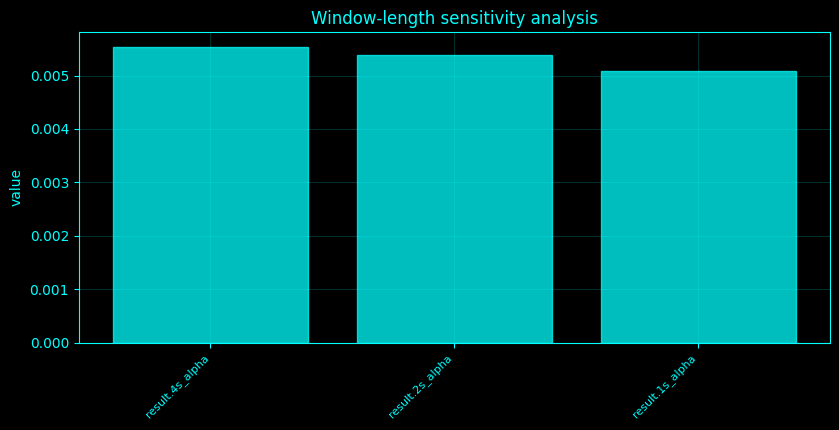

In [131]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_297():
    idx = 297
    name = 'Window-length sensitivity analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    vals = {}
    for sec in (1, 2, 4):
        n = min(N, max(32, int(sec * _fs)))
        ff, pp = _psd_of(X, nperseg=n)
        vals[f'{sec}s_alpha'] = float(np.mean(_band_integral(pp, ff, BANDS['alpha'])))
    return (vals, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_297,_plot_spec=_compute_method_297()
print('Window-length sensitivity analysis')
if isinstance(result_297,dict):
    for _k,_v in result_297.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_297)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_297)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Window-length sensitivity analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Window-length sensitivity analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Window-length sensitivity analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">298. Overlap sensitivity analysis</h3>
<p>Welch overlap changes how many tapered segments contribute to the average. Greater overlap increases reuse of samples; adjacent estimates are therefore not independent.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Overlap sensitivity analysis
  overlap_0.00: 0.006068074896601139
  overlap_0.50: 0.005635012515077683
  overlap_0.75: 0.005634377671322479


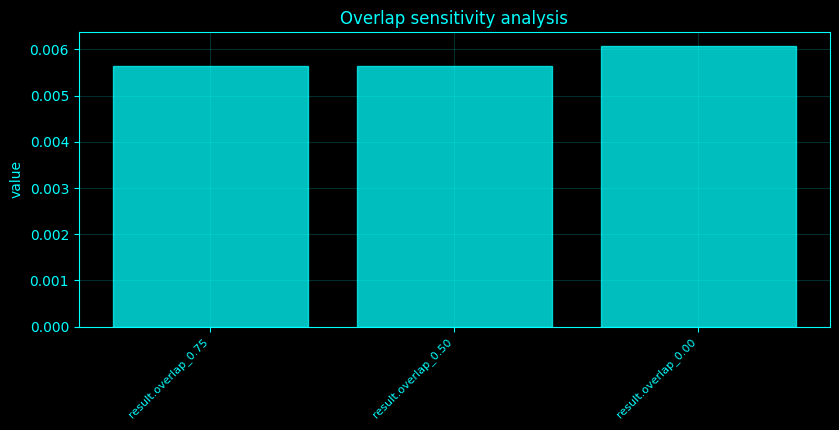

In [132]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

# Method-specific calculation.
def _compute_method_298():
    idx = 298
    name = 'Overlap sensitivity analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    n = min(int(_SPEED['nperseg']), N)
    vals = {}
    for ov in (0, 0.5, 0.75):
        ff, pp = signal.welch(X, fs=_fs, axis=0, nperseg=n, noverlap=min(n - 1, int(ov * n)))
        vals[f'overlap_{ov:.2f}'] = float(np.mean(_band_integral(pp, ff, BANDS['alpha'])))
    return (vals, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_298,_plot_spec=_compute_method_298()
print('Overlap sensitivity analysis')
if isinstance(result_298,dict):
    for _k,_v in result_298.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_298)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_298)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Overlap sensitivity analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Overlap sensitivity analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Overlap sensitivity analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">299. NFFT sensitivity analysis</h3>
<p>Zero-padding changes the sampled frequency grid, \(\Delta f=f_s/N_{FFT}\), but does not improve the intrinsic resolving power set by the data window.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

NFFT sensitivity analysis
  nfft_x1_df: 0.244140625
  nfft_x2_df: 0.1220703125
  nfft_x4_df: 0.06103515625


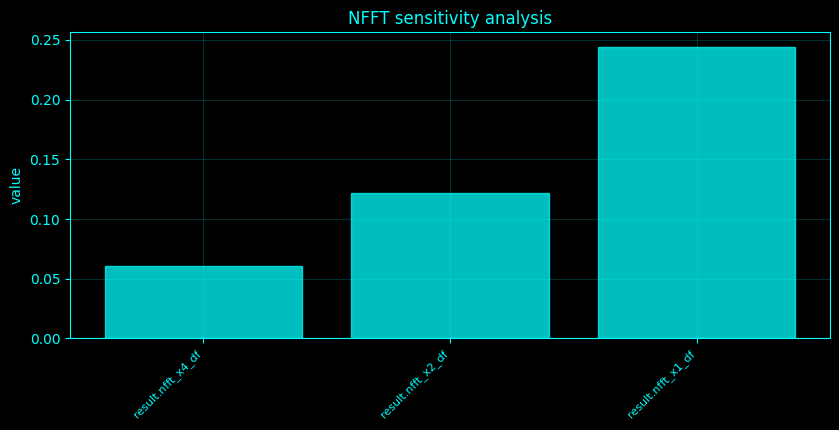

In [133]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

# Method-specific calculation.
def _compute_method_299():
    idx = 299
    name = 'NFFT sensitivity analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    n = min(int(_SPEED['nperseg']), N)
    vals = {}
    for mult in (1, 2, 4):
        ff, pp = signal.welch(X, fs=_fs, axis=0, nperseg=n, noverlap=n // 2, nfft=max(n, n * mult))
        vals[f'nfft_x{mult}_df'] = float(ff[1] - ff[0])
    return (vals, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_299,_plot_spec=_compute_method_299()
print('NFFT sensitivity analysis')
if isinstance(result_299,dict):
    for _k,_v in result_299.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_299)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_299)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'NFFT sensitivity analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'NFFT sensitivity analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('NFFT sensitivity analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">300. Detrending sensitivity analysis</h3>
<p>Detrending removes fitted low-order components before spectral estimation. Constant detrending subtracts the mean; linear detrending removes the least-squares line.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Detrending sensitivity analysis
  constant: 0.005635012515077683
  linear: 0.005635012661976129
  False: 0.005635012515077683


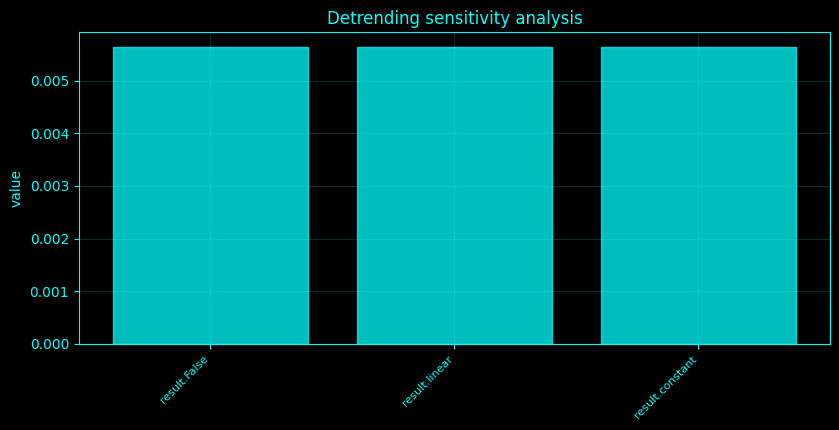

In [134]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_300():
    idx = 300
    name = 'Detrending sensitivity analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    vals = {}
    for d in ('constant', 'linear', False):
        ff, pp = _psd_of(X, detrend=d)
        vals[str(d)] = float(np.mean(_band_integral(pp, ff, BANDS['alpha'])))
    return (vals, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_300,_plot_spec=_compute_method_300()
print('Detrending sensitivity analysis')
if isinstance(result_300,dict):
    for _k,_v in result_300.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_300)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_300)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Detrending sensitivity analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Detrending sensitivity analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Detrending sensitivity analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">301. Taper sensitivity analysis</h3>
<p>Tapers trade main-lobe width against side-lobe leakage. Hann, Hamming, and Blackman windows therefore give different leakage and resolution properties even with identical segment length.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Taper sensitivity analysis
  hann: 0.005635012515077683
  hamming: 0.005841592145849623
  blackman: 0.005636003862359636


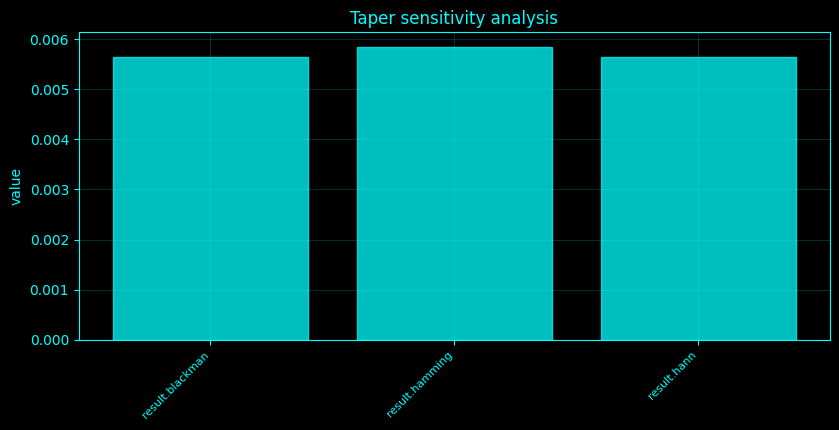

In [135]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_301():
    idx = 301
    name = 'Taper sensitivity analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    vals = {}
    for w in ('hann', 'hamming', 'blackman'):
        ff, pp = _psd_of(X, window=w)
        vals[w] = float(np.mean(_band_integral(pp, ff, BANDS['alpha'])))
    return (vals, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_301,_plot_spec=_compute_method_301()
print('Taper sensitivity analysis')
if isinstance(result_301,dict):
    for _k,_v in result_301.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_301)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_301)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Taper sensitivity analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Taper sensitivity analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Taper sensitivity analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">302. Downsampling sensitivity analysis</h3>
<p>Downsampling is valid only after antialias filtering and with the new sampling rate used in all frequency formulas. `resample_poly` performs the antialias filtering before decimation.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [136]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_302():
    idx = 302
    name = 'Downsampling sensitivity analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    fs2 = _fs / 2
    Y = signal.resample_poly(X, 1, 2, axis=0)
    f2, p2 = _psd_of(Y, fs=fs2)
    a0 = np.mean(_band_integral(P, f, BANDS['alpha']))
    a2 = np.mean(_band_integral(p2, f2, BANDS['alpha']))
    return ({'alpha_power_ratio_downsampled_to_original': float(a2 / (a0 + EPS))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_302,_plot_spec=_compute_method_302()
print('Downsampling sensitivity analysis')
if isinstance(result_302,dict):
    for _k,_v in result_302.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_302)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_302)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Downsampling sensitivity analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Downsampling sensitivity analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Downsampling sensitivity analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Downsampling sensitivity analysis
  alpha_power_ratio_downsampled_to_original: 0.9803991084155035


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">303. Segment-length robustness analysis</h3>
<p>Segment-length robustness recomputes the same bandpower statistic using progressively longer prefixes of the EEG segment to reveal finite-record dependence.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Segment-length robustness analysis
  0.25: 0.005329241727234449
  0.5: 0.00572953998170841
  1.0: 0.005635012515077683


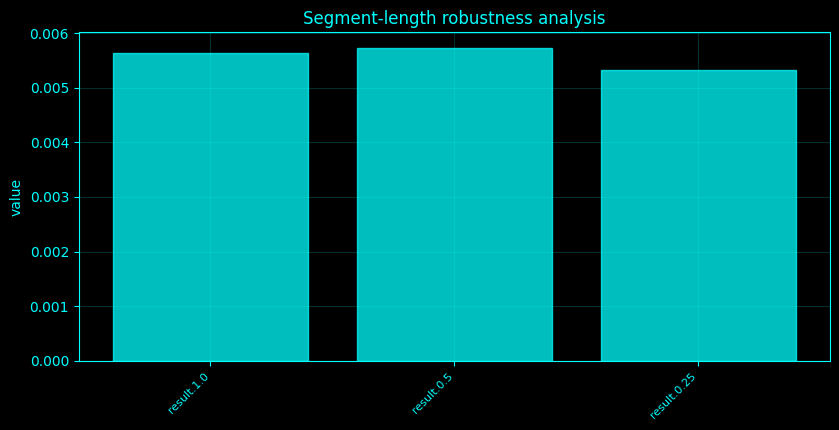

In [137]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_303():
    idx = 303
    name = 'Segment-length robustness analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    vals = {}
    for frac in (0.25, 0.5, 1.0):
        nn = max(64, int(N * frac))
        ff, pp = _psd_of(X[:nn])
        vals[str(frac)] = float(np.mean(_band_integral(pp, ff, BANDS['alpha'])))
    return (vals, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_303,_plot_spec=_compute_method_303()
print('Segment-length robustness analysis')
if isinstance(result_303,dict):
    for _k,_v in result_303.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_303)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_303)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Segment-length robustness analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Segment-length robustness analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Segment-length robustness analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">304. Frequency-resolution robustness analysis</h3>
<p>Frequency resolution is the Fourier-grid spacing \(\Delta f=f_s/N_{FFT}\); when \(N_{FFT}=N_{seg}\), longer Welch segments produce finer nominal frequency spacing.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Frequency-resolution robustness analysis
  128: 0.9765625
  256: 0.48828125
  512: 0.244140625
  1024: 0.1220703125


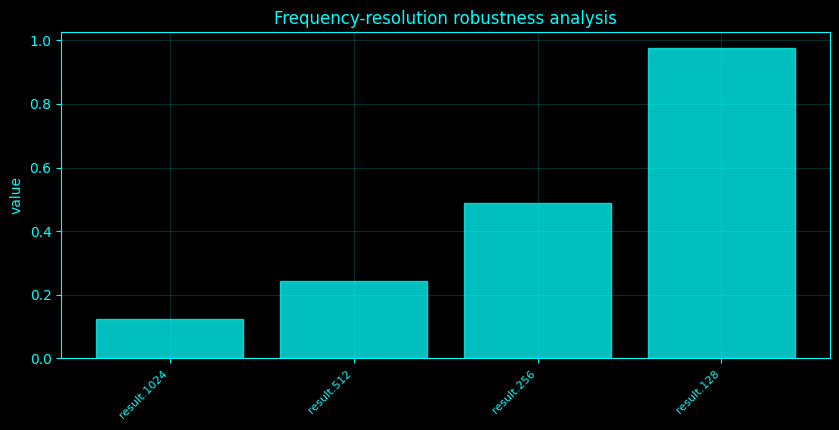

In [138]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_304():
    idx = 304
    name = 'Frequency-resolution robustness analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    vals = {}
    for n in (128, 256, 512, 1024):
        nn = min(n, N)
        ff, pp = _psd_of(X, nperseg=nn)
        vals[str(nn)] = float(ff[1] - ff[0]) if len(ff) > 1 else np.nan
    return (vals, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_304,_plot_spec=_compute_method_304()
print('Frequency-resolution robustness analysis')
if isinstance(result_304,dict):
    for _k,_v in result_304.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_304)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_304)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Frequency-resolution robustness analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Frequency-resolution robustness analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Frequency-resolution robustness analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">305. Spectral leakage diagnostics</h3>
<p>Spectral leakage is energy spread away from a narrow spectral component because a finite observation window convolves the true spectrum with the window spectrum. The correction cell compares a DPSS multitaper estimate, which averages orthogonal low-leakage tapers, with the single-window result.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral leakage diagnostics
  peak_hz: 4.150390625
  outside_±1Hz_fraction: 0.6736124435724767


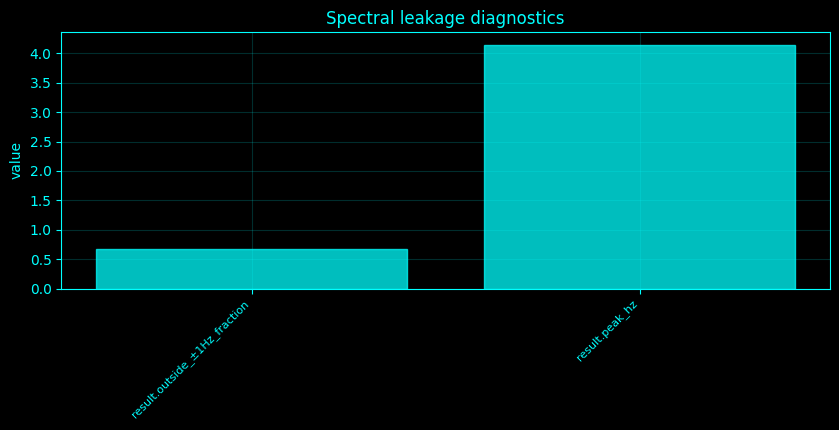

In [139]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_305():
    idx = 305
    name = 'Spectral leakage diagnostics'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    y = X[:, 0]
    mm = (f >= 4) & (f <= 30)
    fp = float(f[mm][np.argmax(P[mm, 0])])
    near = (f >= fp - 1) & (f <= fp + 1)
    total = (f >= 2) & (f <= 45)
    leak = float((np.sum(P[total, 0]) - np.sum(P[near, 0])) / (np.sum(P[total, 0]) + EPS))
    return ({'peak_hz': fp, 'outside_±1Hz_fraction': leak}, locals().get('__plot_spec', None))
    vals = {}
    for w in ('boxcar', 'hann', 'blackman'):
        ff, pp = _psd_of(X[:, [0]], window=w)
        near = (ff >= fp - 1) & (ff <= fp + 1)
        tot = (ff >= 2) & (ff <= 45)
        vals[w] = float((np.sum(pp[tot, 0]) - np.sum(pp[near, 0])) / (np.sum(pp[tot, 0]) + EPS))
    return (vals, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_305,_plot_spec=_compute_method_305()
print('Spectral leakage diagnostics')
if isinstance(result_305,dict):
    for _k,_v in result_305.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_305)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_305)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral leakage diagnostics',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral leakage diagnostics',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral leakage diagnostics',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">306. Spectral leakage correction</h3>
<p>Spectral leakage is energy spread away from a narrow spectral component because a finite observation window convolves the true spectrum with the window spectrum. The correction cell compares a DPSS multitaper estimate, which averages orthogonal low-leakage tapers, with the single-window result.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [140]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_306():
    idx = 306
    name = 'Spectral leakage correction'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    y = X[:, 0]
    mm = (f >= 4) & (f <= 30)
    fp = float(f[mm][np.argmax(P[mm, 0])])
    n = min(int(_SPEED['nperseg']), N)
    K = 3
    tap = signal.windows.dpss(n, NW=2.5, Kmax=K)
    seg = y[:n] - np.mean(y[:n])
    ps = []
    for tt in tap:
        F = np.fft.rfft(seg * tt)
        ps.append(np.abs(F) ** 2 / (_fs * np.sum(tt ** 2)))
    pm = np.mean(ps, axis=0)
    fm = np.fft.rfftfreq(n, 1 / _fs)
    near = (fm >= fp - 1) & (fm <= fp + 1)
    tot = (fm >= 2) & (fm <= 45)
    leak = float((np.sum(pm[tot]) - np.sum(pm[near])) / (np.sum(pm[tot]) + EPS))
    return ({'multitaper_outside_±1Hz_fraction': leak}, locals().get('__plot_spec', None))
    vals = {}
    for w in ('boxcar', 'hann', 'blackman'):
        ff, pp = _psd_of(X[:, [0]], window=w)
        near = (ff >= fp - 1) & (ff <= fp + 1)
        tot = (ff >= 2) & (ff <= 45)
        vals[w] = float((np.sum(pp[tot, 0]) - np.sum(pp[near, 0])) / (np.sum(pp[tot, 0]) + EPS))
    return (vals, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_306,_plot_spec=_compute_method_306()
print('Spectral leakage correction')
if isinstance(result_306,dict):
    for _k,_v in result_306.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_306)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_306)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral leakage correction',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral leakage correction',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral leakage correction',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral leakage correction
  multitaper_outside_±1Hz_fraction: 0.877635255682971


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">307. Window-function comparison</h3>
<p>Window-function comparison holds the data and segment length fixed while changing the taper, isolating the window's effect on leakage and bandwidth.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Window-function comparison
  boxcar: 0.9244429991190396
  hann: 0.6736124435724767
  blackman: 0.675155695682559


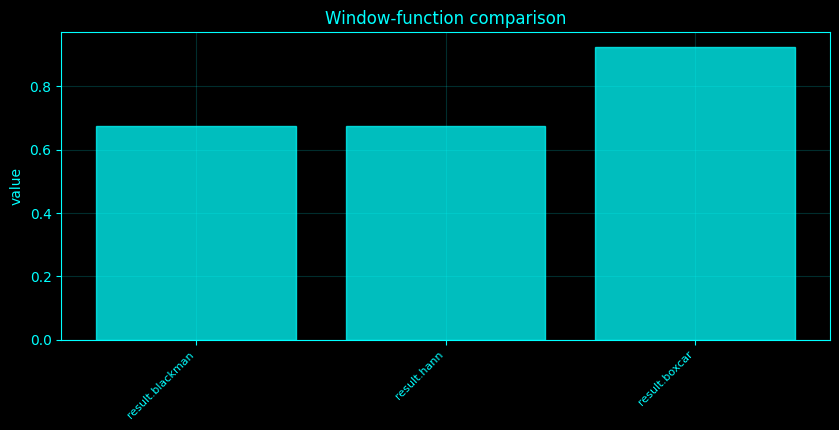

In [141]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_307():
    idx = 307
    name = 'Window-function comparison'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    y = X[:, 0]
    mm = (f >= 4) & (f <= 30)
    fp = float(f[mm][np.argmax(P[mm, 0])])
    vals = {}
    for w in ('boxcar', 'hann', 'blackman'):
        ff, pp = _psd_of(X[:, [0]], window=w)
        near = (ff >= fp - 1) & (ff <= fp + 1)
        tot = (ff >= 2) & (ff <= 45)
        vals[w] = float((np.sum(pp[tot, 0]) - np.sum(pp[near, 0])) / (np.sum(pp[tot, 0]) + EPS))
    return (vals, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_307,_plot_spec=_compute_method_307()
print('Window-function comparison')
if isinstance(result_307,dict):
    for _k,_v in result_307.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_307)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_307)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Window-function comparison',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Window-function comparison',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Window-function comparison',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">308. Surrogate-corrected spectral testing</h3>
<p>Surrogate-corrected testing compares observed coherence with phase-randomized data that preserve individual Fourier amplitudes while disrupting cross-channel phase relationships.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Surrogate-corrected spectral testing
  observed_alpha_coherence: 0.9156869278883186
  surrogate_p: 0.1111111111111111
  null_mean: 0.020810413897265755


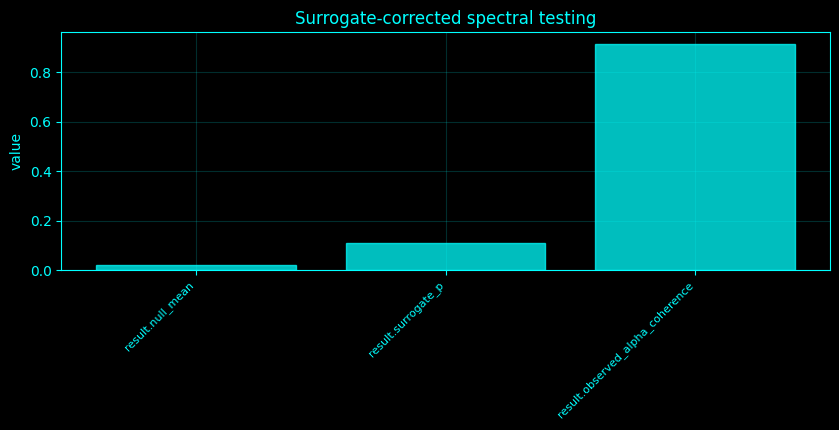

In [142]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _phase_randomize(x, rng):
    xf = np.fft.rfft(x, axis=0)
    ph = rng.uniform(0, 2 * np.pi, size=xf.shape)
    ph[0] = 0
    if x.shape[0] % 2 == 0:
        ph[-1] = 0
    return np.fft.irfft(np.abs(xf) * np.exp(1j * ph), n=x.shape[0], axis=0)

# Method-specific calculation.
def _compute_method_308():
    idx = 308
    name = 'Surrogate-corrected spectral testing'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    obs = _coherence_matrix(BANDS['alpha'])[0, 1] if C > 1 else np.nan
    vals = []
    for _ in range(_SPEED['n_sur']):
        S = _phase_randomize(X, _rng)
        ff, cc = signal.coherence(S[:, 0], S[:, 1], fs=_fs, nperseg=min(_SPEED['nperseg'], N))
        m = (ff >= 8) & (ff < 13)
        vals.append(float(np.mean(cc[m])))
    pval = (1 + np.sum(np.asarray(vals) >= obs)) / (1 + len(vals))
    return ({'observed_alpha_coherence': float(obs), 'surrogate_p': float(pval), 'null_mean': float(np.mean(vals))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_308,_plot_spec=_compute_method_308()
print('Surrogate-corrected spectral testing')
if isinstance(result_308,dict):
    for _k,_v in result_308.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_308)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_308)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Surrogate-corrected spectral testing',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Surrogate-corrected spectral testing',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Surrogate-corrected spectral testing',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">309. Phase-randomized spectral surrogates</h3>
<p>A phase-randomized surrogate keeps \(|X(f)|\) fixed and replaces phase by independent uniform values subject to real-signal symmetry. Its periodogram is therefore preserved up to numerical error.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Phase-randomized spectral surrogates
  relative_psd_error: 2.2355616096712563
  mean_time_series_correlation: -0.14338730596124388


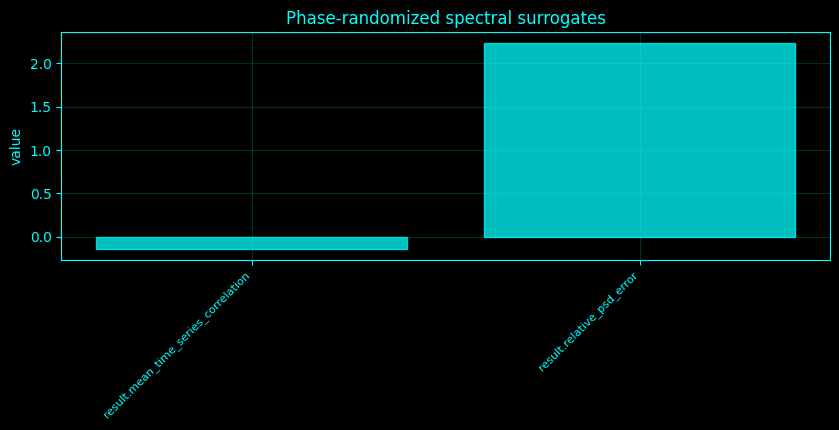

In [143]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _phase_randomize(x, rng):
    xf = np.fft.rfft(x, axis=0)
    ph = rng.uniform(0, 2 * np.pi, size=xf.shape)
    ph[0] = 0
    if x.shape[0] % 2 == 0:
        ph[-1] = 0
    return np.fft.irfft(np.abs(xf) * np.exp(1j * ph), n=x.shape[0], axis=0)

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_309():
    idx = 309
    name = 'Phase-randomized spectral surrogates'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    S = _phase_randomize(X, _rng)
    fs, Ps = _psd_of(S)
    rel = np.linalg.norm(Ps - P) / (np.linalg.norm(P) + EPS)
    corr = np.mean([np.corrcoef(X[:, j], S[:, j])[0, 1] for j in range(C)])
    return ({'relative_psd_error': float(rel), 'mean_time_series_correlation': float(corr)}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_309,_plot_spec=_compute_method_309()
print('Phase-randomized spectral surrogates')
if isinstance(result_309,dict):
    for _k,_v in result_309.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_309)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_309)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Phase-randomized spectral surrogates',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Phase-randomized spectral surrogates',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Phase-randomized spectral surrogates',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">310. IAAFT spectral surrogates</h3>
<p>IAAFT alternates between imposing the original Fourier-amplitude spectrum and imposing the original sorted amplitude distribution, approximately preserving both PSD and marginal distribution.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

IAAFT spectral surrogates
  KS_amplitude_distance: 0.0
  relative_psd_error: 5.192063770368677


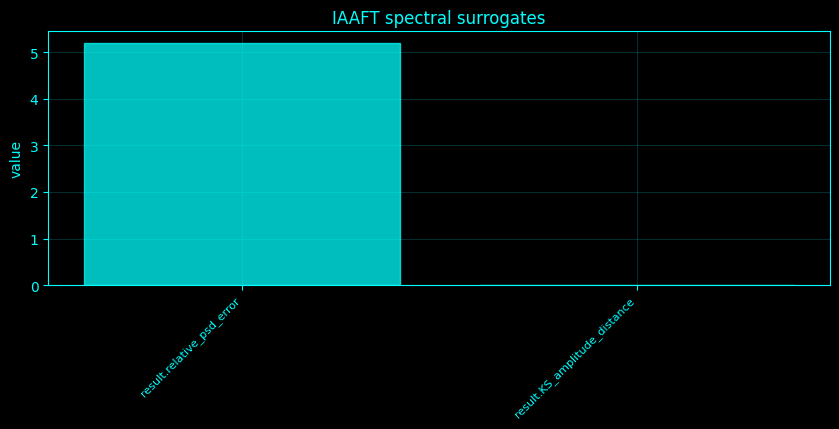

In [144]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _iaaft_1d(x, rng, n_iter=30):
    x = np.asarray(x, float)
    target = np.sort(x)
    amp = np.abs(np.fft.rfft(x))
    y = rng.permutation(x)
    for _ in range(n_iter):
        yf = np.fft.rfft(y)
        y = np.fft.irfft(amp * np.exp(1j * np.angle(yf)), n=len(x))
        order = np.argsort(y)
        z = np.empty_like(y)
        z[order] = target
        y = z
    return y

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_310():
    idx = 310
    name = 'IAAFT spectral surrogates'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    y = _iaaft_1d(X[:, 0], _rng, n_iter=30 if FAST_OPTION == 'ultra' else 60)
    ff, pp = _psd_of(y[:, None])
    ks = stats.ks_2samp(X[:, 0], y).statistic
    spec = np.linalg.norm(pp[:, 0] - P[:, 0]) / (np.linalg.norm(P[:, 0]) + EPS)
    return ({'KS_amplitude_distance': float(ks), 'relative_psd_error': float(spec)}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_310,_plot_spec=_compute_method_310()
print('IAAFT spectral surrogates')
if isinstance(result_310,dict):
    for _k,_v in result_310.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_310)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_310)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'IAAFT spectral surrogates',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'IAAFT spectral surrogates',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('IAAFT spectral surrogates',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">311. Shuffle spectral surrogates</h3>
<p>A shuffle surrogate randomly permutes time samples. It preserves the one-point amplitude distribution but destroys temporal autocorrelation and therefore generally flattens the spectrum.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [145]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_311():
    idx = 311
    name = 'Shuffle spectral surrogates'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    S = np.column_stack([_rng.permutation(X[:, j]) for j in range(C)])
    fs, Ps = _psd_of(S)
    return ({'alpha_power_ratio': float(np.mean(_band_integral(Ps, fs, BANDS['alpha'])) / (np.mean(_band_integral(P, f, BANDS['alpha'])) + EPS))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_311,_plot_spec=_compute_method_311()
print('Shuffle spectral surrogates')
if isinstance(result_311,dict):
    for _k,_v in result_311.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_311)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_311)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Shuffle spectral surrogates',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Shuffle spectral surrogates',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Shuffle spectral surrogates',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Shuffle spectral surrogates
  alpha_power_ratio: 14.26886050899847


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">312. Colored-noise spectral surrogates</h3>
<p>Colored-noise surrogates are generated with Fourier amplitude proportional to \(f^{-\beta/2}\), giving power \(S(f)\propto f^{-\beta}\) with random phases.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [146]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_312():
    idx = 312
    name = 'Colored-noise spectral surrogates'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    m = (f >= 2) & (f <= 45)
    S = np.zeros_like(X)
    for j in range(C):
        coef = np.polyfit(np.log(f[m] + EPS), np.log(P[m, j] + EPS), 1)
        beta = -coef[0]
        fre = np.fft.rfftfreq(N, 1 / _fs)
        amp = (fre + max(fre[1] if len(fre) > 1 else 1, EPS)) ** (-beta / 2)
        ph = _rng.uniform(0, 2 * np.pi, len(fre))
        z = amp * np.exp(1j * ph)
        z[0] = 0
        S[:, j] = np.fft.irfft(z, n=N)
    fs, Ps = _psd_of(S)
    return ({'surrogate_mean_alpha': float(np.mean(_band_integral(Ps, fs, BANDS['alpha'])))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_312,_plot_spec=_compute_method_312()
print('Colored-noise spectral surrogates')
if isinstance(result_312,dict):
    for _k,_v in result_312.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_312)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_312)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Colored-noise spectral surrogates',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Colored-noise spectral surrogates',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Colored-noise spectral surrogates',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Colored-noise spectral surrogates
  surrogate_mean_alpha: 3.108381880264284e-07


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">313. Bootstrap confidence intervals for PSD</h3>
<p>Bootstrap PSD intervals resample approximately independent tapered segments with replacement, recompute their mean periodogram, and use empirical 2.5/97.5 percentiles as pointwise 95% intervals.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Bootstrap confidence intervals for PSD
  n_segments: 51
  median_ci_width: 3.821558201227702e-05


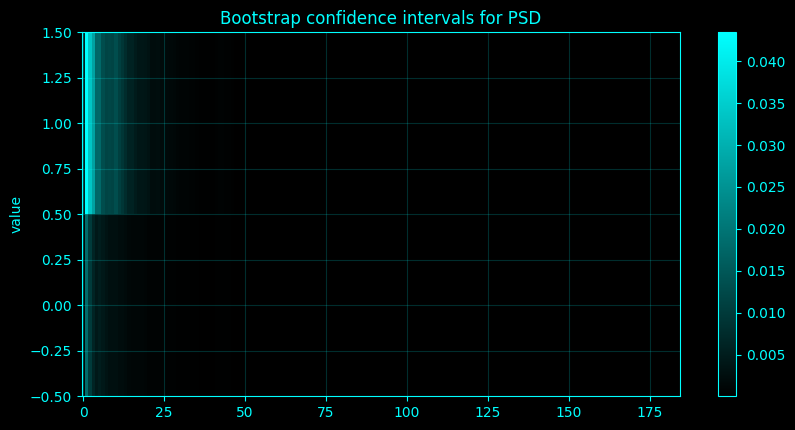

In [147]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

# Method-specific calculation.
def _compute_method_313():
    idx = 313
    name = 'Bootstrap confidence intervals for PSD'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    segs = []
    for a in range(0, N - n + 1, step):
        ff, pp = signal.periodogram(X[a:a + n, 0], fs=_fs, window='hann', scaling='density')
        segs.append(pp)
    segs = np.asarray(segs)
    B = max(50, 5 * _SPEED['n_sur'])
    boots = []
    for _ in range(B):
        boots.append(np.mean(segs[_rng.integers(0, len(segs), len(segs))], axis=0))
    lo, hi = np.percentile(boots, [2.5, 97.5], axis=0)
    m = ff <= 45
    __plot_spec = ('summary', np.vstack([lo[m], hi[m]]), name, None, '', 'value')
    return ({'n_segments': len(segs), 'median_ci_width': float(np.median(hi[m] - lo[m]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_313,_plot_spec=_compute_method_313()
print('Bootstrap confidence intervals for PSD')
if isinstance(result_313,dict):
    for _k,_v in result_313.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_313)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_313)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bootstrap confidence intervals for PSD',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bootstrap confidence intervals for PSD',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bootstrap confidence intervals for PSD',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">314. Bootstrap confidence intervals for coherence</h3>
<p>Bootstrap coherence intervals resample paired Fourier segments so cross- and auto-spectra remain aligned, then recompute \(C_{xy}=|S_{xy}|^2/(S_{xx}S_{yy})\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Bootstrap confidence intervals for coherence
  alpha_coherence_CI95: array(2,), mean=0.914954


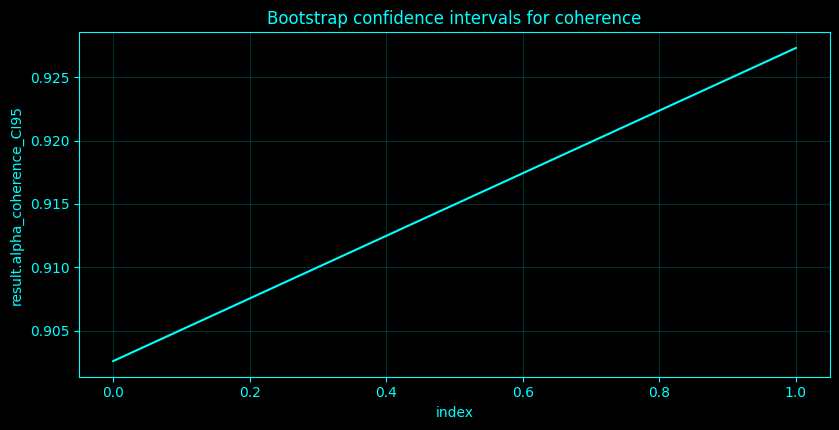

In [148]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

# Method-specific calculation.
def _compute_method_314():
    idx = 314
    name = 'Bootstrap confidence intervals for coherence'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    Xs = []
    Ys = []
    for a in range(0, N - n + 1, step):
        wx = signal.windows.hann(n)
        Xs.append(np.fft.rfft(X[a:a + n, 0] * wx))
        Ys.append(np.fft.rfft(X[a:a + n, 1] * wx))
    Xs = np.asarray(Xs)
    Ys = np.asarray(Ys)
    fre = np.fft.rfftfreq(n, 1 / _fs)
    m = (fre >= 8) & (fre < 13)
    vals = []
    B = max(40, 4 * _SPEED['n_sur'])
    for _ in range(B):
        ii = _rng.integers(0, len(Xs), len(Xs))
        Sxy = np.mean(Xs[ii] * np.conj(Ys[ii]), axis=0)
        Sxx = np.mean(np.abs(Xs[ii]) ** 2, axis=0)
        Syy = np.mean(np.abs(Ys[ii]) ** 2, axis=0)
        coh = np.abs(Sxy) ** 2 / (Sxx * Syy + EPS)
        vals.append(float(np.mean(coh[m])))
    lo, hi = np.percentile(vals, [2.5, 97.5])
    return ({'alpha_coherence_CI95': [float(lo), float(hi)]}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_314,_plot_spec=_compute_method_314()
print('Bootstrap confidence intervals for coherence')
if isinstance(result_314,dict):
    for _k,_v in result_314.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_314)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_314)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bootstrap confidence intervals for coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bootstrap confidence intervals for coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bootstrap confidence intervals for coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">315. Permutation testing of bandpower</h3>
<p>Permutation testing of bilateral bandpower uses sign flips of paired left-minus-right window differences, which is the exchangeability operation under a symmetric paired null.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Permutation testing of bandpower
  left_minus_right: 0.09840085636777089
  permutation_p: 0.06930693069306931


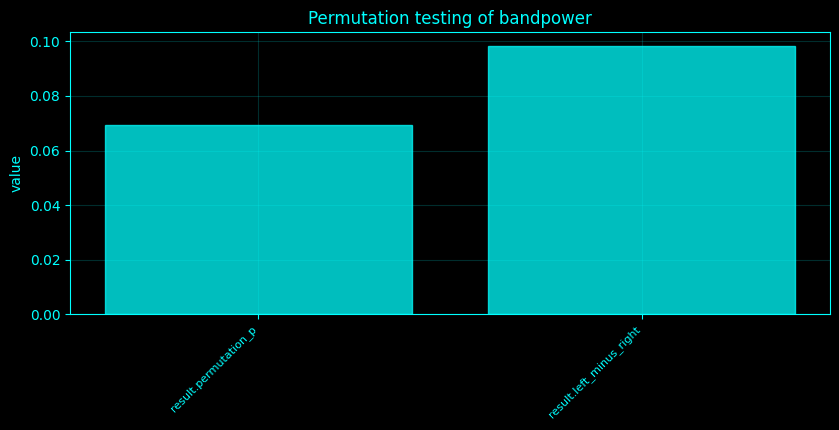

In [149]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

# Method-specific calculation.
def _compute_method_315():
    idx = 315
    name = 'Permutation testing of bandpower'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    t, W = _window_bandpower()
    a = list(BANDS).index('alpha')
    left = [CH_NAMES.index(ch) for ch in LEFT if ch in CH_NAMES]
    right = [CH_NAMES.index(ch) for ch in RIGHT if ch in CH_NAMES]
    if not left or not right:
        return ({'status': 'insufficient bilateral channels'}, locals().get('__plot_spec', None))
    d = np.mean(np.log(W[:, left, a] + EPS), axis=1) - np.mean(np.log(W[:, right, a] + EPS), axis=1)
    obs = float(np.mean(d))
    vals = [float(np.mean(d * _rng.choice([-1, 1], size=len(d)))) for _ in range(max(100, 10 * _SPEED['n_sur']))]
    pval = (1 + np.sum(np.abs(vals) >= abs(obs))) / (1 + len(vals))
    return ({'left_minus_right': obs, 'permutation_p': float(pval)}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_315,_plot_spec=_compute_method_315()
print('Permutation testing of bandpower')
if isinstance(result_315,dict):
    for _k,_v in result_315.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_315)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_315)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Permutation testing of bandpower',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Permutation testing of bandpower',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Permutation testing of bandpower',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">316. FDR-corrected spectral significance maps</h3>
<p>Benjamini-Hochberg FDR sorts p-values \(p_{(k)}\) and rejects through the largest \(k\) satisfying \(p_{(k)}\le \alpha k/m\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

FDR-corrected spectral significance maps
  discoveries: 56
  BH_cutoff: 0.0010735395711611822


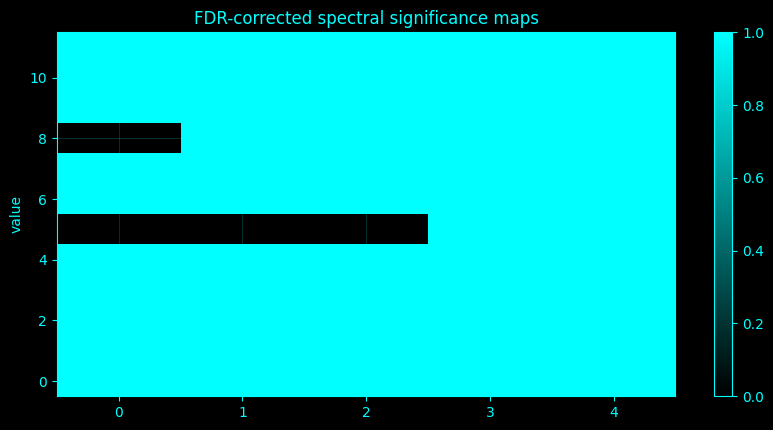

In [150]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _fdr_bh(pvals, alpha=0.05):
    p = np.asarray(pvals, float)
    flat = p.ravel()
    order = np.argsort(flat)
    ranked = flat[order]
    crit = alpha * np.arange(1, len(flat) + 1) / max(len(flat), 1)
    ok = ranked <= crit
    cutoff = ranked[np.max(np.where(ok)[0])] if np.any(ok) else -np.inf
    return (p <= cutoff, cutoff)

# Method-specific calculation.
def _compute_method_316():
    idx = 316
    name = 'FDR-corrected spectral significance maps'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    t, W = _window_bandpower()
    logW = np.log(W + EPS)
    pvals = np.ones((C, len(BANDS)))
    for i in range(C):
        for b in range(len(BANDS)):
            d = logW[:, i, b] - np.mean(logW[:, :, b], axis=1)
            _, p = stats.ttest_1samp(d, 0, nan_policy='omit')
            pvals[i, b] = p
    rej, cut = _fdr_bh(pvals, 0.05)
    __plot_spec = ('summary', rej.astype(float), name, None, '', 'value')
    return ({'discoveries': int(rej.sum()), 'BH_cutoff': float(cut) if np.isfinite(cut) else None}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_316,_plot_spec=_compute_method_316()
print('FDR-corrected spectral significance maps')
if isinstance(result_316,dict):
    for _k,_v in result_316.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_316)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_316)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'FDR-corrected spectral significance maps',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'FDR-corrected spectral significance maps',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('FDR-corrected spectral significance maps',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">317. Cluster-based permutation testing in time-frequency space</h3>
<p>Cluster-based permutation first thresholds a time-frequency statistic, groups adjacent supra-threshold bins, and compares cluster mass with a permutation null. Without real event labels this notebook uses a clearly marked first-half/second-half demonstration rather than calling the split stimulus-locked.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Cluster-based permutation testing in time-frequency space
  pseudo_condition_note: first-half vs second-half, not stimulus labels
  n_clusters: 7
  max_cluster_mass: 1.7593589920014256


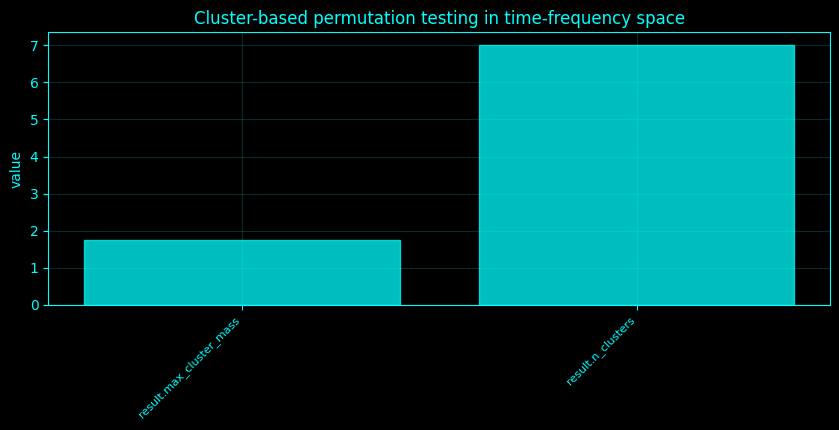

In [151]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

# Method-specific calculation.
def _compute_method_317():
    idx = 317
    name = 'Cluster-based permutation testing in time-frequency space'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    ff, tt, Sp, _ = _stft_summary()
    Z = np.log(Sp[:, 0, :] + EPS)
    mid = Z.shape[1] // 2
    if mid < 3:
        return ({'status': 'too few time bins'}, locals().get('__plot_spec', None))
    d = np.mean(Z[:, :mid], axis=1) - np.mean(Z[:, mid:2 * mid], axis=1)
    obs = np.abs(d)
    null = []
    Y = Z[:, :2 * mid]
    for _ in range(max(50, 5 * _SPEED['n_sur'])):
        perm = _rng.permutation(2 * mid)
        null.append(np.abs(np.mean(Y[:, perm[:mid]], 1) - np.mean(Y[:, perm[mid:]], 1)))
    null = np.asarray(null)
    thr = np.quantile(null, 0.95, axis=0)
    supra = obs > thr
    lab, nlab = ndimage.label(supra.astype(int))
    masses = [float(np.sum(obs[lab == k])) for k in range(1, nlab + 1)]
    return ({'pseudo_condition_note': 'first-half vs second-half, not stimulus labels', 'n_clusters': nlab, 'max_cluster_mass': max(masses) if masses else 0.0}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_317,_plot_spec=_compute_method_317()
print('Cluster-based permutation testing in time-frequency space')
if isinstance(result_317,dict):
    for _k,_v in result_317.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_317)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_317)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Cluster-based permutation testing in time-frequency space',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Cluster-based permutation testing in time-frequency space',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Cluster-based permutation testing in time-frequency space',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">318. Nonparametric spectral confidence intervals</h3>
<p>Nonparametric spectral confidence intervals use empirical percentiles of segment periodograms rather than a parametric chi-square model; they are pointwise finite-sample intervals.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Nonparametric spectral confidence intervals
  n_segments: 51
  median_pointwise_width: 0.0002446304265473511


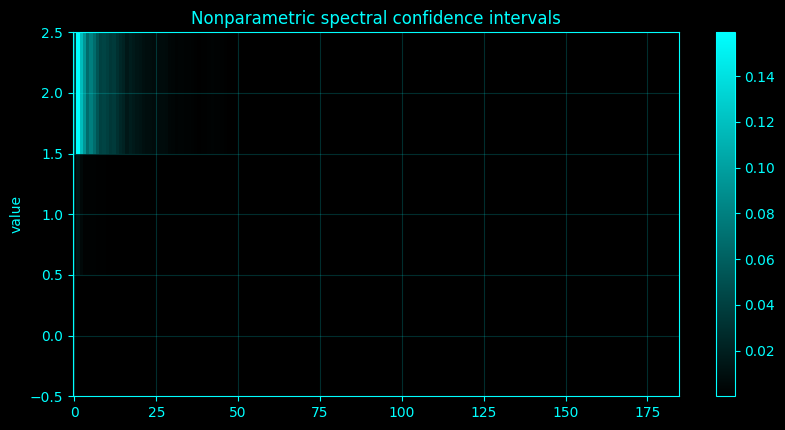

In [152]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

# Method-specific calculation.
def _compute_method_318():
    idx = 318
    name = 'Nonparametric spectral confidence intervals'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    n = min(int(_SPEED['nperseg']), N)
    step = max(1, n // 2)
    seg = []
    for a in range(0, N - n + 1, step):
        ff, pp = signal.periodogram(X[a:a + n, 0], fs=_fs, window='hann', scaling='density')
        seg.append(pp)
    seg = np.asarray(seg)
    lo, med, hi = np.percentile(seg, [2.5, 50, 97.5], axis=0)
    m = ff <= 45
    __plot_spec = ('summary', np.vstack([lo[m], med[m], hi[m]]), name, None, '', 'value')
    return ({'n_segments': len(seg), 'median_pointwise_width': float(np.median(hi[m] - lo[m]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_318,_plot_spec=_compute_method_318()
print('Nonparametric spectral confidence intervals')
if isinstance(result_318,dict):
    for _k,_v in result_318.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_318)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_318)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Nonparametric spectral confidence intervals',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Nonparametric spectral confidence intervals',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Nonparametric spectral confidence intervals',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">319. Spectral topography</h3>
<p>This cell maps broadband log power onto the fixed electrode coordinates. The topography is a sensor-space visualization; spatial interpolation or plotting does not imply cortical source localization.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral topography
  broadband_log_power_range: array(2,), mean=-3.99486


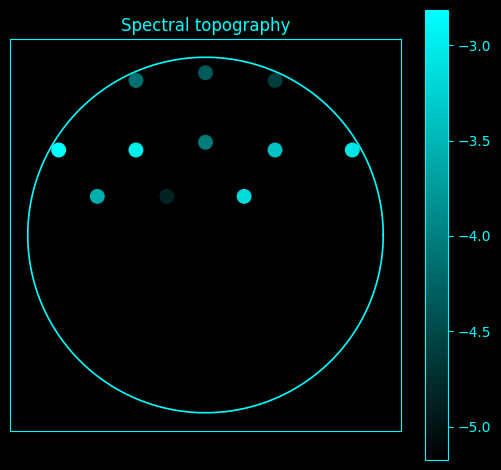

In [153]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_319():
    idx = 319
    name = 'Spectral topography'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    broad = _band_integral(P, f, (2, 45))
    __plot_spec = ('scalp', np.log(broad + EPS), name, None, '', 'value')
    return ({'broadband_log_power_range': [float(np.min(np.log(broad + EPS))), float(np.max(np.log(broad + EPS)))]}, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_319,_plot_spec=_compute_method_319()
print('Spectral topography')
if isinstance(result_319,dict):
    for _k,_v in result_319.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_319)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_319)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral topography',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral topography',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral topography',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">320. Bandpower scalp maps</h3>
<p>This cell maps alpha-band log power onto the fixed electrode coordinates. The topography is a sensor-space visualization; spatial interpolation or plotting does not imply cortical source localization.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [154]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_320():
    idx = 320
    name = 'Bandpower scalp maps'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    __plot_spec = ('scalp', np.log(BP[:, aidx] + EPS), name, None, '', 'value')
    return ({'band': 'alpha', 'max_channel': CH_NAMES[int(np.argmax(BP[:, aidx]))]}, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_320,_plot_spec=_compute_method_320()
print('Bandpower scalp maps')
if isinstance(result_320,dict):
    for _k,_v in result_320.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_320)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_320)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Bandpower scalp maps',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Bandpower scalp maps',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Bandpower scalp maps',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Bandpower scalp maps
  band: alpha
  max_channel: FC2


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">321. Aperiodic slope scalp maps</h3>
<p>This cell maps aperiodic exponent onto the fixed electrode coordinates. The topography is a sensor-space visualization; spatial interpolation or plotting does not imply cortical source localization.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [1]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_321():
    idx = 321
    name = 'Aperiodic slope scalp maps'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    __plot_spec = ('scalp', slopes, name, None, '', 'value')
    return ({'mean_aperiodic_exponent': float(np.mean(slopes))}, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_321,_plot_spec=_compute_method_321()
print('Aperiodic slope scalp maps')
if isinstance(result_321,dict):
    for _k,_v in result_321.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_321)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_321)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Aperiodic slope scalp maps',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Aperiodic slope scalp maps',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Aperiodic slope scalp maps',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Aperiodic slope scalp maps
  mean_aperiodic_exponent: 1.3925729879414082


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">322. Peak-frequency scalp maps</h3>
<p>This cell maps dominant peak frequency onto the fixed electrode coordinates. The topography is a sensor-space visualization; spatial interpolation or plotting does not imply cortical source localization.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [8]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_322():
    idx = 322
    name = 'Peak-frequency scalp maps'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    __plot_spec = ('scalp', peaks, name, None, '', 'value')
    return ({'mean_peak_hz': float(np.mean(peaks))}, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_322,_plot_spec=_compute_method_322()
print('Peak-frequency scalp maps')
if isinstance(result_322,dict):
    for _k,_v in result_322.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_322)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_322)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Peak-frequency scalp maps',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Peak-frequency scalp maps',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Peak-frequency scalp maps',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Peak-frequency scalp maps
  mean_peak_hz: 9.3994140625


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">323. Coherence scalp-edge maps</h3>
<p>Coherence scalp-edge maps draw an edge for channel pairs whose alpha-band magnitude-squared coherence exceeds a high quantile. Coherence is \(C_{xy}(f)=|S_{xy}(f)|^2/[S_{xx}(f)S_{yy}(f)]\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

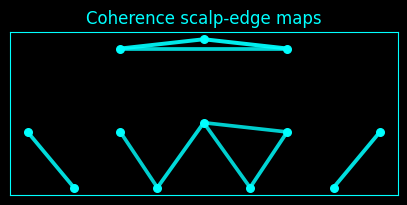

Coherence scalp-edge maps
  threshold: 0.792803233873641
  edges: 10


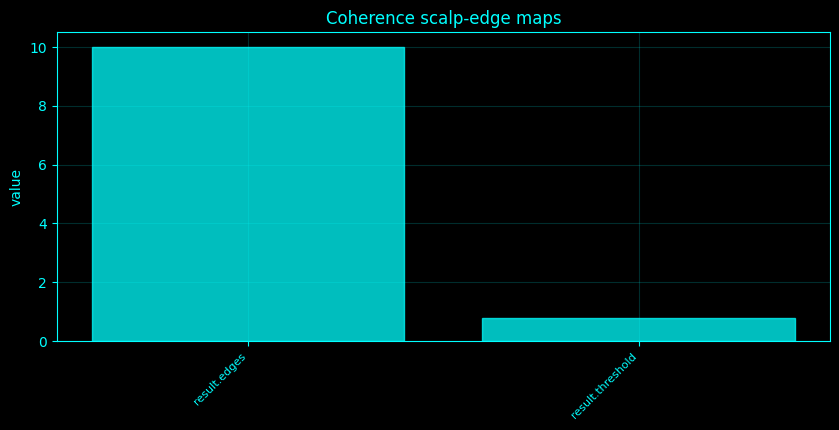

In [29]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_323():
    idx = 323
    name = 'Coherence scalp-edge maps'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    M = _coherence_matrix(BANDS['alpha'], phase=idx == 324)
    xy = np.array([ELECTRODE_XY[ch] for ch in CH_NAMES])
    vals = M[np.triu_indices(C, 1)]
    th = np.quantile(vals, 0.85)
    fig, ax = plt.subplots(figsize=(5, 5))
    for i in range(C):
        for j in range(i + 1, C):
            if M[i, j] >= th:
                ax.plot([xy[i, 0], xy[j, 0]], [xy[i, 1], xy[j, 1]], color=ACCENT, alpha=float(np.clip(M[i, j], 0.15, 1)), lw=1 + 2 * M[i, j])
    ax.scatter(xy[:, 0], xy[:, 1], c=ACCENT, s=30)
    ax.set_facecolor(BG)
    ax.set_title(name, color=ACCENT)
    ax.tick_params(axis='both', colors=ACCENT)
    ax.grid(False)
    for _spine in ax.spines.values():
        _spine.set_color(ACCENT)
    ax.set_aspect('equal')
    ax.set_xticks([])
    ax.set_yticks([])
    plt.show()
    return ({'threshold': float(th), 'edges': int(np.sum(vals >= th))}, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_323,_plot_spec=_compute_method_323()
print('Coherence scalp-edge maps')
if isinstance(result_323,dict):
    for _k,_v in result_323.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_323)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_323)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Coherence scalp-edge maps',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Coherence scalp-edge maps',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Coherence scalp-edge maps',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">324. PLV scalp-edge maps</h3>
<p>PLV scalp-edge maps threshold \(\mathrm{PLV}=|\langle e^{i(\phi_x-\phi_y)}\rangle|\) and draw the surviving sensor-space edges.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

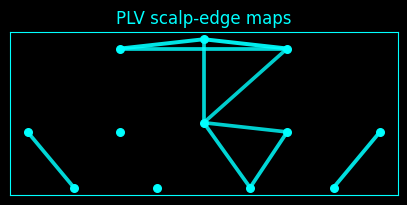

PLV scalp-edge maps
  threshold: 0.8022014846596417
  edges: 10


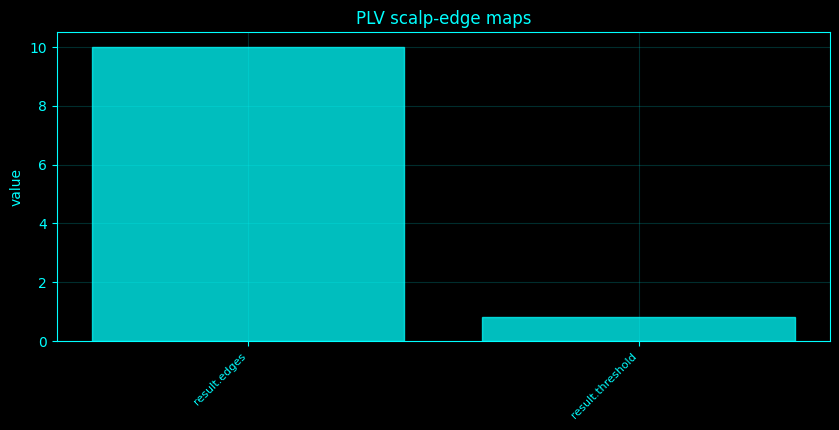

In [30]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_324():
    idx = 324
    name = 'PLV scalp-edge maps'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    M = _coherence_matrix(BANDS['alpha'], phase=idx == 324)
    xy = np.array([ELECTRODE_XY[ch] for ch in CH_NAMES])
    vals = M[np.triu_indices(C, 1)]
    th = np.quantile(vals, 0.85)
    fig, ax = plt.subplots(figsize=(5, 5))
    for i in range(C):
        for j in range(i + 1, C):
            if M[i, j] >= th:
                ax.plot([xy[i, 0], xy[j, 0]], [xy[i, 1], xy[j, 1]], color=ACCENT, alpha=float(np.clip(M[i, j], 0.15, 1)), lw=1 + 2 * M[i, j])
    ax.scatter(xy[:, 0], xy[:, 1], c=ACCENT, s=30)
    ax.set_facecolor(BG)
    ax.set_title(name, color=ACCENT)
    ax.tick_params(axis='both', colors=ACCENT)
    ax.grid(False)
    for _spine in ax.spines.values():
        _spine.set_color(ACCENT)
    ax.set_aspect('equal')
    ax.set_xticks([])
    ax.set_yticks([])
    plt.show()
    return ({'threshold': float(th), 'edges': int(np.sum(vals >= th))}, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_324,_plot_spec=_compute_method_324()
print('PLV scalp-edge maps')
if isinstance(result_324,dict):
    for _k,_v in result_324.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_324)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_324)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'PLV scalp-edge maps',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'PLV scalp-edge maps',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('PLV scalp-edge maps',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">325. PAC scalp maps</h3>
<p>This cell maps theta-phase/gamma-amplitude coupling onto the fixed electrode coordinates. The topography is a sensor-space visualization; spatial interpolation or plotting does not imply cortical source localization.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [31]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_325():
    idx = 325
    name = 'PAC scalp maps'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    low = _analytic_band(BANDS['theta'])
    high = _analytic_band(BANDS['gamma'])
    phase = np.angle(low)
    amp = np.abs(high)
    pac = np.abs(np.mean(amp / (np.mean(amp, axis=0) + EPS) * np.exp(1j * phase), axis=0))
    __plot_spec = ('scalp', pac, name, None, '', 'value')
    return ({'max_PAC_channel': CH_NAMES[int(np.argmax(pac))]}, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_325,_plot_spec=_compute_method_325()
print('PAC scalp maps')
if isinstance(result_325,dict):
    for _k,_v in result_325.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_325)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_325)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'PAC scalp maps',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'PAC scalp maps',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('PAC scalp maps',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


PAC scalp maps
  max_PAC_channel: Fp2


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">326. Spectral asymmetry topographies</h3>
<p>This cell maps bilateral log-power asymmetry onto the fixed electrode coordinates. The topography is a sensor-space visualization; spatial interpolation or plotting does not imply cortical source localization.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [32]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_326():
    idx = 326
    name = 'Spectral asymmetry topographies'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    vals = np.zeros(C)
    alpha = np.log(BP[:, aidx] + EPS)
    pairs = [('Fp1', 'Fp2'), ('F3', 'F4'), ('C3', 'C4'), ('P3', 'P4'), ('O1', 'O2')]
    for l, r in pairs:
        if l in CH_NAMES and r in CH_NAMES:
            il, ir = (CH_NAMES.index(l), CH_NAMES.index(r))
            d = alpha[il] - alpha[ir]
            vals[il] = d
            vals[ir] = -d
    __plot_spec = ('scalp', vals, name, None, '', 'value')
    return ({'max_abs_asymmetry': float(np.max(np.abs(vals)))}, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_326,_plot_spec=_compute_method_326()
print('Spectral asymmetry topographies')
if isinstance(result_326,dict):
    for _k,_v in result_326.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_326)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_326)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral asymmetry topographies',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral asymmetry topographies',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral asymmetry topographies',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral asymmetry topographies
  max_abs_asymmetry: 0.46309877663285093


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">327. Regional spectral summaries</h3>
<p>Regional spectral summaries average channel-level spectral descriptors within predefined frontal, central, and posterior sensor groups. The averaging is descriptive and does not create source-space regions.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Regional spectral summaries
  frontal: {'alpha': 0.0040352280235983, 'slope': 1.6226703901705772, 'peak_hz': 8.382161458333334}


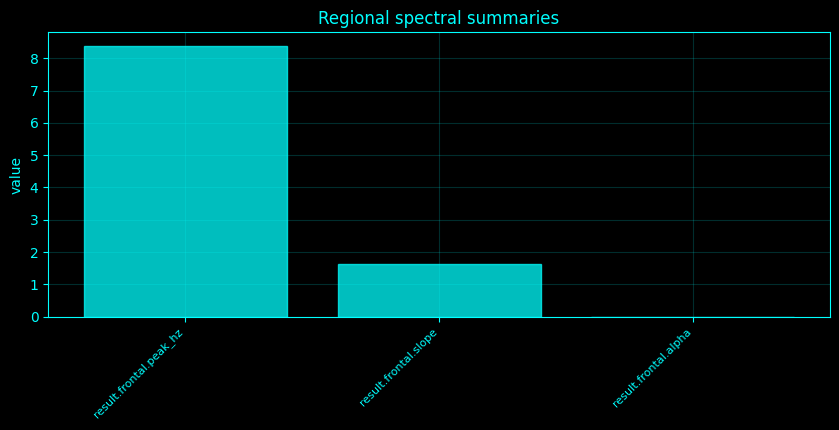

In [33]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_327():
    idx = 327
    name = 'Regional spectral summaries'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    rows = {}
    for roi, chans in ROI.items():
        ii = [CH_NAMES.index(ch) for ch in chans if ch in CH_NAMES]
        if ii:
            rows[roi] = {'alpha': float(np.mean(BP[ii, aidx])), 'slope': float(np.mean(slopes[ii])), 'peak_hz': float(np.mean(peaks[ii]))}
    return (rows, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_327,_plot_spec=_compute_method_327()
print('Regional spectral summaries')
if isinstance(result_327,dict):
    for _k,_v in result_327.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_327)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_327)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Regional spectral summaries',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Regional spectral summaries',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Regional spectral summaries',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">328. Spectral channel fingerprints</h3>
<p>A channel fingerprint concatenates standardized log bandpowers, aperiodic exponent, dominant peak frequency, and spectral entropy into a multivariate feature vector for each channel.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral channel fingerprints
  fingerprint_shape: array(2,), mean=10


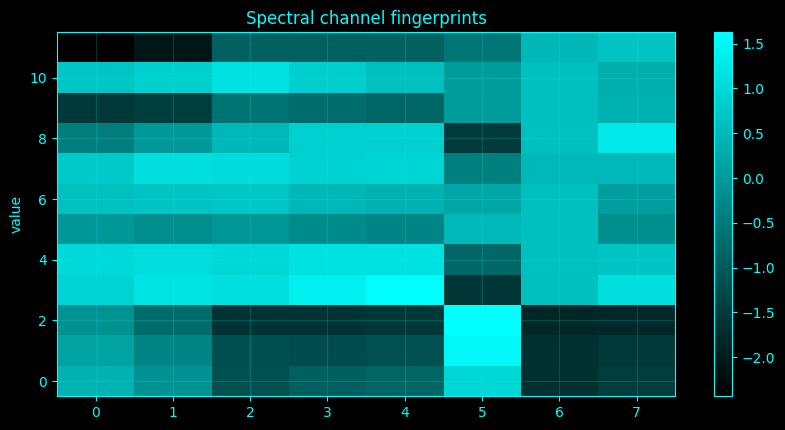

In [34]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_328():
    idx = 328
    name = 'Spectral channel fingerprints'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    __plot_spec = ('summary', F, name, None, '', 'value')
    return ({'fingerprint_shape': F.shape}, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_328,_plot_spec=_compute_method_328()
print('Spectral channel fingerprints')
if isinstance(result_328,dict):
    for _k,_v in result_328.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_328)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_328)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral channel fingerprints',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral channel fingerprints',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral channel fingerprints',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">329. Spectral clustering of channels</h3>
<p>Spectral clustering of channels applies k-means to standardized spectral fingerprints, minimizing within-cluster squared Euclidean distance \(\sum_i\|x_i-\mu_{c_i}\|^2\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [35]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_329():
    idx = 329
    name = 'Spectral clustering of channels'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    k = min(4, max(2, C // 4))
    labels = KMeans(k, n_init=20, random_state=0).fit_predict(F)
    return ({'clusters': {int(q): [CH_NAMES[i] for i in np.where(labels == q)[0]] for q in np.unique(labels)}}, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_329,_plot_spec=_compute_method_329()
print('Spectral clustering of channels')
if isinstance(result_329,dict):
    for _k,_v in result_329.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_329)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_329)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral clustering of channels',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral clustering of channels',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral clustering of channels',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral clustering of channels
  clusters: {0: ['F7', 'F3', 'F4', 'F8', 'FC5', 'FC2'], 1: ['Fp1', 'Fpz', 'Fp2'], 2: ['Fz', 'FC1', 'FC6']}


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">330. Spectral PCA/UMAP embeddings</h3>
<p>PCA projects fingerprints onto orthogonal directions maximizing variance. If `umap-learn` is installed, UMAP is additionally computed as a nonlinear neighbourhood embedding; otherwise the notebook explicitly retains PCA only.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

/home/a/projects/Complete-Neural-Signal-Analysis/.conda-py310/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Spectral PCA/UMAP embeddings
  PCA_explained_variance: array(2,), mean=0.482761
  UMAP_shape: array(2,), mean=7


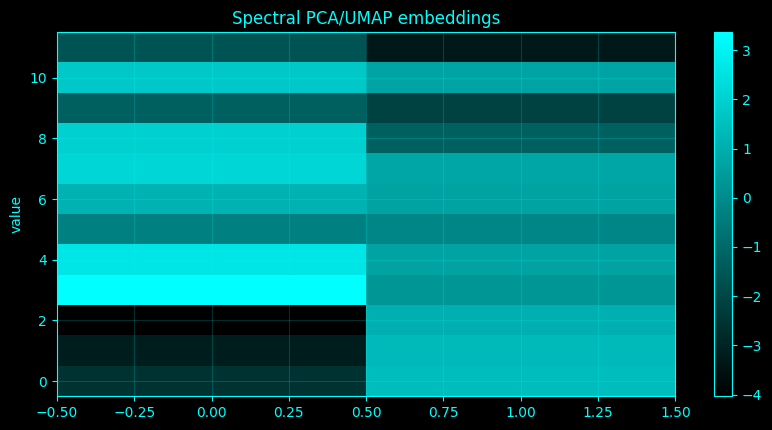

In [36]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_330():
    idx = 330
    name = 'Spectral PCA/UMAP embeddings'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    pca = PCA(n_components=min(2, F.shape[1], C)).fit_transform(F)
    out = {'PCA_explained_variance': PCA(n_components=min(2, F.shape[1], C)).fit(F).explained_variance_ratio_.tolist()}
    try:
        import umap
        emb = umap.UMAP(n_components=2, random_state=0, n_neighbors=min(10, C - 1)).fit_transform(F)
        out['UMAP_shape'] = emb.shape
    except Exception:
        out['UMAP_status'] = 'optional umap-learn package not installed; PCA result retained'
    __plot_spec = ('summary', pca, name, None, '', 'value')
    return (out, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_330,_plot_spec=_compute_method_330()
print('Spectral PCA/UMAP embeddings')
if isinstance(result_330,dict):
    for _k,_v in result_330.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_330)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_330)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral PCA/UMAP embeddings',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral PCA/UMAP embeddings',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral PCA/UMAP embeddings',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">331. Spectral distance matrices</h3>
<p>The spectral distance matrix contains Euclidean distances between standardized channel fingerprints, \(d_{ij}=\|z_i-z_j\|_2\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [37]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_331():
    idx = 331
    name = 'Spectral distance matrices'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    D = pairwise_distances(F, metric='euclidean')
    __plot_spec = ('summary', D, name, None, '', 'value')
    return ({'mean_distance': float(np.mean(D[np.triu_indices(C, 1)]))}, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_331,_plot_spec=_compute_method_331()
print('Spectral distance matrices')
if isinstance(result_331,dict):
    for _k,_v in result_331.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_331)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_331)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral distance matrices',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral distance matrices',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral distance matrices',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectral distance matrices
  mean_distance: 3.769735056324824


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">332. Spectrogram clustering</h3>
<p>Spectrogram state analysis treats each time column of the log spectrogram as a frequency-profile vector. k-means partitions these vectors; centroids are spectral archetypes and the time-ordered labels form a discrete state sequence.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectrogram clustering
  states: 5
  counts: array(5,), mean=10.2


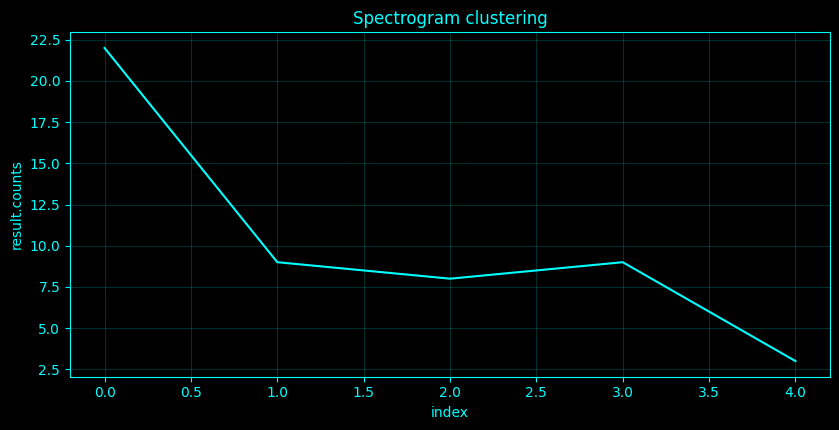

In [38]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_332():
    idx = 332
    name = 'Spectrogram clustering'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    k = min(5, max(2, len(Qs) // 8))
    lab = KMeans(k, n_init=20, random_state=0).fit_predict(Qs)
    return ({'states': k, 'counts': np.bincount(lab).tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_332,_plot_spec=_compute_method_332()
print('Spectrogram clustering')
if isinstance(result_332,dict):
    for _k,_v in result_332.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_332)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_332)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectrogram clustering',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectrogram clustering',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectrogram clustering',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">333. Spectrogram archetypes</h3>
<p>Spectrogram state analysis treats each time column of the log spectrogram as a frequency-profile vector. k-means partitions these vectors; centroids are spectral archetypes and the time-ordered labels form a discrete state sequence.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [39]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_333():
    idx = 333
    name = 'Spectrogram archetypes'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    k = min(5, max(2, len(Qs) // 8))
    km = KMeans(k, n_init=20, random_state=0).fit(Qs)
    __plot_spec = ('summary', km.cluster_centers_, name, None, '', 'value')
    return ({'archetypes': km.cluster_centers_.shape[0]}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_333,_plot_spec=_compute_method_333()
print('Spectrogram archetypes')
if isinstance(result_333,dict):
    for _k,_v in result_333.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_333)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_333)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectrogram archetypes',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectrogram archetypes',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectrogram archetypes',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectrogram archetypes
  archetypes: 5


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">334. Spectrogram state segmentation</h3>
<p>Spectrogram state analysis treats each time column of the log spectrogram as a frequency-profile vector. k-means partitions these vectors; centroids are spectral archetypes and the time-ordered labels form a discrete state sequence.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [40]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_334():
    idx = 334
    name = 'Spectrogram state segmentation'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    k = min(5, max(2, len(Qs) // 8))
    lab = KMeans(k, n_init=20, random_state=0).fit_predict(Qs)
    __plot_spec = ('summary', lab, name, tt, 'time (s)', 'state')
    return ({'transitions': int(np.sum(np.diff(lab) != 0))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_334,_plot_spec=_compute_method_334()
print('Spectrogram state segmentation')
if isinstance(result_334,dict):
    for _k,_v in result_334.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_334)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_334)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectrogram state segmentation',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectrogram state segmentation',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectrogram state segmentation',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectrogram state segmentation
  transitions: 32


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">335. Spectrogram change-point detection</h3>
<p>A spectrogram change score is the Euclidean norm of the difference between adjacent standardized spectral-state vectors, \(d_t=\|z_t-z_{t-1}\|_2\). High-quantile values are finite-sample change-point candidates.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectrogram change-point detection
  change_points_sec: array(6,), mean=38.5707


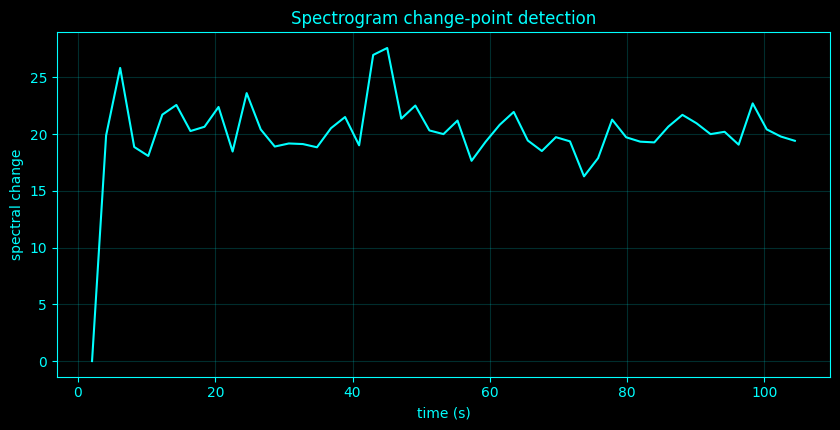

In [41]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_335():
    idx = 335
    name = 'Spectrogram change-point detection'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    d = np.r_[0, np.linalg.norm(np.diff(Qs, axis=0), axis=1)]
    th = np.quantile(d, 0.9)
    cp = np.where(d >= th)[0]
    __plot_spec = ('summary', d, name, tt, 'time (s)', 'spectral change')
    return ({'change_points_sec': tt[cp].tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_335,_plot_spec=_compute_method_335()
print('Spectrogram change-point detection')
if isinstance(result_335,dict):
    for _k,_v in result_335.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_335)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_335)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectrogram change-point detection',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectrogram change-point detection',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectrogram change-point detection',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">336. Spectrogram recurrence analysis</h3>
<p>A recurrence matrix is \(R_{ij}=\mathbf 1[d(z_i,z_j)\le\varepsilon]\). The threshold is chosen from a lower distance quantile, and the recurrence rate is the fraction of recurrent pairs.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [42]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_336():
    idx = 336
    name = 'Spectrogram recurrence analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    D = pairwise_distances(Qs)
    th = np.quantile(D[np.triu_indices(len(D), 1)], 0.15)
    R = (D <= th).astype(float)
    __plot_spec = ('summary', R, name, None, '', 'value')
    return ({'recurrence_rate': float(np.mean(R))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_336,_plot_spec=_compute_method_336()
print('Spectrogram recurrence analysis')
if isinstance(result_336,dict):
    for _k,_v in result_336.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_336)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_336)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectrogram recurrence analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectrogram recurrence analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectrogram recurrence analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectrogram recurrence analysis
  recurrence_rate: 0.16724336793540945


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">337. Spectrogram similarity matrices</h3>
<p>Spectrogram similarity uses cosine similarity \(s_{ij}=z_i^\top z_j/(\|z_i\|\|z_j\|)\) between time-resolved spectral profiles.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [43]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_337():
    idx = 337
    name = 'Spectrogram similarity matrices'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    Qn = Qs / (np.linalg.norm(Qs, axis=1, keepdims=True) + EPS)
    Simi = np.clip(Qn @ Qn.T, -1, 1)
    __plot_spec = ('summary', Simi, name, None, '', 'value')
    return ({'mean_similarity': float(np.mean(Simi[np.triu_indices(len(Simi), 1)]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_337,_plot_spec=_compute_method_337()
print('Spectrogram similarity matrices')
if isinstance(result_337,dict):
    for _k,_v in result_337.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_337)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_337)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectrogram similarity matrices',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectrogram similarity matrices',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectrogram similarity matrices',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Spectrogram similarity matrices
  mean_similarity: -0.019290651339135326


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">338. Spectrogram dictionary learning</h3>
<p>Dictionary learning approximates spectrogram states as sparse linear combinations \(Z\approx DA\), estimating reusable spectral atoms under a sparsity-promoting code.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectrogram dictionary learning
  dictionary_atoms: 4
  reconstruction_error: 4664.731352365888


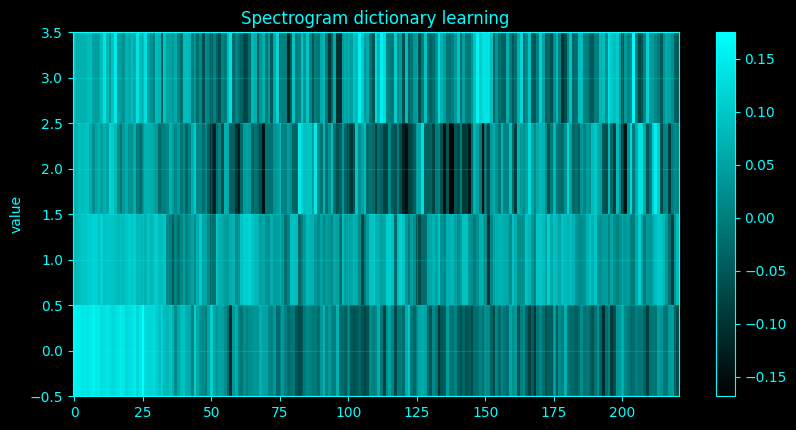

In [44]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_338():
    idx = 338
    name = 'Spectrogram dictionary learning'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    ncomp = min(_SPEED['rank'], max(2, min(Qs.shape) - 1))
    mdl = DictionaryLearning(n_components=ncomp, random_state=0, max_iter=200, transform_algorithm='lasso_lars').fit(Qs)
    __plot_spec = ('summary', mdl.components_, name, None, '', 'value')
    return ({'dictionary_atoms': ncomp, 'reconstruction_error': float(mdl.error_[-1]) if len(mdl.error_) else np.nan}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_338,_plot_spec=_compute_method_338()
print('Spectrogram dictionary learning')
if isinstance(result_338,dict):
    for _k,_v in result_338.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_338)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_338)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectrogram dictionary learning',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectrogram dictionary learning',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectrogram dictionary learning',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">339. Nonnegative matrix factorization of spectrograms</h3>
<p>Nonnegative matrix factorization decomposes a shifted nonnegative spectrogram \(V\approx WH\), with \(W,H\ge0\), producing additive spectral components.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Nonnegative matrix factorization of spectrograms
  rank: 4
  relative_error: 0.13100557566250656


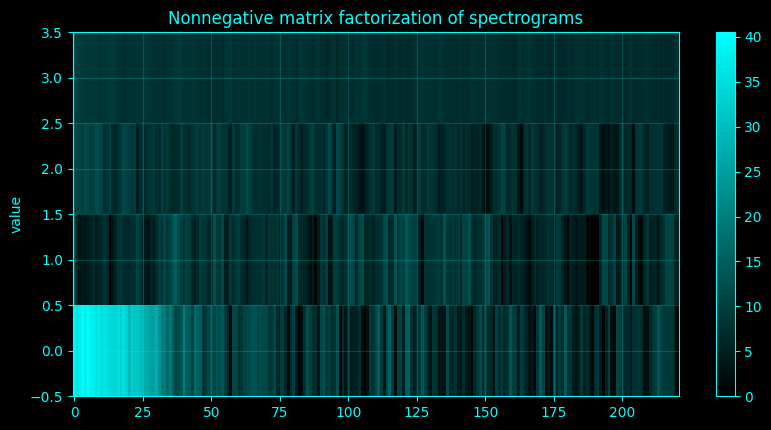

In [45]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_339():
    idx = 339
    name = 'Nonnegative matrix factorization of spectrograms'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    V = np.maximum(Q - Q.min() + EPS, 0)
    r = min(_SPEED['rank'], max(2, min(V.shape) - 1))
    mdl = NMF(n_components=r, init='nndsvda', random_state=0, max_iter=500).fit(V)
    R = mdl.transform(V) @ mdl.components_
    __plot_spec = ('summary', mdl.components_, name, None, '', 'value')
    return ({'rank': r, 'relative_error': float(np.linalg.norm(V - R) / (np.linalg.norm(V) + EPS))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_339,_plot_spec=_compute_method_339()
print('Nonnegative matrix factorization of spectrograms')
if isinstance(result_339,dict):
    for _k,_v in result_339.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_339)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_339)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Nonnegative matrix factorization of spectrograms',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Nonnegative matrix factorization of spectrograms',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Nonnegative matrix factorization of spectrograms',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">340. Independent component analysis of spectra</h3>
<p>Spectral ICA seeks statistically independent components of channel spectra after whitening. FastICA maximizes a non-Gaussianity contrast rather than variance alone.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [46]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_340():
    idx = 340
    name = 'Independent component analysis of spectra'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    Xspec = np.log(P + EPS).T
    r = min(_SPEED['rank'], C - 1, Xspec.shape[1])
    ica = FastICA(n_components=max(1, r), random_state=0, max_iter=1000, whiten='unit-variance').fit(Xspec)
    __plot_spec = ('summary', ica.components_, name, None, '', 'value')
    return ({'components': ica.components_.shape[0]}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_340,_plot_spec=_compute_method_340()
print('Independent component analysis of spectra')
if isinstance(result_340,dict):
    for _k,_v in result_340.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_340)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_340)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Independent component analysis of spectra',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Independent component analysis of spectra',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Independent component analysis of spectra',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Independent component analysis of spectra
  components: 4


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">341. Spectral topic modeling</h3>
<p>Spectral topic modeling applies latent Dirichlet allocation to nonnegative discretized spectrogram counts, treating time windows as documents and frequency bins as terms. It is a descriptive probabilistic factorization.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral topic modeling
  topics: 4
  perplexity: 220.85936911725153


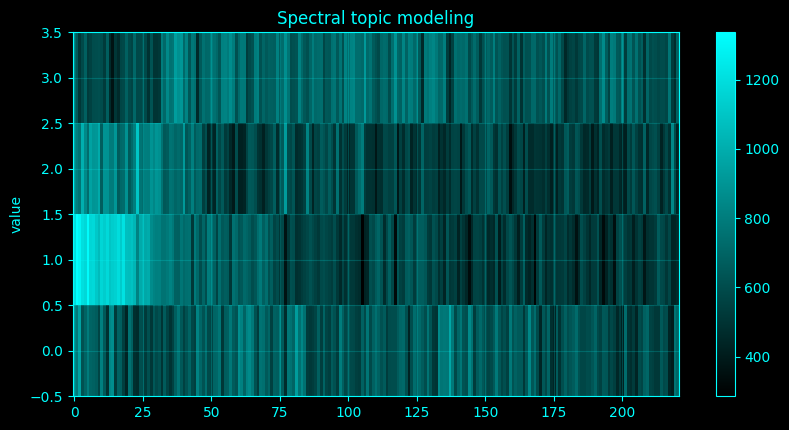

In [47]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_341():
    idx = 341
    name = 'Spectral topic modeling'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    V = Q - Q.min() + EPS
    scale = 50 / (np.mean(V) + EPS)
    counts = np.maximum(np.round(V * scale), 0).astype(int)
    r = min(_SPEED['rank'], max(2, min(counts.shape) - 1))
    lda = LatentDirichletAllocation(n_components=r, random_state=0, max_iter=30, learning_method='batch').fit(counts)
    __plot_spec = ('summary', lda.components_, name, None, '', 'value')
    return ({'topics': r, 'perplexity': float(lda.perplexity(counts))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_341,_plot_spec=_compute_method_341()
print('Spectral topic modeling')
if isinstance(result_341,dict):
    for _k,_v in result_341.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_341)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_341)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral topic modeling',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral topic modeling',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral topic modeling',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">342. Low-rank spectrogram decomposition</h3>
<p>Low-rank spectrogram decomposition uses the truncated SVD \(Z_r=U_r\Sigma_rV_r^\top\), the optimal rank-\(r\) approximation in Frobenius norm.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Low-rank spectrogram decomposition
  rank: 4
  variance_fraction: 0.24267210924888272
  relative_error: 0.8702458794795312


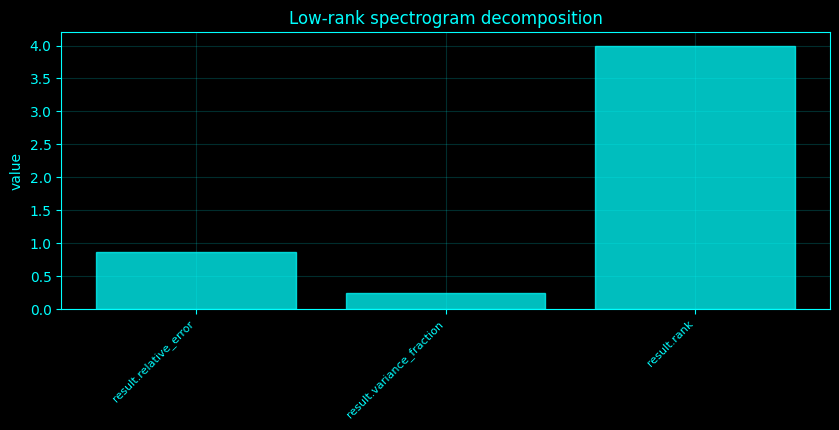

In [48]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _spectral_features():
    if 'features' in SPEC_CACHE:
        return SPEC_CACHE['features']
    f, P = _welch_all()
    _, BP = _bandpower_matrix()
    m = (f >= 2) & (f <= 45)
    slopes = []
    peaks = []
    entropy = []
    for j in range(C):
        xx = np.log10(f[m] + EPS)
        yy = np.log10(P[m, j] + EPS)
        coef = np.polyfit(xx, yy, 1)
        slopes.append(-coef[0])
        mm = (f >= 6) & (f <= 30)
        peaks.append(float(f[mm][np.argmax(P[mm, j])]))
        pp = P[m, j] / (np.sum(P[m, j]) + EPS)
        entropy.append(float(-np.sum(pp * np.log(pp + EPS))))
    F = np.column_stack([np.log(BP + EPS), slopes, peaks, entropy])
    F = (F - np.mean(F, axis=0)) / (np.std(F, axis=0) + EPS)
    SPEC_CACHE['features'] = (F, np.asarray(slopes), np.asarray(peaks), np.asarray(entropy))
    return SPEC_CACHE['features']

# Method-specific calculation.
def _compute_method_342():
    idx = 342
    name = 'Low-rank spectrogram decomposition'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    F, slopes, peaks, ent = _spectral_features()
    aidx = list(BANDS).index('alpha')
    _, BP = _bandpower_matrix()
    ff, tt, S, _ = _stft_summary()
    Q = np.log(S[:, 0, :] + EPS).T
    Qs = (Q - Q.mean(0)) / (Q.std(0) + EPS)
    U, s, Vh = np.linalg.svd(Qs, full_matrices=False)
    r = min(_SPEED['rank'], len(s))
    R = U[:, :r] * s[:r] @ Vh[:r]
    return ({'rank': r, 'variance_fraction': float(np.sum(s[:r] ** 2) / (np.sum(s ** 2) + EPS)), 'relative_error': float(np.linalg.norm(Qs - R) / (np.linalg.norm(Qs) + EPS))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_342,_plot_spec=_compute_method_342()
print('Low-rank spectrogram decomposition')
if isinstance(result_342,dict):
    for _k,_v in result_342.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_342)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_342)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Low-rank spectrogram decomposition',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Low-rank spectrogram decomposition',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Low-rank spectrogram decomposition',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">343. Harmonic-to-noise ratio</h3>
<p>Harmonic-to-noise ratio compares power at integer multiples of the dominant fundamental with remaining in-band power: \(HNR=10\log_{10}(P_{harm}/P_{noise})\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Harmonic-to-noise ratio
  fundamental_hz: 10.498046875
  harmonic_to_noise_ratio_db: -14.7119145296315


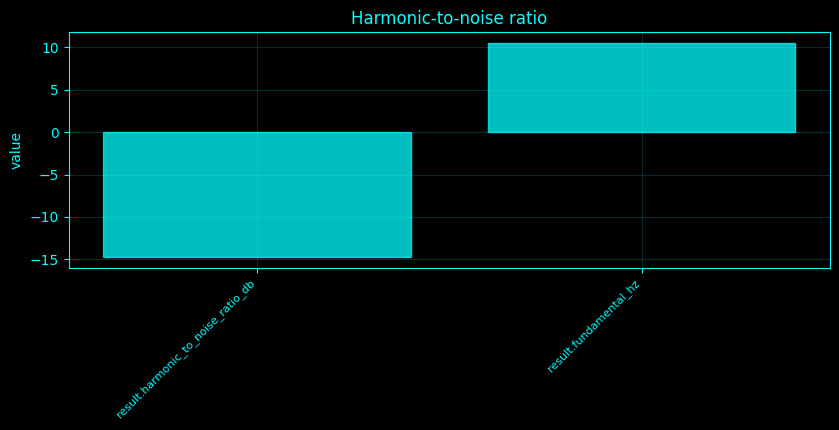

In [49]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _harmonic_metrics():
    if 'harmonic' in SPEC_CACHE:
        return SPEC_CACHE['harmonic']
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    mm = (f >= 4) & (f <= 20)
    f0 = float(f[mm][np.argmax(p[mm])])
    peaks, _ = signal.find_peaks(p, prominence=max(np.std(p) * 0.1, EPS))
    pf = f[peaks]
    pv = p[peaks]
    SPEC_CACHE['harmonic'] = (f, p, f0, pf, pv)
    return SPEC_CACHE['harmonic']

# Method-specific calculation.
def _compute_method_343():
    idx = 343
    name = 'Harmonic-to-noise ratio'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, p, f0, pf, pv = _harmonic_metrics()
    harmonics = []
    for n in range(1, 6):
        fh = n * f0
        if fh > f[-1]:
            break
        harmonics.append(np.abs(f - fh).argmin())
    harm_power = np.sum(p[harmonics])
    mask = (f >= 2) & (f <= 45)
    noise = np.sum(p[mask]) - harm_power
    return ({'fundamental_hz': f0, 'harmonic_to_noise_ratio_db': float(10 * np.log10((harm_power + EPS) / (noise + EPS)))}, locals().get('__plot_spec', None))
    k0 = np.argmin(np.abs(f - f0))
    peak = p[k0]
    half = peak / 2
    il = k0
    while il > 0 and p[il] > half:
        il -= 1
    ir = k0
    while ir < len(p) - 1 and p[ir] > half:
        ir += 1
    bw = max(float(f[ir] - f[il]), float(f[1] - f[0]) if len(f) > 1 else EPS)
    Q = f0 / (bw + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_343,_plot_spec=_compute_method_343()
print('Harmonic-to-noise ratio')
if isinstance(result_343,dict):
    for _k,_v in result_343.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_343)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_343)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Harmonic-to-noise ratio',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Harmonic-to-noise ratio',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Harmonic-to-noise ratio',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">344. Subharmonic detection</h3>
<p>Subharmonic detection tests for excess spectral power near \(f_0/2\) relative to its local spectral background.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Subharmonic detection
  subharmonic_hz: 5.126953125
  subharmonic_to_local_median: 0.9867533216554233


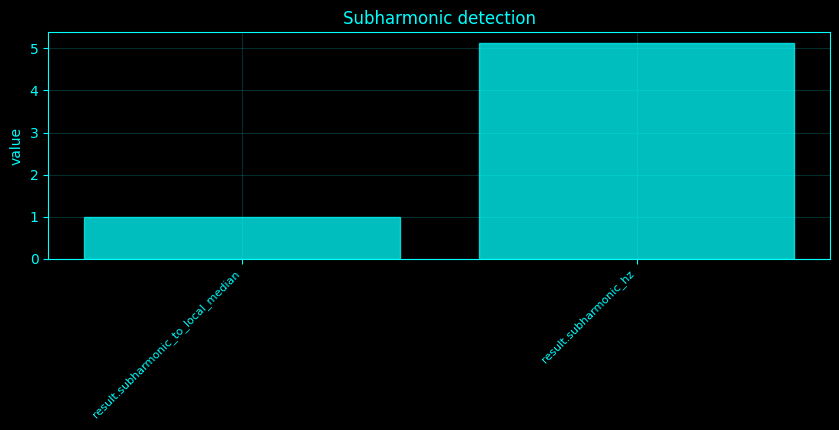

In [50]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _harmonic_metrics():
    if 'harmonic' in SPEC_CACHE:
        return SPEC_CACHE['harmonic']
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    mm = (f >= 4) & (f <= 20)
    f0 = float(f[mm][np.argmax(p[mm])])
    peaks, _ = signal.find_peaks(p, prominence=max(np.std(p) * 0.1, EPS))
    pf = f[peaks]
    pv = p[peaks]
    SPEC_CACHE['harmonic'] = (f, p, f0, pf, pv)
    return SPEC_CACHE['harmonic']

# Method-specific calculation.
def _compute_method_344():
    idx = 344
    name = 'Subharmonic detection'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, p, f0, pf, pv = _harmonic_metrics()
    target = f0 / 2
    k = np.argmin(np.abs(f - target))
    local = (f >= max(1, target - 1)) & (f <= target + 1)
    bg = np.median(p[local]) if np.any(local) else np.median(p)
    return ({'subharmonic_hz': float(f[k]), 'subharmonic_to_local_median': float(p[k] / (bg + EPS))}, locals().get('__plot_spec', None))
    k0 = np.argmin(np.abs(f - f0))
    peak = p[k0]
    half = peak / 2
    il = k0
    while il > 0 and p[il] > half:
        il -= 1
    ir = k0
    while ir < len(p) - 1 and p[ir] > half:
        ir += 1
    bw = max(float(f[ir] - f[il]), float(f[1] - f[0]) if len(f) > 1 else EPS)
    Q = f0 / (bw + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_344,_plot_spec=_compute_method_344()
print('Subharmonic detection')
if isinstance(result_344,dict):
    for _k,_v in result_344.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_344)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_344)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Subharmonic detection',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Subharmonic detection',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Subharmonic detection',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">345. Interharmonic detection</h3>
<p>Interharmonics are peaks not close to integer multiples of the fundamental. The cell reports their frequency offsets from the nearest harmonic grid.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Interharmonic detection
  n_peaks: 2
  median_interharmonic_offset_hz: 4.0283203125


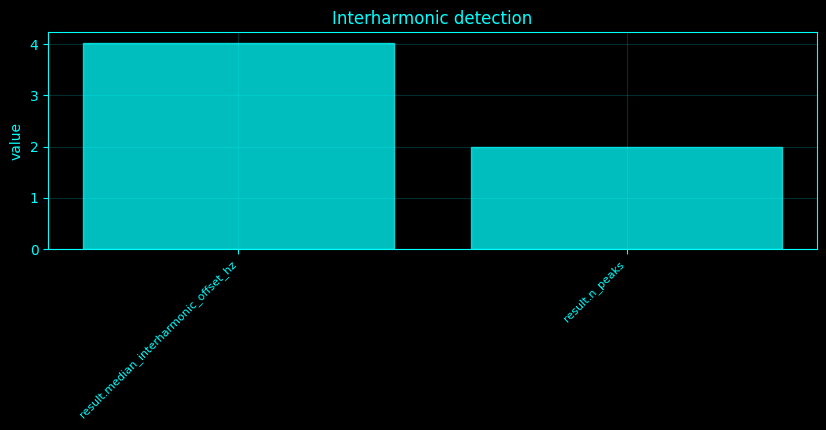

In [51]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _harmonic_metrics():
    if 'harmonic' in SPEC_CACHE:
        return SPEC_CACHE['harmonic']
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    mm = (f >= 4) & (f <= 20)
    f0 = float(f[mm][np.argmax(p[mm])])
    peaks, _ = signal.find_peaks(p, prominence=max(np.std(p) * 0.1, EPS))
    pf = f[peaks]
    pv = p[peaks]
    SPEC_CACHE['harmonic'] = (f, p, f0, pf, pv)
    return SPEC_CACHE['harmonic']

# Method-specific calculation.
def _compute_method_345():
    idx = 345
    name = 'Interharmonic detection'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, p, f0, pf, pv = _harmonic_metrics()
    peaks = pf[(pf >= 2) & (pf <= 45)]
    residual = []
    for q in peaks:
        n = max(1, round(q / f0))
        residual.append(min(abs(q - n * f0), abs(q - (n + 0.5) * f0)))
    return ({'n_peaks': len(peaks), 'median_interharmonic_offset_hz': float(np.median(residual)) if residual else np.nan}, locals().get('__plot_spec', None))
    k0 = np.argmin(np.abs(f - f0))
    peak = p[k0]
    half = peak / 2
    il = k0
    while il > 0 and p[il] > half:
        il -= 1
    ir = k0
    while ir < len(p) - 1 and p[ir] > half:
        ir += 1
    bw = max(float(f[ir] - f[il]), float(f[1] - f[0]) if len(f) > 1 else EPS)
    Q = f0 / (bw + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_345,_plot_spec=_compute_method_345()
print('Interharmonic detection')
if isinstance(result_345,dict):
    for _k,_v in result_345.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_345)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_345)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Interharmonic detection',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Interharmonic detection',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Interharmonic detection',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">346. Harmonic stability analysis</h3>
<p>Harmonic stability tracks the dominant 4–30-Hz peak across windows and summarizes its temporal standard deviation.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Harmonic stability analysis
  mean_peak_hz: 8.219835421984993
  peak_sd_hz: 3.9594046943937937


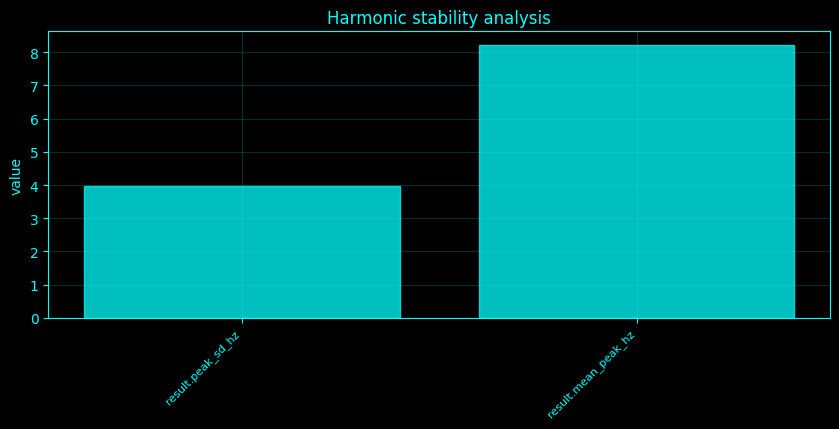

In [52]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _harmonic_metrics():
    if 'harmonic' in SPEC_CACHE:
        return SPEC_CACHE['harmonic']
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    mm = (f >= 4) & (f <= 20)
    f0 = float(f[mm][np.argmax(p[mm])])
    peaks, _ = signal.find_peaks(p, prominence=max(np.std(p) * 0.1, EPS))
    pf = f[peaks]
    pv = p[peaks]
    SPEC_CACHE['harmonic'] = (f, p, f0, pf, pv)
    return SPEC_CACHE['harmonic']

def _psd_of(data, fs=None, nperseg=None, window='hann', detrend='constant'):
    fs = _fs if fs is None else fs
    nperseg = min(int(nperseg or _SPEED['nperseg']), len(data))
    f, p = signal.welch(data, fs=fs, axis=0, nperseg=nperseg, noverlap=nperseg // 2, window=window, detrend=detrend, scaling='density')
    keep = f <= min(55, 0.49 * fs)
    return (f[keep], p[keep])

# Method-specific calculation.
def _compute_method_346():
    idx = 346
    name = 'Harmonic stability analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, p, f0, pf, pv = _harmonic_metrics()
    tt, W = _window_bandpower()
    nwin = len(tt)
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    traj = []
    for a, b in zip(edges[:-1], edges[1:]):
        ff, pp = _psd_of(X[a:b, [0]], nperseg=min(max(32, b - a), _SPEED['nperseg']))
        m = (ff >= 4) & (ff <= 30)
        traj.append(float(ff[m][np.argmax(pp[m, 0])]) if np.any(m) else np.nan)
    return ({'mean_peak_hz': float(np.nanmean(traj)), 'peak_sd_hz': float(np.nanstd(traj))}, locals().get('__plot_spec', None))
    k0 = np.argmin(np.abs(f - f0))
    peak = p[k0]
    half = peak / 2
    il = k0
    while il > 0 and p[il] > half:
        il -= 1
    ir = k0
    while ir < len(p) - 1 and p[ir] > half:
        ir += 1
    bw = max(float(f[ir] - f[il]), float(f[1] - f[0]) if len(f) > 1 else EPS)
    Q = f0 / (bw + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_346,_plot_spec=_compute_method_346()
print('Harmonic stability analysis')
if isinstance(result_346,dict):
    for _k,_v in result_346.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_346)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_346)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Harmonic stability analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Harmonic stability analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Harmonic stability analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">347. Harmonic phase locking</h3>
<p>For a 2:1 harmonic relation, harmonic phase locking is \(R=|\langle e^{i(2\phi_{f_0}-\phi_{2f_0})}\rangle|\). It equals one for a perfectly stable quadratic phase relation.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [53]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _harmonic_metrics():
    if 'harmonic' in SPEC_CACHE:
        return SPEC_CACHE['harmonic']
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    mm = (f >= 4) & (f <= 20)
    f0 = float(f[mm][np.argmax(p[mm])])
    peaks, _ = signal.find_peaks(p, prominence=max(np.std(p) * 0.1, EPS))
    pf = f[peaks]
    pv = p[peaks]
    SPEC_CACHE['harmonic'] = (f, p, f0, pf, pv)
    return SPEC_CACHE['harmonic']

# Method-specific calculation.
def _compute_method_347():
    idx = 347
    name = 'Harmonic phase locking'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, p, f0, pf, pv = _harmonic_metrics()
    bw = max(1.0, 0.12 * f0)
    b1 = (max(1, f0 - bw), min(0.45 * _fs, f0 + bw))
    b2 = (max(1, 2 * f0 - bw), min(0.45 * _fs, 2 * f0 + bw))
    if b2[0] >= b2[1]:
        return ({'status': 'second harmonic above analysis Nyquist'}, locals().get('__plot_spec', None))
    z1 = _analytic_band(b1)[:, 0]
    z2 = _analytic_band(b2)[:, 0]
    phase_lock = np.abs(np.mean(np.exp(1j * (2 * np.angle(z1) - np.angle(z2)))))
    return ({'2:1_harmonic_phase_locking': float(phase_lock)}, locals().get('__plot_spec', None))
    u = (z1 / (np.abs(z1) + EPS)) ** 2
    v = z2 / (np.abs(z2) + EPS)
    coh = np.abs(np.mean(u * np.conj(v))) ** 2
    return ({'harmonic_phase_coherence': float(coh)}, locals().get('__plot_spec', None))
    k0 = np.argmin(np.abs(f - f0))
    peak = p[k0]
    half = peak / 2
    il = k0
    while il > 0 and p[il] > half:
        il -= 1
    ir = k0
    while ir < len(p) - 1 and p[ir] > half:
        ir += 1
    bw = max(float(f[ir] - f[il]), float(f[1] - f[0]) if len(f) > 1 else EPS)
    Q = f0 / (bw + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_347,_plot_spec=_compute_method_347()
print('Harmonic phase locking')
if isinstance(result_347,dict):
    for _k,_v in result_347.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_347)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_347)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Harmonic phase locking',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Harmonic phase locking',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Harmonic phase locking',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Harmonic phase locking
  2:1_harmonic_phase_locking: 0.0717467148864045


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">348. Harmonic coherence</h3>
<p>Harmonic coherence is computed after phase-only frequency translation: the squared fundamental phasor is compared with the second-harmonic phasor, \(|\langle u_{f_0}^2u_{2f_0}^*\rangle|^2\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [54]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _harmonic_metrics():
    if 'harmonic' in SPEC_CACHE:
        return SPEC_CACHE['harmonic']
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    mm = (f >= 4) & (f <= 20)
    f0 = float(f[mm][np.argmax(p[mm])])
    peaks, _ = signal.find_peaks(p, prominence=max(np.std(p) * 0.1, EPS))
    pf = f[peaks]
    pv = p[peaks]
    SPEC_CACHE['harmonic'] = (f, p, f0, pf, pv)
    return SPEC_CACHE['harmonic']

# Method-specific calculation.
def _compute_method_348():
    idx = 348
    name = 'Harmonic coherence'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, p, f0, pf, pv = _harmonic_metrics()
    bw = max(1.0, 0.12 * f0)
    b1 = (max(1, f0 - bw), min(0.45 * _fs, f0 + bw))
    b2 = (max(1, 2 * f0 - bw), min(0.45 * _fs, 2 * f0 + bw))
    if b2[0] >= b2[1]:
        return ({'status': 'second harmonic above analysis Nyquist'}, locals().get('__plot_spec', None))
    z1 = _analytic_band(b1)[:, 0]
    z2 = _analytic_band(b2)[:, 0]
    phase_lock = np.abs(np.mean(np.exp(1j * (2 * np.angle(z1) - np.angle(z2)))))
    u = (z1 / (np.abs(z1) + EPS)) ** 2
    v = z2 / (np.abs(z2) + EPS)
    coh = np.abs(np.mean(u * np.conj(v))) ** 2
    return ({'harmonic_phase_coherence': float(coh)}, locals().get('__plot_spec', None))
    k0 = np.argmin(np.abs(f - f0))
    peak = p[k0]
    half = peak / 2
    il = k0
    while il > 0 and p[il] > half:
        il -= 1
    ir = k0
    while ir < len(p) - 1 and p[ir] > half:
        ir += 1
    bw = max(float(f[ir] - f[il]), float(f[1] - f[0]) if len(f) > 1 else EPS)
    Q = f0 / (bw + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_348,_plot_spec=_compute_method_348()
print('Harmonic coherence')
if isinstance(result_348,dict):
    for _k,_v in result_348.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_348)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_348)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Harmonic coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Harmonic coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Harmonic coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Harmonic coherence
  harmonic_phase_coherence: 0.0051475910947910725


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">349. Harmonic cascade metrics</h3>
<p>Harmonic cascade metrics compare powers at \(nf_0\) with the fundamental and fit the decay of log harmonic power versus harmonic number.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Harmonic cascade metrics
  harmonic_relative_powers: array(4,), mean=0.0753833
  cascade_decay_slope: -0.7477211080394306


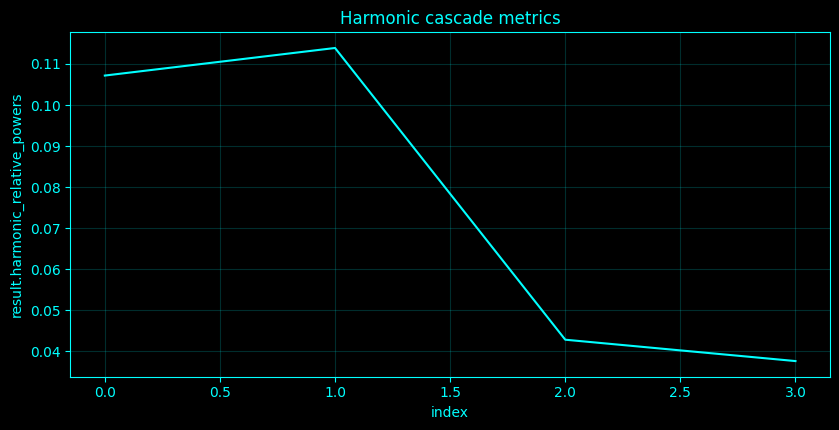

In [55]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _harmonic_metrics():
    if 'harmonic' in SPEC_CACHE:
        return SPEC_CACHE['harmonic']
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    mm = (f >= 4) & (f <= 20)
    f0 = float(f[mm][np.argmax(p[mm])])
    peaks, _ = signal.find_peaks(p, prominence=max(np.std(p) * 0.1, EPS))
    pf = f[peaks]
    pv = p[peaks]
    SPEC_CACHE['harmonic'] = (f, p, f0, pf, pv)
    return SPEC_CACHE['harmonic']

# Method-specific calculation.
def _compute_method_349():
    idx = 349
    name = 'Harmonic cascade metrics'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, p, f0, pf, pv = _harmonic_metrics()
    vals = []
    for n in range(1, 6):
        fh = n * f0
        if fh > f[-1]:
            break
        k = np.argmin(np.abs(f - fh))
        vals.append(float(p[k]))
    ratios = [vals[i] / (vals[0] + EPS) for i in range(1, len(vals))]
    return ({'harmonic_relative_powers': ratios, 'cascade_decay_slope': float(np.polyfit(np.arange(1, len(vals) + 1), np.log(np.array(vals) + EPS), 1)[0]) if len(vals) >= 2 else np.nan}, locals().get('__plot_spec', None))
    k0 = np.argmin(np.abs(f - f0))
    peak = p[k0]
    half = peak / 2
    il = k0
    while il > 0 and p[il] > half:
        il -= 1
    ir = k0
    while ir < len(p) - 1 and p[ir] > half:
        ir += 1
    bw = max(float(f[ir] - f[il]), float(f[1] - f[0]) if len(f) > 1 else EPS)
    Q = f0 / (bw + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_349,_plot_spec=_compute_method_349()
print('Harmonic cascade metrics')
if isinstance(result_349,dict):
    for _k,_v in result_349.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_349)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_349)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Harmonic cascade metrics',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Harmonic cascade metrics',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Harmonic cascade metrics',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">350. Resonance Q-factor estimation</h3>
<p>The resonance quality factor is \(Q=f_0/\Delta f_{FWHM}\), where \(\Delta f_{FWHM}\) is the half-power bandwidth.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Resonance Q-factor estimation
  f0_hz: 10.498046875
  Q_factor: 7.166666666661774


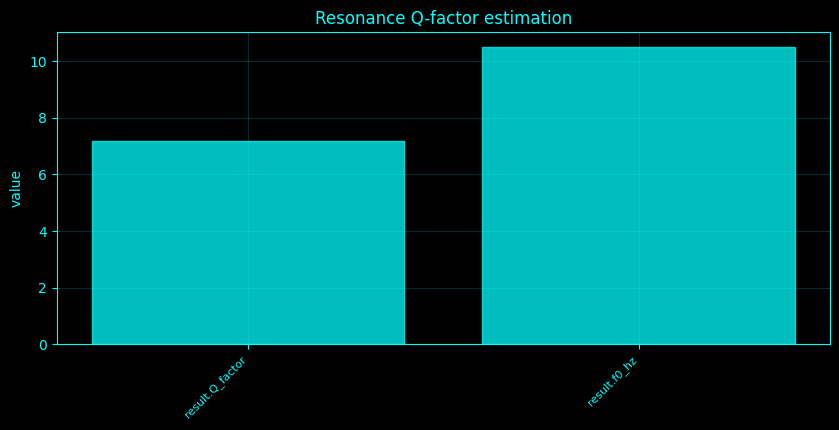

In [56]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _harmonic_metrics():
    if 'harmonic' in SPEC_CACHE:
        return SPEC_CACHE['harmonic']
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    mm = (f >= 4) & (f <= 20)
    f0 = float(f[mm][np.argmax(p[mm])])
    peaks, _ = signal.find_peaks(p, prominence=max(np.std(p) * 0.1, EPS))
    pf = f[peaks]
    pv = p[peaks]
    SPEC_CACHE['harmonic'] = (f, p, f0, pf, pv)
    return SPEC_CACHE['harmonic']

# Method-specific calculation.
def _compute_method_350():
    idx = 350
    name = 'Resonance Q-factor estimation'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, p, f0, pf, pv = _harmonic_metrics()
    k0 = np.argmin(np.abs(f - f0))
    peak = p[k0]
    half = peak / 2
    il = k0
    while il > 0 and p[il] > half:
        il -= 1
    ir = k0
    while ir < len(p) - 1 and p[ir] > half:
        ir += 1
    bw = max(float(f[ir] - f[il]), float(f[1] - f[0]) if len(f) > 1 else EPS)
    Q = f0 / (bw + EPS)
    return ({'f0_hz': f0, 'Q_factor': float(Q)}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_350,_plot_spec=_compute_method_350()
print('Resonance Q-factor estimation')
if isinstance(result_350,dict):
    for _k,_v in result_350.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_350)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_350)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Resonance Q-factor estimation',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Resonance Q-factor estimation',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Resonance Q-factor estimation',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">351. Resonance bandwidth estimation</h3>
<p>Resonance bandwidth is estimated as the full width between frequencies where spectral power falls below half the peak power.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [57]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _harmonic_metrics():
    if 'harmonic' in SPEC_CACHE:
        return SPEC_CACHE['harmonic']
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    mm = (f >= 4) & (f <= 20)
    f0 = float(f[mm][np.argmax(p[mm])])
    peaks, _ = signal.find_peaks(p, prominence=max(np.std(p) * 0.1, EPS))
    pf = f[peaks]
    pv = p[peaks]
    SPEC_CACHE['harmonic'] = (f, p, f0, pf, pv)
    return SPEC_CACHE['harmonic']

# Method-specific calculation.
def _compute_method_351():
    idx = 351
    name = 'Resonance bandwidth estimation'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, p, f0, pf, pv = _harmonic_metrics()
    k0 = np.argmin(np.abs(f - f0))
    peak = p[k0]
    half = peak / 2
    il = k0
    while il > 0 and p[il] > half:
        il -= 1
    ir = k0
    while ir < len(p) - 1 and p[ir] > half:
        ir += 1
    bw = max(float(f[ir] - f[il]), float(f[1] - f[0]) if len(f) > 1 else EPS)
    Q = f0 / (bw + EPS)
    return ({'FWHM_hz': float(bw)}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_351,_plot_spec=_compute_method_351()
print('Resonance bandwidth estimation')
if isinstance(result_351,dict):
    for _k,_v in result_351.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_351)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_351)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Resonance bandwidth estimation',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Resonance bandwidth estimation',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Resonance bandwidth estimation',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Resonance bandwidth estimation
  FWHM_hz: 1.46484375


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">352. Resonance damping estimation</h3>
<p>For a lightly damped second-order resonance, the damping ratio is approximately \(\zeta\approx1/(2Q)\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [58]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _harmonic_metrics():
    if 'harmonic' in SPEC_CACHE:
        return SPEC_CACHE['harmonic']
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    mm = (f >= 4) & (f <= 20)
    f0 = float(f[mm][np.argmax(p[mm])])
    peaks, _ = signal.find_peaks(p, prominence=max(np.std(p) * 0.1, EPS))
    pf = f[peaks]
    pv = p[peaks]
    SPEC_CACHE['harmonic'] = (f, p, f0, pf, pv)
    return SPEC_CACHE['harmonic']

# Method-specific calculation.
def _compute_method_352():
    idx = 352
    name = 'Resonance damping estimation'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, p, f0, pf, pv = _harmonic_metrics()
    k0 = np.argmin(np.abs(f - f0))
    peak = p[k0]
    half = peak / 2
    il = k0
    while il > 0 and p[il] > half:
        il -= 1
    ir = k0
    while ir < len(p) - 1 and p[ir] > half:
        ir += 1
    bw = max(float(f[ir] - f[il]), float(f[1] - f[0]) if len(f) > 1 else EPS)
    Q = f0 / (bw + EPS)
    return ({'damping_ratio_zeta': float(1 / (2 * Q + EPS))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_352,_plot_spec=_compute_method_352()
print('Resonance damping estimation')
if isinstance(result_352,dict):
    for _k,_v in result_352.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_352)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_352)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Resonance damping estimation',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Resonance damping estimation',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Resonance damping estimation',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Resonance damping estimation
  damping_ratio_zeta: 0.06976744186050787


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">353. Resonance peak lifetime</h3>
<p>For an exponentially decaying lightly damped oscillator, the amplitude decay time constant is approximately \(\tau=Q/(\pi f_0)\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [59]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _harmonic_metrics():
    if 'harmonic' in SPEC_CACHE:
        return SPEC_CACHE['harmonic']
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    mm = (f >= 4) & (f <= 20)
    f0 = float(f[mm][np.argmax(p[mm])])
    peaks, _ = signal.find_peaks(p, prominence=max(np.std(p) * 0.1, EPS))
    pf = f[peaks]
    pv = p[peaks]
    SPEC_CACHE['harmonic'] = (f, p, f0, pf, pv)
    return SPEC_CACHE['harmonic']

# Method-specific calculation.
def _compute_method_353():
    idx = 353
    name = 'Resonance peak lifetime'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, p, f0, pf, pv = _harmonic_metrics()
    k0 = np.argmin(np.abs(f - f0))
    peak = p[k0]
    half = peak / 2
    il = k0
    while il > 0 and p[il] > half:
        il -= 1
    ir = k0
    while ir < len(p) - 1 and p[ir] > half:
        ir += 1
    bw = max(float(f[ir] - f[il]), float(f[1] - f[0]) if len(f) > 1 else EPS)
    Q = f0 / (bw + EPS)
    return ({'amplitude_decay_time_s': float(Q / (np.pi * f0 + EPS))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_353,_plot_spec=_compute_method_353()
print('Resonance peak lifetime')
if isinstance(result_353,dict):
    for _k,_v in result_353.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_353)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_353)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Resonance peak lifetime',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Resonance peak lifetime',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Resonance peak lifetime',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Resonance peak lifetime
  amplitude_decay_time_s: 0.2172995489679795


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">354. Resonance ridge tracking</h3>
<p>Resonance ridge tracking follows the frequency of maximal spectrogram power within the resonance search band at each time bin.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Resonance ridge tracking
  ridge_mean_hz: 7.396024816176471
  ridge_sd_hz: 4.295355412216341


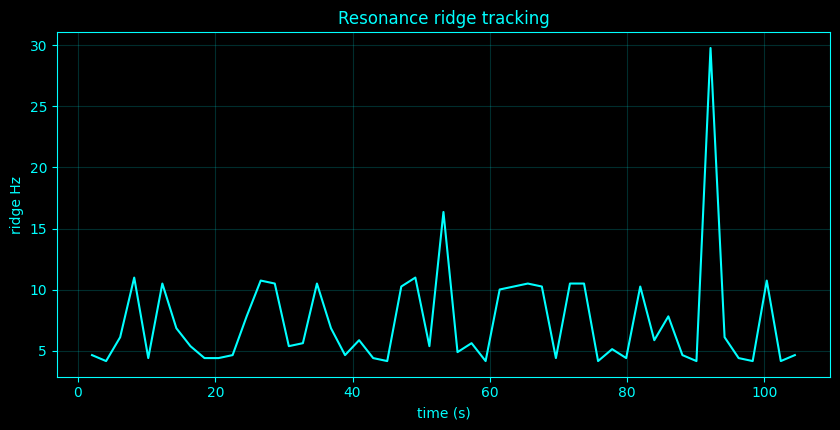

In [60]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _harmonic_metrics():
    if 'harmonic' in SPEC_CACHE:
        return SPEC_CACHE['harmonic']
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    mm = (f >= 4) & (f <= 20)
    f0 = float(f[mm][np.argmax(p[mm])])
    peaks, _ = signal.find_peaks(p, prominence=max(np.std(p) * 0.1, EPS))
    pf = f[peaks]
    pv = p[peaks]
    SPEC_CACHE['harmonic'] = (f, p, f0, pf, pv)
    return SPEC_CACHE['harmonic']

# Method-specific calculation.
def _compute_method_354():
    idx = 354
    name = 'Resonance ridge tracking'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, p, f0, pf, pv = _harmonic_metrics()
    k0 = np.argmin(np.abs(f - f0))
    peak = p[k0]
    half = peak / 2
    il = k0
    while il > 0 and p[il] > half:
        il -= 1
    ir = k0
    while ir < len(p) - 1 and p[ir] > half:
        ir += 1
    bw = max(float(f[ir] - f[il]), float(f[1] - f[0]) if len(f) > 1 else EPS)
    Q = f0 / (bw + EPS)
    ff, tt, S, _ = _stft_summary()
    Z = S[:, 0, :]
    m = (ff >= 4) & (ff <= 30)
    ridge = ff[m][np.argmax(Z[m], axis=0)]
    __plot_spec = ('summary', ridge, name, tt, 'time (s)', 'ridge Hz')
    return ({'ridge_mean_hz': float(np.mean(ridge)), 'ridge_sd_hz': float(np.std(ridge))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_354,_plot_spec=_compute_method_354()
print('Resonance ridge tracking')
if isinstance(result_354,dict):
    for _k,_v in result_354.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_354)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_354)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Resonance ridge tracking',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Resonance ridge tracking',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Resonance ridge tracking',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">355. Resonance network analysis</h3>
<p>A resonance network connects channels by similarity of their dominant resonance frequencies; edge weight decays exponentially with frequency mismatch.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [61]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _harmonic_metrics():
    if 'harmonic' in SPEC_CACHE:
        return SPEC_CACHE['harmonic']
    f, P = _welch_all()
    p = np.mean(P, axis=1)
    mm = (f >= 4) & (f <= 20)
    f0 = float(f[mm][np.argmax(p[mm])])
    peaks, _ = signal.find_peaks(p, prominence=max(np.std(p) * 0.1, EPS))
    pf = f[peaks]
    pv = p[peaks]
    SPEC_CACHE['harmonic'] = (f, p, f0, pf, pv)
    return SPEC_CACHE['harmonic']

# Method-specific calculation.
def _compute_method_355():
    idx = 355
    name = 'Resonance network analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, p, f0, pf, pv = _harmonic_metrics()
    k0 = np.argmin(np.abs(f - f0))
    peak = p[k0]
    half = peak / 2
    il = k0
    while il > 0 and p[il] > half:
        il -= 1
    ir = k0
    while ir < len(p) - 1 and p[ir] > half:
        ir += 1
    bw = max(float(f[ir] - f[il]), float(f[1] - f[0]) if len(f) > 1 else EPS)
    Q = f0 / (bw + EPS)
    fw, Pall = _welch_all()
    vals = []
    for j in range(C):
        mm = (fw >= 4) & (fw <= 30)
        fj = float(fw[mm][np.argmax(Pall[mm, j])])
        vals.append(fj)
    vals = np.asarray(vals)
    D = np.abs(vals[:, None] - vals[None, :])
    scale = np.median(D[D > 0]) + EPS if np.any(D > 0) else 1
    A = np.exp(-D / scale)
    np.fill_diagonal(A, 0)
    __plot_spec = ('summary', A, name, None, '', 'value')
    return ({'mean_resonance_similarity': float(np.mean(A[np.triu_indices(C, 1)]))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_355,_plot_spec=_compute_method_355()
print('Resonance network analysis')
if isinstance(result_355,dict):
    for _k,_v in result_355.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_355)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_355)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Resonance network analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Resonance network analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Resonance network analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Resonance network analysis
  mean_resonance_similarity: 0.7347129682278791


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">356. Spectral graph theory of EEG connectivity</h3>
<p>The weighted EEG connectivity graph is represented by adjacency \(W\) and normalized Laplacian \(L_n=D^{-1/2}(D-W)D^{-1/2}\). Its eigenvalues are graph frequencies; the second eigenvalue measures algebraic connectivity for a connected undirected graph.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral graph theory of EEG connectivity
  nodes: 12
  weighted_edges: 66
  lambda2: 0.8953934289414058
  lambda_max: 1.16101840393075


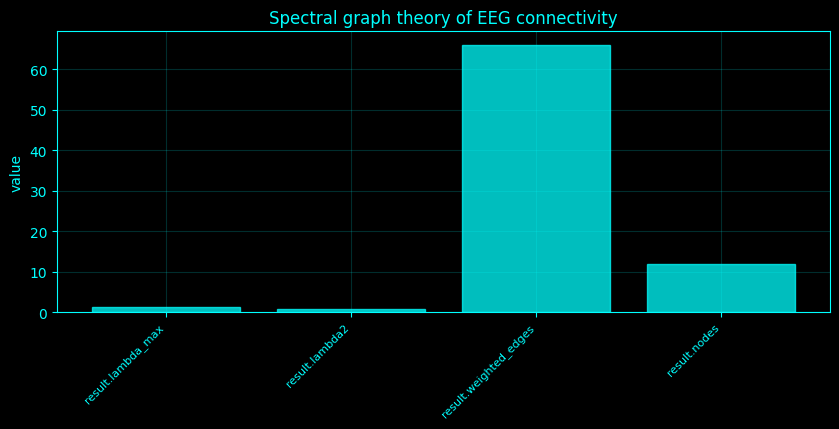

In [62]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _spectral_graph():
    if 'sgraph' in SPEC_CACHE:
        return SPEC_CACHE['sgraph']
    A = np.array(_coherence_matrix(BANDS['alpha']), float)
    np.fill_diagonal(A, 0)
    D = np.diag(A.sum(1) + EPS)
    L = D - A
    d = np.diag(D)
    Din = np.diag(1 / np.sqrt(d + EPS))
    Ln = Din @ L @ Din
    lam, U = np.linalg.eigh((Ln + Ln.T) / 2)
    SPEC_CACHE['sgraph'] = (A, L, Ln, lam, U)
    return SPEC_CACHE['sgraph']

# Method-specific calculation.
def _compute_method_356():
    idx = 356
    name = 'Spectral graph theory of EEG connectivity'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    A, L, Ln, lam, U = _spectral_graph()
    _, BP = _bandpower_matrix()
    return ({'nodes': C, 'weighted_edges': int(C * (C - 1) / 2), 'lambda2': float(lam[1]) if C > 1 else 0, 'lambda_max': float(lam[-1])}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_356,_plot_spec=_compute_method_356()
print('Spectral graph theory of EEG connectivity')
if isinstance(result_356,dict):
    for _k,_v in result_356.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_356)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_356)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral graph theory of EEG connectivity',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral graph theory of EEG connectivity',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral graph theory of EEG connectivity',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">357. Laplacian eigenvalue spectrum of coherence networks</h3>
<p>The coherence graph is represented by adjacency \(W\) and normalized Laplacian \(L_n=D^{-1/2}(D-W)D^{-1/2}\). Its eigenvalues are graph frequencies; the second eigenvalue measures algebraic connectivity for a connected undirected graph.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [63]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _spectral_graph():
    if 'sgraph' in SPEC_CACHE:
        return SPEC_CACHE['sgraph']
    A = np.array(_coherence_matrix(BANDS['alpha']), float)
    np.fill_diagonal(A, 0)
    D = np.diag(A.sum(1) + EPS)
    L = D - A
    d = np.diag(D)
    Din = np.diag(1 / np.sqrt(d + EPS))
    Ln = Din @ L @ Din
    lam, U = np.linalg.eigh((Ln + Ln.T) / 2)
    SPEC_CACHE['sgraph'] = (A, L, Ln, lam, U)
    return SPEC_CACHE['sgraph']

# Method-specific calculation.
def _compute_method_357():
    idx = 357
    name = 'Laplacian eigenvalue spectrum of coherence networks'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    A, L, Ln, lam, U = _spectral_graph()
    _, BP = _bandpower_matrix()
    __plot_spec = ('summary', lam, name, np.arange(C), 'mode', 'λ')
    return ({'coherence_graph_lambda2': float(lam[1]) if C > 1 else 0}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_357,_plot_spec=_compute_method_357()
print('Laplacian eigenvalue spectrum of coherence networks')
if isinstance(result_357,dict):
    for _k,_v in result_357.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_357)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_357)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Laplacian eigenvalue spectrum of coherence networks',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Laplacian eigenvalue spectrum of coherence networks',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Laplacian eigenvalue spectrum of coherence networks',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Laplacian eigenvalue spectrum of coherence networks
  coherence_graph_lambda2: 0.8953934289414058


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">358. Laplacian eigenvalue spectrum of PLV networks</h3>
<p>The PLV graph is represented by adjacency \(W\) and normalized Laplacian \(L_n=D^{-1/2}(D-W)D^{-1/2}\). Its eigenvalues are graph frequencies; the second eigenvalue measures algebraic connectivity for a connected undirected graph.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [64]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _spectral_graph():
    if 'sgraph' in SPEC_CACHE:
        return SPEC_CACHE['sgraph']
    A = np.array(_coherence_matrix(BANDS['alpha']), float)
    np.fill_diagonal(A, 0)
    D = np.diag(A.sum(1) + EPS)
    L = D - A
    d = np.diag(D)
    Din = np.diag(1 / np.sqrt(d + EPS))
    Ln = Din @ L @ Din
    lam, U = np.linalg.eigh((Ln + Ln.T) / 2)
    SPEC_CACHE['sgraph'] = (A, L, Ln, lam, U)
    return SPEC_CACHE['sgraph']

# Method-specific calculation.
def _compute_method_358():
    idx = 358
    name = 'Laplacian eigenvalue spectrum of PLV networks'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    A, L, Ln, lam, U = _spectral_graph()
    _, BP = _bandpower_matrix()
    M = _coherence_matrix(BANDS['alpha'], phase=True)
    np.fill_diagonal(M, 0)
    D = np.diag(M.sum(1) + EPS)
    Di = np.diag(1 / np.sqrt(np.diag(D) + EPS))
    Lv = Di @ (D - M) @ Di
    lv = np.linalg.eigvalsh((Lv + Lv.T) / 2)
    __plot_spec = ('summary', lv, name, None, '', 'value')
    return ({'PLV_lambda2': float(lv[1]) if C > 1 else 0}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_358,_plot_spec=_compute_method_358()
print('Laplacian eigenvalue spectrum of PLV networks')
if isinstance(result_358,dict):
    for _k,_v in result_358.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_358)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_358)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Laplacian eigenvalue spectrum of PLV networks',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Laplacian eigenvalue spectrum of PLV networks',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Laplacian eigenvalue spectrum of PLV networks',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Laplacian eigenvalue spectrum of PLV networks
  PLV_lambda2: 0.9712053913426317


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">359. Spectral graph wavelets on EEG networks</h3>
<p>Graph spectral wavelets are generated from the Laplacian eigendecomposition \(L=U\Lambda U^\top\). The implemented heat-kernel family is \(g_s(L)=Ue^{-s\Lambda}U^\top\), applied to an alpha-bandpower graph signal.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral graph wavelets on EEG networks
  scales: array(4,), mean=1.875


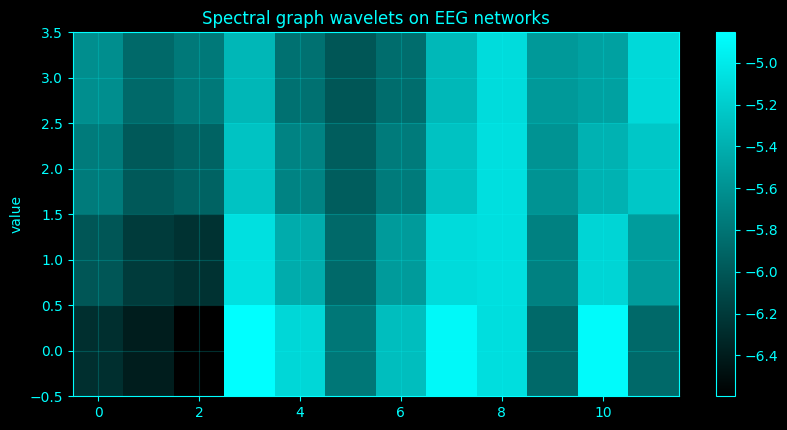

In [65]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _spectral_graph():
    if 'sgraph' in SPEC_CACHE:
        return SPEC_CACHE['sgraph']
    A = np.array(_coherence_matrix(BANDS['alpha']), float)
    np.fill_diagonal(A, 0)
    D = np.diag(A.sum(1) + EPS)
    L = D - A
    d = np.diag(D)
    Din = np.diag(1 / np.sqrt(d + EPS))
    Ln = Din @ L @ Din
    lam, U = np.linalg.eigh((Ln + Ln.T) / 2)
    SPEC_CACHE['sgraph'] = (A, L, Ln, lam, U)
    return SPEC_CACHE['sgraph']

# Method-specific calculation.
def _compute_method_359():
    idx = 359
    name = 'Spectral graph wavelets on EEG networks'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    A, L, Ln, lam, U = _spectral_graph()
    _, BP = _bandpower_matrix()
    x = np.log(BP[:, list(BANDS).index('alpha')] + EPS)
    scales = [0.5, 1, 2, 4]
    coeff = []
    for s in scales:
        coeff.append(U @ np.diag(np.exp(-s * lam)) @ U.T @ x)
    __plot_spec = ('summary', np.asarray(coeff), name, None, '', 'value')
    return ({'scales': scales}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_359,_plot_spec=_compute_method_359()
print('Spectral graph wavelets on EEG networks')
if isinstance(result_359,dict):
    for _k,_v in result_359.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_359)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_359)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral graph wavelets on EEG networks',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral graph wavelets on EEG networks',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral graph wavelets on EEG networks',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">360. Graph Fourier transform of bandpower maps</h3>
<p>The graph Fourier transform of node signal \(x\) is \(\hat x=U^\top x\), where columns of \(U\) are Laplacian eigenvectors.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [66]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _spectral_graph():
    if 'sgraph' in SPEC_CACHE:
        return SPEC_CACHE['sgraph']
    A = np.array(_coherence_matrix(BANDS['alpha']), float)
    np.fill_diagonal(A, 0)
    D = np.diag(A.sum(1) + EPS)
    L = D - A
    d = np.diag(D)
    Din = np.diag(1 / np.sqrt(d + EPS))
    Ln = Din @ L @ Din
    lam, U = np.linalg.eigh((Ln + Ln.T) / 2)
    SPEC_CACHE['sgraph'] = (A, L, Ln, lam, U)
    return SPEC_CACHE['sgraph']

# Method-specific calculation.
def _compute_method_360():
    idx = 360
    name = 'Graph Fourier transform of bandpower maps'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    A, L, Ln, lam, U = _spectral_graph()
    _, BP = _bandpower_matrix()
    x = np.log(BP[:, list(BANDS).index('alpha')] + EPS)
    xhat = U.T @ x
    __plot_spec = ('summary', np.abs(xhat) ** 2, name, lam, 'graph λ', 'energy')
    return ({'low_graph_frequency_energy_fraction': float(np.sum(np.abs(xhat[:max(1, C // 4)]) ** 2) / (np.sum(np.abs(xhat) ** 2) + EPS))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_360,_plot_spec=_compute_method_360()
print('Graph Fourier transform of bandpower maps')
if isinstance(result_360,dict):
    for _k,_v in result_360.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_360)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_360)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Graph Fourier transform of bandpower maps',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Graph Fourier transform of bandpower maps',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Graph Fourier transform of bandpower maps',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Graph Fourier transform of bandpower maps
  low_graph_frequency_energy_fraction: 0.9805424516989104


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">361. Graph spectral entropy</h3>
<p>Graph spectral entropy normalizes graph-Fourier energy \(q_k=|\hat x_k|^2/\sum_j|\hat x_j|^2\) and computes \(H=-\sum_kq_k\log q_k\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Graph spectral entropy
  graph_spectral_entropy: 0.1871161413062576
  normalized: 0.07530107471933459


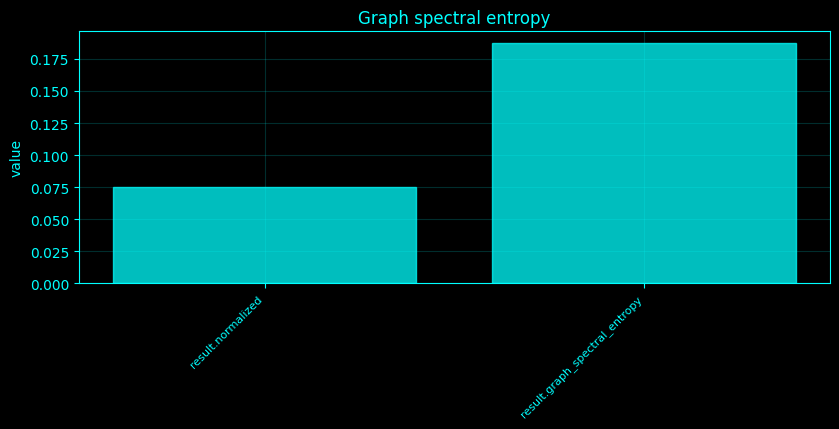

In [67]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _spectral_graph():
    if 'sgraph' in SPEC_CACHE:
        return SPEC_CACHE['sgraph']
    A = np.array(_coherence_matrix(BANDS['alpha']), float)
    np.fill_diagonal(A, 0)
    D = np.diag(A.sum(1) + EPS)
    L = D - A
    d = np.diag(D)
    Din = np.diag(1 / np.sqrt(d + EPS))
    Ln = Din @ L @ Din
    lam, U = np.linalg.eigh((Ln + Ln.T) / 2)
    SPEC_CACHE['sgraph'] = (A, L, Ln, lam, U)
    return SPEC_CACHE['sgraph']

# Method-specific calculation.
def _compute_method_361():
    idx = 361
    name = 'Graph spectral entropy'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    A, L, Ln, lam, U = _spectral_graph()
    _, BP = _bandpower_matrix()
    x = np.log(BP[:, list(BANDS).index('alpha')] + EPS)
    e = np.abs(U.T @ x) ** 2
    q = e / (e.sum() + EPS)
    H = -np.sum(q * np.log(q + EPS))
    return ({'graph_spectral_entropy': float(H), 'normalized': float(H / np.log(len(q)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_361,_plot_spec=_compute_method_361()
print('Graph spectral entropy')
if isinstance(result_361,dict):
    for _k,_v in result_361.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_361)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_361)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Graph spectral entropy',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Graph spectral entropy',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Graph spectral entropy',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">362. Graph spectral energy by frequency band</h3>
<p>For each EEG bandpower map, graph spectral energy is \(|U^\top x|^2\). The cell reports the fraction carried by the lowest graph-frequency modes.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Graph spectral energy by frequency band
  delta: 0.969119987769031
  theta: 0.97910935254947
  alpha: 0.9811262777030769
  beta: 0.9806844942550126
  gamma: 0.9825039137136014


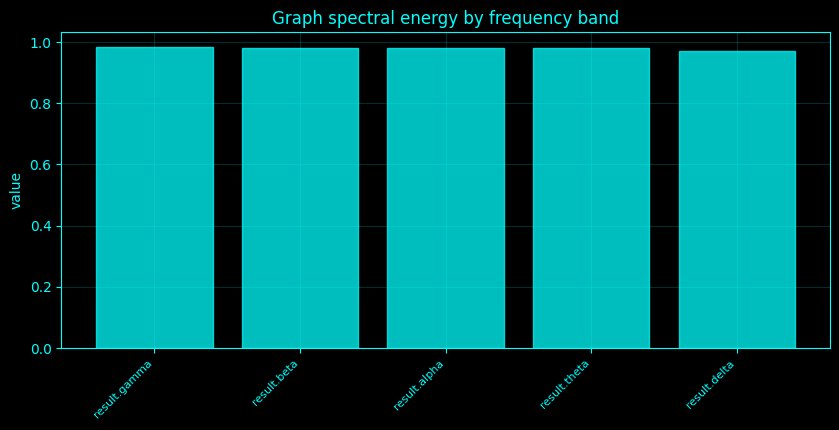

In [68]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _spectral_graph():
    if 'sgraph' in SPEC_CACHE:
        return SPEC_CACHE['sgraph']
    A = np.array(_coherence_matrix(BANDS['alpha']), float)
    np.fill_diagonal(A, 0)
    D = np.diag(A.sum(1) + EPS)
    L = D - A
    d = np.diag(D)
    Din = np.diag(1 / np.sqrt(d + EPS))
    Ln = Din @ L @ Din
    lam, U = np.linalg.eigh((Ln + Ln.T) / 2)
    SPEC_CACHE['sgraph'] = (A, L, Ln, lam, U)
    return SPEC_CACHE['sgraph']

# Method-specific calculation.
def _compute_method_362():
    idx = 362
    name = 'Graph spectral energy by frequency band'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    A, L, Ln, lam, U = _spectral_graph()
    _, BP = _bandpower_matrix()
    out = {}
    for bi, bn in enumerate(BANDS):
        x = np.log(BP[:, bi] + EPS)
        e = np.abs(U.T @ x) ** 2
        out[bn] = float(np.sum(e[:max(1, C // 3)]) / (np.sum(e) + EPS))
    return (out, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_362,_plot_spec=_compute_method_362()
print('Graph spectral energy by frequency band')
if isinstance(result_362,dict):
    for _k,_v in result_362.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_362)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_362)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Graph spectral energy by frequency band',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Graph spectral energy by frequency band',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Graph spectral energy by frequency band',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">363. Graph signal smoothness by EEG band</h3>
<p>Graph signal smoothness is the normalized Dirichlet energy \(x^\top Lx/(x^\top x)\); small values mean adjacent strongly connected electrodes have similar bandpower.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Graph signal smoothness by EEG band
  delta: 0.173188361543159
  theta: 0.11376884966119395
  alpha: 0.20226352621251817
  beta: 0.23332573376009216
  gamma: 0.20630878777744185


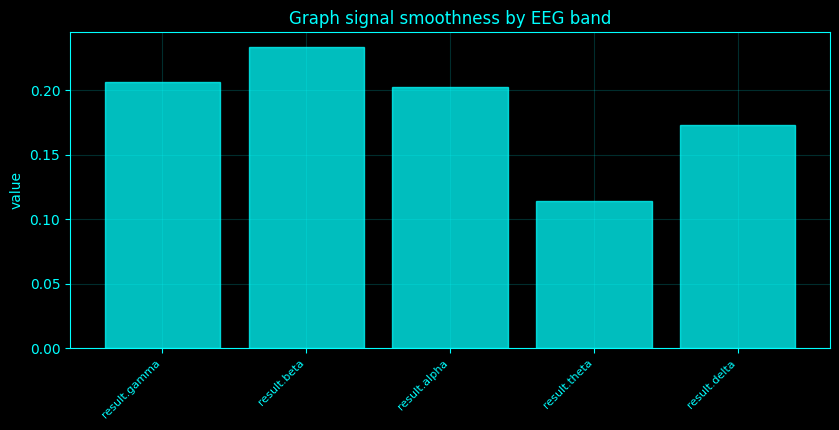

In [69]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _spectral_graph():
    if 'sgraph' in SPEC_CACHE:
        return SPEC_CACHE['sgraph']
    A = np.array(_coherence_matrix(BANDS['alpha']), float)
    np.fill_diagonal(A, 0)
    D = np.diag(A.sum(1) + EPS)
    L = D - A
    d = np.diag(D)
    Din = np.diag(1 / np.sqrt(d + EPS))
    Ln = Din @ L @ Din
    lam, U = np.linalg.eigh((Ln + Ln.T) / 2)
    SPEC_CACHE['sgraph'] = (A, L, Ln, lam, U)
    return SPEC_CACHE['sgraph']

# Method-specific calculation.
def _compute_method_363():
    idx = 363
    name = 'Graph signal smoothness by EEG band'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    A, L, Ln, lam, U = _spectral_graph()
    _, BP = _bandpower_matrix()
    out = {}
    for bi, bn in enumerate(BANDS):
        x = np.log(BP[:, bi] + EPS)
        out[bn] = float(x @ L @ x / (x @ x + EPS))
    return (out, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_363,_plot_spec=_compute_method_363()
print('Graph signal smoothness by EEG band')
if isinstance(result_363,dict):
    for _k,_v in result_363.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_363)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_363)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Graph signal smoothness by EEG band',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Graph signal smoothness by EEG band',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Graph signal smoothness by EEG band',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">364. Graph signal total variation</h3>
<p>Graph total variation is \(\tfrac12\sum_{ij}w_{ij}|x_i-x_j|\), an \(L^1\) measure of spatial variation over graph edges.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [70]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _spectral_graph():
    if 'sgraph' in SPEC_CACHE:
        return SPEC_CACHE['sgraph']
    A = np.array(_coherence_matrix(BANDS['alpha']), float)
    np.fill_diagonal(A, 0)
    D = np.diag(A.sum(1) + EPS)
    L = D - A
    d = np.diag(D)
    Din = np.diag(1 / np.sqrt(d + EPS))
    Ln = Din @ L @ Din
    lam, U = np.linalg.eigh((Ln + Ln.T) / 2)
    SPEC_CACHE['sgraph'] = (A, L, Ln, lam, U)
    return SPEC_CACHE['sgraph']

# Method-specific calculation.
def _compute_method_364():
    idx = 364
    name = 'Graph signal total variation'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    A, L, Ln, lam, U = _spectral_graph()
    _, BP = _bandpower_matrix()
    x = np.log(BP[:, list(BANDS).index('alpha')] + EPS)
    tv = 0.5 * np.sum(A * np.abs(x[:, None] - x[None, :]))
    return ({'alpha_graph_total_variation': float(tv)}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_364,_plot_spec=_compute_method_364()
print('Graph signal total variation')
if isinstance(result_364,dict):
    for _k,_v in result_364.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_364)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_364)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Graph signal total variation',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Graph signal total variation',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Graph signal total variation',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Graph signal total variation
  alpha_graph_total_variation: 45.23765798831839


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">365. Graph frequency localization</h3>
<p>Graph frequency localization is summarized by the energy-weighted graph-frequency centroid \(\bar\lambda=\sum_k\lambda_k|\hat x_k|^2/\sum_k|\hat x_k|^2\) and inverse participation of the spectral energy.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Graph frequency localization
  graph_frequency_centroid: 0.032453473677971155
  inverse_participation: 0.9414685360745186


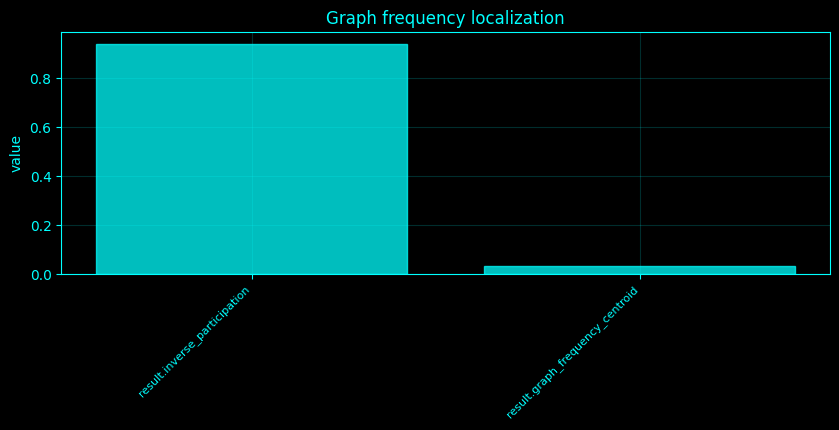

In [71]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _spectral_graph():
    if 'sgraph' in SPEC_CACHE:
        return SPEC_CACHE['sgraph']
    A = np.array(_coherence_matrix(BANDS['alpha']), float)
    np.fill_diagonal(A, 0)
    D = np.diag(A.sum(1) + EPS)
    L = D - A
    d = np.diag(D)
    Din = np.diag(1 / np.sqrt(d + EPS))
    Ln = Din @ L @ Din
    lam, U = np.linalg.eigh((Ln + Ln.T) / 2)
    SPEC_CACHE['sgraph'] = (A, L, Ln, lam, U)
    return SPEC_CACHE['sgraph']

# Method-specific calculation.
def _compute_method_365():
    idx = 365
    name = 'Graph frequency localization'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    A, L, Ln, lam, U = _spectral_graph()
    _, BP = _bandpower_matrix()
    x = np.log(BP[:, list(BANDS).index('alpha')] + EPS)
    e = np.abs(U.T @ x) ** 2
    centroid = float(np.sum(lam * e) / (np.sum(e) + EPS))
    return ({'graph_frequency_centroid': centroid, 'inverse_participation': float(np.sum((e / (e.sum() + EPS)) ** 2))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_365,_plot_spec=_compute_method_365()
print('Graph frequency localization')
if isinstance(result_365,dict):
    for _k,_v in result_365.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_365)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_365)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Graph frequency localization',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Graph frequency localization',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Graph frequency localization',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">366. Graph wavelet coherence</h3>
<p>Graph wavelet coherence here is a cross-scale consistency measure: dynamic bandpower maps are filtered by two heat-kernel graph scales and their channel-wise temporal correlations are summarized.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

In [72]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _bandpower_matrix():
    if 'bandpower' in SPEC_CACHE:
        return SPEC_CACHE['bandpower']
    f, P = _welch_all()
    M = np.vstack([_band_integral(P, f, b) for b in BANDS.values()]).T
    SPEC_CACHE['bandpower'] = (list(BANDS), M)
    return SPEC_CACHE['bandpower']

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _analytic_band(band):
    key = ('analytic', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    lo, hi = band
    hi = min(hi, 0.45 * _fs)
    sos = signal.butter(4, [lo / (0.5 * _fs), hi / (0.5 * _fs)], btype='bandpass', output='sos')
    A = signal.hilbert(signal.sosfiltfilt(sos, X, axis=0), axis=0)
    SPEC_CACHE[key] = A
    return A

def _coherence_matrix(band=(8, 13), phase=False):
    key = ('plv' if phase else 'coh', band)
    if key in SPEC_CACHE:
        return SPEC_CACHE[key]
    M = np.eye(C)
    if phase:
        ph = np.angle(_analytic_band(band))
        for i in range(C):
            for j in range(i + 1, C):
                v = np.abs(np.mean(np.exp(1j * (ph[:, i] - ph[:, j]))))
                M[i, j] = M[j, i] = v
    else:
        nper = min(int(_SPEED['nperseg']), N)
        for i in range(C):
            for j in range(i + 1, C):
                f, c = signal.coherence(X[:, i], X[:, j], fs=_fs, nperseg=nper, noverlap=nper // 2)
                m = (f >= band[0]) & (f < band[1])
                v = float(np.nanmean(c[m])) if np.any(m) else np.nan
                M[i, j] = M[j, i] = v
    SPEC_CACHE[key] = M
    return M

def _spectral_graph():
    if 'sgraph' in SPEC_CACHE:
        return SPEC_CACHE['sgraph']
    A = np.array(_coherence_matrix(BANDS['alpha']), float)
    np.fill_diagonal(A, 0)
    D = np.diag(A.sum(1) + EPS)
    L = D - A
    d = np.diag(D)
    Din = np.diag(1 / np.sqrt(d + EPS))
    Ln = Din @ L @ Din
    lam, U = np.linalg.eigh((Ln + Ln.T) / 2)
    SPEC_CACHE['sgraph'] = (A, L, Ln, lam, U)
    return SPEC_CACHE['sgraph']

# Method-specific calculation.
def _compute_method_366():
    idx = 366
    name = 'Graph wavelet coherence'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    A, L, Ln, lam, U = _spectral_graph()
    _, BP = _bandpower_matrix()
    t, W = _window_bandpower()
    alpha = np.log(W[:, :, list(BANDS).index('alpha')] + EPS)
    K1 = U @ np.diag(np.exp(-0.5 * lam)) @ U.T
    K2 = U @ np.diag(np.exp(-2 * lam)) @ U.T
    c1 = alpha @ K1.T
    c2 = alpha @ K2.T
    vals = [np.corrcoef(c1[:, j], c2[:, j])[0, 1] for j in range(C)]
    return ({'mean_cross_scale_graph_wavelet_coherence': float(np.nanmean(np.abs(vals)))}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_366,_plot_spec=_compute_method_366()
print('Graph wavelet coherence')
if isinstance(result_366,dict):
    for _k,_v in result_366.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_366)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_366)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Graph wavelet coherence',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Graph wavelet coherence',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Graph wavelet coherence',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


Graph wavelet coherence
  mean_cross_scale_graph_wavelet_coherence: 0.9612226956529185


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">367. Spectral dimensionality reduction</h3>
<p>Frequency-domain PCA applies PCA to standardized channel log spectra. The covariance eigendecomposition finds orthogonal spectral directions that maximize explained variance.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral dimensionality reduction
  components: 4
  cumulative_variance: 0.9943209814442456


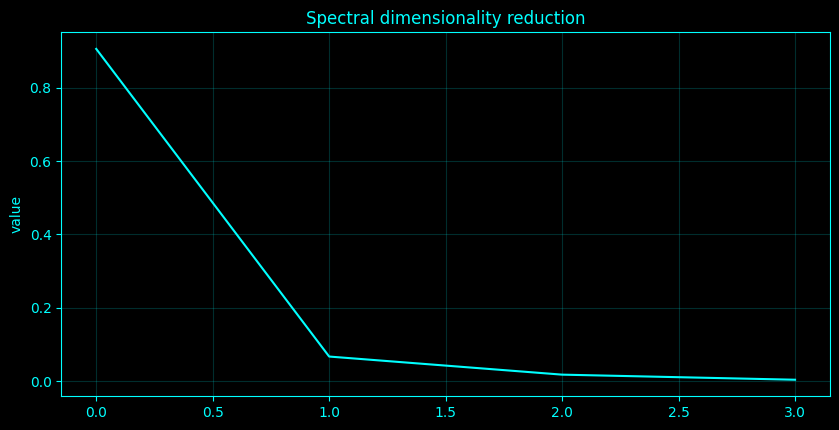

In [73]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _dmd(Xsnap, rank=None):
    X1 = Xsnap[:, :-1]
    X2 = Xsnap[:, 1:]
    U, s, Vh = np.linalg.svd(X1, full_matrices=False)
    r = min(int(rank or _SPEED['rank']), np.sum(s > 1e-10), len(s))
    Ur = U[:, :r]
    sr = s[:r]
    Vr = Vh[:r].conj().T
    Atil = Ur.conj().T @ X2 @ Vr @ np.diag(1 / (sr + EPS))
    eig, W = np.linalg.eig(Atil)
    Phi = X2 @ Vr @ np.diag(1 / (sr + EPS)) @ W
    return (eig, Phi)

# Method-specific calculation.
def _compute_method_367():
    idx = 367
    name = 'Spectral dimensionality reduction'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    Xspec = np.log(P + EPS).T
    Xz = (Xspec - Xspec.mean(0)) / (Xspec.std(0) + EPS)
    r = min(_SPEED['rank'], C, Xz.shape[1])
    pca = PCA(n_components=r).fit(Xz)
    __plot_spec = ('summary', pca.explained_variance_ratio_, name, None, '', 'value')
    return ({'components': r, 'cumulative_variance': float(np.sum(pca.explained_variance_ratio_))}, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    T = np.transpose(np.log(S + EPS), (1, 0, 2))
    tw, W = _window_bandpower()
    snap = np.log(W + EPS).reshape(len(W), -1).T
    eig, Phi = _dmd(snap, rank=min(_SPEED['rank'], snap.shape[0], snap.shape[1] - 1))
    dt = float(np.median(np.diff(tw))) if len(tw) > 1 else 1.0
    omega = np.log(eig + 0j) / (dt + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_367,_plot_spec=_compute_method_367()
print('Spectral dimensionality reduction')
if isinstance(result_367,dict):
    for _k,_v in result_367.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_367)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_367)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral dimensionality reduction',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral dimensionality reduction',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral dimensionality reduction',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">368. Frequency-domain PCA</h3>
<p>Frequency-domain PCA applies PCA to standardized channel log spectra. The covariance eigendecomposition finds orthogonal spectral directions that maximize explained variance.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Frequency-domain PCA
  components: 4
  cumulative_variance: 0.9943209814442456


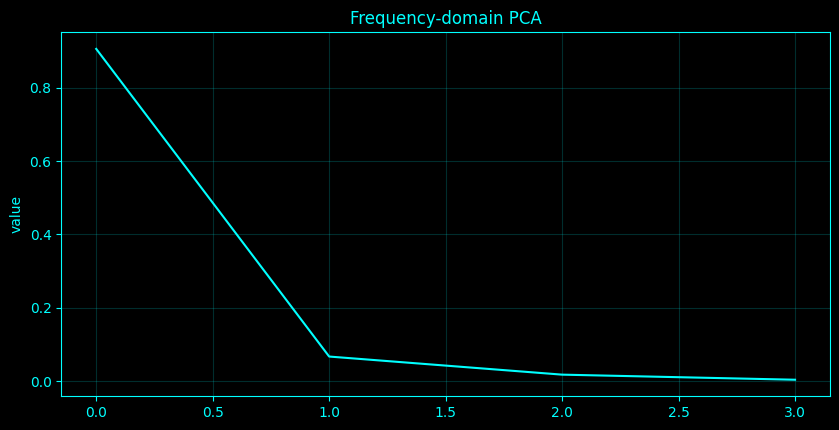

In [74]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _dmd(Xsnap, rank=None):
    X1 = Xsnap[:, :-1]
    X2 = Xsnap[:, 1:]
    U, s, Vh = np.linalg.svd(X1, full_matrices=False)
    r = min(int(rank or _SPEED['rank']), np.sum(s > 1e-10), len(s))
    Ur = U[:, :r]
    sr = s[:r]
    Vr = Vh[:r].conj().T
    Atil = Ur.conj().T @ X2 @ Vr @ np.diag(1 / (sr + EPS))
    eig, W = np.linalg.eig(Atil)
    Phi = X2 @ Vr @ np.diag(1 / (sr + EPS)) @ W
    return (eig, Phi)

# Method-specific calculation.
def _compute_method_368():
    idx = 368
    name = 'Frequency-domain PCA'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    Xspec = np.log(P + EPS).T
    Xz = (Xspec - Xspec.mean(0)) / (Xspec.std(0) + EPS)
    r = min(_SPEED['rank'], C, Xz.shape[1])
    pca = PCA(n_components=r).fit(Xz)
    __plot_spec = ('summary', pca.explained_variance_ratio_, name, None, '', 'value')
    return ({'components': r, 'cumulative_variance': float(np.sum(pca.explained_variance_ratio_))}, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    T = np.transpose(np.log(S + EPS), (1, 0, 2))
    tw, W = _window_bandpower()
    snap = np.log(W + EPS).reshape(len(W), -1).T
    eig, Phi = _dmd(snap, rank=min(_SPEED['rank'], snap.shape[0], snap.shape[1] - 1))
    dt = float(np.median(np.diff(tw))) if len(tw) > 1 else 1.0
    omega = np.log(eig + 0j) / (dt + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_368,_plot_spec=_compute_method_368()
print('Frequency-domain PCA')
if isinstance(result_368,dict):
    for _k,_v in result_368.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_368)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_368)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Frequency-domain PCA',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Frequency-domain PCA',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Frequency-domain PCA',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">369. Frequency-domain ICA</h3>
<p>Frequency-domain ICA applies ICA to channel spectra, seeking independent non-Gaussian spectral components after whitening.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Frequency-domain ICA
  components: 4
  mean_abs_kurtosis: 1.4861371340559821


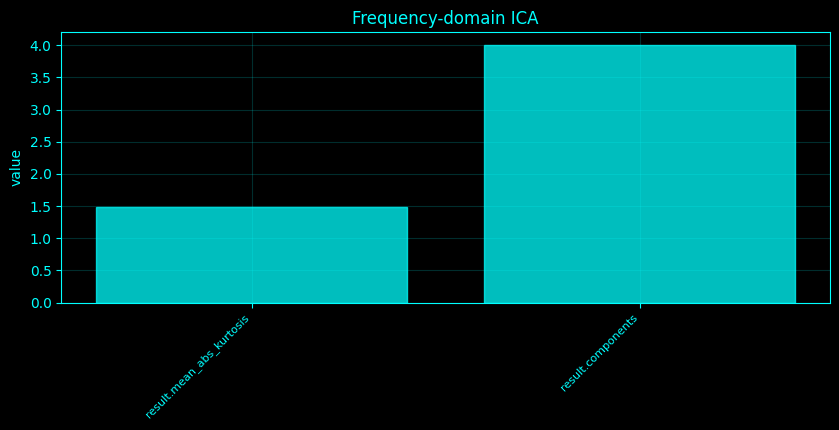

In [75]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _dmd(Xsnap, rank=None):
    X1 = Xsnap[:, :-1]
    X2 = Xsnap[:, 1:]
    U, s, Vh = np.linalg.svd(X1, full_matrices=False)
    r = min(int(rank or _SPEED['rank']), np.sum(s > 1e-10), len(s))
    Ur = U[:, :r]
    sr = s[:r]
    Vr = Vh[:r].conj().T
    Atil = Ur.conj().T @ X2 @ Vr @ np.diag(1 / (sr + EPS))
    eig, W = np.linalg.eig(Atil)
    Phi = X2 @ Vr @ np.diag(1 / (sr + EPS)) @ W
    return (eig, Phi)

# Method-specific calculation.
def _compute_method_369():
    idx = 369
    name = 'Frequency-domain ICA'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    Xspec = np.log(P + EPS).T
    Xz = (Xspec - Xspec.mean(0)) / (Xspec.std(0) + EPS)
    r = min(_SPEED['rank'], C - 1, Xz.shape[1])
    ica = FastICA(n_components=max(1, r), random_state=0, max_iter=1000, whiten='unit-variance').fit(Xz)
    return ({'components': ica.components_.shape[0], 'mean_abs_kurtosis': float(np.mean(np.abs(stats.kurtosis(ica.transform(Xz), axis=0, fisher=True))))}, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    T = np.transpose(np.log(S + EPS), (1, 0, 2))
    tw, W = _window_bandpower()
    snap = np.log(W + EPS).reshape(len(W), -1).T
    eig, Phi = _dmd(snap, rank=min(_SPEED['rank'], snap.shape[0], snap.shape[1] - 1))
    dt = float(np.median(np.diff(tw))) if len(tw) > 1 else 1.0
    omega = np.log(eig + 0j) / (dt + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_369,_plot_spec=_compute_method_369()
print('Frequency-domain ICA')
if isinstance(result_369,dict):
    for _k,_v in result_369.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_369)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_369)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Frequency-domain ICA',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Frequency-domain ICA',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Frequency-domain ICA',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">370. Frequency-domain NMF</h3>
<p>Frequency-domain NMF factorizes nonnegative shifted spectra \(V\approx WH\) into additive channel loadings and spectral basis functions.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Frequency-domain NMF
  rank: 4
  relative_error: 0.024955794751464706


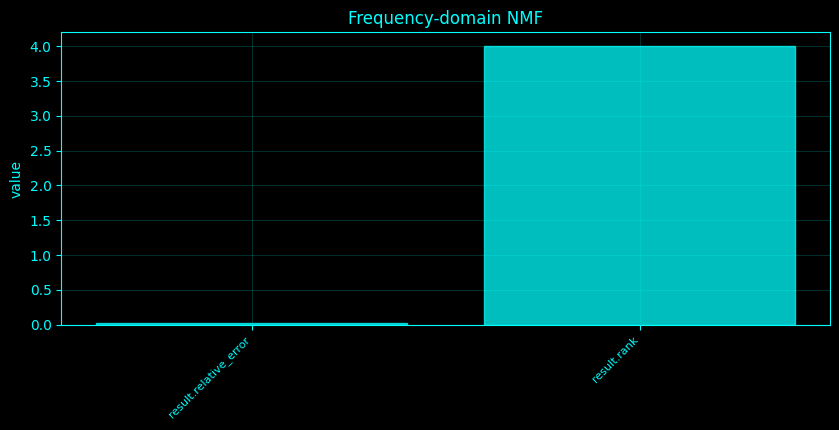

In [76]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _dmd(Xsnap, rank=None):
    X1 = Xsnap[:, :-1]
    X2 = Xsnap[:, 1:]
    U, s, Vh = np.linalg.svd(X1, full_matrices=False)
    r = min(int(rank or _SPEED['rank']), np.sum(s > 1e-10), len(s))
    Ur = U[:, :r]
    sr = s[:r]
    Vr = Vh[:r].conj().T
    Atil = Ur.conj().T @ X2 @ Vr @ np.diag(1 / (sr + EPS))
    eig, W = np.linalg.eig(Atil)
    Phi = X2 @ Vr @ np.diag(1 / (sr + EPS)) @ W
    return (eig, Phi)

# Method-specific calculation.
def _compute_method_370():
    idx = 370
    name = 'Frequency-domain NMF'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    Xspec = np.log(P + EPS).T
    Xz = (Xspec - Xspec.mean(0)) / (Xspec.std(0) + EPS)
    V = Xspec - Xspec.min() + EPS
    r = min(_SPEED['rank'], min(V.shape) - 1)
    nmf = NMF(n_components=max(1, r), init='nndsvda', random_state=0, max_iter=500).fit(V)
    R = nmf.transform(V) @ nmf.components_
    return ({'rank': r, 'relative_error': float(np.linalg.norm(V - R) / (np.linalg.norm(V) + EPS))}, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    T = np.transpose(np.log(S + EPS), (1, 0, 2))
    tw, W = _window_bandpower()
    snap = np.log(W + EPS).reshape(len(W), -1).T
    eig, Phi = _dmd(snap, rank=min(_SPEED['rank'], snap.shape[0], snap.shape[1] - 1))
    dt = float(np.median(np.diff(tw))) if len(tw) > 1 else 1.0
    omega = np.log(eig + 0j) / (dt + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_370,_plot_spec=_compute_method_370()
print('Frequency-domain NMF')
if isinstance(result_370,dict):
    for _k,_v in result_370.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_370)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_370)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Frequency-domain NMF',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Frequency-domain NMF',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Frequency-domain NMF',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">371. Complex PCA of cross-spectral matrices</h3>
<p>Complex PCA of cross-spectral matrices eigendecomposes the Hermitian mean cross-spectrum \(S(f)\). Its eigenvectors are complex spatial modes and eigenvalues give modal spectral power.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Complex PCA of cross-spectral matrices
  complex_PCA_eigenvalue_fraction: array(5,), mean=0.197057


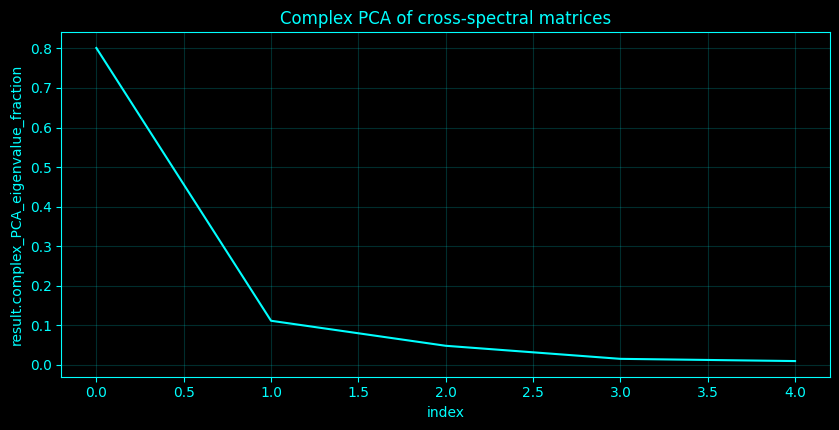

In [77]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _dmd(Xsnap, rank=None):
    X1 = Xsnap[:, :-1]
    X2 = Xsnap[:, 1:]
    U, s, Vh = np.linalg.svd(X1, full_matrices=False)
    r = min(int(rank or _SPEED['rank']), np.sum(s > 1e-10), len(s))
    Ur = U[:, :r]
    sr = s[:r]
    Vr = Vh[:r].conj().T
    Atil = Ur.conj().T @ X2 @ Vr @ np.diag(1 / (sr + EPS))
    eig, W = np.linalg.eig(Atil)
    Phi = X2 @ Vr @ np.diag(1 / (sr + EPS)) @ W
    return (eig, Phi)

# Method-specific calculation.
def _compute_method_371():
    idx = 371
    name = 'Complex PCA of cross-spectral matrices'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    Xspec = np.log(P + EPS).T
    Xz = (Xspec - Xspec.mean(0)) / (Xspec.std(0) + EPS)
    n = min(_SPEED['nperseg'], N)
    step = max(1, n // 2)
    mats = []
    for a in range(0, N - n + 1, step):
        F = np.fft.rfft(X[a:a + n] * signal.windows.hann(n)[:, None], axis=0)
        fre = np.fft.rfftfreq(n, 1 / _fs)
        m = (fre >= 8) & (fre < 13)
        if np.any(m):
            for z in F[m]:
                mats.append(np.outer(z, np.conj(z)))
    Smean = np.mean(mats, axis=0)
    w, V = np.linalg.eigh((Smean + Smean.conj().T) / 2)
    w = np.maximum(w, 0)[::-1]
    return ({'complex_PCA_eigenvalue_fraction': (w / (w.sum() + EPS))[:min(5, len(w))].tolist()}, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    T = np.transpose(np.log(S + EPS), (1, 0, 2))
    tw, W = _window_bandpower()
    snap = np.log(W + EPS).reshape(len(W), -1).T
    eig, Phi = _dmd(snap, rank=min(_SPEED['rank'], snap.shape[0], snap.shape[1] - 1))
    dt = float(np.median(np.diff(tw))) if len(tw) > 1 else 1.0
    omega = np.log(eig + 0j) / (dt + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_371,_plot_spec=_compute_method_371()
print('Complex PCA of cross-spectral matrices')
if isinstance(result_371,dict):
    for _k,_v in result_371.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_371)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_371)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Complex PCA of cross-spectral matrices',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Complex PCA of cross-spectral matrices',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Complex PCA of cross-spectral matrices',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">372. Complex ICA of Fourier coefficients</h3>
<p>Complex Fourier coefficients contain in-phase and quadrature information. The implementation uses a real-augmented representation \([\Re Z,\Im Z]\) for ICA, which preserves both quadratures while using a real FastICA solver.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Complex ICA of Fourier coefficients
  augmented_complex_components: 4
  mean_abs_kurtosis: 9.540784524963607
  note: real-augmented ICA represents complex Fourier coefficients without discarding quadrature


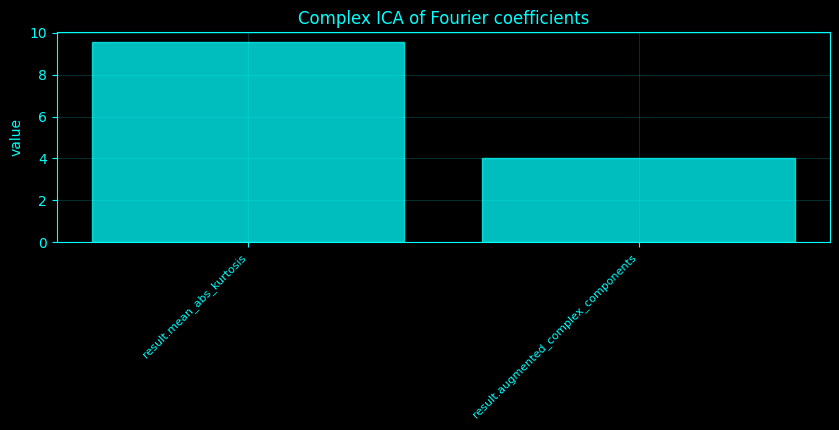

In [78]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _dmd(Xsnap, rank=None):
    X1 = Xsnap[:, :-1]
    X2 = Xsnap[:, 1:]
    U, s, Vh = np.linalg.svd(X1, full_matrices=False)
    r = min(int(rank or _SPEED['rank']), np.sum(s > 1e-10), len(s))
    Ur = U[:, :r]
    sr = s[:r]
    Vr = Vh[:r].conj().T
    Atil = Ur.conj().T @ X2 @ Vr @ np.diag(1 / (sr + EPS))
    eig, W = np.linalg.eig(Atil)
    Phi = X2 @ Vr @ np.diag(1 / (sr + EPS)) @ W
    return (eig, Phi)

# Method-specific calculation.
def _compute_method_372():
    idx = 372
    name = 'Complex ICA of Fourier coefficients'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    Xspec = np.log(P + EPS).T
    Xz = (Xspec - Xspec.mean(0)) / (Xspec.std(0) + EPS)
    n = min(_SPEED['nperseg'], N)
    F = np.fft.rfft(X[:n], axis=0)
    fre = np.fft.rfftfreq(n, 1 / _fs)
    m = (fre >= 2) & (fre <= 45)
    Z = F[m]
    R = np.hstack([Z.real, Z.imag])
    r = min(_SPEED['rank'], R.shape[1], R.shape[0] - 1)
    Sica = FastICA(n_components=max(1, r), random_state=0, max_iter=1000, whiten='unit-variance').fit_transform(R)
    return ({'augmented_complex_components': r, 'mean_abs_kurtosis': float(np.mean(np.abs(stats.kurtosis(Sica, axis=0, fisher=True)))), 'note': 'real-augmented ICA represents complex Fourier coefficients without discarding quadrature'}, locals().get('__plot_spec', None))
    ff, tt, S, _ = _stft_summary()
    T = np.transpose(np.log(S + EPS), (1, 0, 2))
    tw, W = _window_bandpower()
    snap = np.log(W + EPS).reshape(len(W), -1).T
    eig, Phi = _dmd(snap, rank=min(_SPEED['rank'], snap.shape[0], snap.shape[1] - 1))
    dt = float(np.median(np.diff(tw))) if len(tw) > 1 else 1.0
    omega = np.log(eig + 0j) / (dt + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_372,_plot_spec=_compute_method_372()
print('Complex ICA of Fourier coefficients')
if isinstance(result_372,dict):
    for _k,_v in result_372.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_372)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_372)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Complex ICA of Fourier coefficients',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Complex ICA of Fourier coefficients',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Complex ICA of Fourier coefficients',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">373. Spectral tensor decomposition</h3>
<p>Spectral tensor decomposition treats \(T\in\mathbb R^{channel\times frequency\times time}\) as a three-way tensor. HOSVD examines the singular spectrum of each mode unfolding.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Spectral tensor decomposition
  channel_mode: array(4,), mean=0.248866
  frequency_mode: array(4,), mean=0.246842
  time_mode: array(4,), mean=0.246991


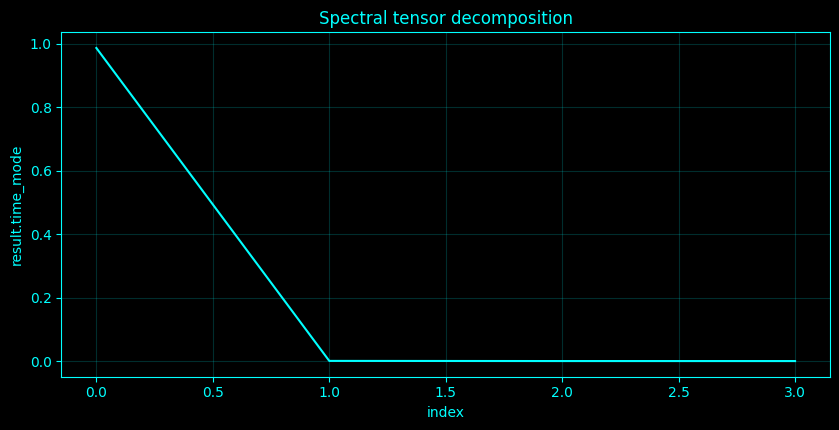

In [79]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _dmd(Xsnap, rank=None):
    X1 = Xsnap[:, :-1]
    X2 = Xsnap[:, 1:]
    U, s, Vh = np.linalg.svd(X1, full_matrices=False)
    r = min(int(rank or _SPEED['rank']), np.sum(s > 1e-10), len(s))
    Ur = U[:, :r]
    sr = s[:r]
    Vr = Vh[:r].conj().T
    Atil = Ur.conj().T @ X2 @ Vr @ np.diag(1 / (sr + EPS))
    eig, W = np.linalg.eig(Atil)
    Phi = X2 @ Vr @ np.diag(1 / (sr + EPS)) @ W
    return (eig, Phi)

# Method-specific calculation.
def _compute_method_373():
    idx = 373
    name = 'Spectral tensor decomposition'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    Xspec = np.log(P + EPS).T
    Xz = (Xspec - Xspec.mean(0)) / (Xspec.std(0) + EPS)
    ff, tt, S, _ = _stft_summary()
    T = np.transpose(np.log(S + EPS), (1, 0, 2))
    spectra = []
    for mode in range(3):
        M = np.moveaxis(T, mode, 0).reshape(T.shape[mode], -1)
        s = np.linalg.svd(M, compute_uv=False)
        spectra.append((s ** 2 / (np.sum(s ** 2) + EPS))[:_SPEED['rank']].tolist())
    return ({'channel_mode': spectra[0], 'frequency_mode': spectra[1], 'time_mode': spectra[2]}, locals().get('__plot_spec', None))
    tw, W = _window_bandpower()
    snap = np.log(W + EPS).reshape(len(W), -1).T
    eig, Phi = _dmd(snap, rank=min(_SPEED['rank'], snap.shape[0], snap.shape[1] - 1))
    dt = float(np.median(np.diff(tw))) if len(tw) > 1 else 1.0
    omega = np.log(eig + 0j) / (dt + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_373,_plot_spec=_compute_method_373()
print('Spectral tensor decomposition')
if isinstance(result_373,dict):
    for _k,_v in result_373.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_373)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_373)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Spectral tensor decomposition',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Spectral tensor decomposition',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Spectral tensor decomposition',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">374. PARAFAC of channel × frequency × time</h3>
<p>PARAFAC/CP models the tensor as \(T_{ijk}\approx\sum_{r=1}^R a_{ir}b_{jr}c_{kr}\). The cell uses alternating least squares on a speed-limited tensor.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

PARAFAC of channel × frequency × time
  CP_rank: 3
  relative_error: 0.11431514935890656


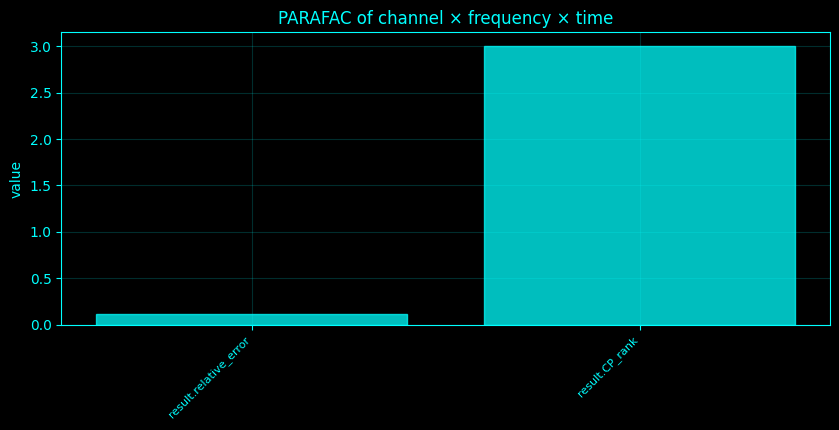

In [80]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _cp_rank1_tensor(T, rank=3, n_iter=30):
    T = np.asarray(T, float)
    I, J, K = T.shape
    rng = np.random.default_rng(123)
    A = rng.normal(size=(I, rank))
    B = rng.normal(size=(J, rank))
    Cc = rng.normal(size=(K, rank))
    for _ in range(n_iter):
        KR = np.einsum('jr,kr->jkr', B, Cc).reshape(J * K, rank)
        A = T.reshape(I, J * K) @ KR @ np.linalg.pinv(B.T @ B * (Cc.T @ Cc) + 1e-08 * np.eye(rank))
        KR = np.einsum('ir,kr->ikr', A, Cc).reshape(I * K, rank)
        B = np.transpose(T, (1, 0, 2)).reshape(J, I * K) @ KR @ np.linalg.pinv(A.T @ A * (Cc.T @ Cc) + 1e-08 * np.eye(rank))
        KR = np.einsum('ir,jr->ijr', A, B).reshape(I * J, rank)
        Cc = np.transpose(T, (2, 0, 1)).reshape(K, I * J) @ KR @ np.linalg.pinv(A.T @ A * (B.T @ B) + 1e-08 * np.eye(rank))
    recon = np.einsum('ir,jr,kr->ijk', A, B, Cc)
    return (A, B, Cc, recon)

def _dmd(Xsnap, rank=None):
    X1 = Xsnap[:, :-1]
    X2 = Xsnap[:, 1:]
    U, s, Vh = np.linalg.svd(X1, full_matrices=False)
    r = min(int(rank or _SPEED['rank']), np.sum(s > 1e-10), len(s))
    Ur = U[:, :r]
    sr = s[:r]
    Vr = Vh[:r].conj().T
    Atil = Ur.conj().T @ X2 @ Vr @ np.diag(1 / (sr + EPS))
    eig, W = np.linalg.eig(Atil)
    Phi = X2 @ Vr @ np.diag(1 / (sr + EPS)) @ W
    return (eig, Phi)

# Method-specific calculation.
def _compute_method_374():
    idx = 374
    name = 'PARAFAC of channel × frequency × time'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    Xspec = np.log(P + EPS).T
    Xz = (Xspec - Xspec.mean(0)) / (Xspec.std(0) + EPS)
    ff, tt, S, _ = _stft_summary()
    T = np.transpose(np.log(S + EPS), (1, 0, 2))
    Ts = T[:, ::max(1, T.shape[1] // 32), ::max(1, T.shape[2] // 48)]
    r = min(3, _SPEED['rank'], min(Ts.shape))
    A1, B1, C1, R = _cp_rank1_tensor(Ts, rank=max(1, r), n_iter=12 if FAST_OPTION == 'ultra' else 25)
    return ({'CP_rank': r, 'relative_error': float(np.linalg.norm(Ts - R) / (np.linalg.norm(Ts) + EPS))}, locals().get('__plot_spec', None))
    tw, W = _window_bandpower()
    snap = np.log(W + EPS).reshape(len(W), -1).T
    eig, Phi = _dmd(snap, rank=min(_SPEED['rank'], snap.shape[0], snap.shape[1] - 1))
    dt = float(np.median(np.diff(tw))) if len(tw) > 1 else 1.0
    omega = np.log(eig + 0j) / (dt + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_374,_plot_spec=_compute_method_374()
print('PARAFAC of channel × frequency × time')
if isinstance(result_374,dict):
    for _k,_v in result_374.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_374)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_374)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'PARAFAC of channel × frequency × time',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'PARAFAC of channel × frequency × time',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('PARAFAC of channel × frequency × time',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">375. Tucker decomposition of spectrogram tensors</h3>
<p>Tucker decomposition projects each tensor mode onto a low-dimensional orthonormal subspace, \(T\approx G\times_1U_1\times_2U_2\times_3U_3\), where \(G\) is the core tensor.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Tucker decomposition of spectrogram tensors
  Tucker_ranks: array(3,), mean=4
  core_norm_fraction: 0.9869857521197557


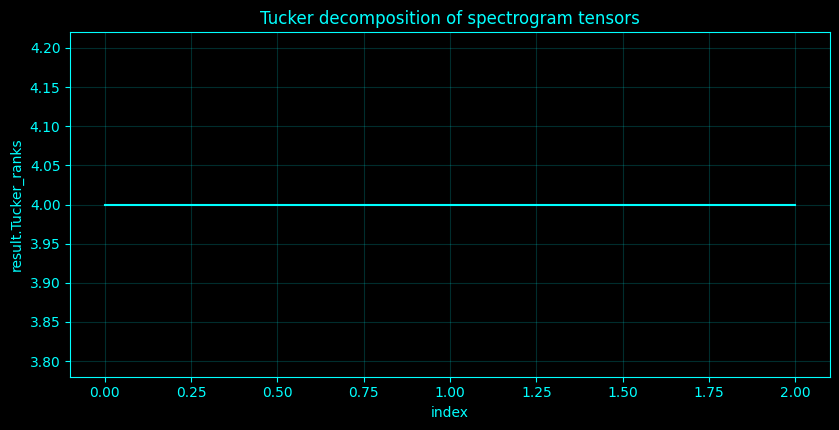

In [81]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _dmd(Xsnap, rank=None):
    X1 = Xsnap[:, :-1]
    X2 = Xsnap[:, 1:]
    U, s, Vh = np.linalg.svd(X1, full_matrices=False)
    r = min(int(rank or _SPEED['rank']), np.sum(s > 1e-10), len(s))
    Ur = U[:, :r]
    sr = s[:r]
    Vr = Vh[:r].conj().T
    Atil = Ur.conj().T @ X2 @ Vr @ np.diag(1 / (sr + EPS))
    eig, W = np.linalg.eig(Atil)
    Phi = X2 @ Vr @ np.diag(1 / (sr + EPS)) @ W
    return (eig, Phi)

# Method-specific calculation.
def _compute_method_375():
    idx = 375
    name = 'Tucker decomposition of spectrogram tensors'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    Xspec = np.log(P + EPS).T
    Xz = (Xspec - Xspec.mean(0)) / (Xspec.std(0) + EPS)
    ff, tt, S, _ = _stft_summary()
    T = np.transpose(np.log(S + EPS), (1, 0, 2))
    ranks = [min(_SPEED['rank'], d) for d in T.shape]
    Us = []
    for mode, r in enumerate(ranks):
        M = np.moveaxis(T, mode, 0).reshape(T.shape[mode], -1)
        U, _, _ = np.linalg.svd(M, full_matrices=False)
        Us.append(U[:, :r])
    core = np.einsum('ia,jb,kc,ijk->abc', Us[0], Us[1], Us[2], T, optimize=True)
    return ({'Tucker_ranks': ranks, 'core_norm_fraction': float(np.linalg.norm(core) ** 2 / (np.linalg.norm(T) ** 2 + EPS))}, locals().get('__plot_spec', None))
    tw, W = _window_bandpower()
    snap = np.log(W + EPS).reshape(len(W), -1).T
    eig, Phi = _dmd(snap, rank=min(_SPEED['rank'], snap.shape[0], snap.shape[1] - 1))
    dt = float(np.median(np.diff(tw))) if len(tw) > 1 else 1.0
    omega = np.log(eig + 0j) / (dt + EPS)
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_375,_plot_spec=_compute_method_375()
print('Tucker decomposition of spectrogram tensors')
if isinstance(result_375,dict):
    for _k,_v in result_375.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_375)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_375)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Tucker decomposition of spectrogram tensors',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Tucker decomposition of spectrogram tensors',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Tucker decomposition of spectrogram tensors',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">376. Dynamic mode decomposition of spectral states</h3>
<p>Dynamic mode decomposition fits a linear map between consecutive spectral-state snapshots. If \(\mu_k\) is a DMD eigenvalue and \(\Delta t\) the snapshot interval, continuous-time rate is \(\omega_k=\log\mu_k/\Delta t\).</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Dynamic mode decomposition of spectral states
  DMD_eigenvalues: array(4,), mean=0.206225
  dominant_frequencies_hz: array(4,), mean=0.0656642


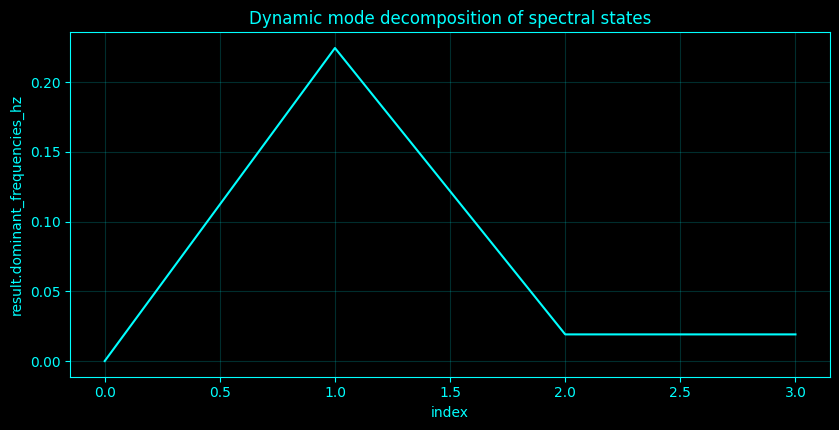

In [82]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _dmd(Xsnap, rank=None):
    X1 = Xsnap[:, :-1]
    X2 = Xsnap[:, 1:]
    U, s, Vh = np.linalg.svd(X1, full_matrices=False)
    r = min(int(rank or _SPEED['rank']), np.sum(s > 1e-10), len(s))
    Ur = U[:, :r]
    sr = s[:r]
    Vr = Vh[:r].conj().T
    Atil = Ur.conj().T @ X2 @ Vr @ np.diag(1 / (sr + EPS))
    eig, W = np.linalg.eig(Atil)
    Phi = X2 @ Vr @ np.diag(1 / (sr + EPS)) @ W
    return (eig, Phi)

# Method-specific calculation.
def _compute_method_376():
    idx = 376
    name = 'Dynamic mode decomposition of spectral states'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    Xspec = np.log(P + EPS).T
    Xz = (Xspec - Xspec.mean(0)) / (Xspec.std(0) + EPS)
    ff, tt, S, _ = _stft_summary()
    T = np.transpose(np.log(S + EPS), (1, 0, 2))
    tw, W = _window_bandpower()
    snap = np.log(W + EPS).reshape(len(W), -1).T
    eig, Phi = _dmd(snap, rank=min(_SPEED['rank'], snap.shape[0], snap.shape[1] - 1))
    dt = float(np.median(np.diff(tw))) if len(tw) > 1 else 1.0
    omega = np.log(eig + 0j) / (dt + EPS)
    return ({'DMD_eigenvalues': eig[:min(8, len(eig))].tolist(), 'dominant_frequencies_hz': (np.abs(np.imag(omega)) / (2 * np.pi))[:min(8, len(eig))].tolist()}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_376,_plot_spec=_compute_method_376()
print('Dynamic mode decomposition of spectral states')
if isinstance(result_376,dict):
    for _k,_v in result_376.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_376)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_376)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Dynamic mode decomposition of spectral states',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Dynamic mode decomposition of spectral states',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Dynamic mode decomposition of spectral states',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)


<div style="font-size:13px;font-family:'Times New Roman',Times,serif;background-color:#181818;color:#D0D0D0;padding:18px;border-radius:8px;margin:10px;line-height:1.55;">
<h3 style="color:#E8E8E8;margin-top:0;">377. Koopman spectral analysis</h3>
<p>Koopman spectral analysis approximates the Koopman operator on chosen observables—in this notebook, log channel×band powers—using DMD. \(\Re\omega_k\) gives modal growth/decay and \(\Im\omega_k/(2\pi)\) the modal frequency.</p>
<p><b>Implementation.</b> The following cell applies this definition to the shared EEG data with the notebook's existing cyan-on-black visualization conventions and speed-mode controls.</p>
</div>

Koopman spectral analysis
  Koopman_growth_rates: array(4,), mean=-0.532826
  Koopman_frequencies_hz: array(4,), mean=0.0561041
  observables: log channel × band power


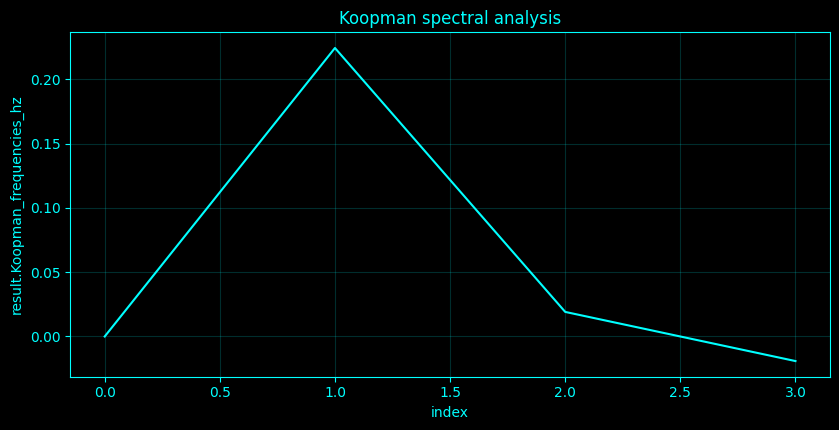

In [83]:
# Standalone spectral-theory implementation: all data preparation and mathematics used by this method are in this cell.
import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy import signal, linalg, stats, ndimage
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.decomposition import PCA, NMF, FastICA, DictionaryLearning, LatentDirichletAllocation
from sklearn.cluster import KMeans
from sklearn.covariance import GraphicalLasso
from sklearn.metrics import pairwise_distances
import networkx as nx

EPS=1e-12
BASE_DIR="/home/a/projects/Complete-Neural-Signal-Analysis"
EEG_PATH=os.path.join(BASE_DIR,"eeg_data_with_channels.npy")
SAMPLING_RATE=1000.0
START_TIME,END_TIME=814.571,921.515
EEG_CHANNEL_NAMES=['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8','FC5','FC1','FC2','FC6','M1','T7','C3','Cz','C4','T8','M2','CP5','CP1','CP2','CP6','P7','P3','Pz','P4','P8','POz','O1','Oz','O2']
ELECTRODE_XY={
    'Fp1':(-.45,1.00),'Fpz':(0,1.05),'Fp2':(.45,1.00),'F7':(-.95,.55),'F3':(-.45,.55),'Fz':(0,.60),'F4':(.45,.55),'F8':(.95,.55),
    'FC5':(-.70,.25),'FC1':(-.25,.25),'FC2':(.25,.25),'FC6':(.70,.25),'M1':(-1.10,0),'T7':(-.95,0),'C3':(-.45,0),'Cz':(0,0),'C4':(.45,0),'T8':(.95,0),'M2':(1.10,0),
    'CP5':(-.70,-.25),'CP1':(-.25,-.25),'CP2':(.25,-.25),'CP6':(.70,-.25),'P7':(-.95,-.55),'P3':(-.45,-.55),'Pz':(0,-.60),'P4':(.45,-.55),'P8':(.95,-.55),
    'POz':(0,-.82),'O1':(-.35,-1.00),'Oz':(0,-1.05),'O2':(.35,-1.00)}
LEFT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('1','3','5','7'))]
RIGHT=[c for c in EEG_CHANNEL_NAMES if c.endswith(('2','4','6','8'))]
ROI={'frontal':['Fp1','Fpz','Fp2','F3','Fz','F4'],'central':['C3','Cz','C4'],'posterior':['P3','Pz','P4','O1','Oz','O2']}
BANDS={'delta':(1,4),'theta':(4,8),'alpha':(8,13),'beta':(13,30),'gamma':(30,45)}
ACCENT,BG='#00FFFF','#000000'
plt.rcParams.update({'figure.facecolor':BG,'axes.facecolor':BG,'savefig.facecolor':BG,'text.color':ACCENT,'axes.labelcolor':ACCENT,'axes.edgecolor':ACCENT,'axes.titlecolor':ACCENT,'xtick.color':ACCENT,'ytick.color':ACCENT,'grid.color':ACCENT,'legend.facecolor':BG,'legend.edgecolor':ACCENT})
FAST_OPTION=globals().get('FAST_OPTION','ultra')
if FAST_OPTION not in {'full','balanced','fast','ultra'}:
    raise ValueError('FAST_OPTION must be one of: full, balanced, fast, ultra')
_SPEED={
    'full':dict(down=1,max_samples=100000,max_channels=32,nperseg=2048,overlap=.75,n_windows=180,var_order=10,n_sur=80,graph_k=10,rank=8),
    'balanced':dict(down=2,max_samples=60000,max_channels=24,nperseg=1024,overlap=.70,n_windows=120,var_order=8,n_sur=40,graph_k=8,rank=6),
    'fast':dict(down=4,max_samples=30000,max_channels=16,nperseg=768,overlap=.65,n_windows=80,var_order=6,n_sur=20,graph_k=6,rank=5),
    'ultra':dict(down=8,max_samples=16000,max_channels=12,nperseg=512,overlap=.50,n_windows=48,var_order=5,n_sur=8,graph_k=5,rank=4)}[FAST_OPTION]
if 'SPECTRAL_DATA_OVERRIDE' in globals():
    _raw=np.asarray(globals()['SPECTRAL_DATA_OVERRIDE']);_fs0=float(globals().get('SPECTRAL_FS_OVERRIDE',SAMPLING_RATE))
else:
    _raw=np.asarray(np.load(EEG_PATH,allow_pickle=True));_fs0=SAMPLING_RATE
if _raw.ndim!=2: raise ValueError(f'Expected 2-D EEG array, got {_raw.shape}')
if _raw.shape[1]==len(EEG_CHANNEL_NAMES): pass
elif _raw.shape[0]==len(EEG_CHANNEL_NAMES) or (_raw.shape[0]<_raw.shape[1] and _raw.shape[0]<=64): _raw=_raw.T
if 'SPECTRAL_DATA_OVERRIDE' not in globals():
    _s0,_e0=int(START_TIME*_fs0),int(END_TIME*_fs0)
    if _e0<=_raw.shape[0]: _raw=_raw[_s0:_e0]
_names=EEG_CHANNEL_NAMES[:_raw.shape[1]]
_sel_ch=min(_SPEED['max_channels'],_raw.shape[1]);_raw=_raw[:,:_sel_ch];_names=_names[:_sel_ch]
_down=max(1,int(_SPEED['down']))
if _down>1: _raw=signal.resample_poly(_raw,1,_down,axis=0)
_fs=_fs0/_down
if _raw.shape[0]>_SPEED['max_samples']: _raw=_raw[:_SPEED['max_samples']]
X=signal.detrend(np.asarray(_raw,float),axis=0,type='constant')
X=(X-np.mean(X,axis=0,keepdims=True))/(np.std(X,axis=0,keepdims=True)+EPS)
N,C=X.shape;CH_NAMES=_names;SPEC_CACHE={}
_rng=np.random.default_rng(20260914)

# Mathematical definitions used by this method.
def _welch_all():
    if 'welch' in SPEC_CACHE:
        return SPEC_CACHE['welch']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(int(_SPEED['overlap'] * nper), nper - 1)
    f, P = signal.welch(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, detrend='constant', scaling='density')
    keep = f <= min(55.0, 0.49 * _fs)
    SPEC_CACHE['welch'] = (f[keep], P[keep])
    return SPEC_CACHE['welch']

def _band_integral(P, f, band):
    lo, hi = band
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.full(P.shape[1:], np.nan)
    if np.sum(m) == 1:
        df = np.median(np.diff(f)) if len(f) > 1 else 1.0
        return P[m][0] * df
    return np.trapz(P[m], f[m], axis=0)

def _window_bandpower():
    if 'window_bandpower' in SPEC_CACHE:
        return SPEC_CACHE['window_bandpower']
    nwin = min(_SPEED['n_windows'], max(8, N // max(64, int(_fs))))
    edges = np.linspace(0, N, nwin + 1, dtype=int)
    rows = []
    for a, b in zip(edges[:-1], edges[1:]):
        xx = X[a:b]
        if len(xx) < 16:
            continue
        nw = min(max(32, len(xx) // 2), int(_SPEED['nperseg']), len(xx))
        f, p = signal.welch(xx, fs=_fs, axis=0, nperseg=nw, noverlap=nw // 2)
        rows.append(np.stack([_band_integral(p, f, bb) for bb in BANDS.values()], axis=1))
    W = np.stack(rows, axis=0)
    t = (edges[:-1][:len(rows)] + edges[1:1 + len(rows)]) / (2 * _fs)
    SPEC_CACHE['window_bandpower'] = (t, W)
    return SPEC_CACHE['window_bandpower']

def _stft_summary():
    if 'stft' in SPEC_CACHE:
        return SPEC_CACHE['stft']
    nper = min(int(_SPEED['nperseg']), N)
    nover = min(nper // 2, nper - 1)
    f, t, Z = signal.stft(X, fs=_fs, axis=0, nperseg=nper, noverlap=nover, boundary=None, padded=False)
    keep = (f >= 1) & (f <= min(55, 0.49 * _fs))
    SPEC_CACHE['stft'] = (f[keep], t, np.abs(Z[keep]) ** 2, Z[keep])
    return SPEC_CACHE['stft']

def _dmd(Xsnap, rank=None):
    X1 = Xsnap[:, :-1]
    X2 = Xsnap[:, 1:]
    U, s, Vh = np.linalg.svd(X1, full_matrices=False)
    r = min(int(rank or _SPEED['rank']), np.sum(s > 1e-10), len(s))
    Ur = U[:, :r]
    sr = s[:r]
    Vr = Vh[:r].conj().T
    Atil = Ur.conj().T @ X2 @ Vr @ np.diag(1 / (sr + EPS))
    eig, W = np.linalg.eig(Atil)
    Phi = X2 @ Vr @ np.diag(1 / (sr + EPS)) @ W
    return (eig, Phi)

# Method-specific calculation.
def _compute_method_377():
    idx = 377
    name = 'Koopman spectral analysis'
    __plot_spec = None
    'Execute one catalogue method using the shared EEG segment and cached intermediates.'
    f, P = _welch_all()
    Xspec = np.log(P + EPS).T
    Xz = (Xspec - Xspec.mean(0)) / (Xspec.std(0) + EPS)
    ff, tt, S, _ = _stft_summary()
    T = np.transpose(np.log(S + EPS), (1, 0, 2))
    tw, W = _window_bandpower()
    snap = np.log(W + EPS).reshape(len(W), -1).T
    eig, Phi = _dmd(snap, rank=min(_SPEED['rank'], snap.shape[0], snap.shape[1] - 1))
    dt = float(np.median(np.diff(tw))) if len(tw) > 1 else 1.0
    omega = np.log(eig + 0j) / (dt + EPS)
    return ({'Koopman_growth_rates': np.real(omega[:min(8, len(omega))]).tolist(), 'Koopman_frequencies_hz': (np.imag(omega[:min(8, len(omega))]) / (2 * np.pi)).tolist(), 'observables': 'log channel × band power'}, locals().get('__plot_spec', None))
    raise KeyError(f'Catalogue method {idx}: {name} has no implementation')

result_377,_plot_spec=_compute_method_377()
print('Koopman spectral analysis')
if isinstance(result_377,dict):
    for _k,_v in result_377.items():
        if np.isscalar(_v) or isinstance(_v,str): print(f"  {_k}: {_v}")
        else:
            try:
                _a=np.asarray(_v)
                if np.issubdtype(_a.dtype,np.number):
                    _r=np.real(_a);_ok=np.isfinite(_r);_mean=float(np.mean(_r[_ok])) if np.any(_ok) else np.nan
                    print(f"  {_k}: array{_a.shape}, mean={_mean:.6g}")
                else: print(f"  {_k}: {str(_v)[:160]}")
            except Exception: print(f"  {_k}: {str(_v)[:160]}")
else: print(result_377)

# Plot only when the result contains at least two finite numerical values.
_numeric_arrays=[];_scalar_labels=[];_scalar_values=[];_stack=[('result',result_377)]
while _stack:
    _key,_val=_stack.pop()
    if isinstance(_val,dict):
        _stack.extend((str(_key)+'.'+str(_k),_v) for _k,_v in _val.items());continue
    if isinstance(_val,(str,bytes)) or _val is None: continue
    if np.isscalar(_val):
        try:
            _z=complex(_val)
            if np.isfinite(_z.real) and np.isfinite(_z.imag):
                _scalar_labels.append(str(_key));_scalar_values.append(float(abs(_z) if abs(_z.imag)>0 else _z.real))
        except Exception: pass
        continue
    try:
        _a=np.asarray(_val)
        if np.issubdtype(_a.dtype,np.number):
            _b=np.abs(_a) if np.iscomplexobj(_a) else _a.astype(float)
            if np.sum(np.isfinite(_b))>0: _numeric_arrays.append((str(_key),_b))
        elif isinstance(_val,(list,tuple)):
            _stack.extend((f'{_key}[{_j}]',_vv) for _j,_vv in enumerate(_val))
    except Exception: pass
_numeric_count=len(_scalar_values)+sum(int(np.sum(np.isfinite(_a))) for _,_a in _numeric_arrays)
if _numeric_count>=2:
    _cm=LinearSegmentedColormap.from_list('black_cyan',[BG,ACCENT]);_shown=False
    if _plot_spec is not None:
        _kind,_pdata,_ptitle,_px,_pxlabel,_pylabel=_plot_spec
        _pdata=np.asarray(_pdata);_pdata=np.abs(_pdata) if np.iscomplexobj(_pdata) else np.asarray(_pdata,float)
        if np.sum(np.isfinite(_pdata))>=2:
            if _kind=='scalp':
                _xy=np.array([ELECTRODE_XY.get(_ch,(np.nan,np.nan)) for _ch in CH_NAMES],float);_vals=np.ravel(_pdata)
                _good=np.isfinite(_xy).all(1)&np.isfinite(_vals[:len(_xy)])
                if np.sum(_good)>=2:
                    _fig,_ax=plt.subplots(figsize=(5.2,4.8),facecolor=BG);_sc=_ax.scatter(_xy[_good,0],_xy[_good,1],c=_vals[:len(_xy)][_good],s=95,cmap=_cm)
                    _cb=_fig.colorbar(_sc,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT)
                    _th=np.linspace(0,2*np.pi,240);_ax.plot(1.15*np.cos(_th),1.15*np.sin(_th),color=ACCENT,lw=1.2);_ax.set_aspect('equal');_ax.set_xticks([]);_ax.set_yticks([]);_ax.set_title(_ptitle or 'Koopman spectral analysis',color=ACCENT);_ax.set_facecolor(BG)
                    for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                    _fig.tight_layout();plt.show();plt.close(_fig);_shown=True
            else:
                _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
                for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
                if _pdata.ndim==1:
                    _x=np.arange(len(_pdata)) if _px is None else np.asarray(_px);_ok=np.isfinite(_pdata)&np.isfinite(_x)
                    if np.sum(_ok)>=2: _ax.plot(_x[_ok],_pdata[_ok],color=ACCENT,lw=1.5);_shown=True
                else:
                    _m=np.squeeze(_pdata);_m=_m.reshape(_m.shape[0],-1) if _m.ndim>2 else _m
                    if _m.ndim==2 and np.sum(np.isfinite(_m))>=2:
                        _im=_ax.imshow(_m,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_shown=True
                _ax.set_title(_ptitle or 'Koopman spectral analysis',color=ACCENT);_ax.set_xlabel(_pxlabel,color=ACCENT);_ax.set_ylabel(_pylabel,color=ACCENT)
                if _shown: _fig.tight_layout();plt.show()
                plt.close(_fig)
    if not _shown:
        _candidate=None
        for _label,_arr in sorted(_numeric_arrays,key=lambda kv:np.asarray(kv[1]).size,reverse=True):
            if np.sum(np.isfinite(_arr))>=2: _candidate=(_label,np.squeeze(_arr));break
        _fig,_ax=plt.subplots(figsize=(8.5,4.4),facecolor=BG);_ax.set_facecolor(BG);_ax.tick_params(colors=ACCENT);_ax.grid(True,color=ACCENT,alpha=.18)
        for _sp in _ax.spines.values(): _sp.set_color(ACCENT)
        if _candidate is not None:
            _label,_arr=_candidate
            if _arr.ndim==1:
                _ok=np.isfinite(_arr);_ax.plot(np.arange(len(_arr))[_ok],_arr[_ok],color=ACCENT,lw=1.5);_ax.set_xlabel('index',color=ACCENT);_ax.set_ylabel(_label,color=ACCENT)
            else:
                if _arr.ndim>2: _arr=_arr.reshape(_arr.shape[0],-1)
                _im=_ax.imshow(_arr,aspect='auto',origin='lower',cmap=_cm,interpolation='nearest');_cb=_fig.colorbar(_im,ax=_ax);_cb.ax.tick_params(colors=ACCENT);_cb.outline.set_edgecolor(ACCENT);_ax.set_xlabel('column',color=ACCENT);_ax.set_ylabel('row',color=ACCENT)
        elif len(_scalar_values)>=2:
            _xx=np.arange(len(_scalar_values));_ax.bar(_xx,_scalar_values,color=ACCENT,edgecolor=ACCENT,alpha=.75);_ax.set_xticks(_xx);_ax.set_xticklabels(_scalar_labels,rotation=45,ha='right',fontsize=8);_ax.set_ylabel('value',color=ACCENT)
        _ax.set_title('Koopman spectral analysis',color=ACCENT);_fig.tight_layout();plt.show();plt.close(_fig)
